Проведем импорт необходимых библиотек для работы с табличными данными

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

In [2]:
data = pd.read_csv('./X_train.csv')

In [3]:
target = pd.read_csv('./y_train.csv')

Объединим данные и таргет, для того, чтобы их совместно обрабатывать

In [4]:
data = pd.concat([data, target], axis = 1)

Рассмотрим пропуски в данных 

In [5]:
data.isna().sum()

credit_card_utilization           0
age                               0
overdue_30_59_days                0
debt_to_income                    0
monthly_income                20993
credits_loans                     0
overdue__more_than_90_days        0
mortgage_loans                    0
overdue_60_89_days                0
family_members                 2805
target                            0
dtype: int64

Для того, чтобы не заполнять пустые значения по месячному доходу медианой, попробуем рассмотреть, какие другие факторы имеют влияние на месячный доход 

In [6]:
data.corr()

,credit_card_utilization,age,overdue_30_59_days,debt_to_income,monthly_income,credits_loans,overdue__more_than_90_days,mortgage_loans,overdue_60_89_days,family_members,target
credit_card_utilization,1.000000,-0.007313,-0.001276,0.003155,0.011236,-0.010075,-0.000959,0.003955,-0.000945,0.002024,-0.000641
age,-0.007313,1.000000,-0.064367,0.023804,0.048908,0.148412,-0.062283,0.032206,-0.058455,-0.213706,-0.116213
overdue_30_59_days,-0.001276,-0.064367,1.000000,-0.007899,-0.013712,-0.056056,0.984247,-0.030510,0.987364,-0.003549,0.130300
debt_to_income,0.003155,0.023804,-0.007899,1.000000,-0.037227,0.053406,-0.009179,0.129559,-0.008469,-0.049210,-0.008377
monthly_income,0.011236,0.048908,-0.013712,-0.037227,1.000000,0.117433,-0.017596,0.164191,-0.015749,0.075874,-0.026169
credits_loans,-0.010075,0.148412,-0.056056,0.053406,0.117433,1.000000,-0.080645,0.429016,-0.071783,0.065265,-0.028204
overdue__more_than_90_days,-0.000959,-0.062283,0.984247,-0.009179,-0.017596,-0.080645,1.000000,-0.045748,0.993282,-0.011628,0.121366
mortgage_loans,0.003955,0.032206,-0.030510,0.129559,0.164191,0.429016,-0.045748,1.000000,-0.040200,0.123821,-0.006809
overdue_60_89_days,-0.000945,-0.058455,0.987364,-0.008469,-0.015749,-0.071783,0.993282,-0.040200,1.000000,-0.012482,0.106931
family_members,0.002024,-0.213706,-0.003549,-0.049210,0.075874,0.065265,-0.011628,0.123821,-0.012482,1.000000,0.049866


Мы можем заметить, что наибольшее влияние оказывают переменные 'credits_loans', 'mortgage_loans', 'family_members'. Сгруппируем данные по ним и вычислим медиану по каждой такой группе.

In [2032]:
grouped_means = data.groupby([
              'credits_loans',
              'mortgage_loans',
              'family_members',
             ])['monthly_income'].transform("median")

Заполним данными по каждой группе пропуски

In [2033]:
data['monthly_income'] = data['monthly_income'].fillna(grouped_means)

In [2034]:
data.isna().sum()

credit_card_utilization          0
age                              0
overdue_30_59_days               0
debt_to_income                   0
monthly_income                2849
credits_loans                    0
overdue__more_than_90_days       0
mortgage_loans                   0
overdue_60_89_days               0
family_members                2805
target                           0
dtype: int64

У нас осталось еще около 3 тысяч пропусков в месячном доходе и членах семьи, которые мы заполним при помощи медианы, а после проведем группировку как в прошлом пункте 

In [2035]:
data['family_members'] = data['family_members'].fillna(data['family_members'].median())

In [2036]:
data.isna().sum()

credit_card_utilization          0
age                              0
overdue_30_59_days               0
debt_to_income                   0
monthly_income                2849
credits_loans                    0
overdue__more_than_90_days       0
mortgage_loans                   0
overdue_60_89_days               0
family_members                   0
target                           0
dtype: int64

In [2037]:
grouped_means = data.groupby([
              'credits_loans',
              'mortgage_loans',
              'family_members',
             ])['monthly_income'].transform("median")

In [2038]:
data['monthly_income'] = data['monthly_income'].fillna(grouped_means)

In [2039]:
data.isna().sum()

credit_card_utilization        0
age                            0
overdue_30_59_days             0
debt_to_income                 0
monthly_income                45
credits_loans                  0
overdue__more_than_90_days     0
mortgage_loans                 0
overdue_60_89_days             0
family_members                 0
target                         0
dtype: int64

Оставшиеся пустые значения заполним при помощи медианы по месячному доходу

In [2040]:
data['monthly_income'] = data['monthly_income'].fillna(data['monthly_income'].median())

In [2041]:
data.isna().sum()

credit_card_utilization       0
age                           0
overdue_30_59_days            0
debt_to_income                0
monthly_income                0
credits_loans                 0
overdue__more_than_90_days    0
mortgage_loans                0
overdue_60_89_days            0
family_members                0
target                        0
dtype: int64

Разделим данные на обучающую и валидационные выборки

In [27]:
X = data.drop('target', axis = 1)
y = data['target']

In [2043]:
from sklearn.model_selection import train_test_split

data, X_valid, target, y_valid = train_test_split(X, y, test_size=0.2, stratify = y)

In [2044]:
data = pd.concat([data, target], axis = 1)

**Проведем разведочный анализ данных (EDA)**

In [2045]:
data.describe()

,credit_card_utilization,age,overdue_30_59_days,debt_to_income,monthly_income,credits_loans,overdue__more_than_90_days,mortgage_loans,overdue_60_89_days,family_members,target
count,84087.000000,84087.000000,84087.000000,84087.000000,8.408700e+04,84087.000000,84087.000000,84087.000000,84087.000000,84087.000000,84087.000000
mean,5.201115,53.335843,0.434074,355.632198,6.303276e+03,8.956949,0.277712,1.022857,0.251918,0.740531,0.066895
std,180.464249,14.802140,4.339995,1949.497735,1.056487e+04,5.191914,4.317211,1.148760,4.304075,1.110335,0.249842
min,0.000000,21.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.029676,42.000000,0.000000,0.173315,3.452527e+03,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.154139,53.000000,0.000000,0.365307,5.119033e+03,8.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,0.552746,64.000000,0.000000,0.878619,7.502495e+03,12.000000,0.000000,2.000000,0.000000,1.000000,0.000000
max,22283.019973,111.000000,98.000000,323248.210242,1.359526e+06,58.000000,98.000000,54.000000,98.000000,20.000000,1.000000


Построим боксплоты распределения по каждой переменной в зависимости от значения таргета

In [2046]:
features = ['credit_card_utilization', 'age', 'overdue_30_59_days', 'debt_to_income', 'monthly_income', 'credits_loans', 
            'overdue__more_than_90_days', 'mortgage_loans', 'overdue_60_89_days', 'family_members']

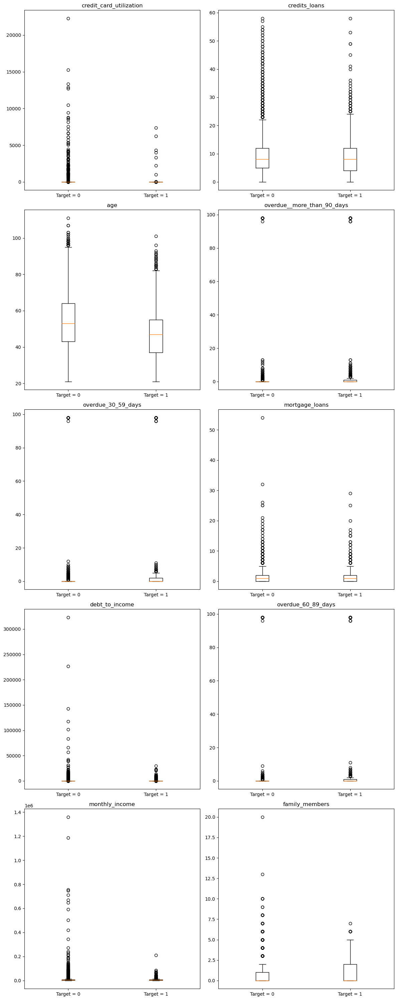

In [2047]:
fig, axs = plt.subplots(len(features) // 2, 2)
fig.set_size_inches(12, 30)

for i, feature in enumerate(features):
    ax = axs[i % (len(features) // 2)][i // (len(features) // 2)]
    
    ax.boxplot([data[feature][data['target'] == 0], data[feature][data['target'] == 1]], labels = ['Target = 0', 'Target = 1'])
    ax.set_title(feature)
    
plt.tight_layout()
plt.show()

Как можно заметить, данные имеют достаточно много выбросов, необходимо заняться их очисткой. Очищать данные от выбросов будем при помощи квантилей и строних ограничений значений

In [28]:
data = data[data['credit_card_utilization'] < data['credit_card_utilization'].quantile(0.995)]

In [29]:
data = data[data['age'] < 90]

In [30]:
data = data[data['age'] > 20]

In [31]:
data = data[data['overdue_30_59_days'] < 20]

In [32]:
data = data[data['debt_to_income'] < data['debt_to_income'].quantile(0.95)]

In [33]:
data = data[data['monthly_income'] < data['monthly_income'].quantile(0.95)]

In [34]:
data = data[data['credits_loans'] < data['credits_loans'].quantile(0.95)]

In [35]:
data = data[data['overdue__more_than_90_days'] < 20]

In [36]:
data = data[data['mortgage_loans'] < data['mortgage_loans'].quantile(0.95)]

In [37]:
data = data[data['overdue_60_89_days'] < 20]

In [38]:
data = data[data['family_members'] < data['family_members'].quantile(0.99)]

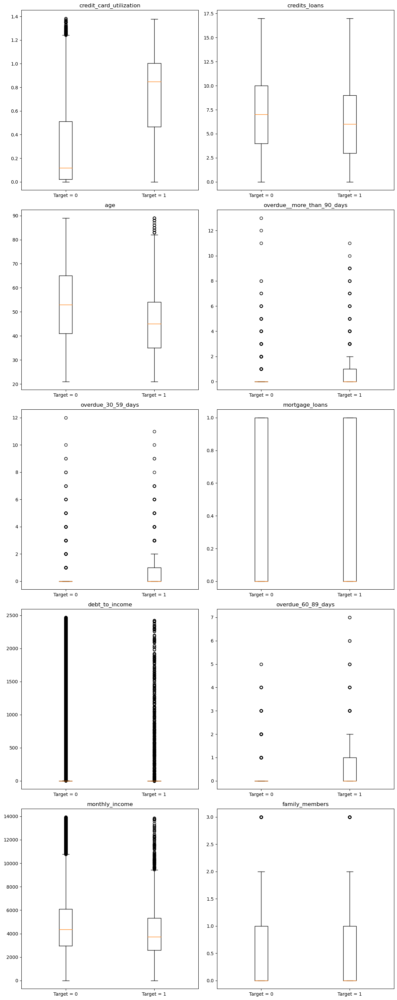

In [2059]:
fig, axs = plt.subplots(len(features) // 2, 2)
fig.set_size_inches(12, 30)

for i, feature in enumerate(features):
    ax = axs[i % (len(features) // 2)][i // (len(features) // 2)]
    
    ax.boxplot([data[feature][data['target'] == 0], data[feature][data['target'] == 1]], labels = ['Target = 0', 'Target = 1'])
    ax.set_title(feature)
    
plt.tight_layout()
plt.show()

После очистки данных рассмотрим корреляции между переменными и таргетом

In [39]:
data.corr()

,credit_card_utilization,age,overdue_30_59_days,debt_to_income,monthly_income,credits_loans,overdue__more_than_90_days,mortgage_loans,overdue_60_89_days,family_members,target
credit_card_utilization,1.000000,-0.266102,0.245305,-0.013402,-0.112852,-0.186273,0.242009,-0.097068,0.191330,0.088343,0.268580
age,-0.266102,1.000000,-0.064878,-0.014689,0.125355,0.187082,-0.076383,0.075293,-0.061540,-0.197165,-0.101537
overdue_30_59_days,0.245305,-0.064878,1.000000,-0.007952,-0.009086,0.070827,0.228836,0.017043,0.296017,0.062815,0.280134
debt_to_income,-0.013402,-0.014689,-0.007952,1.000000,-0.168829,0.007795,-0.010149,0.027069,-0.001155,0.017841,-0.008847
monthly_income,-0.112852,0.125355,-0.009086,-0.168829,1.000000,0.248625,-0.057272,0.318595,-0.039603,0.170390,-0.061667
credits_loans,-0.186273,0.187082,0.070827,0.007795,0.248625,1.000000,-0.104682,0.387091,-0.025934,0.057351,-0.036792
overdue__more_than_90_days,0.242009,-0.076383,0.228836,-0.010149,-0.057272,-0.104682,1.000000,-0.076079,0.289104,0.040772,0.322641
mortgage_loans,-0.097068,0.075293,0.017043,0.027069,0.318595,0.387091,-0.076079,1.000000,-0.030717,0.150372,-0.041673
overdue_60_89_days,0.191330,-0.061540,0.296017,-0.001155,-0.039603,-0.025934,0.289104,-0.030717,1.000000,0.039371,0.270896
family_members,0.088343,-0.197165,0.062815,0.017841,0.170390,0.057351,0.040772,0.150372,0.039371,1.000000,0.047743


Мы подготовили данные к обучению.
Попробуем несколько алгоритмов, чтобы посмотреть, как они будут справляться с поставленной задачей классификации

In [40]:
X = data.drop('target', axis = 1)
y = data['target']

Разделим данные на тестовую и обучающие выборки

In [2062]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = y)

Проведем импорт GridSearchCV для подбора гиперпараметров у алгоритмов, а также roc_auc_score для измерения качества полученных моделей

In [2063]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

Обучим модель KNN

In [2064]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import make_scorer, roc_auc_score, accuracy_score, precision_score, recall_score, f1_score

KNN = KNeighborsClassifier()

param_grid_KNN = {'n_neighbors' : [i for i in range(20, 151, 10)]}, #Количество соседей
                

grid_KNN = GridSearchCV(estimator = KNN, 
                        param_grid = param_grid_KNN, 
                        scoring = 'roc_auc',
                        verbose = 3,
                        refit=True)

grid_KNN_result = grid_KNN.fit(X_train, y_train)
    

Fitting 5 folds for each of 14 candidates, totalling 70 fits
[CV 1/5] END ....................n_neighbors=20;, score=0.583 total time=   0.1s
[CV 2/5] END ....................n_neighbors=20;, score=0.583 total time=   0.1s
[CV 3/5] END ....................n_neighbors=20;, score=0.581 total time=   0.0s
[CV 4/5] END ....................n_neighbors=20;, score=0.607 total time=   0.1s
[CV 5/5] END ....................n_neighbors=20;, score=0.598 total time=   0.1s
[CV 1/5] END ....................n_neighbors=30;, score=0.598 total time=   0.1s
[CV 2/5] END ....................n_neighbors=30;, score=0.594 total time=   0.1s
[CV 3/5] END ....................n_neighbors=30;, score=0.597 total time=   0.1s
[CV 4/5] END ....................n_neighbors=30;, score=0.613 total time=   0.1s
[CV 5/5] END ....................n_neighbors=30;, score=0.613 total time=   0.1s
[CV 1/5] END ....................n_neighbors=40;, score=0.613 total time=   0.1s
[CV 2/5] END ....................n_neighbors=40;

Обучим лучшую модель KNN на тестовой выборке 

In [2065]:
best_model_KNN = grid_KNN.best_estimator_
best_model_KNN

KNeighborsClassifier(n_neighbors=150)

In [2066]:
roc_auc_score(y_test, best_model_KNN.predict(X_test))

0.5

In [2067]:
max(grid_KNN.cv_results_['mean_test_score'])

0.6260992709948983

Рассмотрим модель логистической регрессии. Для логистической регрессии мы будем использовать пайплайн со стандартизацией значений, т.к. данный вид алгоритмов чувствителен к размерности данных

In [2068]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

In [2069]:
pipe_LR = Pipeline([('scaler', StandardScaler()), 
                 ('model', LogisticRegression())])

param_grid_LR = {
    'model__penalty': ['l1', 'l2'],                  # Тип регуляризации (l1 - Lasso, l2 - Ridge)
    'model__C': [0.0001, 0.001, 0.01],               # Обратная сила регуляризации
    'model__fit_intercept': [True, False],           # Использование свободного коэффициента
    'model__solver': ['liblinear', 'saga'],          # Алгоритм оптимизации
    'model__max_iter': [100, 200, 500],              # Максимальное число итераций
    'model__tol': [0.001, 0.0001]                    # Критерий останова
    

    
grid_LR = GridSearchCV(estimator = pipe_LR, 
                       param_grid = param_grid_LR, 
                       scoring='roc_auc', 
                       verbose = 3)

grid_LR_result = grid_LR.fit(X_train, y_train)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
[CV 1/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=100, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.500 total time=   0.0s
[CV 2/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=100, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.500 total time=   0.0s
[CV 3/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=100, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.500 total time=   0.0s
[CV 4/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=100, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.500 total time=   0.0s
[CV 5/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=100, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.500 total time=   0.0s
[CV 1/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=100,

[CV 1/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=200, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 2/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=200, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 3/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=200, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 4/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=200, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 5/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=200, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 1/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=200, model__penalty=l2, model__solver=liblinear, model__tol=0.001;, score=0.869 total t

[CV 1/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=500, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.866 total time=   0.0s
[CV 2/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=500, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.872 total time=   0.0s
[CV 3/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=500, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.864 total time=   0.0s
[CV 4/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=500, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.859 total time=   0.0s
[CV 5/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=500, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.874 total time=   0.0s
[CV 1/5] END model__C=0.0001, model__fit_intercept=True, model__max_iter=500, model__penalty=l2, model__solver=saga, model__tol=0.0001;, score=0.866 total time=   0.

[CV 1/5] END model__C=0.0001, model__fit_intercept=False, model__max_iter=200, model__penalty=l1, model__solver=liblinear, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 2/5] END model__C=0.0001, model__fit_intercept=False, model__max_iter=200, model__penalty=l1, model__solver=liblinear, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 3/5] END model__C=0.0001, model__fit_intercept=False, model__max_iter=200, model__penalty=l1, model__solver=liblinear, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 4/5] END model__C=0.0001, model__fit_intercept=False, model__max_iter=200, model__penalty=l1, model__solver=liblinear, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 5/5] END model__C=0.0001, model__fit_intercept=False, model__max_iter=200, model__penalty=l1, model__solver=liblinear, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 1/5] END model__C=0.0001, model__fit_intercept=False, model__max_iter=200, model__penalty=l1, model__solver=saga, model__tol=0

[CV 4/5] END model__C=0.0001, model__fit_intercept=False, model__max_iter=500, model__penalty=l1, model__solver=saga, model__tol=0.001;, score=0.500 total time=   0.0s
[CV 5/5] END model__C=0.0001, model__fit_intercept=False, model__max_iter=500, model__penalty=l1, model__solver=saga, model__tol=0.001;, score=0.500 total time=   0.0s
[CV 1/5] END model__C=0.0001, model__fit_intercept=False, model__max_iter=500, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 2/5] END model__C=0.0001, model__fit_intercept=False, model__max_iter=500, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 3/5] END model__C=0.0001, model__fit_intercept=False, model__max_iter=500, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.500 total time=   0.0s
[CV 4/5] END model__C=0.0001, model__fit_intercept=False, model__max_iter=500, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.500 total t

[CV 4/5] END model__C=0.001, model__fit_intercept=True, model__max_iter=100, model__penalty=l2, model__solver=liblinear, model__tol=0.0001;, score=0.862 total time=   0.0s
[CV 5/5] END model__C=0.001, model__fit_intercept=True, model__max_iter=100, model__penalty=l2, model__solver=liblinear, model__tol=0.0001;, score=0.878 total time=   0.0s
[CV 1/5] END model__C=0.001, model__fit_intercept=True, model__max_iter=100, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.866 total time=   0.0s
[CV 2/5] END model__C=0.001, model__fit_intercept=True, model__max_iter=100, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.872 total time=   0.0s
[CV 3/5] END model__C=0.001, model__fit_intercept=True, model__max_iter=100, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.863 total time=   0.0s
[CV 4/5] END model__C=0.001, model__fit_intercept=True, model__max_iter=100, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.859 total time=

[CV 5/5] END model__C=0.001, model__fit_intercept=True, model__max_iter=200, model__penalty=l2, model__solver=saga, model__tol=0.0001;, score=0.874 total time=   0.0s
[CV 1/5] END model__C=0.001, model__fit_intercept=True, model__max_iter=500, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.861 total time=   0.0s
[CV 2/5] END model__C=0.001, model__fit_intercept=True, model__max_iter=500, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.867 total time=   0.0s
[CV 3/5] END model__C=0.001, model__fit_intercept=True, model__max_iter=500, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.860 total time=   0.0s
[CV 4/5] END model__C=0.001, model__fit_intercept=True, model__max_iter=500, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.852 total time=   0.0s
[CV 5/5] END model__C=0.001, model__fit_intercept=True, model__max_iter=500, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.8

[CV 2/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=100, model__penalty=l1, model__solver=saga, model__tol=0.001;, score=0.869 total time=   0.0s
[CV 3/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=100, model__penalty=l1, model__solver=saga, model__tol=0.001;, score=0.860 total time=   0.0s
[CV 4/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=100, model__penalty=l1, model__solver=saga, model__tol=0.001;, score=0.854 total time=   0.0s
[CV 5/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=100, model__penalty=l1, model__solver=saga, model__tol=0.001;, score=0.874 total time=   0.0s
[CV 1/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=100, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.864 total time=   0.0s
[CV 2/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=100, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.869 total time=   0

[CV 4/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=200, model__penalty=l2, model__solver=liblinear, model__tol=0.001;, score=0.862 total time=   0.0s
[CV 5/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=200, model__penalty=l2, model__solver=liblinear, model__tol=0.001;, score=0.878 total time=   0.0s
[CV 1/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=200, model__penalty=l2, model__solver=liblinear, model__tol=0.0001;, score=0.870 total time=   0.0s
[CV 2/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=200, model__penalty=l2, model__solver=liblinear, model__tol=0.0001;, score=0.876 total time=   0.0s
[CV 3/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=200, model__penalty=l2, model__solver=liblinear, model__tol=0.0001;, score=0.865 total time=   0.0s
[CV 4/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=200, model__penalty=l2, model__solver=liblinear, model__tol=0.00

[CV 5/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=500, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.878 total time=   0.0s
[CV 1/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=500, model__penalty=l2, model__solver=saga, model__tol=0.0001;, score=0.870 total time=   0.0s
[CV 2/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=500, model__penalty=l2, model__solver=saga, model__tol=0.0001;, score=0.876 total time=   0.0s
[CV 3/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=500, model__penalty=l2, model__solver=saga, model__tol=0.0001;, score=0.865 total time=   0.0s
[CV 4/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=500, model__penalty=l2, model__solver=saga, model__tol=0.0001;, score=0.862 total time=   0.0s
[CV 5/5] END model__C=0.001, model__fit_intercept=False, model__max_iter=500, model__penalty=l2, model__solver=saga, model__tol=0.0001;, score=0.878 total time= 

[CV 2/5] END model__C=0.01, model__fit_intercept=True, model__max_iter=200, model__penalty=l1, model__solver=liblinear, model__tol=0.0001;, score=0.870 total time=   0.0s
[CV 3/5] END model__C=0.01, model__fit_intercept=True, model__max_iter=200, model__penalty=l1, model__solver=liblinear, model__tol=0.0001;, score=0.862 total time=   0.0s
[CV 4/5] END model__C=0.01, model__fit_intercept=True, model__max_iter=200, model__penalty=l1, model__solver=liblinear, model__tol=0.0001;, score=0.856 total time=   0.0s
[CV 5/5] END model__C=0.01, model__fit_intercept=True, model__max_iter=200, model__penalty=l1, model__solver=liblinear, model__tol=0.0001;, score=0.870 total time=   0.0s
[CV 1/5] END model__C=0.01, model__fit_intercept=True, model__max_iter=200, model__penalty=l1, model__solver=saga, model__tol=0.001;, score=0.863 total time=   0.0s
[CV 2/5] END model__C=0.01, model__fit_intercept=True, model__max_iter=200, model__penalty=l1, model__solver=saga, model__tol=0.001;, score=0.869 total

[CV 1/5] END model__C=0.01, model__fit_intercept=True, model__max_iter=500, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.863 total time=   0.0s
[CV 2/5] END model__C=0.01, model__fit_intercept=True, model__max_iter=500, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.869 total time=   0.0s
[CV 3/5] END model__C=0.01, model__fit_intercept=True, model__max_iter=500, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.861 total time=   0.0s
[CV 4/5] END model__C=0.01, model__fit_intercept=True, model__max_iter=500, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.856 total time=   0.0s
[CV 5/5] END model__C=0.01, model__fit_intercept=True, model__max_iter=500, model__penalty=l1, model__solver=saga, model__tol=0.0001;, score=0.869 total time=   0.0s
[CV 1/5] END model__C=0.01, model__fit_intercept=True, model__max_iter=500, model__penalty=l2, model__solver=liblinear, model__tol=0.001;, score=0.867 total time=   0.0s


[CV 5/5] END model__C=0.01, model__fit_intercept=False, model__max_iter=100, model__penalty=l2, model__solver=liblinear, model__tol=0.0001;, score=0.878 total time=   0.0s
[CV 1/5] END model__C=0.01, model__fit_intercept=False, model__max_iter=100, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.870 total time=   0.0s
[CV 2/5] END model__C=0.01, model__fit_intercept=False, model__max_iter=100, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.875 total time=   0.0s
[CV 3/5] END model__C=0.01, model__fit_intercept=False, model__max_iter=100, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.864 total time=   0.0s
[CV 4/5] END model__C=0.01, model__fit_intercept=False, model__max_iter=100, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.861 total time=   0.0s
[CV 5/5] END model__C=0.01, model__fit_intercept=False, model__max_iter=100, model__penalty=l2, model__solver=saga, model__tol=0.001;, score=0.878 total time=   0.0

[CV 4/5] END model__C=0.01, model__fit_intercept=False, model__max_iter=200, model__penalty=l2, model__solver=saga, model__tol=0.0001;, score=0.861 total time=   0.0s
[CV 5/5] END model__C=0.01, model__fit_intercept=False, model__max_iter=200, model__penalty=l2, model__solver=saga, model__tol=0.0001;, score=0.878 total time=   0.0s
[CV 1/5] END model__C=0.01, model__fit_intercept=False, model__max_iter=500, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.867 total time=   0.0s
[CV 2/5] END model__C=0.01, model__fit_intercept=False, model__max_iter=500, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.873 total time=   0.0s
[CV 3/5] END model__C=0.01, model__fit_intercept=False, model__max_iter=500, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.864 total time=   0.0s
[CV 4/5] END model__C=0.01, model__fit_intercept=False, model__max_iter=500, model__penalty=l1, model__solver=liblinear, model__tol=0.001;, score=0.858 t

In [2070]:
%%time

best_model_LR = grid_LR.best_estimator_
best_model_LR

CPU times: total: 0 ns
Wall time: 0 ns


Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 LogisticRegression(C=0.001, fit_intercept=False, max_iter=200,
                                    solver='saga', tol=0.001))])

In [2071]:
roc_auc_score(y_test, best_model_LR.predict(X_test))

0.7891139874068582

In [2072]:
max(grid_LR.cv_results_['mean_test_score'])

0.8701571910977215

Рассмотрим метод опорных векторов для классификации

In [2073]:
from sklearn.svm import LinearSVC

In [2074]:
pipe_SVC = Pipeline([('scaler', StandardScaler()), 
                     ('model', LinearSVC())])
    
param_grid_SVC = {'model__penalty': ['l1', 'l2'],  # Тип регуляризации (L1 или L2)
                  'model__loss': ['hinge', 'squared_hinge'],  # Функция потерь
                  'model__C': [0.1, 1.0, 10.0],  # Обратная сила регуляризации
                 }
    
grid_SVC = GridSearchCV(estimator = pipe_SVC, 
                       param_grid = param_grid_SVC, 
                       scoring='roc_auc', 
                       verbose = 3)

grid_SVC.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5] END model__C=0.1, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 2/5] END model__C=0.1, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 3/5] END model__C=0.1, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 4/5] END model__C=0.1, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 5/5] END model__C=0.1, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 1/5] END model__C=0.1, model__loss=hinge, model__penalty=l2;, score=0.776 total time=   0.0s
[CV 2/5] END model__C=0.1, model__loss=hinge, model__penalty=l2;, score=0.784 total time=   0.0s
[CV 3/5] END model__C=0.1, model__loss=hinge, model__penalty=l2;, score=0.656 total time=   0.0s
[CV 4/5] END model__C=0.1, model__loss=hinge, model__penalty=l2;, score=0.652 total time=   0.0s
[CV 5/5] END model__C=0.1, model__loss=hinge, model__penalty=l2;, score=0.77

C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/5] END model__C=0.1, model__loss=squared_hinge, model__penalty=l2;, score=0.871 total time=   0.9s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 2/5] END model__C=0.1, model__loss=squared_hinge, model__penalty=l2;, score=0.876 total time=   1.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 3/5] END model__C=0.1, model__loss=squared_hinge, model__penalty=l2;, score=0.866 total time=   1.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 4/5] END model__C=0.1, model__loss=squared_hinge, model__penalty=l2;, score=0.863 total time=   1.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 5/5] END model__C=0.1, model__loss=squared_hinge, model__penalty=l2;, score=0.880 total time=   0.9s
[CV 1/5] END model__C=1.0, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 2/5] END model__C=1.0, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 3/5] END model__C=1.0, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 4/5] END model__C=1.0, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 5/5] END model__C=1.0, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 1/5] END model__C=1.0, model__loss=hinge, model__penalty=l2;, score=0.738 total time=   0.5s
[CV 2/5] END model__C=1.0, model__loss=hinge, model__penalty=l2;, score=0.731 total time=   0.4s
[CV 3/5] END model__C=1.0, model__loss=hinge, model__penalty=l2;, score=0.427 total time=   0.5s
[CV 4/5] END model__C=1.0, model__loss=hinge, model__penalty=l2;, score=0.683 total time=   0.5s
[CV 5/5] END model__C=1.0, model

C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/5] END model__C=1.0, model__loss=squared_hinge, model__penalty=l2;, score=0.871 total time=   1.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 2/5] END model__C=1.0, model__loss=squared_hinge, model__penalty=l2;, score=0.876 total time=   1.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 3/5] END model__C=1.0, model__loss=squared_hinge, model__penalty=l2;, score=0.866 total time=   1.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 4/5] END model__C=1.0, model__loss=squared_hinge, model__penalty=l2;, score=0.864 total time=   1.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 5/5] END model__C=1.0, model__loss=squared_hinge, model__penalty=l2;, score=0.880 total time=   1.2s
[CV 1/5] END model__C=10.0, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 2/5] END model__C=10.0, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 3/5] END model__C=10.0, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 4/5] END model__C=10.0, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 5/5] END model__C=10.0, model__loss=hinge, model__penalty=l1;, score=nan total time=   0.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/5] END model__C=10.0, model__loss=hinge, model__penalty=l2;, score=0.803 total time=   1.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 2/5] END model__C=10.0, model__loss=hinge, model__penalty=l2;, score=0.724 total time=   1.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 3/5] END model__C=10.0, model__loss=hinge, model__penalty=l2;, score=0.791 total time=   1.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 4/5] END model__C=10.0, model__loss=hinge, model__penalty=l2;, score=0.682 total time=   1.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 5/5] END model__C=10.0, model__loss=hinge, model__penalty=l2;, score=0.841 total time=   1.2s
[CV 1/5] END model__C=10.0, model__loss=squared_hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 2/5] END model__C=10.0, model__loss=squared_hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 3/5] END model__C=10.0, model__loss=squared_hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 4/5] END model__C=10.0, model__loss=squared_hinge, model__penalty=l1;, score=nan total time=   0.0s
[CV 5/5] END model__C=10.0, model__loss=squared_hinge, model__penalty=l1;, score=nan total time=   0.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/5] END model__C=10.0, model__loss=squared_hinge, model__penalty=l2;, score=0.870 total time=   1.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 2/5] END model__C=10.0, model__loss=squared_hinge, model__penalty=l2;, score=0.873 total time=   1.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 3/5] END model__C=10.0, model__loss=squared_hinge, model__penalty=l2;, score=0.862 total time=   1.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 4/5] END model__C=10.0, model__loss=squared_hinge, model__penalty=l2;, score=0.862 total time=   1.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
30 fits failed out of a total of 60.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "C:\ProgramData\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\ProgramData\anaconda3\lib\site-packages\sklearn\pipeline.py", line 405, in fit
    self._final_estimator.fit(Xt, y, **fit_param

[CV 5/5] END model__C=10.0, model__loss=squared_hinge, model__penalty=l2;, score=0.878 total time=   1.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


GridSearchCV(estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('model', LinearSVC())]),
             param_grid={'model__C': [0.1, 1.0, 10.0],
                         'model__loss': ['hinge', 'squared_hinge'],
                         'model__penalty': ['l1', 'l2']},
             scoring='roc_auc', verbose=3)

In [2075]:
best_model_SVC = grid_SVC.best_estimator_
best_model_SVC

Pipeline(steps=[('scaler', StandardScaler()), ('model', LinearSVC())])

In [2076]:
roc_auc_score(y_test, best_model_SVC.predict(X_test))

0.5521612361732247

In [2077]:
max(grid_SVC.cv_results_['mean_test_score'])

nan

Рассмотрим алгоритм решающего дерева 

In [2078]:
from sklearn.tree import DecisionTreeClassifier

classifier_tree = DecisionTreeClassifier()

param_grid_tree = {
    'criterion': ['gini', 'entropy'],  # Функция измерения качества разделения
    'max_depth': [None, 5, 10, 20],    # Максимальная глубина дерева
    'min_samples_split': [2, 5, 10],   # Минимальное количество образцов для разделения узла
    'min_samples_leaf': [1, 2, 4],     # Минимальное количество образцов в листе
    'max_features': ['sqrt', 'log2']
    }
    
grid_tree = GridSearchCV(estimator = classifier_tree, 
                         param_grid = param_grid_tree, 
                         scoring='roc_auc', 
                         verbose = 3)

grid_tree.fit(X_train, y_train)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
[CV 1/5] END criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2;, score=0.611 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2;, score=0.604 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2;, score=0.615 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2;, score=0.622 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2;, score=0.631 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5;, score=0.638 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5;, score=0.6

[CV 1/5] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2;, score=0.642 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2;, score=0.652 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2;, score=0.641 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2;, score=0.631 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2;, score=0.670 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5;, score=0.652 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5;, score=0.645 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=No

[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2;, score=0.808 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2;, score=0.835 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5;, score=0.847 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5;, score=0.822 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5;, score=0.826 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5;, score=0.827 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5;, score=0.835 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, m

[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5;, score=0.802 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5;, score=0.798 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5;, score=0.774 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5;, score=0.788 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5;, score=0.781 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10;, score=0.808 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10;, score=0.796 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_featur

[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5;, score=0.805 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10;, score=0.791 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10;, score=0.799 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10;, score=0.789 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10;, score=0.809 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10;, score=0.797 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2;, score=0.788 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_fea

[CV 4/5] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10;, score=0.712 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10;, score=0.717 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2;, score=0.616 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2;, score=0.584 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2;, score=0.606 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2;, score=0.597 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2;, score=0.645 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=20, max_featur

[CV 1/5] END criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2;, score=0.640 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2;, score=0.647 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2;, score=0.621 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2;, score=0.641 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2;, score=0.637 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5;, score=0.653 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5;, score=0.625 total time=   0.0s
[CV 3/5] END criteri

[CV 1/5] END criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2;, score=0.699 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2;, score=0.695 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2;, score=0.699 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2;, score=0.690 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2;, score=0.694 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5;, score=0.676 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5;, score=0.689 total time=   0.0s
[CV 3/5] END criteri

[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2;, score=0.827 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2;, score=0.844 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2;, score=0.832 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2;, score=0.798 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2;, score=0.826 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5;, score=0.844 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5;, score=0.851 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth

[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2;, score=0.779 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2;, score=0.789 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2;, score=0.778 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5;, score=0.783 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5;, score=0.810 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5;, score=0.775 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5;, score=0.800 total time=   0.0s
[CV 5/5] END criterion=entropy, ma

[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2;, score=0.789 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5;, score=0.786 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5;, score=0.794 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5;, score=0.785 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5;, score=0.812 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5;, score=0.786 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10;, score=0.785 total time=   0.0s
[CV 2/5] END criterion=entropy, m

[CV 2/5] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5;, score=0.647 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5;, score=0.616 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5;, score=0.658 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5;, score=0.696 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10;, score=0.672 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10;, score=0.710 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10;, score=0.678 total time=   0.0s
[CV 4/5] END criterion=entropy,

GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 5, 10, 20],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='roc_auc', verbose=3)

In [2079]:
best_model_tree = grid_tree.best_estimator_
best_model_tree

DecisionTreeClassifier(criterion='entropy', max_depth=5, max_features='sqrt',
                       min_samples_leaf=2)

In [2080]:
roc_auc_score(y_test, best_model_tree.predict(X_test))

0.5180102539924405

In [2081]:
max(grid_tree.cv_results_['mean_test_score'])

0.8488656748348629

Перейдем к ансамблевым алгоритмам. Первым рассмотрим случайный лес 

In [2082]:
from sklearn.ensemble import RandomForestClassifier

classifier_forest = RandomForestClassifier()

param_grid_forest = {
    'n_estimators': [10, 20],           # Количество деревьев в лесу
    'criterion': ['gini', 'entropy'],   # Функция измерения качества разделения
    'max_depth': [None, 5, 10],         # Максимальная глубина дерева
    'min_samples_leaf': [1, 2, 4],      # Минимальное количество образцов в листе
    'max_features': ['sqrt', 'log2'],   # Количество признаков для поиска наилучшего разделения
    'bootstrap': [True],                # Использование выборки с возвратом при обучении деревьев
             }
    
grid_forest = GridSearchCV(classifier_forest, param_grid_forest, scoring='roc_auc', verbose = 3)

grid_forest.fit(X_train, y_train)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV 1/5] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, n_estimators=10;, score=0.782 total time=   0.4s
[CV 2/5] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, n_estimators=10;, score=0.802 total time=   0.4s
[CV 3/5] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, n_estimators=10;, score=0.768 total time=   0.4s
[CV 4/5] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, n_estimators=10;, score=0.782 total time=   0.5s
[CV 5/5] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, n_estimators=10;, score=0.802 total time=   0.5s
[CV 1/5] END bootstrap=True, criterion=gini, max_depth=None, max_features=sqrt, min_samples_leaf=1, n_estimators=20;, score=0.822 total time=   0.9s
[CV 2/5] END bootstrap=True, criterion=gini,

[CV 1/5] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, n_estimators=20;, score=0.849 total time=   0.8s
[CV 2/5] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, n_estimators=20;, score=0.849 total time=   0.9s
[CV 3/5] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, n_estimators=20;, score=0.827 total time=   0.9s
[CV 4/5] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, n_estimators=20;, score=0.846 total time=   0.9s
[CV 5/5] END bootstrap=True, criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=4, n_estimators=20;, score=0.851 total time=   0.9s
[CV 1/5] END bootstrap=True, criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=10;, score=0.867 total time=   0.1s
[CV 2/5] END bootstrap=True, criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators

[CV 3/5] END bootstrap=True, criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=10;, score=0.864 total time=   0.1s
[CV 4/5] END bootstrap=True, criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=10;, score=0.860 total time=   0.1s
[CV 5/5] END bootstrap=True, criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=10;, score=0.873 total time=   0.1s
[CV 1/5] END bootstrap=True, criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=20;, score=0.867 total time=   0.3s
[CV 2/5] END bootstrap=True, criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=20;, score=0.873 total time=   0.3s
[CV 3/5] END bootstrap=True, criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=20;, score=0.867 total time=   0.3s
[CV 4/5] END bootstrap=True, criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, n_estimators=20;, score=0.8

[CV 4/5] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, n_estimators=20;, score=0.862 total time=   0.6s
[CV 5/5] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, n_estimators=20;, score=0.874 total time=   0.6s
[CV 1/5] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, n_estimators=10;, score=0.864 total time=   0.3s
[CV 2/5] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, n_estimators=10;, score=0.865 total time=   0.2s
[CV 3/5] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, n_estimators=10;, score=0.855 total time=   0.2s
[CV 4/5] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, n_estimators=10;, score=0.862 total time=   0.3s
[CV 5/5] END bootstrap=True, criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, n_estimators=10;, sc

[CV 4/5] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, n_estimators=10;, score=0.805 total time=   0.5s
[CV 5/5] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, n_estimators=10;, score=0.824 total time=   0.5s
[CV 1/5] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, n_estimators=20;, score=0.840 total time=   1.1s
[CV 2/5] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, n_estimators=20;, score=0.834 total time=   1.2s
[CV 3/5] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, n_estimators=20;, score=0.817 total time=   1.1s
[CV 4/5] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_samples_leaf=2, n_estimators=20;, score=0.826 total time=   1.1s
[CV 5/5] END bootstrap=True, criterion=entropy, max_depth=None, max_features=log2, min_s

[CV 4/5] END bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=20;, score=0.862 total time=   0.4s
[CV 5/5] END bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, n_estimators=20;, score=0.875 total time=   0.4s
[CV 1/5] END bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=10;, score=0.869 total time=   0.2s
[CV 2/5] END bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=10;, score=0.872 total time=   0.1s
[CV 3/5] END bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=10;, score=0.865 total time=   0.1s
[CV 4/5] END bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, n_estimators=10;, score=0.861 total time=   0.1s
[CV 5/5] END bootstrap=True, criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, n_esti

[CV 4/5] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, n_estimators=10;, score=0.859 total time=   0.4s
[CV 5/5] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, n_estimators=10;, score=0.865 total time=   0.3s
[CV 1/5] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, n_estimators=20;, score=0.866 total time=   0.8s
[CV 2/5] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, n_estimators=20;, score=0.869 total time=   0.7s
[CV 3/5] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, n_estimators=20;, score=0.859 total time=   0.7s
[CV 4/5] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, n_estimators=20;, score=0.863 total time=   0.7s
[CV 5/5] END bootstrap=True, criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1,

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True], 'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 5, 10],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'n_estimators': [10, 20]},
             scoring='roc_auc', verbose=3)

In [2083]:
best_model_forest = grid_forest.best_estimator_
best_model_forest

RandomForestClassifier(criterion='entropy', max_depth=5, n_estimators=20)

In [2084]:
roc_auc_score(y_test, best_model_forest.predict(X_test))

0.5343028731449941

In [2085]:
max(grid_forest.cv_results_['mean_test_score'])

0.8693004152790145

Перейдем к алгоритмам градиентных бустингов

In [2086]:
from sklearn.ensemble import GradientBoostingClassifier

In [2087]:
classifier_boost = GradientBoostingClassifier()

param_grid_boost = {
    'learning_rate': [0.1, 0.01],  # Скорость обучения
    'n_estimators': [50, 100],  # Количество деревьев
    'max_depth': [3, 5, 7],  # Максимальная глубина деревьев
    'min_samples_leaf': [1, 2, 4],  # Минимальное количество образцов в листе
    'max_features': ['sqrt', 'log2'],  # Количество признаков для поиска наилучшего разделения
                    }

grid_boost = GridSearchCV(classifier_boost, param_grid_boost, scoring='roc_auc', verbose = 3)

grid_boost.fit(X_train, y_train)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV 1/5] END learning_rate=0.1, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=50;, score=0.869 total time=   0.7s
[CV 2/5] END learning_rate=0.1, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=50;, score=0.873 total time=   0.8s
[CV 3/5] END learning_rate=0.1, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=50;, score=0.868 total time=   0.7s
[CV 4/5] END learning_rate=0.1, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=50;, score=0.864 total time=   0.7s
[CV 5/5] END learning_rate=0.1, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=50;, score=0.876 total time=   0.7s
[CV 1/5] END learning_rate=0.1, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.871 total time=   1.7s
[CV 2/5] END learning_rate=0.1, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.874 total time=   1.6s
[CV 3

[CV 2/5] END learning_rate=0.1, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=50;, score=0.875 total time=   1.3s
[CV 3/5] END learning_rate=0.1, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=50;, score=0.864 total time=   1.3s
[CV 4/5] END learning_rate=0.1, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=50;, score=0.867 total time=   1.3s
[CV 5/5] END learning_rate=0.1, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=50;, score=0.876 total time=   1.2s
[CV 1/5] END learning_rate=0.1, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.870 total time=   2.7s
[CV 2/5] END learning_rate=0.1, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.875 total time=   2.6s
[CV 3/5] END learning_rate=0.1, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.863 total time=   2.5s
[CV 4/5] END learning_rate=0.1, max_depth=5, max_features=sqrt, mi

[CV 4/5] END learning_rate=0.1, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=50;, score=0.862 total time=   1.9s
[CV 5/5] END learning_rate=0.1, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=50;, score=0.875 total time=   1.9s
[CV 1/5] END learning_rate=0.1, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.865 total time=   3.9s
[CV 2/5] END learning_rate=0.1, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.869 total time=   3.8s
[CV 3/5] END learning_rate=0.1, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.855 total time=   3.8s
[CV 4/5] END learning_rate=0.1, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.858 total time=   3.8s
[CV 5/5] END learning_rate=0.1, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.874 total time=   3.9s
[CV 1/5] END learning_rate=0.1, max_depth=7, max_features=sqrt, 

[CV 1/5] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.867 total time=   1.6s
[CV 2/5] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.873 total time=   1.6s
[CV 3/5] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.867 total time=   1.6s
[CV 4/5] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.861 total time=   1.5s
[CV 5/5] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.871 total time=   1.6s
[CV 1/5] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=50;, score=0.866 total time=   0.8s
[CV 2/5] END learning_rate=0.01, max_depth=3, max_features=sqrt, min_samples_leaf=2, n_estimators=50;, score=0.873 total time=   0.8s
[CV 3/5] END learning_rate=0.01, max_depth=3, max_feature

[CV 2/5] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.875 total time=   2.6s
[CV 3/5] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.867 total time=   2.6s
[CV 4/5] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.863 total time=   2.7s
[CV 5/5] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.876 total time=   2.7s
[CV 1/5] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=50;, score=0.870 total time=   1.2s
[CV 2/5] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=50;, score=0.876 total time=   1.3s
[CV 3/5] END learning_rate=0.01, max_depth=5, max_features=sqrt, min_samples_leaf=2, n_estimators=50;, score=0.866 total time=   1.3s
[CV 4/5] END learning_rate=0.01, max_depth=5, max_features

[CV 3/5] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.866 total time=   4.0s
[CV 4/5] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.865 total time=   3.8s
[CV 5/5] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=1, n_estimators=100;, score=0.876 total time=   3.8s
[CV 1/5] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=50;, score=0.871 total time=   1.9s
[CV 2/5] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=50;, score=0.875 total time=   1.8s
[CV 3/5] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=50;, score=0.865 total time=   1.9s
[CV 4/5] END learning_rate=0.01, max_depth=7, max_features=sqrt, min_samples_leaf=2, n_estimators=50;, score=0.864 total time=   2.0s
[CV 5/5] END learning_rate=0.01, max_depth=7, max_features=

GridSearchCV(estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.1, 0.01], 'max_depth': [3, 5, 7],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'n_estimators': [50, 100]},
             scoring='roc_auc', verbose=3)

In [2088]:
best_model_boost = grid_boost.best_estimator_
best_model_boost

GradientBoostingClassifier(max_features='log2', min_samples_leaf=4)

In [2089]:
roc_auc_score(y_test, best_model_boost.predict(X_test))

0.587171035773952

In [2090]:
max(grid_boost.cv_results_['mean_test_score'])

0.8717586780778939

Рассмотрим алгоритм lightgbm

In [2091]:
#pip install lightgbm

In [2092]:
from lightgbm import LGBMClassifier

In [2093]:
model_LGBM = LGBMClassifier()

param_grid_LGBM = {
    'max_depth': [3, 5, 7],  # Максимальная глубина деревьев
    'learning_rate': [0.1, 0.01, 0.001],  # Скорость обучения
    'n_estimators': [10, 50, 100],  # Количество деревьев
    'subsample': [0.8, 1.0],  # Доля образцов для обучения каждого дерева
    'colsample_bytree': [0.8, 1.0],  # Доля признаков для обучения каждого дерева
            }
    
grid_LGBM = GridSearchCV(model_LGBM, param_grid_LGBM, scoring='roc_auc', verbose = 3)

grid_LGBM.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
0:	learn: 0.6178135	total: 2.61ms	remaining: 259ms
1:	learn: 0.5575905	total: 4.73ms	remaining: 232ms
2:	learn: 0.5068052	total: 7.37ms	remaining: 238ms
3:	learn: 0.4636475	total: 10ms	remaining: 240ms
4:	learn: 0.4262132	total: 12ms	remaining: 228ms
5:	learn: 0.3951997	total: 13.9ms	remaining: 218ms
6:	learn: 0.3682056	total: 16.4ms	remaining: 218ms
7:	learn: 0.3449778	total: 18.5ms	remaining: 212ms
8:	learn: 0.3242880	total: 20.7ms	remaining: 209ms
9:	learn: 0.3060670	total: 22.8ms	remaining: 205ms
10:	learn: 0.2901851	total: 24.8ms	remaining: 201ms
11:	learn: 0.2764110	total: 26.6ms	remaining: 195ms
12:	learn: 0.2649430	total: 28.7ms	remaining: 192ms
13:	learn: 0.2543478	total: 30.8ms	remaining: 189ms
14:	learn: 0.2451441	total: 33.1ms	remaining: 188ms
15:	learn: 0.2372244	total: 34.9ms	remaining: 183ms
16:	learn: 0.2299630	total: 37.3ms	remaining: 182ms
17:	learn: 0.2235318	total: 39.3ms	remaining: 179ms
18:	learn: 0.218

8:	learn: 0.3234421	total: 18.3ms	remaining: 185ms
9:	learn: 0.3051905	total: 20.5ms	remaining: 184ms
10:	learn: 0.2893096	total: 22.3ms	remaining: 181ms
11:	learn: 0.2755086	total: 24.1ms	remaining: 177ms
12:	learn: 0.2640042	total: 26.1ms	remaining: 175ms
13:	learn: 0.2536970	total: 28.2ms	remaining: 173ms
14:	learn: 0.2445123	total: 30.3ms	remaining: 172ms
15:	learn: 0.2367502	total: 32ms	remaining: 168ms
16:	learn: 0.2294755	total: 34.5ms	remaining: 168ms
17:	learn: 0.2232161	total: 36.6ms	remaining: 167ms
18:	learn: 0.2176042	total: 38.4ms	remaining: 164ms
19:	learn: 0.2128614	total: 40.5ms	remaining: 162ms
20:	learn: 0.2089634	total: 42.6ms	remaining: 160ms
21:	learn: 0.2050306	total: 44.8ms	remaining: 159ms
22:	learn: 0.2013323	total: 46.7ms	remaining: 156ms
23:	learn: 0.1982930	total: 48.7ms	remaining: 154ms
24:	learn: 0.1953886	total: 50.9ms	remaining: 153ms
25:	learn: 0.1929293	total: 53.5ms	remaining: 152ms
26:	learn: 0.1910037	total: 56ms	remaining: 152ms
27:	learn: 0.18908

38:	learn: 0.1801285	total: 79.3ms	remaining: 124ms
39:	learn: 0.1795335	total: 81.5ms	remaining: 122ms
40:	learn: 0.1790398	total: 84ms	remaining: 121ms
41:	learn: 0.1786832	total: 86.9ms	remaining: 120ms
42:	learn: 0.1781968	total: 88.8ms	remaining: 118ms
43:	learn: 0.1780192	total: 91.3ms	remaining: 116ms
44:	learn: 0.1777414	total: 93.3ms	remaining: 114ms
45:	learn: 0.1775479	total: 95.4ms	remaining: 112ms
46:	learn: 0.1772578	total: 97.5ms	remaining: 110ms
47:	learn: 0.1770798	total: 99.7ms	remaining: 108ms
48:	learn: 0.1768952	total: 102ms	remaining: 106ms
49:	learn: 0.1766455	total: 104ms	remaining: 104ms
50:	learn: 0.1764614	total: 107ms	remaining: 102ms
51:	learn: 0.1763274	total: 109ms	remaining: 100ms
52:	learn: 0.1761431	total: 111ms	remaining: 98.5ms
53:	learn: 0.1759533	total: 113ms	remaining: 96.3ms
54:	learn: 0.1758136	total: 115ms	remaining: 94.3ms
55:	learn: 0.1756724	total: 117ms	remaining: 92.3ms
56:	learn: 0.1755734	total: 119ms	remaining: 90.1ms
57:	learn: 0.17539

[CV 1/5] END depth=4, iterations=100, learning_rate=0.01;, score=0.869 total time=   0.2s
0:	learn: 0.6853218	total: 2.3ms	remaining: 228ms
1:	learn: 0.6777523	total: 4.48ms	remaining: 219ms
2:	learn: 0.6702389	total: 6.58ms	remaining: 213ms
3:	learn: 0.6628115	total: 8.97ms	remaining: 215ms
4:	learn: 0.6555374	total: 11.1ms	remaining: 211ms
5:	learn: 0.6485139	total: 13.7ms	remaining: 214ms
6:	learn: 0.6415233	total: 15.9ms	remaining: 212ms
7:	learn: 0.6346536	total: 18.3ms	remaining: 211ms
8:	learn: 0.6278733	total: 20.4ms	remaining: 206ms
9:	learn: 0.6212015	total: 22.6ms	remaining: 204ms
10:	learn: 0.6147025	total: 24.9ms	remaining: 202ms
11:	learn: 0.6083122	total: 27.8ms	remaining: 204ms
12:	learn: 0.6020811	total: 29.9ms	remaining: 200ms
13:	learn: 0.5959286	total: 32ms	remaining: 196ms
14:	learn: 0.5898651	total: 34.4ms	remaining: 195ms
15:	learn: 0.5838901	total: 36.4ms	remaining: 191ms
16:	learn: 0.5780780	total: 38.2ms	remaining: 187ms
17:	learn: 0.5722976	total: 40.4ms	rema

31:	learn: 0.5014730	total: 66.2ms	remaining: 141ms
32:	learn: 0.4970321	total: 68.5ms	remaining: 139ms
33:	learn: 0.4926385	total: 70.6ms	remaining: 137ms
34:	learn: 0.4883254	total: 72.4ms	remaining: 134ms
35:	learn: 0.4840662	total: 74.3ms	remaining: 132ms
36:	learn: 0.4798830	total: 76.1ms	remaining: 130ms
37:	learn: 0.4757186	total: 78ms	remaining: 127ms
38:	learn: 0.4716329	total: 80ms	remaining: 125ms
39:	learn: 0.4676619	total: 82.3ms	remaining: 124ms
40:	learn: 0.4637191	total: 84.8ms	remaining: 122ms
41:	learn: 0.4599020	total: 86.9ms	remaining: 120ms
42:	learn: 0.4561263	total: 88.9ms	remaining: 118ms
43:	learn: 0.4523637	total: 91.2ms	remaining: 116ms
44:	learn: 0.4486578	total: 93.2ms	remaining: 114ms
45:	learn: 0.4451012	total: 95.5ms	remaining: 112ms
46:	learn: 0.4415204	total: 97.8ms	remaining: 110ms
47:	learn: 0.4379752	total: 100ms	remaining: 108ms
48:	learn: 0.4344727	total: 102ms	remaining: 106ms
49:	learn: 0.4310510	total: 104ms	remaining: 104ms
50:	learn: 0.427684

0:	learn: 0.6923543	total: 2.47ms	remaining: 244ms
1:	learn: 0.6915797	total: 4.96ms	remaining: 243ms
2:	learn: 0.6907958	total: 7ms	remaining: 226ms
3:	learn: 0.6900083	total: 9.33ms	remaining: 224ms
4:	learn: 0.6892243	total: 11.3ms	remaining: 215ms
5:	learn: 0.6884418	total: 13.2ms	remaining: 207ms
6:	learn: 0.6876597	total: 15.2ms	remaining: 202ms
7:	learn: 0.6868808	total: 17.3ms	remaining: 199ms
8:	learn: 0.6860972	total: 19ms	remaining: 192ms
9:	learn: 0.6853146	total: 20.9ms	remaining: 188ms
10:	learn: 0.6845387	total: 22.9ms	remaining: 185ms
11:	learn: 0.6837637	total: 25.2ms	remaining: 185ms
12:	learn: 0.6829947	total: 27ms	remaining: 181ms
13:	learn: 0.6822235	total: 28.9ms	remaining: 178ms
14:	learn: 0.6814511	total: 31.1ms	remaining: 176ms
15:	learn: 0.6806786	total: 33ms	remaining: 173ms
16:	learn: 0.6799142	total: 34.8ms	remaining: 170ms
17:	learn: 0.6791423	total: 36.7ms	remaining: 167ms
18:	learn: 0.6783791	total: 38.9ms	remaining: 166ms
19:	learn: 0.6776119	total: 40.

76:	learn: 0.6366674	total: 153ms	remaining: 45.8ms
77:	learn: 0.6359996	total: 156ms	remaining: 43.9ms
78:	learn: 0.6353197	total: 158ms	remaining: 41.9ms
79:	learn: 0.6346394	total: 160ms	remaining: 40ms
80:	learn: 0.6339678	total: 162ms	remaining: 38ms
81:	learn: 0.6332920	total: 164ms	remaining: 36ms
82:	learn: 0.6326230	total: 166ms	remaining: 34ms
83:	learn: 0.6319483	total: 168ms	remaining: 32ms
84:	learn: 0.6312688	total: 170ms	remaining: 30ms
85:	learn: 0.6305978	total: 172ms	remaining: 28ms
86:	learn: 0.6299273	total: 174ms	remaining: 26ms
87:	learn: 0.6292521	total: 176ms	remaining: 24ms
88:	learn: 0.6285907	total: 178ms	remaining: 21.9ms
89:	learn: 0.6279243	total: 179ms	remaining: 19.9ms
90:	learn: 0.6272565	total: 181ms	remaining: 17.9ms
91:	learn: 0.6265911	total: 183ms	remaining: 15.9ms
92:	learn: 0.6259289	total: 185ms	remaining: 13.9ms
93:	learn: 0.6252631	total: 187ms	remaining: 11.9ms
94:	learn: 0.6245975	total: 189ms	remaining: 9.94ms
95:	learn: 0.6239541	total: 19

32:	learn: 0.6678586	total: 67.7ms	remaining: 137ms
33:	learn: 0.6671158	total: 69.9ms	remaining: 136ms
34:	learn: 0.6663748	total: 71.8ms	remaining: 133ms
35:	learn: 0.6656341	total: 73.9ms	remaining: 131ms
36:	learn: 0.6648975	total: 75.8ms	remaining: 129ms
37:	learn: 0.6641645	total: 77.9ms	remaining: 127ms
38:	learn: 0.6634328	total: 79.7ms	remaining: 125ms
39:	learn: 0.6627015	total: 81.7ms	remaining: 123ms
40:	learn: 0.6619701	total: 83.7ms	remaining: 120ms
41:	learn: 0.6612456	total: 85.5ms	remaining: 118ms
42:	learn: 0.6605233	total: 87.4ms	remaining: 116ms
43:	learn: 0.6597954	total: 89.9ms	remaining: 114ms
44:	learn: 0.6590688	total: 92ms	remaining: 112ms
45:	learn: 0.6583545	total: 93.9ms	remaining: 110ms
46:	learn: 0.6576311	total: 96ms	remaining: 108ms
47:	learn: 0.6569191	total: 97.9ms	remaining: 106ms
48:	learn: 0.6562027	total: 100ms	remaining: 104ms
49:	learn: 0.6554828	total: 102ms	remaining: 102ms
50:	learn: 0.6547654	total: 104ms	remaining: 100ms
51:	learn: 0.654043

0:	learn: 0.5591103	total: 4.81ms	remaining: 957ms
1:	learn: 0.4559544	total: 8.73ms	remaining: 865ms
2:	learn: 0.3839499	total: 12.2ms	remaining: 803ms
3:	learn: 0.3378020	total: 16.2ms	remaining: 796ms
4:	learn: 0.3033814	total: 20.7ms	remaining: 808ms
5:	learn: 0.2728660	total: 25.1ms	remaining: 810ms
6:	learn: 0.2517821	total: 29.3ms	remaining: 808ms
7:	learn: 0.2371115	total: 33.3ms	remaining: 799ms
8:	learn: 0.2225043	total: 37.1ms	remaining: 788ms
9:	learn: 0.2134930	total: 41.2ms	remaining: 783ms
10:	learn: 0.2068648	total: 45.4ms	remaining: 781ms
11:	learn: 0.2016536	total: 49.8ms	remaining: 780ms
12:	learn: 0.1971844	total: 53.9ms	remaining: 776ms
13:	learn: 0.1932672	total: 58.6ms	remaining: 778ms
14:	learn: 0.1903177	total: 62.9ms	remaining: 776ms
15:	learn: 0.1878194	total: 67.1ms	remaining: 772ms
16:	learn: 0.1859002	total: 70.8ms	remaining: 762ms
17:	learn: 0.1841371	total: 74.5ms	remaining: 753ms
18:	learn: 0.1829531	total: 78.3ms	remaining: 746ms
19:	learn: 0.1819872	t

180:	learn: 0.1653915	total: 808ms	remaining: 84.8ms
181:	learn: 0.1653410	total: 812ms	remaining: 80.3ms
182:	learn: 0.1652840	total: 816ms	remaining: 75.8ms
183:	learn: 0.1652144	total: 821ms	remaining: 71.4ms
184:	learn: 0.1651759	total: 825ms	remaining: 66.9ms
185:	learn: 0.1651080	total: 829ms	remaining: 62.4ms
186:	learn: 0.1650548	total: 834ms	remaining: 58ms
187:	learn: 0.1650127	total: 838ms	remaining: 53.5ms
188:	learn: 0.1649487	total: 843ms	remaining: 49.1ms
189:	learn: 0.1649135	total: 847ms	remaining: 44.6ms
190:	learn: 0.1648732	total: 852ms	remaining: 40.1ms
191:	learn: 0.1648213	total: 856ms	remaining: 35.7ms
192:	learn: 0.1647374	total: 861ms	remaining: 31.2ms
193:	learn: 0.1646745	total: 865ms	remaining: 26.8ms
194:	learn: 0.1645902	total: 870ms	remaining: 22.3ms
195:	learn: 0.1645489	total: 874ms	remaining: 17.8ms
196:	learn: 0.1644796	total: 878ms	remaining: 13.4ms
197:	learn: 0.1644385	total: 883ms	remaining: 8.92ms
198:	learn: 0.1643822	total: 887ms	remaining: 4.

160:	learn: 0.1669172	total: 708ms	remaining: 171ms
161:	learn: 0.1668666	total: 712ms	remaining: 167ms
162:	learn: 0.1668235	total: 717ms	remaining: 163ms
163:	learn: 0.1668001	total: 721ms	remaining: 158ms
164:	learn: 0.1667590	total: 726ms	remaining: 154ms
165:	learn: 0.1667060	total: 730ms	remaining: 150ms
166:	learn: 0.1666531	total: 734ms	remaining: 145ms
167:	learn: 0.1666080	total: 739ms	remaining: 141ms
168:	learn: 0.1665481	total: 743ms	remaining: 136ms
169:	learn: 0.1664948	total: 747ms	remaining: 132ms
170:	learn: 0.1663994	total: 751ms	remaining: 127ms
171:	learn: 0.1663643	total: 756ms	remaining: 123ms
172:	learn: 0.1663529	total: 760ms	remaining: 119ms
173:	learn: 0.1662833	total: 765ms	remaining: 114ms
174:	learn: 0.1662411	total: 771ms	remaining: 110ms
175:	learn: 0.1661860	total: 777ms	remaining: 106ms
176:	learn: 0.1661542	total: 783ms	remaining: 102ms
177:	learn: 0.1661136	total: 788ms	remaining: 97.3ms
178:	learn: 0.1660644	total: 793ms	remaining: 93ms
179:	learn: 

142:	learn: 0.1662155	total: 624ms	remaining: 249ms
143:	learn: 0.1661416	total: 628ms	remaining: 244ms
144:	learn: 0.1661115	total: 633ms	remaining: 240ms
145:	learn: 0.1660200	total: 637ms	remaining: 236ms
146:	learn: 0.1659723	total: 642ms	remaining: 231ms
147:	learn: 0.1659049	total: 646ms	remaining: 227ms
148:	learn: 0.1658136	total: 650ms	remaining: 223ms
149:	learn: 0.1657426	total: 655ms	remaining: 218ms
150:	learn: 0.1657185	total: 659ms	remaining: 214ms
151:	learn: 0.1656846	total: 664ms	remaining: 210ms
152:	learn: 0.1656696	total: 669ms	remaining: 205ms
153:	learn: 0.1656184	total: 673ms	remaining: 201ms
154:	learn: 0.1655504	total: 678ms	remaining: 197ms
155:	learn: 0.1654819	total: 681ms	remaining: 192ms
156:	learn: 0.1654228	total: 686ms	remaining: 188ms
157:	learn: 0.1653532	total: 690ms	remaining: 184ms
158:	learn: 0.1653099	total: 695ms	remaining: 179ms
159:	learn: 0.1652595	total: 699ms	remaining: 175ms
160:	learn: 0.1652044	total: 703ms	remaining: 170ms
161:	learn: 

120:	learn: 0.1679457	total: 521ms	remaining: 340ms
121:	learn: 0.1678970	total: 525ms	remaining: 336ms
122:	learn: 0.1678450	total: 530ms	remaining: 332ms
123:	learn: 0.1677813	total: 534ms	remaining: 327ms
124:	learn: 0.1676877	total: 538ms	remaining: 323ms
125:	learn: 0.1676319	total: 542ms	remaining: 318ms
126:	learn: 0.1676122	total: 547ms	remaining: 314ms
127:	learn: 0.1675840	total: 552ms	remaining: 310ms
128:	learn: 0.1675077	total: 556ms	remaining: 306ms
129:	learn: 0.1674538	total: 560ms	remaining: 302ms
130:	learn: 0.1674173	total: 564ms	remaining: 297ms
131:	learn: 0.1673549	total: 569ms	remaining: 293ms
132:	learn: 0.1673057	total: 573ms	remaining: 289ms
133:	learn: 0.1672557	total: 577ms	remaining: 284ms
134:	learn: 0.1672488	total: 582ms	remaining: 280ms
135:	learn: 0.1672073	total: 586ms	remaining: 276ms
136:	learn: 0.1671519	total: 591ms	remaining: 272ms
137:	learn: 0.1670976	total: 595ms	remaining: 267ms
138:	learn: 0.1670154	total: 599ms	remaining: 263ms
139:	learn: 

96:	learn: 0.1708576	total: 426ms	remaining: 452ms
97:	learn: 0.1708164	total: 431ms	remaining: 448ms
98:	learn: 0.1707514	total: 435ms	remaining: 444ms
99:	learn: 0.1707448	total: 439ms	remaining: 439ms
100:	learn: 0.1707009	total: 444ms	remaining: 435ms
101:	learn: 0.1706591	total: 448ms	remaining: 430ms
102:	learn: 0.1706268	total: 452ms	remaining: 426ms
103:	learn: 0.1706091	total: 457ms	remaining: 422ms
104:	learn: 0.1705637	total: 462ms	remaining: 418ms
105:	learn: 0.1705299	total: 466ms	remaining: 413ms
106:	learn: 0.1704927	total: 471ms	remaining: 409ms
107:	learn: 0.1704103	total: 475ms	remaining: 404ms
108:	learn: 0.1703533	total: 479ms	remaining: 400ms
109:	learn: 0.1703230	total: 484ms	remaining: 396ms
110:	learn: 0.1702533	total: 488ms	remaining: 392ms
111:	learn: 0.1701953	total: 493ms	remaining: 387ms
112:	learn: 0.1701384	total: 497ms	remaining: 382ms
113:	learn: 0.1700973	total: 501ms	remaining: 378ms
114:	learn: 0.1700222	total: 506ms	remaining: 374ms
115:	learn: 0.16

71:	learn: 0.2549935	total: 303ms	remaining: 538ms
72:	learn: 0.2529484	total: 307ms	remaining: 534ms
73:	learn: 0.2511027	total: 311ms	remaining: 530ms
74:	learn: 0.2493602	total: 316ms	remaining: 526ms
75:	learn: 0.2475453	total: 319ms	remaining: 521ms
76:	learn: 0.2461621	total: 323ms	remaining: 517ms
77:	learn: 0.2445535	total: 327ms	remaining: 511ms
78:	learn: 0.2431528	total: 331ms	remaining: 507ms
79:	learn: 0.2417922	total: 335ms	remaining: 503ms
80:	learn: 0.2404048	total: 339ms	remaining: 498ms
81:	learn: 0.2388247	total: 343ms	remaining: 494ms
82:	learn: 0.2376200	total: 347ms	remaining: 489ms
83:	learn: 0.2363156	total: 351ms	remaining: 485ms
84:	learn: 0.2351179	total: 355ms	remaining: 480ms
85:	learn: 0.2339536	total: 358ms	remaining: 475ms
86:	learn: 0.2325969	total: 362ms	remaining: 470ms
87:	learn: 0.2315193	total: 367ms	remaining: 467ms
88:	learn: 0.2306020	total: 372ms	remaining: 464ms
89:	learn: 0.2292970	total: 376ms	remaining: 460ms
90:	learn: 0.2283257	total: 381

62:	learn: 0.2743674	total: 266ms	remaining: 577ms
63:	learn: 0.2721673	total: 270ms	remaining: 573ms
64:	learn: 0.2700336	total: 274ms	remaining: 570ms
65:	learn: 0.2674364	total: 279ms	remaining: 566ms
66:	learn: 0.2652651	total: 283ms	remaining: 562ms
67:	learn: 0.2632886	total: 287ms	remaining: 557ms
68:	learn: 0.2615835	total: 292ms	remaining: 554ms
69:	learn: 0.2600445	total: 296ms	remaining: 550ms
70:	learn: 0.2582316	total: 301ms	remaining: 546ms
71:	learn: 0.2565034	total: 304ms	remaining: 541ms
72:	learn: 0.2547837	total: 308ms	remaining: 537ms
73:	learn: 0.2532380	total: 313ms	remaining: 532ms
74:	learn: 0.2513694	total: 317ms	remaining: 528ms
75:	learn: 0.2497829	total: 321ms	remaining: 523ms
76:	learn: 0.2484626	total: 325ms	remaining: 519ms
77:	learn: 0.2468192	total: 329ms	remaining: 514ms
78:	learn: 0.2450781	total: 333ms	remaining: 510ms
79:	learn: 0.2433520	total: 337ms	remaining: 506ms
80:	learn: 0.2419376	total: 341ms	remaining: 501ms
81:	learn: 0.2403797	total: 345

49:	learn: 0.3093013	total: 213ms	remaining: 638ms
50:	learn: 0.3058960	total: 218ms	remaining: 636ms
51:	learn: 0.3028186	total: 222ms	remaining: 633ms
52:	learn: 0.2993879	total: 227ms	remaining: 631ms
53:	learn: 0.2959471	total: 232ms	remaining: 628ms
54:	learn: 0.2926055	total: 237ms	remaining: 626ms
55:	learn: 0.2899099	total: 242ms	remaining: 623ms
56:	learn: 0.2873821	total: 247ms	remaining: 619ms
57:	learn: 0.2845854	total: 252ms	remaining: 616ms
58:	learn: 0.2822215	total: 256ms	remaining: 611ms
59:	learn: 0.2798792	total: 261ms	remaining: 609ms
60:	learn: 0.2771150	total: 265ms	remaining: 605ms
61:	learn: 0.2745629	total: 270ms	remaining: 600ms
62:	learn: 0.2724030	total: 274ms	remaining: 596ms
63:	learn: 0.2703443	total: 278ms	remaining: 591ms
64:	learn: 0.2678382	total: 282ms	remaining: 586ms
65:	learn: 0.2656229	total: 286ms	remaining: 581ms
66:	learn: 0.2632878	total: 291ms	remaining: 578ms
67:	learn: 0.2612843	total: 295ms	remaining: 573ms
68:	learn: 0.2591944	total: 300

33:	learn: 0.3766115	total: 139ms	remaining: 679ms
34:	learn: 0.3710719	total: 143ms	remaining: 673ms
35:	learn: 0.3657618	total: 147ms	remaining: 669ms
36:	learn: 0.3609668	total: 151ms	remaining: 664ms
37:	learn: 0.3561995	total: 155ms	remaining: 660ms
38:	learn: 0.3511025	total: 159ms	remaining: 655ms
39:	learn: 0.3467256	total: 163ms	remaining: 651ms
40:	learn: 0.3424671	total: 167ms	remaining: 647ms
41:	learn: 0.3376778	total: 171ms	remaining: 643ms
42:	learn: 0.3335245	total: 175ms	remaining: 639ms
43:	learn: 0.3294766	total: 179ms	remaining: 634ms
44:	learn: 0.3251574	total: 183ms	remaining: 630ms
45:	learn: 0.3217672	total: 187ms	remaining: 625ms
46:	learn: 0.3178534	total: 191ms	remaining: 621ms
47:	learn: 0.3146237	total: 195ms	remaining: 617ms
48:	learn: 0.3110259	total: 198ms	remaining: 612ms
49:	learn: 0.3078124	total: 202ms	remaining: 607ms
50:	learn: 0.3047870	total: 206ms	remaining: 603ms
51:	learn: 0.3016180	total: 210ms	remaining: 598ms
52:	learn: 0.2990481	total: 214

21:	learn: 0.4556649	total: 92.5ms	remaining: 748ms
22:	learn: 0.4481045	total: 96.8ms	remaining: 745ms
23:	learn: 0.4411203	total: 101ms	remaining: 738ms
24:	learn: 0.4343489	total: 104ms	remaining: 729ms
25:	learn: 0.4280060	total: 109ms	remaining: 728ms
26:	learn: 0.4212372	total: 113ms	remaining: 726ms
27:	learn: 0.4149287	total: 117ms	remaining: 721ms
28:	learn: 0.4081770	total: 122ms	remaining: 719ms
29:	learn: 0.4019940	total: 126ms	remaining: 713ms
30:	learn: 0.3954857	total: 130ms	remaining: 708ms
31:	learn: 0.3902102	total: 134ms	remaining: 703ms
32:	learn: 0.3846005	total: 138ms	remaining: 698ms
33:	learn: 0.3789293	total: 142ms	remaining: 692ms
34:	learn: 0.3729429	total: 145ms	remaining: 685ms
35:	learn: 0.3676356	total: 150ms	remaining: 682ms
36:	learn: 0.3632972	total: 154ms	remaining: 677ms
37:	learn: 0.3583480	total: 157ms	remaining: 670ms
38:	learn: 0.3538449	total: 162ms	remaining: 668ms
39:	learn: 0.3497737	total: 166ms	remaining: 664ms
40:	learn: 0.3451253	total: 1

8:	learn: 0.6796440	total: 36.6ms	remaining: 776ms
9:	learn: 0.6781059	total: 40.6ms	remaining: 771ms
10:	learn: 0.6766210	total: 44.6ms	remaining: 767ms
11:	learn: 0.6751118	total: 48.6ms	remaining: 762ms
12:	learn: 0.6736589	total: 52.9ms	remaining: 761ms
13:	learn: 0.6722432	total: 57.4ms	remaining: 762ms
14:	learn: 0.6707337	total: 61.4ms	remaining: 758ms
15:	learn: 0.6693640	total: 65.6ms	remaining: 754ms
16:	learn: 0.6678925	total: 69.7ms	remaining: 750ms
17:	learn: 0.6664188	total: 73.7ms	remaining: 745ms
18:	learn: 0.6649979	total: 77.8ms	remaining: 742ms
19:	learn: 0.6636832	total: 81.8ms	remaining: 736ms
20:	learn: 0.6621856	total: 85.8ms	remaining: 731ms
21:	learn: 0.6609114	total: 90.3ms	remaining: 730ms
22:	learn: 0.6595991	total: 95ms	remaining: 731ms
23:	learn: 0.6582531	total: 98.9ms	remaining: 725ms
24:	learn: 0.6568356	total: 103ms	remaining: 720ms
25:	learn: 0.6555223	total: 107ms	remaining: 715ms
26:	learn: 0.6541652	total: 111ms	remaining: 711ms
27:	learn: 0.652866

198:	learn: 0.4726015	total: 860ms	remaining: 4.32ms
199:	learn: 0.4717969	total: 866ms	remaining: 0us
[CV 1/5] END depth=4, iterations=200, learning_rate=0.001;, score=0.867 total time=   0.8s
0:	learn: 0.6918048	total: 4.76ms	remaining: 947ms
1:	learn: 0.6903614	total: 9.74ms	remaining: 965ms
2:	learn: 0.6888856	total: 14.7ms	remaining: 962ms
3:	learn: 0.6873676	total: 18.8ms	remaining: 923ms
4:	learn: 0.6860055	total: 23.6ms	remaining: 919ms
5:	learn: 0.6844980	total: 28.4ms	remaining: 918ms
6:	learn: 0.6831267	total: 33.1ms	remaining: 912ms
7:	learn: 0.6815651	total: 37.5ms	remaining: 901ms
8:	learn: 0.6800189	total: 42.7ms	remaining: 907ms
9:	learn: 0.6786688	total: 47.5ms	remaining: 903ms
10:	learn: 0.6772676	total: 52.7ms	remaining: 905ms
11:	learn: 0.6757668	total: 57.6ms	remaining: 902ms
12:	learn: 0.6743112	total: 62.5ms	remaining: 899ms
13:	learn: 0.6728181	total: 67.6ms	remaining: 898ms
14:	learn: 0.6713069	total: 72.9ms	remaining: 899ms
15:	learn: 0.6698111	total: 77.4ms	r

158:	learn: 0.5075735	total: 755ms	remaining: 195ms
159:	learn: 0.5067277	total: 760ms	remaining: 190ms
160:	learn: 0.5058956	total: 765ms	remaining: 185ms
161:	learn: 0.5049759	total: 769ms	remaining: 180ms
162:	learn: 0.5041525	total: 774ms	remaining: 176ms
163:	learn: 0.5033279	total: 779ms	remaining: 171ms
164:	learn: 0.5024845	total: 783ms	remaining: 166ms
165:	learn: 0.5016687	total: 787ms	remaining: 161ms
166:	learn: 0.5007917	total: 792ms	remaining: 157ms
167:	learn: 0.4999702	total: 797ms	remaining: 152ms
168:	learn: 0.4990231	total: 802ms	remaining: 147ms
169:	learn: 0.4982442	total: 807ms	remaining: 142ms
170:	learn: 0.4973960	total: 811ms	remaining: 138ms
171:	learn: 0.4965984	total: 816ms	remaining: 133ms
172:	learn: 0.4957774	total: 821ms	remaining: 128ms
173:	learn: 0.4949942	total: 826ms	remaining: 123ms
174:	learn: 0.4940693	total: 832ms	remaining: 119ms
175:	learn: 0.4932131	total: 836ms	remaining: 114ms
176:	learn: 0.4923672	total: 841ms	remaining: 109ms
177:	learn: 

117:	learn: 0.5466182	total: 575ms	remaining: 399ms
118:	learn: 0.5455032	total: 580ms	remaining: 395ms
119:	learn: 0.5444416	total: 585ms	remaining: 390ms
120:	learn: 0.5434992	total: 590ms	remaining: 385ms
121:	learn: 0.5425261	total: 595ms	remaining: 380ms
122:	learn: 0.5415246	total: 600ms	remaining: 375ms
123:	learn: 0.5405826	total: 604ms	remaining: 370ms
124:	learn: 0.5396309	total: 611ms	remaining: 366ms
125:	learn: 0.5386604	total: 616ms	remaining: 362ms
126:	learn: 0.5376438	total: 622ms	remaining: 358ms
127:	learn: 0.5367274	total: 627ms	remaining: 352ms
128:	learn: 0.5358182	total: 632ms	remaining: 348ms
129:	learn: 0.5347872	total: 637ms	remaining: 343ms
130:	learn: 0.5337842	total: 642ms	remaining: 338ms
131:	learn: 0.5326930	total: 647ms	remaining: 333ms
132:	learn: 0.5316213	total: 652ms	remaining: 328ms
133:	learn: 0.5306662	total: 657ms	remaining: 323ms
134:	learn: 0.5297547	total: 662ms	remaining: 319ms
135:	learn: 0.5288477	total: 667ms	remaining: 314ms
136:	learn: 

76:	learn: 0.5929762	total: 358ms	remaining: 573ms
77:	learn: 0.5919122	total: 364ms	remaining: 569ms
78:	learn: 0.5907988	total: 369ms	remaining: 565ms
79:	learn: 0.5895203	total: 373ms	remaining: 560ms
80:	learn: 0.5884971	total: 378ms	remaining: 555ms
81:	learn: 0.5873305	total: 382ms	remaining: 550ms
82:	learn: 0.5861012	total: 387ms	remaining: 545ms
83:	learn: 0.5848319	total: 391ms	remaining: 541ms
84:	learn: 0.5836584	total: 396ms	remaining: 536ms
85:	learn: 0.5826045	total: 401ms	remaining: 532ms
86:	learn: 0.5815030	total: 406ms	remaining: 527ms
87:	learn: 0.5803827	total: 410ms	remaining: 522ms
88:	learn: 0.5793417	total: 415ms	remaining: 517ms
89:	learn: 0.5783102	total: 419ms	remaining: 512ms
90:	learn: 0.5772627	total: 423ms	remaining: 507ms
91:	learn: 0.5760711	total: 428ms	remaining: 503ms
92:	learn: 0.5749135	total: 433ms	remaining: 498ms
93:	learn: 0.5737147	total: 437ms	remaining: 493ms
94:	learn: 0.5726954	total: 442ms	remaining: 489ms
95:	learn: 0.5716196	total: 447

41:	learn: 0.6345079	total: 202ms	remaining: 762ms
42:	learn: 0.6331508	total: 207ms	remaining: 757ms
43:	learn: 0.6319298	total: 212ms	remaining: 752ms
44:	learn: 0.6305990	total: 217ms	remaining: 747ms
45:	learn: 0.6294112	total: 222ms	remaining: 742ms
46:	learn: 0.6280511	total: 226ms	remaining: 737ms
47:	learn: 0.6267203	total: 231ms	remaining: 732ms
48:	learn: 0.6254054	total: 236ms	remaining: 728ms
49:	learn: 0.6240876	total: 241ms	remaining: 723ms
50:	learn: 0.6227359	total: 245ms	remaining: 717ms
51:	learn: 0.6214488	total: 250ms	remaining: 711ms
52:	learn: 0.6201373	total: 254ms	remaining: 706ms
53:	learn: 0.6188108	total: 259ms	remaining: 701ms
54:	learn: 0.6175344	total: 264ms	remaining: 695ms
55:	learn: 0.6163926	total: 269ms	remaining: 691ms
56:	learn: 0.6152057	total: 274ms	remaining: 686ms
57:	learn: 0.6139542	total: 278ms	remaining: 681ms
58:	learn: 0.6127023	total: 283ms	remaining: 676ms
59:	learn: 0.6114165	total: 287ms	remaining: 671ms
60:	learn: 0.6101404	total: 292

25:	learn: 0.1772198	total: 110ms	remaining: 1.16s
26:	learn: 0.1767693	total: 115ms	remaining: 1.16s
27:	learn: 0.1763754	total: 119ms	remaining: 1.16s
28:	learn: 0.1760695	total: 123ms	remaining: 1.15s
29:	learn: 0.1758189	total: 127ms	remaining: 1.15s
30:	learn: 0.1756139	total: 132ms	remaining: 1.14s
31:	learn: 0.1752968	total: 136ms	remaining: 1.14s
32:	learn: 0.1750733	total: 141ms	remaining: 1.14s
33:	learn: 0.1748876	total: 145ms	remaining: 1.14s
34:	learn: 0.1747293	total: 150ms	remaining: 1.13s
35:	learn: 0.1744343	total: 154ms	remaining: 1.13s
36:	learn: 0.1743163	total: 159ms	remaining: 1.13s
37:	learn: 0.1742071	total: 163ms	remaining: 1.13s
38:	learn: 0.1740746	total: 168ms	remaining: 1.12s
39:	learn: 0.1738641	total: 172ms	remaining: 1.12s
40:	learn: 0.1736860	total: 176ms	remaining: 1.11s
41:	learn: 0.1735639	total: 181ms	remaining: 1.11s
42:	learn: 0.1734743	total: 185ms	remaining: 1.11s
43:	learn: 0.1733681	total: 189ms	remaining: 1.1s
44:	learn: 0.1732848	total: 194m

207:	learn: 0.1639948	total: 925ms	remaining: 409ms
208:	learn: 0.1639569	total: 930ms	remaining: 405ms
209:	learn: 0.1639312	total: 935ms	remaining: 401ms
210:	learn: 0.1638731	total: 939ms	remaining: 396ms
211:	learn: 0.1638366	total: 944ms	remaining: 392ms
212:	learn: 0.1637888	total: 950ms	remaining: 388ms
213:	learn: 0.1637204	total: 954ms	remaining: 383ms
214:	learn: 0.1636784	total: 958ms	remaining: 379ms
215:	learn: 0.1636311	total: 963ms	remaining: 375ms
216:	learn: 0.1635957	total: 968ms	remaining: 370ms
217:	learn: 0.1635293	total: 973ms	remaining: 366ms
218:	learn: 0.1634776	total: 977ms	remaining: 361ms
219:	learn: 0.1634631	total: 982ms	remaining: 357ms
220:	learn: 0.1634221	total: 987ms	remaining: 353ms
221:	learn: 0.1633349	total: 991ms	remaining: 348ms
222:	learn: 0.1632796	total: 996ms	remaining: 344ms
223:	learn: 0.1632414	total: 1000ms	remaining: 339ms
224:	learn: 0.1631502	total: 1s	remaining: 335ms
225:	learn: 0.1631119	total: 1.01s	remaining: 330ms
226:	learn: 0.

86:	learn: 0.1708828	total: 382ms	remaining: 936ms
87:	learn: 0.1708453	total: 387ms	remaining: 932ms
88:	learn: 0.1708152	total: 391ms	remaining: 928ms
89:	learn: 0.1707355	total: 396ms	remaining: 923ms
90:	learn: 0.1706944	total: 401ms	remaining: 920ms
91:	learn: 0.1706183	total: 405ms	remaining: 915ms
92:	learn: 0.1705530	total: 409ms	remaining: 911ms
93:	learn: 0.1704851	total: 414ms	remaining: 907ms
94:	learn: 0.1704253	total: 418ms	remaining: 902ms
95:	learn: 0.1703780	total: 423ms	remaining: 898ms
96:	learn: 0.1703218	total: 427ms	remaining: 894ms
97:	learn: 0.1702921	total: 431ms	remaining: 889ms
98:	learn: 0.1702333	total: 436ms	remaining: 884ms
99:	learn: 0.1701869	total: 440ms	remaining: 879ms
100:	learn: 0.1700976	total: 444ms	remaining: 875ms
101:	learn: 0.1700441	total: 448ms	remaining: 870ms
102:	learn: 0.1699630	total: 453ms	remaining: 866ms
103:	learn: 0.1698873	total: 457ms	remaining: 862ms
104:	learn: 0.1698150	total: 462ms	remaining: 858ms
105:	learn: 0.1697307	tota

266:	learn: 0.1621959	total: 1.19s	remaining: 147ms
267:	learn: 0.1621683	total: 1.2s	remaining: 143ms
268:	learn: 0.1621462	total: 1.2s	remaining: 139ms
269:	learn: 0.1620742	total: 1.21s	remaining: 134ms
270:	learn: 0.1620451	total: 1.21s	remaining: 130ms
271:	learn: 0.1619925	total: 1.22s	remaining: 125ms
272:	learn: 0.1619478	total: 1.22s	remaining: 121ms
273:	learn: 0.1618901	total: 1.23s	remaining: 116ms
274:	learn: 0.1618585	total: 1.23s	remaining: 112ms
275:	learn: 0.1618150	total: 1.24s	remaining: 107ms
276:	learn: 0.1617661	total: 1.24s	remaining: 103ms
277:	learn: 0.1617451	total: 1.24s	remaining: 98.5ms
278:	learn: 0.1617086	total: 1.25s	remaining: 94ms
279:	learn: 0.1616655	total: 1.25s	remaining: 89.5ms
280:	learn: 0.1616201	total: 1.26s	remaining: 85.1ms
281:	learn: 0.1615960	total: 1.26s	remaining: 80.6ms
282:	learn: 0.1615499	total: 1.27s	remaining: 76.1ms
283:	learn: 0.1615139	total: 1.27s	remaining: 71.6ms
284:	learn: 0.1614835	total: 1.28s	remaining: 67.2ms
285:	lea

142:	learn: 0.1662155	total: 628ms	remaining: 689ms
143:	learn: 0.1661416	total: 632ms	remaining: 685ms
144:	learn: 0.1661115	total: 636ms	remaining: 680ms
145:	learn: 0.1660200	total: 640ms	remaining: 676ms
146:	learn: 0.1659723	total: 645ms	remaining: 671ms
147:	learn: 0.1659049	total: 649ms	remaining: 667ms
148:	learn: 0.1658136	total: 654ms	remaining: 662ms
149:	learn: 0.1657426	total: 658ms	remaining: 658ms
150:	learn: 0.1657185	total: 663ms	remaining: 654ms
151:	learn: 0.1656846	total: 667ms	remaining: 650ms
152:	learn: 0.1656696	total: 672ms	remaining: 645ms
153:	learn: 0.1656184	total: 676ms	remaining: 641ms
154:	learn: 0.1655504	total: 680ms	remaining: 636ms
155:	learn: 0.1654819	total: 684ms	remaining: 632ms
156:	learn: 0.1654228	total: 689ms	remaining: 628ms
157:	learn: 0.1653532	total: 693ms	remaining: 623ms
158:	learn: 0.1653099	total: 697ms	remaining: 618ms
159:	learn: 0.1652595	total: 702ms	remaining: 614ms
160:	learn: 0.1652044	total: 706ms	remaining: 610ms
161:	learn: 

24:	learn: 0.1775394	total: 105ms	remaining: 1.15s
25:	learn: 0.1769392	total: 109ms	remaining: 1.15s
26:	learn: 0.1764446	total: 113ms	remaining: 1.15s
27:	learn: 0.1760785	total: 118ms	remaining: 1.14s
28:	learn: 0.1758007	total: 122ms	remaining: 1.14s
29:	learn: 0.1753777	total: 126ms	remaining: 1.13s
30:	learn: 0.1751128	total: 130ms	remaining: 1.13s
31:	learn: 0.1748336	total: 134ms	remaining: 1.13s
32:	learn: 0.1745259	total: 138ms	remaining: 1.12s
33:	learn: 0.1743650	total: 143ms	remaining: 1.12s
34:	learn: 0.1742182	total: 147ms	remaining: 1.11s
35:	learn: 0.1741023	total: 151ms	remaining: 1.11s
36:	learn: 0.1739157	total: 156ms	remaining: 1.11s
37:	learn: 0.1737683	total: 160ms	remaining: 1.1s
38:	learn: 0.1735738	total: 164ms	remaining: 1.1s
39:	learn: 0.1733676	total: 169ms	remaining: 1.09s
40:	learn: 0.1732413	total: 173ms	remaining: 1.09s
41:	learn: 0.1731080	total: 177ms	remaining: 1.09s
42:	learn: 0.1730030	total: 182ms	remaining: 1.08s
43:	learn: 0.1728946	total: 186ms

203:	learn: 0.1639257	total: 914ms	remaining: 430ms
204:	learn: 0.1638906	total: 918ms	remaining: 426ms
205:	learn: 0.1638810	total: 923ms	remaining: 421ms
206:	learn: 0.1638357	total: 927ms	remaining: 417ms
207:	learn: 0.1638306	total: 931ms	remaining: 412ms
208:	learn: 0.1637871	total: 936ms	remaining: 408ms
209:	learn: 0.1637189	total: 940ms	remaining: 403ms
210:	learn: 0.1636825	total: 945ms	remaining: 399ms
211:	learn: 0.1636424	total: 950ms	remaining: 394ms
212:	learn: 0.1635874	total: 955ms	remaining: 390ms
213:	learn: 0.1635540	total: 959ms	remaining: 386ms
214:	learn: 0.1634979	total: 963ms	remaining: 381ms
215:	learn: 0.1634657	total: 967ms	remaining: 376ms
216:	learn: 0.1634092	total: 972ms	remaining: 372ms
217:	learn: 0.1633581	total: 976ms	remaining: 367ms
218:	learn: 0.1633151	total: 981ms	remaining: 363ms
219:	learn: 0.1632618	total: 985ms	remaining: 358ms
220:	learn: 0.1632088	total: 989ms	remaining: 354ms
221:	learn: 0.1631875	total: 993ms	remaining: 349ms
222:	learn: 

79:	learn: 0.1717577	total: 346ms	remaining: 950ms
80:	learn: 0.1716522	total: 350ms	remaining: 947ms
81:	learn: 0.1715919	total: 355ms	remaining: 944ms
82:	learn: 0.1715749	total: 359ms	remaining: 940ms
83:	learn: 0.1715005	total: 364ms	remaining: 936ms
84:	learn: 0.1714584	total: 369ms	remaining: 934ms
85:	learn: 0.1714024	total: 374ms	remaining: 930ms
86:	learn: 0.1713404	total: 378ms	remaining: 926ms
87:	learn: 0.1713185	total: 383ms	remaining: 922ms
88:	learn: 0.1712586	total: 387ms	remaining: 918ms
89:	learn: 0.1712295	total: 392ms	remaining: 914ms
90:	learn: 0.1711453	total: 396ms	remaining: 909ms
91:	learn: 0.1710942	total: 401ms	remaining: 906ms
92:	learn: 0.1710310	total: 405ms	remaining: 902ms
93:	learn: 0.1709646	total: 409ms	remaining: 897ms
94:	learn: 0.1709342	total: 414ms	remaining: 893ms
95:	learn: 0.1709231	total: 418ms	remaining: 889ms
96:	learn: 0.1708576	total: 423ms	remaining: 885ms
97:	learn: 0.1708164	total: 428ms	remaining: 882ms
98:	learn: 0.1707514	total: 433

260:	learn: 0.1632017	total: 1.17s	remaining: 175ms
261:	learn: 0.1631626	total: 1.18s	remaining: 171ms
262:	learn: 0.1631282	total: 1.18s	remaining: 166ms
263:	learn: 0.1630745	total: 1.19s	remaining: 162ms
264:	learn: 0.1630075	total: 1.19s	remaining: 157ms
265:	learn: 0.1629629	total: 1.19s	remaining: 153ms
266:	learn: 0.1629370	total: 1.2s	remaining: 148ms
267:	learn: 0.1628794	total: 1.2s	remaining: 144ms
268:	learn: 0.1628484	total: 1.21s	remaining: 139ms
269:	learn: 0.1628018	total: 1.21s	remaining: 135ms
270:	learn: 0.1627252	total: 1.22s	remaining: 130ms
271:	learn: 0.1626905	total: 1.22s	remaining: 126ms
272:	learn: 0.1626612	total: 1.22s	remaining: 121ms
273:	learn: 0.1626233	total: 1.23s	remaining: 117ms
274:	learn: 0.1625787	total: 1.23s	remaining: 112ms
275:	learn: 0.1625418	total: 1.24s	remaining: 108ms
276:	learn: 0.1624972	total: 1.24s	remaining: 103ms
277:	learn: 0.1624580	total: 1.25s	remaining: 98.6ms
278:	learn: 0.1623969	total: 1.25s	remaining: 94.1ms
279:	learn: 

144:	learn: 0.1943062	total: 614ms	remaining: 657ms
145:	learn: 0.1938610	total: 619ms	remaining: 653ms
146:	learn: 0.1935398	total: 623ms	remaining: 648ms
147:	learn: 0.1932954	total: 627ms	remaining: 643ms
148:	learn: 0.1930912	total: 630ms	remaining: 639ms
149:	learn: 0.1927982	total: 634ms	remaining: 634ms
150:	learn: 0.1924504	total: 639ms	remaining: 630ms
151:	learn: 0.1920771	total: 643ms	remaining: 626ms
152:	learn: 0.1917351	total: 647ms	remaining: 622ms
153:	learn: 0.1914977	total: 651ms	remaining: 617ms
154:	learn: 0.1912661	total: 655ms	remaining: 613ms
155:	learn: 0.1910496	total: 659ms	remaining: 608ms
156:	learn: 0.1907181	total: 663ms	remaining: 604ms
157:	learn: 0.1904957	total: 668ms	remaining: 600ms
158:	learn: 0.1902802	total: 672ms	remaining: 596ms
159:	learn: 0.1899883	total: 676ms	remaining: 591ms
160:	learn: 0.1896893	total: 680ms	remaining: 587ms
161:	learn: 0.1895060	total: 684ms	remaining: 583ms
162:	learn: 0.1892285	total: 689ms	remaining: 579ms
163:	learn: 

30:	learn: 0.3931985	total: 129ms	remaining: 1.12s
31:	learn: 0.3872251	total: 133ms	remaining: 1.12s
32:	learn: 0.3812549	total: 138ms	remaining: 1.11s
33:	learn: 0.3756822	total: 142ms	remaining: 1.11s
34:	learn: 0.3708668	total: 146ms	remaining: 1.1s
35:	learn: 0.3655913	total: 150ms	remaining: 1.1s
36:	learn: 0.3612026	total: 154ms	remaining: 1.1s
37:	learn: 0.3563121	total: 159ms	remaining: 1.09s
38:	learn: 0.3511326	total: 162ms	remaining: 1.09s
39:	learn: 0.3468711	total: 166ms	remaining: 1.08s
40:	learn: 0.3432387	total: 170ms	remaining: 1.08s
41:	learn: 0.3391781	total: 175ms	remaining: 1.07s
42:	learn: 0.3354301	total: 179ms	remaining: 1.07s
43:	learn: 0.3318225	total: 183ms	remaining: 1.06s
44:	learn: 0.3278809	total: 187ms	remaining: 1.06s
45:	learn: 0.3239120	total: 191ms	remaining: 1.06s
46:	learn: 0.3203529	total: 196ms	remaining: 1.05s
47:	learn: 0.3168065	total: 199ms	remaining: 1.05s
48:	learn: 0.3134926	total: 204ms	remaining: 1.04s
49:	learn: 0.3101029	total: 208ms	

220:	learn: 0.1804363	total: 925ms	remaining: 331ms
221:	learn: 0.1803434	total: 930ms	remaining: 327ms
222:	learn: 0.1802464	total: 934ms	remaining: 322ms
223:	learn: 0.1801692	total: 938ms	remaining: 318ms
224:	learn: 0.1800638	total: 942ms	remaining: 314ms
225:	learn: 0.1799551	total: 946ms	remaining: 310ms
226:	learn: 0.1798890	total: 950ms	remaining: 306ms
227:	learn: 0.1798532	total: 955ms	remaining: 302ms
228:	learn: 0.1797827	total: 960ms	remaining: 298ms
229:	learn: 0.1796804	total: 965ms	remaining: 294ms
230:	learn: 0.1796021	total: 970ms	remaining: 290ms
231:	learn: 0.1795392	total: 976ms	remaining: 286ms
232:	learn: 0.1794578	total: 981ms	remaining: 282ms
233:	learn: 0.1793562	total: 985ms	remaining: 278ms
234:	learn: 0.1792805	total: 990ms	remaining: 274ms
235:	learn: 0.1792260	total: 995ms	remaining: 270ms
236:	learn: 0.1791569	total: 999ms	remaining: 265ms
237:	learn: 0.1791209	total: 1s	remaining: 261ms
238:	learn: 0.1790548	total: 1.01s	remaining: 257ms
239:	learn: 0.1

102:	learn: 0.2144506	total: 422ms	remaining: 806ms
103:	learn: 0.2137473	total: 427ms	remaining: 804ms
104:	learn: 0.2130177	total: 431ms	remaining: 800ms
105:	learn: 0.2122968	total: 436ms	remaining: 797ms
106:	learn: 0.2116031	total: 440ms	remaining: 793ms
107:	learn: 0.2108098	total: 443ms	remaining: 788ms
108:	learn: 0.2101043	total: 448ms	remaining: 785ms
109:	learn: 0.2094460	total: 453ms	remaining: 782ms
110:	learn: 0.2085743	total: 457ms	remaining: 778ms
111:	learn: 0.2078987	total: 461ms	remaining: 773ms
112:	learn: 0.2071664	total: 465ms	remaining: 770ms
113:	learn: 0.2066667	total: 469ms	remaining: 766ms
114:	learn: 0.2060930	total: 473ms	remaining: 761ms
115:	learn: 0.2055381	total: 477ms	remaining: 757ms
116:	learn: 0.2050437	total: 481ms	remaining: 752ms
117:	learn: 0.2044128	total: 485ms	remaining: 748ms
118:	learn: 0.2038022	total: 489ms	remaining: 744ms
119:	learn: 0.2032258	total: 493ms	remaining: 740ms
120:	learn: 0.2026807	total: 498ms	remaining: 737ms
121:	learn: 

296:	learn: 0.1750720	total: 1.24s	remaining: 12.6ms
297:	learn: 0.1750377	total: 1.25s	remaining: 8.37ms
298:	learn: 0.1750155	total: 1.25s	remaining: 4.18ms
299:	learn: 0.1749794	total: 1.25s	remaining: 0us
[CV 3/5] END depth=4, iterations=300, learning_rate=0.01;, score=0.868 total time=   1.2s
0:	learn: 0.6797889	total: 4.29ms	remaining: 1.28s
1:	learn: 0.6643864	total: 8.17ms	remaining: 1.22s
2:	learn: 0.6498854	total: 12.5ms	remaining: 1.23s
3:	learn: 0.6359541	total: 16.7ms	remaining: 1.23s
4:	learn: 0.6233114	total: 20.4ms	remaining: 1.2s
5:	learn: 0.6116548	total: 24.8ms	remaining: 1.21s
6:	learn: 0.5994114	total: 28.3ms	remaining: 1.19s
7:	learn: 0.5868310	total: 32.5ms	remaining: 1.18s
8:	learn: 0.5747719	total: 36.7ms	remaining: 1.19s
9:	learn: 0.5626951	total: 40.5ms	remaining: 1.17s
10:	learn: 0.5514050	total: 44.5ms	remaining: 1.17s
11:	learn: 0.5410888	total: 48.8ms	remaining: 1.17s
12:	learn: 0.5313225	total: 52.7ms	remaining: 1.16s
13:	learn: 0.5204014	total: 56.7ms	r

176:	learn: 0.1848825	total: 744ms	remaining: 517ms
177:	learn: 0.1847110	total: 748ms	remaining: 513ms
178:	learn: 0.1845435	total: 752ms	remaining: 508ms
179:	learn: 0.1844148	total: 757ms	remaining: 505ms
180:	learn: 0.1842076	total: 762ms	remaining: 501ms
181:	learn: 0.1840166	total: 767ms	remaining: 497ms
182:	learn: 0.1839086	total: 772ms	remaining: 494ms
183:	learn: 0.1837533	total: 777ms	remaining: 490ms
184:	learn: 0.1835680	total: 781ms	remaining: 485ms
185:	learn: 0.1834149	total: 785ms	remaining: 481ms
186:	learn: 0.1832068	total: 791ms	remaining: 478ms
187:	learn: 0.1830760	total: 796ms	remaining: 474ms
188:	learn: 0.1829310	total: 800ms	remaining: 470ms
189:	learn: 0.1827770	total: 805ms	remaining: 466ms
190:	learn: 0.1825840	total: 809ms	remaining: 462ms
191:	learn: 0.1824953	total: 814ms	remaining: 458ms
192:	learn: 0.1823072	total: 819ms	remaining: 454ms
193:	learn: 0.1821567	total: 824ms	remaining: 450ms
194:	learn: 0.1819860	total: 828ms	remaining: 446ms
195:	learn: 

39:	learn: 0.3497737	total: 190ms	remaining: 1.23s
40:	learn: 0.3451253	total: 195ms	remaining: 1.23s
41:	learn: 0.3411039	total: 200ms	remaining: 1.23s
42:	learn: 0.3370540	total: 204ms	remaining: 1.22s
43:	learn: 0.3325114	total: 209ms	remaining: 1.22s
44:	learn: 0.3283515	total: 214ms	remaining: 1.21s
45:	learn: 0.3245079	total: 219ms	remaining: 1.21s
46:	learn: 0.3211903	total: 224ms	remaining: 1.21s
47:	learn: 0.3176132	total: 228ms	remaining: 1.2s
48:	learn: 0.3141604	total: 233ms	remaining: 1.19s
49:	learn: 0.3107735	total: 237ms	remaining: 1.19s
50:	learn: 0.3072025	total: 242ms	remaining: 1.18s
51:	learn: 0.3038731	total: 247ms	remaining: 1.18s
52:	learn: 0.3013030	total: 251ms	remaining: 1.17s
53:	learn: 0.2979352	total: 256ms	remaining: 1.17s
54:	learn: 0.2952116	total: 260ms	remaining: 1.16s
55:	learn: 0.2925067	total: 265ms	remaining: 1.15s
56:	learn: 0.2899601	total: 270ms	remaining: 1.15s
57:	learn: 0.2873139	total: 274ms	remaining: 1.14s
58:	learn: 0.2851424	total: 279m

210:	learn: 0.1822245	total: 1.01s	remaining: 426ms
211:	learn: 0.1821542	total: 1.01s	remaining: 421ms
212:	learn: 0.1820247	total: 1.02s	remaining: 416ms
213:	learn: 0.1819307	total: 1.02s	remaining: 411ms
214:	learn: 0.1818678	total: 1.03s	remaining: 407ms
215:	learn: 0.1818032	total: 1.03s	remaining: 402ms
216:	learn: 0.1817210	total: 1.04s	remaining: 397ms
217:	learn: 0.1816375	total: 1.04s	remaining: 392ms
218:	learn: 0.1815301	total: 1.05s	remaining: 387ms
219:	learn: 0.1814435	total: 1.05s	remaining: 383ms
220:	learn: 0.1813351	total: 1.06s	remaining: 378ms
221:	learn: 0.1812559	total: 1.06s	remaining: 373ms
222:	learn: 0.1811729	total: 1.07s	remaining: 369ms
223:	learn: 0.1811093	total: 1.07s	remaining: 364ms
224:	learn: 0.1809886	total: 1.08s	remaining: 359ms
225:	learn: 0.1808940	total: 1.08s	remaining: 355ms
226:	learn: 0.1808252	total: 1.09s	remaining: 350ms
227:	learn: 0.1807635	total: 1.09s	remaining: 345ms
228:	learn: 0.1806816	total: 1.1s	remaining: 340ms
229:	learn: 0

74:	learn: 0.5933271	total: 349ms	remaining: 1.05s
75:	learn: 0.5922027	total: 354ms	remaining: 1.04s
76:	learn: 0.5910787	total: 360ms	remaining: 1.04s
77:	learn: 0.5898824	total: 364ms	remaining: 1.04s
78:	learn: 0.5887062	total: 370ms	remaining: 1.03s
79:	learn: 0.5876072	total: 375ms	remaining: 1.03s
80:	learn: 0.5864704	total: 380ms	remaining: 1.03s
81:	learn: 0.5852391	total: 385ms	remaining: 1.02s
82:	learn: 0.5841152	total: 390ms	remaining: 1.02s
83:	learn: 0.5830228	total: 394ms	remaining: 1.01s
84:	learn: 0.5818577	total: 399ms	remaining: 1.01s
85:	learn: 0.5806942	total: 404ms	remaining: 1s
86:	learn: 0.5795971	total: 408ms	remaining: 998ms
87:	learn: 0.5784272	total: 412ms	remaining: 993ms
88:	learn: 0.5774583	total: 417ms	remaining: 988ms
89:	learn: 0.5763784	total: 422ms	remaining: 985ms
90:	learn: 0.5752708	total: 427ms	remaining: 980ms
91:	learn: 0.5742459	total: 432ms	remaining: 976ms
92:	learn: 0.5731715	total: 437ms	remaining: 972ms
93:	learn: 0.5721269	total: 442ms	

236:	learn: 0.4433800	total: 1.15s	remaining: 307ms
237:	learn: 0.4425648	total: 1.16s	remaining: 302ms
238:	learn: 0.4419150	total: 1.16s	remaining: 297ms
239:	learn: 0.4411117	total: 1.17s	remaining: 292ms
240:	learn: 0.4403651	total: 1.17s	remaining: 287ms
241:	learn: 0.4396674	total: 1.18s	remaining: 282ms
242:	learn: 0.4389126	total: 1.18s	remaining: 277ms
243:	learn: 0.4382291	total: 1.19s	remaining: 273ms
244:	learn: 0.4375213	total: 1.19s	remaining: 268ms
245:	learn: 0.4367697	total: 1.2s	remaining: 263ms
246:	learn: 0.4361295	total: 1.2s	remaining: 258ms
247:	learn: 0.4354629	total: 1.21s	remaining: 253ms
248:	learn: 0.4347555	total: 1.21s	remaining: 248ms
249:	learn: 0.4340803	total: 1.22s	remaining: 243ms
250:	learn: 0.4334137	total: 1.22s	remaining: 239ms
251:	learn: 0.4327487	total: 1.23s	remaining: 234ms
252:	learn: 0.4320175	total: 1.23s	remaining: 229ms
253:	learn: 0.4313428	total: 1.24s	remaining: 224ms
254:	learn: 0.4307264	total: 1.24s	remaining: 219ms
255:	learn: 0.

108:	learn: 0.5573880	total: 463ms	remaining: 811ms
109:	learn: 0.5562478	total: 467ms	remaining: 807ms
110:	learn: 0.5550838	total: 471ms	remaining: 803ms
111:	learn: 0.5539117	total: 476ms	remaining: 798ms
112:	learn: 0.5528363	total: 480ms	remaining: 794ms
113:	learn: 0.5519063	total: 484ms	remaining: 790ms
114:	learn: 0.5507454	total: 488ms	remaining: 785ms
115:	learn: 0.5496220	total: 492ms	remaining: 781ms
116:	learn: 0.5486700	total: 496ms	remaining: 776ms
117:	learn: 0.5476873	total: 500ms	remaining: 772ms
118:	learn: 0.5466874	total: 505ms	remaining: 768ms
119:	learn: 0.5456035	total: 509ms	remaining: 763ms
120:	learn: 0.5446137	total: 513ms	remaining: 759ms
121:	learn: 0.5436016	total: 517ms	remaining: 755ms
122:	learn: 0.5426660	total: 521ms	remaining: 750ms
123:	learn: 0.5417051	total: 525ms	remaining: 745ms
124:	learn: 0.5407797	total: 529ms	remaining: 741ms
125:	learn: 0.5397303	total: 533ms	remaining: 736ms
126:	learn: 0.5387243	total: 537ms	remaining: 732ms
127:	learn: 

0:	learn: 0.6916580	total: 4.38ms	remaining: 1.31s
1:	learn: 0.6901077	total: 8.53ms	remaining: 1.27s
2:	learn: 0.6886278	total: 12.3ms	remaining: 1.21s
3:	learn: 0.6870423	total: 16.3ms	remaining: 1.21s
4:	learn: 0.6855450	total: 20.1ms	remaining: 1.18s
5:	learn: 0.6840434	total: 24.7ms	remaining: 1.21s
6:	learn: 0.6826684	total: 28.8ms	remaining: 1.2s
7:	learn: 0.6811131	total: 32.4ms	remaining: 1.18s
8:	learn: 0.6795386	total: 36.8ms	remaining: 1.19s
9:	learn: 0.6780272	total: 40.8ms	remaining: 1.18s
10:	learn: 0.6765266	total: 45.2ms	remaining: 1.19s
11:	learn: 0.6751665	total: 49.4ms	remaining: 1.19s
12:	learn: 0.6738594	total: 53.3ms	remaining: 1.18s
13:	learn: 0.6724399	total: 57.6ms	remaining: 1.18s
14:	learn: 0.6709483	total: 61.9ms	remaining: 1.18s
15:	learn: 0.6695949	total: 65.5ms	remaining: 1.16s
16:	learn: 0.6682525	total: 69.4ms	remaining: 1.16s
17:	learn: 0.6667527	total: 73ms	remaining: 1.14s
18:	learn: 0.6654150	total: 77.3ms	remaining: 1.14s
19:	learn: 0.6641347	tota

170:	learn: 0.4965712	total: 802ms	remaining: 605ms
171:	learn: 0.4957106	total: 806ms	remaining: 600ms
172:	learn: 0.4948645	total: 812ms	remaining: 596ms
173:	learn: 0.4939536	total: 816ms	remaining: 591ms
174:	learn: 0.4931451	total: 821ms	remaining: 587ms
175:	learn: 0.4923046	total: 826ms	remaining: 582ms
176:	learn: 0.4914318	total: 831ms	remaining: 577ms
177:	learn: 0.4905994	total: 835ms	remaining: 573ms
178:	learn: 0.4896638	total: 840ms	remaining: 568ms
179:	learn: 0.4887657	total: 845ms	remaining: 563ms
180:	learn: 0.4879115	total: 850ms	remaining: 559ms
181:	learn: 0.4870406	total: 855ms	remaining: 554ms
182:	learn: 0.4862068	total: 860ms	remaining: 550ms
183:	learn: 0.4853801	total: 865ms	remaining: 545ms
184:	learn: 0.4844509	total: 870ms	remaining: 541ms
185:	learn: 0.4836282	total: 875ms	remaining: 536ms
186:	learn: 0.4827736	total: 879ms	remaining: 531ms
187:	learn: 0.4819608	total: 884ms	remaining: 526ms
188:	learn: 0.4810953	total: 889ms	remaining: 522ms
189:	learn: 

49:	learn: 0.6256719	total: 214ms	remaining: 1.07s
50:	learn: 0.6245045	total: 219ms	remaining: 1.07s
51:	learn: 0.6233477	total: 223ms	remaining: 1.06s
52:	learn: 0.6221366	total: 227ms	remaining: 1.06s
53:	learn: 0.6208200	total: 232ms	remaining: 1.06s
54:	learn: 0.6194687	total: 236ms	remaining: 1.05s
55:	learn: 0.6183096	total: 241ms	remaining: 1.05s
56:	learn: 0.6170008	total: 245ms	remaining: 1.05s
57:	learn: 0.6157795	total: 249ms	remaining: 1.04s
58:	learn: 0.6144446	total: 254ms	remaining: 1.04s
59:	learn: 0.6131658	total: 258ms	remaining: 1.03s
60:	learn: 0.6120339	total: 263ms	remaining: 1.03s
61:	learn: 0.6108436	total: 268ms	remaining: 1.03s
62:	learn: 0.6095731	total: 274ms	remaining: 1.03s
63:	learn: 0.6084530	total: 279ms	remaining: 1.03s
64:	learn: 0.6071310	total: 285ms	remaining: 1.03s
65:	learn: 0.6059750	total: 289ms	remaining: 1.02s
66:	learn: 0.6049420	total: 294ms	remaining: 1.02s
67:	learn: 0.6037814	total: 299ms	remaining: 1.02s
68:	learn: 0.6024574	total: 303

240:	learn: 0.4418695	total: 1.04s	remaining: 255ms
241:	learn: 0.4411787	total: 1.04s	remaining: 250ms
242:	learn: 0.4404943	total: 1.05s	remaining: 246ms
243:	learn: 0.4396812	total: 1.05s	remaining: 242ms
244:	learn: 0.4390026	total: 1.06s	remaining: 238ms
245:	learn: 0.4382551	total: 1.06s	remaining: 233ms
246:	learn: 0.4375399	total: 1.07s	remaining: 229ms
247:	learn: 0.4367793	total: 1.07s	remaining: 225ms
248:	learn: 0.4360230	total: 1.08s	remaining: 221ms
249:	learn: 0.4352603	total: 1.08s	remaining: 216ms
250:	learn: 0.4346041	total: 1.08s	remaining: 212ms
251:	learn: 0.4338976	total: 1.09s	remaining: 208ms
252:	learn: 0.4332545	total: 1.09s	remaining: 203ms
253:	learn: 0.4325851	total: 1.1s	remaining: 199ms
254:	learn: 0.4319278	total: 1.1s	remaining: 195ms
255:	learn: 0.4312343	total: 1.11s	remaining: 190ms
256:	learn: 0.4304390	total: 1.11s	remaining: 186ms
257:	learn: 0.4297733	total: 1.11s	remaining: 182ms
258:	learn: 0.4291244	total: 1.12s	remaining: 177ms
259:	learn: 0.

121:	learn: 0.5417811	total: 529ms	remaining: 772ms
122:	learn: 0.5408594	total: 535ms	remaining: 769ms
123:	learn: 0.5398145	total: 540ms	remaining: 767ms
124:	learn: 0.5388754	total: 545ms	remaining: 763ms
125:	learn: 0.5378146	total: 550ms	remaining: 760ms
126:	learn: 0.5368503	total: 555ms	remaining: 756ms
127:	learn: 0.5359390	total: 560ms	remaining: 753ms
128:	learn: 0.5350257	total: 565ms	remaining: 749ms
129:	learn: 0.5340686	total: 570ms	remaining: 745ms
130:	learn: 0.5331514	total: 575ms	remaining: 741ms
131:	learn: 0.5321610	total: 579ms	remaining: 736ms
132:	learn: 0.5312170	total: 583ms	remaining: 732ms
133:	learn: 0.5302704	total: 587ms	remaining: 728ms
134:	learn: 0.5292267	total: 592ms	remaining: 723ms
135:	learn: 0.5282341	total: 595ms	remaining: 718ms
136:	learn: 0.5272271	total: 599ms	remaining: 713ms
137:	learn: 0.5262905	total: 603ms	remaining: 708ms
138:	learn: 0.5254085	total: 607ms	remaining: 703ms
139:	learn: 0.5244739	total: 611ms	remaining: 698ms
140:	learn: 

0:	learn: 0.6176684	total: 3.89ms	remaining: 385ms
1:	learn: 0.5558986	total: 7.39ms	remaining: 362ms
2:	learn: 0.5052709	total: 10.3ms	remaining: 334ms
3:	learn: 0.4613843	total: 14.1ms	remaining: 338ms
4:	learn: 0.4245826	total: 17.5ms	remaining: 333ms
5:	learn: 0.3927833	total: 20.8ms	remaining: 327ms
6:	learn: 0.3659693	total: 24.6ms	remaining: 326ms
7:	learn: 0.3424302	total: 28.1ms	remaining: 324ms
8:	learn: 0.3220066	total: 31.8ms	remaining: 321ms
9:	learn: 0.3046053	total: 34.1ms	remaining: 307ms
10:	learn: 0.2889937	total: 37.5ms	remaining: 303ms
11:	learn: 0.2751763	total: 41.1ms	remaining: 301ms
12:	learn: 0.2635029	total: 44.4ms	remaining: 297ms
13:	learn: 0.2530389	total: 48ms	remaining: 295ms
14:	learn: 0.2443177	total: 52.1ms	remaining: 295ms
15:	learn: 0.2361863	total: 56.1ms	remaining: 295ms
16:	learn: 0.2287784	total: 59.8ms	remaining: 292ms
17:	learn: 0.2222395	total: 63.5ms	remaining: 289ms
18:	learn: 0.2166665	total: 67.4ms	remaining: 287ms
19:	learn: 0.2122350	tot

0:	learn: 0.6176842	total: 4.35ms	remaining: 430ms
1:	learn: 0.5558416	total: 7.79ms	remaining: 382ms
2:	learn: 0.5051716	total: 10.6ms	remaining: 342ms
3:	learn: 0.4611958	total: 13.9ms	remaining: 334ms
4:	learn: 0.4243548	total: 17.2ms	remaining: 326ms
5:	learn: 0.3925719	total: 20.4ms	remaining: 320ms
6:	learn: 0.3657168	total: 23.8ms	remaining: 316ms
7:	learn: 0.3420960	total: 27.1ms	remaining: 312ms
8:	learn: 0.3216456	total: 30.5ms	remaining: 308ms
9:	learn: 0.3041677	total: 32.8ms	remaining: 295ms
10:	learn: 0.2884650	total: 36.1ms	remaining: 292ms
11:	learn: 0.2745981	total: 39.6ms	remaining: 290ms
12:	learn: 0.2628286	total: 42.9ms	remaining: 287ms
13:	learn: 0.2519118	total: 46.2ms	remaining: 284ms
14:	learn: 0.2432352	total: 49.5ms	remaining: 280ms
15:	learn: 0.2351986	total: 52.8ms	remaining: 277ms
16:	learn: 0.2278524	total: 56ms	remaining: 273ms
17:	learn: 0.2213619	total: 59.2ms	remaining: 270ms
18:	learn: 0.2155647	total: 62.5ms	remaining: 267ms
19:	learn: 0.2111512	tot

63:	learn: 0.1698013	total: 222ms	remaining: 125ms
64:	learn: 0.1696608	total: 226ms	remaining: 122ms
65:	learn: 0.1696029	total: 229ms	remaining: 118ms
66:	learn: 0.1695351	total: 233ms	remaining: 115ms
67:	learn: 0.1694760	total: 237ms	remaining: 111ms
68:	learn: 0.1694289	total: 241ms	remaining: 108ms
69:	learn: 0.1693471	total: 246ms	remaining: 105ms
70:	learn: 0.1693105	total: 250ms	remaining: 102ms
71:	learn: 0.1691929	total: 254ms	remaining: 98.7ms
72:	learn: 0.1691266	total: 258ms	remaining: 95.3ms
73:	learn: 0.1689969	total: 261ms	remaining: 91.9ms
74:	learn: 0.1689686	total: 265ms	remaining: 88.4ms
75:	learn: 0.1689299	total: 269ms	remaining: 85ms
76:	learn: 0.1689109	total: 273ms	remaining: 81.5ms
77:	learn: 0.1688920	total: 277ms	remaining: 78.1ms
78:	learn: 0.1688253	total: 281ms	remaining: 74.6ms
79:	learn: 0.1687061	total: 284ms	remaining: 71.1ms
80:	learn: 0.1686213	total: 288ms	remaining: 67.5ms
81:	learn: 0.1685443	total: 291ms	remaining: 64ms
82:	learn: 0.1684901	tot

75:	learn: 0.3569724	total: 250ms	remaining: 78.8ms
76:	learn: 0.3546648	total: 253ms	remaining: 75.7ms
77:	learn: 0.3523754	total: 257ms	remaining: 72.4ms
78:	learn: 0.3501307	total: 260ms	remaining: 69.1ms
79:	learn: 0.3478683	total: 263ms	remaining: 65.9ms
80:	learn: 0.3457113	total: 267ms	remaining: 62.7ms
81:	learn: 0.3435536	total: 271ms	remaining: 59.4ms
82:	learn: 0.3413840	total: 275ms	remaining: 56.3ms
83:	learn: 0.3392611	total: 278ms	remaining: 53ms
84:	learn: 0.3371963	total: 281ms	remaining: 49.7ms
85:	learn: 0.3351642	total: 285ms	remaining: 46.4ms
86:	learn: 0.3331188	total: 288ms	remaining: 43.1ms
87:	learn: 0.3311280	total: 292ms	remaining: 39.8ms
88:	learn: 0.3291853	total: 295ms	remaining: 36.4ms
89:	learn: 0.3273045	total: 297ms	remaining: 33ms
90:	learn: 0.3253607	total: 300ms	remaining: 29.7ms
91:	learn: 0.3234474	total: 304ms	remaining: 26.4ms
92:	learn: 0.3215555	total: 307ms	remaining: 23.1ms
93:	learn: 0.3196925	total: 310ms	remaining: 19.8ms
94:	learn: 0.317

38:	learn: 0.4710885	total: 127ms	remaining: 198ms
39:	learn: 0.4670976	total: 131ms	remaining: 196ms
40:	learn: 0.4631575	total: 134ms	remaining: 192ms
41:	learn: 0.4592824	total: 137ms	remaining: 189ms
42:	learn: 0.4554166	total: 140ms	remaining: 186ms
43:	learn: 0.4517059	total: 144ms	remaining: 183ms
44:	learn: 0.4480323	total: 147ms	remaining: 180ms
45:	learn: 0.4444046	total: 151ms	remaining: 177ms
46:	learn: 0.4408013	total: 154ms	remaining: 174ms
47:	learn: 0.4373259	total: 157ms	remaining: 170ms
48:	learn: 0.4338126	total: 161ms	remaining: 167ms
49:	learn: 0.4303561	total: 164ms	remaining: 164ms
50:	learn: 0.4269952	total: 167ms	remaining: 161ms
51:	learn: 0.4236147	total: 171ms	remaining: 158ms
52:	learn: 0.4203057	total: 174ms	remaining: 154ms
53:	learn: 0.4171253	total: 176ms	remaining: 150ms
54:	learn: 0.4139370	total: 180ms	remaining: 147ms
55:	learn: 0.4107663	total: 183ms	remaining: 144ms
56:	learn: 0.4076429	total: 186ms	remaining: 140ms
57:	learn: 0.4045786	total: 190

0:	learn: 0.6852665	total: 4.08ms	remaining: 403ms
1:	learn: 0.6775257	total: 7.42ms	remaining: 364ms
2:	learn: 0.6700298	total: 10.2ms	remaining: 329ms
3:	learn: 0.6625176	total: 13.7ms	remaining: 329ms
4:	learn: 0.6552335	total: 17.2ms	remaining: 327ms
5:	learn: 0.6480860	total: 20.7ms	remaining: 325ms
6:	learn: 0.6410606	total: 23.9ms	remaining: 317ms
7:	learn: 0.6342274	total: 27.2ms	remaining: 313ms
8:	learn: 0.6274824	total: 30.6ms	remaining: 309ms
9:	learn: 0.6208881	total: 32.8ms	remaining: 295ms
10:	learn: 0.6143517	total: 36.3ms	remaining: 294ms
11:	learn: 0.6079189	total: 39.6ms	remaining: 290ms
12:	learn: 0.6016542	total: 43ms	remaining: 288ms
13:	learn: 0.5954671	total: 45.2ms	remaining: 278ms
14:	learn: 0.5894861	total: 48.5ms	remaining: 275ms
15:	learn: 0.5835804	total: 52ms	remaining: 273ms
16:	learn: 0.5777550	total: 55.6ms	remaining: 272ms
17:	learn: 0.5720176	total: 59.1ms	remaining: 269ms
18:	learn: 0.5663626	total: 62.1ms	remaining: 265ms
19:	learn: 0.5608099	total

70:	learn: 0.6406342	total: 232ms	remaining: 94.8ms
71:	learn: 0.6399484	total: 236ms	remaining: 91.8ms
72:	learn: 0.6392580	total: 239ms	remaining: 88.5ms
73:	learn: 0.6385699	total: 243ms	remaining: 85.2ms
74:	learn: 0.6378877	total: 246ms	remaining: 82ms
75:	learn: 0.6372131	total: 250ms	remaining: 78.9ms
76:	learn: 0.6365255	total: 254ms	remaining: 75.7ms
77:	learn: 0.6358469	total: 257ms	remaining: 72.5ms
78:	learn: 0.6351579	total: 261ms	remaining: 69.3ms
79:	learn: 0.6344811	total: 264ms	remaining: 66.1ms
80:	learn: 0.6337984	total: 268ms	remaining: 62.9ms
81:	learn: 0.6331214	total: 271ms	remaining: 59.6ms
82:	learn: 0.6324400	total: 275ms	remaining: 56.2ms
83:	learn: 0.6317720	total: 277ms	remaining: 52.7ms
84:	learn: 0.6310988	total: 280ms	remaining: 49.4ms
85:	learn: 0.6304336	total: 283ms	remaining: 46.1ms
86:	learn: 0.6297593	total: 287ms	remaining: 42.8ms
87:	learn: 0.6290879	total: 290ms	remaining: 39.6ms
88:	learn: 0.6284213	total: 294ms	remaining: 36.3ms
89:	learn: 0.6

27:	learn: 0.6715290	total: 92ms	remaining: 237ms
28:	learn: 0.6707785	total: 96.1ms	remaining: 235ms
29:	learn: 0.6700379	total: 99ms	remaining: 231ms
30:	learn: 0.6693013	total: 103ms	remaining: 228ms
31:	learn: 0.6685669	total: 106ms	remaining: 225ms
32:	learn: 0.6678203	total: 109ms	remaining: 222ms
33:	learn: 0.6670753	total: 113ms	remaining: 219ms
34:	learn: 0.6663343	total: 116ms	remaining: 216ms
35:	learn: 0.6655849	total: 119ms	remaining: 212ms
36:	learn: 0.6648540	total: 123ms	remaining: 209ms
37:	learn: 0.6641213	total: 126ms	remaining: 206ms
38:	learn: 0.6633776	total: 130ms	remaining: 203ms
39:	learn: 0.6626453	total: 133ms	remaining: 200ms
40:	learn: 0.6619195	total: 137ms	remaining: 197ms
41:	learn: 0.6611877	total: 140ms	remaining: 194ms
42:	learn: 0.6604503	total: 144ms	remaining: 190ms
43:	learn: 0.6597262	total: 147ms	remaining: 187ms
44:	learn: 0.6590038	total: 150ms	remaining: 184ms
45:	learn: 0.6582813	total: 154ms	remaining: 180ms
46:	learn: 0.6575568	total: 157m

[CV 4/5] END depth=6, iterations=100, learning_rate=0.001;, score=0.862 total time=   0.3s
0:	learn: 0.6923568	total: 3.81ms	remaining: 377ms
1:	learn: 0.6915641	total: 7.41ms	remaining: 363ms
2:	learn: 0.6907818	total: 10.1ms	remaining: 326ms
3:	learn: 0.6899865	total: 13.8ms	remaining: 332ms
4:	learn: 0.6892008	total: 17ms	remaining: 324ms
5:	learn: 0.6884154	total: 20.6ms	remaining: 322ms
6:	learn: 0.6876320	total: 23.6ms	remaining: 313ms
7:	learn: 0.6868559	total: 27ms	remaining: 310ms
8:	learn: 0.6860766	total: 30.3ms	remaining: 307ms
9:	learn: 0.6853014	total: 32.5ms	remaining: 293ms
10:	learn: 0.6845214	total: 36.2ms	remaining: 293ms
11:	learn: 0.6837412	total: 39.3ms	remaining: 288ms
12:	learn: 0.6829686	total: 42.5ms	remaining: 284ms
13:	learn: 0.6821926	total: 44.6ms	remaining: 274ms
14:	learn: 0.6814307	total: 48.9ms	remaining: 277ms
15:	learn: 0.6806659	total: 52.9ms	remaining: 278ms
16:	learn: 0.6799011	total: 56.4ms	remaining: 276ms
17:	learn: 0.6791350	total: 60ms	remain

71:	learn: 0.1657816	total: 432ms	remaining: 768ms
72:	learn: 0.1656635	total: 438ms	remaining: 762ms
73:	learn: 0.1655865	total: 444ms	remaining: 756ms
74:	learn: 0.1654796	total: 450ms	remaining: 750ms
75:	learn: 0.1654081	total: 456ms	remaining: 744ms
76:	learn: 0.1653012	total: 462ms	remaining: 739ms
77:	learn: 0.1652998	total: 467ms	remaining: 730ms
78:	learn: 0.1651952	total: 473ms	remaining: 725ms
79:	learn: 0.1651094	total: 480ms	remaining: 720ms
80:	learn: 0.1650090	total: 486ms	remaining: 714ms
81:	learn: 0.1649052	total: 493ms	remaining: 709ms
82:	learn: 0.1648208	total: 499ms	remaining: 703ms
83:	learn: 0.1646283	total: 505ms	remaining: 697ms
84:	learn: 0.1645358	total: 511ms	remaining: 692ms
85:	learn: 0.1644468	total: 518ms	remaining: 686ms
86:	learn: 0.1642774	total: 524ms	remaining: 680ms
87:	learn: 0.1641094	total: 530ms	remaining: 674ms
88:	learn: 0.1640078	total: 535ms	remaining: 668ms
89:	learn: 0.1639001	total: 542ms	remaining: 663ms
90:	learn: 0.1637961	total: 548

52:	learn: 0.1684841	total: 356ms	remaining: 987ms
53:	learn: 0.1683444	total: 363ms	remaining: 980ms
54:	learn: 0.1681892	total: 370ms	remaining: 975ms
55:	learn: 0.1680940	total: 377ms	remaining: 969ms
56:	learn: 0.1679722	total: 383ms	remaining: 962ms
57:	learn: 0.1678335	total: 390ms	remaining: 954ms
58:	learn: 0.1676288	total: 396ms	remaining: 947ms
59:	learn: 0.1674394	total: 403ms	remaining: 940ms
60:	learn: 0.1673076	total: 410ms	remaining: 934ms
61:	learn: 0.1671982	total: 417ms	remaining: 928ms
62:	learn: 0.1670616	total: 424ms	remaining: 922ms
63:	learn: 0.1670058	total: 431ms	remaining: 916ms
64:	learn: 0.1668714	total: 438ms	remaining: 910ms
65:	learn: 0.1666795	total: 445ms	remaining: 904ms
66:	learn: 0.1666173	total: 452ms	remaining: 897ms
67:	learn: 0.1664939	total: 459ms	remaining: 891ms
68:	learn: 0.1664252	total: 466ms	remaining: 884ms
69:	learn: 0.1663232	total: 472ms	remaining: 877ms
70:	learn: 0.1661811	total: 479ms	remaining: 870ms
71:	learn: 0.1661027	total: 486

25:	learn: 0.1725979	total: 179ms	remaining: 1.2s
26:	learn: 0.1723136	total: 186ms	remaining: 1.19s
27:	learn: 0.1718825	total: 194ms	remaining: 1.19s
28:	learn: 0.1714064	total: 201ms	remaining: 1.19s
29:	learn: 0.1709897	total: 208ms	remaining: 1.18s
30:	learn: 0.1706996	total: 216ms	remaining: 1.18s
31:	learn: 0.1704439	total: 224ms	remaining: 1.17s
32:	learn: 0.1700847	total: 231ms	remaining: 1.17s
33:	learn: 0.1698971	total: 238ms	remaining: 1.16s
34:	learn: 0.1697032	total: 245ms	remaining: 1.15s
35:	learn: 0.1694989	total: 251ms	remaining: 1.15s
36:	learn: 0.1692704	total: 259ms	remaining: 1.14s
37:	learn: 0.1690427	total: 266ms	remaining: 1.13s
38:	learn: 0.1689619	total: 273ms	remaining: 1.13s
39:	learn: 0.1688076	total: 279ms	remaining: 1.12s
40:	learn: 0.1686078	total: 286ms	remaining: 1.11s
41:	learn: 0.1684570	total: 293ms	remaining: 1.1s
42:	learn: 0.1682842	total: 300ms	remaining: 1.1s
43:	learn: 0.1681384	total: 307ms	remaining: 1.09s
44:	learn: 0.1679426	total: 315ms	

0:	learn: 0.5671390	total: 7.49ms	remaining: 1.49s
1:	learn: 0.4645527	total: 14.5ms	remaining: 1.44s
2:	learn: 0.3828672	total: 20.6ms	remaining: 1.35s
3:	learn: 0.3315796	total: 27ms	remaining: 1.32s
4:	learn: 0.2986720	total: 33.6ms	remaining: 1.31s
5:	learn: 0.2693605	total: 40.3ms	remaining: 1.3s
6:	learn: 0.2499388	total: 46.7ms	remaining: 1.29s
7:	learn: 0.2354639	total: 53.4ms	remaining: 1.28s
8:	learn: 0.2219743	total: 60.5ms	remaining: 1.28s
9:	learn: 0.2118915	total: 66.7ms	remaining: 1.27s
10:	learn: 0.2040707	total: 73.2ms	remaining: 1.26s
11:	learn: 0.1964541	total: 79.7ms	remaining: 1.25s
12:	learn: 0.1919923	total: 86.5ms	remaining: 1.24s
13:	learn: 0.1890139	total: 93.1ms	remaining: 1.24s
14:	learn: 0.1865933	total: 100ms	remaining: 1.23s
15:	learn: 0.1847864	total: 107ms	remaining: 1.23s
16:	learn: 0.1823667	total: 113ms	remaining: 1.22s
17:	learn: 0.1805135	total: 119ms	remaining: 1.2s
18:	learn: 0.1786940	total: 126ms	remaining: 1.2s
19:	learn: 0.1776482	total: 132m

170:	learn: 0.1552281	total: 1.05s	remaining: 178ms
171:	learn: 0.1550933	total: 1.06s	remaining: 172ms
172:	learn: 0.1550046	total: 1.06s	remaining: 166ms
173:	learn: 0.1548597	total: 1.07s	remaining: 160ms
174:	learn: 0.1547844	total: 1.07s	remaining: 154ms
175:	learn: 0.1547094	total: 1.08s	remaining: 148ms
176:	learn: 0.1545792	total: 1.09s	remaining: 141ms
177:	learn: 0.1544451	total: 1.09s	remaining: 135ms
178:	learn: 0.1544155	total: 1.1s	remaining: 129ms
179:	learn: 0.1542796	total: 1.1s	remaining: 123ms
180:	learn: 0.1541351	total: 1.11s	remaining: 117ms
181:	learn: 0.1540212	total: 1.12s	remaining: 110ms
182:	learn: 0.1539145	total: 1.12s	remaining: 104ms
183:	learn: 0.1538201	total: 1.13s	remaining: 98.1ms
184:	learn: 0.1537355	total: 1.13s	remaining: 91.9ms
185:	learn: 0.1536503	total: 1.14s	remaining: 85.8ms
186:	learn: 0.1535037	total: 1.15s	remaining: 79.7ms
187:	learn: 0.1534002	total: 1.15s	remaining: 73.5ms
188:	learn: 0.1533137	total: 1.16s	remaining: 67.4ms
189:	lea

137:	learn: 0.1603240	total: 813ms	remaining: 365ms
138:	learn: 0.1601731	total: 819ms	remaining: 359ms
139:	learn: 0.1600365	total: 824ms	remaining: 353ms
140:	learn: 0.1599372	total: 831ms	remaining: 348ms
141:	learn: 0.1598226	total: 836ms	remaining: 342ms
142:	learn: 0.1596704	total: 842ms	remaining: 336ms
143:	learn: 0.1595266	total: 848ms	remaining: 330ms
144:	learn: 0.1594559	total: 854ms	remaining: 324ms
145:	learn: 0.1593734	total: 860ms	remaining: 318ms
146:	learn: 0.1592716	total: 866ms	remaining: 312ms
147:	learn: 0.1591556	total: 872ms	remaining: 306ms
148:	learn: 0.1590438	total: 877ms	remaining: 300ms
149:	learn: 0.1589561	total: 883ms	remaining: 294ms
150:	learn: 0.1589246	total: 890ms	remaining: 289ms
151:	learn: 0.1588204	total: 895ms	remaining: 283ms
152:	learn: 0.1586767	total: 901ms	remaining: 277ms
153:	learn: 0.1585816	total: 907ms	remaining: 271ms
154:	learn: 0.1585223	total: 913ms	remaining: 265ms
155:	learn: 0.1583842	total: 920ms	remaining: 259ms
156:	learn: 

111:	learn: 0.2052472	total: 626ms	remaining: 492ms
112:	learn: 0.2044944	total: 632ms	remaining: 487ms
113:	learn: 0.2037352	total: 638ms	remaining: 481ms
114:	learn: 0.2030090	total: 644ms	remaining: 476ms
115:	learn: 0.2025119	total: 649ms	remaining: 470ms
116:	learn: 0.2018609	total: 655ms	remaining: 464ms
117:	learn: 0.2013425	total: 660ms	remaining: 459ms
118:	learn: 0.2008669	total: 666ms	remaining: 453ms
119:	learn: 0.2002260	total: 671ms	remaining: 448ms
120:	learn: 0.1997204	total: 677ms	remaining: 442ms
121:	learn: 0.1993393	total: 683ms	remaining: 436ms
122:	learn: 0.1987636	total: 688ms	remaining: 431ms
123:	learn: 0.1983596	total: 694ms	remaining: 425ms
124:	learn: 0.1979346	total: 700ms	remaining: 420ms
125:	learn: 0.1975116	total: 706ms	remaining: 414ms
126:	learn: 0.1971318	total: 711ms	remaining: 409ms
127:	learn: 0.1966933	total: 717ms	remaining: 403ms
128:	learn: 0.1962085	total: 723ms	remaining: 398ms
129:	learn: 0.1959162	total: 727ms	remaining: 392ms
130:	learn: 

87:	learn: 0.2295339	total: 483ms	remaining: 615ms
88:	learn: 0.2283681	total: 490ms	remaining: 611ms
89:	learn: 0.2271055	total: 495ms	remaining: 605ms
90:	learn: 0.2257321	total: 501ms	remaining: 600ms
91:	learn: 0.2244971	total: 506ms	remaining: 594ms
92:	learn: 0.2236342	total: 511ms	remaining: 588ms
93:	learn: 0.2225909	total: 517ms	remaining: 583ms
94:	learn: 0.2213717	total: 523ms	remaining: 578ms
95:	learn: 0.2204610	total: 528ms	remaining: 572ms
96:	learn: 0.2195348	total: 534ms	remaining: 567ms
97:	learn: 0.2186760	total: 540ms	remaining: 562ms
98:	learn: 0.2175652	total: 545ms	remaining: 556ms
99:	learn: 0.2164105	total: 551ms	remaining: 551ms
100:	learn: 0.2154336	total: 557ms	remaining: 546ms
101:	learn: 0.2145603	total: 562ms	remaining: 540ms
102:	learn: 0.2136250	total: 568ms	remaining: 535ms
103:	learn: 0.2125473	total: 574ms	remaining: 530ms
104:	learn: 0.2118129	total: 579ms	remaining: 524ms
105:	learn: 0.2111423	total: 585ms	remaining: 519ms
106:	learn: 0.2102322	tot

62:	learn: 0.2691612	total: 346ms	remaining: 753ms
63:	learn: 0.2665731	total: 353ms	remaining: 750ms
64:	learn: 0.2644885	total: 358ms	remaining: 744ms
65:	learn: 0.2620480	total: 365ms	remaining: 740ms
66:	learn: 0.2598095	total: 370ms	remaining: 734ms
67:	learn: 0.2581168	total: 375ms	remaining: 729ms
68:	learn: 0.2560106	total: 381ms	remaining: 723ms
69:	learn: 0.2538855	total: 386ms	remaining: 717ms
70:	learn: 0.2516566	total: 392ms	remaining: 713ms
71:	learn: 0.2499509	total: 399ms	remaining: 710ms
72:	learn: 0.2481499	total: 406ms	remaining: 706ms
73:	learn: 0.2463396	total: 412ms	remaining: 702ms
74:	learn: 0.2446906	total: 419ms	remaining: 698ms
75:	learn: 0.2432888	total: 425ms	remaining: 693ms
76:	learn: 0.2414827	total: 431ms	remaining: 688ms
77:	learn: 0.2398364	total: 436ms	remaining: 682ms
78:	learn: 0.2383658	total: 442ms	remaining: 677ms
79:	learn: 0.2366443	total: 447ms	remaining: 671ms
80:	learn: 0.2351593	total: 453ms	remaining: 666ms
81:	learn: 0.2338456	total: 459

23:	learn: 0.4337617	total: 171ms	remaining: 1.25s
24:	learn: 0.4259174	total: 178ms	remaining: 1.25s
25:	learn: 0.4189883	total: 185ms	remaining: 1.24s
26:	learn: 0.4121169	total: 193ms	remaining: 1.24s
27:	learn: 0.4059538	total: 201ms	remaining: 1.24s
28:	learn: 0.3993956	total: 208ms	remaining: 1.23s
29:	learn: 0.3939229	total: 216ms	remaining: 1.22s
30:	learn: 0.3876752	total: 223ms	remaining: 1.22s
31:	learn: 0.3827494	total: 230ms	remaining: 1.21s
32:	learn: 0.3774271	total: 237ms	remaining: 1.2s
33:	learn: 0.3718543	total: 243ms	remaining: 1.19s
34:	learn: 0.3666902	total: 249ms	remaining: 1.18s
35:	learn: 0.3614410	total: 256ms	remaining: 1.16s
36:	learn: 0.3560048	total: 262ms	remaining: 1.15s
37:	learn: 0.3509035	total: 267ms	remaining: 1.14s
38:	learn: 0.3461635	total: 274ms	remaining: 1.13s
39:	learn: 0.3415257	total: 280ms	remaining: 1.12s
40:	learn: 0.3369428	total: 287ms	remaining: 1.11s
41:	learn: 0.3323817	total: 292ms	remaining: 1.1s
42:	learn: 0.3279812	total: 298ms

0:	learn: 0.6783542	total: 6.38ms	remaining: 1.27s
1:	learn: 0.6646741	total: 12.1ms	remaining: 1.2s
2:	learn: 0.6493339	total: 18ms	remaining: 1.18s
3:	learn: 0.6357745	total: 24ms	remaining: 1.18s
4:	learn: 0.6239298	total: 30.4ms	remaining: 1.19s
5:	learn: 0.6119798	total: 36.5ms	remaining: 1.18s
6:	learn: 0.5994545	total: 42.5ms	remaining: 1.17s
7:	learn: 0.5883893	total: 48.5ms	remaining: 1.16s
8:	learn: 0.5764525	total: 55.2ms	remaining: 1.17s
9:	learn: 0.5650085	total: 61.5ms	remaining: 1.17s
10:	learn: 0.5535957	total: 67.4ms	remaining: 1.16s
11:	learn: 0.5428377	total: 73.7ms	remaining: 1.15s
12:	learn: 0.5328064	total: 78ms	remaining: 1.12s
13:	learn: 0.5228902	total: 83.8ms	remaining: 1.11s
14:	learn: 0.5124426	total: 89.5ms	remaining: 1.1s
15:	learn: 0.5019784	total: 95.1ms	remaining: 1.09s
16:	learn: 0.4932931	total: 101ms	remaining: 1.08s
17:	learn: 0.4836464	total: 106ms	remaining: 1.07s
18:	learn: 0.4744429	total: 112ms	remaining: 1.06s
19:	learn: 0.4668719	total: 118ms

183:	learn: 0.1825329	total: 1.06s	remaining: 92.3ms
184:	learn: 0.1823562	total: 1.07s	remaining: 86.5ms
185:	learn: 0.1822314	total: 1.07s	remaining: 80.7ms
186:	learn: 0.1820748	total: 1.08s	remaining: 75ms
187:	learn: 0.1819208	total: 1.08s	remaining: 69.2ms
188:	learn: 0.1817287	total: 1.09s	remaining: 63.4ms
189:	learn: 0.1815987	total: 1.09s	remaining: 57.7ms
190:	learn: 0.1814645	total: 1.1s	remaining: 51.9ms
191:	learn: 0.1812954	total: 1.11s	remaining: 46.1ms
192:	learn: 0.1811485	total: 1.11s	remaining: 40.4ms
193:	learn: 0.1809769	total: 1.12s	remaining: 34.6ms
194:	learn: 0.1808329	total: 1.12s	remaining: 28.8ms
195:	learn: 0.1807425	total: 1.13s	remaining: 23.1ms
196:	learn: 0.1805934	total: 1.14s	remaining: 17.3ms
197:	learn: 0.1804872	total: 1.14s	remaining: 11.5ms
198:	learn: 0.1803876	total: 1.15s	remaining: 5.76ms
199:	learn: 0.1802641	total: 1.15s	remaining: 0us
[CV 5/5] END depth=6, iterations=200, learning_rate=0.01;, score=0.879 total time=   1.1s
0:	learn: 0.691

155:	learn: 0.5048797	total: 896ms	remaining: 253ms
156:	learn: 0.5038753	total: 902ms	remaining: 247ms
157:	learn: 0.5028709	total: 908ms	remaining: 241ms
158:	learn: 0.5018805	total: 913ms	remaining: 236ms
159:	learn: 0.5009722	total: 919ms	remaining: 230ms
160:	learn: 0.5000335	total: 924ms	remaining: 224ms
161:	learn: 0.4991589	total: 929ms	remaining: 218ms
162:	learn: 0.4982781	total: 935ms	remaining: 212ms
163:	learn: 0.4973818	total: 940ms	remaining: 206ms
164:	learn: 0.4964187	total: 946ms	remaining: 201ms
165:	learn: 0.4955138	total: 952ms	remaining: 195ms
166:	learn: 0.4945103	total: 958ms	remaining: 189ms
167:	learn: 0.4936472	total: 965ms	remaining: 184ms
168:	learn: 0.4926992	total: 971ms	remaining: 178ms
169:	learn: 0.4917687	total: 977ms	remaining: 172ms
170:	learn: 0.4907774	total: 983ms	remaining: 167ms
171:	learn: 0.4899570	total: 988ms	remaining: 161ms
172:	learn: 0.4891446	total: 994ms	remaining: 155ms
173:	learn: 0.4882509	total: 1000ms	remaining: 149ms
174:	learn:

131:	learn: 0.5299790	total: 731ms	remaining: 376ms
132:	learn: 0.5290630	total: 737ms	remaining: 371ms
133:	learn: 0.5281655	total: 741ms	remaining: 365ms
134:	learn: 0.5270979	total: 747ms	remaining: 360ms
135:	learn: 0.5260527	total: 753ms	remaining: 354ms
136:	learn: 0.5251070	total: 758ms	remaining: 349ms
137:	learn: 0.5241290	total: 764ms	remaining: 343ms
138:	learn: 0.5230811	total: 769ms	remaining: 337ms
139:	learn: 0.5220027	total: 775ms	remaining: 332ms
140:	learn: 0.5209236	total: 780ms	remaining: 326ms
141:	learn: 0.5199749	total: 785ms	remaining: 321ms
142:	learn: 0.5190834	total: 791ms	remaining: 315ms
143:	learn: 0.5181457	total: 797ms	remaining: 310ms
144:	learn: 0.5171398	total: 803ms	remaining: 305ms
145:	learn: 0.5160711	total: 808ms	remaining: 299ms
146:	learn: 0.5151154	total: 814ms	remaining: 293ms
147:	learn: 0.5141088	total: 819ms	remaining: 288ms
148:	learn: 0.5132456	total: 823ms	remaining: 282ms
149:	learn: 0.5122363	total: 828ms	remaining: 276ms
150:	learn: 

106:	learn: 0.5541444	total: 609ms	remaining: 530ms
107:	learn: 0.5530379	total: 615ms	remaining: 524ms
108:	learn: 0.5519393	total: 621ms	remaining: 519ms
109:	learn: 0.5509818	total: 625ms	remaining: 511ms
110:	learn: 0.5499665	total: 630ms	remaining: 505ms
111:	learn: 0.5488937	total: 636ms	remaining: 499ms
112:	learn: 0.5478709	total: 641ms	remaining: 494ms
113:	learn: 0.5468139	total: 647ms	remaining: 488ms
114:	learn: 0.5456746	total: 653ms	remaining: 482ms
115:	learn: 0.5445503	total: 658ms	remaining: 476ms
116:	learn: 0.5435599	total: 663ms	remaining: 471ms
117:	learn: 0.5425524	total: 669ms	remaining: 465ms
118:	learn: 0.5415358	total: 676ms	remaining: 460ms
119:	learn: 0.5405897	total: 681ms	remaining: 454ms
120:	learn: 0.5394762	total: 687ms	remaining: 448ms
121:	learn: 0.5385465	total: 692ms	remaining: 443ms
122:	learn: 0.5374768	total: 698ms	remaining: 437ms
123:	learn: 0.5365269	total: 704ms	remaining: 432ms
124:	learn: 0.5355992	total: 710ms	remaining: 426ms
125:	learn: 

78:	learn: 0.5864558	total: 478ms	remaining: 732ms
79:	learn: 0.5852609	total: 485ms	remaining: 727ms
80:	learn: 0.5839521	total: 492ms	remaining: 722ms
81:	learn: 0.5828607	total: 498ms	remaining: 717ms
82:	learn: 0.5817385	total: 505ms	remaining: 712ms
83:	learn: 0.5806909	total: 512ms	remaining: 707ms
84:	learn: 0.5794988	total: 519ms	remaining: 702ms
85:	learn: 0.5783222	total: 526ms	remaining: 697ms
86:	learn: 0.5771368	total: 533ms	remaining: 692ms
87:	learn: 0.5761035	total: 539ms	remaining: 686ms
88:	learn: 0.5748983	total: 546ms	remaining: 681ms
89:	learn: 0.5736840	total: 554ms	remaining: 677ms
90:	learn: 0.5725600	total: 560ms	remaining: 670ms
91:	learn: 0.5713991	total: 566ms	remaining: 665ms
92:	learn: 0.5701590	total: 573ms	remaining: 660ms
93:	learn: 0.5689120	total: 580ms	remaining: 655ms
94:	learn: 0.5676570	total: 588ms	remaining: 650ms
95:	learn: 0.5664229	total: 595ms	remaining: 644ms
96:	learn: 0.5653556	total: 602ms	remaining: 639ms
97:	learn: 0.5642659	total: 609

57:	learn: 0.6127027	total: 410ms	remaining: 1s
58:	learn: 0.6115564	total: 417ms	remaining: 997ms
59:	learn: 0.6103285	total: 425ms	remaining: 992ms
60:	learn: 0.6090127	total: 432ms	remaining: 984ms
61:	learn: 0.6078831	total: 439ms	remaining: 978ms
62:	learn: 0.6066768	total: 446ms	remaining: 971ms
63:	learn: 0.6053651	total: 454ms	remaining: 964ms
64:	learn: 0.6042346	total: 459ms	remaining: 954ms
65:	learn: 0.6030797	total: 467ms	remaining: 947ms
66:	learn: 0.6019549	total: 474ms	remaining: 942ms
67:	learn: 0.6007945	total: 481ms	remaining: 934ms
68:	learn: 0.5996134	total: 489ms	remaining: 929ms
69:	learn: 0.5982953	total: 497ms	remaining: 924ms
70:	learn: 0.5970053	total: 506ms	remaining: 919ms
71:	learn: 0.5956410	total: 514ms	remaining: 913ms
72:	learn: 0.5944033	total: 522ms	remaining: 908ms
73:	learn: 0.5932293	total: 531ms	remaining: 903ms
74:	learn: 0.5919698	total: 538ms	remaining: 897ms
75:	learn: 0.5907005	total: 547ms	remaining: 892ms
76:	learn: 0.5895023	total: 554ms	

17:	learn: 0.1815519	total: 133ms	remaining: 2.08s
18:	learn: 0.1796710	total: 141ms	remaining: 2.08s
19:	learn: 0.1785105	total: 148ms	remaining: 2.07s
20:	learn: 0.1772498	total: 156ms	remaining: 2.07s
21:	learn: 0.1764838	total: 163ms	remaining: 2.06s
22:	learn: 0.1754976	total: 170ms	remaining: 2.04s
23:	learn: 0.1747386	total: 177ms	remaining: 2.03s
24:	learn: 0.1740765	total: 183ms	remaining: 2.02s
25:	learn: 0.1735049	total: 191ms	remaining: 2.01s
26:	learn: 0.1731526	total: 198ms	remaining: 2s
27:	learn: 0.1727924	total: 205ms	remaining: 1.99s
28:	learn: 0.1724588	total: 212ms	remaining: 1.98s
29:	learn: 0.1721001	total: 219ms	remaining: 1.97s
30:	learn: 0.1717517	total: 228ms	remaining: 1.97s
31:	learn: 0.1714599	total: 235ms	remaining: 1.97s
32:	learn: 0.1711884	total: 242ms	remaining: 1.95s
33:	learn: 0.1709197	total: 248ms	remaining: 1.94s
34:	learn: 0.1707493	total: 256ms	remaining: 1.94s
35:	learn: 0.1704601	total: 263ms	remaining: 1.93s
36:	learn: 0.1703590	total: 272ms	

186:	learn: 0.1534345	total: 1.39s	remaining: 838ms
187:	learn: 0.1533031	total: 1.39s	remaining: 830ms
188:	learn: 0.1531812	total: 1.4s	remaining: 823ms
189:	learn: 0.1530137	total: 1.41s	remaining: 815ms
190:	learn: 0.1528867	total: 1.41s	remaining: 807ms
191:	learn: 0.1527971	total: 1.42s	remaining: 799ms
192:	learn: 0.1527522	total: 1.43s	remaining: 791ms
193:	learn: 0.1526697	total: 1.43s	remaining: 783ms
194:	learn: 0.1525543	total: 1.44s	remaining: 775ms
195:	learn: 0.1524344	total: 1.45s	remaining: 767ms
196:	learn: 0.1523508	total: 1.45s	remaining: 759ms
197:	learn: 0.1522285	total: 1.46s	remaining: 751ms
198:	learn: 0.1521280	total: 1.46s	remaining: 743ms
199:	learn: 0.1520083	total: 1.47s	remaining: 735ms
200:	learn: 0.1518864	total: 1.48s	remaining: 727ms
201:	learn: 0.1518059	total: 1.48s	remaining: 719ms
202:	learn: 0.1517405	total: 1.49s	remaining: 711ms
203:	learn: 0.1517154	total: 1.49s	remaining: 703ms
204:	learn: 0.1516615	total: 1.5s	remaining: 695ms
205:	learn: 0.

50:	learn: 0.1686945	total: 298ms	remaining: 1.45s
51:	learn: 0.1685387	total: 303ms	remaining: 1.45s
52:	learn: 0.1684841	total: 309ms	remaining: 1.44s
53:	learn: 0.1683444	total: 316ms	remaining: 1.44s
54:	learn: 0.1681892	total: 321ms	remaining: 1.43s
55:	learn: 0.1680940	total: 328ms	remaining: 1.43s
56:	learn: 0.1679722	total: 333ms	remaining: 1.42s
57:	learn: 0.1678335	total: 339ms	remaining: 1.41s
58:	learn: 0.1676288	total: 345ms	remaining: 1.41s
59:	learn: 0.1674394	total: 351ms	remaining: 1.4s
60:	learn: 0.1673076	total: 356ms	remaining: 1.4s
61:	learn: 0.1671982	total: 362ms	remaining: 1.39s
62:	learn: 0.1670616	total: 368ms	remaining: 1.38s
63:	learn: 0.1670058	total: 374ms	remaining: 1.38s
64:	learn: 0.1668714	total: 380ms	remaining: 1.37s
65:	learn: 0.1666795	total: 385ms	remaining: 1.37s
66:	learn: 0.1666173	total: 392ms	remaining: 1.36s
67:	learn: 0.1664939	total: 397ms	remaining: 1.36s
68:	learn: 0.1664252	total: 403ms	remaining: 1.35s
69:	learn: 0.1663232	total: 409ms

223:	learn: 0.1517983	total: 1.32s	remaining: 449ms
224:	learn: 0.1517571	total: 1.33s	remaining: 443ms
225:	learn: 0.1517045	total: 1.33s	remaining: 437ms
226:	learn: 0.1516079	total: 1.34s	remaining: 431ms
227:	learn: 0.1515835	total: 1.34s	remaining: 425ms
228:	learn: 0.1515013	total: 1.35s	remaining: 419ms
229:	learn: 0.1514127	total: 1.36s	remaining: 413ms
230:	learn: 0.1512913	total: 1.36s	remaining: 407ms
231:	learn: 0.1511806	total: 1.37s	remaining: 401ms
232:	learn: 0.1510154	total: 1.38s	remaining: 395ms
233:	learn: 0.1510070	total: 1.38s	remaining: 389ms
234:	learn: 0.1509282	total: 1.39s	remaining: 384ms
235:	learn: 0.1508228	total: 1.39s	remaining: 378ms
236:	learn: 0.1507437	total: 1.4s	remaining: 372ms
237:	learn: 0.1506339	total: 1.41s	remaining: 366ms
238:	learn: 0.1506094	total: 1.41s	remaining: 360ms
239:	learn: 0.1505181	total: 1.42s	remaining: 354ms
240:	learn: 0.1504809	total: 1.42s	remaining: 348ms
241:	learn: 0.1503772	total: 1.43s	remaining: 342ms
242:	learn: 0

89:	learn: 0.1626648	total: 527ms	remaining: 1.23s
90:	learn: 0.1625175	total: 534ms	remaining: 1.23s
91:	learn: 0.1624504	total: 540ms	remaining: 1.22s
92:	learn: 0.1623598	total: 545ms	remaining: 1.21s
93:	learn: 0.1621910	total: 551ms	remaining: 1.21s
94:	learn: 0.1620542	total: 557ms	remaining: 1.2s
95:	learn: 0.1619622	total: 562ms	remaining: 1.2s
96:	learn: 0.1618791	total: 568ms	remaining: 1.19s
97:	learn: 0.1618169	total: 575ms	remaining: 1.18s
98:	learn: 0.1616835	total: 580ms	remaining: 1.18s
99:	learn: 0.1615627	total: 586ms	remaining: 1.17s
100:	learn: 0.1614292	total: 592ms	remaining: 1.17s
101:	learn: 0.1613076	total: 598ms	remaining: 1.16s
102:	learn: 0.1611572	total: 604ms	remaining: 1.15s
103:	learn: 0.1610391	total: 609ms	remaining: 1.15s
104:	learn: 0.1609686	total: 615ms	remaining: 1.14s
105:	learn: 0.1608606	total: 622ms	remaining: 1.14s
106:	learn: 0.1607726	total: 628ms	remaining: 1.13s
107:	learn: 0.1606018	total: 633ms	remaining: 1.13s
108:	learn: 0.1604235	tot

264:	learn: 0.1446019	total: 1.57s	remaining: 207ms
265:	learn: 0.1445169	total: 1.57s	remaining: 201ms
266:	learn: 0.1444432	total: 1.58s	remaining: 195ms
267:	learn: 0.1444019	total: 1.58s	remaining: 189ms
268:	learn: 0.1443322	total: 1.59s	remaining: 183ms
269:	learn: 0.1442377	total: 1.6s	remaining: 177ms
270:	learn: 0.1441579	total: 1.6s	remaining: 172ms
271:	learn: 0.1440870	total: 1.61s	remaining: 166ms
272:	learn: 0.1439476	total: 1.61s	remaining: 160ms
273:	learn: 0.1438137	total: 1.62s	remaining: 154ms
274:	learn: 0.1437280	total: 1.63s	remaining: 148ms
275:	learn: 0.1436547	total: 1.63s	remaining: 142ms
276:	learn: 0.1436320	total: 1.64s	remaining: 136ms
277:	learn: 0.1435545	total: 1.65s	remaining: 130ms
278:	learn: 0.1434674	total: 1.65s	remaining: 124ms
279:	learn: 0.1433718	total: 1.66s	remaining: 118ms
280:	learn: 0.1433257	total: 1.66s	remaining: 113ms
281:	learn: 0.1432212	total: 1.67s	remaining: 107ms
282:	learn: 0.1431661	total: 1.68s	remaining: 101ms
283:	learn: 0.

131:	learn: 0.1589115	total: 786ms	remaining: 1000ms
132:	learn: 0.1588277	total: 792ms	remaining: 995ms
133:	learn: 0.1587029	total: 798ms	remaining: 989ms
134:	learn: 0.1585641	total: 804ms	remaining: 982ms
135:	learn: 0.1585225	total: 810ms	remaining: 976ms
136:	learn: 0.1584431	total: 815ms	remaining: 970ms
137:	learn: 0.1583399	total: 821ms	remaining: 964ms
138:	learn: 0.1582255	total: 827ms	remaining: 958ms
139:	learn: 0.1581288	total: 833ms	remaining: 952ms
140:	learn: 0.1580905	total: 839ms	remaining: 946ms
141:	learn: 0.1580134	total: 845ms	remaining: 940ms
142:	learn: 0.1579109	total: 851ms	remaining: 935ms
143:	learn: 0.1577418	total: 858ms	remaining: 929ms
144:	learn: 0.1575913	total: 864ms	remaining: 923ms
145:	learn: 0.1574763	total: 869ms	remaining: 917ms
146:	learn: 0.1573742	total: 875ms	remaining: 911ms
147:	learn: 0.1573320	total: 881ms	remaining: 904ms
148:	learn: 0.1572384	total: 887ms	remaining: 899ms
149:	learn: 0.1571244	total: 892ms	remaining: 892ms
150:	learn:

0:	learn: 0.5581604	total: 5.93ms	remaining: 1.77s
1:	learn: 0.4642512	total: 11.4ms	remaining: 1.7s
2:	learn: 0.3837834	total: 16.9ms	remaining: 1.67s
3:	learn: 0.3342233	total: 22.7ms	remaining: 1.68s
4:	learn: 0.3031925	total: 28.8ms	remaining: 1.7s
5:	learn: 0.2727086	total: 34.9ms	remaining: 1.71s
6:	learn: 0.2518001	total: 40.6ms	remaining: 1.7s
7:	learn: 0.2373556	total: 46.1ms	remaining: 1.68s
8:	learn: 0.2231026	total: 51.8ms	remaining: 1.68s
9:	learn: 0.2137935	total: 57.6ms	remaining: 1.67s
10:	learn: 0.2054769	total: 63.4ms	remaining: 1.67s
11:	learn: 0.2001222	total: 68.9ms	remaining: 1.65s
12:	learn: 0.1961723	total: 74.5ms	remaining: 1.64s
13:	learn: 0.1914647	total: 79.9ms	remaining: 1.63s
14:	learn: 0.1890194	total: 86.1ms	remaining: 1.64s
15:	learn: 0.1871903	total: 93ms	remaining: 1.65s
16:	learn: 0.1845036	total: 99.4ms	remaining: 1.65s
17:	learn: 0.1826546	total: 104ms	remaining: 1.64s
18:	learn: 0.1809360	total: 111ms	remaining: 1.65s
19:	learn: 0.1797919	total: 1

172:	learn: 0.1568376	total: 1.03s	remaining: 758ms
173:	learn: 0.1566777	total: 1.04s	remaining: 753ms
174:	learn: 0.1565606	total: 1.05s	remaining: 747ms
175:	learn: 0.1564483	total: 1.05s	remaining: 742ms
176:	learn: 0.1563524	total: 1.06s	remaining: 736ms
177:	learn: 0.1562091	total: 1.07s	remaining: 731ms
178:	learn: 0.1560966	total: 1.07s	remaining: 726ms
179:	learn: 0.1560362	total: 1.08s	remaining: 720ms
180:	learn: 0.1559285	total: 1.09s	remaining: 714ms
181:	learn: 0.1558008	total: 1.09s	remaining: 709ms
182:	learn: 0.1556499	total: 1.1s	remaining: 703ms
183:	learn: 0.1556144	total: 1.11s	remaining: 698ms
184:	learn: 0.1555216	total: 1.11s	remaining: 692ms
185:	learn: 0.1553922	total: 1.12s	remaining: 687ms
186:	learn: 0.1553650	total: 1.13s	remaining: 682ms
187:	learn: 0.1552432	total: 1.14s	remaining: 676ms
188:	learn: 0.1551711	total: 1.14s	remaining: 671ms
189:	learn: 0.1550295	total: 1.15s	remaining: 666ms
190:	learn: 0.1549230	total: 1.16s	remaining: 660ms
191:	learn: 0

64:	learn: 0.2663690	total: 371ms	remaining: 1.34s
65:	learn: 0.2641752	total: 378ms	remaining: 1.34s
66:	learn: 0.2622475	total: 384ms	remaining: 1.33s
67:	learn: 0.2603589	total: 391ms	remaining: 1.33s
68:	learn: 0.2585040	total: 397ms	remaining: 1.33s
69:	learn: 0.2563068	total: 403ms	remaining: 1.32s
70:	learn: 0.2541404	total: 409ms	remaining: 1.32s
71:	learn: 0.2522907	total: 415ms	remaining: 1.31s
72:	learn: 0.2505334	total: 420ms	remaining: 1.31s
73:	learn: 0.2486764	total: 426ms	remaining: 1.3s
74:	learn: 0.2466822	total: 432ms	remaining: 1.29s
75:	learn: 0.2448110	total: 437ms	remaining: 1.29s
76:	learn: 0.2429365	total: 443ms	remaining: 1.28s
77:	learn: 0.2410121	total: 449ms	remaining: 1.28s
78:	learn: 0.2397506	total: 454ms	remaining: 1.27s
79:	learn: 0.2381927	total: 460ms	remaining: 1.26s
80:	learn: 0.2367257	total: 466ms	remaining: 1.26s
81:	learn: 0.2355515	total: 471ms	remaining: 1.25s
82:	learn: 0.2342030	total: 477ms	remaining: 1.25s
83:	learn: 0.2328587	total: 483m

238:	learn: 0.1755578	total: 1.38s	remaining: 352ms
239:	learn: 0.1755019	total: 1.38s	remaining: 346ms
240:	learn: 0.1754488	total: 1.39s	remaining: 340ms
241:	learn: 0.1753917	total: 1.4s	remaining: 335ms
242:	learn: 0.1753257	total: 1.4s	remaining: 329ms
243:	learn: 0.1752652	total: 1.41s	remaining: 323ms
244:	learn: 0.1752057	total: 1.41s	remaining: 318ms
245:	learn: 0.1751337	total: 1.42s	remaining: 312ms
246:	learn: 0.1750846	total: 1.43s	remaining: 306ms
247:	learn: 0.1750133	total: 1.43s	remaining: 300ms
248:	learn: 0.1749445	total: 1.44s	remaining: 295ms
249:	learn: 0.1748940	total: 1.44s	remaining: 289ms
250:	learn: 0.1748259	total: 1.45s	remaining: 283ms
251:	learn: 0.1747487	total: 1.46s	remaining: 277ms
252:	learn: 0.1746738	total: 1.46s	remaining: 271ms
253:	learn: 0.1746111	total: 1.47s	remaining: 266ms
254:	learn: 0.1745512	total: 1.47s	remaining: 260ms
255:	learn: 0.1745012	total: 1.48s	remaining: 254ms
256:	learn: 0.1744602	total: 1.49s	remaining: 248ms
257:	learn: 0.

112:	learn: 0.2058096	total: 641ms	remaining: 1.06s
113:	learn: 0.2051813	total: 647ms	remaining: 1.05s
114:	learn: 0.2045313	total: 652ms	remaining: 1.05s
115:	learn: 0.2038013	total: 658ms	remaining: 1.04s
116:	learn: 0.2030609	total: 664ms	remaining: 1.04s
117:	learn: 0.2024116	total: 670ms	remaining: 1.03s
118:	learn: 0.2019000	total: 676ms	remaining: 1.03s
119:	learn: 0.2013254	total: 681ms	remaining: 1.02s
120:	learn: 0.2007887	total: 687ms	remaining: 1.02s
121:	learn: 0.2002996	total: 693ms	remaining: 1.01s
122:	learn: 0.1998284	total: 699ms	remaining: 1.01s
123:	learn: 0.1992822	total: 705ms	remaining: 1s
124:	learn: 0.1986919	total: 711ms	remaining: 995ms
125:	learn: 0.1981090	total: 717ms	remaining: 990ms
126:	learn: 0.1977540	total: 723ms	remaining: 984ms
127:	learn: 0.1974198	total: 727ms	remaining: 976ms
128:	learn: 0.1970175	total: 732ms	remaining: 971ms
129:	learn: 0.1965129	total: 738ms	remaining: 966ms
130:	learn: 0.1961401	total: 744ms	remaining: 960ms
131:	learn: 0.1

287:	learn: 0.1733888	total: 1.68s	remaining: 70ms
288:	learn: 0.1733490	total: 1.69s	remaining: 64.2ms
289:	learn: 0.1732898	total: 1.69s	remaining: 58.3ms
290:	learn: 0.1732599	total: 1.7s	remaining: 52.5ms
291:	learn: 0.1732286	total: 1.7s	remaining: 46.7ms
292:	learn: 0.1732020	total: 1.71s	remaining: 40.8ms
293:	learn: 0.1731747	total: 1.72s	remaining: 35ms
294:	learn: 0.1731334	total: 1.72s	remaining: 29.2ms
295:	learn: 0.1731072	total: 1.73s	remaining: 23.3ms
296:	learn: 0.1730636	total: 1.73s	remaining: 17.5ms
297:	learn: 0.1730081	total: 1.74s	remaining: 11.7ms
298:	learn: 0.1729803	total: 1.74s	remaining: 5.83ms
299:	learn: 0.1729444	total: 1.75s	remaining: 0us
[CV 2/5] END depth=6, iterations=300, learning_rate=0.01;, score=0.877 total time=   1.7s
0:	learn: 0.6781680	total: 6.05ms	remaining: 1.81s
1:	learn: 0.6642910	total: 11.8ms	remaining: 1.76s
2:	learn: 0.6488943	total: 17.3ms	remaining: 1.71s
3:	learn: 0.6348820	total: 22.6ms	remaining: 1.67s
4:	learn: 0.6229597	total:

173:	learn: 0.1821156	total: 1.14s	remaining: 826ms
174:	learn: 0.1819453	total: 1.15s	remaining: 819ms
175:	learn: 0.1817877	total: 1.15s	remaining: 813ms
176:	learn: 0.1815738	total: 1.16s	remaining: 806ms
177:	learn: 0.1813647	total: 1.17s	remaining: 800ms
178:	learn: 0.1811318	total: 1.17s	remaining: 794ms
179:	learn: 0.1809170	total: 1.18s	remaining: 787ms
180:	learn: 0.1807974	total: 1.19s	remaining: 781ms
181:	learn: 0.1807010	total: 1.19s	remaining: 775ms
182:	learn: 0.1805646	total: 1.2s	remaining: 768ms
183:	learn: 0.1803861	total: 1.21s	remaining: 762ms
184:	learn: 0.1802460	total: 1.22s	remaining: 756ms
185:	learn: 0.1800646	total: 1.22s	remaining: 749ms
186:	learn: 0.1798830	total: 1.23s	remaining: 743ms
187:	learn: 0.1797607	total: 1.24s	remaining: 736ms
188:	learn: 0.1795657	total: 1.24s	remaining: 730ms
189:	learn: 0.1793865	total: 1.25s	remaining: 724ms
190:	learn: 0.1792208	total: 1.26s	remaining: 718ms
191:	learn: 0.1790809	total: 1.26s	remaining: 711ms
192:	learn: 0

44:	learn: 0.3195023	total: 338ms	remaining: 1.92s
45:	learn: 0.3156774	total: 345ms	remaining: 1.91s
46:	learn: 0.3124165	total: 353ms	remaining: 1.9s
47:	learn: 0.3089768	total: 360ms	remaining: 1.89s
48:	learn: 0.3055039	total: 368ms	remaining: 1.88s
49:	learn: 0.3020812	total: 375ms	remaining: 1.88s
50:	learn: 0.2990748	total: 382ms	remaining: 1.87s
51:	learn: 0.2961082	total: 389ms	remaining: 1.86s
52:	learn: 0.2934760	total: 394ms	remaining: 1.83s
53:	learn: 0.2903947	total: 401ms	remaining: 1.83s
54:	learn: 0.2879347	total: 405ms	remaining: 1.8s
55:	learn: 0.2856076	total: 413ms	remaining: 1.8s
56:	learn: 0.2825959	total: 420ms	remaining: 1.79s
57:	learn: 0.2802392	total: 428ms	remaining: 1.78s
58:	learn: 0.2778570	total: 435ms	remaining: 1.78s
59:	learn: 0.2753197	total: 442ms	remaining: 1.77s
60:	learn: 0.2730811	total: 449ms	remaining: 1.76s
61:	learn: 0.2709559	total: 456ms	remaining: 1.75s
62:	learn: 0.2689004	total: 463ms	remaining: 1.74s
63:	learn: 0.2668501	total: 471ms	

219:	learn: 0.1762427	total: 1.62s	remaining: 589ms
220:	learn: 0.1761500	total: 1.63s	remaining: 581ms
221:	learn: 0.1760699	total: 1.63s	remaining: 574ms
222:	learn: 0.1759534	total: 1.64s	remaining: 566ms
223:	learn: 0.1758458	total: 1.65s	remaining: 559ms
224:	learn: 0.1757739	total: 1.65s	remaining: 551ms
225:	learn: 0.1756653	total: 1.66s	remaining: 544ms
226:	learn: 0.1755982	total: 1.67s	remaining: 537ms
227:	learn: 0.1755418	total: 1.68s	remaining: 529ms
228:	learn: 0.1754701	total: 1.68s	remaining: 522ms
229:	learn: 0.1753895	total: 1.69s	remaining: 515ms
230:	learn: 0.1753100	total: 1.7s	remaining: 507ms
231:	learn: 0.1752440	total: 1.7s	remaining: 499ms
232:	learn: 0.1751509	total: 1.71s	remaining: 492ms
233:	learn: 0.1750676	total: 1.72s	remaining: 485ms
234:	learn: 0.1749884	total: 1.72s	remaining: 477ms
235:	learn: 0.1749319	total: 1.73s	remaining: 470ms
236:	learn: 0.1748899	total: 1.74s	remaining: 462ms
237:	learn: 0.1748013	total: 1.75s	remaining: 455ms
238:	learn: 0.

85:	learn: 0.2306700	total: 487ms	remaining: 1.21s
86:	learn: 0.2295005	total: 493ms	remaining: 1.21s
87:	learn: 0.2283663	total: 499ms	remaining: 1.2s
88:	learn: 0.2271133	total: 504ms	remaining: 1.2s
89:	learn: 0.2259703	total: 510ms	remaining: 1.19s
90:	learn: 0.2249835	total: 516ms	remaining: 1.18s
91:	learn: 0.2239280	total: 521ms	remaining: 1.18s
92:	learn: 0.2226633	total: 527ms	remaining: 1.17s
93:	learn: 0.2214481	total: 533ms	remaining: 1.17s
94:	learn: 0.2206252	total: 538ms	remaining: 1.16s
95:	learn: 0.2198622	total: 544ms	remaining: 1.16s
96:	learn: 0.2187529	total: 550ms	remaining: 1.15s
97:	learn: 0.2179894	total: 555ms	remaining: 1.14s
98:	learn: 0.2169201	total: 560ms	remaining: 1.14s
99:	learn: 0.2162345	total: 566ms	remaining: 1.13s
100:	learn: 0.2152780	total: 572ms	remaining: 1.13s
101:	learn: 0.2144289	total: 577ms	remaining: 1.12s
102:	learn: 0.2136469	total: 583ms	remaining: 1.11s
103:	learn: 0.2130753	total: 587ms	remaining: 1.1s
104:	learn: 0.2122850	total: 5

266:	learn: 0.1749536	total: 1.53s	remaining: 189ms
267:	learn: 0.1748976	total: 1.54s	remaining: 184ms
268:	learn: 0.1748771	total: 1.54s	remaining: 178ms
269:	learn: 0.1748353	total: 1.55s	remaining: 172ms
270:	learn: 0.1747846	total: 1.56s	remaining: 167ms
271:	learn: 0.1747387	total: 1.56s	remaining: 161ms
272:	learn: 0.1746911	total: 1.57s	remaining: 155ms
273:	learn: 0.1746456	total: 1.57s	remaining: 149ms
274:	learn: 0.1745756	total: 1.58s	remaining: 144ms
275:	learn: 0.1745214	total: 1.58s	remaining: 138ms
276:	learn: 0.1744856	total: 1.59s	remaining: 132ms
277:	learn: 0.1744564	total: 1.6s	remaining: 127ms
278:	learn: 0.1744013	total: 1.6s	remaining: 121ms
279:	learn: 0.1743639	total: 1.61s	remaining: 115ms
280:	learn: 0.1743240	total: 1.62s	remaining: 109ms
281:	learn: 0.1742633	total: 1.63s	remaining: 104ms
282:	learn: 0.1742161	total: 1.63s	remaining: 98ms
283:	learn: 0.1741553	total: 1.64s	remaining: 92.3ms
284:	learn: 0.1741149	total: 1.64s	remaining: 86.5ms
285:	learn: 0

143:	learn: 0.5162173	total: 810ms	remaining: 878ms
144:	learn: 0.5153007	total: 818ms	remaining: 874ms
145:	learn: 0.5143100	total: 824ms	remaining: 869ms
146:	learn: 0.5133217	total: 831ms	remaining: 865ms
147:	learn: 0.5123237	total: 838ms	remaining: 860ms
148:	learn: 0.5114645	total: 844ms	remaining: 856ms
149:	learn: 0.5105296	total: 850ms	remaining: 850ms
150:	learn: 0.5096205	total: 855ms	remaining: 844ms
151:	learn: 0.5085929	total: 861ms	remaining: 838ms
152:	learn: 0.5077146	total: 866ms	remaining: 832ms
153:	learn: 0.5068494	total: 872ms	remaining: 827ms
154:	learn: 0.5058689	total: 877ms	remaining: 821ms
155:	learn: 0.5048797	total: 883ms	remaining: 815ms
156:	learn: 0.5038753	total: 888ms	remaining: 809ms
157:	learn: 0.5028709	total: 894ms	remaining: 803ms
158:	learn: 0.5018805	total: 900ms	remaining: 798ms
159:	learn: 0.5009722	total: 905ms	remaining: 792ms
160:	learn: 0.5000335	total: 910ms	remaining: 786ms
161:	learn: 0.4991589	total: 916ms	remaining: 780ms
162:	learn: 

20:	learn: 0.6627226	total: 127ms	remaining: 1.69s
21:	learn: 0.6612794	total: 134ms	remaining: 1.69s
22:	learn: 0.6598017	total: 140ms	remaining: 1.69s
23:	learn: 0.6583355	total: 147ms	remaining: 1.69s
24:	learn: 0.6568828	total: 153ms	remaining: 1.69s
25:	learn: 0.6556067	total: 159ms	remaining: 1.68s
26:	learn: 0.6541449	total: 165ms	remaining: 1.67s
27:	learn: 0.6528100	total: 170ms	remaining: 1.65s
28:	learn: 0.6513548	total: 176ms	remaining: 1.64s
29:	learn: 0.6499553	total: 181ms	remaining: 1.63s
30:	learn: 0.6486712	total: 187ms	remaining: 1.62s
31:	learn: 0.6473031	total: 192ms	remaining: 1.61s
32:	learn: 0.6459805	total: 197ms	remaining: 1.6s
33:	learn: 0.6447348	total: 203ms	remaining: 1.59s
34:	learn: 0.6433394	total: 209ms	remaining: 1.58s
35:	learn: 0.6419907	total: 214ms	remaining: 1.57s
36:	learn: 0.6405973	total: 220ms	remaining: 1.56s
37:	learn: 0.6392152	total: 226ms	remaining: 1.56s
38:	learn: 0.6378374	total: 231ms	remaining: 1.55s
39:	learn: 0.6363971	total: 237m

204:	learn: 0.4636264	total: 1.15s	remaining: 533ms
205:	learn: 0.4629055	total: 1.16s	remaining: 528ms
206:	learn: 0.4620209	total: 1.16s	remaining: 522ms
207:	learn: 0.4613048	total: 1.17s	remaining: 516ms
208:	learn: 0.4604917	total: 1.17s	remaining: 511ms
209:	learn: 0.4596772	total: 1.18s	remaining: 505ms
210:	learn: 0.4588284	total: 1.18s	remaining: 500ms
211:	learn: 0.4580497	total: 1.19s	remaining: 495ms
212:	learn: 0.4572725	total: 1.2s	remaining: 489ms
213:	learn: 0.4565908	total: 1.2s	remaining: 483ms
214:	learn: 0.4557929	total: 1.21s	remaining: 477ms
215:	learn: 0.4549442	total: 1.21s	remaining: 472ms
216:	learn: 0.4541170	total: 1.22s	remaining: 466ms
217:	learn: 0.4533363	total: 1.22s	remaining: 460ms
218:	learn: 0.4525709	total: 1.23s	remaining: 455ms
219:	learn: 0.4518074	total: 1.24s	remaining: 449ms
220:	learn: 0.4510596	total: 1.24s	remaining: 444ms
221:	learn: 0.4502071	total: 1.25s	remaining: 438ms
222:	learn: 0.4494405	total: 1.25s	remaining: 432ms
223:	learn: 0.

78:	learn: 0.5863271	total: 447ms	remaining: 1.25s
79:	learn: 0.5851647	total: 453ms	remaining: 1.25s
80:	learn: 0.5839202	total: 459ms	remaining: 1.24s
81:	learn: 0.5826771	total: 464ms	remaining: 1.23s
82:	learn: 0.5815863	total: 470ms	remaining: 1.23s
83:	learn: 0.5804638	total: 476ms	remaining: 1.22s
84:	learn: 0.5793149	total: 480ms	remaining: 1.21s
85:	learn: 0.5781788	total: 486ms	remaining: 1.21s
86:	learn: 0.5769308	total: 492ms	remaining: 1.2s
87:	learn: 0.5759245	total: 497ms	remaining: 1.2s
88:	learn: 0.5747368	total: 503ms	remaining: 1.19s
89:	learn: 0.5735163	total: 508ms	remaining: 1.19s
90:	learn: 0.5723206	total: 514ms	remaining: 1.18s
91:	learn: 0.5712537	total: 519ms	remaining: 1.17s
92:	learn: 0.5701191	total: 525ms	remaining: 1.17s
93:	learn: 0.5689093	total: 531ms	remaining: 1.16s
94:	learn: 0.5677945	total: 536ms	remaining: 1.16s
95:	learn: 0.5666514	total: 541ms	remaining: 1.15s
96:	learn: 0.5655975	total: 547ms	remaining: 1.14s
97:	learn: 0.5644329	total: 552ms

264:	learn: 0.4182731	total: 1.5s	remaining: 198ms
265:	learn: 0.4176255	total: 1.5s	remaining: 192ms
266:	learn: 0.4169184	total: 1.51s	remaining: 187ms
267:	learn: 0.4162406	total: 1.51s	remaining: 181ms
268:	learn: 0.4155610	total: 1.52s	remaining: 175ms
269:	learn: 0.4149393	total: 1.53s	remaining: 170ms
270:	learn: 0.4142255	total: 1.53s	remaining: 164ms
271:	learn: 0.4136066	total: 1.54s	remaining: 158ms
272:	learn: 0.4129217	total: 1.54s	remaining: 153ms
273:	learn: 0.4122864	total: 1.55s	remaining: 147ms
274:	learn: 0.4115757	total: 1.55s	remaining: 141ms
275:	learn: 0.4109303	total: 1.56s	remaining: 136ms
276:	learn: 0.4103126	total: 1.56s	remaining: 130ms
277:	learn: 0.4096779	total: 1.57s	remaining: 124ms
278:	learn: 0.4090352	total: 1.58s	remaining: 119ms
279:	learn: 0.4084233	total: 1.58s	remaining: 113ms
280:	learn: 0.4078168	total: 1.59s	remaining: 107ms
281:	learn: 0.4071712	total: 1.59s	remaining: 102ms
282:	learn: 0.4065679	total: 1.6s	remaining: 96.1ms
283:	learn: 0.

126:	learn: 0.5331561	total: 811ms	remaining: 1.1s
127:	learn: 0.5321205	total: 817ms	remaining: 1.1s
128:	learn: 0.5311679	total: 822ms	remaining: 1.09s
129:	learn: 0.5301987	total: 828ms	remaining: 1.08s
130:	learn: 0.5291775	total: 834ms	remaining: 1.08s
131:	learn: 0.5280878	total: 840ms	remaining: 1.07s
132:	learn: 0.5269681	total: 845ms	remaining: 1.06s
133:	learn: 0.5259075	total: 851ms	remaining: 1.05s
134:	learn: 0.5248245	total: 856ms	remaining: 1.05s
135:	learn: 0.5237817	total: 862ms	remaining: 1.04s
136:	learn: 0.5228607	total: 867ms	remaining: 1.03s
137:	learn: 0.5218111	total: 873ms	remaining: 1.02s
138:	learn: 0.5208079	total: 879ms	remaining: 1.02s
139:	learn: 0.5197844	total: 884ms	remaining: 1.01s
140:	learn: 0.5187833	total: 890ms	remaining: 1s
141:	learn: 0.5177309	total: 896ms	remaining: 998ms
142:	learn: 0.5168726	total: 901ms	remaining: 989ms
143:	learn: 0.5157887	total: 907ms	remaining: 982ms
144:	learn: 0.5148326	total: 912ms	remaining: 975ms
145:	learn: 0.513

4:	learn: 0.6857931	total: 30ms	remaining: 1.77s
5:	learn: 0.6844050	total: 35.8ms	remaining: 1.75s
6:	learn: 0.6829282	total: 41.9ms	remaining: 1.75s
7:	learn: 0.6815818	total: 47.7ms	remaining: 1.74s
8:	learn: 0.6800980	total: 54.2ms	remaining: 1.75s
9:	learn: 0.6786163	total: 59.6ms	remaining: 1.73s
10:	learn: 0.6771237	total: 65.3ms	remaining: 1.72s
11:	learn: 0.6756739	total: 70.9ms	remaining: 1.7s
12:	learn: 0.6743319	total: 76.5ms	remaining: 1.69s
13:	learn: 0.6729369	total: 82.5ms	remaining: 1.69s
14:	learn: 0.6714163	total: 88.5ms	remaining: 1.68s
15:	learn: 0.6698597	total: 94.3ms	remaining: 1.67s
16:	learn: 0.6685056	total: 99.8ms	remaining: 1.66s
17:	learn: 0.6669795	total: 105ms	remaining: 1.65s
18:	learn: 0.6654811	total: 112ms	remaining: 1.66s
19:	learn: 0.6641871	total: 118ms	remaining: 1.66s
20:	learn: 0.6627567	total: 125ms	remaining: 1.66s
21:	learn: 0.6613005	total: 131ms	remaining: 1.66s
22:	learn: 0.6598175	total: 137ms	remaining: 1.65s
23:	learn: 0.6583066	total:

182:	learn: 0.4812752	total: 1.05s	remaining: 674ms
183:	learn: 0.4803880	total: 1.06s	remaining: 669ms
184:	learn: 0.4794378	total: 1.07s	remaining: 663ms
185:	learn: 0.4786495	total: 1.07s	remaining: 656ms
186:	learn: 0.4778030	total: 1.07s	remaining: 650ms
187:	learn: 0.4768977	total: 1.08s	remaining: 644ms
188:	learn: 0.4761408	total: 1.09s	remaining: 638ms
189:	learn: 0.4753321	total: 1.09s	remaining: 633ms
190:	learn: 0.4744613	total: 1.1s	remaining: 627ms
191:	learn: 0.4736651	total: 1.1s	remaining: 621ms
192:	learn: 0.4728627	total: 1.11s	remaining: 615ms
193:	learn: 0.4720932	total: 1.11s	remaining: 609ms
194:	learn: 0.4712678	total: 1.13s	remaining: 611ms
195:	learn: 0.4704265	total: 1.14s	remaining: 605ms
196:	learn: 0.4696665	total: 1.15s	remaining: 599ms
197:	learn: 0.4689238	total: 1.15s	remaining: 593ms
198:	learn: 0.4680995	total: 1.16s	remaining: 588ms
199:	learn: 0.4671864	total: 1.16s	remaining: 582ms
200:	learn: 0.4663712	total: 1.17s	remaining: 577ms
201:	learn: 0.

67:	learn: 0.1673865	total: 334ms	remaining: 157ms
68:	learn: 0.1671843	total: 340ms	remaining: 153ms
69:	learn: 0.1671354	total: 345ms	remaining: 148ms
70:	learn: 0.1669743	total: 350ms	remaining: 143ms
71:	learn: 0.1668236	total: 355ms	remaining: 138ms
72:	learn: 0.1666738	total: 360ms	remaining: 133ms
73:	learn: 0.1665441	total: 366ms	remaining: 128ms
74:	learn: 0.1663725	total: 371ms	remaining: 124ms
75:	learn: 0.1662719	total: 375ms	remaining: 119ms
76:	learn: 0.1661949	total: 380ms	remaining: 114ms
77:	learn: 0.1661171	total: 385ms	remaining: 109ms
78:	learn: 0.1659669	total: 391ms	remaining: 104ms
79:	learn: 0.1658701	total: 396ms	remaining: 99ms
80:	learn: 0.1657812	total: 401ms	remaining: 94.1ms
81:	learn: 0.1656843	total: 406ms	remaining: 89.2ms
82:	learn: 0.1655396	total: 412ms	remaining: 84.3ms
83:	learn: 0.1654250	total: 417ms	remaining: 79.4ms
84:	learn: 0.1653564	total: 423ms	remaining: 74.6ms
85:	learn: 0.1652193	total: 428ms	remaining: 69.7ms
86:	learn: 0.1650515	total

52:	learn: 0.1680453	total: 279ms	remaining: 247ms
53:	learn: 0.1677858	total: 285ms	remaining: 243ms
54:	learn: 0.1674261	total: 291ms	remaining: 238ms
55:	learn: 0.1672849	total: 297ms	remaining: 233ms
56:	learn: 0.1670446	total: 303ms	remaining: 229ms
57:	learn: 0.1669348	total: 309ms	remaining: 224ms
58:	learn: 0.1668300	total: 315ms	remaining: 219ms
59:	learn: 0.1666889	total: 321ms	remaining: 214ms
60:	learn: 0.1664618	total: 327ms	remaining: 209ms
61:	learn: 0.1663126	total: 333ms	remaining: 204ms
62:	learn: 0.1661908	total: 339ms	remaining: 199ms
63:	learn: 0.1660072	total: 344ms	remaining: 194ms
64:	learn: 0.1658799	total: 350ms	remaining: 188ms
65:	learn: 0.1657331	total: 355ms	remaining: 183ms
66:	learn: 0.1655858	total: 362ms	remaining: 178ms
67:	learn: 0.1655258	total: 367ms	remaining: 173ms
68:	learn: 0.1654478	total: 373ms	remaining: 168ms
69:	learn: 0.1652667	total: 378ms	remaining: 162ms
70:	learn: 0.1652078	total: 384ms	remaining: 157ms
71:	learn: 0.1651563	total: 390

21:	learn: 0.2025602	total: 117ms	remaining: 413ms
22:	learn: 0.1990871	total: 123ms	remaining: 412ms
23:	learn: 0.1962474	total: 129ms	remaining: 407ms
24:	learn: 0.1934852	total: 134ms	remaining: 402ms
25:	learn: 0.1908585	total: 139ms	remaining: 396ms
26:	learn: 0.1887881	total: 145ms	remaining: 391ms
27:	learn: 0.1866770	total: 150ms	remaining: 386ms
28:	learn: 0.1849035	total: 155ms	remaining: 380ms
29:	learn: 0.1831852	total: 161ms	remaining: 376ms
30:	learn: 0.1818149	total: 166ms	remaining: 370ms
31:	learn: 0.1805897	total: 172ms	remaining: 365ms
32:	learn: 0.1796309	total: 178ms	remaining: 361ms
33:	learn: 0.1787806	total: 183ms	remaining: 356ms
34:	learn: 0.1778237	total: 189ms	remaining: 351ms
35:	learn: 0.1770417	total: 195ms	remaining: 346ms
36:	learn: 0.1762514	total: 200ms	remaining: 340ms
37:	learn: 0.1756464	total: 206ms	remaining: 336ms
38:	learn: 0.1749835	total: 212ms	remaining: 331ms
39:	learn: 0.1743147	total: 217ms	remaining: 326ms
40:	learn: 0.1736653	total: 223

0:	learn: 0.6853019	total: 5.76ms	remaining: 570ms
1:	learn: 0.6775649	total: 10.7ms	remaining: 524ms
2:	learn: 0.6700109	total: 14ms	remaining: 452ms
3:	learn: 0.6625242	total: 19.3ms	remaining: 463ms
4:	learn: 0.6551732	total: 24.3ms	remaining: 463ms
5:	learn: 0.6480513	total: 29.4ms	remaining: 461ms
6:	learn: 0.6410165	total: 34.9ms	remaining: 464ms
7:	learn: 0.6341131	total: 40.7ms	remaining: 469ms
8:	learn: 0.6272857	total: 46ms	remaining: 465ms
9:	learn: 0.6207111	total: 51.9ms	remaining: 467ms
10:	learn: 0.6142719	total: 56.1ms	remaining: 454ms
11:	learn: 0.6078154	total: 61.3ms	remaining: 449ms
12:	learn: 0.6015584	total: 67.1ms	remaining: 449ms
13:	learn: 0.5953328	total: 72.8ms	remaining: 447ms
14:	learn: 0.5893070	total: 78.2ms	remaining: 443ms
15:	learn: 0.5833649	total: 84ms	remaining: 441ms
16:	learn: 0.5774935	total: 89.8ms	remaining: 438ms
17:	learn: 0.5717890	total: 95.2ms	remaining: 434ms
18:	learn: 0.5661645	total: 100ms	remaining: 428ms
19:	learn: 0.5606347	total: 1

82:	learn: 0.3402456	total: 441ms	remaining: 90.3ms
83:	learn: 0.3381167	total: 446ms	remaining: 84.9ms
84:	learn: 0.3360106	total: 451ms	remaining: 79.5ms
85:	learn: 0.3339378	total: 456ms	remaining: 74.2ms
86:	learn: 0.3318925	total: 461ms	remaining: 68.8ms
87:	learn: 0.3298921	total: 465ms	remaining: 63.4ms
88:	learn: 0.3279347	total: 468ms	remaining: 57.8ms
89:	learn: 0.3259497	total: 473ms	remaining: 52.6ms
90:	learn: 0.3240457	total: 477ms	remaining: 47.2ms
91:	learn: 0.3221155	total: 482ms	remaining: 41.9ms
92:	learn: 0.3202470	total: 487ms	remaining: 36.7ms
93:	learn: 0.3183827	total: 492ms	remaining: 31.4ms
94:	learn: 0.3165811	total: 497ms	remaining: 26.2ms
95:	learn: 0.3147789	total: 502ms	remaining: 20.9ms
96:	learn: 0.3129795	total: 507ms	remaining: 15.7ms
97:	learn: 0.3112363	total: 512ms	remaining: 10.5ms
98:	learn: 0.3094620	total: 518ms	remaining: 5.23ms
99:	learn: 0.3077491	total: 523ms	remaining: 0us
[CV 3/5] END depth=8, iterations=100, learning_rate=0.01;, score=0.

47:	learn: 0.4378272	total: 216ms	remaining: 234ms
48:	learn: 0.4343205	total: 221ms	remaining: 230ms
49:	learn: 0.4309204	total: 226ms	remaining: 226ms
50:	learn: 0.4275304	total: 231ms	remaining: 222ms
51:	learn: 0.4241949	total: 236ms	remaining: 218ms
52:	learn: 0.4209507	total: 241ms	remaining: 214ms
53:	learn: 0.4176747	total: 246ms	remaining: 210ms
54:	learn: 0.4144830	total: 251ms	remaining: 205ms
55:	learn: 0.4113835	total: 255ms	remaining: 201ms
56:	learn: 0.4082953	total: 260ms	remaining: 196ms
57:	learn: 0.4052590	total: 265ms	remaining: 192ms
58:	learn: 0.4023068	total: 270ms	remaining: 187ms
59:	learn: 0.3993338	total: 275ms	remaining: 183ms
60:	learn: 0.3963952	total: 278ms	remaining: 178ms
61:	learn: 0.3935475	total: 283ms	remaining: 173ms
62:	learn: 0.3907151	total: 287ms	remaining: 169ms
63:	learn: 0.3879193	total: 292ms	remaining: 164ms
64:	learn: 0.3851651	total: 297ms	remaining: 160ms
65:	learn: 0.3824540	total: 302ms	remaining: 156ms
66:	learn: 0.3797378	total: 306

47:	learn: 0.6569549	total: 218ms	remaining: 236ms
48:	learn: 0.6562348	total: 223ms	remaining: 232ms
49:	learn: 0.6555091	total: 228ms	remaining: 228ms
50:	learn: 0.6547987	total: 233ms	remaining: 224ms
51:	learn: 0.6540909	total: 238ms	remaining: 220ms
52:	learn: 0.6533702	total: 243ms	remaining: 215ms
53:	learn: 0.6526550	total: 248ms	remaining: 211ms
54:	learn: 0.6519379	total: 252ms	remaining: 206ms
55:	learn: 0.6512323	total: 256ms	remaining: 201ms
56:	learn: 0.6505350	total: 261ms	remaining: 197ms
57:	learn: 0.6498324	total: 263ms	remaining: 191ms
58:	learn: 0.6491320	total: 268ms	remaining: 186ms
59:	learn: 0.6484226	total: 272ms	remaining: 181ms
60:	learn: 0.6477156	total: 276ms	remaining: 177ms
61:	learn: 0.6470132	total: 280ms	remaining: 172ms
62:	learn: 0.6463092	total: 284ms	remaining: 167ms
63:	learn: 0.6456090	total: 289ms	remaining: 162ms
64:	learn: 0.6449092	total: 293ms	remaining: 158ms
65:	learn: 0.6442165	total: 298ms	remaining: 154ms
66:	learn: 0.6435269	total: 303

11:	learn: 0.6837459	total: 49.3ms	remaining: 361ms
12:	learn: 0.6829726	total: 54.1ms	remaining: 362ms
13:	learn: 0.6822042	total: 59.2ms	remaining: 364ms
14:	learn: 0.6814322	total: 64ms	remaining: 363ms
15:	learn: 0.6806530	total: 69.1ms	remaining: 363ms
16:	learn: 0.6798910	total: 73.8ms	remaining: 360ms
17:	learn: 0.6791193	total: 77.1ms	remaining: 351ms
18:	learn: 0.6783533	total: 81.9ms	remaining: 349ms
19:	learn: 0.6775911	total: 86.6ms	remaining: 346ms
20:	learn: 0.6768253	total: 91.1ms	remaining: 343ms
21:	learn: 0.6760646	total: 95.8ms	remaining: 340ms
22:	learn: 0.6753087	total: 100ms	remaining: 336ms
23:	learn: 0.6745495	total: 104ms	remaining: 328ms
24:	learn: 0.6737879	total: 108ms	remaining: 324ms
25:	learn: 0.6730370	total: 113ms	remaining: 320ms
26:	learn: 0.6722831	total: 115ms	remaining: 312ms
27:	learn: 0.6715356	total: 120ms	remaining: 308ms
28:	learn: 0.6707799	total: 124ms	remaining: 305ms
29:	learn: 0.6700327	total: 129ms	remaining: 302ms
30:	learn: 0.6692929	t

90:	learn: 0.6272637	total: 413ms	remaining: 40.8ms
91:	learn: 0.6265945	total: 418ms	remaining: 36.3ms
92:	learn: 0.6259305	total: 423ms	remaining: 31.8ms
93:	learn: 0.6252724	total: 428ms	remaining: 27.3ms
94:	learn: 0.6246113	total: 431ms	remaining: 22.7ms
95:	learn: 0.6239455	total: 436ms	remaining: 18.2ms
96:	learn: 0.6233017	total: 441ms	remaining: 13.6ms
97:	learn: 0.6226486	total: 445ms	remaining: 9.09ms
98:	learn: 0.6219946	total: 450ms	remaining: 4.54ms
99:	learn: 0.6213363	total: 455ms	remaining: 0us
[CV 5/5] END depth=8, iterations=100, learning_rate=0.001;, score=0.880 total time=   0.4s
0:	learn: 0.5564128	total: 7.97ms	remaining: 1.59s
1:	learn: 0.4553045	total: 13ms	remaining: 1.29s
2:	learn: 0.3796136	total: 21.1ms	remaining: 1.38s
3:	learn: 0.3340240	total: 29.5ms	remaining: 1.45s
4:	learn: 0.2916560	total: 35.8ms	remaining: 1.4s
5:	learn: 0.2617862	total: 43.4ms	remaining: 1.4s
6:	learn: 0.2429889	total: 51ms	remaining: 1.41s
7:	learn: 0.2291989	total: 54.8ms	remaini

162:	learn: 0.1375905	total: 1.36s	remaining: 310ms
163:	learn: 0.1374554	total: 1.37s	remaining: 302ms
164:	learn: 0.1372946	total: 1.38s	remaining: 293ms
165:	learn: 0.1370631	total: 1.39s	remaining: 285ms
166:	learn: 0.1369152	total: 1.4s	remaining: 277ms
167:	learn: 0.1367895	total: 1.41s	remaining: 268ms
168:	learn: 0.1365953	total: 1.42s	remaining: 260ms
169:	learn: 0.1363879	total: 1.42s	remaining: 251ms
170:	learn: 0.1362570	total: 1.43s	remaining: 243ms
171:	learn: 0.1360325	total: 1.44s	remaining: 235ms
172:	learn: 0.1358722	total: 1.45s	remaining: 226ms
173:	learn: 0.1357789	total: 1.46s	remaining: 218ms
174:	learn: 0.1355651	total: 1.47s	remaining: 209ms
175:	learn: 0.1354141	total: 1.47s	remaining: 201ms
176:	learn: 0.1352698	total: 1.48s	remaining: 193ms
177:	learn: 0.1351452	total: 1.49s	remaining: 184ms
178:	learn: 0.1350812	total: 1.5s	remaining: 176ms
179:	learn: 0.1349833	total: 1.51s	remaining: 167ms
180:	learn: 0.1348342	total: 1.51s	remaining: 159ms
181:	learn: 0.

130:	learn: 0.1440094	total: 1.09s	remaining: 574ms
131:	learn: 0.1438444	total: 1.1s	remaining: 567ms
132:	learn: 0.1436748	total: 1.11s	remaining: 559ms
133:	learn: 0.1435356	total: 1.12s	remaining: 551ms
134:	learn: 0.1434444	total: 1.13s	remaining: 543ms
135:	learn: 0.1432533	total: 1.14s	remaining: 534ms
136:	learn: 0.1430980	total: 1.14s	remaining: 526ms
137:	learn: 0.1429249	total: 1.15s	remaining: 518ms
138:	learn: 0.1427099	total: 1.16s	remaining: 510ms
139:	learn: 0.1425077	total: 1.17s	remaining: 502ms
140:	learn: 0.1422539	total: 1.18s	remaining: 494ms
141:	learn: 0.1421392	total: 1.19s	remaining: 486ms
142:	learn: 0.1420712	total: 1.2s	remaining: 478ms
143:	learn: 0.1419070	total: 1.21s	remaining: 469ms
144:	learn: 0.1416226	total: 1.21s	remaining: 461ms
145:	learn: 0.1414039	total: 1.22s	remaining: 453ms
146:	learn: 0.1412535	total: 1.23s	remaining: 444ms
147:	learn: 0.1410819	total: 1.24s	remaining: 436ms
148:	learn: 0.1408626	total: 1.25s	remaining: 427ms
149:	learn: 0.

105:	learn: 0.1481172	total: 869ms	remaining: 771ms
106:	learn: 0.1479315	total: 877ms	remaining: 763ms
107:	learn: 0.1475665	total: 886ms	remaining: 755ms
108:	learn: 0.1473223	total: 894ms	remaining: 747ms
109:	learn: 0.1471911	total: 902ms	remaining: 738ms
110:	learn: 0.1469402	total: 911ms	remaining: 730ms
111:	learn: 0.1467978	total: 919ms	remaining: 722ms
112:	learn: 0.1466946	total: 927ms	remaining: 714ms
113:	learn: 0.1465684	total: 936ms	remaining: 706ms
114:	learn: 0.1463407	total: 943ms	remaining: 697ms
115:	learn: 0.1461420	total: 951ms	remaining: 689ms
116:	learn: 0.1458525	total: 959ms	remaining: 680ms
117:	learn: 0.1456588	total: 967ms	remaining: 672ms
118:	learn: 0.1455237	total: 975ms	remaining: 664ms
119:	learn: 0.1453287	total: 983ms	remaining: 656ms
120:	learn: 0.1451077	total: 991ms	remaining: 647ms
121:	learn: 0.1450446	total: 999ms	remaining: 639ms
122:	learn: 0.1447575	total: 1.01s	remaining: 631ms
123:	learn: 0.1446325	total: 1.01s	remaining: 622ms
124:	learn: 

75:	learn: 0.1545346	total: 643ms	remaining: 1.05s
76:	learn: 0.1543085	total: 652ms	remaining: 1.04s
77:	learn: 0.1541436	total: 661ms	remaining: 1.03s
78:	learn: 0.1538695	total: 669ms	remaining: 1.02s
79:	learn: 0.1535551	total: 677ms	remaining: 1.01s
80:	learn: 0.1534758	total: 685ms	remaining: 1.01s
81:	learn: 0.1531729	total: 694ms	remaining: 998ms
82:	learn: 0.1530487	total: 702ms	remaining: 990ms
83:	learn: 0.1528350	total: 710ms	remaining: 981ms
84:	learn: 0.1524918	total: 719ms	remaining: 973ms
85:	learn: 0.1521828	total: 728ms	remaining: 964ms
86:	learn: 0.1520948	total: 736ms	remaining: 955ms
87:	learn: 0.1520564	total: 741ms	remaining: 943ms
88:	learn: 0.1518379	total: 749ms	remaining: 934ms
89:	learn: 0.1516512	total: 757ms	remaining: 926ms
90:	learn: 0.1515069	total: 766ms	remaining: 917ms
91:	learn: 0.1513453	total: 774ms	remaining: 908ms
92:	learn: 0.1510093	total: 783ms	remaining: 901ms
93:	learn: 0.1507424	total: 792ms	remaining: 893ms
94:	learn: 0.1506668	total: 800

40:	learn: 0.1639885	total: 335ms	remaining: 1.3s
41:	learn: 0.1636400	total: 344ms	remaining: 1.29s
42:	learn: 0.1633591	total: 353ms	remaining: 1.29s
43:	learn: 0.1629829	total: 361ms	remaining: 1.28s
44:	learn: 0.1628576	total: 369ms	remaining: 1.27s
45:	learn: 0.1626641	total: 377ms	remaining: 1.26s
46:	learn: 0.1621957	total: 386ms	remaining: 1.26s
47:	learn: 0.1618983	total: 395ms	remaining: 1.25s
48:	learn: 0.1616972	total: 403ms	remaining: 1.24s
49:	learn: 0.1615261	total: 411ms	remaining: 1.23s
50:	learn: 0.1612958	total: 419ms	remaining: 1.22s
51:	learn: 0.1610328	total: 428ms	remaining: 1.22s
52:	learn: 0.1606635	total: 436ms	remaining: 1.21s
53:	learn: 0.1602766	total: 444ms	remaining: 1.2s
54:	learn: 0.1601008	total: 452ms	remaining: 1.19s
55:	learn: 0.1600677	total: 458ms	remaining: 1.18s
56:	learn: 0.1599181	total: 466ms	remaining: 1.17s
57:	learn: 0.1597231	total: 475ms	remaining: 1.16s
58:	learn: 0.1595995	total: 483ms	remaining: 1.16s
59:	learn: 0.1594575	total: 491ms

9:	learn: 0.5591676	total: 81.9ms	remaining: 1.56s
10:	learn: 0.5469339	total: 92.1ms	remaining: 1.58s
11:	learn: 0.5370391	total: 102ms	remaining: 1.59s
12:	learn: 0.5264887	total: 111ms	remaining: 1.6s
13:	learn: 0.5161567	total: 121ms	remaining: 1.6s
14:	learn: 0.5054471	total: 131ms	remaining: 1.61s
15:	learn: 0.4953162	total: 141ms	remaining: 1.61s
16:	learn: 0.4864600	total: 150ms	remaining: 1.62s
17:	learn: 0.4778729	total: 160ms	remaining: 1.62s
18:	learn: 0.4692556	total: 170ms	remaining: 1.62s
19:	learn: 0.4613795	total: 180ms	remaining: 1.62s
20:	learn: 0.4535256	total: 190ms	remaining: 1.62s
21:	learn: 0.4459675	total: 199ms	remaining: 1.61s
22:	learn: 0.4382317	total: 208ms	remaining: 1.6s
23:	learn: 0.4299621	total: 218ms	remaining: 1.59s
24:	learn: 0.4234264	total: 223ms	remaining: 1.56s
25:	learn: 0.4165385	total: 233ms	remaining: 1.56s
26:	learn: 0.4094446	total: 242ms	remaining: 1.55s
27:	learn: 0.4030817	total: 252ms	remaining: 1.55s
28:	learn: 0.3966486	total: 262ms

171:	learn: 0.1793258	total: 1.54s	remaining: 251ms
172:	learn: 0.1791161	total: 1.55s	remaining: 242ms
173:	learn: 0.1788992	total: 1.56s	remaining: 233ms
174:	learn: 0.1786902	total: 1.57s	remaining: 224ms
175:	learn: 0.1785414	total: 1.58s	remaining: 215ms
176:	learn: 0.1783489	total: 1.59s	remaining: 206ms
177:	learn: 0.1781773	total: 1.6s	remaining: 197ms
178:	learn: 0.1779895	total: 1.61s	remaining: 188ms
179:	learn: 0.1778173	total: 1.61s	remaining: 180ms
180:	learn: 0.1776883	total: 1.63s	remaining: 171ms
181:	learn: 0.1774888	total: 1.64s	remaining: 162ms
182:	learn: 0.1773543	total: 1.65s	remaining: 153ms
183:	learn: 0.1772055	total: 1.66s	remaining: 144ms
184:	learn: 0.1770468	total: 1.66s	remaining: 135ms
185:	learn: 0.1769003	total: 1.67s	remaining: 126ms
186:	learn: 0.1767333	total: 1.68s	remaining: 117ms
187:	learn: 0.1765781	total: 1.69s	remaining: 108ms
188:	learn: 0.1763797	total: 1.7s	remaining: 99.1ms
189:	learn: 0.1762230	total: 1.71s	remaining: 90.1ms
190:	learn: 

141:	learn: 0.1872513	total: 1.35s	remaining: 550ms
142:	learn: 0.1869475	total: 1.36s	remaining: 541ms
143:	learn: 0.1866469	total: 1.37s	remaining: 532ms
144:	learn: 0.1863233	total: 1.38s	remaining: 523ms
145:	learn: 0.1860716	total: 1.39s	remaining: 513ms
146:	learn: 0.1857598	total: 1.4s	remaining: 504ms
147:	learn: 0.1854654	total: 1.41s	remaining: 495ms
148:	learn: 0.1851266	total: 1.42s	remaining: 485ms
149:	learn: 0.1848184	total: 1.43s	remaining: 476ms
150:	learn: 0.1846284	total: 1.43s	remaining: 465ms
151:	learn: 0.1843199	total: 1.44s	remaining: 456ms
152:	learn: 0.1840720	total: 1.45s	remaining: 447ms
153:	learn: 0.1838433	total: 1.47s	remaining: 438ms
154:	learn: 0.1835732	total: 1.48s	remaining: 428ms
155:	learn: 0.1832736	total: 1.49s	remaining: 419ms
156:	learn: 0.1829944	total: 1.5s	remaining: 410ms
157:	learn: 0.1827713	total: 1.51s	remaining: 401ms
158:	learn: 0.1825398	total: 1.51s	remaining: 390ms
159:	learn: 0.1823371	total: 1.52s	remaining: 381ms
160:	learn: 0.

103:	learn: 0.2070424	total: 859ms	remaining: 793ms
104:	learn: 0.2062998	total: 869ms	remaining: 786ms
105:	learn: 0.2057058	total: 878ms	remaining: 779ms
106:	learn: 0.2048693	total: 887ms	remaining: 771ms
107:	learn: 0.2040065	total: 896ms	remaining: 763ms
108:	learn: 0.2033695	total: 904ms	remaining: 755ms
109:	learn: 0.2025970	total: 912ms	remaining: 746ms
110:	learn: 0.2020007	total: 920ms	remaining: 738ms
111:	learn: 0.2013456	total: 928ms	remaining: 729ms
112:	learn: 0.2006495	total: 936ms	remaining: 721ms
113:	learn: 0.1999198	total: 945ms	remaining: 713ms
114:	learn: 0.1993032	total: 953ms	remaining: 704ms
115:	learn: 0.1987446	total: 961ms	remaining: 696ms
116:	learn: 0.1981412	total: 969ms	remaining: 687ms
117:	learn: 0.1977595	total: 973ms	remaining: 676ms
118:	learn: 0.1971728	total: 981ms	remaining: 668ms
119:	learn: 0.1965484	total: 990ms	remaining: 660ms
120:	learn: 0.1959901	total: 998ms	remaining: 652ms
121:	learn: 0.1953013	total: 1.01s	remaining: 644ms
122:	learn: 

81:	learn: 0.2295722	total: 626ms	remaining: 901ms
82:	learn: 0.2282976	total: 635ms	remaining: 895ms
83:	learn: 0.2268694	total: 643ms	remaining: 888ms
84:	learn: 0.2255051	total: 650ms	remaining: 880ms
85:	learn: 0.2243155	total: 658ms	remaining: 873ms
86:	learn: 0.2232574	total: 666ms	remaining: 865ms
87:	learn: 0.2221471	total: 674ms	remaining: 858ms
88:	learn: 0.2212239	total: 682ms	remaining: 850ms
89:	learn: 0.2200677	total: 690ms	remaining: 843ms
90:	learn: 0.2189855	total: 698ms	remaining: 836ms
91:	learn: 0.2179649	total: 706ms	remaining: 828ms
92:	learn: 0.2169291	total: 715ms	remaining: 822ms
93:	learn: 0.2158919	total: 723ms	remaining: 815ms
94:	learn: 0.2148980	total: 729ms	remaining: 806ms
95:	learn: 0.2139484	total: 737ms	remaining: 799ms
96:	learn: 0.2129499	total: 746ms	remaining: 792ms
97:	learn: 0.2119526	total: 754ms	remaining: 784ms
98:	learn: 0.2109994	total: 760ms	remaining: 775ms
99:	learn: 0.2100065	total: 768ms	remaining: 768ms
100:	learn: 0.2092940	total: 77

60:	learn: 0.2718816	total: 473ms	remaining: 1.08s
61:	learn: 0.2692737	total: 482ms	remaining: 1.07s
62:	learn: 0.2671298	total: 490ms	remaining: 1.07s
63:	learn: 0.2647662	total: 498ms	remaining: 1.06s
64:	learn: 0.2628233	total: 506ms	remaining: 1.05s
65:	learn: 0.2606567	total: 514ms	remaining: 1.04s
66:	learn: 0.2584397	total: 522ms	remaining: 1.03s
67:	learn: 0.2562198	total: 530ms	remaining: 1.03s
68:	learn: 0.2541759	total: 538ms	remaining: 1.02s
69:	learn: 0.2522110	total: 546ms	remaining: 1.01s
70:	learn: 0.2500451	total: 554ms	remaining: 1.01s
71:	learn: 0.2486499	total: 557ms	remaining: 991ms
72:	learn: 0.2464662	total: 566ms	remaining: 984ms
73:	learn: 0.2449573	total: 573ms	remaining: 976ms
74:	learn: 0.2435949	total: 581ms	remaining: 969ms
75:	learn: 0.2417530	total: 589ms	remaining: 961ms
76:	learn: 0.2405888	total: 593ms	remaining: 947ms
77:	learn: 0.2388927	total: 601ms	remaining: 940ms
78:	learn: 0.2376180	total: 609ms	remaining: 932ms
79:	learn: 0.2364194	total: 617

41:	learn: 0.6322182	total: 314ms	remaining: 1.18s
42:	learn: 0.6308436	total: 322ms	remaining: 1.18s
43:	learn: 0.6295071	total: 330ms	remaining: 1.17s
44:	learn: 0.6281616	total: 339ms	remaining: 1.17s
45:	learn: 0.6268076	total: 346ms	remaining: 1.16s
46:	learn: 0.6255241	total: 352ms	remaining: 1.15s
47:	learn: 0.6241812	total: 360ms	remaining: 1.14s
48:	learn: 0.6227314	total: 369ms	remaining: 1.14s
49:	learn: 0.6214046	total: 375ms	remaining: 1.12s
50:	learn: 0.6200948	total: 382ms	remaining: 1.12s
51:	learn: 0.6187374	total: 390ms	remaining: 1.11s
52:	learn: 0.6173885	total: 399ms	remaining: 1.11s
53:	learn: 0.6161511	total: 407ms	remaining: 1.1s
54:	learn: 0.6148797	total: 415ms	remaining: 1.09s
55:	learn: 0.6136296	total: 421ms	remaining: 1.08s
56:	learn: 0.6124518	total: 429ms	remaining: 1.07s
57:	learn: 0.6111245	total: 437ms	remaining: 1.07s
58:	learn: 0.6098228	total: 446ms	remaining: 1.06s
59:	learn: 0.6084605	total: 454ms	remaining: 1.06s
60:	learn: 0.6072696	total: 461m

1:	learn: 0.6902048	total: 13.5ms	remaining: 1.34s
2:	learn: 0.6886152	total: 21.7ms	remaining: 1.43s
3:	learn: 0.6871715	total: 29.2ms	remaining: 1.43s
4:	learn: 0.6855552	total: 35.4ms	remaining: 1.38s
5:	learn: 0.6839779	total: 42.8ms	remaining: 1.38s
6:	learn: 0.6824317	total: 50.3ms	remaining: 1.39s
7:	learn: 0.6810634	total: 54ms	remaining: 1.3s
8:	learn: 0.6794407	total: 61.6ms	remaining: 1.31s
9:	learn: 0.6780157	total: 69.4ms	remaining: 1.32s
10:	learn: 0.6764115	total: 77.4ms	remaining: 1.33s
11:	learn: 0.6750234	total: 85ms	remaining: 1.33s
12:	learn: 0.6735289	total: 92.9ms	remaining: 1.34s
13:	learn: 0.6719923	total: 100ms	remaining: 1.33s
14:	learn: 0.6704093	total: 108ms	remaining: 1.33s
15:	learn: 0.6688700	total: 116ms	remaining: 1.33s
16:	learn: 0.6673444	total: 124ms	remaining: 1.34s
17:	learn: 0.6658673	total: 132ms	remaining: 1.34s
18:	learn: 0.6644356	total: 140ms	remaining: 1.33s
19:	learn: 0.6630847	total: 148ms	remaining: 1.33s
20:	learn: 0.6617054	total: 156ms

165:	learn: 0.4936303	total: 1.23s	remaining: 252ms
166:	learn: 0.4926463	total: 1.24s	remaining: 244ms
167:	learn: 0.4917777	total: 1.24s	remaining: 237ms
168:	learn: 0.4908896	total: 1.25s	remaining: 230ms
169:	learn: 0.4899143	total: 1.26s	remaining: 222ms
170:	learn: 0.4890827	total: 1.26s	remaining: 215ms
171:	learn: 0.4882165	total: 1.27s	remaining: 207ms
172:	learn: 0.4872418	total: 1.28s	remaining: 200ms
173:	learn: 0.4863375	total: 1.29s	remaining: 192ms
174:	learn: 0.4854990	total: 1.29s	remaining: 185ms
175:	learn: 0.4847004	total: 1.3s	remaining: 177ms
176:	learn: 0.4838048	total: 1.3s	remaining: 170ms
177:	learn: 0.4828722	total: 1.31s	remaining: 162ms
178:	learn: 0.4820897	total: 1.32s	remaining: 155ms
179:	learn: 0.4811746	total: 1.33s	remaining: 148ms
180:	learn: 0.4802017	total: 1.34s	remaining: 140ms
181:	learn: 0.4792595	total: 1.34s	remaining: 133ms
182:	learn: 0.4783686	total: 1.35s	remaining: 126ms
183:	learn: 0.4774029	total: 1.36s	remaining: 118ms
184:	learn: 0.

126:	learn: 0.5310924	total: 949ms	remaining: 546ms
127:	learn: 0.5300091	total: 959ms	remaining: 539ms
128:	learn: 0.5289135	total: 968ms	remaining: 533ms
129:	learn: 0.5280723	total: 971ms	remaining: 523ms
130:	learn: 0.5270093	total: 979ms	remaining: 516ms
131:	learn: 0.5259577	total: 984ms	remaining: 507ms
132:	learn: 0.5249693	total: 991ms	remaining: 499ms
133:	learn: 0.5238704	total: 1000ms	remaining: 492ms
134:	learn: 0.5228607	total: 1.01s	remaining: 485ms
135:	learn: 0.5218018	total: 1.02s	remaining: 478ms
136:	learn: 0.5207908	total: 1.02s	remaining: 470ms
137:	learn: 0.5197634	total: 1.03s	remaining: 462ms
138:	learn: 0.5188485	total: 1.04s	remaining: 455ms
139:	learn: 0.5178129	total: 1.04s	remaining: 448ms
140:	learn: 0.5168338	total: 1.05s	remaining: 439ms
141:	learn: 0.5157873	total: 1.06s	remaining: 432ms
142:	learn: 0.5147630	total: 1.06s	remaining: 425ms
143:	learn: 0.5137318	total: 1.07s	remaining: 417ms
144:	learn: 0.5126950	total: 1.08s	remaining: 410ms
145:	learn:

90:	learn: 0.5706672	total: 676ms	remaining: 810ms
91:	learn: 0.5695141	total: 684ms	remaining: 803ms
92:	learn: 0.5684802	total: 692ms	remaining: 796ms
93:	learn: 0.5673631	total: 700ms	remaining: 789ms
94:	learn: 0.5662991	total: 705ms	remaining: 780ms
95:	learn: 0.5651237	total: 712ms	remaining: 771ms
96:	learn: 0.5640483	total: 719ms	remaining: 764ms
97:	learn: 0.5628271	total: 728ms	remaining: 757ms
98:	learn: 0.5617304	total: 736ms	remaining: 751ms
99:	learn: 0.5605429	total: 744ms	remaining: 744ms
100:	learn: 0.5594680	total: 752ms	remaining: 737ms
101:	learn: 0.5582347	total: 760ms	remaining: 731ms
102:	learn: 0.5570200	total: 768ms	remaining: 724ms
103:	learn: 0.5559270	total: 774ms	remaining: 715ms
104:	learn: 0.5547284	total: 782ms	remaining: 708ms
105:	learn: 0.5537371	total: 788ms	remaining: 699ms
106:	learn: 0.5527656	total: 793ms	remaining: 689ms
107:	learn: 0.5515545	total: 802ms	remaining: 683ms
108:	learn: 0.5503756	total: 810ms	remaining: 676ms
109:	learn: 0.5492589	

56:	learn: 0.6124109	total: 425ms	remaining: 1.07s
57:	learn: 0.6110665	total: 433ms	remaining: 1.06s
58:	learn: 0.6096659	total: 441ms	remaining: 1.05s
59:	learn: 0.6083389	total: 449ms	remaining: 1.05s
60:	learn: 0.6069783	total: 458ms	remaining: 1.04s
61:	learn: 0.6056802	total: 464ms	remaining: 1.03s
62:	learn: 0.6043490	total: 472ms	remaining: 1.03s
63:	learn: 0.6029700	total: 480ms	remaining: 1.02s
64:	learn: 0.6018666	total: 488ms	remaining: 1.01s
65:	learn: 0.6006397	total: 496ms	remaining: 1.01s
66:	learn: 0.5993955	total: 503ms	remaining: 999ms
67:	learn: 0.5982921	total: 510ms	remaining: 990ms
68:	learn: 0.5969891	total: 517ms	remaining: 982ms
69:	learn: 0.5958022	total: 525ms	remaining: 975ms
70:	learn: 0.5944839	total: 534ms	remaining: 969ms
71:	learn: 0.5931800	total: 542ms	remaining: 963ms
72:	learn: 0.5918908	total: 550ms	remaining: 956ms
73:	learn: 0.5905605	total: 557ms	remaining: 949ms
74:	learn: 0.5894799	total: 565ms	remaining: 942ms
75:	learn: 0.5882784	total: 573

33:	learn: 0.1650314	total: 298ms	remaining: 2.33s
34:	learn: 0.1646634	total: 308ms	remaining: 2.33s
35:	learn: 0.1643707	total: 317ms	remaining: 2.33s
36:	learn: 0.1640009	total: 327ms	remaining: 2.32s
37:	learn: 0.1637409	total: 336ms	remaining: 2.32s
38:	learn: 0.1633710	total: 346ms	remaining: 2.32s
39:	learn: 0.1631534	total: 356ms	remaining: 2.31s
40:	learn: 0.1629076	total: 365ms	remaining: 2.31s
41:	learn: 0.1627089	total: 375ms	remaining: 2.3s
42:	learn: 0.1624999	total: 384ms	remaining: 2.3s
43:	learn: 0.1623677	total: 392ms	remaining: 2.28s
44:	learn: 0.1620180	total: 402ms	remaining: 2.28s
45:	learn: 0.1617926	total: 411ms	remaining: 2.27s
46:	learn: 0.1615457	total: 421ms	remaining: 2.26s
47:	learn: 0.1612090	total: 430ms	remaining: 2.26s
48:	learn: 0.1607690	total: 440ms	remaining: 2.25s
49:	learn: 0.1603624	total: 450ms	remaining: 2.25s
50:	learn: 0.1601636	total: 460ms	remaining: 2.25s
51:	learn: 0.1599754	total: 470ms	remaining: 2.24s
52:	learn: 0.1597902	total: 480ms

209:	learn: 0.1297952	total: 1.99s	remaining: 854ms
210:	learn: 0.1295751	total: 2s	remaining: 844ms
211:	learn: 0.1293654	total: 2.01s	remaining: 835ms
212:	learn: 0.1292586	total: 2.02s	remaining: 826ms
213:	learn: 0.1291209	total: 2.03s	remaining: 816ms
214:	learn: 0.1289706	total: 2.04s	remaining: 806ms
215:	learn: 0.1287445	total: 2.05s	remaining: 798ms
216:	learn: 0.1285478	total: 2.06s	remaining: 788ms
217:	learn: 0.1284400	total: 2.07s	remaining: 779ms
218:	learn: 0.1282597	total: 2.08s	remaining: 770ms
219:	learn: 0.1280183	total: 2.09s	remaining: 761ms
220:	learn: 0.1278974	total: 2.1s	remaining: 752ms
221:	learn: 0.1277552	total: 2.12s	remaining: 743ms
222:	learn: 0.1276373	total: 2.13s	remaining: 734ms
223:	learn: 0.1274394	total: 2.14s	remaining: 725ms
224:	learn: 0.1272231	total: 2.15s	remaining: 716ms
225:	learn: 0.1270608	total: 2.16s	remaining: 707ms
226:	learn: 0.1269600	total: 2.17s	remaining: 697ms
227:	learn: 0.1268099	total: 2.18s	remaining: 689ms
228:	learn: 0.12

87:	learn: 0.1526632	total: 731ms	remaining: 1.76s
88:	learn: 0.1526219	total: 739ms	remaining: 1.75s
89:	learn: 0.1524504	total: 747ms	remaining: 1.74s
90:	learn: 0.1521899	total: 755ms	remaining: 1.73s
91:	learn: 0.1519600	total: 763ms	remaining: 1.73s
92:	learn: 0.1516117	total: 772ms	remaining: 1.72s
93:	learn: 0.1513083	total: 781ms	remaining: 1.71s
94:	learn: 0.1511291	total: 789ms	remaining: 1.7s
95:	learn: 0.1510221	total: 797ms	remaining: 1.69s
96:	learn: 0.1507723	total: 805ms	remaining: 1.68s
97:	learn: 0.1506017	total: 813ms	remaining: 1.68s
98:	learn: 0.1504142	total: 822ms	remaining: 1.67s
99:	learn: 0.1502124	total: 830ms	remaining: 1.66s
100:	learn: 0.1499847	total: 838ms	remaining: 1.65s
101:	learn: 0.1497501	total: 847ms	remaining: 1.64s
102:	learn: 0.1493991	total: 855ms	remaining: 1.64s
103:	learn: 0.1492803	total: 863ms	remaining: 1.63s
104:	learn: 0.1491759	total: 871ms	remaining: 1.62s
105:	learn: 0.1489952	total: 879ms	remaining: 1.61s
106:	learn: 0.1488347	tota

259:	learn: 0.1250428	total: 2.19s	remaining: 337ms
260:	learn: 0.1249435	total: 2.2s	remaining: 328ms
261:	learn: 0.1249117	total: 2.21s	remaining: 320ms
262:	learn: 0.1248020	total: 2.21s	remaining: 312ms
263:	learn: 0.1246525	total: 2.22s	remaining: 303ms
264:	learn: 0.1245936	total: 2.23s	remaining: 295ms
265:	learn: 0.1244677	total: 2.24s	remaining: 286ms
266:	learn: 0.1243926	total: 2.25s	remaining: 278ms
267:	learn: 0.1243392	total: 2.26s	remaining: 269ms
268:	learn: 0.1242013	total: 2.26s	remaining: 261ms
269:	learn: 0.1240886	total: 2.27s	remaining: 253ms
270:	learn: 0.1240041	total: 2.28s	remaining: 244ms
271:	learn: 0.1239412	total: 2.29s	remaining: 236ms
272:	learn: 0.1238039	total: 2.3s	remaining: 227ms
273:	learn: 0.1237418	total: 2.31s	remaining: 219ms
274:	learn: 0.1236837	total: 2.31s	remaining: 210ms
275:	learn: 0.1234540	total: 2.32s	remaining: 202ms
276:	learn: 0.1232880	total: 2.33s	remaining: 193ms
277:	learn: 0.1231992	total: 2.34s	remaining: 185ms
278:	learn: 0.

128:	learn: 0.1436301	total: 1.07s	remaining: 1.42s
129:	learn: 0.1433635	total: 1.08s	remaining: 1.41s
130:	learn: 0.1431190	total: 1.09s	remaining: 1.41s
131:	learn: 0.1428720	total: 1.1s	remaining: 1.4s
132:	learn: 0.1425706	total: 1.11s	remaining: 1.39s
133:	learn: 0.1423869	total: 1.11s	remaining: 1.38s
134:	learn: 0.1420910	total: 1.12s	remaining: 1.37s
135:	learn: 0.1420321	total: 1.13s	remaining: 1.36s
136:	learn: 0.1418240	total: 1.14s	remaining: 1.35s
137:	learn: 0.1416639	total: 1.15s	remaining: 1.35s
138:	learn: 0.1415029	total: 1.16s	remaining: 1.34s
139:	learn: 0.1413459	total: 1.16s	remaining: 1.33s
140:	learn: 0.1411657	total: 1.17s	remaining: 1.32s
141:	learn: 0.1410222	total: 1.18s	remaining: 1.31s
142:	learn: 0.1408016	total: 1.19s	remaining: 1.3s
143:	learn: 0.1407479	total: 1.2s	remaining: 1.3s
144:	learn: 0.1405377	total: 1.21s	remaining: 1.29s
145:	learn: 0.1402870	total: 1.22s	remaining: 1.28s
146:	learn: 0.1400771	total: 1.22s	remaining: 1.27s
147:	learn: 0.139

0:	learn: 0.5660250	total: 8.36ms	remaining: 2.5s
1:	learn: 0.4614870	total: 14.4ms	remaining: 2.14s
2:	learn: 0.3856150	total: 22.4ms	remaining: 2.21s
3:	learn: 0.3364668	total: 30.3ms	remaining: 2.24s
4:	learn: 0.2955683	total: 37.3ms	remaining: 2.2s
5:	learn: 0.2637492	total: 45ms	remaining: 2.21s
6:	learn: 0.2443523	total: 52.7ms	remaining: 2.21s
7:	learn: 0.2301974	total: 56.5ms	remaining: 2.06s
8:	learn: 0.2165404	total: 64.7ms	remaining: 2.09s
9:	learn: 0.2073725	total: 72.7ms	remaining: 2.11s
10:	learn: 0.2001284	total: 80.6ms	remaining: 2.12s
11:	learn: 0.1945404	total: 88.9ms	remaining: 2.13s
12:	learn: 0.1887586	total: 97.2ms	remaining: 2.15s
13:	learn: 0.1841217	total: 106ms	remaining: 2.17s
14:	learn: 0.1807972	total: 114ms	remaining: 2.17s
15:	learn: 0.1777042	total: 122ms	remaining: 2.17s
16:	learn: 0.1762193	total: 131ms	remaining: 2.17s
17:	learn: 0.1747142	total: 139ms	remaining: 2.18s
18:	learn: 0.1729279	total: 147ms	remaining: 2.18s
19:	learn: 0.1719970	total: 156m

173:	learn: 0.1347781	total: 1.46s	remaining: 1.05s
174:	learn: 0.1346317	total: 1.47s	remaining: 1.05s
175:	learn: 0.1344565	total: 1.47s	remaining: 1.04s
176:	learn: 0.1343518	total: 1.48s	remaining: 1.03s
177:	learn: 0.1342187	total: 1.49s	remaining: 1.02s
178:	learn: 0.1340479	total: 1.5s	remaining: 1.01s
179:	learn: 0.1339218	total: 1.5s	remaining: 1s
180:	learn: 0.1337634	total: 1.51s	remaining: 995ms
181:	learn: 0.1335943	total: 1.52s	remaining: 987ms
182:	learn: 0.1334149	total: 1.53s	remaining: 979ms
183:	learn: 0.1332412	total: 1.54s	remaining: 971ms
184:	learn: 0.1331309	total: 1.55s	remaining: 962ms
185:	learn: 0.1330107	total: 1.56s	remaining: 954ms
186:	learn: 0.1327971	total: 1.56s	remaining: 946ms
187:	learn: 0.1326417	total: 1.57s	remaining: 937ms
188:	learn: 0.1324947	total: 1.58s	remaining: 929ms
189:	learn: 0.1323123	total: 1.59s	remaining: 921ms
190:	learn: 0.1321375	total: 1.6s	remaining: 912ms
191:	learn: 0.1319414	total: 1.61s	remaining: 904ms
192:	learn: 0.1317

39:	learn: 0.1642285	total: 358ms	remaining: 2.33s
40:	learn: 0.1639885	total: 366ms	remaining: 2.31s
41:	learn: 0.1636400	total: 375ms	remaining: 2.3s
42:	learn: 0.1633591	total: 383ms	remaining: 2.29s
43:	learn: 0.1629829	total: 393ms	remaining: 2.28s
44:	learn: 0.1628576	total: 401ms	remaining: 2.27s
45:	learn: 0.1626641	total: 409ms	remaining: 2.26s
46:	learn: 0.1621957	total: 418ms	remaining: 2.25s
47:	learn: 0.1618983	total: 426ms	remaining: 2.24s
48:	learn: 0.1616972	total: 434ms	remaining: 2.22s
49:	learn: 0.1615261	total: 442ms	remaining: 2.21s
50:	learn: 0.1612958	total: 451ms	remaining: 2.2s
51:	learn: 0.1610328	total: 459ms	remaining: 2.19s
52:	learn: 0.1606635	total: 468ms	remaining: 2.18s
53:	learn: 0.1602766	total: 476ms	remaining: 2.17s
54:	learn: 0.1601008	total: 486ms	remaining: 2.16s
55:	learn: 0.1600677	total: 491ms	remaining: 2.14s
56:	learn: 0.1599181	total: 500ms	remaining: 2.13s
57:	learn: 0.1597231	total: 508ms	remaining: 2.12s
58:	learn: 0.1595995	total: 516ms

209:	learn: 0.1317166	total: 1.79s	remaining: 767ms
210:	learn: 0.1315584	total: 1.8s	remaining: 759ms
211:	learn: 0.1313710	total: 1.81s	remaining: 751ms
212:	learn: 0.1313062	total: 1.82s	remaining: 742ms
213:	learn: 0.1311503	total: 1.82s	remaining: 734ms
214:	learn: 0.1310191	total: 1.83s	remaining: 725ms
215:	learn: 0.1308567	total: 1.84s	remaining: 716ms
216:	learn: 0.1307653	total: 1.85s	remaining: 707ms
217:	learn: 0.1306856	total: 1.86s	remaining: 699ms
218:	learn: 0.1305076	total: 1.87s	remaining: 690ms
219:	learn: 0.1302402	total: 1.87s	remaining: 682ms
220:	learn: 0.1301161	total: 1.88s	remaining: 673ms
221:	learn: 0.1299133	total: 1.89s	remaining: 665ms
222:	learn: 0.1297755	total: 1.9s	remaining: 656ms
223:	learn: 0.1294343	total: 1.91s	remaining: 648ms
224:	learn: 0.1293585	total: 1.92s	remaining: 639ms
225:	learn: 0.1291378	total: 1.93s	remaining: 631ms
226:	learn: 0.1289756	total: 1.93s	remaining: 622ms
227:	learn: 0.1289287	total: 1.94s	remaining: 613ms
228:	learn: 0.

83:	learn: 0.2282742	total: 645ms	remaining: 1.66s
84:	learn: 0.2272203	total: 654ms	remaining: 1.65s
85:	learn: 0.2260411	total: 663ms	remaining: 1.65s
86:	learn: 0.2249301	total: 672ms	remaining: 1.64s
87:	learn: 0.2235337	total: 680ms	remaining: 1.64s
88:	learn: 0.2223075	total: 688ms	remaining: 1.63s
89:	learn: 0.2210640	total: 697ms	remaining: 1.63s
90:	learn: 0.2199903	total: 702ms	remaining: 1.61s
91:	learn: 0.2191107	total: 711ms	remaining: 1.61s
92:	learn: 0.2180792	total: 720ms	remaining: 1.6s
93:	learn: 0.2170364	total: 729ms	remaining: 1.6s
94:	learn: 0.2159859	total: 734ms	remaining: 1.58s
95:	learn: 0.2150817	total: 741ms	remaining: 1.57s
96:	learn: 0.2141623	total: 749ms	remaining: 1.57s
97:	learn: 0.2132204	total: 758ms	remaining: 1.56s
98:	learn: 0.2122617	total: 766ms	remaining: 1.55s
99:	learn: 0.2114199	total: 774ms	remaining: 1.55s
100:	learn: 0.2104075	total: 782ms	remaining: 1.54s
101:	learn: 0.2096898	total: 791ms	remaining: 1.53s
102:	learn: 0.2089099	total: 79

250:	learn: 0.1698624	total: 2.08s	remaining: 407ms
251:	learn: 0.1698067	total: 2.09s	remaining: 399ms
252:	learn: 0.1697155	total: 2.1s	remaining: 391ms
253:	learn: 0.1696446	total: 2.11s	remaining: 383ms
254:	learn: 0.1695773	total: 2.12s	remaining: 375ms
255:	learn: 0.1694826	total: 2.13s	remaining: 366ms
256:	learn: 0.1694168	total: 2.14s	remaining: 358ms
257:	learn: 0.1693463	total: 2.15s	remaining: 350ms
258:	learn: 0.1692655	total: 2.16s	remaining: 342ms
259:	learn: 0.1692182	total: 2.17s	remaining: 334ms
260:	learn: 0.1691483	total: 2.18s	remaining: 326ms
261:	learn: 0.1690687	total: 2.19s	remaining: 318ms
262:	learn: 0.1690195	total: 2.2s	remaining: 309ms
263:	learn: 0.1689730	total: 2.21s	remaining: 301ms
264:	learn: 0.1688785	total: 2.22s	remaining: 293ms
265:	learn: 0.1688079	total: 2.23s	remaining: 285ms
266:	learn: 0.1687466	total: 2.24s	remaining: 277ms
267:	learn: 0.1686866	total: 2.25s	remaining: 268ms
268:	learn: 0.1686311	total: 2.26s	remaining: 260ms
269:	learn: 0.

131:	learn: 0.1913033	total: 1.17s	remaining: 1.48s
132:	learn: 0.1909649	total: 1.18s	remaining: 1.48s
133:	learn: 0.1905075	total: 1.18s	remaining: 1.47s
134:	learn: 0.1900639	total: 1.19s	remaining: 1.46s
135:	learn: 0.1896864	total: 1.2s	remaining: 1.45s
136:	learn: 0.1892283	total: 1.21s	remaining: 1.44s
137:	learn: 0.1887929	total: 1.22s	remaining: 1.43s
138:	learn: 0.1883706	total: 1.23s	remaining: 1.42s
139:	learn: 0.1879414	total: 1.24s	remaining: 1.42s
140:	learn: 0.1876485	total: 1.25s	remaining: 1.41s
141:	learn: 0.1872513	total: 1.26s	remaining: 1.4s
142:	learn: 0.1869475	total: 1.27s	remaining: 1.39s
143:	learn: 0.1866469	total: 1.28s	remaining: 1.38s
144:	learn: 0.1863233	total: 1.29s	remaining: 1.37s
145:	learn: 0.1860716	total: 1.29s	remaining: 1.37s
146:	learn: 0.1857598	total: 1.3s	remaining: 1.36s
147:	learn: 0.1854654	total: 1.31s	remaining: 1.35s
148:	learn: 0.1851266	total: 1.32s	remaining: 1.34s
149:	learn: 0.1848184	total: 1.33s	remaining: 1.33s
150:	learn: 0.1

7:	learn: 0.5830592	total: 60.7ms	remaining: 2.21s
8:	learn: 0.5704624	total: 68.9ms	remaining: 2.23s
9:	learn: 0.5583864	total: 77.5ms	remaining: 2.25s
10:	learn: 0.5486859	total: 81.7ms	remaining: 2.15s
11:	learn: 0.5384558	total: 89.4ms	remaining: 2.15s
12:	learn: 0.5277628	total: 97.5ms	remaining: 2.15s
13:	learn: 0.5173855	total: 106ms	remaining: 2.17s
14:	learn: 0.5065496	total: 116ms	remaining: 2.21s
15:	learn: 0.4963738	total: 127ms	remaining: 2.26s
16:	learn: 0.4874292	total: 136ms	remaining: 2.26s
17:	learn: 0.4788187	total: 145ms	remaining: 2.27s
18:	learn: 0.4701074	total: 154ms	remaining: 2.27s
19:	learn: 0.4621680	total: 162ms	remaining: 2.26s
20:	learn: 0.4542564	total: 170ms	remaining: 2.26s
21:	learn: 0.4459373	total: 177ms	remaining: 2.24s
22:	learn: 0.4381593	total: 186ms	remaining: 2.24s
23:	learn: 0.4298850	total: 194ms	remaining: 2.23s
24:	learn: 0.4233173	total: 198ms	remaining: 2.18s
25:	learn: 0.4164758	total: 206ms	remaining: 2.17s
26:	learn: 0.4093883	total: 

184:	learn: 0.1754702	total: 1.49s	remaining: 927ms
185:	learn: 0.1753366	total: 1.5s	remaining: 920ms
186:	learn: 0.1752014	total: 1.51s	remaining: 912ms
187:	learn: 0.1750310	total: 1.52s	remaining: 904ms
188:	learn: 0.1749133	total: 1.53s	remaining: 897ms
189:	learn: 0.1747287	total: 1.53s	remaining: 889ms
190:	learn: 0.1745870	total: 1.54s	remaining: 881ms
191:	learn: 0.1744214	total: 1.55s	remaining: 874ms
192:	learn: 0.1743185	total: 1.56s	remaining: 866ms
193:	learn: 0.1742078	total: 1.57s	remaining: 858ms
194:	learn: 0.1740755	total: 1.58s	remaining: 850ms
195:	learn: 0.1739319	total: 1.59s	remaining: 842ms
196:	learn: 0.1738138	total: 1.6s	remaining: 835ms
197:	learn: 0.1736696	total: 1.6s	remaining: 827ms
198:	learn: 0.1735116	total: 1.61s	remaining: 819ms
199:	learn: 0.1733967	total: 1.62s	remaining: 811ms
200:	learn: 0.1732709	total: 1.63s	remaining: 803ms
201:	learn: 0.1731505	total: 1.64s	remaining: 795ms
202:	learn: 0.1730322	total: 1.65s	remaining: 787ms
203:	learn: 0.1

55:	learn: 0.2814223	total: 427ms	remaining: 1.86s
56:	learn: 0.2783097	total: 436ms	remaining: 1.86s
57:	learn: 0.2758975	total: 440ms	remaining: 1.83s
58:	learn: 0.2729708	total: 448ms	remaining: 1.83s
59:	learn: 0.2705874	total: 456ms	remaining: 1.82s
60:	learn: 0.2679814	total: 464ms	remaining: 1.82s
61:	learn: 0.2655553	total: 472ms	remaining: 1.81s
62:	learn: 0.2633911	total: 481ms	remaining: 1.81s
63:	learn: 0.2609209	total: 489ms	remaining: 1.8s
64:	learn: 0.2592758	total: 494ms	remaining: 1.79s
65:	learn: 0.2568398	total: 505ms	remaining: 1.79s
66:	learn: 0.2545811	total: 512ms	remaining: 1.78s
67:	learn: 0.2527800	total: 522ms	remaining: 1.78s
68:	learn: 0.2509169	total: 531ms	remaining: 1.78s
69:	learn: 0.2490183	total: 539ms	remaining: 1.77s
70:	learn: 0.2471685	total: 547ms	remaining: 1.76s
71:	learn: 0.2452097	total: 555ms	remaining: 1.76s
72:	learn: 0.2440039	total: 559ms	remaining: 1.74s
73:	learn: 0.2418890	total: 568ms	remaining: 1.73s
74:	learn: 0.2402983	total: 576m

236:	learn: 0.1696903	total: 1.91s	remaining: 508ms
237:	learn: 0.1695756	total: 1.92s	remaining: 500ms
238:	learn: 0.1694701	total: 1.93s	remaining: 492ms
239:	learn: 0.1693960	total: 1.94s	remaining: 484ms
240:	learn: 0.1693125	total: 1.94s	remaining: 476ms
241:	learn: 0.1692191	total: 1.95s	remaining: 468ms
242:	learn: 0.1691053	total: 1.96s	remaining: 460ms
243:	learn: 0.1690580	total: 1.97s	remaining: 452ms
244:	learn: 0.1689840	total: 1.98s	remaining: 444ms
245:	learn: 0.1689150	total: 1.99s	remaining: 436ms
246:	learn: 0.1688368	total: 1.99s	remaining: 428ms
247:	learn: 0.1687381	total: 2s	remaining: 420ms
248:	learn: 0.1686735	total: 2.01s	remaining: 412ms
249:	learn: 0.1685757	total: 2.02s	remaining: 404ms
250:	learn: 0.1684646	total: 2.03s	remaining: 396ms
251:	learn: 0.1684033	total: 2.04s	remaining: 388ms
252:	learn: 0.1683564	total: 2.04s	remaining: 380ms
253:	learn: 0.1682954	total: 2.05s	remaining: 372ms
254:	learn: 0.1682501	total: 2.06s	remaining: 364ms
255:	learn: 0.1

114:	learn: 0.2015470	total: 890ms	remaining: 1.43s
115:	learn: 0.2007772	total: 898ms	remaining: 1.42s
116:	learn: 0.2000953	total: 906ms	remaining: 1.42s
117:	learn: 0.1994604	total: 915ms	remaining: 1.41s
118:	learn: 0.1989727	total: 923ms	remaining: 1.4s
119:	learn: 0.1983304	total: 932ms	remaining: 1.4s
120:	learn: 0.1976610	total: 941ms	remaining: 1.39s
121:	learn: 0.1971603	total: 950ms	remaining: 1.39s
122:	learn: 0.1966879	total: 961ms	remaining: 1.38s
123:	learn: 0.1963717	total: 966ms	remaining: 1.37s
124:	learn: 0.1959206	total: 976ms	remaining: 1.36s
125:	learn: 0.1954130	total: 985ms	remaining: 1.36s
126:	learn: 0.1949813	total: 994ms	remaining: 1.35s
127:	learn: 0.1944987	total: 1s	remaining: 1.34s
128:	learn: 0.1941366	total: 1.01s	remaining: 1.34s
129:	learn: 0.1935797	total: 1.02s	remaining: 1.33s
130:	learn: 0.1932129	total: 1.02s	remaining: 1.32s
131:	learn: 0.1926646	total: 1.03s	remaining: 1.31s
132:	learn: 0.1923314	total: 1.04s	remaining: 1.31s
133:	learn: 0.191

293:	learn: 0.1684053	total: 2.35s	remaining: 48ms
294:	learn: 0.1683547	total: 2.36s	remaining: 40ms
295:	learn: 0.1683084	total: 2.37s	remaining: 32ms
296:	learn: 0.1682555	total: 2.38s	remaining: 24ms
297:	learn: 0.1682045	total: 2.39s	remaining: 16ms
298:	learn: 0.1681727	total: 2.4s	remaining: 8.01ms
299:	learn: 0.1680748	total: 2.4s	remaining: 0us
[CV 5/5] END depth=8, iterations=300, learning_rate=0.01;, score=0.881 total time=   2.4s
0:	learn: 0.6916346	total: 9.23ms	remaining: 2.76s
1:	learn: 0.6900926	total: 14.7ms	remaining: 2.19s
2:	learn: 0.6885396	total: 23.6ms	remaining: 2.33s
3:	learn: 0.6870981	total: 32.1ms	remaining: 2.38s
4:	learn: 0.6854831	total: 39.9ms	remaining: 2.35s
5:	learn: 0.6839075	total: 48.4ms	remaining: 2.37s
6:	learn: 0.6823506	total: 57.2ms	remaining: 2.39s
7:	learn: 0.6809798	total: 61.7ms	remaining: 2.25s
8:	learn: 0.6795508	total: 65.8ms	remaining: 2.13s
9:	learn: 0.6780439	total: 74.6ms	remaining: 2.16s
10:	learn: 0.6765516	total: 84.1ms	remaining

170:	learn: 0.4882328	total: 1.36s	remaining: 1.02s
171:	learn: 0.4873906	total: 1.37s	remaining: 1.02s
172:	learn: 0.4864800	total: 1.37s	remaining: 1.01s
173:	learn: 0.4855463	total: 1.38s	remaining: 1s
174:	learn: 0.4845884	total: 1.39s	remaining: 994ms
175:	learn: 0.4836968	total: 1.4s	remaining: 986ms
176:	learn: 0.4827684	total: 1.41s	remaining: 978ms
177:	learn: 0.4818724	total: 1.42s	remaining: 970ms
178:	learn: 0.4810225	total: 1.42s	remaining: 962ms
179:	learn: 0.4801596	total: 1.43s	remaining: 955ms
180:	learn: 0.4793390	total: 1.44s	remaining: 945ms
181:	learn: 0.4784441	total: 1.45s	remaining: 938ms
182:	learn: 0.4776028	total: 1.46s	remaining: 931ms
183:	learn: 0.4768435	total: 1.46s	remaining: 921ms
184:	learn: 0.4759216	total: 1.47s	remaining: 914ms
185:	learn: 0.4751630	total: 1.48s	remaining: 906ms
186:	learn: 0.4743117	total: 1.49s	remaining: 899ms
187:	learn: 0.4735470	total: 1.5s	remaining: 891ms
188:	learn: 0.4727846	total: 1.5s	remaining: 883ms
189:	learn: 0.4718

31:	learn: 0.6458288	total: 247ms	remaining: 2.07s
32:	learn: 0.6443168	total: 256ms	remaining: 2.07s
33:	learn: 0.6428624	total: 266ms	remaining: 2.08s
34:	learn: 0.6416319	total: 271ms	remaining: 2.05s
35:	learn: 0.6401763	total: 280ms	remaining: 2.05s
36:	learn: 0.6387587	total: 288ms	remaining: 2.05s
37:	learn: 0.6373085	total: 294ms	remaining: 2.02s
38:	learn: 0.6359940	total: 301ms	remaining: 2.02s
39:	learn: 0.6345494	total: 309ms	remaining: 2.01s
40:	learn: 0.6330833	total: 317ms	remaining: 2s
41:	learn: 0.6317654	total: 323ms	remaining: 1.98s
42:	learn: 0.6303922	total: 331ms	remaining: 1.98s
43:	learn: 0.6290216	total: 339ms	remaining: 1.97s
44:	learn: 0.6276649	total: 346ms	remaining: 1.96s
45:	learn: 0.6262984	total: 355ms	remaining: 1.96s
46:	learn: 0.6249528	total: 363ms	remaining: 1.95s
47:	learn: 0.6236373	total: 370ms	remaining: 1.94s
48:	learn: 0.6222440	total: 378ms	remaining: 1.94s
49:	learn: 0.6210032	total: 386ms	remaining: 1.93s
50:	learn: 0.6198391	total: 394ms	

193:	learn: 0.4692563	total: 1.47s	remaining: 801ms
194:	learn: 0.4683531	total: 1.47s	remaining: 793ms
195:	learn: 0.4675386	total: 1.48s	remaining: 786ms
196:	learn: 0.4667377	total: 1.49s	remaining: 779ms
197:	learn: 0.4659729	total: 1.49s	remaining: 770ms
198:	learn: 0.4651546	total: 1.5s	remaining: 762ms
199:	learn: 0.4642805	total: 1.51s	remaining: 755ms
200:	learn: 0.4635401	total: 1.52s	remaining: 748ms
201:	learn: 0.4627229	total: 1.52s	remaining: 740ms
202:	learn: 0.4618173	total: 1.53s	remaining: 733ms
203:	learn: 0.4610520	total: 1.54s	remaining: 724ms
204:	learn: 0.4602092	total: 1.55s	remaining: 717ms
205:	learn: 0.4593129	total: 1.55s	remaining: 710ms
206:	learn: 0.4584630	total: 1.56s	remaining: 702ms
207:	learn: 0.4576772	total: 1.57s	remaining: 695ms
208:	learn: 0.4568201	total: 1.58s	remaining: 687ms
209:	learn: 0.4560453	total: 1.58s	remaining: 679ms
210:	learn: 0.4552180	total: 1.59s	remaining: 672ms
211:	learn: 0.4544451	total: 1.6s	remaining: 664ms
212:	learn: 0.

52:	learn: 0.6175065	total: 454ms	remaining: 2.12s
53:	learn: 0.6160942	total: 463ms	remaining: 2.11s
54:	learn: 0.6147338	total: 472ms	remaining: 2.1s
55:	learn: 0.6135227	total: 481ms	remaining: 2.09s
56:	learn: 0.6121279	total: 490ms	remaining: 2.09s
57:	learn: 0.6107665	total: 499ms	remaining: 2.08s
58:	learn: 0.6095665	total: 508ms	remaining: 2.08s
59:	learn: 0.6082734	total: 515ms	remaining: 2.06s
60:	learn: 0.6070090	total: 524ms	remaining: 2.05s
61:	learn: 0.6057296	total: 532ms	remaining: 2.04s
62:	learn: 0.6044486	total: 541ms	remaining: 2.04s
63:	learn: 0.6031209	total: 550ms	remaining: 2.03s
64:	learn: 0.6020090	total: 555ms	remaining: 2.01s
65:	learn: 0.6007016	total: 564ms	remaining: 2s
66:	learn: 0.5994413	total: 572ms	remaining: 1.99s
67:	learn: 0.5981868	total: 581ms	remaining: 1.98s
68:	learn: 0.5968871	total: 590ms	remaining: 1.98s
69:	learn: 0.5956337	total: 599ms	remaining: 1.97s
70:	learn: 0.5943712	total: 608ms	remaining: 1.96s
71:	learn: 0.5930263	total: 616ms	r

219:	learn: 0.4468249	total: 1.92s	remaining: 698ms
220:	learn: 0.4460272	total: 1.93s	remaining: 690ms
221:	learn: 0.4453408	total: 1.94s	remaining: 681ms
222:	learn: 0.4445823	total: 1.95s	remaining: 672ms
223:	learn: 0.4438563	total: 1.96s	remaining: 664ms
224:	learn: 0.4430902	total: 1.97s	remaining: 655ms
225:	learn: 0.4422768	total: 1.98s	remaining: 647ms
226:	learn: 0.4414572	total: 1.98s	remaining: 638ms
227:	learn: 0.4407271	total: 1.99s	remaining: 630ms
228:	learn: 0.4400138	total: 2s	remaining: 622ms
229:	learn: 0.4392089	total: 2.01s	remaining: 613ms
230:	learn: 0.4384792	total: 2.02s	remaining: 605ms
231:	learn: 0.4377728	total: 2.03s	remaining: 596ms
232:	learn: 0.4369801	total: 2.04s	remaining: 587ms
233:	learn: 0.4362002	total: 2.05s	remaining: 579ms
234:	learn: 0.4354677	total: 2.06s	remaining: 570ms
235:	learn: 0.4347270	total: 2.07s	remaining: 561ms
236:	learn: 0.4339382	total: 2.08s	remaining: 552ms
237:	learn: 0.4331727	total: 2.09s	remaining: 544ms
238:	learn: 0.4

87:	learn: 0.5739643	total: 745ms	remaining: 1.79s
88:	learn: 0.5728746	total: 754ms	remaining: 1.79s
89:	learn: 0.5717913	total: 763ms	remaining: 1.78s
90:	learn: 0.5706672	total: 773ms	remaining: 1.77s
91:	learn: 0.5695141	total: 782ms	remaining: 1.77s
92:	learn: 0.5684802	total: 791ms	remaining: 1.76s
93:	learn: 0.5673631	total: 800ms	remaining: 1.75s
94:	learn: 0.5662991	total: 807ms	remaining: 1.74s
95:	learn: 0.5651237	total: 815ms	remaining: 1.73s
96:	learn: 0.5640483	total: 824ms	remaining: 1.72s
97:	learn: 0.5628271	total: 834ms	remaining: 1.72s
98:	learn: 0.5617304	total: 843ms	remaining: 1.71s
99:	learn: 0.5605429	total: 852ms	remaining: 1.7s
100:	learn: 0.5594680	total: 862ms	remaining: 1.7s
101:	learn: 0.5582347	total: 872ms	remaining: 1.69s
102:	learn: 0.5570200	total: 881ms	remaining: 1.68s
103:	learn: 0.5559270	total: 887ms	remaining: 1.67s
104:	learn: 0.5547284	total: 896ms	remaining: 1.66s
105:	learn: 0.5537371	total: 902ms	remaining: 1.65s
106:	learn: 0.5527656	total

247:	learn: 0.4270815	total: 1.98s	remaining: 416ms
248:	learn: 0.4263624	total: 1.99s	remaining: 408ms
249:	learn: 0.4256353	total: 2s	remaining: 400ms
250:	learn: 0.4248792	total: 2.01s	remaining: 392ms
251:	learn: 0.4240738	total: 2.02s	remaining: 384ms
252:	learn: 0.4233898	total: 2.02s	remaining: 376ms
253:	learn: 0.4227029	total: 2.03s	remaining: 368ms
254:	learn: 0.4219594	total: 2.04s	remaining: 360ms
255:	learn: 0.4212270	total: 2.05s	remaining: 352ms
256:	learn: 0.4204950	total: 2.05s	remaining: 344ms
257:	learn: 0.4199328	total: 2.06s	remaining: 335ms
258:	learn: 0.4191931	total: 2.06s	remaining: 327ms
259:	learn: 0.4185307	total: 2.07s	remaining: 319ms
260:	learn: 0.4178374	total: 2.08s	remaining: 311ms
261:	learn: 0.4170828	total: 2.09s	remaining: 303ms
262:	learn: 0.4163995	total: 2.1s	remaining: 295ms
263:	learn: 0.4157602	total: 2.1s	remaining: 287ms
264:	learn: 0.4150140	total: 2.11s	remaining: 279ms
265:	learn: 0.4142669	total: 2.12s	remaining: 271ms
266:	learn: 0.413

105:	learn: 0.5534927	total: 799ms	remaining: 1.46s
106:	learn: 0.5523260	total: 807ms	remaining: 1.46s
107:	learn: 0.5512108	total: 815ms	remaining: 1.45s
108:	learn: 0.5501342	total: 822ms	remaining: 1.44s
109:	learn: 0.5491154	total: 830ms	remaining: 1.43s
110:	learn: 0.5480185	total: 839ms	remaining: 1.43s
111:	learn: 0.5469991	total: 847ms	remaining: 1.42s
112:	learn: 0.5459373	total: 855ms	remaining: 1.42s
113:	learn: 0.5448254	total: 863ms	remaining: 1.41s
114:	learn: 0.5437407	total: 871ms	remaining: 1.4s
115:	learn: 0.5427084	total: 878ms	remaining: 1.39s
116:	learn: 0.5416384	total: 883ms	remaining: 1.38s
117:	learn: 0.5406633	total: 889ms	remaining: 1.37s
118:	learn: 0.5396040	total: 894ms	remaining: 1.36s
119:	learn: 0.5385901	total: 902ms	remaining: 1.35s
120:	learn: 0.5374739	total: 910ms	remaining: 1.35s
121:	learn: 0.5363639	total: 918ms	remaining: 1.34s
122:	learn: 0.5352280	total: 926ms	remaining: 1.33s
123:	learn: 0.5341475	total: 934ms	remaining: 1.33s
124:	learn: 0

275:	learn: 0.4083029	total: 2.05s	remaining: 179ms
276:	learn: 0.4076822	total: 2.06s	remaining: 171ms
277:	learn: 0.4070816	total: 2.07s	remaining: 164ms
278:	learn: 0.4063943	total: 2.08s	remaining: 156ms
279:	learn: 0.4057474	total: 2.08s	remaining: 149ms
280:	learn: 0.4051447	total: 2.09s	remaining: 141ms
281:	learn: 0.4044879	total: 2.1s	remaining: 134ms
282:	learn: 0.4038537	total: 2.11s	remaining: 127ms
283:	learn: 0.4031494	total: 2.12s	remaining: 119ms
284:	learn: 0.4024599	total: 2.13s	remaining: 112ms
285:	learn: 0.4018510	total: 2.13s	remaining: 104ms
286:	learn: 0.4011805	total: 2.14s	remaining: 97ms
287:	learn: 0.4006250	total: 2.15s	remaining: 89.5ms
288:	learn: 0.4001105	total: 2.15s	remaining: 82ms
289:	learn: 0.3995250	total: 2.16s	remaining: 74.6ms
290:	learn: 0.3989901	total: 2.17s	remaining: 67ms
291:	learn: 0.3984259	total: 2.17s	remaining: 59.5ms
292:	learn: 0.3978616	total: 2.17s	remaining: 52ms
293:	learn: 0.3973404	total: 2.18s	remaining: 44.5ms
294:	learn: 0

149:	learn: 0.1854737	total: 1.27s	remaining: 1.27s
150:	learn: 0.1852044	total: 1.28s	remaining: 1.27s
151:	learn: 0.1848657	total: 1.29s	remaining: 1.26s
152:	learn: 0.1844990	total: 1.3s	remaining: 1.25s
153:	learn: 0.1842494	total: 1.31s	remaining: 1.24s
154:	learn: 0.1840614	total: 1.32s	remaining: 1.23s
155:	learn: 0.1838295	total: 1.33s	remaining: 1.23s
156:	learn: 0.1835400	total: 1.34s	remaining: 1.22s
157:	learn: 0.1832047	total: 1.35s	remaining: 1.21s
158:	learn: 0.1829502	total: 1.36s	remaining: 1.2s
159:	learn: 0.1826728	total: 1.37s	remaining: 1.2s
160:	learn: 0.1825179	total: 1.38s	remaining: 1.19s
161:	learn: 0.1823498	total: 1.38s	remaining: 1.18s
162:	learn: 0.1821968	total: 1.39s	remaining: 1.17s
163:	learn: 0.1819183	total: 1.4s	remaining: 1.16s
164:	learn: 0.1816570	total: 1.41s	remaining: 1.16s
165:	learn: 0.1814165	total: 1.42s	remaining: 1.15s
166:	learn: 0.1811725	total: 1.43s	remaining: 1.14s
167:	learn: 0.1810045	total: 1.44s	remaining: 1.13s
168:	learn: 0.18

GridSearchCV(estimator=<catboost.core.CatBoostClassifier object at 0x000001BE3E44B340>,
             param_grid={'depth': [4, 6, 8], 'iterations': [100, 200, 300],
                         'learning_rate': [0.1, 0.01, 0.001]},
             scoring='roc_auc', verbose=3)

In [2094]:
best_model_LGBM = grid_LGBM.best_estimator_
best_model_LGBM

In [2095]:
roc_auc_score(y_test, best_model_LGBM.predict(X_test))

0.5686064580564562

In [2096]:
max(grid_LGBM.cv_results_['mean_test_score'])

0.8726678310575402

Для алгоритма LGBM также попробуем подбор гиперпараметров при помощи RandomizedSearchCV

In [2097]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint

# Задаем параметры для поиска
param_dist_LGBM = {
    'n_estimators': randint(50, 500), # Количество деревьев
    'max_depth': randint(2, 10), # Максимальная глубина деревьев
    'learning_rate': uniform(0.001, 0.3), # Скорость обучения
    'num_leaves': randint(20, 200), #Максимальное количество листьев в одном дереве
    'min_child_samples': randint(1, 100),  #минимальное количество обучающих образцов 
    'subsample': uniform(0.1, 1), # Доля образцов для обучения каждого дерева
    'colsample_bytree': uniform(0.01, 1) # Доля признаков для обучения каждого дерева
}

random_search_LGBM = RandomizedSearchCV(
    model_LGBM, 
    param_distributions=param_dist_LGBM, 
    n_iter=20, 
    scoring='roc_auc' 
)

random_search_LGBM.fit(X_train, y_train)

C:\ProgramData\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\ProgramData\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Alexey\AppData\Roaming\Python\Python310\site-packages\lightgbm\sklearn.py", line 967, in fit
    super().fit(X, _y, sample_weight=sample_weight, init_score=init_score, eval_set=valid_sets,
  File "C:\Users\Alexey\AppData\Roaming\Python\Python310\site-packages\lightgbm\sklearn.py", line 748, in

RandomizedSearchCV(cv=5, estimator=LGBMClassifier(), n_iter=20,
                   param_distributions={'colsample_bytree': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001BE044D6260>,
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001BE044D7190>,
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen ob...
                                        'min_child_samples': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001BE044D6CE0>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001BE044AD240>,
                                        'num_leaves': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001BE044D43A0>,
                                        'subsample': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001BE044D5690>},
                   scoring='roc_auc')

In [2098]:
best_model_rand_LGBM = random_search_LGBM.best_estimator_
best_model_rand_LGBM

LGBMClassifier(colsample_bytree=0.18219135666119834,
               learning_rate=0.17420475953543654, max_depth=3,
               min_child_samples=12, n_estimators=122, num_leaves=24,
               subsample=0.7973789586825658)

In [2099]:
roc_auc_score(y_test, best_model_LGBM.predict(X_test))

0.5686064580564562

In [2100]:
max(grid_LGBM.cv_results_['mean_test_score'])

0.8726678310575402

Рассмотрим алгоритм xgboost

In [2101]:
#pip install xgboost

In [2102]:
from xgboost import XGBClassifier

In [2103]:
classifier_XGB = XGBClassifier()

param_grid_XGB = {
    'max_depth': [3, 5, 7], #, #Максимальная глубина деревьев
    'learning_rate': [0.1, 0.01, 0.001],  # Скорость обучения
    'n_estimators': [10, 50, 100],
    'subsample': [0.8, 1.0],  # Доля образцов для обучения каждого дерева
    'colsample_bytree': [0.8, 1.0],  # Доля признаков для обучения каждого дерева    
             }    

grid_XGB = GridSearchCV(classifier_XGB, param_grid_XGB, scoring='roc_auc', verbose = 3)
   
grid_XGB.fit(X_train, y_train)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV 1/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, n_estimators=10, subsample=0.8;, score=0.860 total time=   0.0s
[CV 2/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, n_estimators=10, subsample=0.8;, score=0.862 total time=   0.0s
[CV 3/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, n_estimators=10, subsample=0.8;, score=0.859 total time=   0.0s
[CV 4/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, n_estimators=10, subsample=0.8;, score=0.853 total time=   0.0s
[CV 5/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, n_estimators=10, subsample=0.8;, score=0.856 total time=   0.0s
[CV 1/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, n_estimators=10, subsample=1.0;, score=0.860 total time=   0.0s
[CV 2/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=3, n_estimators=10, subsample=1.0;, score=0.864 total time=   0.0s
[CV 3/5] END colsamp

[CV 4/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=7, n_estimators=10, subsample=0.8;, score=0.859 total time=   0.0s
[CV 5/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=7, n_estimators=10, subsample=0.8;, score=0.875 total time=   0.0s
[CV 1/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=7, n_estimators=10, subsample=1.0;, score=0.868 total time=   0.0s
[CV 2/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=7, n_estimators=10, subsample=1.0;, score=0.870 total time=   0.0s
[CV 3/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=7, n_estimators=10, subsample=1.0;, score=0.864 total time=   0.0s
[CV 4/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=7, n_estimators=10, subsample=1.0;, score=0.863 total time=   0.0s
[CV 5/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=7, n_estimators=10, subsample=1.0;, score=0.875 total time=   0.0s
[CV 1/5] END colsample_bytree=0.8, learning_rate=0.1, max_depth=7, n_estimators=50,

[CV 4/5] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estimators=10, subsample=1.0;, score=0.860 total time=   0.0s
[CV 5/5] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estimators=10, subsample=1.0;, score=0.875 total time=   0.0s
[CV 1/5] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estimators=50, subsample=0.8;, score=0.869 total time=   0.3s
[CV 2/5] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estimators=50, subsample=0.8;, score=0.872 total time=   0.3s
[CV 3/5] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estimators=50, subsample=0.8;, score=0.866 total time=   0.3s
[CV 4/5] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estimators=50, subsample=0.8;, score=0.861 total time=   0.3s
[CV 5/5] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estimators=50, subsample=0.8;, score=0.876 total time=   0.3s
[CV 1/5] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estima

[CV 1/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.8;, score=0.864 total time=   0.2s
[CV 2/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.8;, score=0.868 total time=   0.2s
[CV 3/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.8;, score=0.863 total time=   0.2s
[CV 4/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.8;, score=0.856 total time=   0.2s
[CV 5/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.8;, score=0.867 total time=   0.2s
[CV 1/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=1.0;, score=0.861 total time=   0.2s
[CV 2/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=1.0;, score=0.864 total time=   0.2s
[CV 3/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, 

[CV 3/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=7, n_estimators=50, subsample=0.8;, score=0.865 total time=   0.4s
[CV 4/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=7, n_estimators=50, subsample=0.8;, score=0.859 total time=   0.4s
[CV 5/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=7, n_estimators=50, subsample=0.8;, score=0.875 total time=   0.4s
[CV 1/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=7, n_estimators=50, subsample=1.0;, score=0.867 total time=   0.4s
[CV 2/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=7, n_estimators=50, subsample=1.0;, score=0.871 total time=   0.4s
[CV 3/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=7, n_estimators=50, subsample=1.0;, score=0.865 total time=   0.4s
[CV 4/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=7, n_estimators=50, subsample=1.0;, score=0.860 total time=   0.4s
[CV 5/5] END colsample_bytree=0.8, learning_rate=0.001, max_depth=7, 

[CV 1/5] END colsample_bytree=1.0, learning_rate=0.1, max_depth=5, n_estimators=50, subsample=1.0;, score=0.870 total time=   0.3s
[CV 2/5] END colsample_bytree=1.0, learning_rate=0.1, max_depth=5, n_estimators=50, subsample=1.0;, score=0.872 total time=   0.3s
[CV 3/5] END colsample_bytree=1.0, learning_rate=0.1, max_depth=5, n_estimators=50, subsample=1.0;, score=0.862 total time=   0.3s
[CV 4/5] END colsample_bytree=1.0, learning_rate=0.1, max_depth=5, n_estimators=50, subsample=1.0;, score=0.864 total time=   0.3s
[CV 5/5] END colsample_bytree=1.0, learning_rate=0.1, max_depth=5, n_estimators=50, subsample=1.0;, score=0.875 total time=   0.3s
[CV 1/5] END colsample_bytree=1.0, learning_rate=0.1, max_depth=5, n_estimators=100, subsample=0.8;, score=0.870 total time=   0.7s
[CV 2/5] END colsample_bytree=1.0, learning_rate=0.1, max_depth=5, n_estimators=100, subsample=0.8;, score=0.873 total time=   0.7s
[CV 3/5] END colsample_bytree=1.0, learning_rate=0.1, max_depth=5, n_estimators=1

[CV 4/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=1.0;, score=0.847 total time=   0.2s
[CV 5/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=3, n_estimators=50, subsample=1.0;, score=0.856 total time=   0.2s
[CV 1/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.8;, score=0.857 total time=   0.4s
[CV 2/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.8;, score=0.854 total time=   0.4s
[CV 3/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.8;, score=0.856 total time=   0.4s
[CV 4/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.8;, score=0.849 total time=   0.4s
[CV 5/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.8;, score=0.865 total time=   0.4s
[CV 1/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=3, n_e

[CV 1/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=7, n_estimators=100, subsample=0.8;, score=0.870 total time=   1.1s
[CV 2/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=7, n_estimators=100, subsample=0.8;, score=0.868 total time=   1.0s
[CV 3/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=7, n_estimators=100, subsample=0.8;, score=0.859 total time=   1.0s
[CV 4/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=7, n_estimators=100, subsample=0.8;, score=0.860 total time=   1.0s
[CV 5/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=7, n_estimators=100, subsample=0.8;, score=0.876 total time=   1.0s
[CV 1/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=7, n_estimators=100, subsample=1.0;, score=0.866 total time=   1.1s
[CV 2/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=7, n_estimators=100, subsample=1.0;, score=0.864 total time=   1.1s
[CV 3/5] END colsample_bytree=1.0, learning_rate=0.01, max_depth=7, n

[CV 3/5] END colsample_bytree=1.0, learning_rate=0.001, max_depth=5, n_estimators=100, subsample=0.8;, score=0.859 total time=   0.7s
[CV 4/5] END colsample_bytree=1.0, learning_rate=0.001, max_depth=5, n_estimators=100, subsample=0.8;, score=0.855 total time=   0.7s
[CV 5/5] END colsample_bytree=1.0, learning_rate=0.001, max_depth=5, n_estimators=100, subsample=0.8;, score=0.875 total time=   0.7s
[CV 1/5] END colsample_bytree=1.0, learning_rate=0.001, max_depth=5, n_estimators=100, subsample=1.0;, score=0.856 total time=   0.8s
[CV 2/5] END colsample_bytree=1.0, learning_rate=0.001, max_depth=5, n_estimators=100, subsample=1.0;, score=0.862 total time=   0.8s
[CV 3/5] END colsample_bytree=1.0, learning_rate=0.001, max_depth=5, n_estimators=100, subsample=1.0;, score=0.855 total time=   0.8s
[CV 4/5] END colsample_bytree=1.0, learning_rate=0.001, max_depth=5, n_estimators=100, subsample=1.0;, score=0.852 total time=   0.8s
[CV 5/5] END colsample_bytree=1.0, learning_rate=0.001, max_de

GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_b...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             param_grid={'colsample_bytree': [0.8, 1.0],
                         'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 5, 7], 'n_estimators': [10, 50, 100],
                         'subsample': [0.8, 1.0]},
             scoring='roc_auc', verbose=3)

In [2104]:
%%time

best_model_XGB = grid_XGB.best_estimator_
best_model_XGB

CPU times: total: 0 ns
Wall time: 0 ns


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [2105]:
roc_auc_score(y_test, best_model_XGB.predict(X_test))

0.584244679118594

In [2106]:
max(grid_XGB.cv_results_['mean_test_score'])

0.8722583392998068

In [2107]:
#pip install catboost

In [12]:
from catboost import CatBoostClassifier

In [2109]:
model_boost = CatBoostClassifier()

param_grid_catBoost = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.1, 0.01, 0.001],
    'depth': [4, 6, 8]
}

grid_boost = GridSearchCV(estimator=model_boost, param_grid=param_grid_catBoost, scoring='roc_auc', verbose = 3)

grid_boost.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
0:	learn: 0.6178135	total: 3.46ms	remaining: 343ms
1:	learn: 0.5575905	total: 6.17ms	remaining: 303ms
2:	learn: 0.5068052	total: 8.8ms	remaining: 285ms
3:	learn: 0.4636475	total: 11.3ms	remaining: 270ms
4:	learn: 0.4262132	total: 13.3ms	remaining: 252ms
5:	learn: 0.3951997	total: 15.1ms	remaining: 237ms
6:	learn: 0.3682056	total: 17.2ms	remaining: 228ms
7:	learn: 0.3449778	total: 19.2ms	remaining: 221ms
8:	learn: 0.3242880	total: 21ms	remaining: 212ms
9:	learn: 0.3060670	total: 22.9ms	remaining: 206ms
10:	learn: 0.2901851	total: 24.9ms	remaining: 201ms
11:	learn: 0.2764110	total: 26.7ms	remaining: 196ms
12:	learn: 0.2649430	total: 28.7ms	remaining: 192ms
13:	learn: 0.2543478	total: 30.7ms	remaining: 189ms
14:	learn: 0.2451441	total: 32.9ms	remaining: 186ms
15:	learn: 0.2372244	total: 34.7ms	remaining: 182ms
16:	learn: 0.2299630	total: 36.8ms	remaining: 180ms
17:	learn: 0.2235318	total: 38.8ms	remaining: 177ms
18:	learn: 0.21

99:	learn: 0.1724868	total: 229ms	remaining: 0us
[CV 2/5] END depth=4, iterations=100, learning_rate=0.1;, score=0.876 total time=   0.2s
0:	learn: 0.6179049	total: 2.25ms	remaining: 223ms
1:	learn: 0.5576430	total: 4.25ms	remaining: 208ms
2:	learn: 0.5068208	total: 6.19ms	remaining: 200ms
3:	learn: 0.4636441	total: 8.37ms	remaining: 201ms
4:	learn: 0.4261002	total: 10.3ms	remaining: 195ms
5:	learn: 0.3950511	total: 12.2ms	remaining: 191ms
6:	learn: 0.3676264	total: 14.2ms	remaining: 188ms
7:	learn: 0.3441620	total: 16.3ms	remaining: 187ms
8:	learn: 0.3234421	total: 18.1ms	remaining: 183ms
9:	learn: 0.3051905	total: 20.1ms	remaining: 181ms
10:	learn: 0.2893096	total: 21.9ms	remaining: 178ms
11:	learn: 0.2755086	total: 23.9ms	remaining: 175ms
12:	learn: 0.2640042	total: 25.9ms	remaining: 173ms
13:	learn: 0.2536970	total: 28.3ms	remaining: 174ms
14:	learn: 0.2445123	total: 30.8ms	remaining: 175ms
15:	learn: 0.2367502	total: 32.5ms	remaining: 171ms
16:	learn: 0.2294755	total: 34.6ms	remai

73:	learn: 0.1727690	total: 166ms	remaining: 58.4ms
74:	learn: 0.1726941	total: 169ms	remaining: 56.2ms
75:	learn: 0.1726154	total: 171ms	remaining: 53.9ms
76:	learn: 0.1725272	total: 173ms	remaining: 51.6ms
77:	learn: 0.1724870	total: 175ms	remaining: 49.4ms
78:	learn: 0.1724490	total: 178ms	remaining: 47.2ms
79:	learn: 0.1724241	total: 180ms	remaining: 45ms
80:	learn: 0.1724054	total: 182ms	remaining: 42.8ms
81:	learn: 0.1723643	total: 185ms	remaining: 40.6ms
82:	learn: 0.1723333	total: 188ms	remaining: 38.4ms
83:	learn: 0.1722995	total: 190ms	remaining: 36.2ms
84:	learn: 0.1722779	total: 192ms	remaining: 33.9ms
85:	learn: 0.1722693	total: 195ms	remaining: 31.7ms
86:	learn: 0.1721906	total: 197ms	remaining: 29.5ms
87:	learn: 0.1721845	total: 200ms	remaining: 27.2ms
88:	learn: 0.1721674	total: 202ms	remaining: 24.9ms
89:	learn: 0.1721189	total: 204ms	remaining: 22.7ms
90:	learn: 0.1720391	total: 206ms	remaining: 20.4ms
91:	learn: 0.1720233	total: 209ms	remaining: 18.2ms
92:	learn: 0.1

[CV 1/5] END depth=4, iterations=100, learning_rate=0.01;, score=0.869 total time=   0.1s
0:	learn: 0.6853218	total: 2.57ms	remaining: 255ms
1:	learn: 0.6777523	total: 4.71ms	remaining: 231ms
2:	learn: 0.6702389	total: 6.63ms	remaining: 214ms
3:	learn: 0.6628115	total: 8.75ms	remaining: 210ms
4:	learn: 0.6555374	total: 10.7ms	remaining: 203ms
5:	learn: 0.6485139	total: 12.4ms	remaining: 194ms
6:	learn: 0.6415233	total: 14.2ms	remaining: 189ms
7:	learn: 0.6346536	total: 16.3ms	remaining: 187ms
8:	learn: 0.6278733	total: 18.1ms	remaining: 183ms
9:	learn: 0.6212015	total: 20ms	remaining: 180ms
10:	learn: 0.6147025	total: 21.9ms	remaining: 177ms
11:	learn: 0.6083122	total: 24.1ms	remaining: 176ms
12:	learn: 0.6020811	total: 26ms	remaining: 174ms
13:	learn: 0.5959286	total: 27.8ms	remaining: 170ms
14:	learn: 0.5898651	total: 29.7ms	remaining: 169ms
15:	learn: 0.5838901	total: 31.6ms	remaining: 166ms
16:	learn: 0.5780780	total: 33.4ms	remaining: 163ms
17:	learn: 0.5722976	total: 35.1ms	remai

62:	learn: 0.3905320	total: 132ms	remaining: 77.6ms
63:	learn: 0.3878258	total: 135ms	remaining: 75.8ms
64:	learn: 0.3850730	total: 137ms	remaining: 73.8ms
65:	learn: 0.3823265	total: 139ms	remaining: 71.6ms
66:	learn: 0.3796546	total: 141ms	remaining: 69.5ms
67:	learn: 0.3770608	total: 143ms	remaining: 67.5ms
68:	learn: 0.3744998	total: 146ms	remaining: 65.5ms
69:	learn: 0.3719449	total: 148ms	remaining: 63.5ms
70:	learn: 0.3694186	total: 150ms	remaining: 61.4ms
71:	learn: 0.3669208	total: 153ms	remaining: 59.3ms
72:	learn: 0.3644266	total: 154ms	remaining: 57.1ms
73:	learn: 0.3620375	total: 156ms	remaining: 55ms
74:	learn: 0.3596529	total: 159ms	remaining: 52.9ms
75:	learn: 0.3572849	total: 161ms	remaining: 50.7ms
76:	learn: 0.3549796	total: 163ms	remaining: 48.6ms
77:	learn: 0.3526962	total: 165ms	remaining: 46.5ms
78:	learn: 0.3504665	total: 167ms	remaining: 44.5ms
79:	learn: 0.3482200	total: 169ms	remaining: 42.4ms
80:	learn: 0.3460296	total: 171ms	remaining: 40.2ms
81:	learn: 0.3

33:	learn: 0.4930791	total: 75.4ms	remaining: 146ms
34:	learn: 0.4887609	total: 77.9ms	remaining: 145ms
35:	learn: 0.4845176	total: 80.4ms	remaining: 143ms
36:	learn: 0.4803516	total: 82.6ms	remaining: 141ms
37:	learn: 0.4761974	total: 84.5ms	remaining: 138ms
38:	learn: 0.4721227	total: 86.7ms	remaining: 136ms
39:	learn: 0.4681673	total: 88.9ms	remaining: 133ms
40:	learn: 0.4642582	total: 91.1ms	remaining: 131ms
41:	learn: 0.4604497	total: 93.4ms	remaining: 129ms
42:	learn: 0.4566868	total: 95.5ms	remaining: 127ms
43:	learn: 0.4529519	total: 98.1ms	remaining: 125ms
44:	learn: 0.4492653	total: 100ms	remaining: 123ms
45:	learn: 0.4456937	total: 103ms	remaining: 121ms
46:	learn: 0.4421262	total: 105ms	remaining: 118ms
47:	learn: 0.4385904	total: 107ms	remaining: 116ms
48:	learn: 0.4351022	total: 110ms	remaining: 114ms
49:	learn: 0.4316900	total: 112ms	remaining: 112ms
50:	learn: 0.4283357	total: 114ms	remaining: 109ms
51:	learn: 0.4249936	total: 116ms	remaining: 107ms
52:	learn: 0.4216913

90:	learn: 0.6272128	total: 212ms	remaining: 20.9ms
91:	learn: 0.6265543	total: 215ms	remaining: 18.7ms
92:	learn: 0.6258852	total: 217ms	remaining: 16.3ms
93:	learn: 0.6252299	total: 219ms	remaining: 14ms
94:	learn: 0.6245706	total: 222ms	remaining: 11.7ms
95:	learn: 0.6239118	total: 224ms	remaining: 9.32ms
96:	learn: 0.6232599	total: 226ms	remaining: 7ms
97:	learn: 0.6225977	total: 229ms	remaining: 4.67ms
98:	learn: 0.6219359	total: 231ms	remaining: 2.33ms
99:	learn: 0.6212821	total: 233ms	remaining: 0us
[CV 1/5] END depth=4, iterations=100, learning_rate=0.001;, score=0.869 total time=   0.2s
0:	learn: 0.6923618	total: 2.32ms	remaining: 230ms
1:	learn: 0.6915854	total: 4.4ms	remaining: 215ms
2:	learn: 0.6908033	total: 6.55ms	remaining: 212ms
3:	learn: 0.6900160	total: 8.9ms	remaining: 214ms
4:	learn: 0.6892317	total: 10.9ms	remaining: 208ms
5:	learn: 0.6884486	total: 12.7ms	remaining: 200ms
6:	learn: 0.6876688	total: 14.8ms	remaining: 197ms
7:	learn: 0.6868895	total: 16.9ms	remainin

0:	learn: 0.6923608	total: 2.4ms	remaining: 238ms
1:	learn: 0.6915766	total: 4.6ms	remaining: 225ms
2:	learn: 0.6907922	total: 6.67ms	remaining: 216ms
3:	learn: 0.6900035	total: 8.79ms	remaining: 211ms
4:	learn: 0.6892179	total: 10.7ms	remaining: 204ms
5:	learn: 0.6884347	total: 12.5ms	remaining: 196ms
6:	learn: 0.6876534	total: 14.6ms	remaining: 194ms
7:	learn: 0.6868741	total: 16.6ms	remaining: 191ms
8:	learn: 0.6860953	total: 18.9ms	remaining: 191ms
9:	learn: 0.6853217	total: 20.8ms	remaining: 187ms
10:	learn: 0.6845453	total: 22.7ms	remaining: 183ms
11:	learn: 0.6837689	total: 25ms	remaining: 183ms
12:	learn: 0.6829998	total: 27ms	remaining: 181ms
13:	learn: 0.6822281	total: 28.8ms	remaining: 177ms
14:	learn: 0.6814581	total: 30.9ms	remaining: 175ms
15:	learn: 0.6806840	total: 32.9ms	remaining: 173ms
16:	learn: 0.6799183	total: 34.7ms	remaining: 170ms
17:	learn: 0.6791466	total: 36.5ms	remaining: 166ms
18:	learn: 0.6783822	total: 38.5ms	remaining: 164ms
19:	learn: 0.6776142	total: 

70:	learn: 0.6407880	total: 147ms	remaining: 60ms
71:	learn: 0.6400969	total: 149ms	remaining: 58ms
72:	learn: 0.6394149	total: 151ms	remaining: 56ms
73:	learn: 0.6387299	total: 153ms	remaining: 53.9ms
74:	learn: 0.6380425	total: 155ms	remaining: 51.8ms
75:	learn: 0.6373669	total: 158ms	remaining: 49.8ms
76:	learn: 0.6366907	total: 160ms	remaining: 47.8ms
77:	learn: 0.6360237	total: 162ms	remaining: 45.8ms
78:	learn: 0.6353449	total: 164ms	remaining: 43.7ms
79:	learn: 0.6346649	total: 166ms	remaining: 41.6ms
80:	learn: 0.6339943	total: 168ms	remaining: 39.5ms
81:	learn: 0.6333197	total: 171ms	remaining: 37.5ms
82:	learn: 0.6326466	total: 173ms	remaining: 35.4ms
83:	learn: 0.6319766	total: 175ms	remaining: 33.3ms
84:	learn: 0.6312978	total: 177ms	remaining: 31.3ms
85:	learn: 0.6306214	total: 179ms	remaining: 29.2ms
86:	learn: 0.6299518	total: 182ms	remaining: 27.2ms
87:	learn: 0.6292773	total: 185ms	remaining: 25.2ms
88:	learn: 0.6286168	total: 187ms	remaining: 23.1ms
89:	learn: 0.62795

133:	learn: 0.1678044	total: 607ms	remaining: 299ms
134:	learn: 0.1677347	total: 612ms	remaining: 294ms
135:	learn: 0.1676815	total: 616ms	remaining: 290ms
136:	learn: 0.1676069	total: 620ms	remaining: 285ms
137:	learn: 0.1675584	total: 625ms	remaining: 281ms
138:	learn: 0.1675200	total: 630ms	remaining: 276ms
139:	learn: 0.1674848	total: 634ms	remaining: 272ms
140:	learn: 0.1674394	total: 639ms	remaining: 267ms
141:	learn: 0.1674188	total: 643ms	remaining: 263ms
142:	learn: 0.1673343	total: 648ms	remaining: 258ms
143:	learn: 0.1673174	total: 653ms	remaining: 254ms
144:	learn: 0.1672588	total: 657ms	remaining: 249ms
145:	learn: 0.1671744	total: 662ms	remaining: 245ms
146:	learn: 0.1671236	total: 666ms	remaining: 240ms
147:	learn: 0.1670418	total: 671ms	remaining: 236ms
148:	learn: 0.1669708	total: 676ms	remaining: 231ms
149:	learn: 0.1669042	total: 680ms	remaining: 227ms
150:	learn: 0.1668251	total: 685ms	remaining: 222ms
151:	learn: 0.1667821	total: 690ms	remaining: 218ms
152:	learn: 

105:	learn: 0.1697307	total: 479ms	remaining: 425ms
106:	learn: 0.1696699	total: 484ms	remaining: 420ms
107:	learn: 0.1696271	total: 489ms	remaining: 416ms
108:	learn: 0.1695458	total: 494ms	remaining: 412ms
109:	learn: 0.1695035	total: 499ms	remaining: 408ms
110:	learn: 0.1694584	total: 505ms	remaining: 405ms
111:	learn: 0.1694096	total: 510ms	remaining: 400ms
112:	learn: 0.1693759	total: 514ms	remaining: 396ms
113:	learn: 0.1693362	total: 519ms	remaining: 391ms
114:	learn: 0.1692761	total: 523ms	remaining: 387ms
115:	learn: 0.1692127	total: 528ms	remaining: 382ms
116:	learn: 0.1691619	total: 532ms	remaining: 378ms
117:	learn: 0.1691392	total: 537ms	remaining: 373ms
118:	learn: 0.1690979	total: 541ms	remaining: 368ms
119:	learn: 0.1690414	total: 546ms	remaining: 364ms
120:	learn: 0.1690140	total: 550ms	remaining: 359ms
121:	learn: 0.1689274	total: 555ms	remaining: 355ms
122:	learn: 0.1689090	total: 559ms	remaining: 350ms
123:	learn: 0.1688458	total: 564ms	remaining: 346ms
124:	learn: 

78:	learn: 0.1696772	total: 341ms	remaining: 523ms
79:	learn: 0.1696377	total: 347ms	remaining: 520ms
80:	learn: 0.1695069	total: 351ms	remaining: 515ms
81:	learn: 0.1694429	total: 355ms	remaining: 511ms
82:	learn: 0.1693616	total: 360ms	remaining: 507ms
83:	learn: 0.1693137	total: 364ms	remaining: 503ms
84:	learn: 0.1692266	total: 369ms	remaining: 499ms
85:	learn: 0.1691968	total: 373ms	remaining: 495ms
86:	learn: 0.1691234	total: 378ms	remaining: 490ms
87:	learn: 0.1690903	total: 382ms	remaining: 487ms
88:	learn: 0.1690631	total: 387ms	remaining: 483ms
89:	learn: 0.1689860	total: 391ms	remaining: 478ms
90:	learn: 0.1689536	total: 396ms	remaining: 474ms
91:	learn: 0.1689034	total: 400ms	remaining: 470ms
92:	learn: 0.1688792	total: 405ms	remaining: 466ms
93:	learn: 0.1688118	total: 409ms	remaining: 462ms
94:	learn: 0.1687705	total: 414ms	remaining: 457ms
95:	learn: 0.1687064	total: 418ms	remaining: 453ms
96:	learn: 0.1686692	total: 423ms	remaining: 449ms
97:	learn: 0.1686241	total: 427

57:	learn: 0.1716110	total: 258ms	remaining: 631ms
58:	learn: 0.1715740	total: 263ms	remaining: 628ms
59:	learn: 0.1715190	total: 267ms	remaining: 623ms
60:	learn: 0.1714227	total: 272ms	remaining: 619ms
61:	learn: 0.1713595	total: 276ms	remaining: 615ms
62:	learn: 0.1712971	total: 281ms	remaining: 611ms
63:	learn: 0.1712122	total: 284ms	remaining: 604ms
64:	learn: 0.1711473	total: 289ms	remaining: 599ms
65:	learn: 0.1710686	total: 293ms	remaining: 595ms
66:	learn: 0.1710405	total: 297ms	remaining: 590ms
67:	learn: 0.1709927	total: 302ms	remaining: 586ms
68:	learn: 0.1709586	total: 306ms	remaining: 582ms
69:	learn: 0.1708875	total: 311ms	remaining: 577ms
70:	learn: 0.1708307	total: 315ms	remaining: 573ms
71:	learn: 0.1707944	total: 320ms	remaining: 569ms
72:	learn: 0.1706866	total: 324ms	remaining: 563ms
73:	learn: 0.1706207	total: 329ms	remaining: 559ms
74:	learn: 0.1705722	total: 334ms	remaining: 556ms
75:	learn: 0.1704965	total: 339ms	remaining: 553ms
76:	learn: 0.1704901	total: 344

30:	learn: 0.1766697	total: 137ms	remaining: 745ms
31:	learn: 0.1764252	total: 141ms	remaining: 743ms
32:	learn: 0.1760804	total: 146ms	remaining: 740ms
33:	learn: 0.1759334	total: 151ms	remaining: 735ms
34:	learn: 0.1756782	total: 155ms	remaining: 731ms
35:	learn: 0.1753786	total: 159ms	remaining: 723ms
36:	learn: 0.1752139	total: 163ms	remaining: 718ms
37:	learn: 0.1750661	total: 167ms	remaining: 713ms
38:	learn: 0.1748824	total: 172ms	remaining: 709ms
39:	learn: 0.1747938	total: 176ms	remaining: 705ms
40:	learn: 0.1745964	total: 181ms	remaining: 702ms
41:	learn: 0.1745043	total: 186ms	remaining: 698ms
42:	learn: 0.1744459	total: 190ms	remaining: 694ms
43:	learn: 0.1743573	total: 195ms	remaining: 690ms
44:	learn: 0.1742400	total: 199ms	remaining: 686ms
45:	learn: 0.1742047	total: 203ms	remaining: 681ms
46:	learn: 0.1741191	total: 208ms	remaining: 676ms
47:	learn: 0.1739866	total: 212ms	remaining: 671ms
48:	learn: 0.1738500	total: 217ms	remaining: 668ms
49:	learn: 0.1737356	total: 221

[CV 5/5] END depth=4, iterations=200, learning_rate=0.1;, score=0.881 total time=   1.0s
0:	learn: 0.6784647	total: 6.07ms	remaining: 1.21s
1:	learn: 0.6633654	total: 11.3ms	remaining: 1.12s
2:	learn: 0.6493848	total: 16.5ms	remaining: 1.08s
3:	learn: 0.6349265	total: 22ms	remaining: 1.08s
4:	learn: 0.6217187	total: 26.7ms	remaining: 1.04s
5:	learn: 0.6087255	total: 32.3ms	remaining: 1.04s
6:	learn: 0.5971969	total: 37.6ms	remaining: 1.04s
7:	learn: 0.5844209	total: 42.4ms	remaining: 1.02s
8:	learn: 0.5730120	total: 47.4ms	remaining: 1s
9:	learn: 0.5610557	total: 51.7ms	remaining: 982ms
10:	learn: 0.5509250	total: 56.4ms	remaining: 970ms
11:	learn: 0.5409725	total: 61.3ms	remaining: 961ms
12:	learn: 0.5316868	total: 65.6ms	remaining: 944ms
13:	learn: 0.5218176	total: 70.4ms	remaining: 935ms
14:	learn: 0.5126247	total: 75.3ms	remaining: 929ms
15:	learn: 0.5041335	total: 80.1ms	remaining: 921ms
16:	learn: 0.4939885	total: 84.7ms	remaining: 912ms
17:	learn: 0.4856054	total: 89ms	remaining

179:	learn: 0.1856660	total: 904ms	remaining: 100ms
180:	learn: 0.1854842	total: 909ms	remaining: 95.5ms
181:	learn: 0.1852542	total: 914ms	remaining: 90.4ms
182:	learn: 0.1851281	total: 919ms	remaining: 85.4ms
183:	learn: 0.1849466	total: 924ms	remaining: 80.3ms
184:	learn: 0.1848152	total: 928ms	remaining: 75.3ms
185:	learn: 0.1846584	total: 933ms	remaining: 70.3ms
186:	learn: 0.1844410	total: 938ms	remaining: 65.2ms
187:	learn: 0.1842742	total: 943ms	remaining: 60.2ms
188:	learn: 0.1841039	total: 948ms	remaining: 55.2ms
189:	learn: 0.1839464	total: 954ms	remaining: 50.2ms
190:	learn: 0.1838107	total: 959ms	remaining: 45.2ms
191:	learn: 0.1836835	total: 965ms	remaining: 40.2ms
192:	learn: 0.1835839	total: 972ms	remaining: 35.2ms
193:	learn: 0.1834843	total: 978ms	remaining: 30.3ms
194:	learn: 0.1833526	total: 984ms	remaining: 25.2ms
195:	learn: 0.1832421	total: 991ms	remaining: 20.2ms
196:	learn: 0.1831240	total: 997ms	remaining: 15.2ms
197:	learn: 0.1829989	total: 1s	remaining: 10.1

157:	learn: 0.1897780	total: 781ms	remaining: 208ms
158:	learn: 0.1895713	total: 786ms	remaining: 203ms
159:	learn: 0.1893470	total: 791ms	remaining: 198ms
160:	learn: 0.1891146	total: 796ms	remaining: 193ms
161:	learn: 0.1888579	total: 800ms	remaining: 188ms
162:	learn: 0.1886140	total: 805ms	remaining: 183ms
163:	learn: 0.1883716	total: 809ms	remaining: 178ms
164:	learn: 0.1882193	total: 814ms	remaining: 173ms
165:	learn: 0.1879412	total: 819ms	remaining: 168ms
166:	learn: 0.1877752	total: 824ms	remaining: 163ms
167:	learn: 0.1876142	total: 829ms	remaining: 158ms
168:	learn: 0.1873739	total: 834ms	remaining: 153ms
169:	learn: 0.1871234	total: 839ms	remaining: 148ms
170:	learn: 0.1869162	total: 843ms	remaining: 143ms
171:	learn: 0.1867281	total: 848ms	remaining: 138ms
172:	learn: 0.1864704	total: 853ms	remaining: 133ms
173:	learn: 0.1862703	total: 858ms	remaining: 128ms
174:	learn: 0.1860813	total: 863ms	remaining: 123ms
175:	learn: 0.1859268	total: 868ms	remaining: 118ms
176:	learn: 

132:	learn: 0.1972773	total: 655ms	remaining: 330ms
133:	learn: 0.1968368	total: 661ms	remaining: 325ms
134:	learn: 0.1964674	total: 666ms	remaining: 321ms
135:	learn: 0.1959973	total: 670ms	remaining: 315ms
136:	learn: 0.1956476	total: 675ms	remaining: 310ms
137:	learn: 0.1952938	total: 680ms	remaining: 305ms
138:	learn: 0.1948912	total: 684ms	remaining: 300ms
139:	learn: 0.1944064	total: 688ms	remaining: 295ms
140:	learn: 0.1940033	total: 693ms	remaining: 290ms
141:	learn: 0.1936422	total: 697ms	remaining: 285ms
142:	learn: 0.1932549	total: 702ms	remaining: 280ms
143:	learn: 0.1929539	total: 707ms	remaining: 275ms
144:	learn: 0.1925885	total: 712ms	remaining: 270ms
145:	learn: 0.1921794	total: 716ms	remaining: 265ms
146:	learn: 0.1919076	total: 721ms	remaining: 260ms
147:	learn: 0.1915384	total: 726ms	remaining: 255ms
148:	learn: 0.1911732	total: 730ms	remaining: 250ms
149:	learn: 0.1909315	total: 735ms	remaining: 245ms
150:	learn: 0.1905938	total: 740ms	remaining: 240ms
151:	learn: 

92:	learn: 0.2256199	total: 429ms	remaining: 493ms
93:	learn: 0.2244683	total: 433ms	remaining: 489ms
94:	learn: 0.2234361	total: 438ms	remaining: 484ms
95:	learn: 0.2226831	total: 442ms	remaining: 479ms
96:	learn: 0.2216694	total: 446ms	remaining: 473ms
97:	learn: 0.2207792	total: 450ms	remaining: 468ms
98:	learn: 0.2197301	total: 455ms	remaining: 464ms
99:	learn: 0.2190335	total: 458ms	remaining: 458ms
100:	learn: 0.2180903	total: 462ms	remaining: 453ms
101:	learn: 0.2172830	total: 466ms	remaining: 448ms
102:	learn: 0.2162867	total: 471ms	remaining: 443ms
103:	learn: 0.2155522	total: 475ms	remaining: 439ms
104:	learn: 0.2148849	total: 479ms	remaining: 434ms
105:	learn: 0.2139702	total: 483ms	remaining: 429ms
106:	learn: 0.2131310	total: 488ms	remaining: 424ms
107:	learn: 0.2123259	total: 492ms	remaining: 419ms
108:	learn: 0.2117161	total: 496ms	remaining: 414ms
109:	learn: 0.2109828	total: 500ms	remaining: 409ms
110:	learn: 0.2103743	total: 505ms	remaining: 405ms
111:	learn: 0.209578

49:	learn: 0.3107735	total: 211ms	remaining: 634ms
50:	learn: 0.3072025	total: 216ms	remaining: 631ms
51:	learn: 0.3038731	total: 220ms	remaining: 627ms
52:	learn: 0.3013030	total: 224ms	remaining: 622ms
53:	learn: 0.2979352	total: 229ms	remaining: 618ms
54:	learn: 0.2952116	total: 233ms	remaining: 615ms
55:	learn: 0.2925067	total: 237ms	remaining: 610ms
56:	learn: 0.2899601	total: 242ms	remaining: 607ms
57:	learn: 0.2873139	total: 246ms	remaining: 602ms
58:	learn: 0.2851424	total: 251ms	remaining: 599ms
59:	learn: 0.2821657	total: 255ms	remaining: 595ms
60:	learn: 0.2799723	total: 259ms	remaining: 591ms
61:	learn: 0.2773523	total: 264ms	remaining: 587ms
62:	learn: 0.2751765	total: 268ms	remaining: 583ms
63:	learn: 0.2727446	total: 272ms	remaining: 577ms
64:	learn: 0.2707221	total: 276ms	remaining: 573ms
65:	learn: 0.2681180	total: 280ms	remaining: 569ms
66:	learn: 0.2662055	total: 284ms	remaining: 564ms
67:	learn: 0.2644104	total: 289ms	remaining: 560ms
68:	learn: 0.2627024	total: 293

17:	learn: 0.6664188	total: 77.8ms	remaining: 786ms
18:	learn: 0.6649979	total: 82.4ms	remaining: 785ms
19:	learn: 0.6636832	total: 86.4ms	remaining: 778ms
20:	learn: 0.6621856	total: 90.5ms	remaining: 771ms
21:	learn: 0.6609114	total: 95ms	remaining: 769ms
22:	learn: 0.6595991	total: 99.4ms	remaining: 765ms
23:	learn: 0.6582531	total: 103ms	remaining: 756ms
24:	learn: 0.6568356	total: 107ms	remaining: 751ms
25:	learn: 0.6555223	total: 112ms	remaining: 746ms
26:	learn: 0.6541652	total: 116ms	remaining: 745ms
27:	learn: 0.6528669	total: 121ms	remaining: 742ms
28:	learn: 0.6514428	total: 125ms	remaining: 738ms
29:	learn: 0.6500246	total: 129ms	remaining: 734ms
30:	learn: 0.6486281	total: 134ms	remaining: 729ms
31:	learn: 0.6473908	total: 138ms	remaining: 724ms
32:	learn: 0.6460281	total: 142ms	remaining: 718ms
33:	learn: 0.6448064	total: 146ms	remaining: 714ms
34:	learn: 0.6433886	total: 150ms	remaining: 708ms
35:	learn: 0.6420559	total: 155ms	remaining: 704ms
36:	learn: 0.6408436	total:

0:	learn: 0.6918048	total: 4.84ms	remaining: 963ms
1:	learn: 0.6903614	total: 9.49ms	remaining: 940ms
2:	learn: 0.6888856	total: 13.8ms	remaining: 905ms
3:	learn: 0.6873676	total: 17.7ms	remaining: 865ms
4:	learn: 0.6860055	total: 21.8ms	remaining: 849ms
5:	learn: 0.6844980	total: 26.7ms	remaining: 863ms
6:	learn: 0.6831267	total: 31.1ms	remaining: 856ms
7:	learn: 0.6815651	total: 35.1ms	remaining: 843ms
8:	learn: 0.6800189	total: 39.4ms	remaining: 837ms
9:	learn: 0.6786688	total: 44.5ms	remaining: 846ms
10:	learn: 0.6772676	total: 50.3ms	remaining: 864ms
11:	learn: 0.6757668	total: 56.2ms	remaining: 881ms
12:	learn: 0.6743112	total: 61.7ms	remaining: 887ms
13:	learn: 0.6728181	total: 67.2ms	remaining: 892ms
14:	learn: 0.6713069	total: 71.9ms	remaining: 887ms
15:	learn: 0.6698111	total: 76.4ms	remaining: 879ms
16:	learn: 0.6683464	total: 80.3ms	remaining: 865ms
17:	learn: 0.6668898	total: 85.2ms	remaining: 861ms
18:	learn: 0.6654911	total: 89.5ms	remaining: 852ms
19:	learn: 0.6641221	t

186:	learn: 0.4837422	total: 812ms	remaining: 56.4ms
187:	learn: 0.4829480	total: 817ms	remaining: 52.1ms
188:	learn: 0.4821262	total: 821ms	remaining: 47.8ms
189:	learn: 0.4814169	total: 825ms	remaining: 43.4ms
190:	learn: 0.4805465	total: 830ms	remaining: 39.1ms
191:	learn: 0.4796219	total: 834ms	remaining: 34.8ms
192:	learn: 0.4788237	total: 838ms	remaining: 30.4ms
193:	learn: 0.4780750	total: 843ms	remaining: 26.1ms
194:	learn: 0.4773230	total: 847ms	remaining: 21.7ms
195:	learn: 0.4764088	total: 852ms	remaining: 17.4ms
196:	learn: 0.4755582	total: 856ms	remaining: 13ms
197:	learn: 0.4748119	total: 860ms	remaining: 8.69ms
198:	learn: 0.4738929	total: 864ms	remaining: 4.34ms
199:	learn: 0.4730488	total: 869ms	remaining: 0us
[CV 2/5] END depth=4, iterations=200, learning_rate=0.001;, score=0.869 total time=   0.8s
0:	learn: 0.6916580	total: 5.08ms	remaining: 1.01s
1:	learn: 0.6901077	total: 9.24ms	remaining: 915ms
2:	learn: 0.6886278	total: 13.3ms	remaining: 873ms
3:	learn: 0.6870423

165:	learn: 0.5008214	total: 705ms	remaining: 144ms
166:	learn: 0.5000105	total: 710ms	remaining: 140ms
167:	learn: 0.4991784	total: 714ms	remaining: 136ms
168:	learn: 0.4983089	total: 719ms	remaining: 132ms
169:	learn: 0.4973372	total: 723ms	remaining: 128ms
170:	learn: 0.4965712	total: 728ms	remaining: 123ms
171:	learn: 0.4957106	total: 732ms	remaining: 119ms
172:	learn: 0.4948645	total: 737ms	remaining: 115ms
173:	learn: 0.4939536	total: 741ms	remaining: 111ms
174:	learn: 0.4931451	total: 745ms	remaining: 106ms
175:	learn: 0.4923046	total: 749ms	remaining: 102ms
176:	learn: 0.4914318	total: 754ms	remaining: 97.9ms
177:	learn: 0.4905994	total: 758ms	remaining: 93.6ms
178:	learn: 0.4896638	total: 762ms	remaining: 89.4ms
179:	learn: 0.4887657	total: 766ms	remaining: 85.1ms
180:	learn: 0.4879115	total: 771ms	remaining: 80.9ms
181:	learn: 0.4870406	total: 775ms	remaining: 76.6ms
182:	learn: 0.4862068	total: 779ms	remaining: 72.3ms
183:	learn: 0.4853801	total: 783ms	remaining: 68.1ms
184:

147:	learn: 0.5182211	total: 633ms	remaining: 222ms
148:	learn: 0.5172874	total: 637ms	remaining: 218ms
149:	learn: 0.5163622	total: 642ms	remaining: 214ms
150:	learn: 0.5153094	total: 646ms	remaining: 210ms
151:	learn: 0.5142826	total: 650ms	remaining: 205ms
152:	learn: 0.5133983	total: 654ms	remaining: 201ms
153:	learn: 0.5125358	total: 659ms	remaining: 197ms
154:	learn: 0.5116625	total: 663ms	remaining: 192ms
155:	learn: 0.5107648	total: 667ms	remaining: 188ms
156:	learn: 0.5097317	total: 671ms	remaining: 184ms
157:	learn: 0.5087719	total: 676ms	remaining: 180ms
158:	learn: 0.5079538	total: 680ms	remaining: 175ms
159:	learn: 0.5071144	total: 684ms	remaining: 171ms
160:	learn: 0.5062741	total: 688ms	remaining: 167ms
161:	learn: 0.5054306	total: 693ms	remaining: 162ms
162:	learn: 0.5046043	total: 697ms	remaining: 158ms
163:	learn: 0.5036174	total: 701ms	remaining: 154ms
164:	learn: 0.5026742	total: 705ms	remaining: 150ms
165:	learn: 0.5018477	total: 710ms	remaining: 145ms
166:	learn: 

125:	learn: 0.5378146	total: 540ms	remaining: 317ms
126:	learn: 0.5368503	total: 544ms	remaining: 313ms
127:	learn: 0.5359390	total: 549ms	remaining: 309ms
128:	learn: 0.5350257	total: 553ms	remaining: 304ms
129:	learn: 0.5340686	total: 557ms	remaining: 300ms
130:	learn: 0.5331514	total: 562ms	remaining: 296ms
131:	learn: 0.5321610	total: 566ms	remaining: 291ms
132:	learn: 0.5312170	total: 570ms	remaining: 287ms
133:	learn: 0.5302704	total: 574ms	remaining: 283ms
134:	learn: 0.5292267	total: 579ms	remaining: 279ms
135:	learn: 0.5282341	total: 583ms	remaining: 274ms
136:	learn: 0.5272271	total: 586ms	remaining: 270ms
137:	learn: 0.5262905	total: 590ms	remaining: 265ms
138:	learn: 0.5254085	total: 594ms	remaining: 261ms
139:	learn: 0.5244739	total: 598ms	remaining: 256ms
140:	learn: 0.5234900	total: 603ms	remaining: 252ms
141:	learn: 0.5225892	total: 607ms	remaining: 248ms
142:	learn: 0.5217251	total: 610ms	remaining: 243ms
143:	learn: 0.5206999	total: 614ms	remaining: 239ms
144:	learn: 

105:	learn: 0.1692966	total: 478ms	remaining: 875ms
106:	learn: 0.1692285	total: 483ms	remaining: 871ms
107:	learn: 0.1691595	total: 487ms	remaining: 867ms
108:	learn: 0.1690964	total: 492ms	remaining: 862ms
109:	learn: 0.1690345	total: 496ms	remaining: 857ms
110:	learn: 0.1689877	total: 501ms	remaining: 852ms
111:	learn: 0.1689351	total: 505ms	remaining: 848ms
112:	learn: 0.1688932	total: 510ms	remaining: 844ms
113:	learn: 0.1688254	total: 514ms	remaining: 839ms
114:	learn: 0.1687308	total: 518ms	remaining: 833ms
115:	learn: 0.1686843	total: 523ms	remaining: 829ms
116:	learn: 0.1686563	total: 527ms	remaining: 825ms
117:	learn: 0.1685830	total: 532ms	remaining: 820ms
118:	learn: 0.1685083	total: 536ms	remaining: 815ms
119:	learn: 0.1684446	total: 540ms	remaining: 811ms
120:	learn: 0.1684079	total: 545ms	remaining: 806ms
121:	learn: 0.1683752	total: 550ms	remaining: 802ms
122:	learn: 0.1683461	total: 554ms	remaining: 798ms
123:	learn: 0.1682695	total: 559ms	remaining: 793ms
124:	learn: 

288:	learn: 0.1605736	total: 1.3s	remaining: 49.5ms
289:	learn: 0.1605354	total: 1.31s	remaining: 45ms
290:	learn: 0.1604992	total: 1.31s	remaining: 40.5ms
291:	learn: 0.1604657	total: 1.31s	remaining: 36ms
292:	learn: 0.1604273	total: 1.32s	remaining: 31.5ms
293:	learn: 0.1603640	total: 1.32s	remaining: 27ms
294:	learn: 0.1602961	total: 1.33s	remaining: 22.5ms
295:	learn: 0.1602442	total: 1.33s	remaining: 18ms
296:	learn: 0.1602163	total: 1.34s	remaining: 13.5ms
297:	learn: 0.1601550	total: 1.34s	remaining: 9.01ms
298:	learn: 0.1601058	total: 1.35s	remaining: 4.5ms
299:	learn: 0.1600724	total: 1.35s	remaining: 0us
[CV 1/5] END depth=4, iterations=300, learning_rate=0.1;, score=0.872 total time=   1.3s
0:	learn: 0.5703644	total: 4.36ms	remaining: 1.3s
1:	learn: 0.4710206	total: 8.05ms	remaining: 1.2s
2:	learn: 0.4056231	total: 12ms	remaining: 1.19s
3:	learn: 0.3491379	total: 16.5ms	remaining: 1.22s
4:	learn: 0.3072407	total: 20.8ms	remaining: 1.23s
5:	learn: 0.2753973	total: 24.6ms	rem

164:	learn: 0.1667590	total: 737ms	remaining: 603ms
165:	learn: 0.1667060	total: 742ms	remaining: 599ms
166:	learn: 0.1666531	total: 747ms	remaining: 595ms
167:	learn: 0.1666080	total: 752ms	remaining: 591ms
168:	learn: 0.1665481	total: 756ms	remaining: 586ms
169:	learn: 0.1664948	total: 761ms	remaining: 582ms
170:	learn: 0.1663994	total: 765ms	remaining: 577ms
171:	learn: 0.1663643	total: 770ms	remaining: 573ms
172:	learn: 0.1663529	total: 775ms	remaining: 569ms
173:	learn: 0.1662833	total: 780ms	remaining: 565ms
174:	learn: 0.1662411	total: 785ms	remaining: 561ms
175:	learn: 0.1661860	total: 790ms	remaining: 557ms
176:	learn: 0.1661542	total: 794ms	remaining: 552ms
177:	learn: 0.1661136	total: 799ms	remaining: 548ms
178:	learn: 0.1660644	total: 804ms	remaining: 543ms
179:	learn: 0.1660204	total: 808ms	remaining: 539ms
180:	learn: 0.1659539	total: 813ms	remaining: 534ms
181:	learn: 0.1659040	total: 818ms	remaining: 530ms
182:	learn: 0.1658448	total: 822ms	remaining: 526ms
183:	learn: 

36:	learn: 0.1730529	total: 155ms	remaining: 1.1s
37:	learn: 0.1729252	total: 160ms	remaining: 1.1s
38:	learn: 0.1728181	total: 164ms	remaining: 1.1s
39:	learn: 0.1727030	total: 169ms	remaining: 1.1s
40:	learn: 0.1725532	total: 174ms	remaining: 1.1s
41:	learn: 0.1724523	total: 178ms	remaining: 1.09s
42:	learn: 0.1723113	total: 181ms	remaining: 1.08s
43:	learn: 0.1721998	total: 186ms	remaining: 1.08s
44:	learn: 0.1720949	total: 190ms	remaining: 1.08s
45:	learn: 0.1720223	total: 195ms	remaining: 1.08s
46:	learn: 0.1719246	total: 199ms	remaining: 1.07s
47:	learn: 0.1718403	total: 204ms	remaining: 1.07s
48:	learn: 0.1716868	total: 208ms	remaining: 1.07s
49:	learn: 0.1715471	total: 213ms	remaining: 1.06s
50:	learn: 0.1714126	total: 218ms	remaining: 1.06s
51:	learn: 0.1713255	total: 222ms	remaining: 1.06s
52:	learn: 0.1712309	total: 226ms	remaining: 1.05s
53:	learn: 0.1711479	total: 231ms	remaining: 1.05s
54:	learn: 0.1710887	total: 235ms	remaining: 1.05s
55:	learn: 0.1710545	total: 240ms	re

211:	learn: 0.1626011	total: 954ms	remaining: 396ms
212:	learn: 0.1625908	total: 959ms	remaining: 392ms
213:	learn: 0.1625456	total: 963ms	remaining: 387ms
214:	learn: 0.1625065	total: 968ms	remaining: 383ms
215:	learn: 0.1624463	total: 973ms	remaining: 378ms
216:	learn: 0.1623892	total: 977ms	remaining: 374ms
217:	learn: 0.1623412	total: 981ms	remaining: 369ms
218:	learn: 0.1622809	total: 985ms	remaining: 364ms
219:	learn: 0.1622530	total: 990ms	remaining: 360ms
220:	learn: 0.1622045	total: 995ms	remaining: 356ms
221:	learn: 0.1621474	total: 999ms	remaining: 351ms
222:	learn: 0.1620807	total: 1s	remaining: 346ms
223:	learn: 0.1620246	total: 1.01s	remaining: 342ms
224:	learn: 0.1619848	total: 1.01s	remaining: 337ms
225:	learn: 0.1619620	total: 1.02s	remaining: 333ms
226:	learn: 0.1619046	total: 1.02s	remaining: 328ms
227:	learn: 0.1618881	total: 1.02s	remaining: 324ms
228:	learn: 0.1618335	total: 1.03s	remaining: 319ms
229:	learn: 0.1617816	total: 1.03s	remaining: 315ms
230:	learn: 0.1

84:	learn: 0.1700222	total: 381ms	remaining: 963ms
85:	learn: 0.1700135	total: 386ms	remaining: 960ms
86:	learn: 0.1699581	total: 390ms	remaining: 955ms
87:	learn: 0.1698725	total: 395ms	remaining: 951ms
88:	learn: 0.1698411	total: 399ms	remaining: 947ms
89:	learn: 0.1697756	total: 404ms	remaining: 942ms
90:	learn: 0.1697550	total: 408ms	remaining: 938ms
91:	learn: 0.1697133	total: 413ms	remaining: 933ms
92:	learn: 0.1696667	total: 418ms	remaining: 930ms
93:	learn: 0.1696046	total: 422ms	remaining: 926ms
94:	learn: 0.1695487	total: 427ms	remaining: 921ms
95:	learn: 0.1694793	total: 431ms	remaining: 917ms
96:	learn: 0.1694368	total: 436ms	remaining: 913ms
97:	learn: 0.1693718	total: 441ms	remaining: 908ms
98:	learn: 0.1692758	total: 445ms	remaining: 904ms
99:	learn: 0.1691490	total: 450ms	remaining: 899ms
100:	learn: 0.1691004	total: 454ms	remaining: 895ms
101:	learn: 0.1690380	total: 459ms	remaining: 890ms
102:	learn: 0.1689765	total: 463ms	remaining: 885ms
103:	learn: 0.1689134	total:

263:	learn: 0.1612809	total: 1.19s	remaining: 163ms
264:	learn: 0.1612544	total: 1.2s	remaining: 158ms
265:	learn: 0.1612288	total: 1.2s	remaining: 154ms
266:	learn: 0.1611969	total: 1.21s	remaining: 149ms
267:	learn: 0.1611506	total: 1.21s	remaining: 145ms
268:	learn: 0.1611186	total: 1.22s	remaining: 140ms
269:	learn: 0.1610523	total: 1.22s	remaining: 136ms
270:	learn: 0.1610134	total: 1.22s	remaining: 131ms
271:	learn: 0.1609621	total: 1.23s	remaining: 127ms
272:	learn: 0.1609189	total: 1.23s	remaining: 122ms
273:	learn: 0.1608768	total: 1.24s	remaining: 117ms
274:	learn: 0.1608395	total: 1.24s	remaining: 113ms
275:	learn: 0.1607928	total: 1.25s	remaining: 108ms
276:	learn: 0.1607638	total: 1.25s	remaining: 104ms
277:	learn: 0.1607467	total: 1.25s	remaining: 99.4ms
278:	learn: 0.1607063	total: 1.26s	remaining: 94.9ms
279:	learn: 0.1607029	total: 1.26s	remaining: 90.3ms
280:	learn: 0.1606581	total: 1.27s	remaining: 85.8ms
281:	learn: 0.1606441	total: 1.27s	remaining: 81.3ms
282:	lear

122:	learn: 0.1695879	total: 636ms	remaining: 915ms
123:	learn: 0.1695300	total: 641ms	remaining: 910ms
124:	learn: 0.1694827	total: 646ms	remaining: 904ms
125:	learn: 0.1694340	total: 651ms	remaining: 899ms
126:	learn: 0.1693757	total: 656ms	remaining: 894ms
127:	learn: 0.1693334	total: 661ms	remaining: 889ms
128:	learn: 0.1692843	total: 667ms	remaining: 884ms
129:	learn: 0.1692409	total: 672ms	remaining: 878ms
130:	learn: 0.1692170	total: 677ms	remaining: 873ms
131:	learn: 0.1691432	total: 683ms	remaining: 869ms
132:	learn: 0.1691003	total: 689ms	remaining: 865ms
133:	learn: 0.1690444	total: 694ms	remaining: 859ms
134:	learn: 0.1689769	total: 699ms	remaining: 855ms
135:	learn: 0.1689423	total: 705ms	remaining: 850ms
136:	learn: 0.1688917	total: 711ms	remaining: 845ms
137:	learn: 0.1688214	total: 715ms	remaining: 840ms
138:	learn: 0.1687763	total: 721ms	remaining: 835ms
139:	learn: 0.1687073	total: 726ms	remaining: 829ms
140:	learn: 0.1686667	total: 730ms	remaining: 824ms
141:	learn: 

6:	learn: 0.5971969	total: 35.6ms	remaining: 1.49s
7:	learn: 0.5844209	total: 40.8ms	remaining: 1.49s
8:	learn: 0.5730120	total: 46.9ms	remaining: 1.51s
9:	learn: 0.5610557	total: 52.5ms	remaining: 1.52s
10:	learn: 0.5509250	total: 58.1ms	remaining: 1.53s
11:	learn: 0.5409725	total: 63.9ms	remaining: 1.53s
12:	learn: 0.5316868	total: 69.2ms	remaining: 1.53s
13:	learn: 0.5218176	total: 74.8ms	remaining: 1.53s
14:	learn: 0.5126247	total: 80.3ms	remaining: 1.52s
15:	learn: 0.5041335	total: 85.6ms	remaining: 1.52s
16:	learn: 0.4939885	total: 90.7ms	remaining: 1.51s
17:	learn: 0.4856054	total: 95.3ms	remaining: 1.49s
18:	learn: 0.4774980	total: 101ms	remaining: 1.49s
19:	learn: 0.4696483	total: 106ms	remaining: 1.48s
20:	learn: 0.4618785	total: 110ms	remaining: 1.47s
21:	learn: 0.4532810	total: 116ms	remaining: 1.46s
22:	learn: 0.4452376	total: 120ms	remaining: 1.45s
23:	learn: 0.4379504	total: 125ms	remaining: 1.44s
24:	learn: 0.4309310	total: 131ms	remaining: 1.44s
25:	learn: 0.4235846	to

170:	learn: 0.1873832	total: 842ms	remaining: 635ms
171:	learn: 0.1871448	total: 847ms	remaining: 630ms
172:	learn: 0.1869193	total: 851ms	remaining: 625ms
173:	learn: 0.1867403	total: 856ms	remaining: 620ms
174:	learn: 0.1865655	total: 861ms	remaining: 615ms
175:	learn: 0.1864502	total: 866ms	remaining: 610ms
176:	learn: 0.1863096	total: 871ms	remaining: 605ms
177:	learn: 0.1861095	total: 875ms	remaining: 600ms
178:	learn: 0.1858856	total: 880ms	remaining: 595ms
179:	learn: 0.1856660	total: 885ms	remaining: 590ms
180:	learn: 0.1854842	total: 890ms	remaining: 585ms
181:	learn: 0.1852542	total: 895ms	remaining: 580ms
182:	learn: 0.1851281	total: 900ms	remaining: 575ms
183:	learn: 0.1849466	total: 905ms	remaining: 570ms
184:	learn: 0.1848152	total: 909ms	remaining: 565ms
185:	learn: 0.1846584	total: 914ms	remaining: 560ms
186:	learn: 0.1844410	total: 919ms	remaining: 555ms
187:	learn: 0.1842742	total: 924ms	remaining: 550ms
188:	learn: 0.1841039	total: 928ms	remaining: 545ms
189:	learn: 

66:	learn: 0.2652651	total: 322ms	remaining: 1.12s
67:	learn: 0.2632886	total: 327ms	remaining: 1.11s
68:	learn: 0.2615835	total: 332ms	remaining: 1.11s
69:	learn: 0.2600445	total: 337ms	remaining: 1.11s
70:	learn: 0.2582316	total: 342ms	remaining: 1.1s
71:	learn: 0.2565034	total: 346ms	remaining: 1.09s
72:	learn: 0.2547837	total: 350ms	remaining: 1.09s
73:	learn: 0.2532380	total: 355ms	remaining: 1.08s
74:	learn: 0.2513694	total: 359ms	remaining: 1.08s
75:	learn: 0.2497829	total: 363ms	remaining: 1.07s
76:	learn: 0.2484626	total: 368ms	remaining: 1.07s
77:	learn: 0.2468192	total: 372ms	remaining: 1.06s
78:	learn: 0.2450781	total: 376ms	remaining: 1.05s
79:	learn: 0.2433520	total: 380ms	remaining: 1.05s
80:	learn: 0.2419376	total: 384ms	remaining: 1.04s
81:	learn: 0.2403797	total: 389ms	remaining: 1.03s
82:	learn: 0.2391427	total: 393ms	remaining: 1.03s
83:	learn: 0.2376184	total: 397ms	remaining: 1.02s
84:	learn: 0.2364524	total: 401ms	remaining: 1.01s
85:	learn: 0.2351955	total: 405m

254:	learn: 0.1780913	total: 1.13s	remaining: 200ms
255:	learn: 0.1780494	total: 1.14s	remaining: 196ms
256:	learn: 0.1779956	total: 1.14s	remaining: 191ms
257:	learn: 0.1779704	total: 1.15s	remaining: 187ms
258:	learn: 0.1779264	total: 1.15s	remaining: 182ms
259:	learn: 0.1778754	total: 1.16s	remaining: 178ms
260:	learn: 0.1778240	total: 1.16s	remaining: 173ms
261:	learn: 0.1777781	total: 1.17s	remaining: 169ms
262:	learn: 0.1777449	total: 1.17s	remaining: 165ms
263:	learn: 0.1776888	total: 1.17s	remaining: 160ms
264:	learn: 0.1776499	total: 1.18s	remaining: 156ms
265:	learn: 0.1775842	total: 1.18s	remaining: 151ms
266:	learn: 0.1775567	total: 1.19s	remaining: 147ms
267:	learn: 0.1775162	total: 1.19s	remaining: 142ms
268:	learn: 0.1774619	total: 1.2s	remaining: 138ms
269:	learn: 0.1774155	total: 1.2s	remaining: 133ms
270:	learn: 0.1773854	total: 1.21s	remaining: 129ms
271:	learn: 0.1773520	total: 1.21s	remaining: 125ms
272:	learn: 0.1773320	total: 1.21s	remaining: 120ms
273:	learn: 0.

135:	learn: 0.1959973	total: 584ms	remaining: 704ms
136:	learn: 0.1956476	total: 588ms	remaining: 699ms
137:	learn: 0.1952938	total: 592ms	remaining: 695ms
138:	learn: 0.1948912	total: 596ms	remaining: 690ms
139:	learn: 0.1944064	total: 600ms	remaining: 685ms
140:	learn: 0.1940033	total: 603ms	remaining: 680ms
141:	learn: 0.1936422	total: 608ms	remaining: 676ms
142:	learn: 0.1932549	total: 612ms	remaining: 672ms
143:	learn: 0.1929539	total: 617ms	remaining: 668ms
144:	learn: 0.1925885	total: 621ms	remaining: 664ms
145:	learn: 0.1921794	total: 625ms	remaining: 659ms
146:	learn: 0.1919076	total: 629ms	remaining: 655ms
147:	learn: 0.1915384	total: 633ms	remaining: 650ms
148:	learn: 0.1911732	total: 638ms	remaining: 646ms
149:	learn: 0.1909315	total: 642ms	remaining: 642ms
150:	learn: 0.1905938	total: 646ms	remaining: 637ms
151:	learn: 0.1903490	total: 650ms	remaining: 633ms
152:	learn: 0.1900994	total: 655ms	remaining: 629ms
153:	learn: 0.1897512	total: 659ms	remaining: 624ms
154:	learn: 

19:	learn: 0.4672223	total: 84ms	remaining: 1.18s
20:	learn: 0.4592805	total: 88.4ms	remaining: 1.17s
21:	learn: 0.4514054	total: 92.4ms	remaining: 1.17s
22:	learn: 0.4437515	total: 96.8ms	remaining: 1.17s
23:	learn: 0.4368122	total: 101ms	remaining: 1.16s
24:	learn: 0.4305201	total: 105ms	remaining: 1.16s
25:	learn: 0.4239703	total: 109ms	remaining: 1.15s
26:	learn: 0.4174985	total: 113ms	remaining: 1.15s
27:	learn: 0.4120136	total: 117ms	remaining: 1.13s
28:	learn: 0.4053779	total: 121ms	remaining: 1.13s
29:	learn: 0.3996287	total: 125ms	remaining: 1.13s
30:	learn: 0.3928644	total: 130ms	remaining: 1.12s
31:	learn: 0.3875938	total: 134ms	remaining: 1.12s
32:	learn: 0.3817618	total: 138ms	remaining: 1.11s
33:	learn: 0.3766115	total: 142ms	remaining: 1.11s
34:	learn: 0.3710719	total: 146ms	remaining: 1.1s
35:	learn: 0.3657618	total: 150ms	remaining: 1.1s
36:	learn: 0.3609668	total: 154ms	remaining: 1.09s
37:	learn: 0.3561995	total: 158ms	remaining: 1.09s
38:	learn: 0.3511025	total: 162

212:	learn: 0.1797488	total: 907ms	remaining: 371ms
213:	learn: 0.1796960	total: 912ms	remaining: 367ms
214:	learn: 0.1796331	total: 916ms	remaining: 362ms
215:	learn: 0.1795229	total: 921ms	remaining: 358ms
216:	learn: 0.1794783	total: 925ms	remaining: 354ms
217:	learn: 0.1794102	total: 929ms	remaining: 350ms
218:	learn: 0.1793048	total: 933ms	remaining: 345ms
219:	learn: 0.1792272	total: 937ms	remaining: 341ms
220:	learn: 0.1791466	total: 941ms	remaining: 337ms
221:	learn: 0.1790145	total: 945ms	remaining: 332ms
222:	learn: 0.1789046	total: 949ms	remaining: 328ms
223:	learn: 0.1788355	total: 953ms	remaining: 323ms
224:	learn: 0.1787631	total: 957ms	remaining: 319ms
225:	learn: 0.1786633	total: 962ms	remaining: 315ms
226:	learn: 0.1785817	total: 966ms	remaining: 311ms
227:	learn: 0.1784719	total: 970ms	remaining: 306ms
228:	learn: 0.1783961	total: 974ms	remaining: 302ms
229:	learn: 0.1783233	total: 979ms	remaining: 298ms
230:	learn: 0.1782527	total: 983ms	remaining: 294ms
231:	learn: 

93:	learn: 0.2258973	total: 401ms	remaining: 878ms
94:	learn: 0.2249026	total: 406ms	remaining: 875ms
95:	learn: 0.2238269	total: 409ms	remaining: 870ms
96:	learn: 0.2228930	total: 414ms	remaining: 866ms
97:	learn: 0.2219468	total: 417ms	remaining: 860ms
98:	learn: 0.2208774	total: 422ms	remaining: 857ms
99:	learn: 0.2201729	total: 426ms	remaining: 852ms
100:	learn: 0.2194056	total: 430ms	remaining: 848ms
101:	learn: 0.2186794	total: 434ms	remaining: 842ms
102:	learn: 0.2177273	total: 438ms	remaining: 838ms
103:	learn: 0.2169452	total: 442ms	remaining: 833ms
104:	learn: 0.2159332	total: 445ms	remaining: 827ms
105:	learn: 0.2152819	total: 450ms	remaining: 823ms
106:	learn: 0.2144664	total: 454ms	remaining: 820ms
107:	learn: 0.2136498	total: 459ms	remaining: 816ms
108:	learn: 0.2130422	total: 464ms	remaining: 812ms
109:	learn: 0.2123146	total: 468ms	remaining: 808ms
110:	learn: 0.2114440	total: 472ms	remaining: 803ms
111:	learn: 0.2107259	total: 475ms	remaining: 798ms
112:	learn: 0.21012

287:	learn: 0.1774106	total: 1.23s	remaining: 51.3ms
288:	learn: 0.1773682	total: 1.23s	remaining: 47ms
289:	learn: 0.1773391	total: 1.24s	remaining: 42.7ms
290:	learn: 0.1773092	total: 1.24s	remaining: 38.5ms
291:	learn: 0.1772518	total: 1.25s	remaining: 34.2ms
292:	learn: 0.1772189	total: 1.25s	remaining: 29.9ms
293:	learn: 0.1771910	total: 1.26s	remaining: 25.7ms
294:	learn: 0.1771543	total: 1.26s	remaining: 21.4ms
295:	learn: 0.1771200	total: 1.26s	remaining: 17.1ms
296:	learn: 0.1770852	total: 1.27s	remaining: 12.8ms
297:	learn: 0.1770600	total: 1.27s	remaining: 8.56ms
298:	learn: 0.1770199	total: 1.28s	remaining: 4.28ms
299:	learn: 0.1769892	total: 1.28s	remaining: 0us
[CV 5/5] END depth=4, iterations=300, learning_rate=0.01;, score=0.879 total time=   1.2s
0:	learn: 0.6916645	total: 5.24ms	remaining: 1.57s
1:	learn: 0.6901016	total: 10.4ms	remaining: 1.55s
2:	learn: 0.6887109	total: 14.9ms	remaining: 1.48s
3:	learn: 0.6873687	total: 19.9ms	remaining: 1.47s
4:	learn: 0.6857609	to

168:	learn: 0.4977489	total: 726ms	remaining: 563ms
169:	learn: 0.4968139	total: 730ms	remaining: 559ms
170:	learn: 0.4960043	total: 735ms	remaining: 554ms
171:	learn: 0.4951771	total: 739ms	remaining: 550ms
172:	learn: 0.4942741	total: 743ms	remaining: 545ms
173:	learn: 0.4934674	total: 747ms	remaining: 541ms
174:	learn: 0.4926888	total: 752ms	remaining: 537ms
175:	learn: 0.4918238	total: 756ms	remaining: 533ms
176:	learn: 0.4909975	total: 760ms	remaining: 528ms
177:	learn: 0.4900580	total: 765ms	remaining: 524ms
178:	learn: 0.4892578	total: 769ms	remaining: 520ms
179:	learn: 0.4883388	total: 773ms	remaining: 516ms
180:	learn: 0.4874176	total: 778ms	remaining: 511ms
181:	learn: 0.4865022	total: 782ms	remaining: 507ms
182:	learn: 0.4857510	total: 786ms	remaining: 503ms
183:	learn: 0.4849338	total: 790ms	remaining: 498ms
184:	learn: 0.4841655	total: 794ms	remaining: 494ms
185:	learn: 0.4833613	total: 798ms	remaining: 489ms
186:	learn: 0.4825508	total: 803ms	remaining: 485ms
187:	learn: 

50:	learn: 0.6238672	total: 217ms	remaining: 1.06s
51:	learn: 0.6225952	total: 222ms	remaining: 1.06s
52:	learn: 0.6213397	total: 226ms	remaining: 1.05s
53:	learn: 0.6201324	total: 230ms	remaining: 1.05s
54:	learn: 0.6189237	total: 234ms	remaining: 1.04s
55:	learn: 0.6175962	total: 238ms	remaining: 1.04s
56:	learn: 0.6164614	total: 243ms	remaining: 1.03s
57:	learn: 0.6151576	total: 247ms	remaining: 1.03s
58:	learn: 0.6140993	total: 250ms	remaining: 1.02s
59:	learn: 0.6129237	total: 254ms	remaining: 1.02s
60:	learn: 0.6116544	total: 259ms	remaining: 1.01s
61:	learn: 0.6105419	total: 263ms	remaining: 1.01s
62:	learn: 0.6092816	total: 267ms	remaining: 1.01s
63:	learn: 0.6080027	total: 272ms	remaining: 1s
64:	learn: 0.6066606	total: 276ms	remaining: 998ms
65:	learn: 0.6055837	total: 280ms	remaining: 993ms
66:	learn: 0.6044878	total: 284ms	remaining: 989ms
67:	learn: 0.6033601	total: 289ms	remaining: 984ms
68:	learn: 0.6022107	total: 293ms	remaining: 981ms
69:	learn: 0.6010160	total: 297ms	

236:	learn: 0.4449190	total: 1.02s	remaining: 272ms
237:	learn: 0.4441725	total: 1.03s	remaining: 268ms
238:	learn: 0.4434102	total: 1.03s	remaining: 264ms
239:	learn: 0.4426300	total: 1.04s	remaining: 259ms
240:	learn: 0.4418558	total: 1.04s	remaining: 255ms
241:	learn: 0.4412087	total: 1.04s	remaining: 251ms
242:	learn: 0.4405165	total: 1.05s	remaining: 246ms
243:	learn: 0.4397811	total: 1.05s	remaining: 242ms
244:	learn: 0.4391451	total: 1.06s	remaining: 238ms
245:	learn: 0.4383340	total: 1.06s	remaining: 233ms
246:	learn: 0.4376850	total: 1.07s	remaining: 229ms
247:	learn: 0.4369137	total: 1.07s	remaining: 224ms
248:	learn: 0.4362795	total: 1.07s	remaining: 220ms
249:	learn: 0.4354866	total: 1.08s	remaining: 216ms
250:	learn: 0.4347426	total: 1.08s	remaining: 212ms
251:	learn: 0.4339752	total: 1.09s	remaining: 207ms
252:	learn: 0.4333202	total: 1.09s	remaining: 203ms
253:	learn: 0.4325672	total: 1.1s	remaining: 199ms
254:	learn: 0.4319430	total: 1.1s	remaining: 194ms
255:	learn: 0.

103:	learn: 0.5618270	total: 489ms	remaining: 922ms
104:	learn: 0.5606294	total: 493ms	remaining: 916ms
105:	learn: 0.5596060	total: 498ms	remaining: 911ms
106:	learn: 0.5586219	total: 502ms	remaining: 905ms
107:	learn: 0.5575964	total: 506ms	remaining: 900ms
108:	learn: 0.5565110	total: 510ms	remaining: 894ms
109:	learn: 0.5553691	total: 515ms	remaining: 889ms
110:	learn: 0.5543995	total: 519ms	remaining: 884ms
111:	learn: 0.5533067	total: 523ms	remaining: 878ms
112:	learn: 0.5521666	total: 528ms	remaining: 873ms
113:	learn: 0.5510253	total: 532ms	remaining: 868ms
114:	learn: 0.5499416	total: 536ms	remaining: 863ms
115:	learn: 0.5488122	total: 540ms	remaining: 857ms
116:	learn: 0.5477733	total: 545ms	remaining: 852ms
117:	learn: 0.5466182	total: 549ms	remaining: 846ms
118:	learn: 0.5455032	total: 553ms	remaining: 841ms
119:	learn: 0.5444416	total: 557ms	remaining: 836ms
120:	learn: 0.5434992	total: 561ms	remaining: 831ms
121:	learn: 0.5425261	total: 566ms	remaining: 826ms
122:	learn: 

292:	learn: 0.4059309	total: 1.3s	remaining: 31ms
293:	learn: 0.4053377	total: 1.3s	remaining: 26.6ms
294:	learn: 0.4047849	total: 1.31s	remaining: 22.2ms
295:	learn: 0.4041233	total: 1.31s	remaining: 17.7ms
296:	learn: 0.4034501	total: 1.31s	remaining: 13.3ms
297:	learn: 0.4028977	total: 1.32s	remaining: 8.86ms
298:	learn: 0.4023498	total: 1.32s	remaining: 4.43ms
299:	learn: 0.4017255	total: 1.33s	remaining: 0us
[CV 3/5] END depth=4, iterations=300, learning_rate=0.001;, score=0.867 total time=   1.3s
0:	learn: 0.6917974	total: 4.57ms	remaining: 1.36s
1:	learn: 0.6902047	total: 8.79ms	remaining: 1.31s
2:	learn: 0.6886544	total: 13.8ms	remaining: 1.37s
3:	learn: 0.6872197	total: 18.3ms	remaining: 1.35s
4:	learn: 0.6857450	total: 22.2ms	remaining: 1.31s
5:	learn: 0.6842453	total: 26.7ms	remaining: 1.31s
6:	learn: 0.6828106	total: 30.5ms	remaining: 1.28s
7:	learn: 0.6813356	total: 34.9ms	remaining: 1.27s
8:	learn: 0.6799575	total: 39ms	remaining: 1.26s
9:	learn: 0.6785025	total: 43.9ms	r

169:	learn: 0.4981539	total: 729ms	remaining: 557ms
170:	learn: 0.4973250	total: 733ms	remaining: 553ms
171:	learn: 0.4963790	total: 738ms	remaining: 549ms
172:	learn: 0.4955772	total: 742ms	remaining: 545ms
173:	learn: 0.4947728	total: 746ms	remaining: 540ms
174:	learn: 0.4939585	total: 751ms	remaining: 536ms
175:	learn: 0.4931433	total: 755ms	remaining: 532ms
176:	learn: 0.4923475	total: 759ms	remaining: 528ms
177:	learn: 0.4913951	total: 764ms	remaining: 523ms
178:	learn: 0.4905167	total: 768ms	remaining: 519ms
179:	learn: 0.4895971	total: 772ms	remaining: 515ms
180:	learn: 0.4887037	total: 777ms	remaining: 511ms
181:	learn: 0.4877767	total: 782ms	remaining: 507ms
182:	learn: 0.4868605	total: 786ms	remaining: 503ms
183:	learn: 0.4859385	total: 791ms	remaining: 498ms
184:	learn: 0.4849987	total: 795ms	remaining: 494ms
185:	learn: 0.4841913	total: 799ms	remaining: 490ms
186:	learn: 0.4833487	total: 803ms	remaining: 485ms
187:	learn: 0.4825852	total: 808ms	remaining: 481ms
188:	learn: 

52:	learn: 0.6201373	total: 225ms	remaining: 1.05s
53:	learn: 0.6188108	total: 229ms	remaining: 1.04s
54:	learn: 0.6175344	total: 233ms	remaining: 1.04s
55:	learn: 0.6163926	total: 238ms	remaining: 1.03s
56:	learn: 0.6152057	total: 242ms	remaining: 1.03s
57:	learn: 0.6139542	total: 246ms	remaining: 1.03s
58:	learn: 0.6127023	total: 251ms	remaining: 1.02s
59:	learn: 0.6114165	total: 255ms	remaining: 1.02s
60:	learn: 0.6101404	total: 260ms	remaining: 1.02s
61:	learn: 0.6088819	total: 264ms	remaining: 1.01s
62:	learn: 0.6076036	total: 268ms	remaining: 1.01s
63:	learn: 0.6063261	total: 272ms	remaining: 1s
64:	learn: 0.6051692	total: 277ms	remaining: 1000ms
65:	learn: 0.6039823	total: 280ms	remaining: 994ms
66:	learn: 0.6027846	total: 285ms	remaining: 990ms
67:	learn: 0.6015744	total: 289ms	remaining: 986ms
68:	learn: 0.6003150	total: 293ms	remaining: 982ms
69:	learn: 0.5991412	total: 297ms	remaining: 976ms
70:	learn: 0.5980415	total: 302ms	remaining: 973ms
71:	learn: 0.5967886	total: 306ms

246:	learn: 0.4376752	total: 1.05s	remaining: 226ms
247:	learn: 0.4369753	total: 1.06s	remaining: 222ms
248:	learn: 0.4362269	total: 1.06s	remaining: 217ms
249:	learn: 0.4356077	total: 1.06s	remaining: 213ms
250:	learn: 0.4349286	total: 1.07s	remaining: 209ms
251:	learn: 0.4342963	total: 1.07s	remaining: 204ms
252:	learn: 0.4335507	total: 1.08s	remaining: 200ms
253:	learn: 0.4328881	total: 1.08s	remaining: 196ms
254:	learn: 0.4322531	total: 1.08s	remaining: 192ms
255:	learn: 0.4315124	total: 1.09s	remaining: 187ms
256:	learn: 0.4307992	total: 1.09s	remaining: 183ms
257:	learn: 0.4300642	total: 1.1s	remaining: 179ms
258:	learn: 0.4293527	total: 1.1s	remaining: 175ms
259:	learn: 0.4287103	total: 1.11s	remaining: 170ms
260:	learn: 0.4281106	total: 1.11s	remaining: 166ms
261:	learn: 0.4274402	total: 1.11s	remaining: 162ms
262:	learn: 0.4267799	total: 1.12s	remaining: 158ms
263:	learn: 0.4260254	total: 1.12s	remaining: 153ms
264:	learn: 0.4253843	total: 1.13s	remaining: 149ms
265:	learn: 0.

40:	learn: 0.1760850	total: 158ms	remaining: 227ms
41:	learn: 0.1756746	total: 162ms	remaining: 224ms
42:	learn: 0.1752582	total: 167ms	remaining: 221ms
43:	learn: 0.1749225	total: 171ms	remaining: 218ms
44:	learn: 0.1746790	total: 175ms	remaining: 214ms
45:	learn: 0.1743593	total: 180ms	remaining: 211ms
46:	learn: 0.1743124	total: 182ms	remaining: 205ms
47:	learn: 0.1740221	total: 186ms	remaining: 201ms
48:	learn: 0.1737042	total: 190ms	remaining: 197ms
49:	learn: 0.1734758	total: 193ms	remaining: 193ms
50:	learn: 0.1731942	total: 197ms	remaining: 189ms
51:	learn: 0.1730125	total: 201ms	remaining: 186ms
52:	learn: 0.1728632	total: 205ms	remaining: 182ms
53:	learn: 0.1727473	total: 210ms	remaining: 179ms
54:	learn: 0.1726277	total: 214ms	remaining: 175ms
55:	learn: 0.1724890	total: 218ms	remaining: 171ms
56:	learn: 0.1723361	total: 222ms	remaining: 167ms
57:	learn: 0.1722376	total: 226ms	remaining: 164ms
58:	learn: 0.1721278	total: 230ms	remaining: 160ms
59:	learn: 0.1719811	total: 235

30:	learn: 0.1831324	total: 120ms	remaining: 267ms
31:	learn: 0.1817395	total: 124ms	remaining: 264ms
32:	learn: 0.1807479	total: 128ms	remaining: 260ms
33:	learn: 0.1794783	total: 132ms	remaining: 256ms
34:	learn: 0.1784518	total: 136ms	remaining: 253ms
35:	learn: 0.1775751	total: 140ms	remaining: 249ms
36:	learn: 0.1768464	total: 144ms	remaining: 246ms
37:	learn: 0.1761629	total: 149ms	remaining: 242ms
38:	learn: 0.1755500	total: 153ms	remaining: 239ms
39:	learn: 0.1750861	total: 157ms	remaining: 235ms
40:	learn: 0.1746580	total: 161ms	remaining: 231ms
41:	learn: 0.1742402	total: 165ms	remaining: 228ms
42:	learn: 0.1737656	total: 168ms	remaining: 223ms
43:	learn: 0.1734354	total: 172ms	remaining: 219ms
44:	learn: 0.1730595	total: 176ms	remaining: 215ms
45:	learn: 0.1728750	total: 180ms	remaining: 211ms
46:	learn: 0.1725325	total: 184ms	remaining: 207ms
47:	learn: 0.1722037	total: 188ms	remaining: 203ms
48:	learn: 0.1720188	total: 192ms	remaining: 199ms
49:	learn: 0.1717355	total: 196

11:	learn: 0.6077715	total: 45.3ms	remaining: 332ms
12:	learn: 0.6014976	total: 49.4ms	remaining: 331ms
13:	learn: 0.5953025	total: 51.9ms	remaining: 319ms
14:	learn: 0.5892441	total: 55.7ms	remaining: 316ms
15:	learn: 0.5832804	total: 59.8ms	remaining: 314ms
16:	learn: 0.5774460	total: 63.6ms	remaining: 310ms
17:	learn: 0.5716909	total: 67.5ms	remaining: 307ms
18:	learn: 0.5660317	total: 71ms	remaining: 303ms
19:	learn: 0.5604771	total: 74.6ms	remaining: 298ms
20:	learn: 0.5550367	total: 78.4ms	remaining: 295ms
21:	learn: 0.5497132	total: 81.7ms	remaining: 290ms
22:	learn: 0.5445008	total: 85.3ms	remaining: 286ms
23:	learn: 0.5393622	total: 89ms	remaining: 282ms
24:	learn: 0.5342768	total: 93.2ms	remaining: 280ms
25:	learn: 0.5292448	total: 96.8ms	remaining: 276ms
26:	learn: 0.5243215	total: 101ms	remaining: 272ms
27:	learn: 0.5195321	total: 105ms	remaining: 270ms
28:	learn: 0.5147762	total: 110ms	remaining: 269ms
29:	learn: 0.5101649	total: 113ms	remaining: 263ms
30:	learn: 0.5056488

4:	learn: 0.6551379	total: 20.8ms	remaining: 394ms
5:	learn: 0.6479778	total: 25.2ms	remaining: 394ms
6:	learn: 0.6409286	total: 28.8ms	remaining: 382ms
7:	learn: 0.6340755	total: 32.9ms	remaining: 378ms
8:	learn: 0.6273218	total: 37.3ms	remaining: 377ms
9:	learn: 0.6207041	total: 39.9ms	remaining: 359ms
10:	learn: 0.6141578	total: 44.1ms	remaining: 357ms
11:	learn: 0.6076723	total: 47.8ms	remaining: 350ms
12:	learn: 0.6013926	total: 52.1ms	remaining: 349ms
13:	learn: 0.5951917	total: 54.7ms	remaining: 336ms
14:	learn: 0.5891958	total: 58.8ms	remaining: 333ms
15:	learn: 0.5832248	total: 63.3ms	remaining: 332ms
16:	learn: 0.5773827	total: 67.3ms	remaining: 329ms
17:	learn: 0.5716243	total: 72.9ms	remaining: 332ms
18:	learn: 0.5660090	total: 76.2ms	remaining: 325ms
19:	learn: 0.5604456	total: 79.4ms	remaining: 318ms
20:	learn: 0.5549666	total: 82.9ms	remaining: 312ms
21:	learn: 0.5496381	total: 86.2ms	remaining: 306ms
22:	learn: 0.5443728	total: 89.9ms	remaining: 301ms
23:	learn: 0.53922

65:	learn: 0.3816387	total: 230ms	remaining: 118ms
66:	learn: 0.3789639	total: 233ms	remaining: 115ms
67:	learn: 0.3762938	total: 237ms	remaining: 112ms
68:	learn: 0.3736583	total: 241ms	remaining: 108ms
69:	learn: 0.3710542	total: 244ms	remaining: 105ms
70:	learn: 0.3685450	total: 247ms	remaining: 101ms
71:	learn: 0.3661002	total: 251ms	remaining: 97.5ms
72:	learn: 0.3636566	total: 253ms	remaining: 93.7ms
73:	learn: 0.3612142	total: 257ms	remaining: 90.1ms
74:	learn: 0.3588350	total: 259ms	remaining: 86.4ms
75:	learn: 0.3565121	total: 262ms	remaining: 82.9ms
76:	learn: 0.3542065	total: 266ms	remaining: 79.3ms
77:	learn: 0.3519207	total: 269ms	remaining: 75.8ms
78:	learn: 0.3496807	total: 272ms	remaining: 72.3ms
79:	learn: 0.3474156	total: 275ms	remaining: 68.8ms
80:	learn: 0.3452557	total: 278ms	remaining: 65.3ms
81:	learn: 0.3430945	total: 281ms	remaining: 61.8ms
82:	learn: 0.3409195	total: 285ms	remaining: 58.3ms
83:	learn: 0.3387954	total: 288ms	remaining: 54.8ms
84:	learn: 0.33673

34:	learn: 0.6663487	total: 112ms	remaining: 207ms
35:	learn: 0.6656009	total: 115ms	remaining: 205ms
36:	learn: 0.6648705	total: 119ms	remaining: 202ms
37:	learn: 0.6641389	total: 122ms	remaining: 199ms
38:	learn: 0.6633985	total: 125ms	remaining: 196ms
39:	learn: 0.6626665	total: 128ms	remaining: 192ms
40:	learn: 0.6619413	total: 132ms	remaining: 189ms
41:	learn: 0.6612102	total: 135ms	remaining: 186ms
42:	learn: 0.6604780	total: 138ms	remaining: 183ms
43:	learn: 0.6597545	total: 141ms	remaining: 180ms
44:	learn: 0.6590327	total: 144ms	remaining: 176ms
45:	learn: 0.6583105	total: 147ms	remaining: 173ms
46:	learn: 0.6575866	total: 151ms	remaining: 170ms
47:	learn: 0.6568690	total: 154ms	remaining: 167ms
48:	learn: 0.6561430	total: 157ms	remaining: 163ms
49:	learn: 0.6554252	total: 160ms	remaining: 160ms
50:	learn: 0.6547088	total: 163ms	remaining: 157ms
51:	learn: 0.6539864	total: 166ms	remaining: 154ms
52:	learn: 0.6532724	total: 169ms	remaining: 150ms
53:	learn: 0.6525544	total: 173

0:	learn: 0.6923508	total: 4.03ms	remaining: 399ms
1:	learn: 0.6915589	total: 7.17ms	remaining: 352ms
2:	learn: 0.6907766	total: 9.69ms	remaining: 313ms
3:	learn: 0.6899776	total: 12.8ms	remaining: 307ms
4:	learn: 0.6891906	total: 15.8ms	remaining: 300ms
5:	learn: 0.6884036	total: 18.8ms	remaining: 295ms
6:	learn: 0.6876165	total: 21.7ms	remaining: 288ms
7:	learn: 0.6868393	total: 24.8ms	remaining: 286ms
8:	learn: 0.6860628	total: 28.1ms	remaining: 284ms
9:	learn: 0.6852851	total: 30.1ms	remaining: 271ms
10:	learn: 0.6845028	total: 33.6ms	remaining: 272ms
11:	learn: 0.6837204	total: 36.9ms	remaining: 270ms
12:	learn: 0.6829459	total: 40.2ms	remaining: 269ms
13:	learn: 0.6821687	total: 42.3ms	remaining: 260ms
14:	learn: 0.6814045	total: 45.7ms	remaining: 259ms
15:	learn: 0.6806382	total: 49.4ms	remaining: 259ms
16:	learn: 0.6798693	total: 52.4ms	remaining: 256ms
17:	learn: 0.6791007	total: 55.5ms	remaining: 253ms
18:	learn: 0.6783389	total: 58.4ms	remaining: 249ms
19:	learn: 0.6775730	t

80:	learn: 0.6337505	total: 258ms	remaining: 60.5ms
81:	learn: 0.6330707	total: 261ms	remaining: 57.4ms
82:	learn: 0.6323891	total: 264ms	remaining: 54.1ms
83:	learn: 0.6317125	total: 267ms	remaining: 50.9ms
84:	learn: 0.6310374	total: 270ms	remaining: 47.7ms
85:	learn: 0.6303617	total: 273ms	remaining: 44.5ms
86:	learn: 0.6296855	total: 277ms	remaining: 41.4ms
87:	learn: 0.6290195	total: 280ms	remaining: 38.2ms
88:	learn: 0.6283594	total: 283ms	remaining: 35ms
89:	learn: 0.6277020	total: 285ms	remaining: 31.7ms
90:	learn: 0.6270365	total: 288ms	remaining: 28.5ms
91:	learn: 0.6263679	total: 291ms	remaining: 25.3ms
92:	learn: 0.6256992	total: 295ms	remaining: 22.2ms
93:	learn: 0.6250335	total: 298ms	remaining: 19ms
94:	learn: 0.6243696	total: 301ms	remaining: 15.8ms
95:	learn: 0.6237072	total: 304ms	remaining: 12.7ms
96:	learn: 0.6230482	total: 308ms	remaining: 9.51ms
97:	learn: 0.6223951	total: 311ms	remaining: 6.34ms
98:	learn: 0.6217377	total: 314ms	remaining: 3.17ms
99:	learn: 0.621

59:	learn: 0.1669536	total: 355ms	remaining: 828ms
60:	learn: 0.1668097	total: 361ms	remaining: 822ms
61:	learn: 0.1667512	total: 367ms	remaining: 816ms
62:	learn: 0.1666687	total: 372ms	remaining: 810ms
63:	learn: 0.1666025	total: 378ms	remaining: 804ms
64:	learn: 0.1665281	total: 384ms	remaining: 798ms
65:	learn: 0.1663949	total: 390ms	remaining: 793ms
66:	learn: 0.1661836	total: 397ms	remaining: 787ms
67:	learn: 0.1661153	total: 402ms	remaining: 780ms
68:	learn: 0.1660194	total: 408ms	remaining: 774ms
69:	learn: 0.1660074	total: 413ms	remaining: 767ms
70:	learn: 0.1658893	total: 418ms	remaining: 760ms
71:	learn: 0.1657816	total: 425ms	remaining: 755ms
72:	learn: 0.1656635	total: 431ms	remaining: 750ms
73:	learn: 0.1655865	total: 437ms	remaining: 744ms
74:	learn: 0.1654796	total: 443ms	remaining: 738ms
75:	learn: 0.1654081	total: 449ms	remaining: 732ms
76:	learn: 0.1653012	total: 454ms	remaining: 726ms
77:	learn: 0.1652998	total: 459ms	remaining: 718ms
78:	learn: 0.1651952	total: 465

26:	learn: 0.1740018	total: 158ms	remaining: 1.01s
27:	learn: 0.1736733	total: 164ms	remaining: 1.01s
28:	learn: 0.1733566	total: 170ms	remaining: 1s
29:	learn: 0.1730895	total: 176ms	remaining: 996ms
30:	learn: 0.1727268	total: 182ms	remaining: 990ms
31:	learn: 0.1724468	total: 187ms	remaining: 984ms
32:	learn: 0.1722357	total: 193ms	remaining: 978ms
33:	learn: 0.1719827	total: 199ms	remaining: 971ms
34:	learn: 0.1717426	total: 205ms	remaining: 964ms
35:	learn: 0.1714689	total: 210ms	remaining: 958ms
36:	learn: 0.1711835	total: 216ms	remaining: 952ms
37:	learn: 0.1710022	total: 222ms	remaining: 945ms
38:	learn: 0.1708453	total: 228ms	remaining: 941ms
39:	learn: 0.1706647	total: 234ms	remaining: 937ms
40:	learn: 0.1704753	total: 240ms	remaining: 930ms
41:	learn: 0.1703565	total: 246ms	remaining: 924ms
42:	learn: 0.1701744	total: 253ms	remaining: 922ms
43:	learn: 0.1700218	total: 259ms	remaining: 919ms
44:	learn: 0.1698993	total: 266ms	remaining: 916ms
45:	learn: 0.1697525	total: 274ms	

197:	learn: 0.1540891	total: 1.2s	remaining: 12.1ms
198:	learn: 0.1540568	total: 1.2s	remaining: 6.05ms
199:	learn: 0.1539457	total: 1.21s	remaining: 0us
[CV 2/5] END depth=6, iterations=200, learning_rate=0.1;, score=0.876 total time=   1.2s
0:	learn: 0.5565946	total: 6.12ms	remaining: 1.22s
1:	learn: 0.4615808	total: 12ms	remaining: 1.19s
2:	learn: 0.3812138	total: 18.2ms	remaining: 1.19s
3:	learn: 0.3315673	total: 24.1ms	remaining: 1.18s
4:	learn: 0.3006639	total: 30ms	remaining: 1.17s
5:	learn: 0.2705506	total: 35.6ms	remaining: 1.15s
6:	learn: 0.2505176	total: 41.4ms	remaining: 1.14s
7:	learn: 0.2334710	total: 47.3ms	remaining: 1.13s
8:	learn: 0.2195816	total: 53.4ms	remaining: 1.13s
9:	learn: 0.2104055	total: 59ms	remaining: 1.12s
10:	learn: 0.2026656	total: 65.1ms	remaining: 1.12s
11:	learn: 0.1973949	total: 70.6ms	remaining: 1.1s
12:	learn: 0.1929754	total: 76.2ms	remaining: 1.1s
13:	learn: 0.1896942	total: 81.9ms	remaining: 1.09s
14:	learn: 0.1871836	total: 87.6ms	remaining: 1

160:	learn: 0.1548071	total: 968ms	remaining: 235ms
161:	learn: 0.1546753	total: 976ms	remaining: 229ms
162:	learn: 0.1545801	total: 982ms	remaining: 223ms
163:	learn: 0.1544717	total: 988ms	remaining: 217ms
164:	learn: 0.1543758	total: 994ms	remaining: 211ms
165:	learn: 0.1542844	total: 1s	remaining: 205ms
166:	learn: 0.1541002	total: 1s	remaining: 199ms
167:	learn: 0.1539375	total: 1.01s	remaining: 193ms
168:	learn: 0.1538235	total: 1.02s	remaining: 187ms
169:	learn: 0.1536655	total: 1.02s	remaining: 181ms
170:	learn: 0.1535568	total: 1.03s	remaining: 175ms
171:	learn: 0.1534427	total: 1.04s	remaining: 169ms
172:	learn: 0.1533492	total: 1.04s	remaining: 163ms
173:	learn: 0.1532941	total: 1.05s	remaining: 157ms
174:	learn: 0.1531445	total: 1.05s	remaining: 151ms
175:	learn: 0.1530450	total: 1.06s	remaining: 145ms
176:	learn: 0.1529168	total: 1.07s	remaining: 139ms
177:	learn: 0.1528148	total: 1.07s	remaining: 133ms
178:	learn: 0.1527794	total: 1.08s	remaining: 127ms
179:	learn: 0.1526

126:	learn: 0.1594715	total: 756ms	remaining: 435ms
127:	learn: 0.1593815	total: 762ms	remaining: 429ms
128:	learn: 0.1592836	total: 768ms	remaining: 423ms
129:	learn: 0.1591525	total: 775ms	remaining: 417ms
130:	learn: 0.1590445	total: 781ms	remaining: 411ms
131:	learn: 0.1589115	total: 787ms	remaining: 405ms
132:	learn: 0.1588277	total: 792ms	remaining: 399ms
133:	learn: 0.1587029	total: 798ms	remaining: 393ms
134:	learn: 0.1585641	total: 804ms	remaining: 387ms
135:	learn: 0.1585225	total: 810ms	remaining: 381ms
136:	learn: 0.1584431	total: 816ms	remaining: 375ms
137:	learn: 0.1583399	total: 821ms	remaining: 369ms
138:	learn: 0.1582255	total: 827ms	remaining: 363ms
139:	learn: 0.1581288	total: 833ms	remaining: 357ms
140:	learn: 0.1580905	total: 839ms	remaining: 351ms
141:	learn: 0.1580134	total: 846ms	remaining: 345ms
142:	learn: 0.1579109	total: 853ms	remaining: 340ms
143:	learn: 0.1577418	total: 859ms	remaining: 334ms
144:	learn: 0.1575913	total: 866ms	remaining: 328ms
145:	learn: 

115:	learn: 0.1628095	total: 725ms	remaining: 525ms
116:	learn: 0.1627624	total: 731ms	remaining: 519ms
117:	learn: 0.1626925	total: 737ms	remaining: 512ms
118:	learn: 0.1625571	total: 743ms	remaining: 506ms
119:	learn: 0.1624141	total: 749ms	remaining: 499ms
120:	learn: 0.1623094	total: 755ms	remaining: 493ms
121:	learn: 0.1622685	total: 761ms	remaining: 486ms
122:	learn: 0.1621027	total: 767ms	remaining: 480ms
123:	learn: 0.1619424	total: 773ms	remaining: 474ms
124:	learn: 0.1618052	total: 779ms	remaining: 467ms
125:	learn: 0.1617395	total: 784ms	remaining: 461ms
126:	learn: 0.1616228	total: 790ms	remaining: 454ms
127:	learn: 0.1614935	total: 796ms	remaining: 448ms
128:	learn: 0.1613651	total: 802ms	remaining: 441ms
129:	learn: 0.1612199	total: 808ms	remaining: 435ms
130:	learn: 0.1610911	total: 814ms	remaining: 429ms
131:	learn: 0.1609903	total: 820ms	remaining: 422ms
132:	learn: 0.1608145	total: 826ms	remaining: 416ms
133:	learn: 0.1606955	total: 832ms	remaining: 410ms
134:	learn: 

87:	learn: 0.2276446	total: 513ms	remaining: 652ms
88:	learn: 0.2263837	total: 519ms	remaining: 647ms
89:	learn: 0.2250692	total: 524ms	remaining: 641ms
90:	learn: 0.2238137	total: 530ms	remaining: 635ms
91:	learn: 0.2229401	total: 536ms	remaining: 629ms
92:	learn: 0.2220877	total: 542ms	remaining: 623ms
93:	learn: 0.2208190	total: 547ms	remaining: 617ms
94:	learn: 0.2195755	total: 554ms	remaining: 612ms
95:	learn: 0.2183756	total: 560ms	remaining: 607ms
96:	learn: 0.2174862	total: 566ms	remaining: 601ms
97:	learn: 0.2166273	total: 571ms	remaining: 595ms
98:	learn: 0.2157391	total: 577ms	remaining: 589ms
99:	learn: 0.2147062	total: 583ms	remaining: 583ms
100:	learn: 0.2140818	total: 588ms	remaining: 577ms
101:	learn: 0.2131045	total: 594ms	remaining: 571ms
102:	learn: 0.2121642	total: 600ms	remaining: 565ms
103:	learn: 0.2113574	total: 606ms	remaining: 559ms
104:	learn: 0.2108018	total: 610ms	remaining: 551ms
105:	learn: 0.2100004	total: 616ms	remaining: 546ms
106:	learn: 0.2091149	tot

57:	learn: 0.2824156	total: 335ms	remaining: 820ms
58:	learn: 0.2796906	total: 341ms	remaining: 814ms
59:	learn: 0.2772176	total: 347ms	remaining: 809ms
60:	learn: 0.2746602	total: 352ms	remaining: 803ms
61:	learn: 0.2721237	total: 358ms	remaining: 797ms
62:	learn: 0.2696000	total: 364ms	remaining: 791ms
63:	learn: 0.2677667	total: 370ms	remaining: 785ms
64:	learn: 0.2656130	total: 375ms	remaining: 779ms
65:	learn: 0.2634491	total: 381ms	remaining: 773ms
66:	learn: 0.2614103	total: 387ms	remaining: 768ms
67:	learn: 0.2593624	total: 393ms	remaining: 762ms
68:	learn: 0.2574078	total: 398ms	remaining: 756ms
69:	learn: 0.2558604	total: 404ms	remaining: 750ms
70:	learn: 0.2536242	total: 410ms	remaining: 745ms
71:	learn: 0.2520444	total: 416ms	remaining: 740ms
72:	learn: 0.2504784	total: 422ms	remaining: 734ms
73:	learn: 0.2489402	total: 428ms	remaining: 728ms
74:	learn: 0.2475157	total: 434ms	remaining: 723ms
75:	learn: 0.2462664	total: 437ms	remaining: 713ms
76:	learn: 0.2445536	total: 444

28:	learn: 0.4050988	total: 166ms	remaining: 981ms
29:	learn: 0.3983466	total: 172ms	remaining: 975ms
30:	learn: 0.3915179	total: 178ms	remaining: 969ms
31:	learn: 0.3851745	total: 183ms	remaining: 963ms
32:	learn: 0.3801245	total: 188ms	remaining: 952ms
33:	learn: 0.3751744	total: 194ms	remaining: 946ms
34:	learn: 0.3700272	total: 200ms	remaining: 942ms
35:	learn: 0.3643700	total: 206ms	remaining: 938ms
36:	learn: 0.3589801	total: 212ms	remaining: 932ms
37:	learn: 0.3540358	total: 218ms	remaining: 928ms
38:	learn: 0.3489086	total: 224ms	remaining: 923ms
39:	learn: 0.3440943	total: 230ms	remaining: 919ms
40:	learn: 0.3395051	total: 236ms	remaining: 916ms
41:	learn: 0.3345429	total: 242ms	remaining: 911ms
42:	learn: 0.3308051	total: 248ms	remaining: 905ms
43:	learn: 0.3267824	total: 255ms	remaining: 904ms
44:	learn: 0.3230716	total: 261ms	remaining: 900ms
45:	learn: 0.3189638	total: 268ms	remaining: 896ms
46:	learn: 0.3153561	total: 274ms	remaining: 892ms
47:	learn: 0.3118828	total: 281

0:	learn: 0.6794423	total: 6.33ms	remaining: 1.26s
1:	learn: 0.6656050	total: 12.8ms	remaining: 1.26s
2:	learn: 0.6500919	total: 19.1ms	remaining: 1.25s
3:	learn: 0.6364183	total: 25.6ms	remaining: 1.25s
4:	learn: 0.6244869	total: 33.5ms	remaining: 1.31s
5:	learn: 0.6124125	total: 40.4ms	remaining: 1.31s
6:	learn: 0.5995069	total: 48ms	remaining: 1.32s
7:	learn: 0.5883766	total: 55ms	remaining: 1.32s
8:	learn: 0.5763218	total: 61.7ms	remaining: 1.31s
9:	learn: 0.5642358	total: 68.4ms	remaining: 1.3s
10:	learn: 0.5528450	total: 74.4ms	remaining: 1.28s
11:	learn: 0.5419848	total: 81ms	remaining: 1.27s
12:	learn: 0.5317187	total: 87.3ms	remaining: 1.25s
13:	learn: 0.5214023	total: 93.7ms	remaining: 1.24s
14:	learn: 0.5121036	total: 100ms	remaining: 1.23s
15:	learn: 0.5039105	total: 106ms	remaining: 1.22s
16:	learn: 0.4939973	total: 112ms	remaining: 1.2s
17:	learn: 0.4839367	total: 118ms	remaining: 1.19s
18:	learn: 0.4753584	total: 124ms	remaining: 1.18s
19:	learn: 0.4665054	total: 129ms	r

187:	learn: 0.1797246	total: 1.24s	remaining: 79ms
188:	learn: 0.1795996	total: 1.25s	remaining: 72.5ms
189:	learn: 0.1794511	total: 1.25s	remaining: 66ms
190:	learn: 0.1792694	total: 1.26s	remaining: 59.4ms
191:	learn: 0.1791170	total: 1.27s	remaining: 52.8ms
192:	learn: 0.1789603	total: 1.27s	remaining: 46.2ms
193:	learn: 0.1787875	total: 1.28s	remaining: 39.7ms
194:	learn: 0.1786713	total: 1.29s	remaining: 33.1ms
195:	learn: 0.1785233	total: 1.3s	remaining: 26.4ms
196:	learn: 0.1784249	total: 1.3s	remaining: 19.9ms
197:	learn: 0.1783002	total: 1.31s	remaining: 13.2ms
198:	learn: 0.1781619	total: 1.32s	remaining: 6.62ms
199:	learn: 0.1780558	total: 1.32s	remaining: 0us
[CV 4/5] END depth=6, iterations=200, learning_rate=0.01;, score=0.865 total time=   1.3s
0:	learn: 0.6783542	total: 7.45ms	remaining: 1.48s
1:	learn: 0.6646741	total: 14.3ms	remaining: 1.42s
2:	learn: 0.6493339	total: 20.8ms	remaining: 1.37s
3:	learn: 0.6357745	total: 27ms	remaining: 1.32s
4:	learn: 0.6239298	total: 3

162:	learn: 0.1865199	total: 1.13s	remaining: 257ms
163:	learn: 0.1863452	total: 1.14s	remaining: 250ms
164:	learn: 0.1861421	total: 1.15s	remaining: 243ms
165:	learn: 0.1859063	total: 1.15s	remaining: 236ms
166:	learn: 0.1856683	total: 1.16s	remaining: 229ms
167:	learn: 0.1854531	total: 1.17s	remaining: 222ms
168:	learn: 0.1852174	total: 1.17s	remaining: 215ms
169:	learn: 0.1849563	total: 1.18s	remaining: 208ms
170:	learn: 0.1847355	total: 1.19s	remaining: 201ms
171:	learn: 0.1845205	total: 1.19s	remaining: 194ms
172:	learn: 0.1842699	total: 1.2s	remaining: 187ms
173:	learn: 0.1841167	total: 1.2s	remaining: 180ms
174:	learn: 0.1839948	total: 1.21s	remaining: 173ms
175:	learn: 0.1839251	total: 1.22s	remaining: 166ms
176:	learn: 0.1837743	total: 1.22s	remaining: 159ms
177:	learn: 0.1835924	total: 1.23s	remaining: 152ms
178:	learn: 0.1834605	total: 1.24s	remaining: 145ms
179:	learn: 0.1832656	total: 1.24s	remaining: 138ms
180:	learn: 0.1830604	total: 1.25s	remaining: 131ms
181:	learn: 0.

143:	learn: 0.5162173	total: 972ms	remaining: 378ms
144:	learn: 0.5153007	total: 978ms	remaining: 371ms
145:	learn: 0.5143100	total: 985ms	remaining: 364ms
146:	learn: 0.5133217	total: 992ms	remaining: 358ms
147:	learn: 0.5123237	total: 998ms	remaining: 351ms
148:	learn: 0.5114645	total: 1s	remaining: 344ms
149:	learn: 0.5105296	total: 1.01s	remaining: 337ms
150:	learn: 0.5096205	total: 1.02s	remaining: 330ms
151:	learn: 0.5085929	total: 1.02s	remaining: 323ms
152:	learn: 0.5077146	total: 1.03s	remaining: 316ms
153:	learn: 0.5068494	total: 1.03s	remaining: 309ms
154:	learn: 0.5058689	total: 1.04s	remaining: 302ms
155:	learn: 0.5048797	total: 1.05s	remaining: 296ms
156:	learn: 0.5038753	total: 1.05s	remaining: 289ms
157:	learn: 0.5028709	total: 1.06s	remaining: 282ms
158:	learn: 0.5018805	total: 1.07s	remaining: 275ms
159:	learn: 0.5009722	total: 1.07s	remaining: 269ms
160:	learn: 0.5000335	total: 1.08s	remaining: 262ms
161:	learn: 0.4991589	total: 1.09s	remaining: 255ms
162:	learn: 0.4

116:	learn: 0.5451080	total: 658ms	remaining: 467ms
117:	learn: 0.5440082	total: 664ms	remaining: 461ms
118:	learn: 0.5429485	total: 669ms	remaining: 456ms
119:	learn: 0.5419659	total: 675ms	remaining: 450ms
120:	learn: 0.5409028	total: 681ms	remaining: 445ms
121:	learn: 0.5398831	total: 687ms	remaining: 439ms
122:	learn: 0.5389615	total: 690ms	remaining: 432ms
123:	learn: 0.5379108	total: 696ms	remaining: 427ms
124:	learn: 0.5369479	total: 702ms	remaining: 421ms
125:	learn: 0.5358710	total: 708ms	remaining: 416ms
126:	learn: 0.5348279	total: 713ms	remaining: 410ms
127:	learn: 0.5338117	total: 719ms	remaining: 405ms
128:	learn: 0.5328588	total: 723ms	remaining: 398ms
129:	learn: 0.5319987	total: 728ms	remaining: 392ms
130:	learn: 0.5309086	total: 734ms	remaining: 386ms
131:	learn: 0.5299790	total: 739ms	remaining: 381ms
132:	learn: 0.5290630	total: 745ms	remaining: 375ms
133:	learn: 0.5281655	total: 750ms	remaining: 369ms
134:	learn: 0.5270979	total: 756ms	remaining: 364ms
135:	learn: 

90:	learn: 0.5723206	total: 515ms	remaining: 617ms
91:	learn: 0.5712537	total: 521ms	remaining: 612ms
92:	learn: 0.5701191	total: 527ms	remaining: 606ms
93:	learn: 0.5689093	total: 533ms	remaining: 601ms
94:	learn: 0.5677945	total: 538ms	remaining: 595ms
95:	learn: 0.5666514	total: 544ms	remaining: 589ms
96:	learn: 0.5655975	total: 549ms	remaining: 583ms
97:	learn: 0.5644329	total: 555ms	remaining: 578ms
98:	learn: 0.5632338	total: 561ms	remaining: 572ms
99:	learn: 0.5620568	total: 567ms	remaining: 567ms
100:	learn: 0.5609917	total: 573ms	remaining: 562ms
101:	learn: 0.5598612	total: 579ms	remaining: 556ms
102:	learn: 0.5587604	total: 584ms	remaining: 550ms
103:	learn: 0.5577237	total: 590ms	remaining: 544ms
104:	learn: 0.5565296	total: 596ms	remaining: 539ms
105:	learn: 0.5553407	total: 602ms	remaining: 534ms
106:	learn: 0.5541444	total: 609ms	remaining: 529ms
107:	learn: 0.5530379	total: 615ms	remaining: 524ms
108:	learn: 0.5519393	total: 623ms	remaining: 520ms
109:	learn: 0.5509818	

66:	learn: 0.6008304	total: 386ms	remaining: 767ms
67:	learn: 0.5996578	total: 392ms	remaining: 762ms
68:	learn: 0.5986146	total: 399ms	remaining: 757ms
69:	learn: 0.5973336	total: 406ms	remaining: 754ms
70:	learn: 0.5961663	total: 413ms	remaining: 751ms
71:	learn: 0.5950703	total: 420ms	remaining: 746ms
72:	learn: 0.5937772	total: 426ms	remaining: 742ms
73:	learn: 0.5926305	total: 433ms	remaining: 737ms
74:	learn: 0.5914107	total: 439ms	remaining: 732ms
75:	learn: 0.5901318	total: 445ms	remaining: 726ms
76:	learn: 0.5888622	total: 451ms	remaining: 720ms
77:	learn: 0.5876608	total: 456ms	remaining: 714ms
78:	learn: 0.5864558	total: 462ms	remaining: 708ms
79:	learn: 0.5852609	total: 468ms	remaining: 701ms
80:	learn: 0.5839521	total: 473ms	remaining: 695ms
81:	learn: 0.5828607	total: 479ms	remaining: 689ms
82:	learn: 0.5817385	total: 484ms	remaining: 683ms
83:	learn: 0.5806909	total: 490ms	remaining: 677ms
84:	learn: 0.5794988	total: 496ms	remaining: 671ms
85:	learn: 0.5783222	total: 501

37:	learn: 0.6391128	total: 231ms	remaining: 984ms
38:	learn: 0.6377479	total: 237ms	remaining: 980ms
39:	learn: 0.6363345	total: 243ms	remaining: 971ms
40:	learn: 0.6349358	total: 248ms	remaining: 963ms
41:	learn: 0.6334751	total: 254ms	remaining: 955ms
42:	learn: 0.6320808	total: 259ms	remaining: 946ms
43:	learn: 0.6308161	total: 265ms	remaining: 938ms
44:	learn: 0.6294976	total: 270ms	remaining: 931ms
45:	learn: 0.6281371	total: 276ms	remaining: 924ms
46:	learn: 0.6267870	total: 282ms	remaining: 916ms
47:	learn: 0.6255561	total: 287ms	remaining: 909ms
48:	learn: 0.6241593	total: 293ms	remaining: 903ms
49:	learn: 0.6229150	total: 299ms	remaining: 897ms
50:	learn: 0.6216037	total: 305ms	remaining: 891ms
51:	learn: 0.6204030	total: 311ms	remaining: 884ms
52:	learn: 0.6190829	total: 317ms	remaining: 878ms
53:	learn: 0.6177964	total: 322ms	remaining: 872ms
54:	learn: 0.6163811	total: 329ms	remaining: 867ms
55:	learn: 0.6151158	total: 335ms	remaining: 861ms
56:	learn: 0.6139433	total: 340

5:	learn: 0.2713284	total: 35.2ms	remaining: 1.72s
6:	learn: 0.2507316	total: 41.6ms	remaining: 1.74s
7:	learn: 0.2363943	total: 47.8ms	remaining: 1.74s
8:	learn: 0.2219412	total: 54ms	remaining: 1.74s
9:	learn: 0.2125156	total: 59.5ms	remaining: 1.73s
10:	learn: 0.2045980	total: 65.3ms	remaining: 1.72s
11:	learn: 0.1990677	total: 71.4ms	remaining: 1.71s
12:	learn: 0.1951491	total: 77.8ms	remaining: 1.72s
13:	learn: 0.1903598	total: 84.5ms	remaining: 1.73s
14:	learn: 0.1878811	total: 90.4ms	remaining: 1.72s
15:	learn: 0.1859900	total: 96.6ms	remaining: 1.71s
16:	learn: 0.1835495	total: 103ms	remaining: 1.71s
17:	learn: 0.1815519	total: 108ms	remaining: 1.69s
18:	learn: 0.1796710	total: 115ms	remaining: 1.7s
19:	learn: 0.1785105	total: 122ms	remaining: 1.7s
20:	learn: 0.1772498	total: 128ms	remaining: 1.7s
21:	learn: 0.1764838	total: 134ms	remaining: 1.7s
22:	learn: 0.1754976	total: 140ms	remaining: 1.69s
23:	learn: 0.1747386	total: 146ms	remaining: 1.68s
24:	learn: 0.1740765	total: 153

170:	learn: 0.1550210	total: 1.07s	remaining: 807ms
171:	learn: 0.1549005	total: 1.08s	remaining: 801ms
172:	learn: 0.1548106	total: 1.08s	remaining: 794ms
173:	learn: 0.1547083	total: 1.09s	remaining: 788ms
174:	learn: 0.1545832	total: 1.09s	remaining: 781ms
175:	learn: 0.1544798	total: 1.1s	remaining: 775ms
176:	learn: 0.1543159	total: 1.11s	remaining: 769ms
177:	learn: 0.1541793	total: 1.11s	remaining: 763ms
178:	learn: 0.1540642	total: 1.12s	remaining: 756ms
179:	learn: 0.1539470	total: 1.12s	remaining: 750ms
180:	learn: 0.1538708	total: 1.13s	remaining: 744ms
181:	learn: 0.1538386	total: 1.14s	remaining: 737ms
182:	learn: 0.1537148	total: 1.14s	remaining: 731ms
183:	learn: 0.1536929	total: 1.15s	remaining: 725ms
184:	learn: 0.1536061	total: 1.16s	remaining: 718ms
185:	learn: 0.1535130	total: 1.16s	remaining: 712ms
186:	learn: 0.1534345	total: 1.17s	remaining: 705ms
187:	learn: 0.1533031	total: 1.17s	remaining: 699ms
188:	learn: 0.1531812	total: 1.18s	remaining: 693ms
189:	learn: 0

43:	learn: 0.1700218	total: 262ms	remaining: 1.52s
44:	learn: 0.1698993	total: 268ms	remaining: 1.52s
45:	learn: 0.1697525	total: 274ms	remaining: 1.51s
46:	learn: 0.1695082	total: 280ms	remaining: 1.5s
47:	learn: 0.1693022	total: 285ms	remaining: 1.5s
48:	learn: 0.1691263	total: 291ms	remaining: 1.49s
49:	learn: 0.1689539	total: 297ms	remaining: 1.49s
50:	learn: 0.1686945	total: 303ms	remaining: 1.48s
51:	learn: 0.1685387	total: 309ms	remaining: 1.47s
52:	learn: 0.1684841	total: 315ms	remaining: 1.47s
53:	learn: 0.1683444	total: 320ms	remaining: 1.46s
54:	learn: 0.1681892	total: 326ms	remaining: 1.45s
55:	learn: 0.1680940	total: 333ms	remaining: 1.45s
56:	learn: 0.1679722	total: 339ms	remaining: 1.44s
57:	learn: 0.1678335	total: 345ms	remaining: 1.44s
58:	learn: 0.1676288	total: 350ms	remaining: 1.43s
59:	learn: 0.1674394	total: 356ms	remaining: 1.43s
60:	learn: 0.1673076	total: 362ms	remaining: 1.42s
61:	learn: 0.1671982	total: 368ms	remaining: 1.41s
62:	learn: 0.1670616	total: 374ms

205:	learn: 0.1534311	total: 1.31s	remaining: 599ms
206:	learn: 0.1533642	total: 1.32s	remaining: 592ms
207:	learn: 0.1532308	total: 1.32s	remaining: 586ms
208:	learn: 0.1531520	total: 1.33s	remaining: 579ms
209:	learn: 0.1530185	total: 1.34s	remaining: 573ms
210:	learn: 0.1528854	total: 1.34s	remaining: 566ms
211:	learn: 0.1527960	total: 1.35s	remaining: 560ms
212:	learn: 0.1526891	total: 1.35s	remaining: 553ms
213:	learn: 0.1526233	total: 1.36s	remaining: 547ms
214:	learn: 0.1525119	total: 1.37s	remaining: 540ms
215:	learn: 0.1523876	total: 1.37s	remaining: 534ms
216:	learn: 0.1523630	total: 1.38s	remaining: 528ms
217:	learn: 0.1523339	total: 1.39s	remaining: 521ms
218:	learn: 0.1522761	total: 1.39s	remaining: 515ms
219:	learn: 0.1521766	total: 1.4s	remaining: 509ms
220:	learn: 0.1520647	total: 1.4s	remaining: 502ms
221:	learn: 0.1519821	total: 1.41s	remaining: 496ms
222:	learn: 0.1519253	total: 1.42s	remaining: 490ms
223:	learn: 0.1517983	total: 1.42s	remaining: 483ms
224:	learn: 0.

68:	learn: 0.1648666	total: 416ms	remaining: 1.39s
69:	learn: 0.1647375	total: 422ms	remaining: 1.39s
70:	learn: 0.1645977	total: 429ms	remaining: 1.38s
71:	learn: 0.1645556	total: 435ms	remaining: 1.38s
72:	learn: 0.1644903	total: 441ms	remaining: 1.37s
73:	learn: 0.1644518	total: 447ms	remaining: 1.36s
74:	learn: 0.1643432	total: 453ms	remaining: 1.36s
75:	learn: 0.1642048	total: 459ms	remaining: 1.35s
76:	learn: 0.1641441	total: 465ms	remaining: 1.35s
77:	learn: 0.1639848	total: 471ms	remaining: 1.34s
78:	learn: 0.1638709	total: 477ms	remaining: 1.33s
79:	learn: 0.1637487	total: 484ms	remaining: 1.33s
80:	learn: 0.1636202	total: 490ms	remaining: 1.32s
81:	learn: 0.1634837	total: 496ms	remaining: 1.32s
82:	learn: 0.1634248	total: 502ms	remaining: 1.31s
83:	learn: 0.1633509	total: 508ms	remaining: 1.3s
84:	learn: 0.1632269	total: 513ms	remaining: 1.3s
85:	learn: 0.1630141	total: 519ms	remaining: 1.29s
86:	learn: 0.1629185	total: 525ms	remaining: 1.29s
87:	learn: 0.1628461	total: 532ms

229:	learn: 0.1476116	total: 1.46s	remaining: 444ms
230:	learn: 0.1475831	total: 1.46s	remaining: 437ms
231:	learn: 0.1475164	total: 1.47s	remaining: 431ms
232:	learn: 0.1474074	total: 1.48s	remaining: 425ms
233:	learn: 0.1473793	total: 1.48s	remaining: 418ms
234:	learn: 0.1472962	total: 1.49s	remaining: 412ms
235:	learn: 0.1471560	total: 1.49s	remaining: 405ms
236:	learn: 0.1470465	total: 1.5s	remaining: 399ms
237:	learn: 0.1469140	total: 1.51s	remaining: 393ms
238:	learn: 0.1468411	total: 1.51s	remaining: 386ms
239:	learn: 0.1467266	total: 1.52s	remaining: 380ms
240:	learn: 0.1466127	total: 1.52s	remaining: 373ms
241:	learn: 0.1465360	total: 1.53s	remaining: 367ms
242:	learn: 0.1464450	total: 1.54s	remaining: 361ms
243:	learn: 0.1463360	total: 1.54s	remaining: 354ms
244:	learn: 0.1462560	total: 1.55s	remaining: 348ms
245:	learn: 0.1462013	total: 1.55s	remaining: 341ms
246:	learn: 0.1460957	total: 1.56s	remaining: 335ms
247:	learn: 0.1459748	total: 1.57s	remaining: 329ms
248:	learn: 0

92:	learn: 0.1628112	total: 559ms	remaining: 1.24s
93:	learn: 0.1627271	total: 565ms	remaining: 1.24s
94:	learn: 0.1626625	total: 571ms	remaining: 1.23s
95:	learn: 0.1625771	total: 576ms	remaining: 1.22s
96:	learn: 0.1625292	total: 582ms	remaining: 1.22s
97:	learn: 0.1624691	total: 589ms	remaining: 1.21s
98:	learn: 0.1623319	total: 595ms	remaining: 1.21s
99:	learn: 0.1622313	total: 601ms	remaining: 1.2s
100:	learn: 0.1621709	total: 606ms	remaining: 1.19s
101:	learn: 0.1621308	total: 613ms	remaining: 1.19s
102:	learn: 0.1620131	total: 619ms	remaining: 1.18s
103:	learn: 0.1618967	total: 624ms	remaining: 1.18s
104:	learn: 0.1616967	total: 630ms	remaining: 1.17s
105:	learn: 0.1616255	total: 636ms	remaining: 1.16s
106:	learn: 0.1615159	total: 642ms	remaining: 1.16s
107:	learn: 0.1613970	total: 649ms	remaining: 1.15s
108:	learn: 0.1613188	total: 655ms	remaining: 1.15s
109:	learn: 0.1612142	total: 660ms	remaining: 1.14s
110:	learn: 0.1610986	total: 667ms	remaining: 1.14s
111:	learn: 0.1609597

253:	learn: 0.1475372	total: 1.57s	remaining: 284ms
254:	learn: 0.1474798	total: 1.57s	remaining: 278ms
255:	learn: 0.1473988	total: 1.58s	remaining: 272ms
256:	learn: 0.1473299	total: 1.59s	remaining: 266ms
257:	learn: 0.1472199	total: 1.59s	remaining: 260ms
258:	learn: 0.1471080	total: 1.6s	remaining: 254ms
259:	learn: 0.1470203	total: 1.61s	remaining: 248ms
260:	learn: 0.1469911	total: 1.62s	remaining: 242ms
261:	learn: 0.1468877	total: 1.62s	remaining: 235ms
262:	learn: 0.1468105	total: 1.63s	remaining: 229ms
263:	learn: 0.1467521	total: 1.64s	remaining: 223ms
264:	learn: 0.1466348	total: 1.64s	remaining: 217ms
265:	learn: 0.1465839	total: 1.65s	remaining: 211ms
266:	learn: 0.1464940	total: 1.66s	remaining: 205ms
267:	learn: 0.1464295	total: 1.66s	remaining: 199ms
268:	learn: 0.1463656	total: 1.67s	remaining: 192ms
269:	learn: 0.1462331	total: 1.68s	remaining: 186ms
270:	learn: 0.1461363	total: 1.68s	remaining: 180ms
271:	learn: 0.1460598	total: 1.69s	remaining: 174ms
272:	learn: 0

130:	learn: 0.1610911	total: 913ms	remaining: 1.18s
131:	learn: 0.1609903	total: 920ms	remaining: 1.17s
132:	learn: 0.1608145	total: 927ms	remaining: 1.16s
133:	learn: 0.1606955	total: 934ms	remaining: 1.16s
134:	learn: 0.1606048	total: 941ms	remaining: 1.15s
135:	learn: 0.1605315	total: 949ms	remaining: 1.14s
136:	learn: 0.1604403	total: 956ms	remaining: 1.14s
137:	learn: 0.1603240	total: 963ms	remaining: 1.13s
138:	learn: 0.1601731	total: 970ms	remaining: 1.12s
139:	learn: 0.1600365	total: 977ms	remaining: 1.12s
140:	learn: 0.1599372	total: 984ms	remaining: 1.11s
141:	learn: 0.1598226	total: 990ms	remaining: 1.1s
142:	learn: 0.1596704	total: 997ms	remaining: 1.09s
143:	learn: 0.1595266	total: 1s	remaining: 1.09s
144:	learn: 0.1594559	total: 1.01s	remaining: 1.08s
145:	learn: 0.1593734	total: 1.02s	remaining: 1.07s
146:	learn: 0.1592716	total: 1.02s	remaining: 1.07s
147:	learn: 0.1591556	total: 1.03s	remaining: 1.06s
148:	learn: 0.1590438	total: 1.04s	remaining: 1.05s
149:	learn: 0.15

1:	learn: 0.6644411	total: 16.4ms	remaining: 2.45s
2:	learn: 0.6489299	total: 23.5ms	remaining: 2.32s
3:	learn: 0.6349415	total: 30.1ms	remaining: 2.23s
4:	learn: 0.6230625	total: 38.1ms	remaining: 2.25s
5:	learn: 0.6110914	total: 44.2ms	remaining: 2.16s
6:	learn: 0.5984887	total: 50.8ms	remaining: 2.13s
7:	learn: 0.5874320	total: 57.4ms	remaining: 2.09s
8:	learn: 0.5754000	total: 64.1ms	remaining: 2.07s
9:	learn: 0.5643380	total: 70.6ms	remaining: 2.05s
10:	learn: 0.5528547	total: 77ms	remaining: 2.02s
11:	learn: 0.5415955	total: 83.1ms	remaining: 1.99s
12:	learn: 0.5302521	total: 90ms	remaining: 1.99s
13:	learn: 0.5209946	total: 96.6ms	remaining: 1.97s
14:	learn: 0.5117545	total: 103ms	remaining: 1.97s
15:	learn: 0.5035844	total: 111ms	remaining: 1.96s
16:	learn: 0.4937870	total: 117ms	remaining: 1.96s
17:	learn: 0.4851237	total: 124ms	remaining: 1.95s
18:	learn: 0.4765256	total: 131ms	remaining: 1.94s
19:	learn: 0.4680027	total: 138ms	remaining: 1.94s
20:	learn: 0.4611737	total: 143

193:	learn: 0.1798990	total: 1.25s	remaining: 682ms
194:	learn: 0.1797446	total: 1.25s	remaining: 676ms
195:	learn: 0.1796238	total: 1.26s	remaining: 669ms
196:	learn: 0.1794959	total: 1.27s	remaining: 662ms
197:	learn: 0.1793468	total: 1.27s	remaining: 655ms
198:	learn: 0.1792550	total: 1.28s	remaining: 648ms
199:	learn: 0.1791727	total: 1.28s	remaining: 642ms
200:	learn: 0.1790672	total: 1.29s	remaining: 635ms
201:	learn: 0.1789987	total: 1.29s	remaining: 628ms
202:	learn: 0.1788905	total: 1.3s	remaining: 622ms
203:	learn: 0.1787220	total: 1.31s	remaining: 615ms
204:	learn: 0.1785967	total: 1.31s	remaining: 608ms
205:	learn: 0.1785158	total: 1.32s	remaining: 602ms
206:	learn: 0.1783675	total: 1.32s	remaining: 595ms
207:	learn: 0.1782520	total: 1.33s	remaining: 588ms
208:	learn: 0.1781721	total: 1.34s	remaining: 582ms
209:	learn: 0.1780435	total: 1.34s	remaining: 575ms
210:	learn: 0.1779045	total: 1.35s	remaining: 569ms
211:	learn: 0.1778043	total: 1.35s	remaining: 562ms
212:	learn: 0

65:	learn: 0.2634491	total: 381ms	remaining: 1.35s
66:	learn: 0.2614103	total: 387ms	remaining: 1.35s
67:	learn: 0.2593624	total: 393ms	remaining: 1.34s
68:	learn: 0.2574078	total: 399ms	remaining: 1.33s
69:	learn: 0.2558604	total: 404ms	remaining: 1.33s
70:	learn: 0.2536242	total: 410ms	remaining: 1.32s
71:	learn: 0.2520444	total: 416ms	remaining: 1.32s
72:	learn: 0.2504784	total: 421ms	remaining: 1.31s
73:	learn: 0.2489402	total: 427ms	remaining: 1.3s
74:	learn: 0.2475157	total: 433ms	remaining: 1.3s
75:	learn: 0.2462664	total: 436ms	remaining: 1.28s
76:	learn: 0.2445536	total: 442ms	remaining: 1.28s
77:	learn: 0.2430892	total: 448ms	remaining: 1.27s
78:	learn: 0.2414588	total: 454ms	remaining: 1.27s
79:	learn: 0.2400566	total: 460ms	remaining: 1.26s
80:	learn: 0.2387078	total: 466ms	remaining: 1.26s
81:	learn: 0.2371071	total: 471ms	remaining: 1.25s
82:	learn: 0.2354333	total: 477ms	remaining: 1.25s
83:	learn: 0.2342882	total: 482ms	remaining: 1.24s
84:	learn: 0.2330400	total: 487ms

245:	learn: 0.1755677	total: 1.43s	remaining: 315ms
246:	learn: 0.1755097	total: 1.44s	remaining: 309ms
247:	learn: 0.1754746	total: 1.45s	remaining: 303ms
248:	learn: 0.1754084	total: 1.45s	remaining: 297ms
249:	learn: 0.1753600	total: 1.46s	remaining: 292ms
250:	learn: 0.1752990	total: 1.46s	remaining: 286ms
251:	learn: 0.1752246	total: 1.47s	remaining: 280ms
252:	learn: 0.1751482	total: 1.48s	remaining: 274ms
253:	learn: 0.1750754	total: 1.48s	remaining: 268ms
254:	learn: 0.1750022	total: 1.49s	remaining: 262ms
255:	learn: 0.1749438	total: 1.49s	remaining: 257ms
256:	learn: 0.1748870	total: 1.5s	remaining: 251ms
257:	learn: 0.1748458	total: 1.5s	remaining: 245ms
258:	learn: 0.1747825	total: 1.51s	remaining: 239ms
259:	learn: 0.1747387	total: 1.52s	remaining: 233ms
260:	learn: 0.1746881	total: 1.52s	remaining: 227ms
261:	learn: 0.1746326	total: 1.53s	remaining: 222ms
262:	learn: 0.1745655	total: 1.53s	remaining: 216ms
263:	learn: 0.1745239	total: 1.54s	remaining: 210ms
264:	learn: 0.

112:	learn: 0.2044316	total: 660ms	remaining: 1.09s
113:	learn: 0.2037838	total: 666ms	remaining: 1.08s
114:	learn: 0.2031021	total: 671ms	remaining: 1.08s
115:	learn: 0.2024081	total: 677ms	remaining: 1.07s
116:	learn: 0.2018981	total: 682ms	remaining: 1.07s
117:	learn: 0.2012352	total: 688ms	remaining: 1.06s
118:	learn: 0.2007081	total: 694ms	remaining: 1.05s
119:	learn: 0.2000538	total: 700ms	remaining: 1.05s
120:	learn: 0.1993770	total: 706ms	remaining: 1.04s
121:	learn: 0.1989831	total: 712ms	remaining: 1.04s
122:	learn: 0.1983905	total: 718ms	remaining: 1.03s
123:	learn: 0.1979752	total: 724ms	remaining: 1.03s
124:	learn: 0.1975163	total: 729ms	remaining: 1.02s
125:	learn: 0.1970853	total: 736ms	remaining: 1.02s
126:	learn: 0.1965399	total: 742ms	remaining: 1.01s
127:	learn: 0.1960830	total: 748ms	remaining: 1s
128:	learn: 0.1956799	total: 754ms	remaining: 999ms
129:	learn: 0.1953810	total: 759ms	remaining: 992ms
130:	learn: 0.1950115	total: 765ms	remaining: 986ms
131:	learn: 0.1

284:	learn: 0.1718844	total: 1.67s	remaining: 88ms
285:	learn: 0.1718416	total: 1.68s	remaining: 82.1ms
286:	learn: 0.1718080	total: 1.68s	remaining: 76.2ms
287:	learn: 0.1717590	total: 1.69s	remaining: 70.3ms
288:	learn: 0.1717056	total: 1.69s	remaining: 64.5ms
289:	learn: 0.1716450	total: 1.7s	remaining: 58.6ms
290:	learn: 0.1716008	total: 1.71s	remaining: 52.7ms
291:	learn: 0.1715515	total: 1.71s	remaining: 46.9ms
292:	learn: 0.1715234	total: 1.72s	remaining: 41ms
293:	learn: 0.1714841	total: 1.72s	remaining: 35.2ms
294:	learn: 0.1714484	total: 1.73s	remaining: 29.3ms
295:	learn: 0.1714135	total: 1.74s	remaining: 23.5ms
296:	learn: 0.1713834	total: 1.74s	remaining: 17.6ms
297:	learn: 0.1713402	total: 1.75s	remaining: 11.7ms
298:	learn: 0.1712998	total: 1.75s	remaining: 5.87ms
299:	learn: 0.1712630	total: 1.76s	remaining: 0us
[CV 3/5] END depth=6, iterations=300, learning_rate=0.01;, score=0.868 total time=   1.7s
0:	learn: 0.6794423	total: 6.09ms	remaining: 1.82s
1:	learn: 0.6656050

160:	learn: 0.1844720	total: 921ms	remaining: 795ms
161:	learn: 0.1842582	total: 927ms	remaining: 790ms
162:	learn: 0.1840621	total: 934ms	remaining: 785ms
163:	learn: 0.1838663	total: 939ms	remaining: 779ms
164:	learn: 0.1836898	total: 945ms	remaining: 773ms
165:	learn: 0.1835256	total: 951ms	remaining: 768ms
166:	learn: 0.1832891	total: 958ms	remaining: 763ms
167:	learn: 0.1830878	total: 964ms	remaining: 757ms
168:	learn: 0.1829378	total: 971ms	remaining: 752ms
169:	learn: 0.1827664	total: 977ms	remaining: 747ms
170:	learn: 0.1825546	total: 984ms	remaining: 742ms
171:	learn: 0.1823322	total: 990ms	remaining: 737ms
172:	learn: 0.1821916	total: 994ms	remaining: 730ms
173:	learn: 0.1819776	total: 1000ms	remaining: 724ms
174:	learn: 0.1818494	total: 1s	remaining: 718ms
175:	learn: 0.1816621	total: 1.01s	remaining: 713ms
176:	learn: 0.1815073	total: 1.02s	remaining: 707ms
177:	learn: 0.1813013	total: 1.02s	remaining: 701ms
178:	learn: 0.1810921	total: 1.03s	remaining: 696ms
179:	learn: 0.

30:	learn: 0.3897300	total: 181ms	remaining: 1.57s
31:	learn: 0.3842161	total: 188ms	remaining: 1.57s
32:	learn: 0.3785377	total: 194ms	remaining: 1.57s
33:	learn: 0.3727072	total: 201ms	remaining: 1.57s
34:	learn: 0.3677610	total: 206ms	remaining: 1.56s
35:	learn: 0.3626576	total: 212ms	remaining: 1.55s
36:	learn: 0.3576911	total: 217ms	remaining: 1.54s
37:	learn: 0.3525007	total: 222ms	remaining: 1.53s
38:	learn: 0.3479182	total: 228ms	remaining: 1.53s
39:	learn: 0.3429500	total: 234ms	remaining: 1.52s
40:	learn: 0.3394027	total: 238ms	remaining: 1.5s
41:	learn: 0.3354495	total: 242ms	remaining: 1.49s
42:	learn: 0.3313625	total: 248ms	remaining: 1.48s
43:	learn: 0.3270143	total: 254ms	remaining: 1.48s
44:	learn: 0.3236376	total: 260ms	remaining: 1.47s
45:	learn: 0.3196235	total: 265ms	remaining: 1.47s
46:	learn: 0.3156901	total: 271ms	remaining: 1.46s
47:	learn: 0.3123322	total: 278ms	remaining: 1.46s
48:	learn: 0.3090446	total: 284ms	remaining: 1.45s
49:	learn: 0.3053814	total: 290m

212:	learn: 0.1787351	total: 1.26s	remaining: 513ms
213:	learn: 0.1786003	total: 1.26s	remaining: 508ms
214:	learn: 0.1784841	total: 1.27s	remaining: 502ms
215:	learn: 0.1784242	total: 1.28s	remaining: 496ms
216:	learn: 0.1783288	total: 1.28s	remaining: 491ms
217:	learn: 0.1782451	total: 1.29s	remaining: 485ms
218:	learn: 0.1781771	total: 1.3s	remaining: 479ms
219:	learn: 0.1780696	total: 1.3s	remaining: 474ms
220:	learn: 0.1779881	total: 1.31s	remaining: 468ms
221:	learn: 0.1779090	total: 1.31s	remaining: 462ms
222:	learn: 0.1778118	total: 1.32s	remaining: 456ms
223:	learn: 0.1777057	total: 1.33s	remaining: 451ms
224:	learn: 0.1776319	total: 1.33s	remaining: 445ms
225:	learn: 0.1775580	total: 1.34s	remaining: 440ms
226:	learn: 0.1774544	total: 1.35s	remaining: 434ms
227:	learn: 0.1773772	total: 1.35s	remaining: 428ms
228:	learn: 0.1772823	total: 1.36s	remaining: 422ms
229:	learn: 0.1772283	total: 1.37s	remaining: 416ms
230:	learn: 0.1771752	total: 1.38s	remaining: 411ms
231:	learn: 0.

72:	learn: 0.5934826	total: 427ms	remaining: 1.33s
73:	learn: 0.5924056	total: 433ms	remaining: 1.32s
74:	learn: 0.5911091	total: 439ms	remaining: 1.32s
75:	learn: 0.5898826	total: 445ms	remaining: 1.31s
76:	learn: 0.5887184	total: 451ms	remaining: 1.3s
77:	learn: 0.5875230	total: 457ms	remaining: 1.3s
78:	learn: 0.5863047	total: 462ms	remaining: 1.29s
79:	learn: 0.5851297	total: 468ms	remaining: 1.29s
80:	learn: 0.5839400	total: 474ms	remaining: 1.28s
81:	learn: 0.5826648	total: 480ms	remaining: 1.28s
82:	learn: 0.5814999	total: 486ms	remaining: 1.27s
83:	learn: 0.5804154	total: 492ms	remaining: 1.26s
84:	learn: 0.5791662	total: 498ms	remaining: 1.26s
85:	learn: 0.5779868	total: 503ms	remaining: 1.25s
86:	learn: 0.5769834	total: 509ms	remaining: 1.25s
87:	learn: 0.5759078	total: 515ms	remaining: 1.24s
88:	learn: 0.5748648	total: 521ms	remaining: 1.24s
89:	learn: 0.5738469	total: 526ms	remaining: 1.23s
90:	learn: 0.5726125	total: 531ms	remaining: 1.22s
91:	learn: 0.5714996	total: 537ms

248:	learn: 0.4296643	total: 1.45s	remaining: 298ms
249:	learn: 0.4289338	total: 1.46s	remaining: 292ms
250:	learn: 0.4282564	total: 1.46s	remaining: 286ms
251:	learn: 0.4276338	total: 1.47s	remaining: 280ms
252:	learn: 0.4269740	total: 1.47s	remaining: 274ms
253:	learn: 0.4263501	total: 1.48s	remaining: 268ms
254:	learn: 0.4256765	total: 1.48s	remaining: 262ms
255:	learn: 0.4250337	total: 1.49s	remaining: 256ms
256:	learn: 0.4243926	total: 1.5s	remaining: 250ms
257:	learn: 0.4237296	total: 1.5s	remaining: 244ms
258:	learn: 0.4230665	total: 1.51s	remaining: 239ms
259:	learn: 0.4224275	total: 1.51s	remaining: 233ms
260:	learn: 0.4217147	total: 1.52s	remaining: 227ms
261:	learn: 0.4209701	total: 1.52s	remaining: 221ms
262:	learn: 0.4202708	total: 1.53s	remaining: 215ms
263:	learn: 0.4196120	total: 1.54s	remaining: 209ms
264:	learn: 0.4188996	total: 1.54s	remaining: 204ms
265:	learn: 0.4182997	total: 1.55s	remaining: 198ms
266:	learn: 0.4176923	total: 1.55s	remaining: 192ms
267:	learn: 0.

121:	learn: 0.5398831	total: 696ms	remaining: 1.01s
122:	learn: 0.5389615	total: 700ms	remaining: 1.01s
123:	learn: 0.5379108	total: 706ms	remaining: 1s
124:	learn: 0.5369479	total: 711ms	remaining: 995ms
125:	learn: 0.5358710	total: 717ms	remaining: 990ms
126:	learn: 0.5348279	total: 723ms	remaining: 984ms
127:	learn: 0.5338117	total: 728ms	remaining: 979ms
128:	learn: 0.5328588	total: 733ms	remaining: 971ms
129:	learn: 0.5319987	total: 738ms	remaining: 965ms
130:	learn: 0.5309086	total: 743ms	remaining: 959ms
131:	learn: 0.5299790	total: 749ms	remaining: 953ms
132:	learn: 0.5290630	total: 754ms	remaining: 947ms
133:	learn: 0.5281655	total: 759ms	remaining: 940ms
134:	learn: 0.5270979	total: 765ms	remaining: 935ms
135:	learn: 0.5260527	total: 771ms	remaining: 930ms
136:	learn: 0.5251070	total: 777ms	remaining: 924ms
137:	learn: 0.5241290	total: 783ms	remaining: 919ms
138:	learn: 0.5230811	total: 787ms	remaining: 912ms
139:	learn: 0.5220027	total: 793ms	remaining: 906ms
140:	learn: 0.5

280:	learn: 0.4087595	total: 1.73s	remaining: 117ms
281:	learn: 0.4082507	total: 1.73s	remaining: 110ms
282:	learn: 0.4076283	total: 1.74s	remaining: 104ms
283:	learn: 0.4069971	total: 1.74s	remaining: 98.2ms
284:	learn: 0.4063235	total: 1.75s	remaining: 92ms
285:	learn: 0.4056331	total: 1.75s	remaining: 85.8ms
286:	learn: 0.4049833	total: 1.76s	remaining: 79.7ms
287:	learn: 0.4042887	total: 1.76s	remaining: 73.5ms
288:	learn: 0.4035829	total: 1.77s	remaining: 67.4ms
289:	learn: 0.4029936	total: 1.78s	remaining: 61.3ms
290:	learn: 0.4024031	total: 1.78s	remaining: 55.2ms
291:	learn: 0.4018463	total: 1.79s	remaining: 49.1ms
292:	learn: 0.4012086	total: 1.8s	remaining: 43ms
293:	learn: 0.4006408	total: 1.8s	remaining: 36.8ms
294:	learn: 0.3999922	total: 1.81s	remaining: 30.7ms
295:	learn: 0.3993859	total: 1.82s	remaining: 24.6ms
296:	learn: 0.3987188	total: 1.82s	remaining: 18.4ms
297:	learn: 0.3981374	total: 1.83s	remaining: 12.3ms
298:	learn: 0.3975651	total: 1.83s	remaining: 6.14ms
29

165:	learn: 0.4959707	total: 1.09s	remaining: 884ms
166:	learn: 0.4950586	total: 1.1s	remaining: 877ms
167:	learn: 0.4942570	total: 1.11s	remaining: 869ms
168:	learn: 0.4933304	total: 1.11s	remaining: 864ms
169:	learn: 0.4923976	total: 1.12s	remaining: 858ms
170:	learn: 0.4914415	total: 1.13s	remaining: 851ms
171:	learn: 0.4905179	total: 1.14s	remaining: 845ms
172:	learn: 0.4896330	total: 1.14s	remaining: 840ms
173:	learn: 0.4887645	total: 1.15s	remaining: 833ms
174:	learn: 0.4878366	total: 1.16s	remaining: 827ms
175:	learn: 0.4869045	total: 1.17s	remaining: 821ms
176:	learn: 0.4859363	total: 1.17s	remaining: 814ms
177:	learn: 0.4850827	total: 1.18s	remaining: 808ms
178:	learn: 0.4841732	total: 1.19s	remaining: 802ms
179:	learn: 0.4833093	total: 1.19s	remaining: 795ms
180:	learn: 0.4824241	total: 1.2s	remaining: 789ms
181:	learn: 0.4815170	total: 1.21s	remaining: 783ms
182:	learn: 0.4806496	total: 1.21s	remaining: 776ms
183:	learn: 0.4798416	total: 1.22s	remaining: 769ms
184:	learn: 0.

46:	learn: 0.6263629	total: 308ms	remaining: 1.66s
47:	learn: 0.6251262	total: 315ms	remaining: 1.65s
48:	learn: 0.6237269	total: 321ms	remaining: 1.65s
49:	learn: 0.6224785	total: 328ms	remaining: 1.64s
50:	learn: 0.6211561	total: 335ms	remaining: 1.63s
51:	learn: 0.6199529	total: 341ms	remaining: 1.63s
52:	learn: 0.6186257	total: 348ms	remaining: 1.62s
53:	learn: 0.6174270	total: 354ms	remaining: 1.61s
54:	learn: 0.6160128	total: 360ms	remaining: 1.6s
55:	learn: 0.6147850	total: 367ms	remaining: 1.6s
56:	learn: 0.6136033	total: 373ms	remaining: 1.59s
57:	learn: 0.6124375	total: 380ms	remaining: 1.58s
58:	learn: 0.6111124	total: 386ms	remaining: 1.58s
59:	learn: 0.6097290	total: 392ms	remaining: 1.57s
60:	learn: 0.6083491	total: 399ms	remaining: 1.56s
61:	learn: 0.6071346	total: 405ms	remaining: 1.55s
62:	learn: 0.6058514	total: 412ms	remaining: 1.55s
63:	learn: 0.6045279	total: 419ms	remaining: 1.54s
64:	learn: 0.6033160	total: 426ms	remaining: 1.54s
65:	learn: 0.6020302	total: 433ms

226:	learn: 0.4444856	total: 1.55s	remaining: 500ms
227:	learn: 0.4437675	total: 1.56s	remaining: 493ms
228:	learn: 0.4430703	total: 1.57s	remaining: 486ms
229:	learn: 0.4422101	total: 1.58s	remaining: 480ms
230:	learn: 0.4413929	total: 1.59s	remaining: 474ms
231:	learn: 0.4406681	total: 1.59s	remaining: 468ms
232:	learn: 0.4400526	total: 1.61s	remaining: 462ms
233:	learn: 0.4393289	total: 1.62s	remaining: 457ms
234:	learn: 0.4386390	total: 1.63s	remaining: 451ms
235:	learn: 0.4379849	total: 1.64s	remaining: 444ms
236:	learn: 0.4371472	total: 1.65s	remaining: 438ms
237:	learn: 0.4364251	total: 1.65s	remaining: 431ms
238:	learn: 0.4357735	total: 1.66s	remaining: 424ms
239:	learn: 0.4350233	total: 1.67s	remaining: 418ms
240:	learn: 0.4343552	total: 1.68s	remaining: 411ms
241:	learn: 0.4335979	total: 1.68s	remaining: 404ms
242:	learn: 0.4328181	total: 1.69s	remaining: 397ms
243:	learn: 0.4321396	total: 1.7s	remaining: 390ms
244:	learn: 0.4315493	total: 1.71s	remaining: 383ms
245:	learn: 0

115:	learn: 0.5456800	total: 713ms	remaining: 1.13s
116:	learn: 0.5445828	total: 719ms	remaining: 1.12s
117:	learn: 0.5436372	total: 726ms	remaining: 1.12s
118:	learn: 0.5425167	total: 733ms	remaining: 1.11s
119:	learn: 0.5415464	total: 740ms	remaining: 1.11s
120:	learn: 0.5404823	total: 748ms	remaining: 1.1s
121:	learn: 0.5393607	total: 755ms	remaining: 1.1s
122:	learn: 0.5383610	total: 762ms	remaining: 1.1s
123:	learn: 0.5372948	total: 769ms	remaining: 1.09s
124:	learn: 0.5362628	total: 777ms	remaining: 1.09s
125:	learn: 0.5353139	total: 788ms	remaining: 1.09s
126:	learn: 0.5342902	total: 806ms	remaining: 1.1s
127:	learn: 0.5332412	total: 815ms	remaining: 1.09s
128:	learn: 0.5322427	total: 821ms	remaining: 1.09s
129:	learn: 0.5311812	total: 828ms	remaining: 1.08s
130:	learn: 0.5302355	total: 836ms	remaining: 1.08s
131:	learn: 0.5292091	total: 843ms	remaining: 1.07s
132:	learn: 0.5281356	total: 850ms	remaining: 1.07s
133:	learn: 0.5271373	total: 856ms	remaining: 1.06s
134:	learn: 0.52

0:	learn: 0.6178122	total: 5.73ms	remaining: 567ms
1:	learn: 0.5560649	total: 10.7ms	remaining: 522ms
2:	learn: 0.5049249	total: 13.7ms	remaining: 443ms
3:	learn: 0.4612334	total: 18.6ms	remaining: 447ms
4:	learn: 0.4243770	total: 23.5ms	remaining: 447ms
5:	learn: 0.3929783	total: 29ms	remaining: 454ms
6:	learn: 0.3657035	total: 33.7ms	remaining: 448ms
7:	learn: 0.3422207	total: 38.7ms	remaining: 445ms
8:	learn: 0.3213742	total: 43.6ms	remaining: 441ms
9:	learn: 0.3037050	total: 48.5ms	remaining: 436ms
10:	learn: 0.2881083	total: 52.9ms	remaining: 428ms
11:	learn: 0.2743575	total: 58ms	remaining: 425ms
12:	learn: 0.2622643	total: 63ms	remaining: 421ms
13:	learn: 0.2520807	total: 67.6ms	remaining: 415ms
14:	learn: 0.2425426	total: 72.9ms	remaining: 413ms
15:	learn: 0.2344197	total: 78ms	remaining: 409ms
16:	learn: 0.2269413	total: 82.8ms	remaining: 404ms
17:	learn: 0.2205056	total: 87.6ms	remaining: 399ms
18:	learn: 0.2149361	total: 90.1ms	remaining: 384ms
19:	learn: 0.2097374	total: 95

90:	learn: 0.1640739	total: 480ms	remaining: 47.5ms
91:	learn: 0.1639991	total: 486ms	remaining: 42.2ms
92:	learn: 0.1638708	total: 491ms	remaining: 37ms
93:	learn: 0.1637907	total: 497ms	remaining: 31.7ms
94:	learn: 0.1637255	total: 502ms	remaining: 26.4ms
95:	learn: 0.1636600	total: 507ms	remaining: 21.1ms
96:	learn: 0.1635361	total: 513ms	remaining: 15.9ms
97:	learn: 0.1634392	total: 518ms	remaining: 10.6ms
98:	learn: 0.1633749	total: 524ms	remaining: 5.29ms
99:	learn: 0.1631729	total: 529ms	remaining: 0us
[CV 2/5] END depth=8, iterations=100, learning_rate=0.1;, score=0.876 total time=   0.5s
0:	learn: 0.6178350	total: 4.97ms	remaining: 492ms
1:	learn: 0.5560010	total: 9.54ms	remaining: 467ms
2:	learn: 0.5048168	total: 12.7ms	remaining: 412ms
3:	learn: 0.4609477	total: 17.5ms	remaining: 420ms
4:	learn: 0.4240491	total: 22.2ms	remaining: 423ms
5:	learn: 0.3925989	total: 27.1ms	remaining: 425ms
6:	learn: 0.3652444	total: 32ms	remaining: 426ms
7:	learn: 0.3416945	total: 35.3ms	remaini

70:	learn: 0.1652232	total: 357ms	remaining: 146ms
71:	learn: 0.1651374	total: 363ms	remaining: 141ms
72:	learn: 0.1650596	total: 368ms	remaining: 136ms
73:	learn: 0.1650124	total: 373ms	remaining: 131ms
74:	learn: 0.1648675	total: 378ms	remaining: 126ms
75:	learn: 0.1648316	total: 383ms	remaining: 121ms
76:	learn: 0.1646986	total: 388ms	remaining: 116ms
77:	learn: 0.1646179	total: 394ms	remaining: 111ms
78:	learn: 0.1645330	total: 399ms	remaining: 106ms
79:	learn: 0.1644812	total: 404ms	remaining: 101ms
80:	learn: 0.1643845	total: 409ms	remaining: 96ms
81:	learn: 0.1643345	total: 414ms	remaining: 90.9ms
82:	learn: 0.1642790	total: 419ms	remaining: 85.9ms
83:	learn: 0.1641747	total: 424ms	remaining: 80.9ms
84:	learn: 0.1640466	total: 429ms	remaining: 75.8ms
85:	learn: 0.1639835	total: 434ms	remaining: 70.7ms
86:	learn: 0.1639022	total: 440ms	remaining: 65.7ms
87:	learn: 0.1638408	total: 445ms	remaining: 60.6ms
88:	learn: 0.1635944	total: 450ms	remaining: 55.6ms
89:	learn: 0.1635244	tot

66:	learn: 0.3791793	total: 301ms	remaining: 148ms
67:	learn: 0.3765334	total: 306ms	remaining: 144ms
68:	learn: 0.3738965	total: 311ms	remaining: 140ms
69:	learn: 0.3712826	total: 316ms	remaining: 135ms
70:	learn: 0.3687540	total: 322ms	remaining: 131ms
71:	learn: 0.3662767	total: 327ms	remaining: 127ms
72:	learn: 0.3637978	total: 331ms	remaining: 122ms
73:	learn: 0.3613953	total: 336ms	remaining: 118ms
74:	learn: 0.3590232	total: 341ms	remaining: 114ms
75:	learn: 0.3566769	total: 343ms	remaining: 108ms
76:	learn: 0.3543565	total: 345ms	remaining: 103ms
77:	learn: 0.3520564	total: 350ms	remaining: 98.6ms
78:	learn: 0.3497736	total: 354ms	remaining: 94.2ms
79:	learn: 0.3475200	total: 359ms	remaining: 89.8ms
80:	learn: 0.3452882	total: 362ms	remaining: 85ms
81:	learn: 0.3430642	total: 368ms	remaining: 80.7ms
82:	learn: 0.3409825	total: 369ms	remaining: 75.6ms
83:	learn: 0.3388819	total: 372ms	remaining: 70.8ms
84:	learn: 0.3367885	total: 377ms	remaining: 66.5ms
85:	learn: 0.3347223	tota

35:	learn: 0.4831511	total: 154ms	remaining: 273ms
36:	learn: 0.4789743	total: 159ms	remaining: 271ms
37:	learn: 0.4748666	total: 164ms	remaining: 268ms
38:	learn: 0.4707992	total: 169ms	remaining: 265ms
39:	learn: 0.4668315	total: 175ms	remaining: 262ms
40:	learn: 0.4628390	total: 180ms	remaining: 259ms
41:	learn: 0.4589875	total: 185ms	remaining: 255ms
42:	learn: 0.4552043	total: 190ms	remaining: 252ms
43:	learn: 0.4514536	total: 191ms	remaining: 244ms
44:	learn: 0.4478013	total: 196ms	remaining: 240ms
45:	learn: 0.4440932	total: 201ms	remaining: 236ms
46:	learn: 0.4404720	total: 205ms	remaining: 231ms
47:	learn: 0.4369324	total: 208ms	remaining: 226ms
48:	learn: 0.4334495	total: 213ms	remaining: 222ms
49:	learn: 0.4300072	total: 218ms	remaining: 218ms
50:	learn: 0.4266367	total: 222ms	remaining: 214ms
51:	learn: 0.4233166	total: 227ms	remaining: 210ms
52:	learn: 0.4200111	total: 232ms	remaining: 206ms
53:	learn: 0.4167625	total: 237ms	remaining: 202ms
54:	learn: 0.4135997	total: 242

[CV 4/5] END depth=8, iterations=100, learning_rate=0.01;, score=0.863 total time=   0.4s
0:	learn: 0.6852779	total: 4.99ms	remaining: 494ms
1:	learn: 0.6775379	total: 9.35ms	remaining: 458ms
2:	learn: 0.6699956	total: 12.3ms	remaining: 399ms
3:	learn: 0.6625194	total: 16.9ms	remaining: 407ms
4:	learn: 0.6551874	total: 21.4ms	remaining: 406ms
5:	learn: 0.6480835	total: 25.9ms	remaining: 406ms
6:	learn: 0.6411568	total: 29.2ms	remaining: 388ms
7:	learn: 0.6343138	total: 34.2ms	remaining: 393ms
8:	learn: 0.6275732	total: 36.1ms	remaining: 365ms
9:	learn: 0.6209869	total: 41.6ms	remaining: 374ms
10:	learn: 0.6145802	total: 46.7ms	remaining: 378ms
11:	learn: 0.6081559	total: 49.1ms	remaining: 360ms
12:	learn: 0.6018877	total: 53.8ms	remaining: 360ms
13:	learn: 0.5957661	total: 59ms	remaining: 362ms
14:	learn: 0.5897124	total: 63.8ms	remaining: 362ms
15:	learn: 0.5836970	total: 69ms	remaining: 362ms
16:	learn: 0.5778843	total: 73.5ms	remaining: 359ms
17:	learn: 0.5721188	total: 76.6ms	remai

65:	learn: 0.6441817	total: 298ms	remaining: 153ms
66:	learn: 0.6434920	total: 304ms	remaining: 150ms
67:	learn: 0.6427972	total: 309ms	remaining: 146ms
68:	learn: 0.6420968	total: 315ms	remaining: 141ms
69:	learn: 0.6414082	total: 317ms	remaining: 136ms
70:	learn: 0.6407150	total: 321ms	remaining: 131ms
71:	learn: 0.6400291	total: 326ms	remaining: 127ms
72:	learn: 0.6393402	total: 331ms	remaining: 122ms
73:	learn: 0.6386520	total: 336ms	remaining: 118ms
74:	learn: 0.6379719	total: 338ms	remaining: 113ms
75:	learn: 0.6372905	total: 343ms	remaining: 108ms
76:	learn: 0.6366079	total: 348ms	remaining: 104ms
77:	learn: 0.6359254	total: 352ms	remaining: 99.4ms
78:	learn: 0.6352430	total: 357ms	remaining: 95ms
79:	learn: 0.6345574	total: 362ms	remaining: 90.5ms
80:	learn: 0.6338746	total: 366ms	remaining: 86ms
81:	learn: 0.6332042	total: 368ms	remaining: 80.8ms
82:	learn: 0.6325270	total: 371ms	remaining: 76.1ms
83:	learn: 0.6318518	total: 376ms	remaining: 71.7ms
84:	learn: 0.6311810	total: 

36:	learn: 0.6648481	total: 158ms	remaining: 269ms
37:	learn: 0.6641274	total: 161ms	remaining: 263ms
38:	learn: 0.6633878	total: 166ms	remaining: 260ms
39:	learn: 0.6626608	total: 171ms	remaining: 257ms
40:	learn: 0.6619272	total: 174ms	remaining: 251ms
41:	learn: 0.6611937	total: 180ms	remaining: 248ms
42:	learn: 0.6604542	total: 183ms	remaining: 243ms
43:	learn: 0.6597276	total: 188ms	remaining: 240ms
44:	learn: 0.6590032	total: 193ms	remaining: 236ms
45:	learn: 0.6582797	total: 198ms	remaining: 232ms
46:	learn: 0.6575653	total: 200ms	remaining: 226ms
47:	learn: 0.6568430	total: 205ms	remaining: 222ms
48:	learn: 0.6561215	total: 209ms	remaining: 218ms
49:	learn: 0.6554042	total: 214ms	remaining: 214ms
50:	learn: 0.6546868	total: 218ms	remaining: 210ms
51:	learn: 0.6539730	total: 223ms	remaining: 206ms
52:	learn: 0.6532573	total: 228ms	remaining: 202ms
53:	learn: 0.6525516	total: 233ms	remaining: 199ms
54:	learn: 0.6518344	total: 238ms	remaining: 195ms
55:	learn: 0.6511208	total: 243

0:	learn: 0.6923553	total: 5.51ms	remaining: 546ms
1:	learn: 0.6915639	total: 10.5ms	remaining: 517ms
2:	learn: 0.6907793	total: 13.8ms	remaining: 446ms
3:	learn: 0.6899858	total: 18.9ms	remaining: 454ms
4:	learn: 0.6891970	total: 24ms	remaining: 456ms
5:	learn: 0.6884159	total: 28.7ms	remaining: 450ms
6:	learn: 0.6876424	total: 32ms	remaining: 425ms
7:	learn: 0.6868661	total: 36.9ms	remaining: 425ms
8:	learn: 0.6860880	total: 38.9ms	remaining: 393ms
9:	learn: 0.6853147	total: 44ms	remaining: 396ms
10:	learn: 0.6845499	total: 48.9ms	remaining: 396ms
11:	learn: 0.6837709	total: 51.4ms	remaining: 377ms
12:	learn: 0.6829996	total: 55.9ms	remaining: 374ms
13:	learn: 0.6822324	total: 61ms	remaining: 375ms
14:	learn: 0.6814618	total: 66.1ms	remaining: 375ms
15:	learn: 0.6806848	total: 71.6ms	remaining: 376ms
16:	learn: 0.6799254	total: 76.5ms	remaining: 374ms
17:	learn: 0.6791562	total: 79.6ms	remaining: 363ms
18:	learn: 0.6783928	total: 84.4ms	remaining: 360ms
19:	learn: 0.6776292	total: 89

63:	learn: 0.1573585	total: 525ms	remaining: 1.12s
64:	learn: 0.1571278	total: 535ms	remaining: 1.11s
65:	learn: 0.1570363	total: 544ms	remaining: 1.1s
66:	learn: 0.1569041	total: 553ms	remaining: 1.1s
67:	learn: 0.1564676	total: 562ms	remaining: 1.09s
68:	learn: 0.1562104	total: 570ms	remaining: 1.08s
69:	learn: 0.1561151	total: 578ms	remaining: 1.07s
70:	learn: 0.1559143	total: 587ms	remaining: 1.06s
71:	learn: 0.1557330	total: 595ms	remaining: 1.06s
72:	learn: 0.1555984	total: 603ms	remaining: 1.05s
73:	learn: 0.1555134	total: 612ms	remaining: 1.04s
74:	learn: 0.1553321	total: 620ms	remaining: 1.03s
75:	learn: 0.1552408	total: 629ms	remaining: 1.02s
76:	learn: 0.1549224	total: 637ms	remaining: 1.02s
77:	learn: 0.1547880	total: 645ms	remaining: 1.01s
78:	learn: 0.1545975	total: 654ms	remaining: 1s
79:	learn: 0.1543726	total: 664ms	remaining: 996ms
80:	learn: 0.1541708	total: 673ms	remaining: 989ms
81:	learn: 0.1540590	total: 683ms	remaining: 982ms
82:	learn: 0.1536366	total: 691ms	re

25:	learn: 0.1685913	total: 218ms	remaining: 1.46s
26:	learn: 0.1678562	total: 228ms	remaining: 1.46s
27:	learn: 0.1673278	total: 238ms	remaining: 1.46s
28:	learn: 0.1668900	total: 247ms	remaining: 1.45s
29:	learn: 0.1663649	total: 256ms	remaining: 1.45s
30:	learn: 0.1658978	total: 265ms	remaining: 1.45s
31:	learn: 0.1656943	total: 274ms	remaining: 1.44s
32:	learn: 0.1651546	total: 284ms	remaining: 1.44s
33:	learn: 0.1646631	total: 293ms	remaining: 1.43s
34:	learn: 0.1642507	total: 302ms	remaining: 1.42s
35:	learn: 0.1639878	total: 311ms	remaining: 1.42s
36:	learn: 0.1637482	total: 320ms	remaining: 1.41s
37:	learn: 0.1634873	total: 330ms	remaining: 1.41s
38:	learn: 0.1633011	total: 339ms	remaining: 1.4s
39:	learn: 0.1629075	total: 348ms	remaining: 1.39s
40:	learn: 0.1626770	total: 357ms	remaining: 1.38s
41:	learn: 0.1623634	total: 366ms	remaining: 1.38s
42:	learn: 0.1621704	total: 375ms	remaining: 1.37s
43:	learn: 0.1618405	total: 385ms	remaining: 1.36s
44:	learn: 0.1616435	total: 394m

0:	learn: 0.5560729	total: 10ms	remaining: 2s
1:	learn: 0.4550808	total: 16.4ms	remaining: 1.62s
2:	learn: 0.3840302	total: 26.4ms	remaining: 1.73s
3:	learn: 0.3332455	total: 35.9ms	remaining: 1.76s
4:	learn: 0.2909370	total: 44.3ms	remaining: 1.73s
5:	learn: 0.2603822	total: 54.1ms	remaining: 1.75s
6:	learn: 0.2424719	total: 63.9ms	remaining: 1.76s
7:	learn: 0.2284879	total: 68.9ms	remaining: 1.65s
8:	learn: 0.2159980	total: 78.4ms	remaining: 1.66s
9:	learn: 0.2061923	total: 87.7ms	remaining: 1.67s
10:	learn: 0.1985700	total: 96.9ms	remaining: 1.66s
11:	learn: 0.1932889	total: 106ms	remaining: 1.66s
12:	learn: 0.1889457	total: 115ms	remaining: 1.66s
13:	learn: 0.1852285	total: 124ms	remaining: 1.65s
14:	learn: 0.1831188	total: 134ms	remaining: 1.65s
15:	learn: 0.1801819	total: 143ms	remaining: 1.64s
16:	learn: 0.1778018	total: 152ms	remaining: 1.63s
17:	learn: 0.1758085	total: 161ms	remaining: 1.63s
18:	learn: 0.1753366	total: 165ms	remaining: 1.57s
19:	learn: 0.1741648	total: 174ms	r

176:	learn: 0.1342589	total: 1.67s	remaining: 217ms
177:	learn: 0.1339819	total: 1.68s	remaining: 208ms
178:	learn: 0.1337853	total: 1.69s	remaining: 199ms
179:	learn: 0.1336337	total: 1.7s	remaining: 189ms
180:	learn: 0.1333349	total: 1.71s	remaining: 180ms
181:	learn: 0.1331023	total: 1.72s	remaining: 170ms
182:	learn: 0.1328658	total: 1.73s	remaining: 161ms
183:	learn: 0.1326318	total: 1.74s	remaining: 151ms
184:	learn: 0.1325015	total: 1.75s	remaining: 142ms
185:	learn: 0.1322691	total: 1.76s	remaining: 132ms
186:	learn: 0.1320757	total: 1.77s	remaining: 123ms
187:	learn: 0.1319164	total: 1.78s	remaining: 113ms
188:	learn: 0.1317725	total: 1.79s	remaining: 104ms
189:	learn: 0.1316532	total: 1.8s	remaining: 94.5ms
190:	learn: 0.1313828	total: 1.8s	remaining: 85.1ms
191:	learn: 0.1313212	total: 1.81s	remaining: 75.6ms
192:	learn: 0.1310833	total: 1.82s	remaining: 66.2ms
193:	learn: 0.1310239	total: 1.83s	remaining: 56.7ms
194:	learn: 0.1308361	total: 1.84s	remaining: 47.3ms
195:	lear

139:	learn: 0.1409303	total: 1.21s	remaining: 517ms
140:	learn: 0.1407375	total: 1.22s	remaining: 509ms
141:	learn: 0.1405805	total: 1.23s	remaining: 501ms
142:	learn: 0.1404116	total: 1.23s	remaining: 492ms
143:	learn: 0.1402761	total: 1.24s	remaining: 483ms
144:	learn: 0.1401587	total: 1.25s	remaining: 475ms
145:	learn: 0.1400003	total: 1.26s	remaining: 466ms
146:	learn: 0.1398451	total: 1.27s	remaining: 458ms
147:	learn: 0.1396854	total: 1.28s	remaining: 449ms
148:	learn: 0.1395630	total: 1.29s	remaining: 440ms
149:	learn: 0.1394090	total: 1.29s	remaining: 431ms
150:	learn: 0.1391927	total: 1.3s	remaining: 423ms
151:	learn: 0.1390865	total: 1.31s	remaining: 414ms
152:	learn: 0.1389359	total: 1.32s	remaining: 406ms
153:	learn: 0.1387015	total: 1.33s	remaining: 397ms
154:	learn: 0.1385549	total: 1.34s	remaining: 388ms
155:	learn: 0.1383451	total: 1.34s	remaining: 380ms
156:	learn: 0.1381497	total: 1.35s	remaining: 371ms
157:	learn: 0.1379769	total: 1.36s	remaining: 362ms
158:	learn: 0

104:	learn: 0.1503150	total: 888ms	remaining: 803ms
105:	learn: 0.1500322	total: 897ms	remaining: 796ms
106:	learn: 0.1496707	total: 907ms	remaining: 788ms
107:	learn: 0.1493976	total: 916ms	remaining: 780ms
108:	learn: 0.1491790	total: 925ms	remaining: 772ms
109:	learn: 0.1488991	total: 934ms	remaining: 764ms
110:	learn: 0.1487143	total: 942ms	remaining: 756ms
111:	learn: 0.1486005	total: 951ms	remaining: 747ms
112:	learn: 0.1484305	total: 960ms	remaining: 739ms
113:	learn: 0.1482991	total: 970ms	remaining: 731ms
114:	learn: 0.1479563	total: 979ms	remaining: 724ms
115:	learn: 0.1476766	total: 988ms	remaining: 715ms
116:	learn: 0.1474916	total: 997ms	remaining: 707ms
117:	learn: 0.1472525	total: 1s	remaining: 699ms
118:	learn: 0.1471125	total: 1.01s	remaining: 690ms
119:	learn: 0.1467332	total: 1.02s	remaining: 682ms
120:	learn: 0.1465615	total: 1.03s	remaining: 673ms
121:	learn: 0.1463602	total: 1.04s	remaining: 664ms
122:	learn: 0.1461575	total: 1.05s	remaining: 656ms
123:	learn: 0.1

76:	learn: 0.2390828	total: 599ms	remaining: 956ms
77:	learn: 0.2372248	total: 608ms	remaining: 951ms
78:	learn: 0.2360029	total: 612ms	remaining: 938ms
79:	learn: 0.2346190	total: 621ms	remaining: 931ms
80:	learn: 0.2329412	total: 629ms	remaining: 924ms
81:	learn: 0.2311895	total: 638ms	remaining: 917ms
82:	learn: 0.2297018	total: 646ms	remaining: 911ms
83:	learn: 0.2282742	total: 655ms	remaining: 904ms
84:	learn: 0.2272203	total: 662ms	remaining: 896ms
85:	learn: 0.2260411	total: 671ms	remaining: 889ms
86:	learn: 0.2249301	total: 679ms	remaining: 882ms
87:	learn: 0.2235337	total: 687ms	remaining: 875ms
88:	learn: 0.2223075	total: 696ms	remaining: 867ms
89:	learn: 0.2210640	total: 704ms	remaining: 861ms
90:	learn: 0.2199903	total: 710ms	remaining: 850ms
91:	learn: 0.2191107	total: 718ms	remaining: 843ms
92:	learn: 0.2180792	total: 726ms	remaining: 835ms
93:	learn: 0.2170364	total: 734ms	remaining: 827ms
94:	learn: 0.2159859	total: 739ms	remaining: 817ms
95:	learn: 0.2150817	total: 745

56:	learn: 0.2809104	total: 435ms	remaining: 1.09s
57:	learn: 0.2785628	total: 439ms	remaining: 1.07s
58:	learn: 0.2760667	total: 449ms	remaining: 1.07s
59:	learn: 0.2730058	total: 457ms	remaining: 1.07s
60:	learn: 0.2710650	total: 461ms	remaining: 1.05s
61:	learn: 0.2687920	total: 470ms	remaining: 1.04s
62:	learn: 0.2663961	total: 478ms	remaining: 1.04s
63:	learn: 0.2641839	total: 487ms	remaining: 1.03s
64:	learn: 0.2619714	total: 495ms	remaining: 1.03s
65:	learn: 0.2595914	total: 503ms	remaining: 1.02s
66:	learn: 0.2572463	total: 512ms	remaining: 1.02s
67:	learn: 0.2548985	total: 520ms	remaining: 1.01s
68:	learn: 0.2529600	total: 528ms	remaining: 1s
69:	learn: 0.2510026	total: 537ms	remaining: 997ms
70:	learn: 0.2490088	total: 545ms	remaining: 990ms
71:	learn: 0.2470798	total: 553ms	remaining: 983ms
72:	learn: 0.2453287	total: 561ms	remaining: 976ms
73:	learn: 0.2435210	total: 569ms	remaining: 969ms
74:	learn: 0.2421384	total: 574ms	remaining: 957ms
75:	learn: 0.2408051	total: 582ms	

15:	learn: 0.4963738	total: 157ms	remaining: 1.8s
16:	learn: 0.4874292	total: 166ms	remaining: 1.79s
17:	learn: 0.4788187	total: 176ms	remaining: 1.77s
18:	learn: 0.4701074	total: 184ms	remaining: 1.75s
19:	learn: 0.4621680	total: 193ms	remaining: 1.73s
20:	learn: 0.4542564	total: 202ms	remaining: 1.72s
21:	learn: 0.4459373	total: 210ms	remaining: 1.7s
22:	learn: 0.4381593	total: 218ms	remaining: 1.68s
23:	learn: 0.4298850	total: 227ms	remaining: 1.66s
24:	learn: 0.4233173	total: 231ms	remaining: 1.62s
25:	learn: 0.4164758	total: 240ms	remaining: 1.6s
26:	learn: 0.4093883	total: 248ms	remaining: 1.59s
27:	learn: 0.4028063	total: 256ms	remaining: 1.57s
28:	learn: 0.3967999	total: 264ms	remaining: 1.56s
29:	learn: 0.3901661	total: 272ms	remaining: 1.54s
30:	learn: 0.3849850	total: 279ms	remaining: 1.52s
31:	learn: 0.3788825	total: 287ms	remaining: 1.51s
32:	learn: 0.3734097	total: 295ms	remaining: 1.49s
33:	learn: 0.3685050	total: 304ms	remaining: 1.48s
34:	learn: 0.3626642	total: 313ms	

190:	learn: 0.1745870	total: 1.85s	remaining: 87.3ms
191:	learn: 0.1744214	total: 1.86s	remaining: 77.6ms
192:	learn: 0.1743185	total: 1.87s	remaining: 67.9ms
193:	learn: 0.1742078	total: 1.88s	remaining: 58.2ms
194:	learn: 0.1740755	total: 1.89s	remaining: 48.5ms
195:	learn: 0.1739319	total: 1.9s	remaining: 38.8ms
196:	learn: 0.1738138	total: 1.91s	remaining: 29.1ms
197:	learn: 0.1736696	total: 1.92s	remaining: 19.4ms
198:	learn: 0.1735116	total: 1.93s	remaining: 9.68ms
199:	learn: 0.1733967	total: 1.94s	remaining: 0us
[CV 3/5] END depth=8, iterations=200, learning_rate=0.01;, score=0.867 total time=   1.9s
0:	learn: 0.6793119	total: 10.6ms	remaining: 2.11s
1:	learn: 0.6643559	total: 18ms	remaining: 1.78s
2:	learn: 0.6492824	total: 29.2ms	remaining: 1.92s
3:	learn: 0.6359963	total: 39.1ms	remaining: 1.92s
4:	learn: 0.6214969	total: 48.6ms	remaining: 1.89s
5:	learn: 0.6076324	total: 60.6ms	remaining: 1.96s
6:	learn: 0.5945643	total: 71ms	remaining: 1.96s
7:	learn: 0.5833530	total: 76.7

151:	learn: 0.1829933	total: 1.36s	remaining: 431ms
152:	learn: 0.1827104	total: 1.37s	remaining: 422ms
153:	learn: 0.1823865	total: 1.39s	remaining: 414ms
154:	learn: 0.1820681	total: 1.4s	remaining: 407ms
155:	learn: 0.1819123	total: 1.41s	remaining: 398ms
156:	learn: 0.1817071	total: 1.42s	remaining: 390ms
157:	learn: 0.1814529	total: 1.43s	remaining: 381ms
158:	learn: 0.1811624	total: 1.44s	remaining: 372ms
159:	learn: 0.1810398	total: 1.45s	remaining: 362ms
160:	learn: 0.1808018	total: 1.46s	remaining: 353ms
161:	learn: 0.1805857	total: 1.47s	remaining: 344ms
162:	learn: 0.1803956	total: 1.47s	remaining: 335ms
163:	learn: 0.1801119	total: 1.48s	remaining: 326ms
164:	learn: 0.1799340	total: 1.49s	remaining: 317ms
165:	learn: 0.1796598	total: 1.5s	remaining: 307ms
166:	learn: 0.1794386	total: 1.51s	remaining: 298ms
167:	learn: 0.1791525	total: 1.52s	remaining: 289ms
168:	learn: 0.1788947	total: 1.53s	remaining: 280ms
169:	learn: 0.1787404	total: 1.53s	remaining: 271ms
170:	learn: 0.

128:	learn: 0.1941366	total: 1.03s	remaining: 570ms
129:	learn: 0.1935797	total: 1.04s	remaining: 563ms
130:	learn: 0.1932129	total: 1.05s	remaining: 555ms
131:	learn: 0.1926646	total: 1.06s	remaining: 547ms
132:	learn: 0.1923314	total: 1.07s	remaining: 539ms
133:	learn: 0.1918010	total: 1.08s	remaining: 532ms
134:	learn: 0.1913891	total: 1.09s	remaining: 524ms
135:	learn: 0.1910101	total: 1.1s	remaining: 517ms
136:	learn: 0.1906173	total: 1.11s	remaining: 509ms
137:	learn: 0.1902290	total: 1.11s	remaining: 500ms
138:	learn: 0.1898184	total: 1.12s	remaining: 493ms
139:	learn: 0.1894446	total: 1.13s	remaining: 485ms
140:	learn: 0.1890483	total: 1.14s	remaining: 477ms
141:	learn: 0.1886725	total: 1.15s	remaining: 469ms
142:	learn: 0.1883982	total: 1.16s	remaining: 461ms
143:	learn: 0.1879685	total: 1.17s	remaining: 453ms
144:	learn: 0.1876334	total: 1.17s	remaining: 445ms
145:	learn: 0.1873019	total: 1.18s	remaining: 437ms
146:	learn: 0.1869828	total: 1.19s	remaining: 429ms
147:	learn: 0

93:	learn: 0.5669993	total: 793ms	remaining: 894ms
94:	learn: 0.5659259	total: 803ms	remaining: 887ms
95:	learn: 0.5647035	total: 813ms	remaining: 881ms
96:	learn: 0.5635953	total: 822ms	remaining: 873ms
97:	learn: 0.5624185	total: 831ms	remaining: 865ms
98:	learn: 0.5613436	total: 841ms	remaining: 858ms
99:	learn: 0.5602373	total: 850ms	remaining: 850ms
100:	learn: 0.5590186	total: 859ms	remaining: 842ms
101:	learn: 0.5578609	total: 867ms	remaining: 833ms
102:	learn: 0.5566530	total: 875ms	remaining: 824ms
103:	learn: 0.5556601	total: 882ms	remaining: 814ms
104:	learn: 0.5546861	total: 888ms	remaining: 803ms
105:	learn: 0.5534766	total: 897ms	remaining: 796ms
106:	learn: 0.5523021	total: 907ms	remaining: 788ms
107:	learn: 0.5511801	total: 916ms	remaining: 781ms
108:	learn: 0.5501348	total: 927ms	remaining: 774ms
109:	learn: 0.5491139	total: 936ms	remaining: 766ms
110:	learn: 0.5480168	total: 948ms	remaining: 760ms
111:	learn: 0.5469890	total: 960ms	remaining: 754ms
112:	learn: 0.54584

50:	learn: 0.6198391	total: 430ms	remaining: 1.26s
51:	learn: 0.6185202	total: 440ms	remaining: 1.25s
52:	learn: 0.6171485	total: 452ms	remaining: 1.25s
53:	learn: 0.6158229	total: 462ms	remaining: 1.25s
54:	learn: 0.6145078	total: 470ms	remaining: 1.24s
55:	learn: 0.6131629	total: 480ms	remaining: 1.23s
56:	learn: 0.6119244	total: 494ms	remaining: 1.24s
57:	learn: 0.6106283	total: 501ms	remaining: 1.23s
58:	learn: 0.6092798	total: 514ms	remaining: 1.23s
59:	learn: 0.6080112	total: 527ms	remaining: 1.23s
60:	learn: 0.6067180	total: 535ms	remaining: 1.22s
61:	learn: 0.6055533	total: 544ms	remaining: 1.21s
62:	learn: 0.6043970	total: 554ms	remaining: 1.21s
63:	learn: 0.6030975	total: 567ms	remaining: 1.2s
64:	learn: 0.6018494	total: 578ms	remaining: 1.2s
65:	learn: 0.6007700	total: 586ms	remaining: 1.19s
66:	learn: 0.5995640	total: 597ms	remaining: 1.19s
67:	learn: 0.5982610	total: 605ms	remaining: 1.17s
68:	learn: 0.5971215	total: 615ms	remaining: 1.17s
69:	learn: 0.5959323	total: 625ms

16:	learn: 0.6673327	total: 131ms	remaining: 1.41s
17:	learn: 0.6658438	total: 140ms	remaining: 1.42s
18:	learn: 0.6644011	total: 149ms	remaining: 1.42s
19:	learn: 0.6630434	total: 157ms	remaining: 1.42s
20:	learn: 0.6616588	total: 166ms	remaining: 1.41s
21:	learn: 0.6601725	total: 173ms	remaining: 1.4s
22:	learn: 0.6586625	total: 181ms	remaining: 1.39s
23:	learn: 0.6571102	total: 189ms	remaining: 1.39s
24:	learn: 0.6556540	total: 193ms	remaining: 1.35s
25:	learn: 0.6541675	total: 201ms	remaining: 1.34s
26:	learn: 0.6526700	total: 210ms	remaining: 1.34s
27:	learn: 0.6512194	total: 218ms	remaining: 1.34s
28:	learn: 0.6498117	total: 226ms	remaining: 1.33s
29:	learn: 0.6482984	total: 234ms	remaining: 1.33s
30:	learn: 0.6470754	total: 240ms	remaining: 1.31s
31:	learn: 0.6456396	total: 248ms	remaining: 1.3s
32:	learn: 0.6443035	total: 257ms	remaining: 1.3s
33:	learn: 0.6429075	total: 266ms	remaining: 1.3s
34:	learn: 0.6414327	total: 274ms	remaining: 1.29s
35:	learn: 0.6401079	total: 281ms	r

181:	learn: 0.4779721	total: 1.63s	remaining: 162ms
182:	learn: 0.4771292	total: 1.64s	remaining: 153ms
183:	learn: 0.4763703	total: 1.65s	remaining: 143ms
184:	learn: 0.4755634	total: 1.66s	remaining: 135ms
185:	learn: 0.4746424	total: 1.67s	remaining: 126ms
186:	learn: 0.4736541	total: 1.68s	remaining: 117ms
187:	learn: 0.4728658	total: 1.69s	remaining: 108ms
188:	learn: 0.4719151	total: 1.69s	remaining: 98.6ms
189:	learn: 0.4710392	total: 1.7s	remaining: 89.6ms
190:	learn: 0.4701826	total: 1.71s	remaining: 80.6ms
191:	learn: 0.4693213	total: 1.72s	remaining: 71.6ms
192:	learn: 0.4684725	total: 1.73s	remaining: 62.7ms
193:	learn: 0.4677422	total: 1.73s	remaining: 53.6ms
194:	learn: 0.4668850	total: 1.74s	remaining: 44.7ms
195:	learn: 0.4660226	total: 1.75s	remaining: 35.8ms
196:	learn: 0.4652666	total: 1.76s	remaining: 26.9ms
197:	learn: 0.4644447	total: 1.77s	remaining: 17.9ms
198:	learn: 0.4635827	total: 1.78s	remaining: 8.95ms
199:	learn: 0.4627716	total: 1.79s	remaining: 0us
[CV 

157:	learn: 0.5007605	total: 1.25s	remaining: 332ms
158:	learn: 0.4997822	total: 1.26s	remaining: 325ms
159:	learn: 0.4987807	total: 1.27s	remaining: 317ms
160:	learn: 0.4979371	total: 1.27s	remaining: 308ms
161:	learn: 0.4969503	total: 1.28s	remaining: 300ms
162:	learn: 0.4960236	total: 1.29s	remaining: 292ms
163:	learn: 0.4950045	total: 1.3s	remaining: 285ms
164:	learn: 0.4940334	total: 1.3s	remaining: 276ms
165:	learn: 0.4930571	total: 1.31s	remaining: 268ms
166:	learn: 0.4921808	total: 1.32s	remaining: 260ms
167:	learn: 0.4913317	total: 1.33s	remaining: 253ms
168:	learn: 0.4903401	total: 1.33s	remaining: 245ms
169:	learn: 0.4894820	total: 1.34s	remaining: 237ms
170:	learn: 0.4886497	total: 1.34s	remaining: 228ms
171:	learn: 0.4877710	total: 1.35s	remaining: 220ms
172:	learn: 0.4868100	total: 1.36s	remaining: 212ms
173:	learn: 0.4859997	total: 1.36s	remaining: 204ms
174:	learn: 0.4850527	total: 1.37s	remaining: 196ms
175:	learn: 0.4841419	total: 1.38s	remaining: 188ms
176:	learn: 0.

129:	learn: 0.5282659	total: 1.11s	remaining: 600ms
130:	learn: 0.5272918	total: 1.12s	remaining: 592ms
131:	learn: 0.5262809	total: 1.13s	remaining: 582ms
132:	learn: 0.5253459	total: 1.14s	remaining: 574ms
133:	learn: 0.5242563	total: 1.15s	remaining: 567ms
134:	learn: 0.5232400	total: 1.16s	remaining: 558ms
135:	learn: 0.5222271	total: 1.17s	remaining: 550ms
136:	learn: 0.5212232	total: 1.18s	remaining: 542ms
137:	learn: 0.5202346	total: 1.19s	remaining: 534ms
138:	learn: 0.5192873	total: 1.2s	remaining: 526ms
139:	learn: 0.5184176	total: 1.2s	remaining: 516ms
140:	learn: 0.5173588	total: 1.21s	remaining: 507ms
141:	learn: 0.5163663	total: 1.22s	remaining: 498ms
142:	learn: 0.5153062	total: 1.23s	remaining: 490ms
143:	learn: 0.5142978	total: 1.24s	remaining: 481ms
144:	learn: 0.5134298	total: 1.24s	remaining: 472ms
145:	learn: 0.5124575	total: 1.25s	remaining: 463ms
146:	learn: 0.5114545	total: 1.26s	remaining: 455ms
147:	learn: 0.5103790	total: 1.27s	remaining: 446ms
148:	learn: 0.

95:	learn: 0.1505992	total: 844ms	remaining: 1.79s
96:	learn: 0.1504918	total: 853ms	remaining: 1.79s
97:	learn: 0.1502975	total: 863ms	remaining: 1.78s
98:	learn: 0.1501230	total: 872ms	remaining: 1.77s
99:	learn: 0.1499843	total: 881ms	remaining: 1.76s
100:	learn: 0.1498237	total: 890ms	remaining: 1.75s
101:	learn: 0.1495179	total: 899ms	remaining: 1.75s
102:	learn: 0.1492454	total: 909ms	remaining: 1.74s
103:	learn: 0.1490723	total: 917ms	remaining: 1.73s
104:	learn: 0.1489226	total: 925ms	remaining: 1.72s
105:	learn: 0.1487219	total: 934ms	remaining: 1.71s
106:	learn: 0.1485399	total: 943ms	remaining: 1.7s
107:	learn: 0.1483210	total: 951ms	remaining: 1.69s
108:	learn: 0.1481756	total: 960ms	remaining: 1.68s
109:	learn: 0.1479745	total: 970ms	remaining: 1.67s
110:	learn: 0.1477451	total: 979ms	remaining: 1.67s
111:	learn: 0.1475561	total: 988ms	remaining: 1.66s
112:	learn: 0.1473058	total: 997ms	remaining: 1.65s
113:	learn: 0.1471109	total: 1s	remaining: 1.64s
114:	learn: 0.1469355

275:	learn: 0.1206107	total: 2.51s	remaining: 218ms
276:	learn: 0.1205420	total: 2.52s	remaining: 209ms
277:	learn: 0.1204128	total: 2.53s	remaining: 200ms
278:	learn: 0.1202575	total: 2.54s	remaining: 191ms
279:	learn: 0.1201678	total: 2.54s	remaining: 182ms
280:	learn: 0.1200306	total: 2.55s	remaining: 173ms
281:	learn: 0.1198965	total: 2.56s	remaining: 164ms
282:	learn: 0.1198091	total: 2.57s	remaining: 154ms
283:	learn: 0.1196549	total: 2.58s	remaining: 145ms
284:	learn: 0.1194773	total: 2.59s	remaining: 136ms
285:	learn: 0.1193603	total: 2.6s	remaining: 127ms
286:	learn: 0.1192690	total: 2.6s	remaining: 118ms
287:	learn: 0.1192045	total: 2.61s	remaining: 109ms
288:	learn: 0.1190694	total: 2.62s	remaining: 99.8ms
289:	learn: 0.1189518	total: 2.63s	remaining: 90.7ms
290:	learn: 0.1188915	total: 2.64s	remaining: 81.6ms
291:	learn: 0.1187467	total: 2.65s	remaining: 72.6ms
292:	learn: 0.1186773	total: 2.66s	remaining: 63.5ms
293:	learn: 0.1186217	total: 2.67s	remaining: 54.4ms
294:	lea

140:	learn: 0.1422539	total: 1.23s	remaining: 1.38s
141:	learn: 0.1421392	total: 1.24s	remaining: 1.38s
142:	learn: 0.1420712	total: 1.25s	remaining: 1.37s
143:	learn: 0.1419070	total: 1.25s	remaining: 1.36s
144:	learn: 0.1416226	total: 1.26s	remaining: 1.35s
145:	learn: 0.1414039	total: 1.27s	remaining: 1.34s
146:	learn: 0.1412535	total: 1.28s	remaining: 1.33s
147:	learn: 0.1410819	total: 1.29s	remaining: 1.32s
148:	learn: 0.1408626	total: 1.3s	remaining: 1.31s
149:	learn: 0.1406357	total: 1.31s	remaining: 1.31s
150:	learn: 0.1405568	total: 1.31s	remaining: 1.3s
151:	learn: 0.1404893	total: 1.32s	remaining: 1.29s
152:	learn: 0.1402436	total: 1.33s	remaining: 1.28s
153:	learn: 0.1400404	total: 1.34s	remaining: 1.27s
154:	learn: 0.1399459	total: 1.35s	remaining: 1.26s
155:	learn: 0.1397459	total: 1.36s	remaining: 1.25s
156:	learn: 0.1396139	total: 1.37s	remaining: 1.24s
157:	learn: 0.1395581	total: 1.37s	remaining: 1.24s
158:	learn: 0.1394885	total: 1.38s	remaining: 1.23s
159:	learn: 0.

8:	learn: 0.2159980	total: 65.1ms	remaining: 2.1s
9:	learn: 0.2061923	total: 74.5ms	remaining: 2.16s
10:	learn: 0.1985700	total: 83.7ms	remaining: 2.2s
11:	learn: 0.1932889	total: 92.2ms	remaining: 2.21s
12:	learn: 0.1889457	total: 101ms	remaining: 2.22s
13:	learn: 0.1852285	total: 109ms	remaining: 2.23s
14:	learn: 0.1831188	total: 118ms	remaining: 2.24s
15:	learn: 0.1801819	total: 126ms	remaining: 2.24s
16:	learn: 0.1778018	total: 134ms	remaining: 2.23s
17:	learn: 0.1758085	total: 143ms	remaining: 2.24s
18:	learn: 0.1753366	total: 146ms	remaining: 2.16s
19:	learn: 0.1741648	total: 154ms	remaining: 2.16s
20:	learn: 0.1726781	total: 163ms	remaining: 2.16s
21:	learn: 0.1717820	total: 171ms	remaining: 2.17s
22:	learn: 0.1708020	total: 180ms	remaining: 2.17s
23:	learn: 0.1699323	total: 189ms	remaining: 2.17s
24:	learn: 0.1694905	total: 198ms	remaining: 2.17s
25:	learn: 0.1687079	total: 206ms	remaining: 2.17s
26:	learn: 0.1680386	total: 214ms	remaining: 2.17s
27:	learn: 0.1675616	total: 223

171:	learn: 0.1353096	total: 1.54s	remaining: 1.14s
172:	learn: 0.1351027	total: 1.55s	remaining: 1.14s
173:	learn: 0.1349281	total: 1.56s	remaining: 1.13s
174:	learn: 0.1347150	total: 1.57s	remaining: 1.12s
175:	learn: 0.1346012	total: 1.58s	remaining: 1.11s
176:	learn: 0.1342589	total: 1.59s	remaining: 1.1s
177:	learn: 0.1339819	total: 1.6s	remaining: 1.09s
178:	learn: 0.1337853	total: 1.6s	remaining: 1.08s
179:	learn: 0.1336337	total: 1.61s	remaining: 1.08s
180:	learn: 0.1333349	total: 1.63s	remaining: 1.07s
181:	learn: 0.1331023	total: 1.64s	remaining: 1.06s
182:	learn: 0.1328658	total: 1.64s	remaining: 1.05s
183:	learn: 0.1326318	total: 1.65s	remaining: 1.04s
184:	learn: 0.1325015	total: 1.66s	remaining: 1.03s
185:	learn: 0.1322691	total: 1.67s	remaining: 1.02s
186:	learn: 0.1320757	total: 1.68s	remaining: 1.02s
187:	learn: 0.1319164	total: 1.69s	remaining: 1.01s
188:	learn: 0.1317725	total: 1.7s	remaining: 999ms
189:	learn: 0.1316532	total: 1.71s	remaining: 990ms
190:	learn: 0.13

45:	learn: 0.1604756	total: 423ms	remaining: 2.33s
46:	learn: 0.1601230	total: 433ms	remaining: 2.33s
47:	learn: 0.1598834	total: 442ms	remaining: 2.32s
48:	learn: 0.1596893	total: 452ms	remaining: 2.32s
49:	learn: 0.1594236	total: 461ms	remaining: 2.31s
50:	learn: 0.1591917	total: 471ms	remaining: 2.3s
51:	learn: 0.1587324	total: 480ms	remaining: 2.29s
52:	learn: 0.1586215	total: 489ms	remaining: 2.28s
53:	learn: 0.1584935	total: 499ms	remaining: 2.27s
54:	learn: 0.1583107	total: 509ms	remaining: 2.27s
55:	learn: 0.1581912	total: 518ms	remaining: 2.25s
56:	learn: 0.1581227	total: 527ms	remaining: 2.25s
57:	learn: 0.1579493	total: 536ms	remaining: 2.24s
58:	learn: 0.1578353	total: 545ms	remaining: 2.23s
59:	learn: 0.1576449	total: 554ms	remaining: 2.22s
60:	learn: 0.1572695	total: 564ms	remaining: 2.21s
61:	learn: 0.1571525	total: 573ms	remaining: 2.2s
62:	learn: 0.1570104	total: 582ms	remaining: 2.19s
63:	learn: 0.1569461	total: 591ms	remaining: 2.18s
64:	learn: 0.1568144	total: 600ms

220:	learn: 0.1279488	total: 2.12s	remaining: 758ms
221:	learn: 0.1278029	total: 2.13s	remaining: 749ms
222:	learn: 0.1277491	total: 2.14s	remaining: 739ms
223:	learn: 0.1275298	total: 2.15s	remaining: 729ms
224:	learn: 0.1274517	total: 2.16s	remaining: 719ms
225:	learn: 0.1273316	total: 2.17s	remaining: 709ms
226:	learn: 0.1270998	total: 2.17s	remaining: 699ms
227:	learn: 0.1268973	total: 2.18s	remaining: 689ms
228:	learn: 0.1267241	total: 2.19s	remaining: 679ms
229:	learn: 0.1265880	total: 2.2s	remaining: 669ms
230:	learn: 0.1264180	total: 2.21s	remaining: 660ms
231:	learn: 0.1261963	total: 2.22s	remaining: 650ms
232:	learn: 0.1260928	total: 2.23s	remaining: 640ms
233:	learn: 0.1259391	total: 2.23s	remaining: 630ms
234:	learn: 0.1257747	total: 2.24s	remaining: 620ms
235:	learn: 0.1256995	total: 2.25s	remaining: 611ms
236:	learn: 0.1256347	total: 2.26s	remaining: 601ms
237:	learn: 0.1255417	total: 2.27s	remaining: 591ms
238:	learn: 0.1254717	total: 2.28s	remaining: 581ms
239:	learn: 0

99:	learn: 0.1514035	total: 880ms	remaining: 1.76s
100:	learn: 0.1510478	total: 890ms	remaining: 1.75s
101:	learn: 0.1508330	total: 900ms	remaining: 1.75s
102:	learn: 0.1507054	total: 910ms	remaining: 1.74s
103:	learn: 0.1505079	total: 919ms	remaining: 1.73s
104:	learn: 0.1503150	total: 928ms	remaining: 1.72s
105:	learn: 0.1500322	total: 937ms	remaining: 1.71s
106:	learn: 0.1496707	total: 945ms	remaining: 1.71s
107:	learn: 0.1493976	total: 954ms	remaining: 1.7s
108:	learn: 0.1491790	total: 962ms	remaining: 1.69s
109:	learn: 0.1488991	total: 972ms	remaining: 1.68s
110:	learn: 0.1487143	total: 981ms	remaining: 1.67s
111:	learn: 0.1486005	total: 991ms	remaining: 1.66s
112:	learn: 0.1484305	total: 1000ms	remaining: 1.65s
113:	learn: 0.1482991	total: 1.01s	remaining: 1.65s
114:	learn: 0.1479563	total: 1.02s	remaining: 1.64s
115:	learn: 0.1476766	total: 1.02s	remaining: 1.63s
116:	learn: 0.1474916	total: 1.03s	remaining: 1.62s
117:	learn: 0.1472525	total: 1.04s	remaining: 1.61s
118:	learn: 0

260:	learn: 0.1238748	total: 2.34s	remaining: 350ms
261:	learn: 0.1237603	total: 2.35s	remaining: 341ms
262:	learn: 0.1235474	total: 2.36s	remaining: 332ms
263:	learn: 0.1234051	total: 2.37s	remaining: 323ms
264:	learn: 0.1233020	total: 2.38s	remaining: 314ms
265:	learn: 0.1231650	total: 2.39s	remaining: 305ms
266:	learn: 0.1230676	total: 2.4s	remaining: 296ms
267:	learn: 0.1229197	total: 2.4s	remaining: 287ms
268:	learn: 0.1228569	total: 2.41s	remaining: 278ms
269:	learn: 0.1227980	total: 2.42s	remaining: 269ms
270:	learn: 0.1226585	total: 2.43s	remaining: 260ms
271:	learn: 0.1225165	total: 2.44s	remaining: 251ms
272:	learn: 0.1224442	total: 2.45s	remaining: 242ms
273:	learn: 0.1222769	total: 2.46s	remaining: 234ms
274:	learn: 0.1220922	total: 2.47s	remaining: 225ms
275:	learn: 0.1219137	total: 2.48s	remaining: 216ms
276:	learn: 0.1217611	total: 2.49s	remaining: 207ms
277:	learn: 0.1216420	total: 2.5s	remaining: 198ms
278:	learn: 0.1215613	total: 2.5s	remaining: 189ms
279:	learn: 0.12

139:	learn: 0.1876506	total: 1.25s	remaining: 1.43s
140:	learn: 0.1872485	total: 1.26s	remaining: 1.42s
141:	learn: 0.1869247	total: 1.27s	remaining: 1.41s
142:	learn: 0.1866148	total: 1.28s	remaining: 1.4s
143:	learn: 0.1863345	total: 1.29s	remaining: 1.4s
144:	learn: 0.1859757	total: 1.3s	remaining: 1.39s
145:	learn: 0.1856230	total: 1.31s	remaining: 1.38s
146:	learn: 0.1853415	total: 1.32s	remaining: 1.37s
147:	learn: 0.1850679	total: 1.33s	remaining: 1.36s
148:	learn: 0.1847707	total: 1.33s	remaining: 1.35s
149:	learn: 0.1845819	total: 1.34s	remaining: 1.34s
150:	learn: 0.1843371	total: 1.35s	remaining: 1.33s
151:	learn: 0.1839887	total: 1.36s	remaining: 1.32s
152:	learn: 0.1837215	total: 1.37s	remaining: 1.31s
153:	learn: 0.1835158	total: 1.38s	remaining: 1.31s
154:	learn: 0.1832230	total: 1.39s	remaining: 1.3s
155:	learn: 0.1829343	total: 1.4s	remaining: 1.29s
156:	learn: 0.1826498	total: 1.41s	remaining: 1.28s
157:	learn: 0.1823732	total: 1.41s	remaining: 1.27s
158:	learn: 0.182

[CV 1/5] END depth=8, iterations=300, learning_rate=0.01;, score=0.872 total time=   2.7s
0:	learn: 0.6793868	total: 9.47ms	remaining: 2.83s
1:	learn: 0.6643858	total: 15.2ms	remaining: 2.27s
2:	learn: 0.6499035	total: 24ms	remaining: 2.38s
3:	learn: 0.6366810	total: 32.4ms	remaining: 2.4s
4:	learn: 0.6222558	total: 39.4ms	remaining: 2.32s
5:	learn: 0.6085670	total: 48ms	remaining: 2.35s
6:	learn: 0.5955063	total: 56.5ms	remaining: 2.37s
7:	learn: 0.5843373	total: 61ms	remaining: 2.23s
8:	learn: 0.5723705	total: 69.5ms	remaining: 2.25s
9:	learn: 0.5609950	total: 78.3ms	remaining: 2.27s
10:	learn: 0.5487010	total: 87.3ms	remaining: 2.29s
11:	learn: 0.5388122	total: 97.1ms	remaining: 2.33s
12:	learn: 0.5281203	total: 107ms	remaining: 2.35s
13:	learn: 0.5178743	total: 115ms	remaining: 2.36s
14:	learn: 0.5070535	total: 124ms	remaining: 2.36s
15:	learn: 0.4968923	total: 133ms	remaining: 2.36s
16:	learn: 0.4881080	total: 142ms	remaining: 2.35s
17:	learn: 0.4795868	total: 150ms	remaining: 2.3

172:	learn: 0.1795320	total: 1.45s	remaining: 1.06s
173:	learn: 0.1793456	total: 1.46s	remaining: 1.06s
174:	learn: 0.1791329	total: 1.47s	remaining: 1.05s
175:	learn: 0.1789521	total: 1.48s	remaining: 1.04s
176:	learn: 0.1787991	total: 1.48s	remaining: 1.03s
177:	learn: 0.1786499	total: 1.49s	remaining: 1.02s
178:	learn: 0.1784841	total: 1.5s	remaining: 1.01s
179:	learn: 0.1783258	total: 1.51s	remaining: 1.01s
180:	learn: 0.1781652	total: 1.52s	remaining: 998ms
181:	learn: 0.1780119	total: 1.53s	remaining: 991ms
182:	learn: 0.1778360	total: 1.53s	remaining: 982ms
183:	learn: 0.1777085	total: 1.54s	remaining: 973ms
184:	learn: 0.1775355	total: 1.55s	remaining: 965ms
185:	learn: 0.1773908	total: 1.56s	remaining: 956ms
186:	learn: 0.1772577	total: 1.57s	remaining: 948ms
187:	learn: 0.1770766	total: 1.58s	remaining: 939ms
188:	learn: 0.1768669	total: 1.58s	remaining: 931ms
189:	learn: 0.1767230	total: 1.59s	remaining: 922ms
190:	learn: 0.1765872	total: 1.6s	remaining: 914ms
191:	learn: 0.

29:	learn: 0.3901661	total: 243ms	remaining: 2.18s
30:	learn: 0.3849850	total: 250ms	remaining: 2.17s
31:	learn: 0.3788825	total: 259ms	remaining: 2.17s
32:	learn: 0.3734097	total: 267ms	remaining: 2.16s
33:	learn: 0.3685050	total: 276ms	remaining: 2.16s
34:	learn: 0.3626642	total: 284ms	remaining: 2.15s
35:	learn: 0.3579429	total: 291ms	remaining: 2.13s
36:	learn: 0.3533623	total: 298ms	remaining: 2.12s
37:	learn: 0.3484932	total: 306ms	remaining: 2.11s
38:	learn: 0.3435256	total: 314ms	remaining: 2.1s
39:	learn: 0.3396501	total: 320ms	remaining: 2.08s
40:	learn: 0.3350317	total: 329ms	remaining: 2.08s
41:	learn: 0.3304669	total: 337ms	remaining: 2.07s
42:	learn: 0.3261061	total: 346ms	remaining: 2.07s
43:	learn: 0.3226780	total: 356ms	remaining: 2.07s
44:	learn: 0.3186811	total: 366ms	remaining: 2.07s
45:	learn: 0.3151107	total: 373ms	remaining: 2.06s
46:	learn: 0.3110979	total: 382ms	remaining: 2.06s
47:	learn: 0.3070083	total: 392ms	remaining: 2.06s
48:	learn: 0.3031905	total: 400m

203:	learn: 0.1729067	total: 1.72s	remaining: 811ms
204:	learn: 0.1727851	total: 1.73s	remaining: 802ms
205:	learn: 0.1726965	total: 1.74s	remaining: 794ms
206:	learn: 0.1725945	total: 1.75s	remaining: 786ms
207:	learn: 0.1725010	total: 1.76s	remaining: 778ms
208:	learn: 0.1723672	total: 1.77s	remaining: 770ms
209:	learn: 0.1722872	total: 1.78s	remaining: 762ms
210:	learn: 0.1721682	total: 1.79s	remaining: 753ms
211:	learn: 0.1720714	total: 1.79s	remaining: 745ms
212:	learn: 0.1719364	total: 1.8s	remaining: 737ms
213:	learn: 0.1718363	total: 1.81s	remaining: 728ms
214:	learn: 0.1717490	total: 1.82s	remaining: 720ms
215:	learn: 0.1716479	total: 1.83s	remaining: 712ms
216:	learn: 0.1715469	total: 1.84s	remaining: 703ms
217:	learn: 0.1714666	total: 1.85s	remaining: 695ms
218:	learn: 0.1713706	total: 1.86s	remaining: 687ms
219:	learn: 0.1712644	total: 1.86s	remaining: 678ms
220:	learn: 0.1711351	total: 1.87s	remaining: 670ms
221:	learn: 0.1710060	total: 1.88s	remaining: 662ms
222:	learn: 0

64:	learn: 0.2592758	total: 553ms	remaining: 2s
65:	learn: 0.2568398	total: 565ms	remaining: 2s
66:	learn: 0.2545811	total: 573ms	remaining: 1.99s
67:	learn: 0.2527800	total: 585ms	remaining: 1.99s
68:	learn: 0.2509169	total: 597ms	remaining: 2s
69:	learn: 0.2490183	total: 608ms	remaining: 2s
70:	learn: 0.2471685	total: 619ms	remaining: 2s
71:	learn: 0.2452097	total: 629ms	remaining: 1.99s
72:	learn: 0.2440039	total: 635ms	remaining: 1.98s
73:	learn: 0.2418890	total: 647ms	remaining: 1.98s
74:	learn: 0.2402983	total: 659ms	remaining: 1.98s
75:	learn: 0.2386465	total: 670ms	remaining: 1.98s
76:	learn: 0.2374045	total: 681ms	remaining: 1.97s
77:	learn: 0.2359923	total: 692ms	remaining: 1.97s
78:	learn: 0.2343140	total: 702ms	remaining: 1.96s
79:	learn: 0.2325819	total: 711ms	remaining: 1.95s
80:	learn: 0.2310830	total: 720ms	remaining: 1.95s
81:	learn: 0.2295722	total: 729ms	remaining: 1.94s
82:	learn: 0.2282976	total: 738ms	remaining: 1.93s
83:	learn: 0.2268694	total: 747ms	remaining: 1

229:	learn: 0.1703012	total: 2.24s	remaining: 681ms
230:	learn: 0.1702277	total: 2.25s	remaining: 671ms
231:	learn: 0.1701384	total: 2.26s	remaining: 662ms
232:	learn: 0.1700208	total: 2.27s	remaining: 653ms
233:	learn: 0.1699374	total: 2.28s	remaining: 644ms
234:	learn: 0.1698578	total: 2.29s	remaining: 635ms
235:	learn: 0.1697885	total: 2.3s	remaining: 625ms
236:	learn: 0.1696903	total: 2.31s	remaining: 615ms
237:	learn: 0.1695756	total: 2.32s	remaining: 605ms
238:	learn: 0.1694701	total: 2.33s	remaining: 596ms
239:	learn: 0.1693960	total: 2.34s	remaining: 586ms
240:	learn: 0.1693125	total: 2.35s	remaining: 576ms
241:	learn: 0.1692191	total: 2.36s	remaining: 566ms
242:	learn: 0.1691053	total: 2.37s	remaining: 557ms
243:	learn: 0.1690580	total: 2.38s	remaining: 547ms
244:	learn: 0.1689840	total: 2.39s	remaining: 537ms
245:	learn: 0.1689150	total: 2.4s	remaining: 527ms
246:	learn: 0.1688368	total: 2.41s	remaining: 518ms
247:	learn: 0.1687381	total: 2.42s	remaining: 508ms
248:	learn: 0.

103:	learn: 0.2097873	total: 947ms	remaining: 1.78s
104:	learn: 0.2090223	total: 957ms	remaining: 1.78s
105:	learn: 0.2082204	total: 967ms	remaining: 1.77s
106:	learn: 0.2074274	total: 978ms	remaining: 1.76s
107:	learn: 0.2066161	total: 988ms	remaining: 1.76s
108:	learn: 0.2057951	total: 997ms	remaining: 1.75s
109:	learn: 0.2051188	total: 1.01s	remaining: 1.74s
110:	learn: 0.2042994	total: 1.02s	remaining: 1.73s
111:	learn: 0.2035249	total: 1.03s	remaining: 1.73s
112:	learn: 0.2029619	total: 1.04s	remaining: 1.72s
113:	learn: 0.2022153	total: 1.05s	remaining: 1.71s
114:	learn: 0.2015470	total: 1.06s	remaining: 1.7s
115:	learn: 0.2007772	total: 1.07s	remaining: 1.69s
116:	learn: 0.2000953	total: 1.08s	remaining: 1.68s
117:	learn: 0.1994604	total: 1.09s	remaining: 1.68s
118:	learn: 0.1989727	total: 1.1s	remaining: 1.67s
119:	learn: 0.1983304	total: 1.11s	remaining: 1.66s
120:	learn: 0.1976610	total: 1.12s	remaining: 1.65s
121:	learn: 0.1971603	total: 1.13s	remaining: 1.64s
122:	learn: 0.

270:	learn: 0.1696543	total: 2.41s	remaining: 258ms
271:	learn: 0.1696174	total: 2.42s	remaining: 249ms
272:	learn: 0.1695593	total: 2.43s	remaining: 240ms
273:	learn: 0.1694986	total: 2.44s	remaining: 232ms
274:	learn: 0.1694284	total: 2.45s	remaining: 223ms
275:	learn: 0.1693606	total: 2.46s	remaining: 214ms
276:	learn: 0.1692888	total: 2.47s	remaining: 205ms
277:	learn: 0.1692236	total: 2.48s	remaining: 196ms
278:	learn: 0.1691987	total: 2.49s	remaining: 188ms
279:	learn: 0.1691453	total: 2.5s	remaining: 179ms
280:	learn: 0.1691090	total: 2.52s	remaining: 170ms
281:	learn: 0.1690642	total: 2.53s	remaining: 161ms
282:	learn: 0.1690088	total: 2.54s	remaining: 152ms
283:	learn: 0.1689636	total: 2.55s	remaining: 143ms
284:	learn: 0.1689125	total: 2.56s	remaining: 135ms
285:	learn: 0.1688430	total: 2.57s	remaining: 126ms
286:	learn: 0.1687813	total: 2.58s	remaining: 117ms
287:	learn: 0.1687314	total: 2.59s	remaining: 108ms
288:	learn: 0.1686887	total: 2.6s	remaining: 99ms
289:	learn: 0.1

130:	learn: 0.5270814	total: 1.1s	remaining: 1.42s
131:	learn: 0.5259856	total: 1.11s	remaining: 1.42s
132:	learn: 0.5250436	total: 1.12s	remaining: 1.41s
133:	learn: 0.5240223	total: 1.13s	remaining: 1.4s
134:	learn: 0.5229497	total: 1.14s	remaining: 1.39s
135:	learn: 0.5218489	total: 1.15s	remaining: 1.39s
136:	learn: 0.5207404	total: 1.16s	remaining: 1.38s
137:	learn: 0.5198406	total: 1.17s	remaining: 1.37s
138:	learn: 0.5187919	total: 1.18s	remaining: 1.37s
139:	learn: 0.5177814	total: 1.2s	remaining: 1.37s
140:	learn: 0.5168396	total: 1.21s	remaining: 1.36s
141:	learn: 0.5158289	total: 1.22s	remaining: 1.36s
142:	learn: 0.5149302	total: 1.23s	remaining: 1.35s
143:	learn: 0.5139733	total: 1.24s	remaining: 1.35s
144:	learn: 0.5130771	total: 1.25s	remaining: 1.34s
145:	learn: 0.5120412	total: 1.26s	remaining: 1.33s
146:	learn: 0.5111020	total: 1.27s	remaining: 1.33s
147:	learn: 0.5102571	total: 1.28s	remaining: 1.31s
148:	learn: 0.5092090	total: 1.29s	remaining: 1.31s
149:	learn: 0.5

[CV 1/5] END depth=8, iterations=300, learning_rate=0.001;, score=0.870 total time=   2.6s
0:	learn: 0.6917561	total: 9.03ms	remaining: 2.7s
1:	learn: 0.6902048	total: 14.2ms	remaining: 2.12s
2:	learn: 0.6886152	total: 22.7ms	remaining: 2.24s
3:	learn: 0.6871715	total: 30.9ms	remaining: 2.28s
4:	learn: 0.6855552	total: 37.4ms	remaining: 2.2s
5:	learn: 0.6839779	total: 45.6ms	remaining: 2.23s
6:	learn: 0.6824317	total: 53.4ms	remaining: 2.23s
7:	learn: 0.6810634	total: 57.5ms	remaining: 2.1s
8:	learn: 0.6794407	total: 65.7ms	remaining: 2.13s
9:	learn: 0.6780157	total: 73.9ms	remaining: 2.14s
10:	learn: 0.6764115	total: 82.2ms	remaining: 2.16s
11:	learn: 0.6750234	total: 90.9ms	remaining: 2.18s
12:	learn: 0.6735289	total: 99ms	remaining: 2.19s
13:	learn: 0.6719923	total: 107ms	remaining: 2.19s
14:	learn: 0.6704093	total: 115ms	remaining: 2.19s
15:	learn: 0.6688700	total: 123ms	remaining: 2.19s
16:	learn: 0.6673444	total: 132ms	remaining: 2.2s
17:	learn: 0.6658673	total: 140ms	remaining: 

172:	learn: 0.4872418	total: 1.4s	remaining: 1.03s
173:	learn: 0.4863375	total: 1.41s	remaining: 1.02s
174:	learn: 0.4854990	total: 1.42s	remaining: 1.01s
175:	learn: 0.4847004	total: 1.43s	remaining: 1s
176:	learn: 0.4838048	total: 1.43s	remaining: 994ms
177:	learn: 0.4828722	total: 1.44s	remaining: 986ms
178:	learn: 0.4820897	total: 1.45s	remaining: 978ms
179:	learn: 0.4811746	total: 1.45s	remaining: 969ms
180:	learn: 0.4802017	total: 1.46s	remaining: 962ms
181:	learn: 0.4792595	total: 1.47s	remaining: 954ms
182:	learn: 0.4783686	total: 1.48s	remaining: 946ms
183:	learn: 0.4774029	total: 1.49s	remaining: 938ms
184:	learn: 0.4765480	total: 1.5s	remaining: 930ms
185:	learn: 0.4758342	total: 1.5s	remaining: 919ms
186:	learn: 0.4749412	total: 1.51s	remaining: 911ms
187:	learn: 0.4741553	total: 1.51s	remaining: 902ms
188:	learn: 0.4732804	total: 1.52s	remaining: 894ms
189:	learn: 0.4725026	total: 1.53s	remaining: 886ms
190:	learn: 0.4717960	total: 1.54s	remaining: 877ms
191:	learn: 0.4710

50:	learn: 0.6201511	total: 406ms	remaining: 1.98s
51:	learn: 0.6188694	total: 415ms	remaining: 1.98s
52:	learn: 0.6175065	total: 424ms	remaining: 1.98s
53:	learn: 0.6160942	total: 433ms	remaining: 1.97s
54:	learn: 0.6147338	total: 442ms	remaining: 1.97s
55:	learn: 0.6135227	total: 450ms	remaining: 1.96s
56:	learn: 0.6121279	total: 458ms	remaining: 1.95s
57:	learn: 0.6107665	total: 466ms	remaining: 1.94s
58:	learn: 0.6095665	total: 474ms	remaining: 1.94s
59:	learn: 0.6082734	total: 480ms	remaining: 1.92s
60:	learn: 0.6070090	total: 488ms	remaining: 1.91s
61:	learn: 0.6057296	total: 496ms	remaining: 1.9s
62:	learn: 0.6044486	total: 505ms	remaining: 1.9s
63:	learn: 0.6031209	total: 513ms	remaining: 1.89s
64:	learn: 0.6020090	total: 518ms	remaining: 1.87s
65:	learn: 0.6007016	total: 526ms	remaining: 1.86s
66:	learn: 0.5994413	total: 534ms	remaining: 1.86s
67:	learn: 0.5981868	total: 543ms	remaining: 1.85s
68:	learn: 0.5968871	total: 551ms	remaining: 1.84s
69:	learn: 0.5956337	total: 559ms

232:	learn: 0.4369801	total: 1.85s	remaining: 532ms
233:	learn: 0.4362002	total: 1.86s	remaining: 525ms
234:	learn: 0.4354677	total: 1.87s	remaining: 517ms
235:	learn: 0.4347270	total: 1.88s	remaining: 509ms
236:	learn: 0.4339382	total: 1.89s	remaining: 502ms
237:	learn: 0.4331727	total: 1.9s	remaining: 494ms
238:	learn: 0.4325319	total: 1.9s	remaining: 486ms
239:	learn: 0.4317721	total: 1.91s	remaining: 478ms
240:	learn: 0.4310266	total: 1.92s	remaining: 470ms
241:	learn: 0.4302963	total: 1.93s	remaining: 462ms
242:	learn: 0.4295151	total: 1.94s	remaining: 454ms
243:	learn: 0.4287857	total: 1.94s	remaining: 446ms
244:	learn: 0.4280786	total: 1.95s	remaining: 438ms
245:	learn: 0.4273425	total: 1.96s	remaining: 430ms
246:	learn: 0.4265354	total: 1.97s	remaining: 422ms
247:	learn: 0.4257645	total: 1.98s	remaining: 415ms
248:	learn: 0.4251899	total: 1.98s	remaining: 406ms
249:	learn: 0.4245598	total: 1.99s	remaining: 398ms
250:	learn: 0.4237867	total: 2s	remaining: 390ms
251:	learn: 0.423

112:	learn: 0.5460983	total: 871ms	remaining: 1.44s
113:	learn: 0.5450678	total: 880ms	remaining: 1.44s
114:	learn: 0.5439143	total: 889ms	remaining: 1.43s
115:	learn: 0.5428010	total: 898ms	remaining: 1.42s
116:	learn: 0.5417176	total: 906ms	remaining: 1.42s
117:	learn: 0.5406807	total: 914ms	remaining: 1.41s
118:	learn: 0.5396057	total: 918ms	remaining: 1.4s
119:	learn: 0.5386335	total: 926ms	remaining: 1.39s
120:	learn: 0.5375465	total: 934ms	remaining: 1.38s
121:	learn: 0.5364728	total: 942ms	remaining: 1.38s
122:	learn: 0.5353748	total: 951ms	remaining: 1.37s
123:	learn: 0.5343009	total: 958ms	remaining: 1.36s
124:	learn: 0.5331264	total: 967ms	remaining: 1.35s
125:	learn: 0.5320328	total: 974ms	remaining: 1.34s
126:	learn: 0.5311326	total: 980ms	remaining: 1.33s
127:	learn: 0.5300941	total: 988ms	remaining: 1.33s
128:	learn: 0.5290921	total: 997ms	remaining: 1.32s
129:	learn: 0.5280271	total: 1s	remaining: 1.31s
130:	learn: 0.5269363	total: 1.01s	remaining: 1.31s
131:	learn: 0.52

275:	learn: 0.4078029	total: 2.11s	remaining: 184ms
276:	learn: 0.4071351	total: 2.12s	remaining: 176ms
277:	learn: 0.4065473	total: 2.13s	remaining: 168ms
278:	learn: 0.4058420	total: 2.14s	remaining: 161ms
279:	learn: 0.4051264	total: 2.15s	remaining: 153ms
280:	learn: 0.4044706	total: 2.15s	remaining: 146ms
281:	learn: 0.4037748	total: 2.16s	remaining: 138ms
282:	learn: 0.4032183	total: 2.17s	remaining: 130ms
283:	learn: 0.4025878	total: 2.18s	remaining: 123ms
284:	learn: 0.4019160	total: 2.19s	remaining: 115ms
285:	learn: 0.4013477	total: 2.2s	remaining: 108ms
286:	learn: 0.4007195	total: 2.2s	remaining: 99.8ms
287:	learn: 0.4000921	total: 2.21s	remaining: 92.1ms
288:	learn: 0.3993908	total: 2.22s	remaining: 84.5ms
289:	learn: 0.3988090	total: 2.23s	remaining: 76.8ms
290:	learn: 0.3982212	total: 2.24s	remaining: 69.2ms
291:	learn: 0.3976848	total: 2.24s	remaining: 61.4ms
292:	learn: 0.3969954	total: 2.25s	remaining: 53.7ms
293:	learn: 0.3964210	total: 2.25s	remaining: 46ms
294:	lea

140:	learn: 0.5173588	total: 1.23s	remaining: 1.38s
141:	learn: 0.5163663	total: 1.24s	remaining: 1.37s
142:	learn: 0.5153062	total: 1.25s	remaining: 1.37s
143:	learn: 0.5142978	total: 1.25s	remaining: 1.36s
144:	learn: 0.5134298	total: 1.26s	remaining: 1.35s
145:	learn: 0.5124575	total: 1.27s	remaining: 1.34s
146:	learn: 0.5114545	total: 1.28s	remaining: 1.33s
147:	learn: 0.5103790	total: 1.29s	remaining: 1.33s
148:	learn: 0.5093836	total: 1.3s	remaining: 1.32s
149:	learn: 0.5083969	total: 1.31s	remaining: 1.31s
150:	learn: 0.5073833	total: 1.32s	remaining: 1.3s
151:	learn: 0.5064135	total: 1.32s	remaining: 1.29s
152:	learn: 0.5053880	total: 1.33s	remaining: 1.28s
153:	learn: 0.5044383	total: 1.34s	remaining: 1.27s
154:	learn: 0.5036217	total: 1.35s	remaining: 1.26s
155:	learn: 0.5027752	total: 1.35s	remaining: 1.25s
156:	learn: 0.5018773	total: 1.36s	remaining: 1.24s
157:	learn: 0.5009683	total: 1.37s	remaining: 1.23s
158:	learn: 0.5000149	total: 1.38s	remaining: 1.22s
159:	learn: 0.

3:	learn: 0.6348504	total: 38.6ms	remaining: 2.86s
4:	learn: 0.6203202	total: 46.9ms	remaining: 2.77s
5:	learn: 0.6066173	total: 56.8ms	remaining: 2.78s
6:	learn: 0.5935839	total: 67.4ms	remaining: 2.82s
7:	learn: 0.5824349	total: 72.9ms	remaining: 2.66s
8:	learn: 0.5713754	total: 82.8ms	remaining: 2.68s
9:	learn: 0.5595387	total: 92.6ms	remaining: 2.68s
10:	learn: 0.5479392	total: 103ms	remaining: 2.69s
11:	learn: 0.5375263	total: 112ms	remaining: 2.68s
12:	learn: 0.5268412	total: 121ms	remaining: 2.67s
13:	learn: 0.5161413	total: 130ms	remaining: 2.65s
14:	learn: 0.5070434	total: 140ms	remaining: 2.65s
15:	learn: 0.4980373	total: 148ms	remaining: 2.63s
16:	learn: 0.4883668	total: 157ms	remaining: 2.61s
17:	learn: 0.4796233	total: 167ms	remaining: 2.61s
18:	learn: 0.4710988	total: 173ms	remaining: 2.56s
19:	learn: 0.4629358	total: 182ms	remaining: 2.55s
20:	learn: 0.4542681	total: 192ms	remaining: 2.56s
21:	learn: 0.4458414	total: 202ms	remaining: 2.56s
22:	learn: 0.4391558	total: 212

165:	learn: 0.1814165	total: 1.71s	remaining: 1.38s
166:	learn: 0.1811725	total: 1.72s	remaining: 1.37s
167:	learn: 0.1810045	total: 1.73s	remaining: 1.36s
168:	learn: 0.1808366	total: 1.74s	remaining: 1.35s
169:	learn: 0.1807035	total: 1.75s	remaining: 1.34s
170:	learn: 0.1805197	total: 1.76s	remaining: 1.33s
171:	learn: 0.1802934	total: 1.77s	remaining: 1.32s
172:	learn: 0.1800876	total: 1.78s	remaining: 1.31s
173:	learn: 0.1799357	total: 1.79s	remaining: 1.3s
174:	learn: 0.1797341	total: 1.8s	remaining: 1.28s
175:	learn: 0.1795317	total: 1.81s	remaining: 1.27s
176:	learn: 0.1793736	total: 1.82s	remaining: 1.26s
177:	learn: 0.1792312	total: 1.83s	remaining: 1.25s
178:	learn: 0.1790226	total: 1.84s	remaining: 1.24s
179:	learn: 0.1788148	total: 1.84s	remaining: 1.23s
180:	learn: 0.1786294	total: 1.85s	remaining: 1.22s
181:	learn: 0.1784454	total: 1.86s	remaining: 1.21s
182:	learn: 0.1782666	total: 1.87s	remaining: 1.2s
183:	learn: 0.1781334	total: 1.88s	remaining: 1.19s
184:	learn: 0.1

GridSearchCV(estimator=<catboost.core.CatBoostClassifier object at 0x000001BE04389F60>,
             param_grid={'depth': [4, 6, 8], 'iterations': [100, 200, 300],
                         'learning_rate': [0.1, 0.01, 0.001]},
             scoring='roc_auc', verbose=3)

In [2110]:
best_model_catBoost = grid_boost.best_estimator_
best_model_catBoost

In [2111]:
roc_auc_score(y_test, best_model_catBoost.predict(X_test))

0.5686064580564562

In [2112]:
max(grid_boost.cv_results_['mean_test_score'])

0.8726678310575402

In [14]:
from scipy.stats import uniform, randint
from sklearn.model_selection import RandomizedSearchCV

In [41]:
param_dist_boost = {
    'iterations': randint(100, 1000),     #Количество итераций обучения модели
    'learning_rate': uniform(0.001, 0.3), #Скорость обучения модели
    'depth': randint(3, 10),              #Глубина деревьев в ансамбле
    'l2_leaf_reg': uniform(1, 10),        #Регуляризация модели с помощью L2-регуляризации
    'colsample_bylevel': uniform(0, 1),   #Доля признаков, выбираемых для каждого дерева.
    'bagging_temperature': uniform(0, 1)  #Уровень случайности в бэггинге
}

# Создание экземпляра CatBoostClassifier
model_boost = CatBoostClassifier()=

# Инициализация объекта RandomizedSearchCV с моделью и диапазоном гиперпараметров
random_search_boost = RandomizedSearchCV(estimator=model_boost, param_distributions=param_dist_boost, n_iter=20, cv=5, scoring = 'roc_auc')

# Выполнение случайного поиска
random_search_boost.fit(X, y)

0:	learn: 0.5661823	total: 5.43ms	remaining: 3.54s
1:	learn: 0.4797179	total: 10.2ms	remaining: 3.31s
2:	learn: 0.4117161	total: 15.3ms	remaining: 3.3s
3:	learn: 0.3656701	total: 21.4ms	remaining: 3.46s
4:	learn: 0.3290239	total: 27.1ms	remaining: 3.51s
5:	learn: 0.3006285	total: 32.4ms	remaining: 3.49s
6:	learn: 0.2774625	total: 37ms	remaining: 3.41s
7:	learn: 0.2582228	total: 41.9ms	remaining: 3.37s
8:	learn: 0.2418203	total: 46.8ms	remaining: 3.34s
9:	learn: 0.2313916	total: 52ms	remaining: 3.34s
10:	learn: 0.2229207	total: 56.5ms	remaining: 3.29s
11:	learn: 0.2161878	total: 61.8ms	remaining: 3.3s
12:	learn: 0.2104879	total: 66.4ms	remaining: 3.26s
13:	learn: 0.2052135	total: 70.8ms	remaining: 3.23s
14:	learn: 0.2009757	total: 74.9ms	remaining: 3.18s
15:	learn: 0.1979736	total: 78.9ms	remaining: 3.14s
16:	learn: 0.1962931	total: 84.1ms	remaining: 3.14s
17:	learn: 0.1942598	total: 88.7ms	remaining: 3.12s
18:	learn: 0.1920698	total: 93.6ms	remaining: 3.12s
19:	learn: 0.1908687	total: 

188:	learn: 0.1783512	total: 1.03s	remaining: 2.52s
189:	learn: 0.1783352	total: 1.03s	remaining: 2.52s
190:	learn: 0.1783127	total: 1.04s	remaining: 2.51s
191:	learn: 0.1782981	total: 1.05s	remaining: 2.51s
192:	learn: 0.1782788	total: 1.05s	remaining: 2.5s
193:	learn: 0.1782780	total: 1.06s	remaining: 2.5s
194:	learn: 0.1782683	total: 1.07s	remaining: 2.5s
195:	learn: 0.1782371	total: 1.07s	remaining: 2.5s
196:	learn: 0.1782217	total: 1.08s	remaining: 2.5s
197:	learn: 0.1782209	total: 1.09s	remaining: 2.5s
198:	learn: 0.1781990	total: 1.09s	remaining: 2.49s
199:	learn: 0.1781809	total: 1.1s	remaining: 2.49s
200:	learn: 0.1781803	total: 1.11s	remaining: 2.49s
201:	learn: 0.1781797	total: 1.11s	remaining: 2.48s
202:	learn: 0.1781581	total: 1.12s	remaining: 2.48s
203:	learn: 0.1781308	total: 1.13s	remaining: 2.48s
204:	learn: 0.1781037	total: 1.14s	remaining: 2.48s
205:	learn: 0.1780819	total: 1.14s	remaining: 2.47s
206:	learn: 0.1780691	total: 1.15s	remaining: 2.47s
207:	learn: 0.17805

351:	learn: 0.1760303	total: 2.02s	remaining: 1.72s
352:	learn: 0.1760132	total: 2.03s	remaining: 1.72s
353:	learn: 0.1760076	total: 2.03s	remaining: 1.71s
354:	learn: 0.1760050	total: 2.04s	remaining: 1.71s
355:	learn: 0.1759892	total: 2.05s	remaining: 1.7s
356:	learn: 0.1759817	total: 2.05s	remaining: 1.7s
357:	learn: 0.1759752	total: 2.06s	remaining: 1.69s
358:	learn: 0.1759564	total: 2.06s	remaining: 1.68s
359:	learn: 0.1759400	total: 2.07s	remaining: 1.68s
360:	learn: 0.1759295	total: 2.07s	remaining: 1.67s
361:	learn: 0.1759203	total: 2.08s	remaining: 1.67s
362:	learn: 0.1759111	total: 2.08s	remaining: 1.66s
363:	learn: 0.1758931	total: 2.09s	remaining: 1.65s
364:	learn: 0.1758727	total: 2.09s	remaining: 1.65s
365:	learn: 0.1758588	total: 2.1s	remaining: 1.64s
366:	learn: 0.1758503	total: 2.1s	remaining: 1.63s
367:	learn: 0.1758426	total: 2.11s	remaining: 1.63s
368:	learn: 0.1758127	total: 2.12s	remaining: 1.62s
369:	learn: 0.1758045	total: 2.12s	remaining: 1.62s
370:	learn: 0.17

545:	learn: 0.1737457	total: 3.06s	remaining: 594ms
546:	learn: 0.1737311	total: 3.06s	remaining: 588ms
547:	learn: 0.1737253	total: 3.07s	remaining: 583ms
548:	learn: 0.1737107	total: 3.08s	remaining: 577ms
549:	learn: 0.1737052	total: 3.08s	remaining: 572ms
550:	learn: 0.1737007	total: 3.09s	remaining: 566ms
551:	learn: 0.1736904	total: 3.09s	remaining: 561ms
552:	learn: 0.1736802	total: 3.1s	remaining: 555ms
553:	learn: 0.1736721	total: 3.1s	remaining: 549ms
554:	learn: 0.1736685	total: 3.11s	remaining: 544ms
555:	learn: 0.1736585	total: 3.12s	remaining: 538ms
556:	learn: 0.1736476	total: 3.12s	remaining: 532ms
557:	learn: 0.1736349	total: 3.12s	remaining: 526ms
558:	learn: 0.1736290	total: 3.13s	remaining: 521ms
559:	learn: 0.1736223	total: 3.13s	remaining: 515ms
560:	learn: 0.1736125	total: 3.14s	remaining: 509ms
561:	learn: 0.1735992	total: 3.14s	remaining: 504ms
562:	learn: 0.1735975	total: 3.15s	remaining: 498ms
563:	learn: 0.1735837	total: 3.15s	remaining: 492ms
564:	learn: 0.

77:	learn: 0.1810806	total: 400ms	remaining: 2.94s
78:	learn: 0.1810504	total: 405ms	remaining: 2.94s
79:	learn: 0.1809997	total: 411ms	remaining: 2.94s
80:	learn: 0.1809941	total: 418ms	remaining: 2.94s
81:	learn: 0.1809559	total: 423ms	remaining: 2.94s
82:	learn: 0.1809324	total: 430ms	remaining: 2.95s
83:	learn: 0.1809007	total: 435ms	remaining: 2.94s
84:	learn: 0.1808659	total: 440ms	remaining: 2.94s
85:	learn: 0.1808201	total: 446ms	remaining: 2.93s
86:	learn: 0.1807809	total: 452ms	remaining: 2.93s
87:	learn: 0.1807458	total: 458ms	remaining: 2.93s
88:	learn: 0.1807119	total: 464ms	remaining: 2.93s
89:	learn: 0.1806866	total: 469ms	remaining: 2.93s
90:	learn: 0.1806565	total: 475ms	remaining: 2.93s
91:	learn: 0.1806419	total: 481ms	remaining: 2.92s
92:	learn: 0.1806105	total: 486ms	remaining: 2.92s
93:	learn: 0.1805969	total: 493ms	remaining: 2.92s
94:	learn: 0.1805858	total: 499ms	remaining: 2.92s
95:	learn: 0.1805624	total: 505ms	remaining: 2.92s
96:	learn: 0.1805071	total: 510

263:	learn: 0.1774338	total: 1.44s	remaining: 2.11s
264:	learn: 0.1774083	total: 1.44s	remaining: 2.11s
265:	learn: 0.1774031	total: 1.45s	remaining: 2.1s
266:	learn: 0.1773742	total: 1.46s	remaining: 2.1s
267:	learn: 0.1773736	total: 1.46s	remaining: 2.1s
268:	learn: 0.1773732	total: 1.47s	remaining: 2.09s
269:	learn: 0.1773526	total: 1.47s	remaining: 2.09s
270:	learn: 0.1773439	total: 1.48s	remaining: 2.08s
271:	learn: 0.1773434	total: 1.49s	remaining: 2.08s
272:	learn: 0.1773314	total: 1.49s	remaining: 2.08s
273:	learn: 0.1773081	total: 1.5s	remaining: 2.07s
274:	learn: 0.1772923	total: 1.51s	remaining: 2.06s
275:	learn: 0.1772773	total: 1.51s	remaining: 2.06s
276:	learn: 0.1772664	total: 1.52s	remaining: 2.06s
277:	learn: 0.1772433	total: 1.52s	remaining: 2.05s
278:	learn: 0.1772279	total: 1.53s	remaining: 2.04s
279:	learn: 0.1772190	total: 1.54s	remaining: 2.04s
280:	learn: 0.1772036	total: 1.54s	remaining: 2.04s
281:	learn: 0.1771854	total: 1.55s	remaining: 2.03s
282:	learn: 0.17

422:	learn: 0.1755289	total: 2.47s	remaining: 1.34s
423:	learn: 0.1755242	total: 2.48s	remaining: 1.33s
424:	learn: 0.1755239	total: 2.48s	remaining: 1.33s
425:	learn: 0.1755229	total: 2.49s	remaining: 1.32s
426:	learn: 0.1755110	total: 2.5s	remaining: 1.31s
427:	learn: 0.1754958	total: 2.5s	remaining: 1.31s
428:	learn: 0.1754769	total: 2.51s	remaining: 1.3s
429:	learn: 0.1754598	total: 2.51s	remaining: 1.3s
430:	learn: 0.1754597	total: 2.52s	remaining: 1.29s
431:	learn: 0.1754472	total: 2.53s	remaining: 1.29s
432:	learn: 0.1754471	total: 2.53s	remaining: 1.28s
433:	learn: 0.1754367	total: 2.54s	remaining: 1.27s
434:	learn: 0.1754148	total: 2.54s	remaining: 1.27s
435:	learn: 0.1754102	total: 2.55s	remaining: 1.26s
436:	learn: 0.1753968	total: 2.56s	remaining: 1.26s
437:	learn: 0.1753839	total: 2.56s	remaining: 1.25s
438:	learn: 0.1753837	total: 2.57s	remaining: 1.25s
439:	learn: 0.1753805	total: 2.57s	remaining: 1.24s
440:	learn: 0.1753804	total: 2.58s	remaining: 1.23s
441:	learn: 0.17

603:	learn: 0.1737701	total: 3.5s	remaining: 279ms
604:	learn: 0.1737600	total: 3.51s	remaining: 273ms
605:	learn: 0.1737505	total: 3.52s	remaining: 267ms
606:	learn: 0.1737397	total: 3.52s	remaining: 261ms
607:	learn: 0.1737375	total: 3.53s	remaining: 255ms
608:	learn: 0.1737218	total: 3.53s	remaining: 250ms
609:	learn: 0.1737217	total: 3.54s	remaining: 244ms
610:	learn: 0.1737145	total: 3.55s	remaining: 238ms
611:	learn: 0.1736951	total: 3.55s	remaining: 232ms
612:	learn: 0.1736791	total: 3.56s	remaining: 226ms
613:	learn: 0.1736644	total: 3.56s	remaining: 221ms
614:	learn: 0.1736500	total: 3.57s	remaining: 215ms
615:	learn: 0.1736450	total: 3.58s	remaining: 209ms
616:	learn: 0.1736254	total: 3.58s	remaining: 203ms
617:	learn: 0.1736114	total: 3.59s	remaining: 197ms
618:	learn: 0.1735942	total: 3.59s	remaining: 191ms
619:	learn: 0.1735817	total: 3.6s	remaining: 186ms
620:	learn: 0.1735651	total: 3.6s	remaining: 180ms
621:	learn: 0.1735473	total: 3.61s	remaining: 174ms
622:	learn: 0.1

113:	learn: 0.1797802	total: 678ms	remaining: 3.2s
114:	learn: 0.1797773	total: 685ms	remaining: 3.2s
115:	learn: 0.1797761	total: 692ms	remaining: 3.2s
116:	learn: 0.1797382	total: 699ms	remaining: 3.19s
117:	learn: 0.1797174	total: 705ms	remaining: 3.19s
118:	learn: 0.1797011	total: 712ms	remaining: 3.19s
119:	learn: 0.1796783	total: 718ms	remaining: 3.18s
120:	learn: 0.1796424	total: 724ms	remaining: 3.18s
121:	learn: 0.1796413	total: 731ms	remaining: 3.18s
122:	learn: 0.1796321	total: 738ms	remaining: 3.17s
123:	learn: 0.1796100	total: 744ms	remaining: 3.17s
124:	learn: 0.1795882	total: 750ms	remaining: 3.16s
125:	learn: 0.1795776	total: 756ms	remaining: 3.16s
126:	learn: 0.1795474	total: 761ms	remaining: 3.15s
127:	learn: 0.1795435	total: 768ms	remaining: 3.14s
128:	learn: 0.1795174	total: 774ms	remaining: 3.14s
129:	learn: 0.1795103	total: 781ms	remaining: 3.14s
130:	learn: 0.1794890	total: 788ms	remaining: 3.13s
131:	learn: 0.1794692	total: 794ms	remaining: 3.13s
132:	learn: 0.1

276:	learn: 0.1770034	total: 1.7s	remaining: 2.3s
277:	learn: 0.1769979	total: 1.71s	remaining: 2.3s
278:	learn: 0.1769825	total: 1.71s	remaining: 2.29s
279:	learn: 0.1769689	total: 1.72s	remaining: 2.28s
280:	learn: 0.1769600	total: 1.73s	remaining: 2.28s
281:	learn: 0.1769489	total: 1.73s	remaining: 2.27s
282:	learn: 0.1769357	total: 1.74s	remaining: 2.27s
283:	learn: 0.1769222	total: 1.75s	remaining: 2.26s
284:	learn: 0.1769138	total: 1.75s	remaining: 2.26s
285:	learn: 0.1769041	total: 1.76s	remaining: 2.25s
286:	learn: 0.1768878	total: 1.76s	remaining: 2.24s
287:	learn: 0.1768678	total: 1.77s	remaining: 2.24s
288:	learn: 0.1768595	total: 1.78s	remaining: 2.23s
289:	learn: 0.1768526	total: 1.78s	remaining: 2.23s
290:	learn: 0.1768524	total: 1.79s	remaining: 2.22s
291:	learn: 0.1768363	total: 1.79s	remaining: 2.21s
292:	learn: 0.1768324	total: 1.8s	remaining: 2.21s
293:	learn: 0.1767847	total: 1.81s	remaining: 2.2s
294:	learn: 0.1767668	total: 1.81s	remaining: 2.19s
295:	learn: 0.176

467:	learn: 0.1746606	total: 2.92s	remaining: 1.15s
468:	learn: 0.1746524	total: 2.92s	remaining: 1.14s
469:	learn: 0.1746448	total: 2.93s	remaining: 1.13s
470:	learn: 0.1746291	total: 2.94s	remaining: 1.13s
471:	learn: 0.1746272	total: 2.94s	remaining: 1.12s
472:	learn: 0.1746161	total: 2.95s	remaining: 1.11s
473:	learn: 0.1746054	total: 2.95s	remaining: 1.11s
474:	learn: 0.1746015	total: 2.96s	remaining: 1.1s
475:	learn: 0.1745877	total: 2.97s	remaining: 1.1s
476:	learn: 0.1745666	total: 2.97s	remaining: 1.09s
477:	learn: 0.1745553	total: 2.98s	remaining: 1.08s
478:	learn: 0.1745444	total: 2.98s	remaining: 1.08s
479:	learn: 0.1745373	total: 2.99s	remaining: 1.07s
480:	learn: 0.1745226	total: 3s	remaining: 1.06s
481:	learn: 0.1744953	total: 3s	remaining: 1.06s
482:	learn: 0.1744890	total: 3.01s	remaining: 1.05s
483:	learn: 0.1744779	total: 3.01s	remaining: 1.05s
484:	learn: 0.1744672	total: 3.02s	remaining: 1.04s
485:	learn: 0.1744474	total: 3.03s	remaining: 1.03s
486:	learn: 0.174438

635:	learn: 0.1729418	total: 3.93s	remaining: 98.9ms
636:	learn: 0.1729316	total: 3.94s	remaining: 92.7ms
637:	learn: 0.1729236	total: 3.94s	remaining: 86.6ms
638:	learn: 0.1729112	total: 3.95s	remaining: 80.4ms
639:	learn: 0.1728983	total: 3.96s	remaining: 74.2ms
640:	learn: 0.1728892	total: 3.96s	remaining: 68ms
641:	learn: 0.1728722	total: 3.97s	remaining: 61.8ms
642:	learn: 0.1728624	total: 3.98s	remaining: 55.6ms
643:	learn: 0.1728514	total: 3.98s	remaining: 49.5ms
644:	learn: 0.1728409	total: 3.99s	remaining: 43.3ms
645:	learn: 0.1728289	total: 3.99s	remaining: 37.1ms
646:	learn: 0.1728260	total: 4s	remaining: 30.9ms
647:	learn: 0.1728249	total: 4.01s	remaining: 24.7ms
648:	learn: 0.1728154	total: 4.01s	remaining: 18.6ms
649:	learn: 0.1728074	total: 4.02s	remaining: 12.4ms
650:	learn: 0.1728067	total: 4.03s	remaining: 6.18ms
651:	learn: 0.1727943	total: 4.03s	remaining: 0us
0:	learn: 0.5655990	total: 5.64ms	remaining: 3.67s
1:	learn: 0.4788369	total: 11.1ms	remaining: 3.62s
2:	le

154:	learn: 0.1778357	total: 901ms	remaining: 2.89s
155:	learn: 0.1778306	total: 908ms	remaining: 2.89s
156:	learn: 0.1778292	total: 916ms	remaining: 2.89s
157:	learn: 0.1777998	total: 922ms	remaining: 2.88s
158:	learn: 0.1777838	total: 930ms	remaining: 2.88s
159:	learn: 0.1777554	total: 937ms	remaining: 2.88s
160:	learn: 0.1777360	total: 944ms	remaining: 2.88s
161:	learn: 0.1777164	total: 950ms	remaining: 2.87s
162:	learn: 0.1776689	total: 955ms	remaining: 2.86s
163:	learn: 0.1776350	total: 961ms	remaining: 2.86s
164:	learn: 0.1776338	total: 967ms	remaining: 2.85s
165:	learn: 0.1776215	total: 973ms	remaining: 2.85s
166:	learn: 0.1775980	total: 979ms	remaining: 2.84s
167:	learn: 0.1775779	total: 986ms	remaining: 2.84s
168:	learn: 0.1775745	total: 992ms	remaining: 2.84s
169:	learn: 0.1775562	total: 998ms	remaining: 2.83s
170:	learn: 0.1775215	total: 1s	remaining: 2.83s
171:	learn: 0.1775155	total: 1.01s	remaining: 2.82s
172:	learn: 0.1775111	total: 1.02s	remaining: 2.82s
173:	learn: 0.1

330:	learn: 0.1750402	total: 1.95s	remaining: 1.89s
331:	learn: 0.1750253	total: 1.95s	remaining: 1.88s
332:	learn: 0.1750103	total: 1.96s	remaining: 1.88s
333:	learn: 0.1750003	total: 1.97s	remaining: 1.87s
334:	learn: 0.1749897	total: 1.97s	remaining: 1.86s
335:	learn: 0.1749773	total: 1.98s	remaining: 1.86s
336:	learn: 0.1749742	total: 1.98s	remaining: 1.85s
337:	learn: 0.1749580	total: 1.99s	remaining: 1.85s
338:	learn: 0.1749399	total: 2s	remaining: 1.84s
339:	learn: 0.1749292	total: 2s	remaining: 1.84s
340:	learn: 0.1749183	total: 2.01s	remaining: 1.83s
341:	learn: 0.1749086	total: 2.02s	remaining: 1.83s
342:	learn: 0.1748942	total: 2.02s	remaining: 1.82s
343:	learn: 0.1748900	total: 2.03s	remaining: 1.82s
344:	learn: 0.1748743	total: 2.04s	remaining: 1.81s
345:	learn: 0.1748681	total: 2.04s	remaining: 1.81s
346:	learn: 0.1748541	total: 2.05s	remaining: 1.8s
347:	learn: 0.1748452	total: 2.06s	remaining: 1.79s
348:	learn: 0.1748439	total: 2.06s	remaining: 1.79s
349:	learn: 0.17483

510:	learn: 0.1730902	total: 2.97s	remaining: 821ms
511:	learn: 0.1730838	total: 2.98s	remaining: 815ms
512:	learn: 0.1730713	total: 2.99s	remaining: 809ms
513:	learn: 0.1730651	total: 2.99s	remaining: 804ms
514:	learn: 0.1730510	total: 3s	remaining: 798ms
515:	learn: 0.1730392	total: 3s	remaining: 792ms
516:	learn: 0.1730324	total: 3.01s	remaining: 786ms
517:	learn: 0.1730188	total: 3.01s	remaining: 780ms
518:	learn: 0.1730115	total: 3.02s	remaining: 774ms
519:	learn: 0.1730021	total: 3.02s	remaining: 768ms
520:	learn: 0.1729876	total: 3.03s	remaining: 762ms
521:	learn: 0.1729741	total: 3.04s	remaining: 757ms
522:	learn: 0.1729601	total: 3.04s	remaining: 751ms
523:	learn: 0.1729587	total: 3.05s	remaining: 745ms
524:	learn: 0.1729457	total: 3.06s	remaining: 739ms
525:	learn: 0.1729292	total: 3.06s	remaining: 733ms
526:	learn: 0.1729234	total: 3.07s	remaining: 728ms
527:	learn: 0.1729182	total: 3.07s	remaining: 722ms
528:	learn: 0.1729040	total: 3.08s	remaining: 716ms
529:	learn: 0.1728

38:	learn: 0.1823616	total: 210ms	remaining: 3.29s
39:	learn: 0.1821565	total: 215ms	remaining: 3.29s
40:	learn: 0.1820416	total: 221ms	remaining: 3.29s
41:	learn: 0.1818139	total: 226ms	remaining: 3.28s
42:	learn: 0.1816747	total: 231ms	remaining: 3.28s
43:	learn: 0.1815246	total: 236ms	remaining: 3.26s
44:	learn: 0.1814644	total: 242ms	remaining: 3.26s
45:	learn: 0.1813320	total: 247ms	remaining: 3.25s
46:	learn: 0.1812232	total: 252ms	remaining: 3.24s
47:	learn: 0.1811143	total: 257ms	remaining: 3.24s
48:	learn: 0.1810339	total: 263ms	remaining: 3.24s
49:	learn: 0.1809888	total: 269ms	remaining: 3.23s
50:	learn: 0.1809509	total: 275ms	remaining: 3.24s
51:	learn: 0.1808791	total: 279ms	remaining: 3.22s
52:	learn: 0.1808049	total: 284ms	remaining: 3.21s
53:	learn: 0.1807543	total: 289ms	remaining: 3.2s
54:	learn: 0.1806950	total: 294ms	remaining: 3.19s
55:	learn: 0.1806262	total: 300ms	remaining: 3.19s
56:	learn: 0.1805419	total: 304ms	remaining: 3.18s
57:	learn: 0.1804705	total: 310m

210:	learn: 0.1767225	total: 1.25s	remaining: 2.6s
211:	learn: 0.1766863	total: 1.25s	remaining: 2.6s
212:	learn: 0.1766860	total: 1.26s	remaining: 2.59s
213:	learn: 0.1766650	total: 1.26s	remaining: 2.59s
214:	learn: 0.1766611	total: 1.27s	remaining: 2.58s
215:	learn: 0.1766452	total: 1.28s	remaining: 2.58s
216:	learn: 0.1766430	total: 1.28s	remaining: 2.57s
217:	learn: 0.1766375	total: 1.29s	remaining: 2.57s
218:	learn: 0.1766270	total: 1.3s	remaining: 2.56s
219:	learn: 0.1766083	total: 1.3s	remaining: 2.56s
220:	learn: 0.1765896	total: 1.31s	remaining: 2.55s
221:	learn: 0.1765723	total: 1.31s	remaining: 2.54s
222:	learn: 0.1765576	total: 1.32s	remaining: 2.54s
223:	learn: 0.1765571	total: 1.33s	remaining: 2.53s
224:	learn: 0.1765406	total: 1.33s	remaining: 2.53s
225:	learn: 0.1765195	total: 1.34s	remaining: 2.52s
226:	learn: 0.1765175	total: 1.34s	remaining: 2.52s
227:	learn: 0.1765104	total: 1.35s	remaining: 2.52s
228:	learn: 0.1764932	total: 1.36s	remaining: 2.51s
229:	learn: 0.17

391:	learn: 0.1742602	total: 2.28s	remaining: 1.51s
392:	learn: 0.1742436	total: 2.29s	remaining: 1.51s
393:	learn: 0.1742304	total: 2.29s	remaining: 1.5s
394:	learn: 0.1742217	total: 2.3s	remaining: 1.5s
395:	learn: 0.1742215	total: 2.31s	remaining: 1.49s
396:	learn: 0.1742025	total: 2.31s	remaining: 1.49s
397:	learn: 0.1741904	total: 2.32s	remaining: 1.48s
398:	learn: 0.1741778	total: 2.32s	remaining: 1.47s
399:	learn: 0.1741653	total: 2.33s	remaining: 1.47s
400:	learn: 0.1741651	total: 2.34s	remaining: 1.46s
401:	learn: 0.1741537	total: 2.34s	remaining: 1.46s
402:	learn: 0.1741389	total: 2.35s	remaining: 1.45s
403:	learn: 0.1741252	total: 2.35s	remaining: 1.45s
404:	learn: 0.1741178	total: 2.36s	remaining: 1.44s
405:	learn: 0.1741150	total: 2.37s	remaining: 1.43s
406:	learn: 0.1740979	total: 2.37s	remaining: 1.43s
407:	learn: 0.1740706	total: 2.38s	remaining: 1.42s
408:	learn: 0.1740594	total: 2.38s	remaining: 1.42s
409:	learn: 0.1740419	total: 2.39s	remaining: 1.41s
410:	learn: 0.1

572:	learn: 0.1722214	total: 3.33s	remaining: 459ms
573:	learn: 0.1722136	total: 3.34s	remaining: 453ms
574:	learn: 0.1721946	total: 3.34s	remaining: 448ms
575:	learn: 0.1721867	total: 3.35s	remaining: 442ms
576:	learn: 0.1721727	total: 3.35s	remaining: 436ms
577:	learn: 0.1721642	total: 3.36s	remaining: 430ms
578:	learn: 0.1721574	total: 3.36s	remaining: 424ms
579:	learn: 0.1721509	total: 3.37s	remaining: 418ms
580:	learn: 0.1721398	total: 3.38s	remaining: 413ms
581:	learn: 0.1721320	total: 3.38s	remaining: 407ms
582:	learn: 0.1721214	total: 3.39s	remaining: 401ms
583:	learn: 0.1721037	total: 3.39s	remaining: 395ms
584:	learn: 0.1720920	total: 3.4s	remaining: 389ms
585:	learn: 0.1720783	total: 3.4s	remaining: 383ms
586:	learn: 0.1720650	total: 3.41s	remaining: 377ms
587:	learn: 0.1720502	total: 3.41s	remaining: 372ms
588:	learn: 0.1720403	total: 3.42s	remaining: 366ms
589:	learn: 0.1720305	total: 3.42s	remaining: 360ms
590:	learn: 0.1720190	total: 3.43s	remaining: 354ms
591:	learn: 0.

110:	learn: 0.2221202	total: 316ms	remaining: 1.9s
111:	learn: 0.2221202	total: 319ms	remaining: 1.9s
112:	learn: 0.2221202	total: 322ms	remaining: 1.89s
113:	learn: 0.2221202	total: 325ms	remaining: 1.89s
114:	learn: 0.2221202	total: 328ms	remaining: 1.89s
115:	learn: 0.2221202	total: 331ms	remaining: 1.89s
116:	learn: 0.2221202	total: 334ms	remaining: 1.89s
117:	learn: 0.2216394	total: 339ms	remaining: 1.89s
118:	learn: 0.2216389	total: 342ms	remaining: 1.89s
119:	learn: 0.2216388	total: 345ms	remaining: 1.89s
120:	learn: 0.2216385	total: 347ms	remaining: 1.89s
121:	learn: 0.2216362	total: 350ms	remaining: 1.88s
122:	learn: 0.2216359	total: 353ms	remaining: 1.88s
123:	learn: 0.2216357	total: 355ms	remaining: 1.87s
124:	learn: 0.2216354	total: 358ms	remaining: 1.87s
125:	learn: 0.2216352	total: 360ms	remaining: 1.86s
126:	learn: 0.2216352	total: 363ms	remaining: 1.86s
127:	learn: 0.2216351	total: 365ms	remaining: 1.85s
128:	learn: 0.2216351	total: 367ms	remaining: 1.85s
129:	learn: 0.

334:	learn: 0.1983243	total: 915ms	remaining: 1.21s
335:	learn: 0.1983243	total: 918ms	remaining: 1.21s
336:	learn: 0.1983243	total: 921ms	remaining: 1.2s
337:	learn: 0.1983243	total: 923ms	remaining: 1.2s
338:	learn: 0.1983243	total: 926ms	remaining: 1.2s
339:	learn: 0.1983243	total: 929ms	remaining: 1.2s
340:	learn: 0.1982969	total: 933ms	remaining: 1.2s
341:	learn: 0.1982974	total: 936ms	remaining: 1.19s
342:	learn: 0.1982972	total: 940ms	remaining: 1.19s
343:	learn: 0.1982967	total: 943ms	remaining: 1.19s
344:	learn: 0.1982967	total: 946ms	remaining: 1.19s
345:	learn: 0.1982966	total: 950ms	remaining: 1.19s
346:	learn: 0.1982966	total: 953ms	remaining: 1.18s
347:	learn: 0.1982966	total: 956ms	remaining: 1.18s
348:	learn: 0.1982966	total: 958ms	remaining: 1.18s
349:	learn: 0.1982966	total: 961ms	remaining: 1.17s
350:	learn: 0.1982966	total: 963ms	remaining: 1.17s
351:	learn: 0.1982966	total: 966ms	remaining: 1.17s
352:	learn: 0.1982966	total: 968ms	remaining: 1.17s
353:	learn: 0.197

547:	learn: 0.1922325	total: 1.5s	remaining: 631ms
548:	learn: 0.1916118	total: 1.51s	remaining: 629ms
549:	learn: 0.1916118	total: 1.51s	remaining: 627ms
550:	learn: 0.1916117	total: 1.51s	remaining: 624ms
551:	learn: 0.1916118	total: 1.52s	remaining: 621ms
552:	learn: 0.1916118	total: 1.52s	remaining: 619ms
553:	learn: 0.1916118	total: 1.52s	remaining: 616ms
554:	learn: 0.1916118	total: 1.52s	remaining: 613ms
555:	learn: 0.1916118	total: 1.53s	remaining: 611ms
556:	learn: 0.1916117	total: 1.53s	remaining: 608ms
557:	learn: 0.1916117	total: 1.53s	remaining: 605ms
558:	learn: 0.1916116	total: 1.54s	remaining: 602ms
559:	learn: 0.1916116	total: 1.54s	remaining: 600ms
560:	learn: 0.1916118	total: 1.54s	remaining: 597ms
561:	learn: 0.1916117	total: 1.55s	remaining: 594ms
562:	learn: 0.1916117	total: 1.55s	remaining: 592ms
563:	learn: 0.1916117	total: 1.55s	remaining: 589ms
564:	learn: 0.1916117	total: 1.55s	remaining: 586ms
565:	learn: 0.1916118	total: 1.56s	remaining: 583ms
566:	learn: 0

774:	learn: 0.1908386	total: 2.09s	remaining: 8.1ms
775:	learn: 0.1908386	total: 2.1s	remaining: 5.4ms
776:	learn: 0.1908386	total: 2.1s	remaining: 2.7ms
777:	learn: 0.1908386	total: 2.1s	remaining: 0us
0:	learn: 0.4255372	total: 4.61ms	remaining: 3.58s
1:	learn: 0.3217872	total: 8.2ms	remaining: 3.18s
2:	learn: 0.2765629	total: 11.7ms	remaining: 3.03s
3:	learn: 0.2561051	total: 14.8ms	remaining: 2.86s
4:	learn: 0.2465174	total: 17.9ms	remaining: 2.77s
5:	learn: 0.2418925	total: 21.1ms	remaining: 2.72s
6:	learn: 0.2396225	total: 24.7ms	remaining: 2.72s
7:	learn: 0.2384928	total: 27.7ms	remaining: 2.67s
8:	learn: 0.2379194	total: 30.6ms	remaining: 2.62s
9:	learn: 0.2376251	total: 33.6ms	remaining: 2.58s
10:	learn: 0.2374799	total: 36.7ms	remaining: 2.56s
11:	learn: 0.2374087	total: 40.2ms	remaining: 2.57s
12:	learn: 0.2373681	total: 44ms	remaining: 2.59s
13:	learn: 0.2373452	total: 47.4ms	remaining: 2.58s
14:	learn: 0.2373405	total: 51ms	remaining: 2.59s
15:	learn: 0.2373341	total: 54ms

168:	learn: 0.2043231	total: 520ms	remaining: 1.87s
169:	learn: 0.2043231	total: 524ms	remaining: 1.87s
170:	learn: 0.2043231	total: 527ms	remaining: 1.87s
171:	learn: 0.2043231	total: 530ms	remaining: 1.86s
172:	learn: 0.2043231	total: 533ms	remaining: 1.86s
173:	learn: 0.2043231	total: 536ms	remaining: 1.86s
174:	learn: 0.2043231	total: 539ms	remaining: 1.86s
175:	learn: 0.2043231	total: 542ms	remaining: 1.85s
176:	learn: 0.2043231	total: 544ms	remaining: 1.85s
177:	learn: 0.2043231	total: 547ms	remaining: 1.84s
178:	learn: 0.2043231	total: 550ms	remaining: 1.84s
179:	learn: 0.2043231	total: 553ms	remaining: 1.84s
180:	learn: 0.2043231	total: 556ms	remaining: 1.83s
181:	learn: 0.2043231	total: 558ms	remaining: 1.83s
182:	learn: 0.2043231	total: 561ms	remaining: 1.82s
183:	learn: 0.2043231	total: 563ms	remaining: 1.82s
184:	learn: 0.2038651	total: 567ms	remaining: 1.82s
185:	learn: 0.2038643	total: 570ms	remaining: 1.81s
186:	learn: 0.2038659	total: 573ms	remaining: 1.81s
187:	learn: 

365:	learn: 0.1891740	total: 1.11s	remaining: 1.25s
366:	learn: 0.1891740	total: 1.11s	remaining: 1.25s
367:	learn: 0.1891740	total: 1.12s	remaining: 1.24s
368:	learn: 0.1891741	total: 1.12s	remaining: 1.24s
369:	learn: 0.1891740	total: 1.12s	remaining: 1.24s
370:	learn: 0.1891741	total: 1.13s	remaining: 1.24s
371:	learn: 0.1891741	total: 1.13s	remaining: 1.23s
372:	learn: 0.1891741	total: 1.13s	remaining: 1.23s
373:	learn: 0.1891741	total: 1.14s	remaining: 1.23s
374:	learn: 0.1891741	total: 1.14s	remaining: 1.22s
375:	learn: 0.1891741	total: 1.14s	remaining: 1.22s
376:	learn: 0.1891741	total: 1.14s	remaining: 1.22s
377:	learn: 0.1891741	total: 1.15s	remaining: 1.21s
378:	learn: 0.1891741	total: 1.15s	remaining: 1.21s
379:	learn: 0.1891741	total: 1.15s	remaining: 1.21s
380:	learn: 0.1891741	total: 1.16s	remaining: 1.2s
381:	learn: 0.1891741	total: 1.16s	remaining: 1.2s
382:	learn: 0.1891741	total: 1.16s	remaining: 1.2s
383:	learn: 0.1891741	total: 1.16s	remaining: 1.19s
384:	learn: 0.1

567:	learn: 0.1880654	total: 1.71s	remaining: 632ms
568:	learn: 0.1880654	total: 1.71s	remaining: 629ms
569:	learn: 0.1880654	total: 1.72s	remaining: 626ms
570:	learn: 0.1880654	total: 1.72s	remaining: 624ms
571:	learn: 0.1880654	total: 1.72s	remaining: 621ms
572:	learn: 0.1880654	total: 1.73s	remaining: 618ms
573:	learn: 0.1879985	total: 1.73s	remaining: 615ms
574:	learn: 0.1879984	total: 1.73s	remaining: 612ms
575:	learn: 0.1879987	total: 1.74s	remaining: 609ms
576:	learn: 0.1879985	total: 1.74s	remaining: 606ms
577:	learn: 0.1879986	total: 1.74s	remaining: 604ms
578:	learn: 0.1879987	total: 1.75s	remaining: 601ms
579:	learn: 0.1879987	total: 1.75s	remaining: 598ms
580:	learn: 0.1879987	total: 1.75s	remaining: 595ms
581:	learn: 0.1879986	total: 1.76s	remaining: 592ms
582:	learn: 0.1879986	total: 1.76s	remaining: 589ms
583:	learn: 0.1879986	total: 1.76s	remaining: 586ms
584:	learn: 0.1879985	total: 1.77s	remaining: 583ms
585:	learn: 0.1879985	total: 1.77s	remaining: 580ms
586:	learn: 

752:	learn: 0.1873046	total: 2.3s	remaining: 76.3ms
753:	learn: 0.1873046	total: 2.3s	remaining: 73.3ms
754:	learn: 0.1873046	total: 2.3s	remaining: 70.2ms
755:	learn: 0.1873046	total: 2.31s	remaining: 67.2ms
756:	learn: 0.1873046	total: 2.31s	remaining: 64.1ms
757:	learn: 0.1873046	total: 2.31s	remaining: 61.1ms
758:	learn: 0.1873046	total: 2.32s	remaining: 58ms
759:	learn: 0.1873046	total: 2.32s	remaining: 54.9ms
760:	learn: 0.1873046	total: 2.32s	remaining: 51.9ms
761:	learn: 0.1873046	total: 2.33s	remaining: 48.8ms
762:	learn: 0.1873046	total: 2.33s	remaining: 45.8ms
763:	learn: 0.1873046	total: 2.33s	remaining: 42.7ms
764:	learn: 0.1873046	total: 2.33s	remaining: 39.7ms
765:	learn: 0.1873046	total: 2.34s	remaining: 36.6ms
766:	learn: 0.1873046	total: 2.34s	remaining: 33.6ms
767:	learn: 0.1873046	total: 2.34s	remaining: 30.5ms
768:	learn: 0.1873046	total: 2.35s	remaining: 27.4ms
769:	learn: 0.1873046	total: 2.35s	remaining: 24.4ms
770:	learn: 0.1873046	total: 2.35s	remaining: 21.3m

154:	learn: 0.2001891	total: 496ms	remaining: 2s
155:	learn: 0.1978152	total: 501ms	remaining: 2s
156:	learn: 0.1978149	total: 505ms	remaining: 2s
157:	learn: 0.1978143	total: 508ms	remaining: 1.99s
158:	learn: 0.1978132	total: 512ms	remaining: 1.99s
159:	learn: 0.1978141	total: 516ms	remaining: 1.99s
160:	learn: 0.1978132	total: 520ms	remaining: 1.99s
161:	learn: 0.1978126	total: 524ms	remaining: 1.99s
162:	learn: 0.1978132	total: 527ms	remaining: 1.99s
163:	learn: 0.1978126	total: 531ms	remaining: 1.99s
164:	learn: 0.1978126	total: 534ms	remaining: 1.99s
165:	learn: 0.1978131	total: 537ms	remaining: 1.98s
166:	learn: 0.1978133	total: 541ms	remaining: 1.98s
167:	learn: 0.1978122	total: 545ms	remaining: 1.98s
168:	learn: 0.1978122	total: 548ms	remaining: 1.97s
169:	learn: 0.1978122	total: 551ms	remaining: 1.97s
170:	learn: 0.1978122	total: 554ms	remaining: 1.97s
171:	learn: 0.1978122	total: 556ms	remaining: 1.96s
172:	learn: 0.1976709	total: 560ms	remaining: 1.96s
173:	learn: 0.1976709

339:	learn: 0.1866303	total: 1.1s	remaining: 1.42s
340:	learn: 0.1866303	total: 1.11s	remaining: 1.42s
341:	learn: 0.1866304	total: 1.11s	remaining: 1.42s
342:	learn: 0.1866304	total: 1.12s	remaining: 1.42s
343:	learn: 0.1866304	total: 1.12s	remaining: 1.42s
344:	learn: 0.1866304	total: 1.13s	remaining: 1.42s
345:	learn: 0.1865396	total: 1.13s	remaining: 1.42s
346:	learn: 0.1865388	total: 1.14s	remaining: 1.41s
347:	learn: 0.1865388	total: 1.14s	remaining: 1.41s
348:	learn: 0.1865388	total: 1.15s	remaining: 1.41s
349:	learn: 0.1865388	total: 1.15s	remaining: 1.41s
350:	learn: 0.1865388	total: 1.15s	remaining: 1.4s
351:	learn: 0.1865388	total: 1.16s	remaining: 1.4s
352:	learn: 0.1865388	total: 1.16s	remaining: 1.4s
353:	learn: 0.1865388	total: 1.17s	remaining: 1.4s
354:	learn: 0.1865388	total: 1.17s	remaining: 1.39s
355:	learn: 0.1865388	total: 1.17s	remaining: 1.39s
356:	learn: 0.1865388	total: 1.18s	remaining: 1.39s
357:	learn: 0.1865388	total: 1.18s	remaining: 1.39s
358:	learn: 0.186

512:	learn: 0.1852071	total: 1.7s	remaining: 876ms
513:	learn: 0.1852069	total: 1.7s	remaining: 873ms
514:	learn: 0.1852069	total: 1.7s	remaining: 870ms
515:	learn: 0.1852067	total: 1.71s	remaining: 867ms
516:	learn: 0.1852067	total: 1.71s	remaining: 863ms
517:	learn: 0.1852066	total: 1.71s	remaining: 860ms
518:	learn: 0.1852066	total: 1.72s	remaining: 857ms
519:	learn: 0.1852066	total: 1.72s	remaining: 854ms
520:	learn: 0.1852067	total: 1.72s	remaining: 851ms
521:	learn: 0.1852067	total: 1.73s	remaining: 847ms
522:	learn: 0.1852067	total: 1.73s	remaining: 844ms
523:	learn: 0.1852067	total: 1.73s	remaining: 841ms
524:	learn: 0.1852067	total: 1.74s	remaining: 838ms
525:	learn: 0.1852071	total: 1.74s	remaining: 834ms
526:	learn: 0.1852069	total: 1.74s	remaining: 831ms
527:	learn: 0.1852070	total: 1.75s	remaining: 828ms
528:	learn: 0.1852068	total: 1.75s	remaining: 824ms
529:	learn: 0.1852069	total: 1.75s	remaining: 821ms
530:	learn: 0.1852068	total: 1.76s	remaining: 818ms
531:	learn: 0.1

680:	learn: 0.1845139	total: 2.29s	remaining: 327ms
681:	learn: 0.1845139	total: 2.3s	remaining: 324ms
682:	learn: 0.1845139	total: 2.3s	remaining: 320ms
683:	learn: 0.1844820	total: 2.31s	remaining: 317ms
684:	learn: 0.1844820	total: 2.31s	remaining: 314ms
685:	learn: 0.1844820	total: 2.31s	remaining: 311ms
686:	learn: 0.1844819	total: 2.32s	remaining: 307ms
687:	learn: 0.1844819	total: 2.32s	remaining: 304ms
688:	learn: 0.1844819	total: 2.33s	remaining: 300ms
689:	learn: 0.1844819	total: 2.33s	remaining: 297ms
690:	learn: 0.1844819	total: 2.33s	remaining: 294ms
691:	learn: 0.1844819	total: 2.34s	remaining: 290ms
692:	learn: 0.1844819	total: 2.34s	remaining: 287ms
693:	learn: 0.1844819	total: 2.34s	remaining: 284ms
694:	learn: 0.1844819	total: 2.35s	remaining: 280ms
695:	learn: 0.1844819	total: 2.35s	remaining: 277ms
696:	learn: 0.1844819	total: 2.35s	remaining: 273ms
697:	learn: 0.1843926	total: 2.36s	remaining: 270ms
698:	learn: 0.1843927	total: 2.36s	remaining: 267ms
699:	learn: 0.

67:	learn: 0.2293167	total: 214ms	remaining: 2.24s
68:	learn: 0.2293167	total: 217ms	remaining: 2.23s
69:	learn: 0.2293167	total: 220ms	remaining: 2.22s
70:	learn: 0.2293167	total: 222ms	remaining: 2.21s
71:	learn: 0.2293167	total: 225ms	remaining: 2.21s
72:	learn: 0.2293167	total: 228ms	remaining: 2.2s
73:	learn: 0.2293167	total: 231ms	remaining: 2.19s
74:	learn: 0.2293167	total: 233ms	remaining: 2.19s
75:	learn: 0.2293167	total: 235ms	remaining: 2.17s
76:	learn: 0.2293167	total: 238ms	remaining: 2.16s
77:	learn: 0.2293167	total: 240ms	remaining: 2.15s
78:	learn: 0.2293167	total: 243ms	remaining: 2.15s
79:	learn: 0.2293167	total: 245ms	remaining: 2.14s
80:	learn: 0.2293167	total: 247ms	remaining: 2.13s
81:	learn: 0.2293167	total: 250ms	remaining: 2.12s
82:	learn: 0.2293167	total: 252ms	remaining: 2.11s
83:	learn: 0.2293167	total: 254ms	remaining: 2.1s
84:	learn: 0.2293167	total: 257ms	remaining: 2.09s
85:	learn: 0.2293167	total: 259ms	remaining: 2.08s
86:	learn: 0.2293167	total: 261ms

257:	learn: 0.1974725	total: 816ms	remaining: 1.64s
258:	learn: 0.1974725	total: 820ms	remaining: 1.64s
259:	learn: 0.1974725	total: 823ms	remaining: 1.64s
260:	learn: 0.1974725	total: 826ms	remaining: 1.64s
261:	learn: 0.1974725	total: 829ms	remaining: 1.63s
262:	learn: 0.1974725	total: 833ms	remaining: 1.63s
263:	learn: 0.1974725	total: 836ms	remaining: 1.63s
264:	learn: 0.1974725	total: 838ms	remaining: 1.62s
265:	learn: 0.1974725	total: 841ms	remaining: 1.62s
266:	learn: 0.1974725	total: 844ms	remaining: 1.61s
267:	learn: 0.1974725	total: 847ms	remaining: 1.61s
268:	learn: 0.1974725	total: 849ms	remaining: 1.61s
269:	learn: 0.1974725	total: 852ms	remaining: 1.6s
270:	learn: 0.1974725	total: 855ms	remaining: 1.6s
271:	learn: 0.1974725	total: 858ms	remaining: 1.6s
272:	learn: 0.1974725	total: 861ms	remaining: 1.59s
273:	learn: 0.1974725	total: 863ms	remaining: 1.59s
274:	learn: 0.1974725	total: 866ms	remaining: 1.58s
275:	learn: 0.1974725	total: 869ms	remaining: 1.58s
276:	learn: 0.1

439:	learn: 0.1856008	total: 1.41s	remaining: 1.09s
440:	learn: 0.1856007	total: 1.42s	remaining: 1.08s
441:	learn: 0.1856007	total: 1.42s	remaining: 1.08s
442:	learn: 0.1856007	total: 1.43s	remaining: 1.08s
443:	learn: 0.1856007	total: 1.43s	remaining: 1.07s
444:	learn: 0.1856007	total: 1.43s	remaining: 1.07s
445:	learn: 0.1856006	total: 1.44s	remaining: 1.07s
446:	learn: 0.1856009	total: 1.44s	remaining: 1.07s
447:	learn: 0.1856006	total: 1.44s	remaining: 1.06s
448:	learn: 0.1856008	total: 1.45s	remaining: 1.06s
449:	learn: 0.1856008	total: 1.45s	remaining: 1.06s
450:	learn: 0.1856007	total: 1.45s	remaining: 1.05s
451:	learn: 0.1856005	total: 1.46s	remaining: 1.05s
452:	learn: 0.1856005	total: 1.46s	remaining: 1.05s
453:	learn: 0.1856005	total: 1.46s	remaining: 1.04s
454:	learn: 0.1856005	total: 1.47s	remaining: 1.04s
455:	learn: 0.1856004	total: 1.47s	remaining: 1.04s
456:	learn: 0.1856004	total: 1.47s	remaining: 1.03s
457:	learn: 0.1856004	total: 1.48s	remaining: 1.03s
458:	learn: 

627:	learn: 0.1846990	total: 2s	remaining: 478ms
628:	learn: 0.1846990	total: 2s	remaining: 474ms
629:	learn: 0.1846990	total: 2s	remaining: 471ms
630:	learn: 0.1846990	total: 2.01s	remaining: 468ms
631:	learn: 0.1846990	total: 2.01s	remaining: 465ms
632:	learn: 0.1846990	total: 2.01s	remaining: 461ms
633:	learn: 0.1846990	total: 2.02s	remaining: 458ms
634:	learn: 0.1846990	total: 2.02s	remaining: 455ms
635:	learn: 0.1846054	total: 2.02s	remaining: 452ms
636:	learn: 0.1846055	total: 2.03s	remaining: 449ms
637:	learn: 0.1846056	total: 2.03s	remaining: 445ms
638:	learn: 0.1846056	total: 2.03s	remaining: 442ms
639:	learn: 0.1846057	total: 2.04s	remaining: 439ms
640:	learn: 0.1846056	total: 2.04s	remaining: 436ms
641:	learn: 0.1846058	total: 2.04s	remaining: 432ms
642:	learn: 0.1846057	total: 2.04s	remaining: 429ms
643:	learn: 0.1846057	total: 2.05s	remaining: 426ms
644:	learn: 0.1846056	total: 2.05s	remaining: 423ms
645:	learn: 0.1846056	total: 2.05s	remaining: 420ms
646:	learn: 0.1846056

37:	learn: 0.2279115	total: 127ms	remaining: 2.48s
38:	learn: 0.2279114	total: 131ms	remaining: 2.48s
39:	learn: 0.2279112	total: 134ms	remaining: 2.46s
40:	learn: 0.2279112	total: 137ms	remaining: 2.45s
41:	learn: 0.2279112	total: 140ms	remaining: 2.44s
42:	learn: 0.2279112	total: 143ms	remaining: 2.44s
43:	learn: 0.2279111	total: 145ms	remaining: 2.42s
44:	learn: 0.2279111	total: 148ms	remaining: 2.41s
45:	learn: 0.2279111	total: 150ms	remaining: 2.39s
46:	learn: 0.2279111	total: 153ms	remaining: 2.38s
47:	learn: 0.2279111	total: 156ms	remaining: 2.37s
48:	learn: 0.2279111	total: 159ms	remaining: 2.36s
49:	learn: 0.2279111	total: 161ms	remaining: 2.35s
50:	learn: 0.2279111	total: 165ms	remaining: 2.35s
51:	learn: 0.2279111	total: 168ms	remaining: 2.34s
52:	learn: 0.2279111	total: 171ms	remaining: 2.34s
53:	learn: 0.2279111	total: 173ms	remaining: 2.32s
54:	learn: 0.2279111	total: 176ms	remaining: 2.32s
55:	learn: 0.2279111	total: 179ms	remaining: 2.31s
56:	learn: 0.2275640	total: 183

247:	learn: 0.1912073	total: 739ms	remaining: 1.58s
248:	learn: 0.1912057	total: 742ms	remaining: 1.58s
249:	learn: 0.1912050	total: 746ms	remaining: 1.57s
250:	learn: 0.1912050	total: 749ms	remaining: 1.57s
251:	learn: 0.1912048	total: 752ms	remaining: 1.57s
252:	learn: 0.1912054	total: 756ms	remaining: 1.57s
253:	learn: 0.1912045	total: 759ms	remaining: 1.57s
254:	learn: 0.1912045	total: 763ms	remaining: 1.56s
255:	learn: 0.1912044	total: 766ms	remaining: 1.56s
256:	learn: 0.1912043	total: 768ms	remaining: 1.56s
257:	learn: 0.1912048	total: 771ms	remaining: 1.55s
258:	learn: 0.1912040	total: 774ms	remaining: 1.55s
259:	learn: 0.1912040	total: 777ms	remaining: 1.55s
260:	learn: 0.1912038	total: 781ms	remaining: 1.55s
261:	learn: 0.1912038	total: 784ms	remaining: 1.54s
262:	learn: 0.1912037	total: 787ms	remaining: 1.54s
263:	learn: 0.1912037	total: 790ms	remaining: 1.54s
264:	learn: 0.1912037	total: 793ms	remaining: 1.53s
265:	learn: 0.1912036	total: 795ms	remaining: 1.53s
266:	learn: 

433:	learn: 0.1878522	total: 1.32s	remaining: 1.05s
434:	learn: 0.1878523	total: 1.33s	remaining: 1.05s
435:	learn: 0.1878523	total: 1.33s	remaining: 1.04s
436:	learn: 0.1878523	total: 1.33s	remaining: 1.04s
437:	learn: 0.1878522	total: 1.34s	remaining: 1.04s
438:	learn: 0.1878523	total: 1.34s	remaining: 1.03s
439:	learn: 0.1878522	total: 1.34s	remaining: 1.03s
440:	learn: 0.1878522	total: 1.35s	remaining: 1.03s
441:	learn: 0.1878522	total: 1.35s	remaining: 1.02s
442:	learn: 0.1878522	total: 1.35s	remaining: 1.02s
443:	learn: 0.1878522	total: 1.35s	remaining: 1.02s
444:	learn: 0.1878522	total: 1.36s	remaining: 1.02s
445:	learn: 0.1878522	total: 1.36s	remaining: 1.01s
446:	learn: 0.1878522	total: 1.36s	remaining: 1.01s
447:	learn: 0.1878522	total: 1.37s	remaining: 1.01s
448:	learn: 0.1878522	total: 1.37s	remaining: 1s
449:	learn: 0.1878522	total: 1.37s	remaining: 1s
450:	learn: 0.1878522	total: 1.38s	remaining: 998ms
451:	learn: 0.1878522	total: 1.38s	remaining: 995ms
452:	learn: 0.1878

647:	learn: 0.1850306	total: 1.91s	remaining: 384ms
648:	learn: 0.1849926	total: 1.92s	remaining: 381ms
649:	learn: 0.1849925	total: 1.92s	remaining: 378ms
650:	learn: 0.1849926	total: 1.92s	remaining: 375ms
651:	learn: 0.1849927	total: 1.92s	remaining: 372ms
652:	learn: 0.1849927	total: 1.93s	remaining: 369ms
653:	learn: 0.1849926	total: 1.93s	remaining: 366ms
654:	learn: 0.1849926	total: 1.93s	remaining: 363ms
655:	learn: 0.1849925	total: 1.94s	remaining: 360ms
656:	learn: 0.1849924	total: 1.94s	remaining: 357ms
657:	learn: 0.1849925	total: 1.94s	remaining: 354ms
658:	learn: 0.1849925	total: 1.94s	remaining: 351ms
659:	learn: 0.1849925	total: 1.95s	remaining: 348ms
660:	learn: 0.1849925	total: 1.95s	remaining: 345ms
661:	learn: 0.1849925	total: 1.95s	remaining: 342ms
662:	learn: 0.1849925	total: 1.95s	remaining: 339ms
663:	learn: 0.1849925	total: 1.96s	remaining: 336ms
664:	learn: 0.1849925	total: 1.96s	remaining: 333ms
665:	learn: 0.1849925	total: 1.96s	remaining: 330ms
666:	learn: 

28:	learn: 0.2112579	total: 218ms	remaining: 7.17s
29:	learn: 0.2088823	total: 226ms	remaining: 7.17s
30:	learn: 0.2064926	total: 233ms	remaining: 7.15s
31:	learn: 0.2049999	total: 240ms	remaining: 7.13s
32:	learn: 0.2032486	total: 247ms	remaining: 7.11s
33:	learn: 0.2018801	total: 255ms	remaining: 7.1s
34:	learn: 0.2006706	total: 262ms	remaining: 7.09s
35:	learn: 0.1996131	total: 267ms	remaining: 7.02s
36:	learn: 0.1979639	total: 275ms	remaining: 7.01s
37:	learn: 0.1965618	total: 282ms	remaining: 6.99s
38:	learn: 0.1951314	total: 289ms	remaining: 6.97s
39:	learn: 0.1939886	total: 296ms	remaining: 6.95s
40:	learn: 0.1929193	total: 303ms	remaining: 6.94s
41:	learn: 0.1918041	total: 310ms	remaining: 6.92s
42:	learn: 0.1910005	total: 318ms	remaining: 6.93s
43:	learn: 0.1904020	total: 325ms	remaining: 6.93s
44:	learn: 0.1895409	total: 333ms	remaining: 6.92s
45:	learn: 0.1888175	total: 340ms	remaining: 6.92s
46:	learn: 0.1885287	total: 345ms	remaining: 6.85s
47:	learn: 0.1879426	total: 353m

213:	learn: 0.1738529	total: 1.71s	remaining: 6.12s
214:	learn: 0.1738090	total: 1.72s	remaining: 6.11s
215:	learn: 0.1737944	total: 1.72s	remaining: 6.1s
216:	learn: 0.1737613	total: 1.73s	remaining: 6.09s
217:	learn: 0.1737297	total: 1.74s	remaining: 6.08s
218:	learn: 0.1736853	total: 1.75s	remaining: 6.07s
219:	learn: 0.1736538	total: 1.75s	remaining: 6.06s
220:	learn: 0.1736057	total: 1.76s	remaining: 6.05s
221:	learn: 0.1735810	total: 1.77s	remaining: 6.04s
222:	learn: 0.1735443	total: 1.77s	remaining: 6.04s
223:	learn: 0.1735094	total: 1.78s	remaining: 6.03s
224:	learn: 0.1734823	total: 1.79s	remaining: 6.02s
225:	learn: 0.1734544	total: 1.8s	remaining: 6.02s
226:	learn: 0.1734268	total: 1.81s	remaining: 6.01s
227:	learn: 0.1733845	total: 1.82s	remaining: 6.01s
228:	learn: 0.1733548	total: 1.83s	remaining: 6s
229:	learn: 0.1733192	total: 1.84s	remaining: 6s
230:	learn: 0.1732947	total: 1.84s	remaining: 5.99s
231:	learn: 0.1732611	total: 1.85s	remaining: 5.99s
232:	learn: 0.173241

384:	learn: 0.1689193	total: 3.14s	remaining: 4.86s
385:	learn: 0.1688881	total: 3.15s	remaining: 4.85s
386:	learn: 0.1688690	total: 3.15s	remaining: 4.84s
387:	learn: 0.1688286	total: 3.16s	remaining: 4.83s
388:	learn: 0.1688038	total: 3.17s	remaining: 4.83s
389:	learn: 0.1687802	total: 3.18s	remaining: 4.82s
390:	learn: 0.1687519	total: 3.19s	remaining: 4.81s
391:	learn: 0.1687119	total: 3.19s	remaining: 4.8s
392:	learn: 0.1686681	total: 3.2s	remaining: 4.79s
393:	learn: 0.1686370	total: 3.21s	remaining: 4.78s
394:	learn: 0.1686099	total: 3.22s	remaining: 4.78s
395:	learn: 0.1685772	total: 3.23s	remaining: 4.77s
396:	learn: 0.1685404	total: 3.23s	remaining: 4.76s
397:	learn: 0.1685259	total: 3.24s	remaining: 4.75s
398:	learn: 0.1684990	total: 3.25s	remaining: 4.74s
399:	learn: 0.1684645	total: 3.26s	remaining: 4.74s
400:	learn: 0.1684185	total: 3.27s	remaining: 4.73s
401:	learn: 0.1683970	total: 3.28s	remaining: 4.72s
402:	learn: 0.1683609	total: 3.29s	remaining: 4.71s
403:	learn: 0.

567:	learn: 0.1640079	total: 4.61s	remaining: 3.35s
568:	learn: 0.1639850	total: 4.61s	remaining: 3.34s
569:	learn: 0.1639443	total: 4.62s	remaining: 3.33s
570:	learn: 0.1639201	total: 4.63s	remaining: 3.32s
571:	learn: 0.1638890	total: 4.63s	remaining: 3.31s
572:	learn: 0.1638757	total: 4.64s	remaining: 3.31s
573:	learn: 0.1638595	total: 4.65s	remaining: 3.3s
574:	learn: 0.1638350	total: 4.66s	remaining: 3.29s
575:	learn: 0.1637978	total: 4.67s	remaining: 3.28s
576:	learn: 0.1637634	total: 4.67s	remaining: 3.27s
577:	learn: 0.1637400	total: 4.68s	remaining: 3.26s
578:	learn: 0.1637176	total: 4.69s	remaining: 3.26s
579:	learn: 0.1636716	total: 4.7s	remaining: 3.25s
580:	learn: 0.1636459	total: 4.71s	remaining: 3.24s
581:	learn: 0.1636279	total: 4.71s	remaining: 3.23s
582:	learn: 0.1636045	total: 4.72s	remaining: 3.22s
583:	learn: 0.1635712	total: 4.73s	remaining: 3.22s
584:	learn: 0.1635362	total: 4.74s	remaining: 3.21s
585:	learn: 0.1635071	total: 4.75s	remaining: 3.2s
586:	learn: 0.1

743:	learn: 0.1598338	total: 6.09s	remaining: 1.94s
744:	learn: 0.1598079	total: 6.1s	remaining: 1.93s
745:	learn: 0.1597821	total: 6.1s	remaining: 1.92s
746:	learn: 0.1597605	total: 6.11s	remaining: 1.91s
747:	learn: 0.1597524	total: 6.12s	remaining: 1.91s
748:	learn: 0.1597185	total: 6.13s	remaining: 1.9s
749:	learn: 0.1597100	total: 6.14s	remaining: 1.89s
750:	learn: 0.1596811	total: 6.14s	remaining: 1.88s
751:	learn: 0.1596560	total: 6.15s	remaining: 1.87s
752:	learn: 0.1596504	total: 6.16s	remaining: 1.86s
753:	learn: 0.1596304	total: 6.17s	remaining: 1.86s
754:	learn: 0.1596186	total: 6.18s	remaining: 1.85s
755:	learn: 0.1595925	total: 6.18s	remaining: 1.84s
756:	learn: 0.1595707	total: 6.19s	remaining: 1.83s
757:	learn: 0.1595411	total: 6.2s	remaining: 1.82s
758:	learn: 0.1595188	total: 6.21s	remaining: 1.81s
759:	learn: 0.1594965	total: 6.21s	remaining: 1.81s
760:	learn: 0.1594692	total: 6.22s	remaining: 1.8s
761:	learn: 0.1594469	total: 6.23s	remaining: 1.79s
762:	learn: 0.159

915:	learn: 0.1561984	total: 7.54s	remaining: 535ms
916:	learn: 0.1561852	total: 7.55s	remaining: 527ms
917:	learn: 0.1561727	total: 7.56s	remaining: 519ms
918:	learn: 0.1561518	total: 7.57s	remaining: 511ms
919:	learn: 0.1561345	total: 7.58s	remaining: 503ms
920:	learn: 0.1561140	total: 7.59s	remaining: 494ms
921:	learn: 0.1560962	total: 7.6s	remaining: 486ms
922:	learn: 0.1560786	total: 7.61s	remaining: 478ms
923:	learn: 0.1560549	total: 7.62s	remaining: 470ms
924:	learn: 0.1560419	total: 7.63s	remaining: 462ms
925:	learn: 0.1560237	total: 7.64s	remaining: 454ms
926:	learn: 0.1560043	total: 7.64s	remaining: 445ms
927:	learn: 0.1559844	total: 7.66s	remaining: 437ms
928:	learn: 0.1559623	total: 7.66s	remaining: 429ms
929:	learn: 0.1559421	total: 7.67s	remaining: 421ms
930:	learn: 0.1559229	total: 7.68s	remaining: 413ms
931:	learn: 0.1559022	total: 7.69s	remaining: 404ms
932:	learn: 0.1558721	total: 7.7s	remaining: 396ms
933:	learn: 0.1558478	total: 7.71s	remaining: 388ms
934:	learn: 0.

101:	learn: 0.1784078	total: 865ms	remaining: 7.46s
102:	learn: 0.1783653	total: 875ms	remaining: 7.46s
103:	learn: 0.1783153	total: 883ms	remaining: 7.45s
104:	learn: 0.1782206	total: 892ms	remaining: 7.44s
105:	learn: 0.1781275	total: 901ms	remaining: 7.43s
106:	learn: 0.1780679	total: 910ms	remaining: 7.43s
107:	learn: 0.1780281	total: 920ms	remaining: 7.43s
108:	learn: 0.1779799	total: 930ms	remaining: 7.44s
109:	learn: 0.1779362	total: 940ms	remaining: 7.44s
110:	learn: 0.1778950	total: 950ms	remaining: 7.44s
111:	learn: 0.1778322	total: 959ms	remaining: 7.44s
112:	learn: 0.1777730	total: 970ms	remaining: 7.45s
113:	learn: 0.1777081	total: 978ms	remaining: 7.44s
114:	learn: 0.1776505	total: 987ms	remaining: 7.43s
115:	learn: 0.1776157	total: 996ms	remaining: 7.42s
116:	learn: 0.1775465	total: 1s	remaining: 7.42s
117:	learn: 0.1775078	total: 1.01s	remaining: 7.41s
118:	learn: 0.1774777	total: 1.02s	remaining: 7.41s
119:	learn: 0.1774190	total: 1.03s	remaining: 7.4s
120:	learn: 0.17

279:	learn: 0.1722848	total: 2.57s	remaining: 6.43s
280:	learn: 0.1722512	total: 2.58s	remaining: 6.42s
281:	learn: 0.1722193	total: 2.59s	remaining: 6.41s
282:	learn: 0.1721789	total: 2.6s	remaining: 6.41s
283:	learn: 0.1721537	total: 2.61s	remaining: 6.4s
284:	learn: 0.1721156	total: 2.62s	remaining: 6.39s
285:	learn: 0.1720998	total: 2.63s	remaining: 6.38s
286:	learn: 0.1720634	total: 2.63s	remaining: 6.37s
287:	learn: 0.1720495	total: 2.65s	remaining: 6.37s
288:	learn: 0.1720331	total: 2.66s	remaining: 6.36s
289:	learn: 0.1719877	total: 2.67s	remaining: 6.35s
290:	learn: 0.1719570	total: 2.67s	remaining: 6.34s
291:	learn: 0.1719260	total: 2.68s	remaining: 6.33s
292:	learn: 0.1719134	total: 2.69s	remaining: 6.32s
293:	learn: 0.1718775	total: 2.7s	remaining: 6.31s
294:	learn: 0.1718460	total: 2.71s	remaining: 6.3s
295:	learn: 0.1718051	total: 2.72s	remaining: 6.29s
296:	learn: 0.1717859	total: 2.73s	remaining: 6.29s
297:	learn: 0.1717540	total: 2.74s	remaining: 6.28s
298:	learn: 0.17

439:	learn: 0.1677298	total: 4.06s	remaining: 5s
440:	learn: 0.1677120	total: 4.07s	remaining: 4.99s
441:	learn: 0.1676820	total: 4.08s	remaining: 4.98s
442:	learn: 0.1676454	total: 4.09s	remaining: 4.97s
443:	learn: 0.1676118	total: 4.1s	remaining: 4.96s
444:	learn: 0.1675914	total: 4.11s	remaining: 4.95s
445:	learn: 0.1675602	total: 4.12s	remaining: 4.94s
446:	learn: 0.1675406	total: 4.13s	remaining: 4.93s
447:	learn: 0.1674919	total: 4.13s	remaining: 4.92s
448:	learn: 0.1674652	total: 4.14s	remaining: 4.91s
449:	learn: 0.1674378	total: 4.15s	remaining: 4.9s
450:	learn: 0.1674187	total: 4.16s	remaining: 4.89s
451:	learn: 0.1674000	total: 4.17s	remaining: 4.88s
452:	learn: 0.1673760	total: 4.17s	remaining: 4.87s
453:	learn: 0.1673655	total: 4.18s	remaining: 4.86s
454:	learn: 0.1673417	total: 4.19s	remaining: 4.85s
455:	learn: 0.1673070	total: 4.2s	remaining: 4.84s
456:	learn: 0.1672667	total: 4.21s	remaining: 4.83s
457:	learn: 0.1672329	total: 4.22s	remaining: 4.82s
458:	learn: 0.1672

615:	learn: 0.1633113	total: 5.53s	remaining: 3.28s
616:	learn: 0.1632909	total: 5.54s	remaining: 3.27s
617:	learn: 0.1632592	total: 5.55s	remaining: 3.26s
618:	learn: 0.1632372	total: 5.55s	remaining: 3.25s
619:	learn: 0.1632097	total: 5.56s	remaining: 3.24s
620:	learn: 0.1631773	total: 5.57s	remaining: 3.23s
621:	learn: 0.1631428	total: 5.58s	remaining: 3.22s
622:	learn: 0.1631005	total: 5.59s	remaining: 3.21s
623:	learn: 0.1630874	total: 5.59s	remaining: 3.2s
624:	learn: 0.1630602	total: 5.6s	remaining: 3.19s
625:	learn: 0.1630427	total: 5.61s	remaining: 3.18s
626:	learn: 0.1630182	total: 5.62s	remaining: 3.17s
627:	learn: 0.1629943	total: 5.62s	remaining: 3.16s
628:	learn: 0.1629716	total: 5.63s	remaining: 3.15s
629:	learn: 0.1629422	total: 5.64s	remaining: 3.14s
630:	learn: 0.1629143	total: 5.64s	remaining: 3.13s
631:	learn: 0.1628884	total: 5.65s	remaining: 3.12s
632:	learn: 0.1628670	total: 5.66s	remaining: 3.11s
633:	learn: 0.1628491	total: 5.67s	remaining: 3.1s
634:	learn: 0.1

790:	learn: 0.1594175	total: 7s	remaining: 1.68s
791:	learn: 0.1593911	total: 7.01s	remaining: 1.67s
792:	learn: 0.1593688	total: 7.02s	remaining: 1.66s
793:	learn: 0.1593561	total: 7.03s	remaining: 1.65s
794:	learn: 0.1593288	total: 7.03s	remaining: 1.65s
795:	learn: 0.1593074	total: 7.04s	remaining: 1.64s
796:	learn: 0.1592909	total: 7.05s	remaining: 1.63s
797:	learn: 0.1592724	total: 7.06s	remaining: 1.62s
798:	learn: 0.1592563	total: 7.07s	remaining: 1.61s
799:	learn: 0.1592348	total: 7.08s	remaining: 1.6s
800:	learn: 0.1592164	total: 7.08s	remaining: 1.59s
801:	learn: 0.1591911	total: 7.09s	remaining: 1.58s
802:	learn: 0.1591657	total: 7.1s	remaining: 1.57s
803:	learn: 0.1591538	total: 7.11s	remaining: 1.56s
804:	learn: 0.1591434	total: 7.12s	remaining: 1.55s
805:	learn: 0.1591226	total: 7.12s	remaining: 1.55s
806:	learn: 0.1591006	total: 7.13s	remaining: 1.54s
807:	learn: 0.1590809	total: 7.14s	remaining: 1.53s
808:	learn: 0.1590670	total: 7.15s	remaining: 1.52s
809:	learn: 0.159

968:	learn: 0.1557321	total: 8.48s	remaining: 105ms
969:	learn: 0.1557104	total: 8.48s	remaining: 96.2ms
970:	learn: 0.1556932	total: 8.49s	remaining: 87.5ms
971:	learn: 0.1556705	total: 8.5s	remaining: 78.7ms
972:	learn: 0.1556336	total: 8.51s	remaining: 70ms
973:	learn: 0.1556227	total: 8.52s	remaining: 61.2ms
974:	learn: 0.1556034	total: 8.52s	remaining: 52.5ms
975:	learn: 0.1555775	total: 8.53s	remaining: 43.7ms
976:	learn: 0.1555664	total: 8.54s	remaining: 35ms
977:	learn: 0.1555492	total: 8.55s	remaining: 26.2ms
978:	learn: 0.1555334	total: 8.56s	remaining: 17.5ms
979:	learn: 0.1555092	total: 8.57s	remaining: 8.74ms
980:	learn: 0.1554783	total: 8.57s	remaining: 0us
0:	learn: 0.6372557	total: 9.82ms	remaining: 9.63s
1:	learn: 0.5871791	total: 19.5ms	remaining: 9.54s
2:	learn: 0.5418156	total: 28ms	remaining: 9.12s
3:	learn: 0.5061318	total: 36.9ms	remaining: 9.01s
4:	learn: 0.4719791	total: 43.4ms	remaining: 8.47s
5:	learn: 0.4406861	total: 51.1ms	remaining: 8.31s
6:	learn: 0.4157

160:	learn: 0.1757146	total: 1.29s	remaining: 6.55s
161:	learn: 0.1756535	total: 1.29s	remaining: 6.54s
162:	learn: 0.1756322	total: 1.3s	remaining: 6.53s
163:	learn: 0.1756097	total: 1.31s	remaining: 6.52s
164:	learn: 0.1755896	total: 1.32s	remaining: 6.52s
165:	learn: 0.1755737	total: 1.33s	remaining: 6.51s
166:	learn: 0.1755420	total: 1.33s	remaining: 6.51s
167:	learn: 0.1755137	total: 1.34s	remaining: 6.5s
168:	learn: 0.1754826	total: 1.35s	remaining: 6.5s
169:	learn: 0.1754752	total: 1.36s	remaining: 6.49s
170:	learn: 0.1754591	total: 1.37s	remaining: 6.48s
171:	learn: 0.1754460	total: 1.38s	remaining: 6.47s
172:	learn: 0.1754295	total: 1.38s	remaining: 6.46s
173:	learn: 0.1753953	total: 1.39s	remaining: 6.45s
174:	learn: 0.1753732	total: 1.4s	remaining: 6.44s
175:	learn: 0.1753564	total: 1.41s	remaining: 6.44s
176:	learn: 0.1753326	total: 1.42s	remaining: 6.44s
177:	learn: 0.1753021	total: 1.43s	remaining: 6.44s
178:	learn: 0.1752630	total: 1.44s	remaining: 6.44s
179:	learn: 0.17

345:	learn: 0.1702812	total: 2.77s	remaining: 5.08s
346:	learn: 0.1702636	total: 2.77s	remaining: 5.07s
347:	learn: 0.1702334	total: 2.78s	remaining: 5.06s
348:	learn: 0.1702011	total: 2.79s	remaining: 5.05s
349:	learn: 0.1701657	total: 2.8s	remaining: 5.04s
350:	learn: 0.1701508	total: 2.81s	remaining: 5.04s
351:	learn: 0.1701236	total: 2.81s	remaining: 5.03s
352:	learn: 0.1700882	total: 2.82s	remaining: 5.02s
353:	learn: 0.1700663	total: 2.83s	remaining: 5.01s
354:	learn: 0.1700296	total: 2.84s	remaining: 5s
355:	learn: 0.1700069	total: 2.84s	remaining: 4.99s
356:	learn: 0.1699799	total: 2.85s	remaining: 4.98s
357:	learn: 0.1699527	total: 2.86s	remaining: 4.97s
358:	learn: 0.1699233	total: 2.87s	remaining: 4.96s
359:	learn: 0.1698814	total: 2.87s	remaining: 4.96s
360:	learn: 0.1698517	total: 2.88s	remaining: 4.95s
361:	learn: 0.1698124	total: 2.89s	remaining: 4.94s
362:	learn: 0.1697759	total: 2.9s	remaining: 4.93s
363:	learn: 0.1697333	total: 2.9s	remaining: 4.92s
364:	learn: 0.1696

507:	learn: 0.1657980	total: 4.01s	remaining: 3.73s
508:	learn: 0.1657720	total: 4.02s	remaining: 3.73s
509:	learn: 0.1657410	total: 4.03s	remaining: 3.72s
510:	learn: 0.1657128	total: 4.03s	remaining: 3.71s
511:	learn: 0.1656939	total: 4.04s	remaining: 3.7s
512:	learn: 0.1656678	total: 4.05s	remaining: 3.69s
513:	learn: 0.1656403	total: 4.06s	remaining: 3.69s
514:	learn: 0.1656132	total: 4.06s	remaining: 3.68s
515:	learn: 0.1655916	total: 4.07s	remaining: 3.67s
516:	learn: 0.1655646	total: 4.08s	remaining: 3.66s
517:	learn: 0.1655453	total: 4.09s	remaining: 3.65s
518:	learn: 0.1655174	total: 4.09s	remaining: 3.65s
519:	learn: 0.1654941	total: 4.1s	remaining: 3.64s
520:	learn: 0.1654705	total: 4.11s	remaining: 3.63s
521:	learn: 0.1654587	total: 4.12s	remaining: 3.62s
522:	learn: 0.1654271	total: 4.13s	remaining: 3.61s
523:	learn: 0.1654012	total: 4.13s	remaining: 3.6s
524:	learn: 0.1653757	total: 4.14s	remaining: 3.6s
525:	learn: 0.1653516	total: 4.15s	remaining: 3.59s
526:	learn: 0.16

669:	learn: 0.1618405	total: 5.25s	remaining: 2.44s
670:	learn: 0.1618181	total: 5.26s	remaining: 2.43s
671:	learn: 0.1618140	total: 5.27s	remaining: 2.42s
672:	learn: 0.1618053	total: 5.27s	remaining: 2.41s
673:	learn: 0.1617868	total: 5.28s	remaining: 2.41s
674:	learn: 0.1617724	total: 5.29s	remaining: 2.4s
675:	learn: 0.1617451	total: 5.3s	remaining: 2.39s
676:	learn: 0.1617090	total: 5.31s	remaining: 2.38s
677:	learn: 0.1616822	total: 5.32s	remaining: 2.38s
678:	learn: 0.1616624	total: 5.33s	remaining: 2.37s
679:	learn: 0.1616301	total: 5.34s	remaining: 2.36s
680:	learn: 0.1616130	total: 5.35s	remaining: 2.36s
681:	learn: 0.1615744	total: 5.36s	remaining: 2.35s
682:	learn: 0.1615473	total: 5.37s	remaining: 2.34s
683:	learn: 0.1615206	total: 5.38s	remaining: 2.33s
684:	learn: 0.1614961	total: 5.38s	remaining: 2.33s
685:	learn: 0.1614744	total: 5.39s	remaining: 2.32s
686:	learn: 0.1614649	total: 5.4s	remaining: 2.31s
687:	learn: 0.1614469	total: 5.41s	remaining: 2.3s
688:	learn: 0.16

850:	learn: 0.1577052	total: 6.72s	remaining: 1.03s
851:	learn: 0.1576918	total: 6.73s	remaining: 1.02s
852:	learn: 0.1576840	total: 6.74s	remaining: 1.01s
853:	learn: 0.1576528	total: 6.75s	remaining: 1s
854:	learn: 0.1576268	total: 6.75s	remaining: 996ms
855:	learn: 0.1575984	total: 6.76s	remaining: 988ms
856:	learn: 0.1575747	total: 6.77s	remaining: 980ms
857:	learn: 0.1575576	total: 6.78s	remaining: 972ms
858:	learn: 0.1575448	total: 6.79s	remaining: 964ms
859:	learn: 0.1575307	total: 6.8s	remaining: 957ms
860:	learn: 0.1575099	total: 6.81s	remaining: 949ms
861:	learn: 0.1574876	total: 6.81s	remaining: 941ms
862:	learn: 0.1574609	total: 6.82s	remaining: 933ms
863:	learn: 0.1574313	total: 6.83s	remaining: 925ms
864:	learn: 0.1574107	total: 6.84s	remaining: 917ms
865:	learn: 0.1573853	total: 6.85s	remaining: 909ms
866:	learn: 0.1573762	total: 6.86s	remaining: 902ms
867:	learn: 0.1573731	total: 6.87s	remaining: 894ms
868:	learn: 0.1573470	total: 6.87s	remaining: 886ms
869:	learn: 0.15

34:	learn: 0.1988612	total: 306ms	remaining: 8.26s
35:	learn: 0.1976013	total: 314ms	remaining: 8.25s
36:	learn: 0.1963197	total: 322ms	remaining: 8.21s
37:	learn: 0.1949744	total: 330ms	remaining: 8.19s
38:	learn: 0.1938916	total: 338ms	remaining: 8.15s
39:	learn: 0.1927643	total: 346ms	remaining: 8.13s
40:	learn: 0.1917728	total: 354ms	remaining: 8.11s
41:	learn: 0.1908887	total: 361ms	remaining: 8.08s
42:	learn: 0.1900098	total: 369ms	remaining: 8.06s
43:	learn: 0.1894604	total: 378ms	remaining: 8.04s
44:	learn: 0.1886391	total: 386ms	remaining: 8.02s
45:	learn: 0.1879699	total: 394ms	remaining: 8.01s
46:	learn: 0.1874732	total: 404ms	remaining: 8.02s
47:	learn: 0.1869281	total: 412ms	remaining: 8.01s
48:	learn: 0.1862851	total: 420ms	remaining: 7.99s
49:	learn: 0.1857380	total: 429ms	remaining: 7.99s
50:	learn: 0.1852628	total: 438ms	remaining: 7.99s
51:	learn: 0.1849132	total: 448ms	remaining: 8.01s
52:	learn: 0.1844678	total: 458ms	remaining: 8.02s
53:	learn: 0.1840113	total: 466

208:	learn: 0.1729097	total: 1.78s	remaining: 6.56s
209:	learn: 0.1728745	total: 1.78s	remaining: 6.55s
210:	learn: 0.1728580	total: 1.79s	remaining: 6.54s
211:	learn: 0.1728144	total: 1.8s	remaining: 6.53s
212:	learn: 0.1727968	total: 1.81s	remaining: 6.52s
213:	learn: 0.1727680	total: 1.81s	remaining: 6.51s
214:	learn: 0.1727294	total: 1.82s	remaining: 6.49s
215:	learn: 0.1727121	total: 1.83s	remaining: 6.48s
216:	learn: 0.1726666	total: 1.84s	remaining: 6.47s
217:	learn: 0.1726360	total: 1.84s	remaining: 6.46s
218:	learn: 0.1726137	total: 1.85s	remaining: 6.45s
219:	learn: 0.1725942	total: 1.86s	remaining: 6.43s
220:	learn: 0.1725591	total: 1.87s	remaining: 6.42s
221:	learn: 0.1725373	total: 1.87s	remaining: 6.41s
222:	learn: 0.1724885	total: 1.88s	remaining: 6.4s
223:	learn: 0.1724440	total: 1.89s	remaining: 6.38s
224:	learn: 0.1724043	total: 1.9s	remaining: 6.38s
225:	learn: 0.1723857	total: 1.91s	remaining: 6.37s
226:	learn: 0.1723406	total: 1.91s	remaining: 6.36s
227:	learn: 0.1

388:	learn: 0.1674416	total: 3.23s	remaining: 4.92s
389:	learn: 0.1673903	total: 3.24s	remaining: 4.91s
390:	learn: 0.1673570	total: 3.25s	remaining: 4.9s
391:	learn: 0.1673344	total: 3.25s	remaining: 4.89s
392:	learn: 0.1673001	total: 3.26s	remaining: 4.88s
393:	learn: 0.1672715	total: 3.27s	remaining: 4.87s
394:	learn: 0.1672533	total: 3.28s	remaining: 4.87s
395:	learn: 0.1672315	total: 3.29s	remaining: 4.86s
396:	learn: 0.1672051	total: 3.29s	remaining: 4.85s
397:	learn: 0.1671850	total: 3.3s	remaining: 4.84s
398:	learn: 0.1671572	total: 3.31s	remaining: 4.83s
399:	learn: 0.1671234	total: 3.32s	remaining: 4.82s
400:	learn: 0.1670971	total: 3.33s	remaining: 4.82s
401:	learn: 0.1670680	total: 3.34s	remaining: 4.81s
402:	learn: 0.1670410	total: 3.35s	remaining: 4.8s
403:	learn: 0.1670126	total: 3.35s	remaining: 4.79s
404:	learn: 0.1669698	total: 3.36s	remaining: 4.78s
405:	learn: 0.1669461	total: 3.37s	remaining: 4.77s
406:	learn: 0.1669248	total: 3.38s	remaining: 4.76s
407:	learn: 0.1

549:	learn: 0.1630483	total: 4.46s	remaining: 3.5s
550:	learn: 0.1630208	total: 4.47s	remaining: 3.49s
551:	learn: 0.1630005	total: 4.48s	remaining: 3.48s
552:	learn: 0.1629751	total: 4.49s	remaining: 3.47s
553:	learn: 0.1629550	total: 4.49s	remaining: 3.46s
554:	learn: 0.1629101	total: 4.5s	remaining: 3.46s
555:	learn: 0.1628894	total: 4.51s	remaining: 3.45s
556:	learn: 0.1628596	total: 4.52s	remaining: 3.44s
557:	learn: 0.1628361	total: 4.52s	remaining: 3.43s
558:	learn: 0.1628138	total: 4.53s	remaining: 3.42s
559:	learn: 0.1627840	total: 4.54s	remaining: 3.41s
560:	learn: 0.1627449	total: 4.54s	remaining: 3.4s
561:	learn: 0.1627160	total: 4.55s	remaining: 3.39s
562:	learn: 0.1626909	total: 4.56s	remaining: 3.39s
563:	learn: 0.1626566	total: 4.57s	remaining: 3.38s
564:	learn: 0.1626215	total: 4.58s	remaining: 3.37s
565:	learn: 0.1626020	total: 4.58s	remaining: 3.36s
566:	learn: 0.1625834	total: 4.59s	remaining: 3.35s
567:	learn: 0.1625509	total: 4.6s	remaining: 3.34s
568:	learn: 0.16

714:	learn: 0.1590887	total: 5.72s	remaining: 2.13s
715:	learn: 0.1590668	total: 5.72s	remaining: 2.12s
716:	learn: 0.1590360	total: 5.73s	remaining: 2.11s
717:	learn: 0.1590122	total: 5.74s	remaining: 2.1s
718:	learn: 0.1589926	total: 5.75s	remaining: 2.1s
719:	learn: 0.1589680	total: 5.76s	remaining: 2.09s
720:	learn: 0.1589456	total: 5.76s	remaining: 2.08s
721:	learn: 0.1589248	total: 5.77s	remaining: 2.07s
722:	learn: 0.1589086	total: 5.78s	remaining: 2.06s
723:	learn: 0.1588870	total: 5.79s	remaining: 2.05s
724:	learn: 0.1588710	total: 5.79s	remaining: 2.05s
725:	learn: 0.1588544	total: 5.8s	remaining: 2.04s
726:	learn: 0.1588443	total: 5.81s	remaining: 2.03s
727:	learn: 0.1588167	total: 5.82s	remaining: 2.02s
728:	learn: 0.1587889	total: 5.82s	remaining: 2.01s
729:	learn: 0.1587578	total: 5.83s	remaining: 2s
730:	learn: 0.1587305	total: 5.84s	remaining: 2s
731:	learn: 0.1587139	total: 5.85s	remaining: 1.99s
732:	learn: 0.1586907	total: 5.86s	remaining: 1.98s
733:	learn: 0.1586743

899:	learn: 0.1552286	total: 7.18s	remaining: 646ms
900:	learn: 0.1552194	total: 7.18s	remaining: 638ms
901:	learn: 0.1551756	total: 7.19s	remaining: 630ms
902:	learn: 0.1551572	total: 7.2s	remaining: 622ms
903:	learn: 0.1551314	total: 7.21s	remaining: 614ms
904:	learn: 0.1551148	total: 7.22s	remaining: 606ms
905:	learn: 0.1550965	total: 7.23s	remaining: 598ms
906:	learn: 0.1550714	total: 7.23s	remaining: 590ms
907:	learn: 0.1550482	total: 7.24s	remaining: 582ms
908:	learn: 0.1550214	total: 7.25s	remaining: 574ms
909:	learn: 0.1549819	total: 7.26s	remaining: 566ms
910:	learn: 0.1549686	total: 7.26s	remaining: 558ms
911:	learn: 0.1549390	total: 7.27s	remaining: 550ms
912:	learn: 0.1549203	total: 7.28s	remaining: 542ms
913:	learn: 0.1548956	total: 7.29s	remaining: 534ms
914:	learn: 0.1548691	total: 7.29s	remaining: 526ms
915:	learn: 0.1548551	total: 7.3s	remaining: 518ms
916:	learn: 0.1548341	total: 7.31s	remaining: 510ms
917:	learn: 0.1548085	total: 7.32s	remaining: 502ms
918:	learn: 0.

81:	learn: 0.1785234	total: 596ms	remaining: 6.54s
82:	learn: 0.1784254	total: 604ms	remaining: 6.53s
83:	learn: 0.1783341	total: 611ms	remaining: 6.53s
84:	learn: 0.1782520	total: 619ms	remaining: 6.52s
85:	learn: 0.1781737	total: 627ms	remaining: 6.53s
86:	learn: 0.1780970	total: 635ms	remaining: 6.53s
87:	learn: 0.1779975	total: 642ms	remaining: 6.52s
88:	learn: 0.1778962	total: 650ms	remaining: 6.51s
89:	learn: 0.1777813	total: 658ms	remaining: 6.51s
90:	learn: 0.1777076	total: 666ms	remaining: 6.51s
91:	learn: 0.1776202	total: 673ms	remaining: 6.5s
92:	learn: 0.1775633	total: 681ms	remaining: 6.5s
93:	learn: 0.1774757	total: 688ms	remaining: 6.49s
94:	learn: 0.1773966	total: 695ms	remaining: 6.48s
95:	learn: 0.1773273	total: 702ms	remaining: 6.47s
96:	learn: 0.1772383	total: 709ms	remaining: 6.46s
97:	learn: 0.1771873	total: 717ms	remaining: 6.46s
98:	learn: 0.1770852	total: 725ms	remaining: 6.46s
99:	learn: 0.1770304	total: 733ms	remaining: 6.45s
100:	learn: 0.1769833	total: 740m

242:	learn: 0.1714427	total: 1.86s	remaining: 5.64s
243:	learn: 0.1714181	total: 1.87s	remaining: 5.64s
244:	learn: 0.1713884	total: 1.88s	remaining: 5.63s
245:	learn: 0.1713734	total: 1.88s	remaining: 5.63s
246:	learn: 0.1713510	total: 1.89s	remaining: 5.63s
247:	learn: 0.1712876	total: 1.92s	remaining: 5.67s
248:	learn: 0.1712493	total: 1.92s	remaining: 5.66s
249:	learn: 0.1712130	total: 1.93s	remaining: 5.65s
250:	learn: 0.1711752	total: 1.94s	remaining: 5.64s
251:	learn: 0.1711518	total: 1.95s	remaining: 5.63s
252:	learn: 0.1711349	total: 1.96s	remaining: 5.63s
253:	learn: 0.1711089	total: 1.96s	remaining: 5.62s
254:	learn: 0.1710863	total: 1.97s	remaining: 5.61s
255:	learn: 0.1710679	total: 1.98s	remaining: 5.6s
256:	learn: 0.1710449	total: 1.99s	remaining: 5.59s
257:	learn: 0.1709973	total: 1.99s	remaining: 5.59s
258:	learn: 0.1709516	total: 2s	remaining: 5.58s
259:	learn: 0.1709181	total: 2.01s	remaining: 5.57s
260:	learn: 0.1708940	total: 2.02s	remaining: 5.56s
261:	learn: 0.17

404:	learn: 0.1664120	total: 3.12s	remaining: 4.44s
405:	learn: 0.1663659	total: 3.13s	remaining: 4.43s
406:	learn: 0.1663426	total: 3.14s	remaining: 4.42s
407:	learn: 0.1663095	total: 3.14s	remaining: 4.42s
408:	learn: 0.1662841	total: 3.15s	remaining: 4.41s
409:	learn: 0.1662612	total: 3.16s	remaining: 4.4s
410:	learn: 0.1662497	total: 3.17s	remaining: 4.39s
411:	learn: 0.1662236	total: 3.17s	remaining: 4.38s
412:	learn: 0.1661881	total: 3.18s	remaining: 4.38s
413:	learn: 0.1661494	total: 3.19s	remaining: 4.37s
414:	learn: 0.1661176	total: 3.2s	remaining: 4.36s
415:	learn: 0.1660859	total: 3.21s	remaining: 4.35s
416:	learn: 0.1660669	total: 3.21s	remaining: 4.34s
417:	learn: 0.1660295	total: 3.22s	remaining: 4.34s
418:	learn: 0.1660039	total: 3.23s	remaining: 4.33s
419:	learn: 0.1659813	total: 3.23s	remaining: 4.32s
420:	learn: 0.1659533	total: 3.24s	remaining: 4.31s
421:	learn: 0.1659346	total: 3.25s	remaining: 4.31s
422:	learn: 0.1659104	total: 3.26s	remaining: 4.3s
423:	learn: 0.1

569:	learn: 0.1618367	total: 4.37s	remaining: 3.15s
570:	learn: 0.1617980	total: 4.38s	remaining: 3.14s
571:	learn: 0.1617544	total: 4.38s	remaining: 3.13s
572:	learn: 0.1617340	total: 4.39s	remaining: 3.13s
573:	learn: 0.1617127	total: 4.4s	remaining: 3.12s
574:	learn: 0.1616895	total: 4.41s	remaining: 3.11s
575:	learn: 0.1616721	total: 4.41s	remaining: 3.1s
576:	learn: 0.1616497	total: 4.42s	remaining: 3.1s
577:	learn: 0.1616116	total: 4.43s	remaining: 3.09s
578:	learn: 0.1615818	total: 4.43s	remaining: 3.08s
579:	learn: 0.1615642	total: 4.44s	remaining: 3.07s
580:	learn: 0.1615463	total: 4.45s	remaining: 3.06s
581:	learn: 0.1615312	total: 4.46s	remaining: 3.06s
582:	learn: 0.1615073	total: 4.47s	remaining: 3.05s
583:	learn: 0.1614852	total: 4.47s	remaining: 3.04s
584:	learn: 0.1614675	total: 4.48s	remaining: 3.03s
585:	learn: 0.1614345	total: 4.49s	remaining: 3.03s
586:	learn: 0.1614008	total: 4.5s	remaining: 3.02s
587:	learn: 0.1613794	total: 4.51s	remaining: 3.01s
588:	learn: 0.16

729:	learn: 0.1578876	total: 5.61s	remaining: 1.93s
730:	learn: 0.1578587	total: 5.62s	remaining: 1.92s
731:	learn: 0.1578412	total: 5.63s	remaining: 1.91s
732:	learn: 0.1578231	total: 5.63s	remaining: 1.91s
733:	learn: 0.1578139	total: 5.64s	remaining: 1.9s
734:	learn: 0.1577987	total: 5.65s	remaining: 1.89s
735:	learn: 0.1577730	total: 5.66s	remaining: 1.88s
736:	learn: 0.1577566	total: 5.66s	remaining: 1.88s
737:	learn: 0.1577282	total: 5.67s	remaining: 1.87s
738:	learn: 0.1576998	total: 5.68s	remaining: 1.86s
739:	learn: 0.1576542	total: 5.69s	remaining: 1.85s
740:	learn: 0.1576274	total: 5.69s	remaining: 1.84s
741:	learn: 0.1575997	total: 5.7s	remaining: 1.84s
742:	learn: 0.1575809	total: 5.71s	remaining: 1.83s
743:	learn: 0.1575641	total: 5.72s	remaining: 1.82s
744:	learn: 0.1575392	total: 5.72s	remaining: 1.81s
745:	learn: 0.1575054	total: 5.73s	remaining: 1.8s
746:	learn: 0.1574829	total: 5.74s	remaining: 1.8s
747:	learn: 0.1574604	total: 5.75s	remaining: 1.79s
748:	learn: 0.15

910:	learn: 0.1538588	total: 7.07s	remaining: 543ms
911:	learn: 0.1538265	total: 7.08s	remaining: 535ms
912:	learn: 0.1537994	total: 7.08s	remaining: 528ms
913:	learn: 0.1537795	total: 7.09s	remaining: 520ms
914:	learn: 0.1537467	total: 7.1s	remaining: 512ms
915:	learn: 0.1537313	total: 7.11s	remaining: 505ms
916:	learn: 0.1537137	total: 7.12s	remaining: 497ms
917:	learn: 0.1536973	total: 7.13s	remaining: 489ms
918:	learn: 0.1536711	total: 7.13s	remaining: 481ms
919:	learn: 0.1536602	total: 7.14s	remaining: 474ms
920:	learn: 0.1536400	total: 7.15s	remaining: 466ms
921:	learn: 0.1536302	total: 7.16s	remaining: 458ms
922:	learn: 0.1536080	total: 7.17s	remaining: 451ms
923:	learn: 0.1535903	total: 7.18s	remaining: 443ms
924:	learn: 0.1535545	total: 7.18s	remaining: 435ms
925:	learn: 0.1535342	total: 7.19s	remaining: 427ms
926:	learn: 0.1535183	total: 7.2s	remaining: 420ms
927:	learn: 0.1535052	total: 7.21s	remaining: 412ms
928:	learn: 0.1534900	total: 7.22s	remaining: 404ms
929:	learn: 0.

109:	learn: 0.1783825	total: 826ms	remaining: 2.67s
110:	learn: 0.1783594	total: 834ms	remaining: 2.67s
111:	learn: 0.1783237	total: 841ms	remaining: 2.66s
112:	learn: 0.1782937	total: 849ms	remaining: 2.65s
113:	learn: 0.1782656	total: 856ms	remaining: 2.64s
114:	learn: 0.1782371	total: 864ms	remaining: 2.64s
115:	learn: 0.1781779	total: 872ms	remaining: 2.63s
116:	learn: 0.1781480	total: 879ms	remaining: 2.62s
117:	learn: 0.1781253	total: 887ms	remaining: 2.62s
118:	learn: 0.1780726	total: 894ms	remaining: 2.61s
119:	learn: 0.1780339	total: 902ms	remaining: 2.6s
120:	learn: 0.1780002	total: 909ms	remaining: 2.59s
121:	learn: 0.1779317	total: 916ms	remaining: 2.58s
122:	learn: 0.1779222	total: 925ms	remaining: 2.58s
123:	learn: 0.1778879	total: 933ms	remaining: 2.57s
124:	learn: 0.1778595	total: 941ms	remaining: 2.57s
125:	learn: 0.1778394	total: 949ms	remaining: 2.56s
126:	learn: 0.1777854	total: 957ms	remaining: 2.55s
127:	learn: 0.1777835	total: 965ms	remaining: 2.55s
128:	learn: 0

268:	learn: 0.1745995	total: 2.07s	remaining: 1.52s
269:	learn: 0.1745691	total: 2.08s	remaining: 1.51s
270:	learn: 0.1745441	total: 2.09s	remaining: 1.5s
271:	learn: 0.1745219	total: 2.1s	remaining: 1.49s
272:	learn: 0.1744990	total: 2.1s	remaining: 1.49s
273:	learn: 0.1744857	total: 2.11s	remaining: 1.48s
274:	learn: 0.1744574	total: 2.12s	remaining: 1.47s
275:	learn: 0.1744128	total: 2.13s	remaining: 1.46s
276:	learn: 0.1743942	total: 2.13s	remaining: 1.46s
277:	learn: 0.1743749	total: 2.14s	remaining: 1.45s
278:	learn: 0.1743635	total: 2.15s	remaining: 1.44s
279:	learn: 0.1743386	total: 2.16s	remaining: 1.43s
280:	learn: 0.1743095	total: 2.17s	remaining: 1.43s
281:	learn: 0.1742720	total: 2.17s	remaining: 1.42s
282:	learn: 0.1742446	total: 2.18s	remaining: 1.41s
283:	learn: 0.1742426	total: 2.19s	remaining: 1.4s
284:	learn: 0.1742124	total: 2.19s	remaining: 1.39s
285:	learn: 0.1741867	total: 2.2s	remaining: 1.39s
286:	learn: 0.1741685	total: 2.21s	remaining: 1.38s
287:	learn: 0.174

429:	learn: 0.1712616	total: 3.32s	remaining: 278ms
430:	learn: 0.1712533	total: 3.33s	remaining: 270ms
431:	learn: 0.1712320	total: 3.34s	remaining: 263ms
432:	learn: 0.1712180	total: 3.35s	remaining: 255ms
433:	learn: 0.1711751	total: 3.35s	remaining: 247ms
434:	learn: 0.1711614	total: 3.36s	remaining: 240ms
435:	learn: 0.1711477	total: 3.37s	remaining: 232ms
436:	learn: 0.1711226	total: 3.38s	remaining: 224ms
437:	learn: 0.1710848	total: 3.38s	remaining: 216ms
438:	learn: 0.1710543	total: 3.39s	remaining: 209ms
439:	learn: 0.1710296	total: 3.4s	remaining: 201ms
440:	learn: 0.1709955	total: 3.4s	remaining: 193ms
441:	learn: 0.1709747	total: 3.41s	remaining: 185ms
442:	learn: 0.1709564	total: 3.42s	remaining: 177ms
443:	learn: 0.1709397	total: 3.42s	remaining: 170ms
444:	learn: 0.1709245	total: 3.43s	remaining: 162ms
445:	learn: 0.1709069	total: 3.44s	remaining: 154ms
446:	learn: 0.1708891	total: 3.45s	remaining: 146ms
447:	learn: 0.1708652	total: 3.45s	remaining: 139ms
448:	learn: 0.

127:	learn: 0.1782552	total: 943ms	remaining: 2.49s
128:	learn: 0.1782200	total: 951ms	remaining: 2.48s
129:	learn: 0.1781896	total: 960ms	remaining: 2.48s
130:	learn: 0.1781594	total: 967ms	remaining: 2.47s
131:	learn: 0.1781372	total: 976ms	remaining: 2.47s
132:	learn: 0.1781261	total: 985ms	remaining: 2.46s
133:	learn: 0.1781030	total: 993ms	remaining: 2.46s
134:	learn: 0.1780714	total: 1s	remaining: 2.45s
135:	learn: 0.1780478	total: 1.01s	remaining: 2.44s
136:	learn: 0.1780131	total: 1.01s	remaining: 2.44s
137:	learn: 0.1779909	total: 1.02s	remaining: 2.43s
138:	learn: 0.1779743	total: 1.03s	remaining: 2.43s
139:	learn: 0.1779493	total: 1.04s	remaining: 2.42s
140:	learn: 0.1779085	total: 1.05s	remaining: 2.42s
141:	learn: 0.1778857	total: 1.06s	remaining: 2.41s
142:	learn: 0.1778835	total: 1.06s	remaining: 2.4s
143:	learn: 0.1778254	total: 1.07s	remaining: 2.4s
144:	learn: 0.1777837	total: 1.08s	remaining: 2.39s
145:	learn: 0.1777739	total: 1.09s	remaining: 2.39s
146:	learn: 0.177

296:	learn: 0.1742195	total: 2.21s	remaining: 1.25s
297:	learn: 0.1741989	total: 2.21s	remaining: 1.25s
298:	learn: 0.1741670	total: 2.22s	remaining: 1.24s
299:	learn: 0.1741551	total: 2.23s	remaining: 1.23s
300:	learn: 0.1741277	total: 2.23s	remaining: 1.22s
301:	learn: 0.1740923	total: 2.24s	remaining: 1.22s
302:	learn: 0.1740750	total: 2.25s	remaining: 1.21s
303:	learn: 0.1740434	total: 2.26s	remaining: 1.2s
304:	learn: 0.1740120	total: 2.26s	remaining: 1.2s
305:	learn: 0.1739790	total: 2.27s	remaining: 1.19s
306:	learn: 0.1739582	total: 2.28s	remaining: 1.18s
307:	learn: 0.1739114	total: 2.29s	remaining: 1.17s
308:	learn: 0.1738668	total: 2.3s	remaining: 1.17s
309:	learn: 0.1738539	total: 2.31s	remaining: 1.16s
310:	learn: 0.1738348	total: 2.31s	remaining: 1.15s
311:	learn: 0.1738222	total: 2.32s	remaining: 1.15s
312:	learn: 0.1738055	total: 2.33s	remaining: 1.14s
313:	learn: 0.1737880	total: 2.33s	remaining: 1.13s
314:	learn: 0.1737598	total: 2.34s	remaining: 1.12s
315:	learn: 0.1

0:	learn: 0.6155914	total: 8.49ms	remaining: 3.95s
1:	learn: 0.5567270	total: 15.2ms	remaining: 3.52s
2:	learn: 0.5044707	total: 21.7ms	remaining: 3.35s
3:	learn: 0.4615065	total: 28.5ms	remaining: 3.29s
4:	learn: 0.4213871	total: 35.1ms	remaining: 3.24s
5:	learn: 0.3911207	total: 42.2ms	remaining: 3.23s
6:	learn: 0.3626072	total: 49ms	remaining: 3.21s
7:	learn: 0.3381153	total: 55.6ms	remaining: 3.18s
8:	learn: 0.3190706	total: 63.1ms	remaining: 3.2s
9:	learn: 0.3006412	total: 69.6ms	remaining: 3.17s
10:	learn: 0.2847859	total: 76.2ms	remaining: 3.15s
11:	learn: 0.2712867	total: 90.7ms	remaining: 3.43s
12:	learn: 0.2597557	total: 102ms	remaining: 3.55s
13:	learn: 0.2508637	total: 110ms	remaining: 3.56s
14:	learn: 0.2419413	total: 117ms	remaining: 3.53s
15:	learn: 0.2342152	total: 126ms	remaining: 3.55s
16:	learn: 0.2274331	total: 135ms	remaining: 3.56s
17:	learn: 0.2236345	total: 142ms	remaining: 3.52s
18:	learn: 0.2185252	total: 148ms	remaining: 3.49s
19:	learn: 0.2145459	total: 155m

180:	learn: 0.1769085	total: 1.26s	remaining: 1.99s
181:	learn: 0.1768866	total: 1.27s	remaining: 1.98s
182:	learn: 0.1768653	total: 1.28s	remaining: 1.98s
183:	learn: 0.1768579	total: 1.28s	remaining: 1.97s
184:	learn: 0.1768408	total: 1.29s	remaining: 1.96s
185:	learn: 0.1768315	total: 1.3s	remaining: 1.96s
186:	learn: 0.1768084	total: 1.31s	remaining: 1.95s
187:	learn: 0.1768021	total: 1.31s	remaining: 1.94s
188:	learn: 0.1767928	total: 1.32s	remaining: 1.94s
189:	learn: 0.1767691	total: 1.33s	remaining: 1.93s
190:	learn: 0.1767498	total: 1.33s	remaining: 1.92s
191:	learn: 0.1767177	total: 1.34s	remaining: 1.91s
192:	learn: 0.1766985	total: 1.35s	remaining: 1.91s
193:	learn: 0.1766569	total: 1.35s	remaining: 1.9s
194:	learn: 0.1766270	total: 1.36s	remaining: 1.89s
195:	learn: 0.1766137	total: 1.37s	remaining: 1.89s
196:	learn: 0.1766000	total: 1.38s	remaining: 1.88s
197:	learn: 0.1765692	total: 1.38s	remaining: 1.87s
198:	learn: 0.1765524	total: 1.39s	remaining: 1.86s
199:	learn: 0.

355:	learn: 0.1731314	total: 2.52s	remaining: 780ms
356:	learn: 0.1730962	total: 2.53s	remaining: 773ms
357:	learn: 0.1730700	total: 2.54s	remaining: 765ms
358:	learn: 0.1730320	total: 2.54s	remaining: 759ms
359:	learn: 0.1730291	total: 2.55s	remaining: 751ms
360:	learn: 0.1730043	total: 2.56s	remaining: 744ms
361:	learn: 0.1729916	total: 2.57s	remaining: 738ms
362:	learn: 0.1729618	total: 2.58s	remaining: 731ms
363:	learn: 0.1729582	total: 2.58s	remaining: 724ms
364:	learn: 0.1729371	total: 2.59s	remaining: 717ms
365:	learn: 0.1729135	total: 2.6s	remaining: 710ms
366:	learn: 0.1728956	total: 2.6s	remaining: 703ms
367:	learn: 0.1728762	total: 2.61s	remaining: 696ms
368:	learn: 0.1728442	total: 2.62s	remaining: 689ms
369:	learn: 0.1728218	total: 2.63s	remaining: 682ms
370:	learn: 0.1728042	total: 2.63s	remaining: 674ms
371:	learn: 0.1727647	total: 2.64s	remaining: 667ms
372:	learn: 0.1727522	total: 2.65s	remaining: 660ms
373:	learn: 0.1727298	total: 2.65s	remaining: 653ms
374:	learn: 0.

63:	learn: 0.1800172	total: 435ms	remaining: 2.73s
64:	learn: 0.1799152	total: 442ms	remaining: 2.72s
65:	learn: 0.1798227	total: 449ms	remaining: 2.72s
66:	learn: 0.1797477	total: 455ms	remaining: 2.71s
67:	learn: 0.1796525	total: 463ms	remaining: 2.71s
68:	learn: 0.1795025	total: 470ms	remaining: 2.7s
69:	learn: 0.1793996	total: 477ms	remaining: 2.7s
70:	learn: 0.1793438	total: 485ms	remaining: 2.7s
71:	learn: 0.1792607	total: 491ms	remaining: 2.69s
72:	learn: 0.1791788	total: 498ms	remaining: 2.68s
73:	learn: 0.1790711	total: 505ms	remaining: 2.67s
74:	learn: 0.1789986	total: 511ms	remaining: 2.66s
75:	learn: 0.1789157	total: 517ms	remaining: 2.65s
76:	learn: 0.1788020	total: 524ms	remaining: 2.65s
77:	learn: 0.1787355	total: 532ms	remaining: 2.65s
78:	learn: 0.1786726	total: 538ms	remaining: 2.64s
79:	learn: 0.1786086	total: 545ms	remaining: 2.63s
80:	learn: 0.1785412	total: 552ms	remaining: 2.62s
81:	learn: 0.1784832	total: 559ms	remaining: 2.62s
82:	learn: 0.1784385	total: 565ms	

238:	learn: 0.1741260	total: 1.71s	remaining: 1.62s
239:	learn: 0.1741003	total: 1.72s	remaining: 1.62s
240:	learn: 0.1740681	total: 1.73s	remaining: 1.61s
241:	learn: 0.1740564	total: 1.73s	remaining: 1.6s
242:	learn: 0.1740314	total: 1.74s	remaining: 1.6s
243:	learn: 0.1740063	total: 1.75s	remaining: 1.59s
244:	learn: 0.1739709	total: 1.75s	remaining: 1.58s
245:	learn: 0.1739517	total: 1.76s	remaining: 1.58s
246:	learn: 0.1739239	total: 1.77s	remaining: 1.57s
247:	learn: 0.1739000	total: 1.78s	remaining: 1.56s
248:	learn: 0.1738575	total: 1.78s	remaining: 1.55s
249:	learn: 0.1738437	total: 1.79s	remaining: 1.55s
250:	learn: 0.1738346	total: 1.8s	remaining: 1.54s
251:	learn: 0.1738285	total: 1.8s	remaining: 1.53s
252:	learn: 0.1737907	total: 1.81s	remaining: 1.52s
253:	learn: 0.1737672	total: 1.82s	remaining: 1.52s
254:	learn: 0.1737554	total: 1.83s	remaining: 1.51s
255:	learn: 0.1737216	total: 1.83s	remaining: 1.5s
256:	learn: 0.1736952	total: 1.84s	remaining: 1.5s
257:	learn: 0.1736

403:	learn: 0.1702691	total: 2.97s	remaining: 456ms
404:	learn: 0.1702595	total: 2.98s	remaining: 449ms
405:	learn: 0.1702404	total: 2.98s	remaining: 441ms
406:	learn: 0.1702224	total: 2.99s	remaining: 434ms
407:	learn: 0.1701923	total: 3s	remaining: 427ms
408:	learn: 0.1701612	total: 3.01s	remaining: 419ms
409:	learn: 0.1701499	total: 3.02s	remaining: 412ms
410:	learn: 0.1701264	total: 3.02s	remaining: 405ms
411:	learn: 0.1700965	total: 3.03s	remaining: 397ms
412:	learn: 0.1700960	total: 3.04s	remaining: 390ms
413:	learn: 0.1700546	total: 3.05s	remaining: 383ms
414:	learn: 0.1700255	total: 3.06s	remaining: 375ms
415:	learn: 0.1700062	total: 3.06s	remaining: 368ms
416:	learn: 0.1699998	total: 3.07s	remaining: 361ms
417:	learn: 0.1699657	total: 3.08s	remaining: 354ms
418:	learn: 0.1699408	total: 3.09s	remaining: 346ms
419:	learn: 0.1699200	total: 3.1s	remaining: 339ms
420:	learn: 0.1699160	total: 3.1s	remaining: 332ms
421:	learn: 0.1698943	total: 3.11s	remaining: 324ms
422:	learn: 0.169

116:	learn: 0.1769321	total: 960ms	remaining: 2.86s
117:	learn: 0.1769022	total: 969ms	remaining: 2.86s
118:	learn: 0.1768810	total: 978ms	remaining: 2.85s
119:	learn: 0.1768720	total: 986ms	remaining: 2.84s
120:	learn: 0.1768306	total: 994ms	remaining: 2.83s
121:	learn: 0.1768043	total: 1s	remaining: 2.83s
122:	learn: 0.1767730	total: 1.01s	remaining: 2.81s
123:	learn: 0.1767580	total: 1.02s	remaining: 2.81s
124:	learn: 0.1767253	total: 1.02s	remaining: 2.8s
125:	learn: 0.1766749	total: 1.03s	remaining: 2.79s
126:	learn: 0.1766377	total: 1.04s	remaining: 2.78s
127:	learn: 0.1765994	total: 1.05s	remaining: 2.77s
128:	learn: 0.1765696	total: 1.06s	remaining: 2.76s
129:	learn: 0.1765421	total: 1.06s	remaining: 2.75s
130:	learn: 0.1765190	total: 1.07s	remaining: 2.75s
131:	learn: 0.1764839	total: 1.08s	remaining: 2.74s
132:	learn: 0.1764695	total: 1.09s	remaining: 2.73s
133:	learn: 0.1764378	total: 1.1s	remaining: 2.73s
134:	learn: 0.1764060	total: 1.11s	remaining: 2.72s
135:	learn: 0.176

283:	learn: 0.1725250	total: 2.41s	remaining: 1.54s
284:	learn: 0.1725054	total: 2.41s	remaining: 1.53s
285:	learn: 0.1724735	total: 2.42s	remaining: 1.52s
286:	learn: 0.1724432	total: 2.43s	remaining: 1.52s
287:	learn: 0.1724277	total: 2.44s	remaining: 1.51s
288:	learn: 0.1723946	total: 2.45s	remaining: 1.5s
289:	learn: 0.1723653	total: 2.46s	remaining: 1.49s
290:	learn: 0.1723172	total: 2.46s	remaining: 1.48s
291:	learn: 0.1723042	total: 2.47s	remaining: 1.47s
292:	learn: 0.1722703	total: 2.48s	remaining: 1.46s
293:	learn: 0.1722458	total: 2.49s	remaining: 1.46s
294:	learn: 0.1722373	total: 2.5s	remaining: 1.45s
295:	learn: 0.1722033	total: 2.5s	remaining: 1.44s
296:	learn: 0.1721661	total: 2.51s	remaining: 1.43s
297:	learn: 0.1721518	total: 2.52s	remaining: 1.42s
298:	learn: 0.1721220	total: 2.53s	remaining: 1.42s
299:	learn: 0.1720823	total: 2.54s	remaining: 1.41s
300:	learn: 0.1720666	total: 2.55s	remaining: 1.4s
301:	learn: 0.1720389	total: 2.56s	remaining: 1.39s
302:	learn: 0.17

454:	learn: 0.1686175	total: 3.89s	remaining: 94.1ms
455:	learn: 0.1686005	total: 3.9s	remaining: 85.5ms
456:	learn: 0.1685802	total: 3.91s	remaining: 76.9ms
457:	learn: 0.1685580	total: 3.93s	remaining: 68.7ms
458:	learn: 0.1685519	total: 3.94s	remaining: 60.1ms
459:	learn: 0.1685225	total: 3.95s	remaining: 51.5ms
460:	learn: 0.1685097	total: 3.96s	remaining: 42.9ms
461:	learn: 0.1684781	total: 3.97s	remaining: 34.4ms
462:	learn: 0.1684558	total: 3.98s	remaining: 25.8ms
463:	learn: 0.1684316	total: 3.98s	remaining: 17.2ms
464:	learn: 0.1684153	total: 3.99s	remaining: 8.59ms
465:	learn: 0.1683963	total: 4s	remaining: 0us
0:	learn: 0.6239798	total: 5.14ms	remaining: 4.61s
1:	learn: 0.5720452	total: 8.88ms	remaining: 3.98s
2:	learn: 0.5271334	total: 12.9ms	remaining: 3.86s
3:	learn: 0.4880793	total: 16.8ms	remaining: 3.77s
4:	learn: 0.4485212	total: 20.8ms	remaining: 3.73s
5:	learn: 0.4126975	total: 25.6ms	remaining: 3.81s
6:	learn: 0.3842864	total: 29.6ms	remaining: 3.77s
7:	learn: 0.36

186:	learn: 0.1818104	total: 857ms	remaining: 3.26s
187:	learn: 0.1818104	total: 860ms	remaining: 3.25s
188:	learn: 0.1817809	total: 865ms	remaining: 3.25s
189:	learn: 0.1817802	total: 870ms	remaining: 3.25s
190:	learn: 0.1817043	total: 875ms	remaining: 3.25s
191:	learn: 0.1816938	total: 880ms	remaining: 3.24s
192:	learn: 0.1816933	total: 885ms	remaining: 3.23s
193:	learn: 0.1816702	total: 890ms	remaining: 3.23s
194:	learn: 0.1816585	total: 897ms	remaining: 3.24s
195:	learn: 0.1816585	total: 900ms	remaining: 3.23s
196:	learn: 0.1816283	total: 906ms	remaining: 3.23s
197:	learn: 0.1816154	total: 910ms	remaining: 3.22s
198:	learn: 0.1816101	total: 915ms	remaining: 3.22s
199:	learn: 0.1816006	total: 921ms	remaining: 3.22s
200:	learn: 0.1815796	total: 925ms	remaining: 3.21s
201:	learn: 0.1815532	total: 930ms	remaining: 3.21s
202:	learn: 0.1815269	total: 937ms	remaining: 3.21s
203:	learn: 0.1815269	total: 941ms	remaining: 3.21s
204:	learn: 0.1815269	total: 945ms	remaining: 3.2s
205:	learn: 0

362:	learn: 0.1798906	total: 1.69s	remaining: 2.49s
363:	learn: 0.1798898	total: 1.69s	remaining: 2.49s
364:	learn: 0.1798671	total: 1.7s	remaining: 2.48s
365:	learn: 0.1798672	total: 1.7s	remaining: 2.47s
366:	learn: 0.1798395	total: 1.7s	remaining: 2.47s
367:	learn: 0.1798391	total: 1.71s	remaining: 2.46s
368:	learn: 0.1798296	total: 1.71s	remaining: 2.46s
369:	learn: 0.1798216	total: 1.72s	remaining: 2.45s
370:	learn: 0.1798216	total: 1.72s	remaining: 2.45s
371:	learn: 0.1798147	total: 1.72s	remaining: 2.44s
372:	learn: 0.1798069	total: 1.73s	remaining: 2.43s
373:	learn: 0.1798036	total: 1.73s	remaining: 2.43s
374:	learn: 0.1797838	total: 1.74s	remaining: 2.42s
375:	learn: 0.1797791	total: 1.74s	remaining: 2.42s
376:	learn: 0.1797696	total: 1.75s	remaining: 2.42s
377:	learn: 0.1797665	total: 1.75s	remaining: 2.41s
378:	learn: 0.1797538	total: 1.75s	remaining: 2.41s
379:	learn: 0.1797441	total: 1.76s	remaining: 2.4s
380:	learn: 0.1797438	total: 1.76s	remaining: 2.4s
381:	learn: 0.179

546:	learn: 0.1787587	total: 2.48s	remaining: 1.6s
547:	learn: 0.1787586	total: 2.49s	remaining: 1.59s
548:	learn: 0.1787581	total: 2.49s	remaining: 1.59s
549:	learn: 0.1787578	total: 2.5s	remaining: 1.58s
550:	learn: 0.1787578	total: 2.5s	remaining: 1.58s
551:	learn: 0.1787446	total: 2.5s	remaining: 1.57s
552:	learn: 0.1787352	total: 2.51s	remaining: 1.57s
553:	learn: 0.1787327	total: 2.51s	remaining: 1.56s
554:	learn: 0.1787274	total: 2.52s	remaining: 1.56s
555:	learn: 0.1787218	total: 2.52s	remaining: 1.56s
556:	learn: 0.1787161	total: 2.53s	remaining: 1.55s
557:	learn: 0.1787158	total: 2.53s	remaining: 1.55s
558:	learn: 0.1787156	total: 2.54s	remaining: 1.54s
559:	learn: 0.1787064	total: 2.54s	remaining: 1.54s
560:	learn: 0.1787021	total: 2.54s	remaining: 1.53s
561:	learn: 0.1787022	total: 2.55s	remaining: 1.53s
562:	learn: 0.1786975	total: 2.55s	remaining: 1.52s
563:	learn: 0.1786968	total: 2.56s	remaining: 1.52s
564:	learn: 0.1786956	total: 2.56s	remaining: 1.51s
565:	learn: 0.17

730:	learn: 0.1778801	total: 3.32s	remaining: 762ms
731:	learn: 0.1778734	total: 3.32s	remaining: 758ms
732:	learn: 0.1778707	total: 3.33s	remaining: 754ms
733:	learn: 0.1778652	total: 3.33s	remaining: 750ms
734:	learn: 0.1778652	total: 3.34s	remaining: 745ms
735:	learn: 0.1778649	total: 3.34s	remaining: 740ms
736:	learn: 0.1778583	total: 3.35s	remaining: 736ms
737:	learn: 0.1778580	total: 3.35s	remaining: 731ms
738:	learn: 0.1778578	total: 3.35s	remaining: 726ms
739:	learn: 0.1778576	total: 3.36s	remaining: 722ms
740:	learn: 0.1778576	total: 3.36s	remaining: 717ms
741:	learn: 0.1778447	total: 3.37s	remaining: 713ms
742:	learn: 0.1778447	total: 3.37s	remaining: 708ms
743:	learn: 0.1778441	total: 3.37s	remaining: 703ms
744:	learn: 0.1778433	total: 3.38s	remaining: 698ms
745:	learn: 0.1778419	total: 3.38s	remaining: 694ms
746:	learn: 0.1778373	total: 3.39s	remaining: 689ms
747:	learn: 0.1778369	total: 3.39s	remaining: 685ms
748:	learn: 0.1778252	total: 3.4s	remaining: 681ms
749:	learn: 0

6:	learn: 0.3842278	total: 28ms	remaining: 3.57s
7:	learn: 0.3545745	total: 33.8ms	remaining: 3.77s
8:	learn: 0.3341061	total: 37.7ms	remaining: 3.73s
9:	learn: 0.3149063	total: 42ms	remaining: 3.73s
10:	learn: 0.2992696	total: 46.6ms	remaining: 3.76s
11:	learn: 0.2894834	total: 49.7ms	remaining: 3.67s
12:	learn: 0.2805010	total: 53.7ms	remaining: 3.66s
13:	learn: 0.2708132	total: 57.8ms	remaining: 3.66s
14:	learn: 0.2630084	total: 62.8ms	remaining: 3.7s
15:	learn: 0.2549579	total: 67ms	remaining: 3.7s
16:	learn: 0.2467191	total: 71.7ms	remaining: 3.72s
17:	learn: 0.2414929	total: 76ms	remaining: 3.72s
18:	learn: 0.2351046	total: 80.2ms	remaining: 3.72s
19:	learn: 0.2302177	total: 84.3ms	remaining: 3.71s
20:	learn: 0.2266210	total: 88.7ms	remaining: 3.71s
21:	learn: 0.2232059	total: 93.1ms	remaining: 3.71s
22:	learn: 0.2185984	total: 97.6ms	remaining: 3.72s
23:	learn: 0.2153385	total: 102ms	remaining: 3.7s
24:	learn: 0.2128530	total: 105ms	remaining: 3.67s
25:	learn: 0.2112425	total: 1

189:	learn: 0.1823877	total: 832ms	remaining: 3.1s
190:	learn: 0.1823507	total: 837ms	remaining: 3.1s
191:	learn: 0.1823507	total: 840ms	remaining: 3.09s
192:	learn: 0.1823072	total: 845ms	remaining: 3.09s
193:	learn: 0.1822914	total: 849ms	remaining: 3.09s
194:	learn: 0.1822914	total: 852ms	remaining: 3.08s
195:	learn: 0.1822400	total: 857ms	remaining: 3.07s
196:	learn: 0.1822385	total: 861ms	remaining: 3.07s
197:	learn: 0.1822384	total: 865ms	remaining: 3.06s
198:	learn: 0.1821958	total: 869ms	remaining: 3.06s
199:	learn: 0.1821728	total: 874ms	remaining: 3.06s
200:	learn: 0.1821338	total: 878ms	remaining: 3.05s
201:	learn: 0.1821235	total: 884ms	remaining: 3.05s
202:	learn: 0.1821234	total: 887ms	remaining: 3.04s
203:	learn: 0.1821234	total: 890ms	remaining: 3.03s
204:	learn: 0.1821006	total: 896ms	remaining: 3.03s
205:	learn: 0.1820710	total: 901ms	remaining: 3.03s
206:	learn: 0.1820612	total: 904ms	remaining: 3.02s
207:	learn: 0.1820520	total: 908ms	remaining: 3.02s
208:	learn: 0.

365:	learn: 0.1804554	total: 1.66s	remaining: 2.42s
366:	learn: 0.1804331	total: 1.66s	remaining: 2.41s
367:	learn: 0.1804331	total: 1.67s	remaining: 2.41s
368:	learn: 0.1804227	total: 1.67s	remaining: 2.4s
369:	learn: 0.1804165	total: 1.68s	remaining: 2.4s
370:	learn: 0.1804049	total: 1.69s	remaining: 2.4s
371:	learn: 0.1803828	total: 1.69s	remaining: 2.39s
372:	learn: 0.1803816	total: 1.69s	remaining: 2.39s
373:	learn: 0.1803547	total: 1.7s	remaining: 2.38s
374:	learn: 0.1803527	total: 1.7s	remaining: 2.38s
375:	learn: 0.1803426	total: 1.71s	remaining: 2.38s
376:	learn: 0.1803277	total: 1.71s	remaining: 2.37s
377:	learn: 0.1803246	total: 1.72s	remaining: 2.37s
378:	learn: 0.1803140	total: 1.73s	remaining: 2.37s
379:	learn: 0.1803140	total: 1.73s	remaining: 2.36s
380:	learn: 0.1802998	total: 1.74s	remaining: 2.36s
381:	learn: 0.1802998	total: 1.74s	remaining: 2.35s
382:	learn: 0.1802992	total: 1.74s	remaining: 2.35s
383:	learn: 0.1802992	total: 1.75s	remaining: 2.34s
384:	learn: 0.180

546:	learn: 0.1792780	total: 2.49s	remaining: 1.6s
547:	learn: 0.1792780	total: 2.49s	remaining: 1.59s
548:	learn: 0.1792647	total: 2.5s	remaining: 1.59s
549:	learn: 0.1792570	total: 2.5s	remaining: 1.59s
550:	learn: 0.1792570	total: 2.5s	remaining: 1.58s
551:	learn: 0.1792566	total: 2.51s	remaining: 1.58s
552:	learn: 0.1792471	total: 2.51s	remaining: 1.57s
553:	learn: 0.1792465	total: 2.52s	remaining: 1.57s
554:	learn: 0.1792465	total: 2.52s	remaining: 1.56s
555:	learn: 0.1792465	total: 2.52s	remaining: 1.56s
556:	learn: 0.1792350	total: 2.53s	remaining: 1.55s
557:	learn: 0.1792295	total: 2.53s	remaining: 1.55s
558:	learn: 0.1791854	total: 2.54s	remaining: 1.54s
559:	learn: 0.1791848	total: 2.54s	remaining: 1.54s
560:	learn: 0.1791783	total: 2.54s	remaining: 1.53s
561:	learn: 0.1791732	total: 2.55s	remaining: 1.53s
562:	learn: 0.1791732	total: 2.56s	remaining: 1.52s
563:	learn: 0.1791694	total: 2.56s	remaining: 1.52s
564:	learn: 0.1791660	total: 2.57s	remaining: 1.52s
565:	learn: 0.17

731:	learn: 0.1783055	total: 3.32s	remaining: 757ms
732:	learn: 0.1782978	total: 3.32s	remaining: 753ms
733:	learn: 0.1782956	total: 3.33s	remaining: 748ms
734:	learn: 0.1782956	total: 3.33s	remaining: 743ms
735:	learn: 0.1782956	total: 3.33s	remaining: 738ms
736:	learn: 0.1782939	total: 3.34s	remaining: 734ms
737:	learn: 0.1782845	total: 3.34s	remaining: 729ms
738:	learn: 0.1782845	total: 3.35s	remaining: 724ms
739:	learn: 0.1782833	total: 3.35s	remaining: 720ms
740:	learn: 0.1782822	total: 3.35s	remaining: 715ms
741:	learn: 0.1782748	total: 3.36s	remaining: 711ms
742:	learn: 0.1782704	total: 3.36s	remaining: 706ms
743:	learn: 0.1782589	total: 3.37s	remaining: 702ms
744:	learn: 0.1782573	total: 3.37s	remaining: 697ms
745:	learn: 0.1782563	total: 3.38s	remaining: 693ms
746:	learn: 0.1782538	total: 3.38s	remaining: 689ms
747:	learn: 0.1782527	total: 3.39s	remaining: 684ms
748:	learn: 0.1782508	total: 3.39s	remaining: 679ms
749:	learn: 0.1782372	total: 3.4s	remaining: 675ms
750:	learn: 0

0:	learn: 0.6239814	total: 4.89ms	remaining: 4.39s
1:	learn: 0.5629493	total: 10.1ms	remaining: 4.54s
2:	learn: 0.5114349	total: 15.9ms	remaining: 4.76s
3:	learn: 0.4740945	total: 20.1ms	remaining: 4.5s
4:	learn: 0.4422057	total: 23.9ms	remaining: 4.27s
5:	learn: 0.4095462	total: 29.3ms	remaining: 4.36s
6:	learn: 0.3862995	total: 33.3ms	remaining: 4.25s
7:	learn: 0.3571624	total: 38ms	remaining: 4.24s
8:	learn: 0.3364866	total: 42.3ms	remaining: 4.18s
9:	learn: 0.3165728	total: 47.6ms	remaining: 4.23s
10:	learn: 0.3002008	total: 52.1ms	remaining: 4.2s
11:	learn: 0.2881620	total: 56.9ms	remaining: 4.2s
12:	learn: 0.2754544	total: 61.7ms	remaining: 4.21s
13:	learn: 0.2667487	total: 66.7ms	remaining: 4.22s
14:	learn: 0.2606598	total: 70.1ms	remaining: 4.13s
15:	learn: 0.2527364	total: 74.5ms	remaining: 4.11s
16:	learn: 0.2470205	total: 78.2ms	remaining: 4.06s
17:	learn: 0.2402920	total: 82.9ms	remaining: 4.06s
18:	learn: 0.2351075	total: 87.9ms	remaining: 4.07s
19:	learn: 0.2305253	total:

196:	learn: 0.1816696	total: 830ms	remaining: 2.96s
197:	learn: 0.1816426	total: 834ms	remaining: 2.95s
198:	learn: 0.1816176	total: 839ms	remaining: 2.95s
199:	learn: 0.1816027	total: 842ms	remaining: 2.94s
200:	learn: 0.1816026	total: 845ms	remaining: 2.94s
201:	learn: 0.1815997	total: 850ms	remaining: 2.93s
202:	learn: 0.1815997	total: 852ms	remaining: 2.92s
203:	learn: 0.1815489	total: 856ms	remaining: 2.92s
204:	learn: 0.1815451	total: 861ms	remaining: 2.91s
205:	learn: 0.1815395	total: 864ms	remaining: 2.91s
206:	learn: 0.1815187	total: 870ms	remaining: 2.91s
207:	learn: 0.1814950	total: 874ms	remaining: 2.9s
208:	learn: 0.1814839	total: 880ms	remaining: 2.9s
209:	learn: 0.1814754	total: 886ms	remaining: 2.9s
210:	learn: 0.1814569	total: 891ms	remaining: 2.91s
211:	learn: 0.1814562	total: 896ms	remaining: 2.9s
212:	learn: 0.1814464	total: 902ms	remaining: 2.9s
213:	learn: 0.1814151	total: 908ms	remaining: 2.91s
214:	learn: 0.1814034	total: 915ms	remaining: 2.91s
215:	learn: 0.181

365:	learn: 0.1799236	total: 1.63s	remaining: 2.38s
366:	learn: 0.1799153	total: 1.64s	remaining: 2.37s
367:	learn: 0.1798781	total: 1.64s	remaining: 2.37s
368:	learn: 0.1798781	total: 1.65s	remaining: 2.37s
369:	learn: 0.1798654	total: 1.65s	remaining: 2.36s
370:	learn: 0.1798653	total: 1.66s	remaining: 2.35s
371:	learn: 0.1798619	total: 1.66s	remaining: 2.35s
372:	learn: 0.1798569	total: 1.66s	remaining: 2.35s
373:	learn: 0.1798568	total: 1.67s	remaining: 2.34s
374:	learn: 0.1798424	total: 1.67s	remaining: 2.33s
375:	learn: 0.1798126	total: 1.68s	remaining: 2.33s
376:	learn: 0.1798121	total: 1.68s	remaining: 2.33s
377:	learn: 0.1798008	total: 1.68s	remaining: 2.32s
378:	learn: 0.1797892	total: 1.69s	remaining: 2.32s
379:	learn: 0.1797845	total: 1.69s	remaining: 2.31s
380:	learn: 0.1797761	total: 1.7s	remaining: 2.31s
381:	learn: 0.1797761	total: 1.7s	remaining: 2.3s
382:	learn: 0.1797659	total: 1.71s	remaining: 2.3s
383:	learn: 0.1797659	total: 1.71s	remaining: 2.29s
384:	learn: 0.17

550:	learn: 0.1788055	total: 2.46s	remaining: 1.55s
551:	learn: 0.1788055	total: 2.47s	remaining: 1.55s
552:	learn: 0.1788055	total: 2.47s	remaining: 1.54s
553:	learn: 0.1787945	total: 2.48s	remaining: 1.54s
554:	learn: 0.1787834	total: 2.48s	remaining: 1.54s
555:	learn: 0.1787831	total: 2.48s	remaining: 1.53s
556:	learn: 0.1787828	total: 2.49s	remaining: 1.53s
557:	learn: 0.1787768	total: 2.5s	remaining: 1.52s
558:	learn: 0.1787754	total: 2.5s	remaining: 1.52s
559:	learn: 0.1787754	total: 2.5s	remaining: 1.51s
560:	learn: 0.1787754	total: 2.5s	remaining: 1.51s
561:	learn: 0.1787681	total: 2.51s	remaining: 1.5s
562:	learn: 0.1787598	total: 2.51s	remaining: 1.5s
563:	learn: 0.1787598	total: 2.52s	remaining: 1.5s
564:	learn: 0.1787530	total: 2.52s	remaining: 1.49s
565:	learn: 0.1787530	total: 2.52s	remaining: 1.49s
566:	learn: 0.1787440	total: 2.53s	remaining: 1.48s
567:	learn: 0.1787440	total: 2.53s	remaining: 1.48s
568:	learn: 0.1787384	total: 2.54s	remaining: 1.47s
569:	learn: 0.17873

729:	learn: 0.1780006	total: 3.27s	remaining: 757ms
730:	learn: 0.1779975	total: 3.27s	remaining: 753ms
731:	learn: 0.1779933	total: 3.28s	remaining: 748ms
732:	learn: 0.1779873	total: 3.29s	remaining: 744ms
733:	learn: 0.1779748	total: 3.29s	remaining: 740ms
734:	learn: 0.1779654	total: 3.29s	remaining: 735ms
735:	learn: 0.1779594	total: 3.3s	remaining: 731ms
736:	learn: 0.1779592	total: 3.3s	remaining: 726ms
737:	learn: 0.1779584	total: 3.31s	remaining: 722ms
738:	learn: 0.1779580	total: 3.31s	remaining: 717ms
739:	learn: 0.1779518	total: 3.32s	remaining: 713ms
740:	learn: 0.1779471	total: 3.32s	remaining: 708ms
741:	learn: 0.1779363	total: 3.33s	remaining: 704ms
742:	learn: 0.1779292	total: 3.33s	remaining: 699ms
743:	learn: 0.1779292	total: 3.33s	remaining: 695ms
744:	learn: 0.1779292	total: 3.34s	remaining: 690ms
745:	learn: 0.1779141	total: 3.34s	remaining: 685ms
746:	learn: 0.1779037	total: 3.35s	remaining: 681ms
747:	learn: 0.1779018	total: 3.35s	remaining: 677ms
748:	learn: 0.

894:	learn: 0.1773573	total: 4.1s	remaining: 18.3ms
895:	learn: 0.1773465	total: 4.11s	remaining: 13.8ms
896:	learn: 0.1773461	total: 4.11s	remaining: 9.17ms
897:	learn: 0.1773279	total: 4.12s	remaining: 4.58ms
898:	learn: 0.1773259	total: 4.12s	remaining: 0us
0:	learn: 0.6239242	total: 5.15ms	remaining: 4.63s
1:	learn: 0.5720219	total: 8.97ms	remaining: 4.02s
2:	learn: 0.5202864	total: 13.3ms	remaining: 3.98s
3:	learn: 0.4817300	total: 17.6ms	remaining: 3.93s
4:	learn: 0.4447821	total: 22.2ms	remaining: 3.97s
5:	learn: 0.4169183	total: 26.2ms	remaining: 3.89s
6:	learn: 0.3928553	total: 30.4ms	remaining: 3.87s
7:	learn: 0.3693664	total: 34.6ms	remaining: 3.85s
8:	learn: 0.3486613	total: 39.5ms	remaining: 3.91s
9:	learn: 0.3266596	total: 44.3ms	remaining: 3.94s
10:	learn: 0.3078451	total: 49.2ms	remaining: 3.97s
11:	learn: 0.2976185	total: 53ms	remaining: 3.92s
12:	learn: 0.2866809	total: 57.7ms	remaining: 3.93s
13:	learn: 0.2733598	total: 62.4ms	remaining: 3.94s
14:	learn: 0.2616972	to

190:	learn: 0.1810972	total: 947ms	remaining: 3.51s
191:	learn: 0.1810964	total: 951ms	remaining: 3.5s
192:	learn: 0.1810921	total: 956ms	remaining: 3.5s
193:	learn: 0.1810921	total: 959ms	remaining: 3.49s
194:	learn: 0.1810290	total: 965ms	remaining: 3.48s
195:	learn: 0.1810184	total: 970ms	remaining: 3.48s
196:	learn: 0.1810092	total: 975ms	remaining: 3.47s
197:	learn: 0.1809875	total: 981ms	remaining: 3.47s
198:	learn: 0.1809874	total: 985ms	remaining: 3.46s
199:	learn: 0.1809788	total: 993ms	remaining: 3.47s
200:	learn: 0.1809446	total: 998ms	remaining: 3.47s
201:	learn: 0.1809186	total: 1s	remaining: 3.47s
202:	learn: 0.1809089	total: 1.01s	remaining: 3.47s
203:	learn: 0.1809089	total: 1.01s	remaining: 3.46s
204:	learn: 0.1808763	total: 1.02s	remaining: 3.45s
205:	learn: 0.1808763	total: 1.02s	remaining: 3.45s
206:	learn: 0.1808502	total: 1.03s	remaining: 3.45s
207:	learn: 0.1808391	total: 1.04s	remaining: 3.46s
208:	learn: 0.1808001	total: 1.05s	remaining: 3.46s
209:	learn: 0.180

349:	learn: 0.1791735	total: 1.75s	remaining: 2.75s
350:	learn: 0.1791727	total: 1.76s	remaining: 2.75s
351:	learn: 0.1791724	total: 1.76s	remaining: 2.74s
352:	learn: 0.1791724	total: 1.77s	remaining: 2.73s
353:	learn: 0.1791638	total: 1.77s	remaining: 2.73s
354:	learn: 0.1791598	total: 1.78s	remaining: 2.72s
355:	learn: 0.1791445	total: 1.78s	remaining: 2.72s
356:	learn: 0.1791266	total: 1.79s	remaining: 2.71s
357:	learn: 0.1791151	total: 1.79s	remaining: 2.71s
358:	learn: 0.1791151	total: 1.8s	remaining: 2.7s
359:	learn: 0.1791119	total: 1.8s	remaining: 2.7s
360:	learn: 0.1791105	total: 1.81s	remaining: 2.69s
361:	learn: 0.1791104	total: 1.81s	remaining: 2.68s
362:	learn: 0.1790968	total: 1.82s	remaining: 2.68s
363:	learn: 0.1790907	total: 1.82s	remaining: 2.68s
364:	learn: 0.1790836	total: 1.83s	remaining: 2.67s
365:	learn: 0.1790437	total: 1.83s	remaining: 2.67s
366:	learn: 0.1790353	total: 1.84s	remaining: 2.66s
367:	learn: 0.1790294	total: 1.84s	remaining: 2.66s
368:	learn: 0.17

548:	learn: 0.1777309	total: 2.75s	remaining: 1.76s
549:	learn: 0.1777228	total: 2.76s	remaining: 1.75s
550:	learn: 0.1777225	total: 2.77s	remaining: 1.75s
551:	learn: 0.1777208	total: 2.77s	remaining: 1.74s
552:	learn: 0.1777024	total: 2.77s	remaining: 1.74s
553:	learn: 0.1776865	total: 2.78s	remaining: 1.73s
554:	learn: 0.1776860	total: 2.79s	remaining: 1.73s
555:	learn: 0.1776841	total: 2.79s	remaining: 1.72s
556:	learn: 0.1776724	total: 2.79s	remaining: 1.72s
557:	learn: 0.1776707	total: 2.8s	remaining: 1.71s
558:	learn: 0.1776707	total: 2.8s	remaining: 1.7s
559:	learn: 0.1776461	total: 2.81s	remaining: 1.7s
560:	learn: 0.1776461	total: 2.81s	remaining: 1.69s
561:	learn: 0.1776397	total: 2.81s	remaining: 1.69s
562:	learn: 0.1776397	total: 2.82s	remaining: 1.68s
563:	learn: 0.1776351	total: 2.82s	remaining: 1.68s
564:	learn: 0.1776223	total: 2.83s	remaining: 1.67s
565:	learn: 0.1776186	total: 2.83s	remaining: 1.67s
566:	learn: 0.1776156	total: 2.84s	remaining: 1.66s
567:	learn: 0.17

717:	learn: 0.1768670	total: 3.55s	remaining: 895ms
718:	learn: 0.1768659	total: 3.55s	remaining: 890ms
719:	learn: 0.1768602	total: 3.56s	remaining: 885ms
720:	learn: 0.1768602	total: 3.56s	remaining: 880ms
721:	learn: 0.1768503	total: 3.57s	remaining: 875ms
722:	learn: 0.1768432	total: 3.58s	remaining: 871ms
723:	learn: 0.1768374	total: 3.58s	remaining: 866ms
724:	learn: 0.1768372	total: 3.59s	remaining: 862ms
725:	learn: 0.1768367	total: 3.6s	remaining: 857ms
726:	learn: 0.1768222	total: 3.6s	remaining: 852ms
727:	learn: 0.1768097	total: 3.61s	remaining: 847ms
728:	learn: 0.1768092	total: 3.61s	remaining: 842ms
729:	learn: 0.1767958	total: 3.62s	remaining: 838ms
730:	learn: 0.1767889	total: 3.62s	remaining: 833ms
731:	learn: 0.1767882	total: 3.63s	remaining: 828ms
732:	learn: 0.1767826	total: 3.63s	remaining: 823ms
733:	learn: 0.1767826	total: 3.64s	remaining: 817ms
734:	learn: 0.1767826	total: 3.64s	remaining: 812ms
735:	learn: 0.1767826	total: 3.64s	remaining: 807ms
736:	learn: 0.

888:	learn: 0.1761618	total: 4.35s	remaining: 48.9ms
889:	learn: 0.1761575	total: 4.36s	remaining: 44.1ms
890:	learn: 0.1761541	total: 4.36s	remaining: 39.2ms
891:	learn: 0.1761500	total: 4.37s	remaining: 34.3ms
892:	learn: 0.1761493	total: 4.37s	remaining: 29.4ms
893:	learn: 0.1761493	total: 4.37s	remaining: 24.5ms
894:	learn: 0.1761481	total: 4.38s	remaining: 19.6ms
895:	learn: 0.1761369	total: 4.38s	remaining: 14.7ms
896:	learn: 0.1761297	total: 4.39s	remaining: 9.79ms
897:	learn: 0.1761235	total: 4.4s	remaining: 4.9ms
898:	learn: 0.1761140	total: 4.4s	remaining: 0us
0:	learn: 0.6237667	total: 5.02ms	remaining: 4.51s
1:	learn: 0.5718602	total: 8.6ms	remaining: 3.86s
2:	learn: 0.5269440	total: 12.7ms	remaining: 3.81s
3:	learn: 0.4878218	total: 16.7ms	remaining: 3.73s
4:	learn: 0.4504824	total: 20.9ms	remaining: 3.74s
5:	learn: 0.4144034	total: 25.7ms	remaining: 3.82s
6:	learn: 0.3905555	total: 29.6ms	remaining: 3.77s
7:	learn: 0.3657818	total: 35.2ms	remaining: 3.92s
8:	learn: 0.3473

178:	learn: 0.1810734	total: 720ms	remaining: 2.9s
179:	learn: 0.1810734	total: 723ms	remaining: 2.89s
180:	learn: 0.1810635	total: 726ms	remaining: 2.88s
181:	learn: 0.1810169	total: 731ms	remaining: 2.88s
182:	learn: 0.1810046	total: 735ms	remaining: 2.88s
183:	learn: 0.1809621	total: 740ms	remaining: 2.87s
184:	learn: 0.1809500	total: 743ms	remaining: 2.87s
185:	learn: 0.1809235	total: 748ms	remaining: 2.87s
186:	learn: 0.1808693	total: 754ms	remaining: 2.87s
187:	learn: 0.1808693	total: 757ms	remaining: 2.86s
188:	learn: 0.1808692	total: 760ms	remaining: 2.85s
189:	learn: 0.1808450	total: 766ms	remaining: 2.86s
190:	learn: 0.1808326	total: 769ms	remaining: 2.85s
191:	learn: 0.1808100	total: 773ms	remaining: 2.85s
192:	learn: 0.1807929	total: 778ms	remaining: 2.84s
193:	learn: 0.1807605	total: 782ms	remaining: 2.84s
194:	learn: 0.1807442	total: 785ms	remaining: 2.83s
195:	learn: 0.1807133	total: 790ms	remaining: 2.83s
196:	learn: 0.1807132	total: 793ms	remaining: 2.82s
197:	learn: 0

359:	learn: 0.1788346	total: 1.53s	remaining: 2.29s
360:	learn: 0.1788309	total: 1.53s	remaining: 2.29s
361:	learn: 0.1788297	total: 1.54s	remaining: 2.29s
362:	learn: 0.1788292	total: 1.54s	remaining: 2.28s
363:	learn: 0.1788271	total: 1.55s	remaining: 2.28s
364:	learn: 0.1788222	total: 1.56s	remaining: 2.28s
365:	learn: 0.1788141	total: 1.56s	remaining: 2.27s
366:	learn: 0.1788141	total: 1.56s	remaining: 2.27s
367:	learn: 0.1788066	total: 1.57s	remaining: 2.26s
368:	learn: 0.1788027	total: 1.57s	remaining: 2.26s
369:	learn: 0.1787906	total: 1.58s	remaining: 2.26s
370:	learn: 0.1787772	total: 1.58s	remaining: 2.25s
371:	learn: 0.1787685	total: 1.59s	remaining: 2.25s
372:	learn: 0.1787676	total: 1.59s	remaining: 2.25s
373:	learn: 0.1787669	total: 1.6s	remaining: 2.25s
374:	learn: 0.1787530	total: 1.61s	remaining: 2.24s
375:	learn: 0.1787402	total: 1.61s	remaining: 2.24s
376:	learn: 0.1787379	total: 1.62s	remaining: 2.24s
377:	learn: 0.1787264	total: 1.62s	remaining: 2.24s
378:	learn: 0

542:	learn: 0.1776320	total: 2.34s	remaining: 1.54s
543:	learn: 0.1776258	total: 2.35s	remaining: 1.53s
544:	learn: 0.1776254	total: 2.35s	remaining: 1.53s
545:	learn: 0.1776240	total: 2.36s	remaining: 1.52s
546:	learn: 0.1776118	total: 2.36s	remaining: 1.52s
547:	learn: 0.1776086	total: 2.37s	remaining: 1.52s
548:	learn: 0.1775830	total: 2.37s	remaining: 1.51s
549:	learn: 0.1775785	total: 2.38s	remaining: 1.51s
550:	learn: 0.1775785	total: 2.38s	remaining: 1.5s
551:	learn: 0.1775517	total: 2.39s	remaining: 1.5s
552:	learn: 0.1775301	total: 2.39s	remaining: 1.5s
553:	learn: 0.1775301	total: 2.39s	remaining: 1.49s
554:	learn: 0.1775285	total: 2.4s	remaining: 1.49s
555:	learn: 0.1775088	total: 2.4s	remaining: 1.48s
556:	learn: 0.1775085	total: 2.4s	remaining: 1.48s
557:	learn: 0.1775074	total: 2.41s	remaining: 1.47s
558:	learn: 0.1775074	total: 2.41s	remaining: 1.47s
559:	learn: 0.1774937	total: 2.42s	remaining: 1.46s
560:	learn: 0.1774918	total: 2.42s	remaining: 1.46s
561:	learn: 0.1774

705:	learn: 0.1768954	total: 3.13s	remaining: 857ms
706:	learn: 0.1768899	total: 3.14s	remaining: 852ms
707:	learn: 0.1768886	total: 3.14s	remaining: 848ms
708:	learn: 0.1768825	total: 3.15s	remaining: 844ms
709:	learn: 0.1768679	total: 3.15s	remaining: 840ms
710:	learn: 0.1768679	total: 3.16s	remaining: 835ms
711:	learn: 0.1768604	total: 3.16s	remaining: 831ms
712:	learn: 0.1768604	total: 3.17s	remaining: 826ms
713:	learn: 0.1768600	total: 3.17s	remaining: 822ms
714:	learn: 0.1768600	total: 3.17s	remaining: 817ms
715:	learn: 0.1768596	total: 3.18s	remaining: 812ms
716:	learn: 0.1768596	total: 3.18s	remaining: 808ms
717:	learn: 0.1768542	total: 3.19s	remaining: 803ms
718:	learn: 0.1768490	total: 3.19s	remaining: 799ms
719:	learn: 0.1768469	total: 3.2s	remaining: 795ms
720:	learn: 0.1768403	total: 3.2s	remaining: 791ms
721:	learn: 0.1768403	total: 3.21s	remaining: 786ms
722:	learn: 0.1768346	total: 3.21s	remaining: 782ms
723:	learn: 0.1768305	total: 3.22s	remaining: 778ms
724:	learn: 0.

885:	learn: 0.1761352	total: 3.95s	remaining: 58ms
886:	learn: 0.1761321	total: 3.96s	remaining: 53.6ms
887:	learn: 0.1761253	total: 3.96s	remaining: 49.1ms
888:	learn: 0.1761253	total: 3.97s	remaining: 44.6ms
889:	learn: 0.1761117	total: 3.97s	remaining: 40.2ms
890:	learn: 0.1761106	total: 3.97s	remaining: 35.7ms
891:	learn: 0.1760958	total: 3.98s	remaining: 31.2ms
892:	learn: 0.1760933	total: 3.98s	remaining: 26.8ms
893:	learn: 0.1760933	total: 3.99s	remaining: 22.3ms
894:	learn: 0.1760881	total: 3.99s	remaining: 17.8ms
895:	learn: 0.1760881	total: 3.99s	remaining: 13.4ms
896:	learn: 0.1760853	total: 4s	remaining: 8.92ms
897:	learn: 0.1760853	total: 4s	remaining: 4.46ms
898:	learn: 0.1760819	total: 4.01s	remaining: 0us
0:	learn: 0.6651091	total: 4.2ms	remaining: 3.21s
1:	learn: 0.6404614	total: 7.4ms	remaining: 2.83s
2:	learn: 0.6172129	total: 11.3ms	remaining: 2.88s
3:	learn: 0.5921459	total: 14.9ms	remaining: 2.83s
4:	learn: 0.5695282	total: 18.7ms	remaining: 2.84s
5:	learn: 0.5471

189:	learn: 0.1971149	total: 706ms	remaining: 2.14s
190:	learn: 0.1966803	total: 710ms	remaining: 2.14s
191:	learn: 0.1964663	total: 714ms	remaining: 2.13s
192:	learn: 0.1964661	total: 717ms	remaining: 2.13s
193:	learn: 0.1964659	total: 719ms	remaining: 2.12s
194:	learn: 0.1964656	total: 722ms	remaining: 2.11s
195:	learn: 0.1964654	total: 725ms	remaining: 2.11s
196:	learn: 0.1964652	total: 727ms	remaining: 2.1s
197:	learn: 0.1963308	total: 731ms	remaining: 2.1s
198:	learn: 0.1963307	total: 734ms	remaining: 2.09s
199:	learn: 0.1960762	total: 739ms	remaining: 2.09s
200:	learn: 0.1958394	total: 742ms	remaining: 2.09s
201:	learn: 0.1958392	total: 745ms	remaining: 2.08s
202:	learn: 0.1958389	total: 748ms	remaining: 2.07s
203:	learn: 0.1958387	total: 751ms	remaining: 2.07s
204:	learn: 0.1956377	total: 754ms	remaining: 2.06s
205:	learn: 0.1951937	total: 759ms	remaining: 2.06s
206:	learn: 0.1950518	total: 762ms	remaining: 2.06s
207:	learn: 0.1950515	total: 765ms	remaining: 2.05s
208:	learn: 0.

353:	learn: 0.1878825	total: 1.32s	remaining: 1.54s
354:	learn: 0.1878417	total: 1.33s	remaining: 1.53s
355:	learn: 0.1878416	total: 1.33s	remaining: 1.53s
356:	learn: 0.1878071	total: 1.33s	remaining: 1.53s
357:	learn: 0.1877216	total: 1.34s	remaining: 1.52s
358:	learn: 0.1876358	total: 1.34s	remaining: 1.52s
359:	learn: 0.1876288	total: 1.35s	remaining: 1.52s
360:	learn: 0.1876287	total: 1.35s	remaining: 1.51s
361:	learn: 0.1875781	total: 1.35s	remaining: 1.51s
362:	learn: 0.1875779	total: 1.36s	remaining: 1.51s
363:	learn: 0.1874448	total: 1.36s	remaining: 1.5s
364:	learn: 0.1874424	total: 1.37s	remaining: 1.5s
365:	learn: 0.1874359	total: 1.37s	remaining: 1.5s
366:	learn: 0.1872900	total: 1.37s	remaining: 1.49s
367:	learn: 0.1872899	total: 1.38s	remaining: 1.49s
368:	learn: 0.1872898	total: 1.38s	remaining: 1.48s
369:	learn: 0.1872383	total: 1.38s	remaining: 1.48s
370:	learn: 0.1872381	total: 1.39s	remaining: 1.48s
371:	learn: 0.1872380	total: 1.39s	remaining: 1.47s
372:	learn: 0.1

515:	learn: 0.1845114	total: 1.92s	remaining: 932ms
516:	learn: 0.1845114	total: 1.93s	remaining: 928ms
517:	learn: 0.1844754	total: 1.93s	remaining: 925ms
518:	learn: 0.1844237	total: 1.94s	remaining: 921ms
519:	learn: 0.1844168	total: 1.94s	remaining: 917ms
520:	learn: 0.1843951	total: 1.94s	remaining: 913ms
521:	learn: 0.1843676	total: 1.95s	remaining: 910ms
522:	learn: 0.1843675	total: 1.95s	remaining: 906ms
523:	learn: 0.1843630	total: 1.95s	remaining: 902ms
524:	learn: 0.1843630	total: 1.96s	remaining: 898ms
525:	learn: 0.1843417	total: 1.96s	remaining: 894ms
526:	learn: 0.1843338	total: 1.96s	remaining: 890ms
527:	learn: 0.1843338	total: 1.97s	remaining: 887ms
528:	learn: 0.1843222	total: 1.97s	remaining: 883ms
529:	learn: 0.1843222	total: 1.97s	remaining: 879ms
530:	learn: 0.1842914	total: 1.98s	remaining: 876ms
531:	learn: 0.1842914	total: 1.98s	remaining: 872ms
532:	learn: 0.1842661	total: 1.99s	remaining: 868ms
533:	learn: 0.1842267	total: 1.99s	remaining: 865ms
534:	learn: 

679:	learn: 0.1829460	total: 2.52s	remaining: 319ms
680:	learn: 0.1829357	total: 2.53s	remaining: 316ms
681:	learn: 0.1829319	total: 2.53s	remaining: 312ms
682:	learn: 0.1829219	total: 2.54s	remaining: 308ms
683:	learn: 0.1829219	total: 2.54s	remaining: 304ms
684:	learn: 0.1829219	total: 2.54s	remaining: 300ms
685:	learn: 0.1829183	total: 2.54s	remaining: 297ms
686:	learn: 0.1829183	total: 2.55s	remaining: 293ms
687:	learn: 0.1829183	total: 2.55s	remaining: 289ms
688:	learn: 0.1829042	total: 2.56s	remaining: 286ms
689:	learn: 0.1829010	total: 2.56s	remaining: 282ms
690:	learn: 0.1829010	total: 2.56s	remaining: 278ms
691:	learn: 0.1829009	total: 2.56s	remaining: 274ms
692:	learn: 0.1828780	total: 2.57s	remaining: 271ms
693:	learn: 0.1828780	total: 2.57s	remaining: 267ms
694:	learn: 0.1828521	total: 2.58s	remaining: 263ms
695:	learn: 0.1828235	total: 2.58s	remaining: 259ms
696:	learn: 0.1828235	total: 2.58s	remaining: 256ms
697:	learn: 0.1828203	total: 2.59s	remaining: 252ms
698:	learn: 

112:	learn: 0.2116942	total: 418ms	remaining: 2.42s
113:	learn: 0.2113505	total: 423ms	remaining: 2.42s
114:	learn: 0.2113289	total: 426ms	remaining: 2.41s
115:	learn: 0.2110225	total: 429ms	remaining: 2.4s
116:	learn: 0.2100746	total: 433ms	remaining: 2.4s
117:	learn: 0.2100580	total: 436ms	remaining: 2.4s
118:	learn: 0.2100422	total: 439ms	remaining: 2.39s
119:	learn: 0.2100271	total: 442ms	remaining: 2.38s
120:	learn: 0.2092799	total: 446ms	remaining: 2.38s
121:	learn: 0.2091468	total: 450ms	remaining: 2.37s
122:	learn: 0.2091353	total: 453ms	remaining: 2.37s
123:	learn: 0.2091243	total: 456ms	remaining: 2.36s
124:	learn: 0.2086524	total: 460ms	remaining: 2.36s
125:	learn: 0.2083903	total: 463ms	remaining: 2.35s
126:	learn: 0.2083817	total: 466ms	remaining: 2.34s
127:	learn: 0.2079074	total: 471ms	remaining: 2.35s
128:	learn: 0.2078999	total: 474ms	remaining: 2.34s
129:	learn: 0.2070934	total: 479ms	remaining: 2.34s
130:	learn: 0.2064365	total: 483ms	remaining: 2.34s
131:	learn: 0.2

281:	learn: 0.1910570	total: 1s	remaining: 1.73s
282:	learn: 0.1910447	total: 1.01s	remaining: 1.72s
283:	learn: 0.1910399	total: 1.01s	remaining: 1.72s
284:	learn: 0.1910396	total: 1.02s	remaining: 1.72s
285:	learn: 0.1910394	total: 1.02s	remaining: 1.71s
286:	learn: 0.1909886	total: 1.02s	remaining: 1.71s
287:	learn: 0.1909557	total: 1.03s	remaining: 1.71s
288:	learn: 0.1909435	total: 1.03s	remaining: 1.7s
289:	learn: 0.1909432	total: 1.03s	remaining: 1.7s
290:	learn: 0.1909430	total: 1.04s	remaining: 1.69s
291:	learn: 0.1909163	total: 1.04s	remaining: 1.69s
292:	learn: 0.1908409	total: 1.04s	remaining: 1.68s
293:	learn: 0.1908177	total: 1.05s	remaining: 1.68s
294:	learn: 0.1908175	total: 1.05s	remaining: 1.68s
295:	learn: 0.1908173	total: 1.05s	remaining: 1.67s
296:	learn: 0.1907916	total: 1.05s	remaining: 1.67s
297:	learn: 0.1907801	total: 1.06s	remaining: 1.66s
298:	learn: 0.1907799	total: 1.06s	remaining: 1.66s
299:	learn: 0.1907557	total: 1.06s	remaining: 1.65s
300:	learn: 0.190

457:	learn: 0.1857485	total: 1.63s	remaining: 1.09s
458:	learn: 0.1856264	total: 1.63s	remaining: 1.09s
459:	learn: 0.1856263	total: 1.63s	remaining: 1.09s
460:	learn: 0.1856263	total: 1.64s	remaining: 1.08s
461:	learn: 0.1855598	total: 1.64s	remaining: 1.08s
462:	learn: 0.1855597	total: 1.65s	remaining: 1.08s
463:	learn: 0.1855461	total: 1.65s	remaining: 1.07s
464:	learn: 0.1855460	total: 1.66s	remaining: 1.07s
465:	learn: 0.1855349	total: 1.66s	remaining: 1.07s
466:	learn: 0.1854577	total: 1.66s	remaining: 1.06s
467:	learn: 0.1854577	total: 1.67s	remaining: 1.06s
468:	learn: 0.1854576	total: 1.67s	remaining: 1.06s
469:	learn: 0.1854281	total: 1.67s	remaining: 1.05s
470:	learn: 0.1853796	total: 1.68s	remaining: 1.05s
471:	learn: 0.1853796	total: 1.68s	remaining: 1.05s
472:	learn: 0.1853795	total: 1.68s	remaining: 1.04s
473:	learn: 0.1853795	total: 1.69s	remaining: 1.04s
474:	learn: 0.1853639	total: 1.69s	remaining: 1.04s
475:	learn: 0.1853462	total: 1.7s	remaining: 1.03s
476:	learn: 0

624:	learn: 0.1836770	total: 2.24s	remaining: 504ms
625:	learn: 0.1836576	total: 2.24s	remaining: 501ms
626:	learn: 0.1836500	total: 2.25s	remaining: 498ms
627:	learn: 0.1836500	total: 2.25s	remaining: 494ms
628:	learn: 0.1836500	total: 2.25s	remaining: 490ms
629:	learn: 0.1836322	total: 2.25s	remaining: 487ms
630:	learn: 0.1836316	total: 2.26s	remaining: 483ms
631:	learn: 0.1836316	total: 2.26s	remaining: 480ms
632:	learn: 0.1836191	total: 2.27s	remaining: 476ms
633:	learn: 0.1836072	total: 2.27s	remaining: 473ms
634:	learn: 0.1836001	total: 2.27s	remaining: 469ms
635:	learn: 0.1835933	total: 2.28s	remaining: 465ms
636:	learn: 0.1835885	total: 2.28s	remaining: 462ms
637:	learn: 0.1835846	total: 2.28s	remaining: 458ms
638:	learn: 0.1835786	total: 2.29s	remaining: 455ms
639:	learn: 0.1835786	total: 2.29s	remaining: 451ms
640:	learn: 0.1835699	total: 2.29s	remaining: 447ms
641:	learn: 0.1835693	total: 2.3s	remaining: 444ms
642:	learn: 0.1835649	total: 2.3s	remaining: 440ms
643:	learn: 0.

57:	learn: 0.2386067	total: 248ms	remaining: 3.03s
58:	learn: 0.2378922	total: 252ms	remaining: 3.02s
59:	learn: 0.2369982	total: 256ms	remaining: 3.01s
60:	learn: 0.2350663	total: 261ms	remaining: 3.02s
61:	learn: 0.2333919	total: 266ms	remaining: 3.02s
62:	learn: 0.2317050	total: 270ms	remaining: 3.01s
63:	learn: 0.2306079	total: 275ms	remaining: 3.01s
64:	learn: 0.2296096	total: 279ms	remaining: 3.01s
65:	learn: 0.2284051	total: 284ms	remaining: 3.01s
66:	learn: 0.2279852	total: 288ms	remaining: 3s
67:	learn: 0.2275860	total: 291ms	remaining: 2.99s
68:	learn: 0.2270924	total: 296ms	remaining: 2.99s
69:	learn: 0.2266589	total: 300ms	remaining: 2.98s
70:	learn: 0.2263196	total: 304ms	remaining: 2.97s
71:	learn: 0.2259976	total: 307ms	remaining: 2.96s
72:	learn: 0.2248775	total: 311ms	remaining: 2.96s
73:	learn: 0.2239368	total: 315ms	remaining: 2.95s
74:	learn: 0.2236703	total: 319ms	remaining: 2.94s
75:	learn: 0.2225915	total: 325ms	remaining: 2.95s
76:	learn: 0.2223556	total: 329ms	

252:	learn: 0.1932519	total: 1.07s	remaining: 2.17s
253:	learn: 0.1932516	total: 1.08s	remaining: 2.17s
254:	learn: 0.1932454	total: 1.08s	remaining: 2.17s
255:	learn: 0.1930371	total: 1.08s	remaining: 2.16s
256:	learn: 0.1930368	total: 1.09s	remaining: 2.16s
257:	learn: 0.1927933	total: 1.09s	remaining: 2.15s
258:	learn: 0.1927855	total: 1.1s	remaining: 2.15s
259:	learn: 0.1926627	total: 1.1s	remaining: 2.15s
260:	learn: 0.1925943	total: 1.11s	remaining: 2.14s
261:	learn: 0.1924561	total: 1.11s	remaining: 2.14s
262:	learn: 0.1924558	total: 1.12s	remaining: 2.13s
263:	learn: 0.1924555	total: 1.12s	remaining: 2.13s
264:	learn: 0.1923342	total: 1.12s	remaining: 2.13s
265:	learn: 0.1923268	total: 1.13s	remaining: 2.12s
266:	learn: 0.1923264	total: 1.13s	remaining: 2.12s
267:	learn: 0.1921919	total: 1.14s	remaining: 2.11s
268:	learn: 0.1921915	total: 1.14s	remaining: 2.11s
269:	learn: 0.1920481	total: 1.14s	remaining: 2.1s
270:	learn: 0.1919213	total: 1.15s	remaining: 2.1s
271:	learn: 0.19

434:	learn: 0.1854681	total: 1.87s	remaining: 1.42s
435:	learn: 0.1854626	total: 1.88s	remaining: 1.42s
436:	learn: 0.1854625	total: 1.88s	remaining: 1.42s
437:	learn: 0.1854570	total: 1.89s	remaining: 1.41s
438:	learn: 0.1854031	total: 1.89s	remaining: 1.41s
439:	learn: 0.1853914	total: 1.9s	remaining: 1.41s
440:	learn: 0.1853517	total: 1.9s	remaining: 1.4s
441:	learn: 0.1853277	total: 1.91s	remaining: 1.4s
442:	learn: 0.1853276	total: 1.91s	remaining: 1.39s
443:	learn: 0.1853106	total: 1.92s	remaining: 1.39s
444:	learn: 0.1852851	total: 1.92s	remaining: 1.39s
445:	learn: 0.1852633	total: 1.93s	remaining: 1.38s
446:	learn: 0.1852633	total: 1.93s	remaining: 1.38s
447:	learn: 0.1852632	total: 1.94s	remaining: 1.37s
448:	learn: 0.1852555	total: 1.94s	remaining: 1.37s
449:	learn: 0.1852147	total: 1.95s	remaining: 1.37s
450:	learn: 0.1852146	total: 1.95s	remaining: 1.36s
451:	learn: 0.1851526	total: 1.96s	remaining: 1.36s
452:	learn: 0.1851429	total: 1.96s	remaining: 1.35s
453:	learn: 0.18

634:	learn: 0.1831614	total: 2.87s	remaining: 593ms
635:	learn: 0.1831614	total: 2.88s	remaining: 588ms
636:	learn: 0.1831614	total: 2.88s	remaining: 584ms
637:	learn: 0.1831614	total: 2.89s	remaining: 579ms
638:	learn: 0.1831056	total: 2.89s	remaining: 575ms
639:	learn: 0.1830963	total: 2.9s	remaining: 571ms
640:	learn: 0.1830963	total: 2.9s	remaining: 566ms
641:	learn: 0.1830723	total: 2.91s	remaining: 562ms
642:	learn: 0.1830723	total: 2.91s	remaining: 557ms
643:	learn: 0.1830723	total: 2.92s	remaining: 553ms
644:	learn: 0.1830685	total: 2.92s	remaining: 548ms
645:	learn: 0.1830650	total: 2.92s	remaining: 543ms
646:	learn: 0.1830650	total: 2.93s	remaining: 539ms
647:	learn: 0.1830650	total: 2.93s	remaining: 534ms
648:	learn: 0.1830352	total: 2.94s	remaining: 530ms
649:	learn: 0.1830351	total: 2.94s	remaining: 526ms
650:	learn: 0.1830335	total: 2.95s	remaining: 521ms
651:	learn: 0.1830248	total: 2.96s	remaining: 518ms
652:	learn: 0.1830190	total: 2.96s	remaining: 513ms
653:	learn: 0.

48:	learn: 0.2557805	total: 201ms	remaining: 2.94s
49:	learn: 0.2532583	total: 205ms	remaining: 2.94s
50:	learn: 0.2520728	total: 210ms	remaining: 2.94s
51:	learn: 0.2509502	total: 214ms	remaining: 2.94s
52:	learn: 0.2491144	total: 219ms	remaining: 2.95s
53:	learn: 0.2481182	total: 223ms	remaining: 2.94s
54:	learn: 0.2471746	total: 227ms	remaining: 2.93s
55:	learn: 0.2462802	total: 231ms	remaining: 2.93s
56:	learn: 0.2452885	total: 237ms	remaining: 2.95s
57:	learn: 0.2444881	total: 241ms	remaining: 2.94s
58:	learn: 0.2437297	total: 245ms	remaining: 2.94s
59:	learn: 0.2430111	total: 249ms	remaining: 2.93s
60:	learn: 0.2410617	total: 254ms	remaining: 2.93s
61:	learn: 0.2404313	total: 257ms	remaining: 2.92s
62:	learn: 0.2398338	total: 261ms	remaining: 2.91s
63:	learn: 0.2384542	total: 266ms	remaining: 2.92s
64:	learn: 0.2378747	total: 270ms	remaining: 2.91s
65:	learn: 0.2373722	total: 274ms	remaining: 2.9s
66:	learn: 0.2352375	total: 279ms	remaining: 2.91s
67:	learn: 0.2348002	total: 283m

246:	learn: 0.1923335	total: 1.03s	remaining: 2.16s
247:	learn: 0.1923330	total: 1.03s	remaining: 2.16s
248:	learn: 0.1921810	total: 1.04s	remaining: 2.15s
249:	learn: 0.1921806	total: 1.04s	remaining: 2.15s
250:	learn: 0.1920405	total: 1.04s	remaining: 2.14s
251:	learn: 0.1920402	total: 1.05s	remaining: 2.14s
252:	learn: 0.1920235	total: 1.05s	remaining: 2.13s
253:	learn: 0.1920231	total: 1.05s	remaining: 2.13s
254:	learn: 0.1920227	total: 1.06s	remaining: 2.12s
255:	learn: 0.1920225	total: 1.06s	remaining: 2.12s
256:	learn: 0.1918941	total: 1.07s	remaining: 2.12s
257:	learn: 0.1918937	total: 1.07s	remaining: 2.11s
258:	learn: 0.1916416	total: 1.08s	remaining: 2.11s
259:	learn: 0.1916250	total: 1.08s	remaining: 2.1s
260:	learn: 0.1914779	total: 1.08s	remaining: 2.1s
261:	learn: 0.1914388	total: 1.09s	remaining: 2.09s
262:	learn: 0.1913836	total: 1.09s	remaining: 2.09s
263:	learn: 0.1913833	total: 1.09s	remaining: 2.08s
264:	learn: 0.1913830	total: 1.1s	remaining: 2.08s
265:	learn: 0.1

429:	learn: 0.1855885	total: 1.84s	remaining: 1.44s
430:	learn: 0.1855885	total: 1.85s	remaining: 1.44s
431:	learn: 0.1855702	total: 1.85s	remaining: 1.43s
432:	learn: 0.1855701	total: 1.86s	remaining: 1.43s
433:	learn: 0.1855600	total: 1.86s	remaining: 1.43s
434:	learn: 0.1854514	total: 1.87s	remaining: 1.42s
435:	learn: 0.1853873	total: 1.88s	remaining: 1.42s
436:	learn: 0.1853679	total: 1.88s	remaining: 1.42s
437:	learn: 0.1853679	total: 1.89s	remaining: 1.41s
438:	learn: 0.1853678	total: 1.89s	remaining: 1.41s
439:	learn: 0.1853215	total: 1.9s	remaining: 1.41s
440:	learn: 0.1853214	total: 1.9s	remaining: 1.4s
441:	learn: 0.1853214	total: 1.91s	remaining: 1.4s
442:	learn: 0.1853213	total: 1.91s	remaining: 1.39s
443:	learn: 0.1853213	total: 1.92s	remaining: 1.39s
444:	learn: 0.1853157	total: 1.92s	remaining: 1.39s
445:	learn: 0.1853157	total: 1.93s	remaining: 1.38s
446:	learn: 0.1852766	total: 1.93s	remaining: 1.38s
447:	learn: 0.1852765	total: 1.94s	remaining: 1.38s
448:	learn: 0.18

598:	learn: 0.1830283	total: 2.68s	remaining: 746ms
599:	learn: 0.1830283	total: 2.68s	remaining: 742ms
600:	learn: 0.1830129	total: 2.68s	remaining: 737ms
601:	learn: 0.1830045	total: 2.69s	remaining: 732ms
602:	learn: 0.1829940	total: 2.69s	remaining: 728ms
603:	learn: 0.1829940	total: 2.69s	remaining: 723ms
604:	learn: 0.1829865	total: 2.7s	remaining: 718ms
605:	learn: 0.1829864	total: 2.7s	remaining: 713ms
606:	learn: 0.1829864	total: 2.7s	remaining: 708ms
607:	learn: 0.1829864	total: 2.71s	remaining: 704ms
608:	learn: 0.1829864	total: 2.71s	remaining: 699ms
609:	learn: 0.1829864	total: 2.71s	remaining: 695ms
610:	learn: 0.1829823	total: 2.72s	remaining: 690ms
611:	learn: 0.1829823	total: 2.72s	remaining: 685ms
612:	learn: 0.1829784	total: 2.73s	remaining: 681ms
613:	learn: 0.1829707	total: 2.73s	remaining: 676ms
614:	learn: 0.1829606	total: 2.73s	remaining: 671ms
615:	learn: 0.1829015	total: 2.74s	remaining: 667ms
616:	learn: 0.1828749	total: 2.74s	remaining: 663ms
617:	learn: 0.1

0:	learn: 0.6650682	total: 4.84ms	remaining: 3.71s
1:	learn: 0.6404203	total: 9.9ms	remaining: 3.78s
2:	learn: 0.6135711	total: 14.9ms	remaining: 3.79s
3:	learn: 0.5900714	total: 19.2ms	remaining: 3.65s
4:	learn: 0.5674681	total: 27.6ms	remaining: 4.21s
5:	learn: 0.5452717	total: 34.1ms	remaining: 4.32s
6:	learn: 0.5258038	total: 38.7ms	remaining: 4.2s
7:	learn: 0.5091793	total: 42.5ms	remaining: 4.02s
8:	learn: 0.4935521	total: 46.2ms	remaining: 3.89s
9:	learn: 0.4788597	total: 50.4ms	remaining: 3.81s
10:	learn: 0.4627375	total: 56.7ms	remaining: 3.89s
11:	learn: 0.4488345	total: 62.6ms	remaining: 3.93s
12:	learn: 0.4366119	total: 66.8ms	remaining: 3.87s
13:	learn: 0.4221009	total: 70.8ms	remaining: 3.81s
14:	learn: 0.4115447	total: 74.6ms	remaining: 3.73s
15:	learn: 0.4016177	total: 78ms	remaining: 3.66s
16:	learn: 0.3922837	total: 81.6ms	remaining: 3.6s
17:	learn: 0.3832690	total: 86.8ms	remaining: 3.61s
18:	learn: 0.3750220	total: 91.1ms	remaining: 3.58s
19:	learn: 0.3672656	total:

189:	learn: 0.1960304	total: 809ms	remaining: 2.45s
190:	learn: 0.1960303	total: 813ms	remaining: 2.45s
191:	learn: 0.1958609	total: 817ms	remaining: 2.44s
192:	learn: 0.1958608	total: 821ms	remaining: 2.44s
193:	learn: 0.1958608	total: 824ms	remaining: 2.43s
194:	learn: 0.1958253	total: 829ms	remaining: 2.43s
195:	learn: 0.1958253	total: 832ms	remaining: 2.42s
196:	learn: 0.1956083	total: 836ms	remaining: 2.42s
197:	learn: 0.1956083	total: 840ms	remaining: 2.41s
198:	learn: 0.1956082	total: 843ms	remaining: 2.4s
199:	learn: 0.1956081	total: 846ms	remaining: 2.4s
200:	learn: 0.1953736	total: 851ms	remaining: 2.39s
201:	learn: 0.1951000	total: 856ms	remaining: 2.39s
202:	learn: 0.1950906	total: 860ms	remaining: 2.38s
203:	learn: 0.1950905	total: 863ms	remaining: 2.38s
204:	learn: 0.1948884	total: 867ms	remaining: 2.37s
205:	learn: 0.1948884	total: 870ms	remaining: 2.37s
206:	learn: 0.1948672	total: 874ms	remaining: 2.36s
207:	learn: 0.1947460	total: 879ms	remaining: 2.36s
208:	learn: 0.

398:	learn: 0.1860349	total: 1.63s	remaining: 1.5s
399:	learn: 0.1860348	total: 1.63s	remaining: 1.5s
400:	learn: 0.1859395	total: 1.64s	remaining: 1.49s
401:	learn: 0.1859375	total: 1.64s	remaining: 1.49s
402:	learn: 0.1859185	total: 1.64s	remaining: 1.48s
403:	learn: 0.1859165	total: 1.65s	remaining: 1.48s
404:	learn: 0.1859164	total: 1.65s	remaining: 1.47s
405:	learn: 0.1858687	total: 1.65s	remaining: 1.47s
406:	learn: 0.1858687	total: 1.66s	remaining: 1.46s
407:	learn: 0.1858686	total: 1.66s	remaining: 1.46s
408:	learn: 0.1858685	total: 1.66s	remaining: 1.45s
409:	learn: 0.1858230	total: 1.67s	remaining: 1.45s
410:	learn: 0.1857697	total: 1.67s	remaining: 1.44s
411:	learn: 0.1857021	total: 1.67s	remaining: 1.44s
412:	learn: 0.1856964	total: 1.68s	remaining: 1.43s
413:	learn: 0.1856963	total: 1.68s	remaining: 1.43s
414:	learn: 0.1856962	total: 1.68s	remaining: 1.42s
415:	learn: 0.1856100	total: 1.69s	remaining: 1.42s
416:	learn: 0.1856099	total: 1.69s	remaining: 1.42s
417:	learn: 0.

562:	learn: 0.1831920	total: 2.24s	remaining: 806ms
563:	learn: 0.1831742	total: 2.24s	remaining: 803ms
564:	learn: 0.1831742	total: 2.25s	remaining: 799ms
565:	learn: 0.1831579	total: 2.25s	remaining: 795ms
566:	learn: 0.1831579	total: 2.25s	remaining: 791ms
567:	learn: 0.1831471	total: 2.26s	remaining: 787ms
568:	learn: 0.1831384	total: 2.26s	remaining: 783ms
569:	learn: 0.1831192	total: 2.27s	remaining: 780ms
570:	learn: 0.1831192	total: 2.27s	remaining: 776ms
571:	learn: 0.1831035	total: 2.28s	remaining: 772ms
572:	learn: 0.1830958	total: 2.28s	remaining: 769ms
573:	learn: 0.1830777	total: 2.29s	remaining: 765ms
574:	learn: 0.1830581	total: 2.29s	remaining: 761ms
575:	learn: 0.1830581	total: 2.29s	remaining: 757ms
576:	learn: 0.1830581	total: 2.3s	remaining: 753ms
577:	learn: 0.1830581	total: 2.3s	remaining: 749ms
578:	learn: 0.1830318	total: 2.31s	remaining: 745ms
579:	learn: 0.1830256	total: 2.31s	remaining: 741ms
580:	learn: 0.1830256	total: 2.31s	remaining: 737ms
581:	learn: 0.

0:	learn: 0.4416443	total: 16.4ms	remaining: 3.96s
1:	learn: 0.3215750	total: 27.6ms	remaining: 3.32s
2:	learn: 0.2716735	total: 35.2ms	remaining: 2.81s
3:	learn: 0.2347034	total: 46.7ms	remaining: 2.78s
4:	learn: 0.2138327	total: 58.3ms	remaining: 2.76s
5:	learn: 0.2029341	total: 69.5ms	remaining: 2.73s
6:	learn: 0.1945171	total: 81.5ms	remaining: 2.74s
7:	learn: 0.1887131	total: 92.4ms	remaining: 2.7s
8:	learn: 0.1859865	total: 103ms	remaining: 2.67s
9:	learn: 0.1838904	total: 114ms	remaining: 2.64s
10:	learn: 0.1821344	total: 125ms	remaining: 2.62s
11:	learn: 0.1811646	total: 135ms	remaining: 2.59s
12:	learn: 0.1799665	total: 146ms	remaining: 2.57s
13:	learn: 0.1792492	total: 183ms	remaining: 2.98s
14:	learn: 0.1785700	total: 195ms	remaining: 2.94s
15:	learn: 0.1781474	total: 207ms	remaining: 2.92s
16:	learn: 0.1777615	total: 217ms	remaining: 2.87s
17:	learn: 0.1773759	total: 227ms	remaining: 2.83s
18:	learn: 0.1771879	total: 238ms	remaining: 2.79s
19:	learn: 0.1768703	total: 247ms	

173:	learn: 0.1513768	total: 1.92s	remaining: 750ms
174:	learn: 0.1512276	total: 1.93s	remaining: 739ms
175:	learn: 0.1510558	total: 1.94s	remaining: 728ms
176:	learn: 0.1509648	total: 1.95s	remaining: 716ms
177:	learn: 0.1507766	total: 1.96s	remaining: 705ms
178:	learn: 0.1506731	total: 1.97s	remaining: 694ms
179:	learn: 0.1505285	total: 1.98s	remaining: 683ms
180:	learn: 0.1503554	total: 1.99s	remaining: 671ms
181:	learn: 0.1502319	total: 2s	remaining: 660ms
182:	learn: 0.1501385	total: 2.01s	remaining: 649ms
183:	learn: 0.1500317	total: 2.02s	remaining: 638ms
184:	learn: 0.1498989	total: 2.03s	remaining: 626ms
185:	learn: 0.1498629	total: 2.04s	remaining: 615ms
186:	learn: 0.1498247	total: 2.05s	remaining: 604ms
187:	learn: 0.1495748	total: 2.06s	remaining: 593ms
188:	learn: 0.1493541	total: 2.08s	remaining: 582ms
189:	learn: 0.1491556	total: 2.08s	remaining: 571ms
190:	learn: 0.1490544	total: 2.1s	remaining: 559ms
191:	learn: 0.1489435	total: 2.1s	remaining: 548ms
192:	learn: 0.148

93:	learn: 0.1636255	total: 1.09s	remaining: 1.72s
94:	learn: 0.1634664	total: 1.1s	remaining: 1.71s
95:	learn: 0.1631880	total: 1.11s	remaining: 1.69s
96:	learn: 0.1629847	total: 1.12s	remaining: 1.68s
97:	learn: 0.1628241	total: 1.13s	remaining: 1.66s
98:	learn: 0.1626182	total: 1.14s	remaining: 1.65s
99:	learn: 0.1623276	total: 1.15s	remaining: 1.64s
100:	learn: 0.1621518	total: 1.16s	remaining: 1.62s
101:	learn: 0.1619907	total: 1.17s	remaining: 1.61s
102:	learn: 0.1616658	total: 1.18s	remaining: 1.6s
103:	learn: 0.1615113	total: 1.19s	remaining: 1.58s
104:	learn: 0.1612867	total: 1.2s	remaining: 1.57s
105:	learn: 0.1612150	total: 1.21s	remaining: 1.56s
106:	learn: 0.1611267	total: 1.22s	remaining: 1.54s
107:	learn: 0.1609545	total: 1.23s	remaining: 1.53s
108:	learn: 0.1608421	total: 1.25s	remaining: 1.52s
109:	learn: 0.1606448	total: 1.25s	remaining: 1.51s
110:	learn: 0.1605145	total: 1.26s	remaining: 1.49s
111:	learn: 0.1603758	total: 1.27s	remaining: 1.48s
112:	learn: 0.1602233	

10:	learn: 0.1829034	total: 119ms	remaining: 2.51s
11:	learn: 0.1819419	total: 131ms	remaining: 2.51s
12:	learn: 0.1810594	total: 143ms	remaining: 2.51s
13:	learn: 0.1803638	total: 157ms	remaining: 2.56s
14:	learn: 0.1795988	total: 169ms	remaining: 2.56s
15:	learn: 0.1789892	total: 180ms	remaining: 2.54s
16:	learn: 0.1785432	total: 193ms	remaining: 2.56s
17:	learn: 0.1782874	total: 206ms	remaining: 2.56s
18:	learn: 0.1779871	total: 221ms	remaining: 2.59s
19:	learn: 0.1774062	total: 233ms	remaining: 2.58s
20:	learn: 0.1769973	total: 245ms	remaining: 2.58s
21:	learn: 0.1765775	total: 257ms	remaining: 2.57s
22:	learn: 0.1765719	total: 265ms	remaining: 2.53s
23:	learn: 0.1762510	total: 279ms	remaining: 2.54s
24:	learn: 0.1760380	total: 293ms	remaining: 2.54s
25:	learn: 0.1758859	total: 305ms	remaining: 2.53s
26:	learn: 0.1755791	total: 316ms	remaining: 2.52s
27:	learn: 0.1754508	total: 329ms	remaining: 2.52s
28:	learn: 0.1752825	total: 341ms	remaining: 2.5s
29:	learn: 0.1750756	total: 352m

176:	learn: 0.1498776	total: 2.03s	remaining: 744ms
177:	learn: 0.1497796	total: 2.04s	remaining: 733ms
178:	learn: 0.1496725	total: 2.05s	remaining: 722ms
179:	learn: 0.1496721	total: 2.06s	remaining: 709ms
180:	learn: 0.1495229	total: 2.07s	remaining: 698ms
181:	learn: 0.1494488	total: 2.08s	remaining: 686ms
182:	learn: 0.1493733	total: 2.09s	remaining: 675ms
183:	learn: 0.1492511	total: 2.1s	remaining: 663ms
184:	learn: 0.1491484	total: 2.11s	remaining: 651ms
185:	learn: 0.1490200	total: 2.12s	remaining: 639ms
186:	learn: 0.1489452	total: 2.13s	remaining: 628ms
187:	learn: 0.1487278	total: 2.15s	remaining: 616ms
188:	learn: 0.1486193	total: 2.16s	remaining: 605ms
189:	learn: 0.1484878	total: 2.17s	remaining: 593ms
190:	learn: 0.1484521	total: 2.18s	remaining: 582ms
191:	learn: 0.1483464	total: 2.19s	remaining: 570ms
192:	learn: 0.1481865	total: 2.2s	remaining: 558ms
193:	learn: 0.1480663	total: 2.21s	remaining: 547ms
194:	learn: 0.1479833	total: 2.22s	remaining: 535ms
195:	learn: 0.

106:	learn: 0.1593023	total: 1.13s	remaining: 1.42s
107:	learn: 0.1591411	total: 1.14s	remaining: 1.41s
108:	learn: 0.1589540	total: 1.15s	remaining: 1.4s
109:	learn: 0.1588588	total: 1.16s	remaining: 1.39s
110:	learn: 0.1587240	total: 1.17s	remaining: 1.38s
111:	learn: 0.1585535	total: 1.18s	remaining: 1.37s
112:	learn: 0.1584721	total: 1.19s	remaining: 1.36s
113:	learn: 0.1583585	total: 1.2s	remaining: 1.35s
114:	learn: 0.1582405	total: 1.21s	remaining: 1.34s
115:	learn: 0.1581030	total: 1.22s	remaining: 1.33s
116:	learn: 0.1579931	total: 1.23s	remaining: 1.32s
117:	learn: 0.1578376	total: 1.25s	remaining: 1.31s
118:	learn: 0.1577455	total: 1.26s	remaining: 1.3s
119:	learn: 0.1576583	total: 1.27s	remaining: 1.29s
120:	learn: 0.1575039	total: 1.28s	remaining: 1.28s
121:	learn: 0.1573054	total: 1.29s	remaining: 1.27s
122:	learn: 0.1572561	total: 1.3s	remaining: 1.26s
123:	learn: 0.1571053	total: 1.31s	remaining: 1.25s
124:	learn: 0.1570226	total: 1.32s	remaining: 1.23s
125:	learn: 0.15

38:	learn: 0.1713544	total: 423ms	remaining: 2.2s
39:	learn: 0.1709860	total: 434ms	remaining: 2.19s
40:	learn: 0.1708383	total: 445ms	remaining: 2.18s
41:	learn: 0.1705870	total: 456ms	remaining: 2.17s
42:	learn: 0.1704592	total: 467ms	remaining: 2.16s
43:	learn: 0.1702736	total: 477ms	remaining: 2.15s
44:	learn: 0.1701213	total: 487ms	remaining: 2.13s
45:	learn: 0.1699024	total: 498ms	remaining: 2.12s
46:	learn: 0.1697758	total: 509ms	remaining: 2.11s
47:	learn: 0.1695203	total: 519ms	remaining: 2.1s
48:	learn: 0.1694051	total: 531ms	remaining: 2.09s
49:	learn: 0.1691486	total: 541ms	remaining: 2.08s
50:	learn: 0.1689213	total: 552ms	remaining: 2.07s
51:	learn: 0.1687478	total: 562ms	remaining: 2.05s
52:	learn: 0.1684175	total: 574ms	remaining: 2.04s
53:	learn: 0.1680708	total: 583ms	remaining: 2.03s
54:	learn: 0.1679389	total: 594ms	remaining: 2.02s
55:	learn: 0.1677086	total: 604ms	remaining: 2s
56:	learn: 0.1676055	total: 616ms	remaining: 2s
57:	learn: 0.1673887	total: 627ms	remai

200:	learn: 0.1443142	total: 2.11s	remaining: 431ms
201:	learn: 0.1442292	total: 2.12s	remaining: 420ms
202:	learn: 0.1439985	total: 2.13s	remaining: 410ms
203:	learn: 0.1438189	total: 2.14s	remaining: 399ms
204:	learn: 0.1436984	total: 2.15s	remaining: 388ms
205:	learn: 0.1435969	total: 2.16s	remaining: 378ms
206:	learn: 0.1433262	total: 2.17s	remaining: 367ms
207:	learn: 0.1432192	total: 2.18s	remaining: 356ms
208:	learn: 0.1431905	total: 2.19s	remaining: 346ms
209:	learn: 0.1430596	total: 2.2s	remaining: 335ms
210:	learn: 0.1429633	total: 2.21s	remaining: 325ms
211:	learn: 0.1428956	total: 2.22s	remaining: 314ms
212:	learn: 0.1427116	total: 2.23s	remaining: 304ms
213:	learn: 0.1426565	total: 2.24s	remaining: 293ms
214:	learn: 0.1425077	total: 2.25s	remaining: 283ms
215:	learn: 0.1423680	total: 2.26s	remaining: 272ms
216:	learn: 0.1423077	total: 2.27s	remaining: 261ms
217:	learn: 0.1422019	total: 2.28s	remaining: 251ms
218:	learn: 0.1420812	total: 2.29s	remaining: 240ms
219:	learn: 0

120:	learn: 0.2057098	total: 630ms	remaining: 2.67s
121:	learn: 0.2056110	total: 634ms	remaining: 2.66s
122:	learn: 0.2055153	total: 638ms	remaining: 2.65s
123:	learn: 0.2048852	total: 649ms	remaining: 2.67s
124:	learn: 0.2047975	total: 653ms	remaining: 2.66s
125:	learn: 0.2047023	total: 658ms	remaining: 2.65s
126:	learn: 0.2043886	total: 663ms	remaining: 2.65s
127:	learn: 0.2036322	total: 673ms	remaining: 2.66s
128:	learn: 0.2035346	total: 678ms	remaining: 2.65s
129:	learn: 0.2034632	total: 681ms	remaining: 2.64s
130:	learn: 0.2029572	total: 691ms	remaining: 2.65s
131:	learn: 0.2025860	total: 695ms	remaining: 2.64s
132:	learn: 0.2025234	total: 701ms	remaining: 2.64s
133:	learn: 0.2019092	total: 710ms	remaining: 2.65s
134:	learn: 0.2016352	total: 714ms	remaining: 2.64s
135:	learn: 0.2013677	total: 720ms	remaining: 2.64s
136:	learn: 0.2011409	total: 725ms	remaining: 2.63s
137:	learn: 0.2010906	total: 729ms	remaining: 2.62s
138:	learn: 0.2010420	total: 733ms	remaining: 2.61s
139:	learn: 

279:	learn: 0.1859086	total: 1.46s	remaining: 1.84s
280:	learn: 0.1858483	total: 1.46s	remaining: 1.84s
281:	learn: 0.1858082	total: 1.47s	remaining: 1.83s
282:	learn: 0.1858082	total: 1.47s	remaining: 1.83s
283:	learn: 0.1856853	total: 1.48s	remaining: 1.82s
284:	learn: 0.1856853	total: 1.48s	remaining: 1.82s
285:	learn: 0.1856853	total: 1.49s	remaining: 1.81s
286:	learn: 0.1856853	total: 1.49s	remaining: 1.8s
287:	learn: 0.1855856	total: 1.49s	remaining: 1.79s
288:	learn: 0.1854918	total: 1.5s	remaining: 1.79s
289:	learn: 0.1854798	total: 1.5s	remaining: 1.78s
290:	learn: 0.1853604	total: 1.51s	remaining: 1.78s
291:	learn: 0.1853206	total: 1.52s	remaining: 1.77s
292:	learn: 0.1851559	total: 1.53s	remaining: 1.78s
293:	learn: 0.1851540	total: 1.53s	remaining: 1.77s
294:	learn: 0.1851539	total: 1.53s	remaining: 1.76s
295:	learn: 0.1850293	total: 1.54s	remaining: 1.76s
296:	learn: 0.1850293	total: 1.55s	remaining: 1.76s
297:	learn: 0.1849765	total: 1.55s	remaining: 1.75s
298:	learn: 0.1

452:	learn: 0.1809857	total: 2.3s	remaining: 918ms
453:	learn: 0.1809836	total: 2.3s	remaining: 912ms
454:	learn: 0.1809466	total: 2.31s	remaining: 909ms
455:	learn: 0.1809215	total: 2.31s	remaining: 904ms
456:	learn: 0.1809215	total: 2.32s	remaining: 898ms
457:	learn: 0.1809214	total: 2.32s	remaining: 892ms
458:	learn: 0.1808756	total: 2.33s	remaining: 888ms
459:	learn: 0.1808492	total: 2.33s	remaining: 883ms
460:	learn: 0.1808492	total: 2.34s	remaining: 877ms
461:	learn: 0.1808424	total: 2.34s	remaining: 872ms
462:	learn: 0.1808324	total: 2.35s	remaining: 866ms
463:	learn: 0.1808160	total: 2.35s	remaining: 862ms
464:	learn: 0.1807444	total: 2.36s	remaining: 858ms
465:	learn: 0.1807282	total: 2.37s	remaining: 853ms
466:	learn: 0.1807160	total: 2.37s	remaining: 848ms
467:	learn: 0.1806734	total: 2.38s	remaining: 843ms
468:	learn: 0.1806734	total: 2.38s	remaining: 837ms
469:	learn: 0.1806286	total: 2.39s	remaining: 834ms
470:	learn: 0.1806278	total: 2.39s	remaining: 828ms
471:	learn: 0.

617:	learn: 0.1788812	total: 3.13s	remaining: 81ms
618:	learn: 0.1788727	total: 3.13s	remaining: 75.9ms
619:	learn: 0.1788671	total: 3.13s	remaining: 70.8ms
620:	learn: 0.1788603	total: 3.14s	remaining: 65.7ms
621:	learn: 0.1788523	total: 3.15s	remaining: 60.7ms
622:	learn: 0.1788502	total: 3.15s	remaining: 55.6ms
623:	learn: 0.1788333	total: 3.16s	remaining: 50.6ms
624:	learn: 0.1788327	total: 3.16s	remaining: 45.5ms
625:	learn: 0.1788327	total: 3.16s	remaining: 40.4ms
626:	learn: 0.1788311	total: 3.17s	remaining: 35.3ms
627:	learn: 0.1788311	total: 3.17s	remaining: 30.3ms
628:	learn: 0.1788311	total: 3.17s	remaining: 25.2ms
629:	learn: 0.1787726	total: 3.18s	remaining: 20.2ms
630:	learn: 0.1787726	total: 3.19s	remaining: 15.1ms
631:	learn: 0.1787483	total: 3.19s	remaining: 10.1ms
632:	learn: 0.1787468	total: 3.2s	remaining: 5.05ms
633:	learn: 0.1787373	total: 3.2s	remaining: 0us
0:	learn: 0.6734114	total: 4.73ms	remaining: 2.99s
1:	learn: 0.6568161	total: 7.9ms	remaining: 2.5s
2:	lea

167:	learn: 0.1955114	total: 904ms	remaining: 2.51s
168:	learn: 0.1952941	total: 912ms	remaining: 2.51s
169:	learn: 0.1952732	total: 916ms	remaining: 2.5s
170:	learn: 0.1952603	total: 920ms	remaining: 2.49s
171:	learn: 0.1951970	total: 925ms	remaining: 2.48s
172:	learn: 0.1947571	total: 936ms	remaining: 2.5s
173:	learn: 0.1945593	total: 941ms	remaining: 2.49s
174:	learn: 0.1945487	total: 944ms	remaining: 2.48s
175:	learn: 0.1945385	total: 947ms	remaining: 2.46s
176:	learn: 0.1941785	total: 955ms	remaining: 2.46s
177:	learn: 0.1938301	total: 966ms	remaining: 2.47s
178:	learn: 0.1938216	total: 970ms	remaining: 2.46s
179:	learn: 0.1935008	total: 977ms	remaining: 2.46s
180:	learn: 0.1934533	total: 981ms	remaining: 2.45s
181:	learn: 0.1934460	total: 984ms	remaining: 2.44s
182:	learn: 0.1934388	total: 987ms	remaining: 2.43s
183:	learn: 0.1930617	total: 996ms	remaining: 2.44s
184:	learn: 0.1927939	total: 1s	remaining: 2.44s
185:	learn: 0.1927880	total: 1.01s	remaining: 2.43s
186:	learn: 0.192

356:	learn: 0.1829660	total: 1.94s	remaining: 1.51s
357:	learn: 0.1829245	total: 1.95s	remaining: 1.5s
358:	learn: 0.1829135	total: 1.95s	remaining: 1.5s
359:	learn: 0.1828887	total: 1.96s	remaining: 1.49s
360:	learn: 0.1828880	total: 1.96s	remaining: 1.48s
361:	learn: 0.1828808	total: 1.96s	remaining: 1.48s
362:	learn: 0.1828114	total: 1.97s	remaining: 1.47s
363:	learn: 0.1827798	total: 1.98s	remaining: 1.47s
364:	learn: 0.1827368	total: 1.98s	remaining: 1.46s
365:	learn: 0.1826865	total: 1.99s	remaining: 1.46s
366:	learn: 0.1826657	total: 2s	remaining: 1.45s
367:	learn: 0.1826656	total: 2s	remaining: 1.44s
368:	learn: 0.1826639	total: 2s	remaining: 1.44s
369:	learn: 0.1826639	total: 2s	remaining: 1.43s
370:	learn: 0.1826638	total: 2.01s	remaining: 1.42s
371:	learn: 0.1826321	total: 2.01s	remaining: 1.42s
372:	learn: 0.1826169	total: 2.02s	remaining: 1.41s
373:	learn: 0.1825876	total: 2.03s	remaining: 1.41s
374:	learn: 0.1825876	total: 2.03s	remaining: 1.4s
375:	learn: 0.1825875	total

558:	learn: 0.1797197	total: 2.97s	remaining: 398ms
559:	learn: 0.1797094	total: 2.97s	remaining: 393ms
560:	learn: 0.1797034	total: 2.98s	remaining: 387ms
561:	learn: 0.1796895	total: 2.98s	remaining: 382ms
562:	learn: 0.1796817	total: 2.99s	remaining: 377ms
563:	learn: 0.1796816	total: 2.99s	remaining: 371ms
564:	learn: 0.1796816	total: 2.99s	remaining: 366ms
565:	learn: 0.1796816	total: 3s	remaining: 360ms
566:	learn: 0.1796444	total: 3.01s	remaining: 355ms
567:	learn: 0.1796444	total: 3.01s	remaining: 350ms
568:	learn: 0.1796350	total: 3.01s	remaining: 344ms
569:	learn: 0.1796337	total: 3.02s	remaining: 339ms
570:	learn: 0.1796337	total: 3.02s	remaining: 333ms
571:	learn: 0.1796320	total: 3.03s	remaining: 328ms
572:	learn: 0.1796196	total: 3.03s	remaining: 323ms
573:	learn: 0.1796196	total: 3.03s	remaining: 317ms
574:	learn: 0.1796154	total: 3.04s	remaining: 312ms
575:	learn: 0.1796063	total: 3.04s	remaining: 306ms
576:	learn: 0.1795596	total: 3.05s	remaining: 301ms
577:	learn: 0.1

92:	learn: 0.2181725	total: 461ms	remaining: 2.68s
93:	learn: 0.2177745	total: 466ms	remaining: 2.67s
94:	learn: 0.2166499	total: 473ms	remaining: 2.69s
95:	learn: 0.2159722	total: 480ms	remaining: 2.69s
96:	learn: 0.2156894	total: 483ms	remaining: 2.67s
97:	learn: 0.2146982	total: 491ms	remaining: 2.69s
98:	learn: 0.2144385	total: 494ms	remaining: 2.67s
99:	learn: 0.2139567	total: 500ms	remaining: 2.67s
100:	learn: 0.2129343	total: 508ms	remaining: 2.68s
101:	learn: 0.2123791	total: 511ms	remaining: 2.67s
102:	learn: 0.2121594	total: 514ms	remaining: 2.65s
103:	learn: 0.2119470	total: 517ms	remaining: 2.63s
104:	learn: 0.2114020	total: 521ms	remaining: 2.63s
105:	learn: 0.2111473	total: 525ms	remaining: 2.62s
106:	learn: 0.2103746	total: 533ms	remaining: 2.63s
107:	learn: 0.2101940	total: 537ms	remaining: 2.62s
108:	learn: 0.2099942	total: 541ms	remaining: 2.6s
109:	learn: 0.2098254	total: 544ms	remaining: 2.59s
110:	learn: 0.2093970	total: 553ms	remaining: 2.6s
111:	learn: 0.2089589	

272:	learn: 0.1857272	total: 1.49s	remaining: 1.97s
273:	learn: 0.1857272	total: 1.5s	remaining: 1.97s
274:	learn: 0.1857036	total: 1.5s	remaining: 1.96s
275:	learn: 0.1857036	total: 1.5s	remaining: 1.95s
276:	learn: 0.1857036	total: 1.51s	remaining: 1.94s
277:	learn: 0.1857036	total: 1.51s	remaining: 1.94s
278:	learn: 0.1856067	total: 1.52s	remaining: 1.94s
279:	learn: 0.1856050	total: 1.53s	remaining: 1.93s
280:	learn: 0.1856050	total: 1.53s	remaining: 1.92s
281:	learn: 0.1856051	total: 1.53s	remaining: 1.91s
282:	learn: 0.1855582	total: 1.54s	remaining: 1.91s
283:	learn: 0.1855582	total: 1.54s	remaining: 1.9s
284:	learn: 0.1854412	total: 1.55s	remaining: 1.9s
285:	learn: 0.1853445	total: 1.56s	remaining: 1.9s
286:	learn: 0.1852520	total: 1.56s	remaining: 1.89s
287:	learn: 0.1850966	total: 1.57s	remaining: 1.89s
288:	learn: 0.1850923	total: 1.58s	remaining: 1.88s
289:	learn: 0.1850924	total: 1.58s	remaining: 1.88s
290:	learn: 0.1849760	total: 1.59s	remaining: 1.88s
291:	learn: 0.1849

435:	learn: 0.1811464	total: 2.52s	remaining: 1.14s
436:	learn: 0.1811225	total: 2.53s	remaining: 1.14s
437:	learn: 0.1811225	total: 2.53s	remaining: 1.13s
438:	learn: 0.1811124	total: 2.54s	remaining: 1.13s
439:	learn: 0.1811015	total: 2.55s	remaining: 1.12s
440:	learn: 0.1810189	total: 2.56s	remaining: 1.12s
441:	learn: 0.1810166	total: 2.57s	remaining: 1.11s
442:	learn: 0.1809789	total: 2.58s	remaining: 1.11s
443:	learn: 0.1809548	total: 2.59s	remaining: 1.11s
444:	learn: 0.1809547	total: 2.59s	remaining: 1.1s
445:	learn: 0.1809547	total: 2.6s	remaining: 1.09s
446:	learn: 0.1808958	total: 2.61s	remaining: 1.09s
447:	learn: 0.1808820	total: 2.62s	remaining: 1.09s
448:	learn: 0.1808440	total: 2.62s	remaining: 1.08s
449:	learn: 0.1808387	total: 2.63s	remaining: 1.07s
450:	learn: 0.1807842	total: 2.64s	remaining: 1.07s
451:	learn: 0.1807810	total: 2.64s	remaining: 1.06s
452:	learn: 0.1807798	total: 2.65s	remaining: 1.06s
453:	learn: 0.1807577	total: 2.65s	remaining: 1.05s
454:	learn: 0.

596:	learn: 0.1791491	total: 3.55s	remaining: 220ms
597:	learn: 0.1791491	total: 3.56s	remaining: 214ms
598:	learn: 0.1791491	total: 3.56s	remaining: 208ms
599:	learn: 0.1791491	total: 3.56s	remaining: 202ms
600:	learn: 0.1791380	total: 3.57s	remaining: 196ms
601:	learn: 0.1791313	total: 3.57s	remaining: 190ms
602:	learn: 0.1791286	total: 3.58s	remaining: 184ms
603:	learn: 0.1790916	total: 3.59s	remaining: 178ms
604:	learn: 0.1790916	total: 3.59s	remaining: 172ms
605:	learn: 0.1790853	total: 3.6s	remaining: 166ms
606:	learn: 0.1790843	total: 3.6s	remaining: 160ms
607:	learn: 0.1790843	total: 3.61s	remaining: 154ms
608:	learn: 0.1790843	total: 3.61s	remaining: 148ms
609:	learn: 0.1790843	total: 3.61s	remaining: 142ms
610:	learn: 0.1790822	total: 3.62s	remaining: 136ms
611:	learn: 0.1790752	total: 3.62s	remaining: 130ms
612:	learn: 0.1790728	total: 3.63s	remaining: 124ms
613:	learn: 0.1790520	total: 3.64s	remaining: 119ms
614:	learn: 0.1790358	total: 3.65s	remaining: 113ms
615:	learn: 0.

131:	learn: 0.2004643	total: 771ms	remaining: 2.93s
132:	learn: 0.2002005	total: 775ms	remaining: 2.92s
133:	learn: 0.1999386	total: 779ms	remaining: 2.91s
134:	learn: 0.1998810	total: 783ms	remaining: 2.89s
135:	learn: 0.1995405	total: 789ms	remaining: 2.89s
136:	learn: 0.1994871	total: 792ms	remaining: 2.87s
137:	learn: 0.1993134	total: 796ms	remaining: 2.86s
138:	learn: 0.1990047	total: 802ms	remaining: 2.85s
139:	learn: 0.1986764	total: 808ms	remaining: 2.85s
140:	learn: 0.1986309	total: 812ms	remaining: 2.84s
141:	learn: 0.1983213	total: 819ms	remaining: 2.84s
142:	learn: 0.1982773	total: 823ms	remaining: 2.83s
143:	learn: 0.1982367	total: 827ms	remaining: 2.81s
144:	learn: 0.1979517	total: 834ms	remaining: 2.81s
145:	learn: 0.1976862	total: 838ms	remaining: 2.8s
146:	learn: 0.1973825	total: 845ms	remaining: 2.8s
147:	learn: 0.1972991	total: 849ms	remaining: 2.79s
148:	learn: 0.1968619	total: 859ms	remaining: 2.8s
149:	learn: 0.1968310	total: 863ms	remaining: 2.79s
150:	learn: 0.1

303:	learn: 0.1835709	total: 1.8s	remaining: 1.95s
304:	learn: 0.1835540	total: 1.8s	remaining: 1.95s
305:	learn: 0.1835049	total: 1.81s	remaining: 1.94s
306:	learn: 0.1834618	total: 1.82s	remaining: 1.94s
307:	learn: 0.1834347	total: 1.82s	remaining: 1.93s
308:	learn: 0.1834105	total: 1.83s	remaining: 1.92s
309:	learn: 0.1833034	total: 1.84s	remaining: 1.92s
310:	learn: 0.1832942	total: 1.84s	remaining: 1.91s
311:	learn: 0.1832746	total: 1.85s	remaining: 1.91s
312:	learn: 0.1832705	total: 1.85s	remaining: 1.9s
313:	learn: 0.1832242	total: 1.85s	remaining: 1.89s
314:	learn: 0.1831988	total: 1.86s	remaining: 1.88s
315:	learn: 0.1831279	total: 1.87s	remaining: 1.88s
316:	learn: 0.1830900	total: 1.88s	remaining: 1.88s
317:	learn: 0.1830049	total: 1.89s	remaining: 1.88s
318:	learn: 0.1829788	total: 1.89s	remaining: 1.87s
319:	learn: 0.1829632	total: 1.9s	remaining: 1.86s
320:	learn: 0.1829632	total: 1.9s	remaining: 1.85s
321:	learn: 0.1829453	total: 1.91s	remaining: 1.85s
322:	learn: 0.182

474:	learn: 0.1796827	total: 2.85s	remaining: 955ms
475:	learn: 0.1796514	total: 2.86s	remaining: 949ms
476:	learn: 0.1796490	total: 2.86s	remaining: 943ms
477:	learn: 0.1796118	total: 2.87s	remaining: 937ms
478:	learn: 0.1796106	total: 2.88s	remaining: 931ms
479:	learn: 0.1795915	total: 2.88s	remaining: 926ms
480:	learn: 0.1795823	total: 2.89s	remaining: 920ms
481:	learn: 0.1795670	total: 2.89s	remaining: 913ms
482:	learn: 0.1795669	total: 2.9s	remaining: 906ms
483:	learn: 0.1795021	total: 2.91s	remaining: 901ms
484:	learn: 0.1794766	total: 2.91s	remaining: 895ms
485:	learn: 0.1794765	total: 2.92s	remaining: 888ms
486:	learn: 0.1794704	total: 2.92s	remaining: 883ms
487:	learn: 0.1794307	total: 2.94s	remaining: 879ms
488:	learn: 0.1793942	total: 2.95s	remaining: 875ms
489:	learn: 0.1793896	total: 2.96s	remaining: 869ms
490:	learn: 0.1793815	total: 2.96s	remaining: 863ms
491:	learn: 0.1793758	total: 2.97s	remaining: 857ms
492:	learn: 0.1793731	total: 2.97s	remaining: 850ms
493:	learn: 0

19:	learn: 0.4273328	total: 99.2ms	remaining: 3.05s
20:	learn: 0.4200041	total: 103ms	remaining: 3.01s
21:	learn: 0.4130317	total: 106ms	remaining: 2.95s
22:	learn: 0.4063341	total: 109ms	remaining: 2.89s
23:	learn: 0.3999009	total: 112ms	remaining: 2.84s
24:	learn: 0.3924405	total: 115ms	remaining: 2.81s
25:	learn: 0.3849895	total: 119ms	remaining: 2.79s
26:	learn: 0.3793497	total: 123ms	remaining: 2.76s
27:	learn: 0.3717105	total: 128ms	remaining: 2.76s
28:	learn: 0.3665533	total: 131ms	remaining: 2.73s
29:	learn: 0.3592858	total: 141ms	remaining: 2.84s
30:	learn: 0.3537784	total: 145ms	remaining: 2.82s
31:	learn: 0.3492633	total: 148ms	remaining: 2.78s
32:	learn: 0.3441378	total: 152ms	remaining: 2.78s
33:	learn: 0.3399824	total: 156ms	remaining: 2.75s
34:	learn: 0.3359236	total: 160ms	remaining: 2.73s
35:	learn: 0.3307810	total: 165ms	remaining: 2.74s
36:	learn: 0.3264217	total: 169ms	remaining: 2.73s
37:	learn: 0.3214330	total: 177ms	remaining: 2.78s
38:	learn: 0.3159469	total: 18

211:	learn: 0.1889925	total: 1.1s	remaining: 2.19s
212:	learn: 0.1889854	total: 1.1s	remaining: 2.18s
213:	learn: 0.1889796	total: 1.11s	remaining: 2.17s
214:	learn: 0.1889784	total: 1.11s	remaining: 2.16s
215:	learn: 0.1889542	total: 1.11s	remaining: 2.15s
216:	learn: 0.1887026	total: 1.12s	remaining: 2.16s
217:	learn: 0.1884877	total: 1.13s	remaining: 2.16s
218:	learn: 0.1883744	total: 1.14s	remaining: 2.15s
219:	learn: 0.1883735	total: 1.14s	remaining: 2.14s
220:	learn: 0.1882325	total: 1.15s	remaining: 2.14s
221:	learn: 0.1882318	total: 1.15s	remaining: 2.13s
222:	learn: 0.1881403	total: 1.16s	remaining: 2.13s
223:	learn: 0.1881316	total: 1.16s	remaining: 2.12s
224:	learn: 0.1881281	total: 1.16s	remaining: 2.11s
225:	learn: 0.1880841	total: 1.17s	remaining: 2.11s
226:	learn: 0.1880835	total: 1.17s	remaining: 2.1s
227:	learn: 0.1880830	total: 1.17s	remaining: 2.09s
228:	learn: 0.1880073	total: 1.18s	remaining: 2.08s
229:	learn: 0.1879358	total: 1.18s	remaining: 2.07s
230:	learn: 0.1

375:	learn: 0.1815560	total: 1.93s	remaining: 1.32s
376:	learn: 0.1815425	total: 1.94s	remaining: 1.32s
377:	learn: 0.1815419	total: 1.94s	remaining: 1.31s
378:	learn: 0.1815416	total: 1.94s	remaining: 1.31s
379:	learn: 0.1815415	total: 1.95s	remaining: 1.3s
380:	learn: 0.1815298	total: 1.95s	remaining: 1.29s
381:	learn: 0.1815298	total: 1.95s	remaining: 1.29s
382:	learn: 0.1815297	total: 1.96s	remaining: 1.28s
383:	learn: 0.1815231	total: 1.96s	remaining: 1.27s
384:	learn: 0.1815100	total: 1.96s	remaining: 1.27s
385:	learn: 0.1815100	total: 1.97s	remaining: 1.26s
386:	learn: 0.1815068	total: 1.97s	remaining: 1.26s
387:	learn: 0.1814678	total: 1.97s	remaining: 1.25s
388:	learn: 0.1814106	total: 1.98s	remaining: 1.25s
389:	learn: 0.1814105	total: 1.98s	remaining: 1.24s
390:	learn: 0.1813410	total: 2s	remaining: 1.24s
391:	learn: 0.1813226	total: 2s	remaining: 1.24s
392:	learn: 0.1813132	total: 2.01s	remaining: 1.23s
393:	learn: 0.1813043	total: 2.01s	remaining: 1.23s
394:	learn: 0.18126

559:	learn: 0.1787880	total: 2.95s	remaining: 390ms
560:	learn: 0.1787873	total: 2.96s	remaining: 385ms
561:	learn: 0.1787665	total: 2.96s	remaining: 380ms
562:	learn: 0.1787665	total: 2.97s	remaining: 374ms
563:	learn: 0.1787536	total: 2.98s	remaining: 369ms
564:	learn: 0.1787410	total: 2.98s	remaining: 364ms
565:	learn: 0.1787384	total: 2.98s	remaining: 359ms
566:	learn: 0.1787211	total: 2.99s	remaining: 354ms
567:	learn: 0.1787180	total: 3s	remaining: 348ms
568:	learn: 0.1787180	total: 3s	remaining: 343ms
569:	learn: 0.1787180	total: 3s	remaining: 337ms
570:	learn: 0.1787180	total: 3s	remaining: 332ms
571:	learn: 0.1786991	total: 3.01s	remaining: 327ms
572:	learn: 0.1786988	total: 3.02s	remaining: 321ms
573:	learn: 0.1786988	total: 3.02s	remaining: 316ms
574:	learn: 0.1786944	total: 3.02s	remaining: 310ms
575:	learn: 0.1786944	total: 3.03s	remaining: 305ms
576:	learn: 0.1786928	total: 3.03s	remaining: 300ms
577:	learn: 0.1786861	total: 3.04s	remaining: 294ms
578:	learn: 0.1786472	to

120:	learn: 0.1834249	total: 423ms	remaining: 2.09s
121:	learn: 0.1834247	total: 426ms	remaining: 2.08s
122:	learn: 0.1834248	total: 429ms	remaining: 2.08s
123:	learn: 0.1833988	total: 434ms	remaining: 2.08s
124:	learn: 0.1832505	total: 438ms	remaining: 2.08s
125:	learn: 0.1832505	total: 441ms	remaining: 2.07s
126:	learn: 0.1832504	total: 443ms	remaining: 2.06s
127:	learn: 0.1832504	total: 446ms	remaining: 2.06s
128:	learn: 0.1832504	total: 450ms	remaining: 2.05s
129:	learn: 0.1832348	total: 455ms	remaining: 2.06s
130:	learn: 0.1832333	total: 458ms	remaining: 2.05s
131:	learn: 0.1832332	total: 461ms	remaining: 2.05s
132:	learn: 0.1830096	total: 465ms	remaining: 2.04s
133:	learn: 0.1830095	total: 469ms	remaining: 2.04s
134:	learn: 0.1830096	total: 472ms	remaining: 2.04s
135:	learn: 0.1829033	total: 477ms	remaining: 2.04s
136:	learn: 0.1828936	total: 481ms	remaining: 2.04s
137:	learn: 0.1828596	total: 485ms	remaining: 2.04s
138:	learn: 0.1828597	total: 488ms	remaining: 2.03s
139:	learn: 

293:	learn: 0.1810073	total: 1.04s	remaining: 1.5s
294:	learn: 0.1810073	total: 1.04s	remaining: 1.49s
295:	learn: 0.1810073	total: 1.04s	remaining: 1.49s
296:	learn: 0.1810053	total: 1.05s	remaining: 1.48s
297:	learn: 0.1810053	total: 1.05s	remaining: 1.48s
298:	learn: 0.1809968	total: 1.05s	remaining: 1.48s
299:	learn: 0.1809968	total: 1.06s	remaining: 1.47s
300:	learn: 0.1809734	total: 1.06s	remaining: 1.47s
301:	learn: 0.1809734	total: 1.06s	remaining: 1.47s
302:	learn: 0.1809706	total: 1.07s	remaining: 1.46s
303:	learn: 0.1809706	total: 1.07s	remaining: 1.46s
304:	learn: 0.1809706	total: 1.07s	remaining: 1.45s
305:	learn: 0.1809706	total: 1.07s	remaining: 1.45s
306:	learn: 0.1809706	total: 1.08s	remaining: 1.44s
307:	learn: 0.1809685	total: 1.08s	remaining: 1.44s
308:	learn: 0.1809489	total: 1.09s	remaining: 1.44s
309:	learn: 0.1809489	total: 1.09s	remaining: 1.43s
310:	learn: 0.1809489	total: 1.09s	remaining: 1.43s
311:	learn: 0.1809479	total: 1.09s	remaining: 1.43s
312:	learn: 0

458:	learn: 0.1802921	total: 1.65s	remaining: 931ms
459:	learn: 0.1802857	total: 1.65s	remaining: 928ms
460:	learn: 0.1802717	total: 1.66s	remaining: 925ms
461:	learn: 0.1802709	total: 1.67s	remaining: 923ms
462:	learn: 0.1802709	total: 1.67s	remaining: 919ms
463:	learn: 0.1802567	total: 1.67s	remaining: 916ms
464:	learn: 0.1802566	total: 1.68s	remaining: 913ms
465:	learn: 0.1802567	total: 1.68s	remaining: 909ms
466:	learn: 0.1802566	total: 1.69s	remaining: 906ms
467:	learn: 0.1802564	total: 1.69s	remaining: 903ms
468:	learn: 0.1802564	total: 1.69s	remaining: 899ms
469:	learn: 0.1802564	total: 1.7s	remaining: 895ms
470:	learn: 0.1802564	total: 1.7s	remaining: 892ms
471:	learn: 0.1802564	total: 1.7s	remaining: 888ms
472:	learn: 0.1802564	total: 1.71s	remaining: 884ms
473:	learn: 0.1802564	total: 1.71s	remaining: 880ms
474:	learn: 0.1802353	total: 1.71s	remaining: 877ms
475:	learn: 0.1802351	total: 1.72s	remaining: 873ms
476:	learn: 0.1802200	total: 1.72s	remaining: 871ms
477:	learn: 0.1

661:	learn: 0.1793091	total: 2.45s	remaining: 207ms
662:	learn: 0.1793091	total: 2.45s	remaining: 204ms
663:	learn: 0.1793091	total: 2.46s	remaining: 200ms
664:	learn: 0.1793091	total: 2.46s	remaining: 196ms
665:	learn: 0.1793091	total: 2.46s	remaining: 192ms
666:	learn: 0.1793091	total: 2.46s	remaining: 188ms
667:	learn: 0.1793091	total: 2.47s	remaining: 185ms
668:	learn: 0.1793091	total: 2.47s	remaining: 181ms
669:	learn: 0.1793091	total: 2.47s	remaining: 177ms
670:	learn: 0.1793091	total: 2.48s	remaining: 173ms
671:	learn: 0.1793091	total: 2.48s	remaining: 170ms
672:	learn: 0.1793091	total: 2.48s	remaining: 166ms
673:	learn: 0.1793091	total: 2.48s	remaining: 162ms
674:	learn: 0.1793091	total: 2.49s	remaining: 158ms
675:	learn: 0.1793091	total: 2.49s	remaining: 155ms
676:	learn: 0.1793091	total: 2.49s	remaining: 151ms
677:	learn: 0.1792691	total: 2.5s	remaining: 147ms
678:	learn: 0.1792691	total: 2.5s	remaining: 144ms
679:	learn: 0.1792499	total: 2.51s	remaining: 140ms
680:	learn: 0.

141:	learn: 0.1838360	total: 524ms	remaining: 2.12s
142:	learn: 0.1838360	total: 528ms	remaining: 2.12s
143:	learn: 0.1838359	total: 532ms	remaining: 2.12s
144:	learn: 0.1838358	total: 536ms	remaining: 2.12s
145:	learn: 0.1837897	total: 542ms	remaining: 2.12s
146:	learn: 0.1837888	total: 547ms	remaining: 2.12s
147:	learn: 0.1837889	total: 551ms	remaining: 2.12s
148:	learn: 0.1837888	total: 554ms	remaining: 2.12s
149:	learn: 0.1837003	total: 559ms	remaining: 2.12s
150:	learn: 0.1834319	total: 564ms	remaining: 2.12s
151:	learn: 0.1834319	total: 567ms	remaining: 2.11s
152:	learn: 0.1833833	total: 573ms	remaining: 2.11s
153:	learn: 0.1833815	total: 577ms	remaining: 2.11s
154:	learn: 0.1833814	total: 580ms	remaining: 2.11s
155:	learn: 0.1833814	total: 584ms	remaining: 2.1s
156:	learn: 0.1832863	total: 587ms	remaining: 2.1s
157:	learn: 0.1832437	total: 591ms	remaining: 2.09s
158:	learn: 0.1832337	total: 594ms	remaining: 2.09s
159:	learn: 0.1832337	total: 598ms	remaining: 2.08s
160:	learn: 0.

300:	learn: 0.1812830	total: 1.12s	remaining: 1.55s
301:	learn: 0.1812830	total: 1.12s	remaining: 1.55s
302:	learn: 0.1812702	total: 1.13s	remaining: 1.55s
303:	learn: 0.1812701	total: 1.13s	remaining: 1.54s
304:	learn: 0.1812456	total: 1.14s	remaining: 1.54s
305:	learn: 0.1812456	total: 1.14s	remaining: 1.53s
306:	learn: 0.1812312	total: 1.14s	remaining: 1.53s
307:	learn: 0.1812312	total: 1.15s	remaining: 1.53s
308:	learn: 0.1812312	total: 1.15s	remaining: 1.52s
309:	learn: 0.1812312	total: 1.16s	remaining: 1.52s
310:	learn: 0.1812312	total: 1.16s	remaining: 1.52s
311:	learn: 0.1812206	total: 1.16s	remaining: 1.51s
312:	learn: 0.1811952	total: 1.17s	remaining: 1.51s
313:	learn: 0.1811952	total: 1.17s	remaining: 1.51s
314:	learn: 0.1811952	total: 1.18s	remaining: 1.5s
315:	learn: 0.1811951	total: 1.18s	remaining: 1.5s
316:	learn: 0.1811951	total: 1.18s	remaining: 1.5s
317:	learn: 0.1811952	total: 1.19s	remaining: 1.49s
318:	learn: 0.1811521	total: 1.19s	remaining: 1.49s
319:	learn: 0.1

512:	learn: 0.1801753	total: 1.91s	remaining: 763ms
513:	learn: 0.1801350	total: 1.91s	remaining: 760ms
514:	learn: 0.1801350	total: 1.92s	remaining: 756ms
515:	learn: 0.1801350	total: 1.92s	remaining: 752ms
516:	learn: 0.1801122	total: 1.93s	remaining: 749ms
517:	learn: 0.1801122	total: 1.93s	remaining: 745ms
518:	learn: 0.1801122	total: 1.93s	remaining: 741ms
519:	learn: 0.1801023	total: 1.94s	remaining: 737ms
520:	learn: 0.1800928	total: 1.94s	remaining: 734ms
521:	learn: 0.1800875	total: 1.94s	remaining: 730ms
522:	learn: 0.1800875	total: 1.95s	remaining: 726ms
523:	learn: 0.1800875	total: 1.95s	remaining: 722ms
524:	learn: 0.1800875	total: 1.95s	remaining: 718ms
525:	learn: 0.1800875	total: 1.95s	remaining: 713ms
526:	learn: 0.1800753	total: 1.96s	remaining: 710ms
527:	learn: 0.1800753	total: 1.96s	remaining: 706ms
528:	learn: 0.1800731	total: 1.97s	remaining: 703ms
529:	learn: 0.1800731	total: 1.97s	remaining: 699ms
530:	learn: 0.1800731	total: 1.97s	remaining: 695ms
531:	learn: 

690:	learn: 0.1793084	total: 2.51s	remaining: 97.9ms
691:	learn: 0.1793084	total: 2.51s	remaining: 94.3ms
692:	learn: 0.1793084	total: 2.51s	remaining: 90.6ms
693:	learn: 0.1792760	total: 2.52s	remaining: 87ms
694:	learn: 0.1792699	total: 2.52s	remaining: 83.4ms
695:	learn: 0.1792571	total: 2.53s	remaining: 79.9ms
696:	learn: 0.1792571	total: 2.53s	remaining: 76.2ms
697:	learn: 0.1792391	total: 2.53s	remaining: 72.6ms
698:	learn: 0.1792365	total: 2.54s	remaining: 69ms
699:	learn: 0.1792365	total: 2.54s	remaining: 65.3ms
700:	learn: 0.1791928	total: 2.54s	remaining: 61.7ms
701:	learn: 0.1791907	total: 2.55s	remaining: 58.1ms
702:	learn: 0.1791762	total: 2.55s	remaining: 54.5ms
703:	learn: 0.1791756	total: 2.56s	remaining: 50.8ms
704:	learn: 0.1791757	total: 2.56s	remaining: 47.2ms
705:	learn: 0.1791756	total: 2.56s	remaining: 43.5ms
706:	learn: 0.1791685	total: 2.56s	remaining: 39.9ms
707:	learn: 0.1791685	total: 2.57s	remaining: 36.3ms
708:	learn: 0.1791685	total: 2.57s	remaining: 32.6

139:	learn: 0.1835364	total: 452ms	remaining: 1.86s
140:	learn: 0.1835367	total: 455ms	remaining: 1.86s
141:	learn: 0.1833190	total: 459ms	remaining: 1.86s
142:	learn: 0.1832946	total: 462ms	remaining: 1.86s
143:	learn: 0.1832944	total: 465ms	remaining: 1.85s
144:	learn: 0.1832944	total: 468ms	remaining: 1.85s
145:	learn: 0.1831476	total: 473ms	remaining: 1.85s
146:	learn: 0.1831475	total: 476ms	remaining: 1.85s
147:	learn: 0.1831477	total: 479ms	remaining: 1.84s
148:	learn: 0.1831474	total: 482ms	remaining: 1.84s
149:	learn: 0.1831474	total: 485ms	remaining: 1.84s
150:	learn: 0.1830551	total: 490ms	remaining: 1.84s
151:	learn: 0.1830551	total: 493ms	remaining: 1.83s
152:	learn: 0.1827879	total: 497ms	remaining: 1.83s
153:	learn: 0.1826569	total: 501ms	remaining: 1.83s
154:	learn: 0.1826454	total: 505ms	remaining: 1.83s
155:	learn: 0.1826454	total: 508ms	remaining: 1.83s
156:	learn: 0.1826454	total: 510ms	remaining: 1.82s
157:	learn: 0.1826454	total: 514ms	remaining: 1.82s
158:	learn: 

306:	learn: 0.1807058	total: 1.04s	remaining: 1.39s
307:	learn: 0.1807058	total: 1.04s	remaining: 1.39s
308:	learn: 0.1807058	total: 1.05s	remaining: 1.39s
309:	learn: 0.1807056	total: 1.05s	remaining: 1.38s
310:	learn: 0.1807055	total: 1.06s	remaining: 1.38s
311:	learn: 0.1806782	total: 1.06s	remaining: 1.38s
312:	learn: 0.1806782	total: 1.06s	remaining: 1.38s
313:	learn: 0.1806782	total: 1.07s	remaining: 1.37s
314:	learn: 0.1806782	total: 1.07s	remaining: 1.37s
315:	learn: 0.1806768	total: 1.07s	remaining: 1.37s
316:	learn: 0.1806768	total: 1.08s	remaining: 1.36s
317:	learn: 0.1806768	total: 1.08s	remaining: 1.36s
318:	learn: 0.1806768	total: 1.08s	remaining: 1.35s
319:	learn: 0.1806768	total: 1.09s	remaining: 1.35s
320:	learn: 0.1806768	total: 1.09s	remaining: 1.35s
321:	learn: 0.1806768	total: 1.09s	remaining: 1.35s
322:	learn: 0.1806768	total: 1.1s	remaining: 1.34s
323:	learn: 0.1806768	total: 1.1s	remaining: 1.34s
324:	learn: 0.1806716	total: 1.11s	remaining: 1.34s
325:	learn: 0.

519:	learn: 0.1797354	total: 1.83s	remaining: 698ms
520:	learn: 0.1797354	total: 1.84s	remaining: 694ms
521:	learn: 0.1797339	total: 1.84s	remaining: 691ms
522:	learn: 0.1797339	total: 1.84s	remaining: 687ms
523:	learn: 0.1797339	total: 1.85s	remaining: 684ms
524:	learn: 0.1797339	total: 1.85s	remaining: 680ms
525:	learn: 0.1797333	total: 1.85s	remaining: 677ms
526:	learn: 0.1797301	total: 1.86s	remaining: 673ms
527:	learn: 0.1797221	total: 1.86s	remaining: 671ms
528:	learn: 0.1797221	total: 1.87s	remaining: 667ms
529:	learn: 0.1797221	total: 1.87s	remaining: 664ms
530:	learn: 0.1796795	total: 1.88s	remaining: 660ms
531:	learn: 0.1796795	total: 1.88s	remaining: 657ms
532:	learn: 0.1796795	total: 1.88s	remaining: 653ms
533:	learn: 0.1796606	total: 1.89s	remaining: 650ms
534:	learn: 0.1796606	total: 1.89s	remaining: 646ms
535:	learn: 0.1796605	total: 1.89s	remaining: 643ms
536:	learn: 0.1796601	total: 1.9s	remaining: 639ms
537:	learn: 0.1796600	total: 1.9s	remaining: 636ms
538:	learn: 0.

0:	learn: 0.5094017	total: 5.42ms	remaining: 3.89s
1:	learn: 0.4064974	total: 9.92ms	remaining: 3.55s
2:	learn: 0.3303021	total: 14.9ms	remaining: 3.55s
3:	learn: 0.2761486	total: 20.1ms	remaining: 3.58s
4:	learn: 0.2462850	total: 24.5ms	remaining: 3.5s
5:	learn: 0.2352889	total: 28.7ms	remaining: 3.4s
6:	learn: 0.2282305	total: 32.8ms	remaining: 3.33s
7:	learn: 0.2236651	total: 36.9ms	remaining: 3.28s
8:	learn: 0.2206775	total: 40.5ms	remaining: 3.19s
9:	learn: 0.2136657	total: 44.8ms	remaining: 3.17s
10:	learn: 0.2121855	total: 49.1ms	remaining: 3.16s
11:	learn: 0.2112082	total: 53.7ms	remaining: 3.16s
12:	learn: 0.2076602	total: 60.2ms	remaining: 3.27s
13:	learn: 0.2057241	total: 64.4ms	remaining: 3.24s
14:	learn: 0.2055543	total: 68.2ms	remaining: 3.19s
15:	learn: 0.2054426	total: 72.1ms	remaining: 3.16s
16:	learn: 0.2053656	total: 75.8ms	remaining: 3.12s
17:	learn: 0.2053134	total: 79.5ms	remaining: 3.09s
18:	learn: 0.2052808	total: 84.2ms	remaining: 3.1s
19:	learn: 0.2010358	tota

205:	learn: 0.1809632	total: 819ms	remaining: 2.04s
206:	learn: 0.1809632	total: 823ms	remaining: 2.03s
207:	learn: 0.1809043	total: 827ms	remaining: 2.03s
208:	learn: 0.1809043	total: 831ms	remaining: 2.02s
209:	learn: 0.1808443	total: 836ms	remaining: 2.02s
210:	learn: 0.1808301	total: 840ms	remaining: 2.02s
211:	learn: 0.1808301	total: 843ms	remaining: 2.01s
212:	learn: 0.1808301	total: 847ms	remaining: 2.01s
213:	learn: 0.1808301	total: 850ms	remaining: 2s
214:	learn: 0.1808198	total: 855ms	remaining: 2s
215:	learn: 0.1808130	total: 860ms	remaining: 2s
216:	learn: 0.1808130	total: 863ms	remaining: 1.99s
217:	learn: 0.1808129	total: 866ms	remaining: 1.99s
218:	learn: 0.1808129	total: 869ms	remaining: 1.98s
219:	learn: 0.1808129	total: 872ms	remaining: 1.97s
220:	learn: 0.1808129	total: 875ms	remaining: 1.97s
221:	learn: 0.1807976	total: 880ms	remaining: 1.97s
222:	learn: 0.1807976	total: 883ms	remaining: 1.96s
223:	learn: 0.1807976	total: 886ms	remaining: 1.95s
224:	learn: 0.1807658

408:	learn: 0.1792149	total: 1.66s	remaining: 1.25s
409:	learn: 0.1792149	total: 1.66s	remaining: 1.25s
410:	learn: 0.1792079	total: 1.67s	remaining: 1.24s
411:	learn: 0.1792046	total: 1.67s	remaining: 1.24s
412:	learn: 0.1792045	total: 1.67s	remaining: 1.24s
413:	learn: 0.1792045	total: 1.68s	remaining: 1.23s
414:	learn: 0.1792044	total: 1.68s	remaining: 1.23s
415:	learn: 0.1792044	total: 1.69s	remaining: 1.22s
416:	learn: 0.1792044	total: 1.69s	remaining: 1.22s
417:	learn: 0.1792044	total: 1.69s	remaining: 1.21s
418:	learn: 0.1792044	total: 1.7s	remaining: 1.21s
419:	learn: 0.1792044	total: 1.7s	remaining: 1.21s
420:	learn: 0.1792044	total: 1.7s	remaining: 1.2s
421:	learn: 0.1792044	total: 1.71s	remaining: 1.2s
422:	learn: 0.1792044	total: 1.71s	remaining: 1.19s
423:	learn: 0.1791954	total: 1.72s	remaining: 1.19s
424:	learn: 0.1791954	total: 1.72s	remaining: 1.19s
425:	learn: 0.1791954	total: 1.72s	remaining: 1.18s
426:	learn: 0.1791954	total: 1.73s	remaining: 1.18s
427:	learn: 0.179

593:	learn: 0.1785546	total: 2.44s	remaining: 510ms
594:	learn: 0.1785524	total: 2.45s	remaining: 506ms
595:	learn: 0.1785390	total: 2.45s	remaining: 502ms
596:	learn: 0.1785390	total: 2.46s	remaining: 498ms
597:	learn: 0.1785390	total: 2.46s	remaining: 494ms
598:	learn: 0.1785390	total: 2.46s	remaining: 489ms
599:	learn: 0.1785390	total: 2.47s	remaining: 485ms
600:	learn: 0.1785390	total: 2.47s	remaining: 481ms
601:	learn: 0.1785328	total: 2.47s	remaining: 477ms
602:	learn: 0.1784797	total: 2.48s	remaining: 473ms
603:	learn: 0.1784797	total: 2.48s	remaining: 468ms
604:	learn: 0.1784797	total: 2.48s	remaining: 464ms
605:	learn: 0.1784749	total: 2.49s	remaining: 460ms
606:	learn: 0.1784749	total: 2.49s	remaining: 456ms
607:	learn: 0.1784749	total: 2.49s	remaining: 451ms
608:	learn: 0.1784749	total: 2.5s	remaining: 447ms
609:	learn: 0.1784749	total: 2.5s	remaining: 443ms
610:	learn: 0.1784749	total: 2.5s	remaining: 439ms
611:	learn: 0.1784726	total: 2.51s	remaining: 434ms
612:	learn: 0.1

56:	learn: 0.1901298	total: 266ms	remaining: 3.08s
57:	learn: 0.1901294	total: 272ms	remaining: 3.09s
58:	learn: 0.1901294	total: 276ms	remaining: 3.08s
59:	learn: 0.1901293	total: 282ms	remaining: 3.1s
60:	learn: 0.1901287	total: 287ms	remaining: 3.09s
61:	learn: 0.1901287	total: 292ms	remaining: 3.09s
62:	learn: 0.1901287	total: 298ms	remaining: 3.1s
63:	learn: 0.1901287	total: 303ms	remaining: 3.09s
64:	learn: 0.1901287	total: 307ms	remaining: 3.08s
65:	learn: 0.1890830	total: 312ms	remaining: 3.09s
66:	learn: 0.1890821	total: 318ms	remaining: 3.09s
67:	learn: 0.1890820	total: 324ms	remaining: 3.09s
68:	learn: 0.1890812	total: 329ms	remaining: 3.09s
69:	learn: 0.1889761	total: 336ms	remaining: 3.11s
70:	learn: 0.1889760	total: 341ms	remaining: 3.11s
71:	learn: 0.1887883	total: 347ms	remaining: 3.11s
72:	learn: 0.1884215	total: 353ms	remaining: 3.12s
73:	learn: 0.1873984	total: 359ms	remaining: 3.13s
74:	learn: 0.1873972	total: 364ms	remaining: 3.12s
75:	learn: 0.1873965	total: 371ms

233:	learn: 0.1810397	total: 1.07s	remaining: 2.21s
234:	learn: 0.1810367	total: 1.07s	remaining: 2.21s
235:	learn: 0.1810367	total: 1.08s	remaining: 2.2s
236:	learn: 0.1810240	total: 1.08s	remaining: 2.19s
237:	learn: 0.1810067	total: 1.09s	remaining: 2.19s
238:	learn: 0.1810045	total: 1.09s	remaining: 2.19s
239:	learn: 0.1810045	total: 1.1s	remaining: 2.19s
240:	learn: 0.1810045	total: 1.1s	remaining: 2.18s
241:	learn: 0.1810045	total: 1.1s	remaining: 2.17s
242:	learn: 0.1810045	total: 1.11s	remaining: 2.17s
243:	learn: 0.1809764	total: 1.11s	remaining: 2.17s
244:	learn: 0.1805484	total: 1.12s	remaining: 2.16s
245:	learn: 0.1805484	total: 1.12s	remaining: 2.15s
246:	learn: 0.1805452	total: 1.13s	remaining: 2.15s
247:	learn: 0.1805357	total: 1.13s	remaining: 2.15s
248:	learn: 0.1805080	total: 1.14s	remaining: 2.14s
249:	learn: 0.1805080	total: 1.14s	remaining: 2.14s
250:	learn: 0.1805081	total: 1.15s	remaining: 2.13s
251:	learn: 0.1804722	total: 1.15s	remaining: 2.13s
252:	learn: 0.18

439:	learn: 0.1793089	total: 1.85s	remaining: 1.17s
440:	learn: 0.1793082	total: 1.85s	remaining: 1.16s
441:	learn: 0.1793076	total: 1.86s	remaining: 1.16s
442:	learn: 0.1792935	total: 1.86s	remaining: 1.16s
443:	learn: 0.1792669	total: 1.87s	remaining: 1.15s
444:	learn: 0.1792669	total: 1.87s	remaining: 1.15s
445:	learn: 0.1792668	total: 1.87s	remaining: 1.14s
446:	learn: 0.1792669	total: 1.88s	remaining: 1.14s
447:	learn: 0.1792669	total: 1.88s	remaining: 1.13s
448:	learn: 0.1792669	total: 1.88s	remaining: 1.13s
449:	learn: 0.1792574	total: 1.89s	remaining: 1.13s
450:	learn: 0.1792538	total: 1.89s	remaining: 1.12s
451:	learn: 0.1792538	total: 1.9s	remaining: 1.12s
452:	learn: 0.1792538	total: 1.9s	remaining: 1.11s
453:	learn: 0.1792538	total: 1.9s	remaining: 1.11s
454:	learn: 0.1792512	total: 1.91s	remaining: 1.1s
455:	learn: 0.1792512	total: 1.91s	remaining: 1.1s
456:	learn: 0.1792512	total: 1.92s	remaining: 1.09s
457:	learn: 0.1792512	total: 1.92s	remaining: 1.09s
458:	learn: 0.179

632:	learn: 0.1783488	total: 2.65s	remaining: 355ms
633:	learn: 0.1783488	total: 2.65s	remaining: 351ms
634:	learn: 0.1783488	total: 2.65s	remaining: 347ms
635:	learn: 0.1783488	total: 2.66s	remaining: 343ms
636:	learn: 0.1783488	total: 2.66s	remaining: 338ms
637:	learn: 0.1783186	total: 2.67s	remaining: 334ms
638:	learn: 0.1783152	total: 2.67s	remaining: 330ms
639:	learn: 0.1783085	total: 2.68s	remaining: 326ms
640:	learn: 0.1782721	total: 2.68s	remaining: 322ms
641:	learn: 0.1782720	total: 2.68s	remaining: 318ms
642:	learn: 0.1782711	total: 2.69s	remaining: 313ms
643:	learn: 0.1782641	total: 2.69s	remaining: 309ms
644:	learn: 0.1782396	total: 2.7s	remaining: 305ms
645:	learn: 0.1782007	total: 2.7s	remaining: 301ms
646:	learn: 0.1782006	total: 2.7s	remaining: 297ms
647:	learn: 0.1782006	total: 2.71s	remaining: 292ms
648:	learn: 0.1782006	total: 2.71s	remaining: 288ms
649:	learn: 0.1781749	total: 2.71s	remaining: 284ms
650:	learn: 0.1781749	total: 2.72s	remaining: 280ms
651:	learn: 0.1

76:	learn: 0.1687463	total: 674ms	remaining: 5.43s
77:	learn: 0.1685464	total: 682ms	remaining: 5.42s
78:	learn: 0.1684372	total: 691ms	remaining: 5.41s
79:	learn: 0.1682724	total: 699ms	remaining: 5.4s
80:	learn: 0.1679963	total: 708ms	remaining: 5.39s
81:	learn: 0.1677503	total: 716ms	remaining: 5.38s
82:	learn: 0.1675817	total: 724ms	remaining: 5.37s
83:	learn: 0.1674278	total: 733ms	remaining: 5.36s
84:	learn: 0.1672870	total: 742ms	remaining: 5.35s
85:	learn: 0.1671729	total: 751ms	remaining: 5.35s
86:	learn: 0.1670464	total: 761ms	remaining: 5.34s
87:	learn: 0.1668802	total: 770ms	remaining: 5.34s
88:	learn: 0.1667081	total: 778ms	remaining: 5.33s
89:	learn: 0.1666305	total: 787ms	remaining: 5.32s
90:	learn: 0.1664324	total: 795ms	remaining: 5.3s
91:	learn: 0.1663688	total: 803ms	remaining: 5.29s
92:	learn: 0.1662390	total: 812ms	remaining: 5.28s
93:	learn: 0.1660488	total: 821ms	remaining: 5.28s
94:	learn: 0.1659036	total: 830ms	remaining: 5.27s
95:	learn: 0.1658598	total: 840ms

242:	learn: 0.1485850	total: 2.13s	remaining: 4s
243:	learn: 0.1484612	total: 2.15s	remaining: 3.99s
244:	learn: 0.1483809	total: 2.15s	remaining: 3.98s
245:	learn: 0.1482874	total: 2.16s	remaining: 3.97s
246:	learn: 0.1481177	total: 2.17s	remaining: 3.96s
247:	learn: 0.1479914	total: 2.18s	remaining: 3.96s
248:	learn: 0.1479703	total: 2.19s	remaining: 3.95s
249:	learn: 0.1478801	total: 2.2s	remaining: 3.94s
250:	learn: 0.1477974	total: 2.21s	remaining: 3.93s
251:	learn: 0.1477207	total: 2.21s	remaining: 3.92s
252:	learn: 0.1476193	total: 2.22s	remaining: 3.91s
253:	learn: 0.1475996	total: 2.23s	remaining: 3.9s
254:	learn: 0.1475014	total: 2.24s	remaining: 3.9s
255:	learn: 0.1473880	total: 2.25s	remaining: 3.89s
256:	learn: 0.1472242	total: 2.26s	remaining: 3.88s
257:	learn: 0.1470623	total: 2.27s	remaining: 3.87s
258:	learn: 0.1469858	total: 2.28s	remaining: 3.86s
259:	learn: 0.1469709	total: 2.29s	remaining: 3.85s
260:	learn: 0.1467721	total: 2.29s	remaining: 3.84s
261:	learn: 0.1467

412:	learn: 0.1327380	total: 3.8s	remaining: 2.62s
413:	learn: 0.1326445	total: 3.81s	remaining: 2.62s
414:	learn: 0.1325983	total: 3.82s	remaining: 2.61s
415:	learn: 0.1325503	total: 3.83s	remaining: 2.6s
416:	learn: 0.1324663	total: 3.84s	remaining: 2.59s
417:	learn: 0.1323897	total: 3.85s	remaining: 2.58s
418:	learn: 0.1323000	total: 3.86s	remaining: 2.57s
419:	learn: 0.1322223	total: 3.87s	remaining: 2.56s
420:	learn: 0.1321640	total: 3.89s	remaining: 2.56s
421:	learn: 0.1320251	total: 3.9s	remaining: 2.55s
422:	learn: 0.1319855	total: 3.91s	remaining: 2.54s
423:	learn: 0.1319139	total: 3.92s	remaining: 2.53s
424:	learn: 0.1318560	total: 3.93s	remaining: 2.52s
425:	learn: 0.1317522	total: 3.94s	remaining: 2.51s
426:	learn: 0.1316143	total: 3.95s	remaining: 2.5s
427:	learn: 0.1314802	total: 3.96s	remaining: 2.5s
428:	learn: 0.1313726	total: 3.97s	remaining: 2.49s
429:	learn: 0.1313280	total: 3.98s	remaining: 2.48s
430:	learn: 0.1312783	total: 3.99s	remaining: 2.47s
431:	learn: 0.131

586:	learn: 0.1198431	total: 5.44s	remaining: 1.03s
587:	learn: 0.1197253	total: 5.45s	remaining: 1.02s
588:	learn: 0.1195926	total: 5.46s	remaining: 1.01s
589:	learn: 0.1195367	total: 5.46s	remaining: 1s
590:	learn: 0.1194456	total: 5.47s	remaining: 991ms
591:	learn: 0.1193993	total: 5.48s	remaining: 981ms
592:	learn: 0.1193346	total: 5.49s	remaining: 972ms
593:	learn: 0.1192761	total: 5.5s	remaining: 963ms
594:	learn: 0.1191923	total: 5.5s	remaining: 953ms
595:	learn: 0.1191025	total: 5.51s	remaining: 943ms
596:	learn: 0.1190050	total: 5.52s	remaining: 934ms
597:	learn: 0.1189649	total: 5.53s	remaining: 925ms
598:	learn: 0.1188749	total: 5.54s	remaining: 915ms
599:	learn: 0.1187902	total: 5.54s	remaining: 906ms
600:	learn: 0.1187390	total: 5.55s	remaining: 896ms
601:	learn: 0.1186775	total: 5.56s	remaining: 887ms
602:	learn: 0.1186193	total: 5.57s	remaining: 877ms
603:	learn: 0.1185176	total: 5.58s	remaining: 868ms
604:	learn: 0.1183781	total: 5.58s	remaining: 858ms
605:	learn: 0.118

49:	learn: 0.1730315	total: 431ms	remaining: 5.58s
50:	learn: 0.1728541	total: 439ms	remaining: 5.57s
51:	learn: 0.1726120	total: 447ms	remaining: 5.56s
52:	learn: 0.1725093	total: 455ms	remaining: 5.54s
53:	learn: 0.1724435	total: 464ms	remaining: 5.53s
54:	learn: 0.1722470	total: 472ms	remaining: 5.51s
55:	learn: 0.1721279	total: 480ms	remaining: 5.5s
56:	learn: 0.1720510	total: 488ms	remaining: 5.49s
57:	learn: 0.1718694	total: 497ms	remaining: 5.48s
58:	learn: 0.1717343	total: 506ms	remaining: 5.47s
59:	learn: 0.1715703	total: 514ms	remaining: 5.46s
60:	learn: 0.1713251	total: 522ms	remaining: 5.45s
61:	learn: 0.1712645	total: 530ms	remaining: 5.44s
62:	learn: 0.1712009	total: 539ms	remaining: 5.43s
63:	learn: 0.1710728	total: 548ms	remaining: 5.43s
64:	learn: 0.1710146	total: 556ms	remaining: 5.42s
65:	learn: 0.1709317	total: 565ms	remaining: 5.41s
66:	learn: 0.1707372	total: 573ms	remaining: 5.39s
67:	learn: 0.1705626	total: 580ms	remaining: 5.38s
68:	learn: 0.1704454	total: 589m

209:	learn: 0.1523413	total: 1.91s	remaining: 4.45s
210:	learn: 0.1521984	total: 1.92s	remaining: 4.44s
211:	learn: 0.1520885	total: 1.93s	remaining: 4.43s
212:	learn: 0.1519547	total: 1.94s	remaining: 4.42s
213:	learn: 0.1518877	total: 1.95s	remaining: 4.41s
214:	learn: 0.1518275	total: 1.96s	remaining: 4.4s
215:	learn: 0.1517272	total: 1.97s	remaining: 4.39s
216:	learn: 0.1515886	total: 1.98s	remaining: 4.38s
217:	learn: 0.1514827	total: 1.99s	remaining: 4.37s
218:	learn: 0.1514132	total: 2s	remaining: 4.37s
219:	learn: 0.1513707	total: 2s	remaining: 4.36s
220:	learn: 0.1512179	total: 2.01s	remaining: 4.35s
221:	learn: 0.1511134	total: 2.02s	remaining: 4.34s
222:	learn: 0.1510060	total: 2.03s	remaining: 4.33s
223:	learn: 0.1509305	total: 2.04s	remaining: 4.32s
224:	learn: 0.1508254	total: 2.05s	remaining: 4.31s
225:	learn: 0.1506682	total: 2.06s	remaining: 4.3s
226:	learn: 0.1505706	total: 2.07s	remaining: 4.29s
227:	learn: 0.1504935	total: 2.08s	remaining: 4.28s
228:	learn: 0.150430

381:	learn: 0.1354267	total: 3.6s	remaining: 2.98s
382:	learn: 0.1353779	total: 3.61s	remaining: 2.97s
383:	learn: 0.1352473	total: 3.62s	remaining: 2.96s
384:	learn: 0.1351343	total: 3.63s	remaining: 2.95s
385:	learn: 0.1350134	total: 3.64s	remaining: 2.94s
386:	learn: 0.1349119	total: 3.65s	remaining: 2.93s
387:	learn: 0.1347757	total: 3.66s	remaining: 2.92s
388:	learn: 0.1346711	total: 3.67s	remaining: 2.91s
389:	learn: 0.1345503	total: 3.68s	remaining: 2.9s
390:	learn: 0.1344814	total: 3.69s	remaining: 2.89s
391:	learn: 0.1344405	total: 3.69s	remaining: 2.88s
392:	learn: 0.1343160	total: 3.7s	remaining: 2.88s
393:	learn: 0.1342877	total: 3.71s	remaining: 2.87s
394:	learn: 0.1341997	total: 3.72s	remaining: 2.86s
395:	learn: 0.1340932	total: 3.73s	remaining: 2.85s
396:	learn: 0.1339618	total: 3.74s	remaining: 2.84s
397:	learn: 0.1338306	total: 3.75s	remaining: 2.83s
398:	learn: 0.1337747	total: 3.76s	remaining: 2.82s
399:	learn: 0.1336387	total: 3.77s	remaining: 2.81s
400:	learn: 0.1

553:	learn: 0.1213877	total: 5.29s	remaining: 1.38s
554:	learn: 0.1212867	total: 5.3s	remaining: 1.37s
555:	learn: 0.1211787	total: 5.31s	remaining: 1.36s
556:	learn: 0.1211005	total: 5.32s	remaining: 1.35s
557:	learn: 0.1210256	total: 5.33s	remaining: 1.34s
558:	learn: 0.1209620	total: 5.34s	remaining: 1.33s
559:	learn: 0.1208624	total: 5.35s	remaining: 1.32s
560:	learn: 0.1207967	total: 5.36s	remaining: 1.31s
561:	learn: 0.1206766	total: 5.37s	remaining: 1.3s
562:	learn: 0.1205609	total: 5.38s	remaining: 1.29s
563:	learn: 0.1205181	total: 5.39s	remaining: 1.28s
564:	learn: 0.1204504	total: 5.4s	remaining: 1.27s
565:	learn: 0.1203451	total: 5.41s	remaining: 1.26s
566:	learn: 0.1202762	total: 5.42s	remaining: 1.25s
567:	learn: 0.1202255	total: 5.42s	remaining: 1.24s
568:	learn: 0.1201278	total: 5.43s	remaining: 1.23s
569:	learn: 0.1200164	total: 5.44s	remaining: 1.22s
570:	learn: 0.1199471	total: 5.45s	remaining: 1.21s
571:	learn: 0.1198790	total: 5.46s	remaining: 1.2s
572:	learn: 0.11

26:	learn: 0.1765953	total: 224ms	remaining: 5.57s
27:	learn: 0.1764667	total: 232ms	remaining: 5.56s
28:	learn: 0.1762886	total: 240ms	remaining: 5.54s
29:	learn: 0.1761754	total: 249ms	remaining: 5.54s
30:	learn: 0.1759973	total: 258ms	remaining: 5.55s
31:	learn: 0.1757729	total: 266ms	remaining: 5.53s
32:	learn: 0.1755442	total: 274ms	remaining: 5.53s
33:	learn: 0.1753895	total: 283ms	remaining: 5.52s
34:	learn: 0.1751954	total: 292ms	remaining: 5.53s
35:	learn: 0.1751362	total: 300ms	remaining: 5.51s
36:	learn: 0.1749769	total: 307ms	remaining: 5.49s
37:	learn: 0.1748292	total: 316ms	remaining: 5.49s
38:	learn: 0.1746795	total: 326ms	remaining: 5.5s
39:	learn: 0.1745032	total: 336ms	remaining: 5.52s
40:	learn: 0.1743129	total: 347ms	remaining: 5.55s
41:	learn: 0.1741638	total: 355ms	remaining: 5.55s
42:	learn: 0.1740051	total: 363ms	remaining: 5.54s
43:	learn: 0.1738888	total: 372ms	remaining: 5.53s
44:	learn: 0.1738615	total: 380ms	remaining: 5.52s
45:	learn: 0.1738247	total: 389m

194:	learn: 0.1535648	total: 1.7s	remaining: 4.39s
195:	learn: 0.1534972	total: 1.71s	remaining: 4.38s
196:	learn: 0.1533736	total: 1.72s	remaining: 4.38s
197:	learn: 0.1533118	total: 1.73s	remaining: 4.37s
198:	learn: 0.1532330	total: 1.74s	remaining: 4.36s
199:	learn: 0.1531118	total: 1.75s	remaining: 4.35s
200:	learn: 0.1530972	total: 1.75s	remaining: 4.34s
201:	learn: 0.1530388	total: 1.76s	remaining: 4.33s
202:	learn: 0.1528476	total: 1.77s	remaining: 4.33s
203:	learn: 0.1527911	total: 1.78s	remaining: 4.32s
204:	learn: 0.1527711	total: 1.79s	remaining: 4.31s
205:	learn: 0.1527133	total: 1.8s	remaining: 4.3s
206:	learn: 0.1526851	total: 1.81s	remaining: 4.29s
207:	learn: 0.1525083	total: 1.82s	remaining: 4.28s
208:	learn: 0.1523743	total: 1.83s	remaining: 4.27s
209:	learn: 0.1522347	total: 1.83s	remaining: 4.26s
210:	learn: 0.1521247	total: 1.84s	remaining: 4.26s
211:	learn: 0.1519572	total: 1.85s	remaining: 4.25s
212:	learn: 0.1518665	total: 1.86s	remaining: 4.24s
213:	learn: 0.1

357:	learn: 0.1382404	total: 3.18s	remaining: 3.02s
358:	learn: 0.1381609	total: 3.19s	remaining: 3.02s
359:	learn: 0.1380503	total: 3.2s	remaining: 3.01s
360:	learn: 0.1380268	total: 3.21s	remaining: 3s
361:	learn: 0.1378799	total: 3.22s	remaining: 2.99s
362:	learn: 0.1378065	total: 3.23s	remaining: 2.98s
363:	learn: 0.1376572	total: 3.24s	remaining: 2.98s
364:	learn: 0.1375506	total: 3.25s	remaining: 2.97s
365:	learn: 0.1374534	total: 3.26s	remaining: 2.96s
366:	learn: 0.1374032	total: 3.27s	remaining: 2.95s
367:	learn: 0.1372909	total: 3.28s	remaining: 2.94s
368:	learn: 0.1372017	total: 3.29s	remaining: 2.94s
369:	learn: 0.1371494	total: 3.3s	remaining: 2.93s
370:	learn: 0.1370904	total: 3.31s	remaining: 2.92s
371:	learn: 0.1370203	total: 3.32s	remaining: 2.91s
372:	learn: 0.1369767	total: 3.33s	remaining: 2.9s
373:	learn: 0.1368353	total: 3.34s	remaining: 2.89s
374:	learn: 0.1367559	total: 3.35s	remaining: 2.88s
375:	learn: 0.1366708	total: 3.36s	remaining: 2.88s
376:	learn: 0.1365

523:	learn: 0.1243616	total: 4.65s	remaining: 1.54s
524:	learn: 0.1242785	total: 4.66s	remaining: 1.53s
525:	learn: 0.1242214	total: 4.67s	remaining: 1.53s
526:	learn: 0.1241759	total: 4.68s	remaining: 1.52s
527:	learn: 0.1241013	total: 4.68s	remaining: 1.51s
528:	learn: 0.1240482	total: 4.69s	remaining: 1.5s
529:	learn: 0.1239936	total: 4.7s	remaining: 1.49s
530:	learn: 0.1239224	total: 4.71s	remaining: 1.48s
531:	learn: 0.1238278	total: 4.72s	remaining: 1.47s
532:	learn: 0.1237046	total: 4.73s	remaining: 1.46s
533:	learn: 0.1236500	total: 4.74s	remaining: 1.45s
534:	learn: 0.1235311	total: 4.74s	remaining: 1.45s
535:	learn: 0.1235109	total: 4.75s	remaining: 1.44s
536:	learn: 0.1234195	total: 4.76s	remaining: 1.43s
537:	learn: 0.1233461	total: 4.77s	remaining: 1.42s
538:	learn: 0.1232920	total: 4.78s	remaining: 1.41s
539:	learn: 0.1232257	total: 4.79s	remaining: 1.4s
540:	learn: 0.1231414	total: 4.79s	remaining: 1.39s
541:	learn: 0.1230599	total: 4.8s	remaining: 1.38s
542:	learn: 0.12

691:	learn: 0.1130460	total: 6.11s	remaining: 53ms
692:	learn: 0.1129688	total: 6.12s	remaining: 44.1ms
693:	learn: 0.1128188	total: 6.13s	remaining: 35.3ms
694:	learn: 0.1127786	total: 6.13s	remaining: 26.5ms
695:	learn: 0.1126959	total: 6.14s	remaining: 17.6ms
696:	learn: 0.1125787	total: 6.15s	remaining: 8.82ms
697:	learn: 0.1125208	total: 6.16s	remaining: 0us
0:	learn: 0.3942957	total: 8.28ms	remaining: 5.77s
1:	learn: 0.2949708	total: 13.7ms	remaining: 4.75s
2:	learn: 0.2378903	total: 22.2ms	remaining: 5.15s
3:	learn: 0.2102295	total: 30.7ms	remaining: 5.33s
4:	learn: 0.1963053	total: 38.8ms	remaining: 5.38s
5:	learn: 0.1888320	total: 46.1ms	remaining: 5.32s
6:	learn: 0.1855429	total: 54.4ms	remaining: 5.37s
7:	learn: 0.1831253	total: 62.2ms	remaining: 5.37s
8:	learn: 0.1813435	total: 70.5ms	remaining: 5.4s
9:	learn: 0.1803779	total: 78.8ms	remaining: 5.42s
10:	learn: 0.1796213	total: 86.8ms	remaining: 5.42s
11:	learn: 0.1789480	total: 96.1ms	remaining: 5.49s
12:	learn: 0.1784878	

154:	learn: 0.1563637	total: 1.36s	remaining: 4.76s
155:	learn: 0.1562691	total: 1.37s	remaining: 4.75s
156:	learn: 0.1561087	total: 1.38s	remaining: 4.74s
157:	learn: 0.1558963	total: 1.39s	remaining: 4.73s
158:	learn: 0.1557792	total: 1.4s	remaining: 4.73s
159:	learn: 0.1556532	total: 1.4s	remaining: 4.72s
160:	learn: 0.1555768	total: 1.41s	remaining: 4.71s
161:	learn: 0.1554835	total: 1.42s	remaining: 4.71s
162:	learn: 0.1553471	total: 1.43s	remaining: 4.7s
163:	learn: 0.1552415	total: 1.44s	remaining: 4.68s
164:	learn: 0.1551334	total: 1.45s	remaining: 4.67s
165:	learn: 0.1550934	total: 1.46s	remaining: 4.66s
166:	learn: 0.1549715	total: 1.46s	remaining: 4.65s
167:	learn: 0.1548398	total: 1.47s	remaining: 4.64s
168:	learn: 0.1546164	total: 1.48s	remaining: 4.63s
169:	learn: 0.1545700	total: 1.49s	remaining: 4.62s
170:	learn: 0.1544867	total: 1.5s	remaining: 4.61s
171:	learn: 0.1543707	total: 1.5s	remaining: 4.6s
172:	learn: 0.1543238	total: 1.51s	remaining: 4.59s
173:	learn: 0.1542

318:	learn: 0.1395550	total: 2.83s	remaining: 3.36s
319:	learn: 0.1394775	total: 2.84s	remaining: 3.35s
320:	learn: 0.1394058	total: 2.85s	remaining: 3.35s
321:	learn: 0.1392790	total: 2.86s	remaining: 3.34s
322:	learn: 0.1391469	total: 2.87s	remaining: 3.33s
323:	learn: 0.1390585	total: 2.88s	remaining: 3.32s
324:	learn: 0.1389300	total: 2.88s	remaining: 3.31s
325:	learn: 0.1388938	total: 2.89s	remaining: 3.3s
326:	learn: 0.1388582	total: 2.9s	remaining: 3.29s
327:	learn: 0.1386898	total: 2.91s	remaining: 3.28s
328:	learn: 0.1386312	total: 2.92s	remaining: 3.27s
329:	learn: 0.1385639	total: 2.93s	remaining: 3.26s
330:	learn: 0.1384796	total: 2.94s	remaining: 3.26s
331:	learn: 0.1384636	total: 2.95s	remaining: 3.25s
332:	learn: 0.1383492	total: 2.95s	remaining: 3.24s
333:	learn: 0.1382028	total: 2.96s	remaining: 3.23s
334:	learn: 0.1381164	total: 2.97s	remaining: 3.22s
335:	learn: 0.1380205	total: 2.98s	remaining: 3.21s
336:	learn: 0.1378633	total: 2.99s	remaining: 3.2s
337:	learn: 0.1

488:	learn: 0.1244931	total: 4.34s	remaining: 1.85s
489:	learn: 0.1244043	total: 4.35s	remaining: 1.84s
490:	learn: 0.1243437	total: 4.36s	remaining: 1.84s
491:	learn: 0.1242625	total: 4.37s	remaining: 1.83s
492:	learn: 0.1241875	total: 4.38s	remaining: 1.82s
493:	learn: 0.1241096	total: 4.39s	remaining: 1.81s
494:	learn: 0.1239839	total: 4.39s	remaining: 1.8s
495:	learn: 0.1239077	total: 4.4s	remaining: 1.79s
496:	learn: 0.1237791	total: 4.41s	remaining: 1.78s
497:	learn: 0.1237694	total: 4.42s	remaining: 1.78s
498:	learn: 0.1236948	total: 4.43s	remaining: 1.77s
499:	learn: 0.1236247	total: 4.44s	remaining: 1.76s
500:	learn: 0.1235509	total: 4.45s	remaining: 1.75s
501:	learn: 0.1234691	total: 4.46s	remaining: 1.74s
502:	learn: 0.1234064	total: 4.47s	remaining: 1.73s
503:	learn: 0.1233669	total: 4.48s	remaining: 1.72s
504:	learn: 0.1233452	total: 4.49s	remaining: 1.72s
505:	learn: 0.1233262	total: 4.5s	remaining: 1.71s
506:	learn: 0.1232398	total: 4.51s	remaining: 1.7s
507:	learn: 0.12

669:	learn: 0.1116878	total: 6.03s	remaining: 252ms
670:	learn: 0.1114848	total: 6.04s	remaining: 243ms
671:	learn: 0.1114178	total: 6.05s	remaining: 234ms
672:	learn: 0.1113265	total: 6.06s	remaining: 225ms
673:	learn: 0.1112467	total: 6.07s	remaining: 216ms
674:	learn: 0.1112015	total: 6.08s	remaining: 207ms
675:	learn: 0.1111630	total: 6.08s	remaining: 198ms
676:	learn: 0.1111344	total: 6.09s	remaining: 189ms
677:	learn: 0.1110651	total: 6.11s	remaining: 180ms
678:	learn: 0.1110118	total: 6.11s	remaining: 171ms
679:	learn: 0.1109321	total: 6.12s	remaining: 162ms
680:	learn: 0.1108598	total: 6.13s	remaining: 153ms
681:	learn: 0.1108216	total: 6.14s	remaining: 144ms
682:	learn: 0.1107944	total: 6.15s	remaining: 135ms
683:	learn: 0.1107087	total: 6.16s	remaining: 126ms
684:	learn: 0.1106358	total: 6.17s	remaining: 117ms
685:	learn: 0.1105869	total: 6.18s	remaining: 108ms
686:	learn: 0.1104853	total: 6.19s	remaining: 99.1ms
687:	learn: 0.1104535	total: 6.2s	remaining: 90.1ms
688:	learn:

141:	learn: 0.1575129	total: 1.35s	remaining: 5.27s
142:	learn: 0.1572721	total: 1.35s	remaining: 5.26s
143:	learn: 0.1570141	total: 1.36s	remaining: 5.24s
144:	learn: 0.1569102	total: 1.37s	remaining: 5.23s
145:	learn: 0.1567403	total: 1.38s	remaining: 5.21s
146:	learn: 0.1567071	total: 1.39s	remaining: 5.2s
147:	learn: 0.1565756	total: 1.4s	remaining: 5.19s
148:	learn: 0.1564007	total: 1.4s	remaining: 5.18s
149:	learn: 0.1562093	total: 1.41s	remaining: 5.16s
150:	learn: 0.1559985	total: 1.42s	remaining: 5.15s
151:	learn: 0.1558319	total: 1.43s	remaining: 5.13s
152:	learn: 0.1556778	total: 1.44s	remaining: 5.12s
153:	learn: 0.1555319	total: 1.45s	remaining: 5.11s
154:	learn: 0.1554067	total: 1.46s	remaining: 5.1s
155:	learn: 0.1552749	total: 1.46s	remaining: 5.09s
156:	learn: 0.1551378	total: 1.47s	remaining: 5.07s
157:	learn: 0.1550246	total: 1.48s	remaining: 5.06s
158:	learn: 0.1548950	total: 1.49s	remaining: 5.05s
159:	learn: 0.1548814	total: 1.5s	remaining: 5.04s
160:	learn: 0.154

303:	learn: 0.1400546	total: 2.79s	remaining: 3.62s
304:	learn: 0.1400001	total: 2.8s	remaining: 3.61s
305:	learn: 0.1399043	total: 2.81s	remaining: 3.6s
306:	learn: 0.1398142	total: 2.82s	remaining: 3.59s
307:	learn: 0.1397460	total: 2.83s	remaining: 3.58s
308:	learn: 0.1396881	total: 2.84s	remaining: 3.57s
309:	learn: 0.1396275	total: 2.84s	remaining: 3.56s
310:	learn: 0.1395634	total: 2.85s	remaining: 3.55s
311:	learn: 0.1394886	total: 2.86s	remaining: 3.54s
312:	learn: 0.1394073	total: 2.87s	remaining: 3.53s
313:	learn: 0.1393301	total: 2.88s	remaining: 3.52s
314:	learn: 0.1392045	total: 2.89s	remaining: 3.51s
315:	learn: 0.1390845	total: 2.9s	remaining: 3.5s
316:	learn: 0.1389575	total: 2.9s	remaining: 3.49s
317:	learn: 0.1389128	total: 2.91s	remaining: 3.48s
318:	learn: 0.1387752	total: 2.92s	remaining: 3.47s
319:	learn: 0.1387455	total: 2.93s	remaining: 3.46s
320:	learn: 0.1386665	total: 2.94s	remaining: 3.45s
321:	learn: 0.1386230	total: 2.95s	remaining: 3.44s
322:	learn: 0.138

478:	learn: 0.1261833	total: 4.27s	remaining: 1.95s
479:	learn: 0.1261316	total: 4.27s	remaining: 1.94s
480:	learn: 0.1260842	total: 4.28s	remaining: 1.93s
481:	learn: 0.1260286	total: 4.29s	remaining: 1.92s
482:	learn: 0.1259584	total: 4.3s	remaining: 1.91s
483:	learn: 0.1258785	total: 4.31s	remaining: 1.91s
484:	learn: 0.1258429	total: 4.32s	remaining: 1.9s
485:	learn: 0.1257539	total: 4.33s	remaining: 1.89s
486:	learn: 0.1256924	total: 4.33s	remaining: 1.88s
487:	learn: 0.1256208	total: 4.34s	remaining: 1.87s
488:	learn: 0.1255669	total: 4.35s	remaining: 1.86s
489:	learn: 0.1254747	total: 4.36s	remaining: 1.85s
490:	learn: 0.1254254	total: 4.37s	remaining: 1.84s
491:	learn: 0.1253531	total: 4.38s	remaining: 1.83s
492:	learn: 0.1253200	total: 4.38s	remaining: 1.82s
493:	learn: 0.1252441	total: 4.39s	remaining: 1.81s
494:	learn: 0.1251125	total: 4.4s	remaining: 1.8s
495:	learn: 0.1250874	total: 4.41s	remaining: 1.79s
496:	learn: 0.1250335	total: 4.42s	remaining: 1.79s
497:	learn: 0.12

657:	learn: 0.1135342	total: 5.74s	remaining: 349ms
658:	learn: 0.1134895	total: 5.75s	remaining: 341ms
659:	learn: 0.1134419	total: 5.76s	remaining: 332ms
660:	learn: 0.1133874	total: 5.77s	remaining: 323ms
661:	learn: 0.1132976	total: 5.78s	remaining: 314ms
662:	learn: 0.1132319	total: 5.79s	remaining: 306ms
663:	learn: 0.1131958	total: 5.8s	remaining: 297ms
664:	learn: 0.1130844	total: 5.81s	remaining: 288ms
665:	learn: 0.1129843	total: 5.82s	remaining: 280ms
666:	learn: 0.1129136	total: 5.83s	remaining: 271ms
667:	learn: 0.1128252	total: 5.83s	remaining: 262ms
668:	learn: 0.1127409	total: 5.84s	remaining: 253ms
669:	learn: 0.1126797	total: 5.85s	remaining: 245ms
670:	learn: 0.1126328	total: 5.86s	remaining: 236ms
671:	learn: 0.1125453	total: 5.87s	remaining: 227ms
672:	learn: 0.1124738	total: 5.88s	remaining: 218ms
673:	learn: 0.1124443	total: 5.89s	remaining: 210ms
674:	learn: 0.1123760	total: 5.89s	remaining: 201ms
675:	learn: 0.1123268	total: 5.9s	remaining: 192ms
676:	learn: 0.

170:	learn: 0.1821063	total: 646ms	remaining: 2.23s
171:	learn: 0.1820931	total: 651ms	remaining: 2.23s
172:	learn: 0.1820931	total: 654ms	remaining: 2.23s
173:	learn: 0.1820931	total: 657ms	remaining: 2.22s
174:	learn: 0.1820931	total: 660ms	remaining: 2.21s
175:	learn: 0.1820931	total: 663ms	remaining: 2.21s
176:	learn: 0.1819343	total: 672ms	remaining: 2.22s
177:	learn: 0.1819342	total: 675ms	remaining: 2.21s
178:	learn: 0.1819057	total: 680ms	remaining: 2.21s
179:	learn: 0.1819057	total: 683ms	remaining: 2.21s
180:	learn: 0.1819057	total: 686ms	remaining: 2.2s
181:	learn: 0.1818749	total: 690ms	remaining: 2.2s
182:	learn: 0.1818749	total: 693ms	remaining: 2.19s
183:	learn: 0.1818749	total: 696ms	remaining: 2.19s
184:	learn: 0.1818178	total: 702ms	remaining: 2.19s
185:	learn: 0.1818178	total: 704ms	remaining: 2.18s
186:	learn: 0.1818179	total: 707ms	remaining: 2.17s
187:	learn: 0.1818178	total: 710ms	remaining: 2.17s
188:	learn: 0.1818179	total: 713ms	remaining: 2.16s
189:	learn: 0.

335:	learn: 0.1804846	total: 1.25s	remaining: 1.58s
336:	learn: 0.1804847	total: 1.25s	remaining: 1.58s
337:	learn: 0.1804846	total: 1.26s	remaining: 1.58s
338:	learn: 0.1804737	total: 1.26s	remaining: 1.57s
339:	learn: 0.1804718	total: 1.26s	remaining: 1.57s
340:	learn: 0.1804718	total: 1.27s	remaining: 1.56s
341:	learn: 0.1804717	total: 1.27s	remaining: 1.56s
342:	learn: 0.1804492	total: 1.28s	remaining: 1.56s
343:	learn: 0.1804122	total: 1.28s	remaining: 1.56s
344:	learn: 0.1804028	total: 1.29s	remaining: 1.56s
345:	learn: 0.1804028	total: 1.29s	remaining: 1.55s
346:	learn: 0.1803825	total: 1.3s	remaining: 1.55s
347:	learn: 0.1803791	total: 1.3s	remaining: 1.55s
348:	learn: 0.1803790	total: 1.31s	remaining: 1.55s
349:	learn: 0.1803790	total: 1.31s	remaining: 1.54s
350:	learn: 0.1803783	total: 1.31s	remaining: 1.54s
351:	learn: 0.1803781	total: 1.32s	remaining: 1.53s
352:	learn: 0.1803781	total: 1.32s	remaining: 1.53s
353:	learn: 0.1803655	total: 1.32s	remaining: 1.53s
354:	learn: 0.

496:	learn: 0.1795088	total: 1.84s	remaining: 983ms
497:	learn: 0.1795088	total: 1.84s	remaining: 978ms
498:	learn: 0.1795088	total: 1.85s	remaining: 974ms
499:	learn: 0.1795087	total: 1.85s	remaining: 971ms
500:	learn: 0.1795087	total: 1.85s	remaining: 966ms
501:	learn: 0.1793862	total: 1.86s	remaining: 964ms
502:	learn: 0.1793686	total: 1.86s	remaining: 961ms
503:	learn: 0.1793660	total: 1.87s	remaining: 958ms
504:	learn: 0.1793506	total: 1.88s	remaining: 954ms
505:	learn: 0.1793506	total: 1.88s	remaining: 950ms
506:	learn: 0.1792731	total: 1.88s	remaining: 948ms
507:	learn: 0.1792731	total: 1.89s	remaining: 944ms
508:	learn: 0.1792725	total: 1.89s	remaining: 940ms
509:	learn: 0.1792632	total: 1.9s	remaining: 936ms
510:	learn: 0.1792632	total: 1.9s	remaining: 932ms
511:	learn: 0.1791346	total: 1.9s	remaining: 930ms
512:	learn: 0.1791346	total: 1.91s	remaining: 926ms
513:	learn: 0.1791346	total: 1.91s	remaining: 922ms
514:	learn: 0.1791346	total: 1.91s	remaining: 918ms
515:	learn: 0.1

659:	learn: 0.1781379	total: 2.44s	remaining: 378ms
660:	learn: 0.1781379	total: 2.45s	remaining: 374ms
661:	learn: 0.1781365	total: 2.45s	remaining: 371ms
662:	learn: 0.1781361	total: 2.46s	remaining: 367ms
663:	learn: 0.1781361	total: 2.46s	remaining: 363ms
664:	learn: 0.1781361	total: 2.46s	remaining: 359ms
665:	learn: 0.1781361	total: 2.47s	remaining: 356ms
666:	learn: 0.1781071	total: 2.47s	remaining: 352ms
667:	learn: 0.1781057	total: 2.48s	remaining: 349ms
668:	learn: 0.1780397	total: 2.48s	remaining: 345ms
669:	learn: 0.1780397	total: 2.49s	remaining: 341ms
670:	learn: 0.1780397	total: 2.49s	remaining: 338ms
671:	learn: 0.1780397	total: 2.49s	remaining: 334ms
672:	learn: 0.1780397	total: 2.5s	remaining: 330ms
673:	learn: 0.1780397	total: 2.5s	remaining: 326ms
674:	learn: 0.1780397	total: 2.5s	remaining: 322ms
675:	learn: 0.1780397	total: 2.5s	remaining: 319ms
676:	learn: 0.1780383	total: 2.51s	remaining: 315ms
677:	learn: 0.1780383	total: 2.51s	remaining: 311ms
678:	learn: 0.17

57:	learn: 0.1957186	total: 212ms	remaining: 2.57s
58:	learn: 0.1957160	total: 215ms	remaining: 2.56s
59:	learn: 0.1953105	total: 218ms	remaining: 2.55s
60:	learn: 0.1953090	total: 221ms	remaining: 2.54s
61:	learn: 0.1952811	total: 224ms	remaining: 2.53s
62:	learn: 0.1931685	total: 230ms	remaining: 2.56s
63:	learn: 0.1931650	total: 234ms	remaining: 2.55s
64:	learn: 0.1928109	total: 238ms	remaining: 2.55s
65:	learn: 0.1926112	total: 243ms	remaining: 2.56s
66:	learn: 0.1917040	total: 249ms	remaining: 2.58s
67:	learn: 0.1917007	total: 251ms	remaining: 2.56s
68:	learn: 0.1907735	total: 255ms	remaining: 2.56s
69:	learn: 0.1907518	total: 258ms	remaining: 2.55s
70:	learn: 0.1907497	total: 261ms	remaining: 2.54s
71:	learn: 0.1907479	total: 264ms	remaining: 2.53s
72:	learn: 0.1907465	total: 267ms	remaining: 2.52s
73:	learn: 0.1907453	total: 269ms	remaining: 2.5s
74:	learn: 0.1907444	total: 272ms	remaining: 2.49s
75:	learn: 0.1907197	total: 275ms	remaining: 2.48s
76:	learn: 0.1903501	total: 279m

217:	learn: 0.1814424	total: 804ms	remaining: 2.01s
218:	learn: 0.1814424	total: 808ms	remaining: 2s
219:	learn: 0.1814424	total: 810ms	remaining: 2s
220:	learn: 0.1814424	total: 813ms	remaining: 1.99s
221:	learn: 0.1814397	total: 817ms	remaining: 1.99s
222:	learn: 0.1814280	total: 821ms	remaining: 1.98s
223:	learn: 0.1813928	total: 824ms	remaining: 1.98s
224:	learn: 0.1813928	total: 827ms	remaining: 1.97s
225:	learn: 0.1813602	total: 831ms	remaining: 1.97s
226:	learn: 0.1813126	total: 836ms	remaining: 1.97s
227:	learn: 0.1813126	total: 839ms	remaining: 1.96s
228:	learn: 0.1812958	total: 842ms	remaining: 1.96s
229:	learn: 0.1812857	total: 845ms	remaining: 1.96s
230:	learn: 0.1812799	total: 849ms	remaining: 1.95s
231:	learn: 0.1812798	total: 851ms	remaining: 1.95s
232:	learn: 0.1812739	total: 856ms	remaining: 1.94s
233:	learn: 0.1812739	total: 858ms	remaining: 1.94s
234:	learn: 0.1812726	total: 863ms	remaining: 1.93s
235:	learn: 0.1812715	total: 867ms	remaining: 1.93s
236:	learn: 0.1812

417:	learn: 0.1797757	total: 1.61s	remaining: 1.33s
418:	learn: 0.1797598	total: 1.62s	remaining: 1.32s
419:	learn: 0.1797565	total: 1.62s	remaining: 1.32s
420:	learn: 0.1797565	total: 1.63s	remaining: 1.32s
421:	learn: 0.1797565	total: 1.63s	remaining: 1.31s
422:	learn: 0.1797145	total: 1.64s	remaining: 1.31s
423:	learn: 0.1796959	total: 1.64s	remaining: 1.31s
424:	learn: 0.1796959	total: 1.64s	remaining: 1.3s
425:	learn: 0.1796896	total: 1.65s	remaining: 1.3s
426:	learn: 0.1796896	total: 1.65s	remaining: 1.29s
427:	learn: 0.1796896	total: 1.65s	remaining: 1.29s
428:	learn: 0.1796896	total: 1.65s	remaining: 1.28s
429:	learn: 0.1796895	total: 1.66s	remaining: 1.28s
430:	learn: 0.1796895	total: 1.66s	remaining: 1.27s
431:	learn: 0.1796772	total: 1.66s	remaining: 1.27s
432:	learn: 0.1796772	total: 1.67s	remaining: 1.27s
433:	learn: 0.1796772	total: 1.67s	remaining: 1.26s
434:	learn: 0.1796771	total: 1.67s	remaining: 1.26s
435:	learn: 0.1796754	total: 1.68s	remaining: 1.25s
436:	learn: 0.

581:	learn: 0.1784962	total: 2.21s	remaining: 683ms
582:	learn: 0.1784841	total: 2.21s	remaining: 679ms
583:	learn: 0.1784841	total: 2.21s	remaining: 675ms
584:	learn: 0.1784841	total: 2.22s	remaining: 671ms
585:	learn: 0.1784841	total: 2.22s	remaining: 667ms
586:	learn: 0.1784841	total: 2.22s	remaining: 663ms
587:	learn: 0.1784814	total: 2.23s	remaining: 659ms
588:	learn: 0.1784792	total: 2.23s	remaining: 655ms
589:	learn: 0.1784779	total: 2.23s	remaining: 652ms
590:	learn: 0.1784642	total: 2.24s	remaining: 648ms
591:	learn: 0.1784641	total: 2.24s	remaining: 644ms
592:	learn: 0.1784641	total: 2.25s	remaining: 640ms
593:	learn: 0.1784641	total: 2.25s	remaining: 636ms
594:	learn: 0.1784641	total: 2.25s	remaining: 632ms
595:	learn: 0.1784641	total: 2.25s	remaining: 628ms
596:	learn: 0.1784641	total: 2.26s	remaining: 624ms
597:	learn: 0.1784629	total: 2.26s	remaining: 620ms
598:	learn: 0.1784629	total: 2.26s	remaining: 616ms
599:	learn: 0.1784629	total: 2.27s	remaining: 612ms
600:	learn: 

2:	learn: 0.4094882	total: 14.5ms	remaining: 3.67s
3:	learn: 0.3607108	total: 19.4ms	remaining: 3.67s
4:	learn: 0.3231950	total: 24.4ms	remaining: 3.69s
5:	learn: 0.2916923	total: 30.2ms	remaining: 3.8s
6:	learn: 0.2694265	total: 35.6ms	remaining: 3.84s
7:	learn: 0.2578054	total: 39.2ms	remaining: 3.69s
8:	learn: 0.2446149	total: 42.9ms	remaining: 3.59s
9:	learn: 0.2379943	total: 47.2ms	remaining: 3.55s
10:	learn: 0.2331500	total: 51.3ms	remaining: 3.5s
11:	learn: 0.2250677	total: 55.2ms	remaining: 3.45s
12:	learn: 0.2224526	total: 58.5ms	remaining: 3.37s
13:	learn: 0.2204291	total: 62.6ms	remaining: 3.34s
14:	learn: 0.2188631	total: 66.3ms	remaining: 3.3s
15:	learn: 0.2146595	total: 71ms	remaining: 3.31s
16:	learn: 0.2137965	total: 74ms	remaining: 3.24s
17:	learn: 0.2131225	total: 77.2ms	remaining: 3.19s
18:	learn: 0.2125957	total: 80.1ms	remaining: 3.13s
19:	learn: 0.2074072	total: 86.5ms	remaining: 3.21s
20:	learn: 0.2071624	total: 89.9ms	remaining: 3.17s
21:	learn: 0.2055717	total:

167:	learn: 0.1824454	total: 614ms	remaining: 2.17s
168:	learn: 0.1824454	total: 618ms	remaining: 2.17s
169:	learn: 0.1823716	total: 622ms	remaining: 2.17s
170:	learn: 0.1823652	total: 625ms	remaining: 2.16s
171:	learn: 0.1823312	total: 629ms	remaining: 2.16s
172:	learn: 0.1822944	total: 634ms	remaining: 2.16s
173:	learn: 0.1822667	total: 638ms	remaining: 2.15s
174:	learn: 0.1820288	total: 645ms	remaining: 2.16s
175:	learn: 0.1819946	total: 650ms	remaining: 2.17s
176:	learn: 0.1819946	total: 653ms	remaining: 2.16s
177:	learn: 0.1819946	total: 656ms	remaining: 2.15s
178:	learn: 0.1819946	total: 660ms	remaining: 2.15s
179:	learn: 0.1819946	total: 662ms	remaining: 2.14s
180:	learn: 0.1819466	total: 666ms	remaining: 2.14s
181:	learn: 0.1818863	total: 672ms	remaining: 2.14s
182:	learn: 0.1818863	total: 675ms	remaining: 2.14s
183:	learn: 0.1818863	total: 678ms	remaining: 2.13s
184:	learn: 0.1818863	total: 681ms	remaining: 2.12s
185:	learn: 0.1818863	total: 684ms	remaining: 2.12s
186:	learn: 

341:	learn: 0.1804902	total: 1.23s	remaining: 1.51s
342:	learn: 0.1804861	total: 1.24s	remaining: 1.51s
343:	learn: 0.1804861	total: 1.24s	remaining: 1.51s
344:	learn: 0.1804713	total: 1.24s	remaining: 1.5s
345:	learn: 0.1804647	total: 1.25s	remaining: 1.5s
346:	learn: 0.1804611	total: 1.25s	remaining: 1.5s
347:	learn: 0.1804610	total: 1.25s	remaining: 1.49s
348:	learn: 0.1804610	total: 1.26s	remaining: 1.49s
349:	learn: 0.1804589	total: 1.26s	remaining: 1.49s
350:	learn: 0.1804588	total: 1.27s	remaining: 1.48s
351:	learn: 0.1804589	total: 1.27s	remaining: 1.48s
352:	learn: 0.1804509	total: 1.28s	remaining: 1.48s
353:	learn: 0.1804509	total: 1.28s	remaining: 1.48s
354:	learn: 0.1804509	total: 1.28s	remaining: 1.47s
355:	learn: 0.1804509	total: 1.29s	remaining: 1.47s
356:	learn: 0.1804101	total: 1.29s	remaining: 1.47s
357:	learn: 0.1804101	total: 1.29s	remaining: 1.46s
358:	learn: 0.1804101	total: 1.3s	remaining: 1.46s
359:	learn: 0.1803981	total: 1.31s	remaining: 1.46s
360:	learn: 0.18

552:	learn: 0.1791474	total: 2.06s	remaining: 779ms
553:	learn: 0.1791474	total: 2.06s	remaining: 775ms
554:	learn: 0.1790102	total: 2.07s	remaining: 772ms
555:	learn: 0.1790102	total: 2.07s	remaining: 768ms
556:	learn: 0.1789460	total: 2.08s	remaining: 766ms
557:	learn: 0.1789460	total: 2.08s	remaining: 763ms
558:	learn: 0.1789460	total: 2.09s	remaining: 759ms
559:	learn: 0.1789460	total: 2.09s	remaining: 755ms
560:	learn: 0.1789422	total: 2.1s	remaining: 751ms
561:	learn: 0.1789371	total: 2.1s	remaining: 748ms
562:	learn: 0.1789133	total: 2.11s	remaining: 746ms
563:	learn: 0.1788797	total: 2.12s	remaining: 743ms
564:	learn: 0.1788797	total: 2.12s	remaining: 739ms
565:	learn: 0.1788797	total: 2.12s	remaining: 735ms
566:	learn: 0.1788797	total: 2.12s	remaining: 731ms
567:	learn: 0.1788743	total: 2.13s	remaining: 727ms
568:	learn: 0.1788717	total: 2.13s	remaining: 724ms
569:	learn: 0.1788644	total: 2.14s	remaining: 720ms
570:	learn: 0.1788554	total: 2.14s	remaining: 716ms
571:	learn: 0.

757:	learn: 0.1776316	total: 2.89s	remaining: 15.2ms
758:	learn: 0.1776316	total: 2.89s	remaining: 11.4ms
759:	learn: 0.1776316	total: 2.9s	remaining: 7.62ms
760:	learn: 0.1776316	total: 2.9s	remaining: 3.81ms
761:	learn: 0.1776316	total: 2.9s	remaining: 0us
0:	learn: 0.5713074	total: 4.66ms	remaining: 3.55s
1:	learn: 0.4874361	total: 8.38ms	remaining: 3.19s
2:	learn: 0.4142945	total: 13ms	remaining: 3.3s
3:	learn: 0.3614438	total: 17.7ms	remaining: 3.35s
4:	learn: 0.3191187	total: 22.2ms	remaining: 3.36s
5:	learn: 0.2903871	total: 27.1ms	remaining: 3.42s
6:	learn: 0.2710997	total: 31.3ms	remaining: 3.37s
7:	learn: 0.2594990	total: 34.9ms	remaining: 3.29s
8:	learn: 0.2507186	total: 38.4ms	remaining: 3.21s
9:	learn: 0.2440401	total: 42ms	remaining: 3.16s
10:	learn: 0.2385563	total: 45.8ms	remaining: 3.13s
11:	learn: 0.2300112	total: 50.4ms	remaining: 3.15s
12:	learn: 0.2272406	total: 54.5ms	remaining: 3.14s
13:	learn: 0.2217735	total: 58.5ms	remaining: 3.13s
14:	learn: 0.2202677	total: 

184:	learn: 0.1810151	total: 760ms	remaining: 2.37s
185:	learn: 0.1810151	total: 763ms	remaining: 2.36s
186:	learn: 0.1810150	total: 766ms	remaining: 2.36s
187:	learn: 0.1810150	total: 770ms	remaining: 2.35s
188:	learn: 0.1810150	total: 773ms	remaining: 2.34s
189:	learn: 0.1810114	total: 777ms	remaining: 2.34s
190:	learn: 0.1810114	total: 780ms	remaining: 2.33s
191:	learn: 0.1810114	total: 783ms	remaining: 2.33s
192:	learn: 0.1810042	total: 787ms	remaining: 2.32s
193:	learn: 0.1809478	total: 794ms	remaining: 2.32s
194:	learn: 0.1809478	total: 797ms	remaining: 2.32s
195:	learn: 0.1809417	total: 801ms	remaining: 2.31s
196:	learn: 0.1809278	total: 805ms	remaining: 2.31s
197:	learn: 0.1808990	total: 810ms	remaining: 2.31s
198:	learn: 0.1808937	total: 814ms	remaining: 2.3s
199:	learn: 0.1808937	total: 817ms	remaining: 2.3s
200:	learn: 0.1808937	total: 820ms	remaining: 2.29s
201:	learn: 0.1808937	total: 823ms	remaining: 2.28s
202:	learn: 0.1808834	total: 829ms	remaining: 2.28s
203:	learn: 0.

382:	learn: 0.1789353	total: 1.57s	remaining: 1.55s
383:	learn: 0.1789353	total: 1.57s	remaining: 1.55s
384:	learn: 0.1789353	total: 1.57s	remaining: 1.54s
385:	learn: 0.1789346	total: 1.58s	remaining: 1.54s
386:	learn: 0.1789338	total: 1.58s	remaining: 1.53s
387:	learn: 0.1789338	total: 1.59s	remaining: 1.53s
388:	learn: 0.1789338	total: 1.59s	remaining: 1.52s
389:	learn: 0.1789338	total: 1.59s	remaining: 1.52s
390:	learn: 0.1789181	total: 1.6s	remaining: 1.52s
391:	learn: 0.1789072	total: 1.6s	remaining: 1.51s
392:	learn: 0.1788751	total: 1.61s	remaining: 1.51s
393:	learn: 0.1788751	total: 1.61s	remaining: 1.5s
394:	learn: 0.1788751	total: 1.61s	remaining: 1.5s
395:	learn: 0.1788751	total: 1.62s	remaining: 1.49s
396:	learn: 0.1788751	total: 1.62s	remaining: 1.49s
397:	learn: 0.1788735	total: 1.62s	remaining: 1.48s
398:	learn: 0.1788735	total: 1.63s	remaining: 1.48s
399:	learn: 0.1788687	total: 1.63s	remaining: 1.48s
400:	learn: 0.1788671	total: 1.63s	remaining: 1.47s
401:	learn: 0.17

585:	learn: 0.1773898	total: 2.38s	remaining: 716ms
586:	learn: 0.1773887	total: 2.39s	remaining: 712ms
587:	learn: 0.1773887	total: 2.39s	remaining: 708ms
588:	learn: 0.1773857	total: 2.4s	remaining: 704ms
589:	learn: 0.1773857	total: 2.4s	remaining: 699ms
590:	learn: 0.1773857	total: 2.4s	remaining: 695ms
591:	learn: 0.1773857	total: 2.4s	remaining: 691ms
592:	learn: 0.1773857	total: 2.41s	remaining: 686ms
593:	learn: 0.1773857	total: 2.41s	remaining: 682ms
594:	learn: 0.1773857	total: 2.41s	remaining: 678ms
595:	learn: 0.1773857	total: 2.42s	remaining: 674ms
596:	learn: 0.1773857	total: 2.42s	remaining: 669ms
597:	learn: 0.1773853	total: 2.42s	remaining: 665ms
598:	learn: 0.1773853	total: 2.43s	remaining: 661ms
599:	learn: 0.1773836	total: 2.43s	remaining: 657ms
600:	learn: 0.1773827	total: 2.44s	remaining: 653ms
601:	learn: 0.1773827	total: 2.44s	remaining: 649ms
602:	learn: 0.1773827	total: 2.44s	remaining: 644ms
603:	learn: 0.1773724	total: 2.45s	remaining: 641ms
604:	learn: 0.17

744:	learn: 0.1769205	total: 3.01s	remaining: 68.7ms
745:	learn: 0.1769205	total: 3.02s	remaining: 64.7ms
746:	learn: 0.1769205	total: 3.02s	remaining: 60.6ms
747:	learn: 0.1769201	total: 3.02s	remaining: 56.6ms
748:	learn: 0.1769201	total: 3.03s	remaining: 52.5ms
749:	learn: 0.1769201	total: 3.03s	remaining: 48.5ms
750:	learn: 0.1769157	total: 3.04s	remaining: 44.5ms
751:	learn: 0.1769156	total: 3.04s	remaining: 40.4ms
752:	learn: 0.1769156	total: 3.04s	remaining: 36.4ms
753:	learn: 0.1769155	total: 3.05s	remaining: 32.3ms
754:	learn: 0.1769090	total: 3.05s	remaining: 28.3ms
755:	learn: 0.1769022	total: 3.06s	remaining: 24.3ms
756:	learn: 0.1769007	total: 3.06s	remaining: 20.2ms
757:	learn: 0.1769007	total: 3.06s	remaining: 16.2ms
758:	learn: 0.1769007	total: 3.07s	remaining: 12.1ms
759:	learn: 0.1768999	total: 3.07s	remaining: 8.09ms
760:	learn: 0.1768986	total: 3.08s	remaining: 4.05ms
761:	learn: 0.1768979	total: 3.08s	remaining: 0us
0:	learn: 0.5707751	total: 4.79ms	remaining: 3.64

159:	learn: 0.1818287	total: 664ms	remaining: 2.5s
160:	learn: 0.1818286	total: 667ms	remaining: 2.49s
161:	learn: 0.1817568	total: 670ms	remaining: 2.48s
162:	learn: 0.1817568	total: 673ms	remaining: 2.47s
163:	learn: 0.1817138	total: 677ms	remaining: 2.47s
164:	learn: 0.1815993	total: 683ms	remaining: 2.47s
165:	learn: 0.1815994	total: 686ms	remaining: 2.46s
166:	learn: 0.1815993	total: 688ms	remaining: 2.45s
167:	learn: 0.1815993	total: 691ms	remaining: 2.44s
168:	learn: 0.1815993	total: 694ms	remaining: 2.43s
169:	learn: 0.1815021	total: 699ms	remaining: 2.43s
170:	learn: 0.1815021	total: 702ms	remaining: 2.42s
171:	learn: 0.1814961	total: 705ms	remaining: 2.42s
172:	learn: 0.1814962	total: 708ms	remaining: 2.41s
173:	learn: 0.1814601	total: 712ms	remaining: 2.41s
174:	learn: 0.1812233	total: 717ms	remaining: 2.4s
175:	learn: 0.1812038	total: 722ms	remaining: 2.4s
176:	learn: 0.1811152	total: 727ms	remaining: 2.4s
177:	learn: 0.1811152	total: 730ms	remaining: 2.39s
178:	learn: 0.18

359:	learn: 0.1790187	total: 1.46s	remaining: 1.63s
360:	learn: 0.1790187	total: 1.46s	remaining: 1.62s
361:	learn: 0.1790116	total: 1.46s	remaining: 1.62s
362:	learn: 0.1790116	total: 1.47s	remaining: 1.61s
363:	learn: 0.1790116	total: 1.47s	remaining: 1.61s
364:	learn: 0.1790116	total: 1.47s	remaining: 1.6s
365:	learn: 0.1790116	total: 1.48s	remaining: 1.6s
366:	learn: 0.1789980	total: 1.48s	remaining: 1.59s
367:	learn: 0.1789900	total: 1.48s	remaining: 1.59s
368:	learn: 0.1789842	total: 1.49s	remaining: 1.58s
369:	learn: 0.1789842	total: 1.49s	remaining: 1.58s
370:	learn: 0.1789842	total: 1.49s	remaining: 1.57s
371:	learn: 0.1789842	total: 1.5s	remaining: 1.57s
372:	learn: 0.1789842	total: 1.5s	remaining: 1.56s
373:	learn: 0.1789842	total: 1.5s	remaining: 1.56s
374:	learn: 0.1789839	total: 1.5s	remaining: 1.55s
375:	learn: 0.1789796	total: 1.51s	remaining: 1.55s
376:	learn: 0.1788058	total: 1.51s	remaining: 1.55s
377:	learn: 0.1788050	total: 1.52s	remaining: 1.54s
378:	learn: 0.1788

522:	learn: 0.1777891	total: 2.07s	remaining: 948ms
523:	learn: 0.1777891	total: 2.08s	remaining: 943ms
524:	learn: 0.1777891	total: 2.08s	remaining: 939ms
525:	learn: 0.1777891	total: 2.08s	remaining: 934ms
526:	learn: 0.1777891	total: 2.08s	remaining: 930ms
527:	learn: 0.1777891	total: 2.09s	remaining: 925ms
528:	learn: 0.1777891	total: 2.09s	remaining: 921ms
529:	learn: 0.1777891	total: 2.09s	remaining: 916ms
530:	learn: 0.1777891	total: 2.1s	remaining: 912ms
531:	learn: 0.1777843	total: 2.1s	remaining: 908ms
532:	learn: 0.1777673	total: 2.1s	remaining: 904ms
533:	learn: 0.1777673	total: 2.11s	remaining: 900ms
534:	learn: 0.1777673	total: 2.11s	remaining: 895ms
535:	learn: 0.1777673	total: 2.11s	remaining: 891ms
536:	learn: 0.1777373	total: 2.12s	remaining: 888ms
537:	learn: 0.1777350	total: 2.12s	remaining: 885ms
538:	learn: 0.1777336	total: 2.13s	remaining: 881ms
539:	learn: 0.1777233	total: 2.13s	remaining: 876ms
540:	learn: 0.1777233	total: 2.13s	remaining: 872ms
541:	learn: 0.1

695:	learn: 0.1770120	total: 2.68s	remaining: 254ms
696:	learn: 0.1770058	total: 2.68s	remaining: 250ms
697:	learn: 0.1770058	total: 2.69s	remaining: 246ms
698:	learn: 0.1770048	total: 2.69s	remaining: 243ms
699:	learn: 0.1770047	total: 2.69s	remaining: 239ms
700:	learn: 0.1769792	total: 2.7s	remaining: 235ms
701:	learn: 0.1769774	total: 2.7s	remaining: 231ms
702:	learn: 0.1769774	total: 2.71s	remaining: 227ms
703:	learn: 0.1769774	total: 2.71s	remaining: 223ms
704:	learn: 0.1769774	total: 2.71s	remaining: 219ms
705:	learn: 0.1769766	total: 2.71s	remaining: 215ms
706:	learn: 0.1769766	total: 2.72s	remaining: 212ms
707:	learn: 0.1769653	total: 2.72s	remaining: 208ms
708:	learn: 0.1769601	total: 2.73s	remaining: 204ms
709:	learn: 0.1769592	total: 2.73s	remaining: 200ms
710:	learn: 0.1769592	total: 2.73s	remaining: 196ms
711:	learn: 0.1769506	total: 2.73s	remaining: 192ms
712:	learn: 0.1769506	total: 2.74s	remaining: 188ms
713:	learn: 0.1769506	total: 2.74s	remaining: 184ms
714:	learn: 0.

114:	learn: 0.1896762	total: 717ms	remaining: 3.57s
115:	learn: 0.1895069	total: 722ms	remaining: 3.56s
116:	learn: 0.1892849	total: 727ms	remaining: 3.54s
117:	learn: 0.1892045	total: 730ms	remaining: 3.52s
118:	learn: 0.1891913	total: 733ms	remaining: 3.5s
119:	learn: 0.1891365	total: 736ms	remaining: 3.48s
120:	learn: 0.1887718	total: 746ms	remaining: 3.49s
121:	learn: 0.1885577	total: 755ms	remaining: 3.5s
122:	learn: 0.1885398	total: 759ms	remaining: 3.48s
123:	learn: 0.1882505	total: 765ms	remaining: 3.48s
124:	learn: 0.1881187	total: 769ms	remaining: 3.46s
125:	learn: 0.1879045	total: 775ms	remaining: 3.46s
126:	learn: 0.1878969	total: 778ms	remaining: 3.44s
127:	learn: 0.1876217	total: 787ms	remaining: 3.44s
128:	learn: 0.1873715	total: 795ms	remaining: 3.44s
129:	learn: 0.1873654	total: 798ms	remaining: 3.42s
130:	learn: 0.1873211	total: 801ms	remaining: 3.41s
131:	learn: 0.1873156	total: 805ms	remaining: 3.39s
132:	learn: 0.1871336	total: 809ms	remaining: 3.38s
133:	learn: 0.

295:	learn: 0.1790537	total: 1.78s	remaining: 2.36s
296:	learn: 0.1790397	total: 1.78s	remaining: 2.35s
297:	learn: 0.1790279	total: 1.79s	remaining: 2.34s
298:	learn: 0.1790278	total: 1.79s	remaining: 2.33s
299:	learn: 0.1790260	total: 1.8s	remaining: 2.32s
300:	learn: 0.1789557	total: 1.81s	remaining: 2.32s
301:	learn: 0.1789371	total: 1.81s	remaining: 2.32s
302:	learn: 0.1789358	total: 1.82s	remaining: 2.31s
303:	learn: 0.1789091	total: 1.82s	remaining: 2.3s
304:	learn: 0.1789044	total: 1.83s	remaining: 2.29s
305:	learn: 0.1789038	total: 1.83s	remaining: 2.29s
306:	learn: 0.1788512	total: 1.84s	remaining: 2.29s
307:	learn: 0.1788422	total: 1.85s	remaining: 2.28s
308:	learn: 0.1788421	total: 1.85s	remaining: 2.27s
309:	learn: 0.1788310	total: 1.86s	remaining: 2.26s
310:	learn: 0.1787845	total: 1.86s	remaining: 2.26s
311:	learn: 0.1787721	total: 1.87s	remaining: 2.25s
312:	learn: 0.1787678	total: 1.87s	remaining: 2.25s
313:	learn: 0.1787528	total: 1.88s	remaining: 2.24s
314:	learn: 0.

474:	learn: 0.1763824	total: 2.83s	remaining: 1.27s
475:	learn: 0.1763813	total: 2.83s	remaining: 1.26s
476:	learn: 0.1763793	total: 2.84s	remaining: 1.25s
477:	learn: 0.1763776	total: 2.84s	remaining: 1.25s
478:	learn: 0.1763753	total: 2.85s	remaining: 1.24s
479:	learn: 0.1763740	total: 2.86s	remaining: 1.24s
480:	learn: 0.1763212	total: 2.87s	remaining: 1.23s
481:	learn: 0.1763187	total: 2.87s	remaining: 1.23s
482:	learn: 0.1763075	total: 2.88s	remaining: 1.22s
483:	learn: 0.1763075	total: 2.88s	remaining: 1.22s
484:	learn: 0.1762784	total: 2.9s	remaining: 1.21s
485:	learn: 0.1762777	total: 2.9s	remaining: 1.21s
486:	learn: 0.1762770	total: 2.9s	remaining: 1.2s
487:	learn: 0.1762726	total: 2.91s	remaining: 1.19s
488:	learn: 0.1762674	total: 2.92s	remaining: 1.19s
489:	learn: 0.1762659	total: 2.92s	remaining: 1.18s
490:	learn: 0.1762649	total: 2.92s	remaining: 1.17s
491:	learn: 0.1762522	total: 2.93s	remaining: 1.17s
492:	learn: 0.1762522	total: 2.94s	remaining: 1.16s
493:	learn: 0.17

663:	learn: 0.1749645	total: 4.09s	remaining: 148ms
664:	learn: 0.1749434	total: 4.1s	remaining: 142ms
665:	learn: 0.1749213	total: 4.11s	remaining: 136ms
666:	learn: 0.1749157	total: 4.12s	remaining: 130ms
667:	learn: 0.1749041	total: 4.13s	remaining: 124ms
668:	learn: 0.1749041	total: 4.13s	remaining: 117ms
669:	learn: 0.1748762	total: 4.14s	remaining: 111ms
670:	learn: 0.1748762	total: 4.14s	remaining: 105ms
671:	learn: 0.1748663	total: 4.15s	remaining: 98.9ms
672:	learn: 0.1748663	total: 4.16s	remaining: 92.6ms
673:	learn: 0.1748549	total: 4.16s	remaining: 86.5ms
674:	learn: 0.1748546	total: 4.17s	remaining: 80.3ms
675:	learn: 0.1748546	total: 4.17s	remaining: 74.1ms
676:	learn: 0.1748400	total: 4.18s	remaining: 67.9ms
677:	learn: 0.1748400	total: 4.18s	remaining: 61.7ms
678:	learn: 0.1748400	total: 4.19s	remaining: 55.5ms
679:	learn: 0.1748347	total: 4.19s	remaining: 49.4ms
680:	learn: 0.1748199	total: 4.2s	remaining: 43.2ms
681:	learn: 0.1748185	total: 4.21s	remaining: 37ms
682:	

150:	learn: 0.1859614	total: 831ms	remaining: 2.95s
151:	learn: 0.1859602	total: 834ms	remaining: 2.94s
152:	learn: 0.1858599	total: 838ms	remaining: 2.93s
153:	learn: 0.1857813	total: 845ms	remaining: 2.93s
154:	learn: 0.1855541	total: 853ms	remaining: 2.93s
155:	learn: 0.1855532	total: 857ms	remaining: 2.92s
156:	learn: 0.1854887	total: 863ms	remaining: 2.92s
157:	learn: 0.1854311	total: 866ms	remaining: 2.9s
158:	learn: 0.1853807	total: 871ms	remaining: 2.9s
159:	learn: 0.1853800	total: 874ms	remaining: 2.88s
160:	learn: 0.1853150	total: 879ms	remaining: 2.88s
161:	learn: 0.1853002	total: 883ms	remaining: 2.87s
162:	learn: 0.1851375	total: 894ms	remaining: 2.88s
163:	learn: 0.1851370	total: 897ms	remaining: 2.86s
164:	learn: 0.1849259	total: 906ms	remaining: 2.87s
165:	learn: 0.1847905	total: 915ms	remaining: 2.88s
166:	learn: 0.1847902	total: 918ms	remaining: 2.86s
167:	learn: 0.1847165	total: 925ms	remaining: 2.86s
168:	learn: 0.1845098	total: 936ms	remaining: 2.88s
169:	learn: 0.

339:	learn: 0.1788261	total: 1.88s	remaining: 1.92s
340:	learn: 0.1788261	total: 1.88s	remaining: 1.91s
341:	learn: 0.1788164	total: 1.89s	remaining: 1.91s
342:	learn: 0.1788096	total: 1.89s	remaining: 1.9s
343:	learn: 0.1787592	total: 1.9s	remaining: 1.9s
344:	learn: 0.1787549	total: 1.9s	remaining: 1.89s
345:	learn: 0.1787450	total: 1.91s	remaining: 1.89s
346:	learn: 0.1787099	total: 1.92s	remaining: 1.89s
347:	learn: 0.1787053	total: 1.92s	remaining: 1.88s
348:	learn: 0.1787049	total: 1.93s	remaining: 1.87s
349:	learn: 0.1787049	total: 1.93s	remaining: 1.86s
350:	learn: 0.1786972	total: 1.94s	remaining: 1.86s
351:	learn: 0.1786939	total: 1.94s	remaining: 1.85s
352:	learn: 0.1786922	total: 1.94s	remaining: 1.84s
353:	learn: 0.1786919	total: 1.95s	remaining: 1.84s
354:	learn: 0.1786852	total: 1.95s	remaining: 1.83s
355:	learn: 0.1786817	total: 1.96s	remaining: 1.82s
356:	learn: 0.1786678	total: 1.96s	remaining: 1.82s
357:	learn: 0.1786678	total: 1.96s	remaining: 1.81s
358:	learn: 0.17

520:	learn: 0.1767532	total: 2.91s	remaining: 933ms
521:	learn: 0.1767532	total: 2.91s	remaining: 927ms
522:	learn: 0.1767283	total: 2.92s	remaining: 923ms
523:	learn: 0.1767277	total: 2.93s	remaining: 917ms
524:	learn: 0.1767277	total: 2.93s	remaining: 911ms
525:	learn: 0.1767273	total: 2.94s	remaining: 904ms
526:	learn: 0.1767255	total: 2.94s	remaining: 898ms
527:	learn: 0.1767226	total: 2.94s	remaining: 892ms
528:	learn: 0.1767207	total: 2.95s	remaining: 886ms
529:	learn: 0.1767017	total: 2.96s	remaining: 881ms
530:	learn: 0.1766979	total: 2.96s	remaining: 876ms
531:	learn: 0.1766979	total: 2.96s	remaining: 870ms
532:	learn: 0.1766851	total: 2.97s	remaining: 865ms
533:	learn: 0.1766809	total: 2.98s	remaining: 859ms
534:	learn: 0.1766809	total: 2.98s	remaining: 853ms
535:	learn: 0.1766738	total: 2.99s	remaining: 847ms
536:	learn: 0.1766672	total: 2.99s	remaining: 842ms
537:	learn: 0.1766640	total: 3s	remaining: 836ms
538:	learn: 0.1766202	total: 3.01s	remaining: 832ms
539:	learn: 0.1

11:	learn: 0.4406563	total: 75.7ms	remaining: 4.26s
12:	learn: 0.4245169	total: 87.6ms	remaining: 4.55s
13:	learn: 0.4096147	total: 98.5ms	remaining: 4.74s
14:	learn: 0.3985585	total: 104ms	remaining: 4.68s
15:	learn: 0.3888618	total: 112ms	remaining: 4.71s
16:	learn: 0.3800224	total: 117ms	remaining: 4.6s
17:	learn: 0.3705264	total: 121ms	remaining: 4.5s
18:	learn: 0.3608248	total: 126ms	remaining: 4.45s
19:	learn: 0.3519271	total: 131ms	remaining: 4.37s
20:	learn: 0.3446743	total: 135ms	remaining: 4.29s
21:	learn: 0.3355291	total: 143ms	remaining: 4.33s
22:	learn: 0.3295026	total: 147ms	remaining: 4.26s
23:	learn: 0.3207837	total: 158ms	remaining: 4.36s
24:	learn: 0.3136289	total: 163ms	remaining: 4.33s
25:	learn: 0.3087622	total: 168ms	remaining: 4.27s
26:	learn: 0.3027401	total: 173ms	remaining: 4.22s
27:	learn: 0.2984868	total: 177ms	remaining: 4.16s
28:	learn: 0.2944160	total: 181ms	remaining: 4.11s
29:	learn: 0.2906271	total: 185ms	remaining: 4.06s
30:	learn: 0.2870489	total: 18

175:	learn: 0.1841163	total: 1.12s	remaining: 3.26s
176:	learn: 0.1841162	total: 1.12s	remaining: 3.25s
177:	learn: 0.1840181	total: 1.13s	remaining: 3.23s
178:	learn: 0.1839687	total: 1.14s	remaining: 3.23s
179:	learn: 0.1839687	total: 1.14s	remaining: 3.21s
180:	learn: 0.1838195	total: 1.15s	remaining: 3.21s
181:	learn: 0.1838144	total: 1.15s	remaining: 3.2s
182:	learn: 0.1837671	total: 1.15s	remaining: 3.19s
183:	learn: 0.1836854	total: 1.16s	remaining: 3.18s
184:	learn: 0.1836364	total: 1.17s	remaining: 3.17s
185:	learn: 0.1836281	total: 1.17s	remaining: 3.16s
186:	learn: 0.1836031	total: 1.18s	remaining: 3.15s
187:	learn: 0.1834013	total: 1.19s	remaining: 3.15s
188:	learn: 0.1832961	total: 1.19s	remaining: 3.15s
189:	learn: 0.1832961	total: 1.2s	remaining: 3.13s
190:	learn: 0.1831482	total: 1.21s	remaining: 3.13s
191:	learn: 0.1831015	total: 1.21s	remaining: 3.13s
192:	learn: 0.1830694	total: 1.22s	remaining: 3.13s
193:	learn: 0.1830694	total: 1.22s	remaining: 3.11s
194:	learn: 0.

345:	learn: 0.1787764	total: 2.19s	remaining: 2.17s
346:	learn: 0.1787031	total: 2.2s	remaining: 2.17s
347:	learn: 0.1786921	total: 2.21s	remaining: 2.16s
348:	learn: 0.1786809	total: 2.22s	remaining: 2.15s
349:	learn: 0.1786777	total: 2.22s	remaining: 2.15s
350:	learn: 0.1786572	total: 2.23s	remaining: 2.14s
351:	learn: 0.1786572	total: 2.24s	remaining: 2.13s
352:	learn: 0.1786545	total: 2.24s	remaining: 2.13s
353:	learn: 0.1786512	total: 2.24s	remaining: 2.12s
354:	learn: 0.1786509	total: 2.25s	remaining: 2.11s
355:	learn: 0.1786410	total: 2.26s	remaining: 2.1s
356:	learn: 0.1786378	total: 2.26s	remaining: 2.1s
357:	learn: 0.1786239	total: 2.27s	remaining: 2.09s
358:	learn: 0.1786239	total: 2.27s	remaining: 2.08s
359:	learn: 0.1786100	total: 2.28s	remaining: 2.08s
360:	learn: 0.1786007	total: 2.29s	remaining: 2.07s
361:	learn: 0.1785997	total: 2.29s	remaining: 2.06s
362:	learn: 0.1785997	total: 2.29s	remaining: 2.05s
363:	learn: 0.1785476	total: 2.31s	remaining: 2.05s
364:	learn: 0.1

504:	learn: 0.1767269	total: 3.23s	remaining: 1.17s
505:	learn: 0.1767270	total: 3.24s	remaining: 1.16s
506:	learn: 0.1766732	total: 3.25s	remaining: 1.16s
507:	learn: 0.1766731	total: 3.25s	remaining: 1.15s
508:	learn: 0.1766727	total: 3.26s	remaining: 1.15s
509:	learn: 0.1766671	total: 3.26s	remaining: 1.14s
510:	learn: 0.1766626	total: 3.27s	remaining: 1.13s
511:	learn: 0.1766615	total: 3.28s	remaining: 1.13s
512:	learn: 0.1766602	total: 3.28s	remaining: 1.12s
513:	learn: 0.1766390	total: 3.29s	remaining: 1.11s
514:	learn: 0.1766390	total: 3.29s	remaining: 1.11s
515:	learn: 0.1766002	total: 3.31s	remaining: 1.1s
516:	learn: 0.1766002	total: 3.31s	remaining: 1.09s
517:	learn: 0.1766001	total: 3.31s	remaining: 1.09s
518:	learn: 0.1765998	total: 3.32s	remaining: 1.08s
519:	learn: 0.1765985	total: 3.32s	remaining: 1.07s
520:	learn: 0.1765876	total: 3.33s	remaining: 1.07s
521:	learn: 0.1765876	total: 3.33s	remaining: 1.06s
522:	learn: 0.1765876	total: 3.33s	remaining: 1.05s
523:	learn: 0

671:	learn: 0.1753737	total: 4.25s	remaining: 101ms
672:	learn: 0.1753253	total: 4.26s	remaining: 95.1ms
673:	learn: 0.1753253	total: 4.27s	remaining: 88.7ms
674:	learn: 0.1753173	total: 4.28s	remaining: 82.4ms
675:	learn: 0.1752977	total: 4.29s	remaining: 76.1ms
676:	learn: 0.1752847	total: 4.29s	remaining: 69.8ms
677:	learn: 0.1752642	total: 4.32s	remaining: 63.7ms
678:	learn: 0.1752638	total: 4.33s	remaining: 57.3ms
679:	learn: 0.1752637	total: 4.33s	remaining: 50.9ms
680:	learn: 0.1752510	total: 4.34s	remaining: 44.6ms
681:	learn: 0.1752510	total: 4.34s	remaining: 38.2ms
682:	learn: 0.1752466	total: 4.35s	remaining: 31.8ms
683:	learn: 0.1752460	total: 4.36s	remaining: 25.5ms
684:	learn: 0.1752460	total: 4.36s	remaining: 19.1ms
685:	learn: 0.1752298	total: 4.37s	remaining: 12.7ms
686:	learn: 0.1752096	total: 4.38s	remaining: 6.38ms
687:	learn: 0.1751826	total: 4.39s	remaining: 0us
0:	learn: 0.6640504	total: 5.46ms	remaining: 3.75s
1:	learn: 0.6335489	total: 12.5ms	remaining: 4.28s
2

175:	learn: 0.1827551	total: 1.03s	remaining: 3s
176:	learn: 0.1826819	total: 1.04s	remaining: 3s
177:	learn: 0.1826818	total: 1.04s	remaining: 2.99s
178:	learn: 0.1826817	total: 1.05s	remaining: 2.97s
179:	learn: 0.1825365	total: 1.05s	remaining: 2.97s
180:	learn: 0.1825363	total: 1.06s	remaining: 2.96s
181:	learn: 0.1824663	total: 1.06s	remaining: 2.95s
182:	learn: 0.1824663	total: 1.06s	remaining: 2.94s
183:	learn: 0.1822899	total: 1.07s	remaining: 2.94s
184:	learn: 0.1822274	total: 1.08s	remaining: 2.94s
185:	learn: 0.1821842	total: 1.08s	remaining: 2.93s
186:	learn: 0.1821841	total: 1.09s	remaining: 2.92s
187:	learn: 0.1820733	total: 1.1s	remaining: 2.92s
188:	learn: 0.1820112	total: 1.11s	remaining: 2.92s
189:	learn: 0.1820111	total: 1.11s	remaining: 2.91s
190:	learn: 0.1819894	total: 1.11s	remaining: 2.9s
191:	learn: 0.1819834	total: 1.12s	remaining: 2.89s
192:	learn: 0.1819834	total: 1.12s	remaining: 2.88s
193:	learn: 0.1819452	total: 1.13s	remaining: 2.87s
194:	learn: 0.181932

355:	learn: 0.1770150	total: 2.08s	remaining: 1.94s
356:	learn: 0.1769986	total: 2.09s	remaining: 1.94s
357:	learn: 0.1769975	total: 2.09s	remaining: 1.93s
358:	learn: 0.1769946	total: 2.1s	remaining: 1.92s
359:	learn: 0.1768897	total: 2.11s	remaining: 1.92s
360:	learn: 0.1768841	total: 2.11s	remaining: 1.91s
361:	learn: 0.1768760	total: 2.12s	remaining: 1.91s
362:	learn: 0.1768727	total: 2.12s	remaining: 1.9s
363:	learn: 0.1768697	total: 2.13s	remaining: 1.89s
364:	learn: 0.1768663	total: 2.13s	remaining: 1.88s
365:	learn: 0.1768663	total: 2.13s	remaining: 1.88s
366:	learn: 0.1768663	total: 2.13s	remaining: 1.87s
367:	learn: 0.1768663	total: 2.14s	remaining: 1.86s
368:	learn: 0.1768645	total: 2.14s	remaining: 1.85s
369:	learn: 0.1768645	total: 2.14s	remaining: 1.84s
370:	learn: 0.1768641	total: 2.15s	remaining: 1.83s
371:	learn: 0.1767936	total: 2.16s	remaining: 1.83s
372:	learn: 0.1767834	total: 2.16s	remaining: 1.82s
373:	learn: 0.1767833	total: 2.16s	remaining: 1.82s
374:	learn: 0.

532:	learn: 0.1747400	total: 3.1s	remaining: 902ms
533:	learn: 0.1747384	total: 3.11s	remaining: 896ms
534:	learn: 0.1747374	total: 3.11s	remaining: 890ms
535:	learn: 0.1747348	total: 3.12s	remaining: 884ms
536:	learn: 0.1747237	total: 3.13s	remaining: 879ms
537:	learn: 0.1747192	total: 3.13s	remaining: 874ms
538:	learn: 0.1746772	total: 3.14s	remaining: 869ms
539:	learn: 0.1746637	total: 3.15s	remaining: 864ms
540:	learn: 0.1746633	total: 3.16s	remaining: 858ms
541:	learn: 0.1746633	total: 3.16s	remaining: 851ms
542:	learn: 0.1746440	total: 3.17s	remaining: 846ms
543:	learn: 0.1746429	total: 3.17s	remaining: 840ms
544:	learn: 0.1745948	total: 3.18s	remaining: 835ms
545:	learn: 0.1745890	total: 3.19s	remaining: 830ms
546:	learn: 0.1745854	total: 3.19s	remaining: 824ms
547:	learn: 0.1745854	total: 3.2s	remaining: 817ms
548:	learn: 0.1745848	total: 3.2s	remaining: 811ms
549:	learn: 0.1745805	total: 3.21s	remaining: 806ms
550:	learn: 0.1745805	total: 3.21s	remaining: 799ms
551:	learn: 0.1

22:	learn: 0.3272028	total: 131ms	remaining: 3.79s
23:	learn: 0.3189473	total: 141ms	remaining: 3.89s
24:	learn: 0.3118604	total: 146ms	remaining: 3.87s
25:	learn: 0.3069855	total: 150ms	remaining: 3.83s
26:	learn: 0.3024510	total: 154ms	remaining: 3.77s
27:	learn: 0.2964709	total: 159ms	remaining: 3.74s
28:	learn: 0.2922568	total: 163ms	remaining: 3.71s
29:	learn: 0.2859843	total: 170ms	remaining: 3.72s
30:	learn: 0.2814074	total: 178ms	remaining: 3.77s
31:	learn: 0.2767377	total: 183ms	remaining: 3.75s
32:	learn: 0.2736758	total: 187ms	remaining: 3.71s
33:	learn: 0.2698130	total: 191ms	remaining: 3.68s
34:	learn: 0.2653983	total: 198ms	remaining: 3.69s
35:	learn: 0.2628761	total: 201ms	remaining: 3.64s
36:	learn: 0.2604280	total: 205ms	remaining: 3.6s
37:	learn: 0.2581175	total: 208ms	remaining: 3.56s
38:	learn: 0.2554072	total: 212ms	remaining: 3.52s
39:	learn: 0.2516550	total: 219ms	remaining: 3.54s
40:	learn: 0.2485999	total: 225ms	remaining: 3.55s
41:	learn: 0.2444729	total: 236m

207:	learn: 0.1811992	total: 1.14s	remaining: 2.63s
208:	learn: 0.1811992	total: 1.14s	remaining: 2.61s
209:	learn: 0.1810854	total: 1.15s	remaining: 2.61s
210:	learn: 0.1809988	total: 1.16s	remaining: 2.61s
211:	learn: 0.1809515	total: 1.16s	remaining: 2.6s
212:	learn: 0.1809141	total: 1.16s	remaining: 2.59s
213:	learn: 0.1808149	total: 1.17s	remaining: 2.6s
214:	learn: 0.1807984	total: 1.18s	remaining: 2.58s
215:	learn: 0.1807266	total: 1.18s	remaining: 2.58s
216:	learn: 0.1807197	total: 1.18s	remaining: 2.57s
217:	learn: 0.1805879	total: 1.2s	remaining: 2.58s
218:	learn: 0.1805878	total: 1.2s	remaining: 2.57s
219:	learn: 0.1805193	total: 1.21s	remaining: 2.57s
220:	learn: 0.1805193	total: 1.21s	remaining: 2.56s
221:	learn: 0.1805179	total: 1.22s	remaining: 2.55s
222:	learn: 0.1805134	total: 1.22s	remaining: 2.54s
223:	learn: 0.1804759	total: 1.22s	remaining: 2.53s
224:	learn: 0.1804759	total: 1.23s	remaining: 2.52s
225:	learn: 0.1803393	total: 1.24s	remaining: 2.53s
226:	learn: 0.18

384:	learn: 0.1767681	total: 2.18s	remaining: 1.71s
385:	learn: 0.1767614	total: 2.18s	remaining: 1.71s
386:	learn: 0.1767592	total: 2.19s	remaining: 1.7s
387:	learn: 0.1767544	total: 2.19s	remaining: 1.7s
388:	learn: 0.1767507	total: 2.2s	remaining: 1.69s
389:	learn: 0.1767314	total: 2.21s	remaining: 1.69s
390:	learn: 0.1767206	total: 2.21s	remaining: 1.68s
391:	learn: 0.1766694	total: 2.22s	remaining: 1.68s
392:	learn: 0.1766667	total: 2.23s	remaining: 1.67s
393:	learn: 0.1766667	total: 2.23s	remaining: 1.66s
394:	learn: 0.1766437	total: 2.24s	remaining: 1.66s
395:	learn: 0.1766435	total: 2.24s	remaining: 1.65s
396:	learn: 0.1765605	total: 2.25s	remaining: 1.65s
397:	learn: 0.1765325	total: 2.26s	remaining: 1.65s
398:	learn: 0.1765325	total: 2.26s	remaining: 1.64s
399:	learn: 0.1765315	total: 2.27s	remaining: 1.63s
400:	learn: 0.1765315	total: 2.27s	remaining: 1.63s
401:	learn: 0.1765291	total: 2.27s	remaining: 1.62s
402:	learn: 0.1765167	total: 2.28s	remaining: 1.61s
403:	learn: 0.1

553:	learn: 0.1745919	total: 3.19s	remaining: 773ms
554:	learn: 0.1745832	total: 3.2s	remaining: 767ms
555:	learn: 0.1745829	total: 3.2s	remaining: 761ms
556:	learn: 0.1745605	total: 3.21s	remaining: 756ms
557:	learn: 0.1745586	total: 3.22s	remaining: 750ms
558:	learn: 0.1745559	total: 3.22s	remaining: 744ms
559:	learn: 0.1745559	total: 3.23s	remaining: 738ms
560:	learn: 0.1745322	total: 3.25s	remaining: 737ms
561:	learn: 0.1745246	total: 3.27s	remaining: 732ms
562:	learn: 0.1745214	total: 3.28s	remaining: 728ms
563:	learn: 0.1745214	total: 3.28s	remaining: 722ms
564:	learn: 0.1745175	total: 3.29s	remaining: 716ms
565:	learn: 0.1744813	total: 3.3s	remaining: 711ms
566:	learn: 0.1744802	total: 3.31s	remaining: 706ms
567:	learn: 0.1744794	total: 3.31s	remaining: 700ms
568:	learn: 0.1744546	total: 3.33s	remaining: 696ms
569:	learn: 0.1744546	total: 3.33s	remaining: 689ms
570:	learn: 0.1744527	total: 3.33s	remaining: 683ms
571:	learn: 0.1744527	total: 3.34s	remaining: 677ms
572:	learn: 0.1

38:	learn: 0.1904438	total: 92.3ms	remaining: 379ms
39:	learn: 0.1897737	total: 94.9ms	remaining: 377ms
40:	learn: 0.1893124	total: 97.3ms	remaining: 375ms
41:	learn: 0.1888054	total: 99.7ms	remaining: 373ms
42:	learn: 0.1881501	total: 102ms	remaining: 370ms
43:	learn: 0.1877642	total: 105ms	remaining: 369ms
44:	learn: 0.1873091	total: 107ms	remaining: 366ms
45:	learn: 0.1869326	total: 110ms	remaining: 366ms
46:	learn: 0.1863870	total: 113ms	remaining: 364ms
47:	learn: 0.1862359	total: 115ms	remaining: 362ms
48:	learn: 0.1858669	total: 118ms	remaining: 360ms
49:	learn: 0.1855036	total: 120ms	remaining: 357ms
50:	learn: 0.1851537	total: 122ms	remaining: 355ms
51:	learn: 0.1849556	total: 125ms	remaining: 352ms
52:	learn: 0.1848351	total: 127ms	remaining: 350ms
53:	learn: 0.1846834	total: 129ms	remaining: 347ms
54:	learn: 0.1843778	total: 132ms	remaining: 345ms
55:	learn: 0.1842726	total: 134ms	remaining: 342ms
56:	learn: 0.1840165	total: 136ms	remaining: 339ms
57:	learn: 0.1838044	total:

48:	learn: 0.1864158	total: 117ms	remaining: 357ms
49:	learn: 0.1860065	total: 119ms	remaining: 356ms
50:	learn: 0.1855870	total: 122ms	remaining: 353ms
51:	learn: 0.1853806	total: 124ms	remaining: 350ms
52:	learn: 0.1851316	total: 126ms	remaining: 348ms
53:	learn: 0.1848892	total: 129ms	remaining: 346ms
54:	learn: 0.1846920	total: 131ms	remaining: 344ms
55:	learn: 0.1845320	total: 134ms	remaining: 342ms
56:	learn: 0.1844142	total: 136ms	remaining: 339ms
57:	learn: 0.1842193	total: 139ms	remaining: 337ms
58:	learn: 0.1840619	total: 141ms	remaining: 335ms
59:	learn: 0.1839705	total: 143ms	remaining: 332ms
60:	learn: 0.1838944	total: 146ms	remaining: 331ms
61:	learn: 0.1838487	total: 148ms	remaining: 327ms
62:	learn: 0.1837167	total: 150ms	remaining: 325ms
63:	learn: 0.1836497	total: 153ms	remaining: 323ms
64:	learn: 0.1835558	total: 155ms	remaining: 320ms
65:	learn: 0.1834410	total: 157ms	remaining: 317ms
66:	learn: 0.1833415	total: 160ms	remaining: 315ms
67:	learn: 0.1832448	total: 162

46:	learn: 0.1866447	total: 115ms	remaining: 373ms
47:	learn: 0.1864168	total: 118ms	remaining: 371ms
48:	learn: 0.1862011	total: 120ms	remaining: 368ms
49:	learn: 0.1857853	total: 123ms	remaining: 365ms
50:	learn: 0.1854138	total: 125ms	remaining: 363ms
51:	learn: 0.1852303	total: 127ms	remaining: 360ms
52:	learn: 0.1849600	total: 130ms	remaining: 357ms
53:	learn: 0.1847169	total: 132ms	remaining: 355ms
54:	learn: 0.1844815	total: 135ms	remaining: 352ms
55:	learn: 0.1843459	total: 137ms	remaining: 350ms
56:	learn: 0.1841348	total: 139ms	remaining: 347ms
57:	learn: 0.1839763	total: 142ms	remaining: 345ms
58:	learn: 0.1838412	total: 144ms	remaining: 343ms
59:	learn: 0.1837549	total: 147ms	remaining: 341ms
60:	learn: 0.1836631	total: 150ms	remaining: 339ms
61:	learn: 0.1836184	total: 152ms	remaining: 335ms
62:	learn: 0.1835344	total: 154ms	remaining: 332ms
63:	learn: 0.1834654	total: 156ms	remaining: 330ms
64:	learn: 0.1833670	total: 159ms	remaining: 327ms
65:	learn: 0.1832559	total: 161

54:	learn: 0.1836359	total: 130ms	remaining: 339ms
55:	learn: 0.1834821	total: 132ms	remaining: 338ms
56:	learn: 0.1833804	total: 135ms	remaining: 336ms
57:	learn: 0.1831838	total: 138ms	remaining: 334ms
58:	learn: 0.1829552	total: 140ms	remaining: 333ms
59:	learn: 0.1828674	total: 143ms	remaining: 331ms
60:	learn: 0.1827656	total: 146ms	remaining: 330ms
61:	learn: 0.1827100	total: 148ms	remaining: 327ms
62:	learn: 0.1825907	total: 151ms	remaining: 325ms
63:	learn: 0.1824752	total: 153ms	remaining: 323ms
64:	learn: 0.1823632	total: 156ms	remaining: 321ms
65:	learn: 0.1821748	total: 158ms	remaining: 318ms
66:	learn: 0.1820868	total: 161ms	remaining: 316ms
67:	learn: 0.1820294	total: 163ms	remaining: 314ms
68:	learn: 0.1820018	total: 165ms	remaining: 311ms
69:	learn: 0.1819467	total: 168ms	remaining: 309ms
70:	learn: 0.1818098	total: 171ms	remaining: 308ms
71:	learn: 0.1817380	total: 173ms	remaining: 306ms
72:	learn: 0.1816169	total: 176ms	remaining: 304ms
73:	learn: 0.1815486	total: 179

56:	learn: 0.1832431	total: 138ms	remaining: 343ms
57:	learn: 0.1830542	total: 141ms	remaining: 342ms
58:	learn: 0.1828549	total: 144ms	remaining: 341ms
59:	learn: 0.1827759	total: 147ms	remaining: 340ms
60:	learn: 0.1826590	total: 150ms	remaining: 340ms
61:	learn: 0.1825516	total: 153ms	remaining: 337ms
62:	learn: 0.1824635	total: 155ms	remaining: 335ms
63:	learn: 0.1823745	total: 158ms	remaining: 333ms
64:	learn: 0.1822703	total: 160ms	remaining: 331ms
65:	learn: 0.1820809	total: 163ms	remaining: 329ms
66:	learn: 0.1819854	total: 166ms	remaining: 327ms
67:	learn: 0.1819406	total: 168ms	remaining: 324ms
68:	learn: 0.1819133	total: 170ms	remaining: 320ms
69:	learn: 0.1818754	total: 173ms	remaining: 318ms
70:	learn: 0.1817521	total: 176ms	remaining: 317ms
71:	learn: 0.1816817	total: 179ms	remaining: 316ms
72:	learn: 0.1816226	total: 182ms	remaining: 314ms
73:	learn: 0.1815367	total: 185ms	remaining: 312ms
74:	learn: 0.1814667	total: 188ms	remaining: 310ms
75:	learn: 0.1814260	total: 191

17:	learn: 0.1971955	total: 97ms	remaining: 4.16s
18:	learn: 0.1963625	total: 102ms	remaining: 4.14s
19:	learn: 0.1953068	total: 107ms	remaining: 4.13s
20:	learn: 0.1933739	total: 112ms	remaining: 4.12s
21:	learn: 0.1916394	total: 117ms	remaining: 4.09s
22:	learn: 0.1908241	total: 122ms	remaining: 4.06s
23:	learn: 0.1897987	total: 127ms	remaining: 4.04s
24:	learn: 0.1888917	total: 131ms	remaining: 4.02s
25:	learn: 0.1883377	total: 136ms	remaining: 3.99s
26:	learn: 0.1878855	total: 141ms	remaining: 3.98s
27:	learn: 0.1872160	total: 146ms	remaining: 3.99s
28:	learn: 0.1865052	total: 151ms	remaining: 3.97s
29:	learn: 0.1858522	total: 157ms	remaining: 3.99s
30:	learn: 0.1855071	total: 162ms	remaining: 3.98s
31:	learn: 0.1852661	total: 168ms	remaining: 3.98s
32:	learn: 0.1847864	total: 173ms	remaining: 3.98s
33:	learn: 0.1845694	total: 179ms	remaining: 3.98s
34:	learn: 0.1842343	total: 183ms	remaining: 3.96s
35:	learn: 0.1840394	total: 189ms	remaining: 3.96s
36:	learn: 0.1839162	total: 193m

196:	learn: 0.1785827	total: 1.13s	remaining: 3.42s
197:	learn: 0.1785654	total: 1.14s	remaining: 3.41s
198:	learn: 0.1785510	total: 1.15s	remaining: 3.41s
199:	learn: 0.1785328	total: 1.15s	remaining: 3.4s
200:	learn: 0.1785151	total: 1.16s	remaining: 3.4s
201:	learn: 0.1784867	total: 1.16s	remaining: 3.39s
202:	learn: 0.1784685	total: 1.17s	remaining: 3.38s
203:	learn: 0.1784557	total: 1.18s	remaining: 3.38s
204:	learn: 0.1784489	total: 1.18s	remaining: 3.38s
205:	learn: 0.1784341	total: 1.19s	remaining: 3.38s
206:	learn: 0.1784191	total: 1.2s	remaining: 3.37s
207:	learn: 0.1783974	total: 1.2s	remaining: 3.37s
208:	learn: 0.1783800	total: 1.21s	remaining: 3.36s
209:	learn: 0.1783605	total: 1.21s	remaining: 3.35s
210:	learn: 0.1783387	total: 1.22s	remaining: 3.35s
211:	learn: 0.1783239	total: 1.22s	remaining: 3.34s
212:	learn: 0.1783133	total: 1.23s	remaining: 3.34s
213:	learn: 0.1782979	total: 1.24s	remaining: 3.33s
214:	learn: 0.1782937	total: 1.24s	remaining: 3.33s
215:	learn: 0.17

372:	learn: 0.1762750	total: 2.19s	remaining: 2.45s
373:	learn: 0.1762627	total: 2.19s	remaining: 2.45s
374:	learn: 0.1762412	total: 2.2s	remaining: 2.44s
375:	learn: 0.1762205	total: 2.2s	remaining: 2.43s
376:	learn: 0.1762108	total: 2.21s	remaining: 2.43s
377:	learn: 0.1762057	total: 2.22s	remaining: 2.42s
378:	learn: 0.1761924	total: 2.22s	remaining: 2.42s
379:	learn: 0.1761710	total: 2.23s	remaining: 2.41s
380:	learn: 0.1761706	total: 2.23s	remaining: 2.4s
381:	learn: 0.1761593	total: 2.24s	remaining: 2.4s
382:	learn: 0.1761466	total: 2.25s	remaining: 2.39s
383:	learn: 0.1761373	total: 2.25s	remaining: 2.39s
384:	learn: 0.1761252	total: 2.26s	remaining: 2.38s
385:	learn: 0.1761219	total: 2.27s	remaining: 2.38s
386:	learn: 0.1761138	total: 2.27s	remaining: 2.37s
387:	learn: 0.1761092	total: 2.28s	remaining: 2.37s
388:	learn: 0.1760888	total: 2.28s	remaining: 2.36s
389:	learn: 0.1760803	total: 2.29s	remaining: 2.35s
390:	learn: 0.1760621	total: 2.29s	remaining: 2.35s
391:	learn: 0.17

553:	learn: 0.1744705	total: 3.23s	remaining: 1.38s
554:	learn: 0.1744635	total: 3.23s	remaining: 1.38s
555:	learn: 0.1744586	total: 3.24s	remaining: 1.37s
556:	learn: 0.1744436	total: 3.25s	remaining: 1.36s
557:	learn: 0.1744354	total: 3.25s	remaining: 1.36s
558:	learn: 0.1744215	total: 3.26s	remaining: 1.35s
559:	learn: 0.1744067	total: 3.26s	remaining: 1.34s
560:	learn: 0.1744008	total: 3.27s	remaining: 1.34s
561:	learn: 0.1743824	total: 3.27s	remaining: 1.33s
562:	learn: 0.1743823	total: 3.28s	remaining: 1.33s
563:	learn: 0.1743769	total: 3.28s	remaining: 1.32s
564:	learn: 0.1743633	total: 3.29s	remaining: 1.31s
565:	learn: 0.1743464	total: 3.29s	remaining: 1.31s
566:	learn: 0.1743342	total: 3.3s	remaining: 1.3s
567:	learn: 0.1743342	total: 3.3s	remaining: 1.3s
568:	learn: 0.1743105	total: 3.31s	remaining: 1.29s
569:	learn: 0.1743014	total: 3.31s	remaining: 1.28s
570:	learn: 0.1742939	total: 3.32s	remaining: 1.28s
571:	learn: 0.1742846	total: 3.32s	remaining: 1.27s
572:	learn: 0.17

723:	learn: 0.1729869	total: 4.22s	remaining: 391ms
724:	learn: 0.1729855	total: 4.23s	remaining: 385ms
725:	learn: 0.1729726	total: 4.23s	remaining: 379ms
726:	learn: 0.1729596	total: 4.24s	remaining: 373ms
727:	learn: 0.1729505	total: 4.25s	remaining: 367ms
728:	learn: 0.1729362	total: 4.25s	remaining: 362ms
729:	learn: 0.1729298	total: 4.26s	remaining: 356ms
730:	learn: 0.1729242	total: 4.26s	remaining: 350ms
731:	learn: 0.1729132	total: 4.27s	remaining: 344ms
732:	learn: 0.1729089	total: 4.27s	remaining: 338ms
733:	learn: 0.1729065	total: 4.28s	remaining: 332ms
734:	learn: 0.1729042	total: 4.29s	remaining: 327ms
735:	learn: 0.1728924	total: 4.29s	remaining: 321ms
736:	learn: 0.1728827	total: 4.3s	remaining: 315ms
737:	learn: 0.1728749	total: 4.3s	remaining: 309ms
738:	learn: 0.1728592	total: 4.31s	remaining: 303ms
739:	learn: 0.1728484	total: 4.32s	remaining: 297ms
740:	learn: 0.1728404	total: 4.32s	remaining: 292ms
741:	learn: 0.1728393	total: 4.32s	remaining: 286ms
742:	learn: 0.

111:	learn: 0.1806603	total: 608ms	remaining: 3.68s
112:	learn: 0.1806356	total: 613ms	remaining: 3.68s
113:	learn: 0.1806137	total: 620ms	remaining: 3.68s
114:	learn: 0.1805714	total: 626ms	remaining: 3.68s
115:	learn: 0.1805373	total: 632ms	remaining: 3.68s
116:	learn: 0.1805086	total: 638ms	remaining: 3.67s
117:	learn: 0.1804948	total: 645ms	remaining: 3.68s
118:	learn: 0.1804836	total: 650ms	remaining: 3.67s
119:	learn: 0.1804519	total: 655ms	remaining: 3.67s
120:	learn: 0.1804489	total: 662ms	remaining: 3.67s
121:	learn: 0.1804405	total: 669ms	remaining: 3.67s
122:	learn: 0.1804374	total: 675ms	remaining: 3.66s
123:	learn: 0.1803886	total: 682ms	remaining: 3.67s
124:	learn: 0.1803714	total: 687ms	remaining: 3.66s
125:	learn: 0.1803395	total: 693ms	remaining: 3.66s
126:	learn: 0.1803015	total: 700ms	remaining: 3.66s
127:	learn: 0.1802939	total: 706ms	remaining: 3.66s
128:	learn: 0.1802647	total: 712ms	remaining: 3.65s
129:	learn: 0.1802552	total: 718ms	remaining: 3.65s
130:	learn: 

295:	learn: 0.1776356	total: 1.63s	remaining: 2.72s
296:	learn: 0.1776267	total: 1.63s	remaining: 2.71s
297:	learn: 0.1776204	total: 1.64s	remaining: 2.71s
298:	learn: 0.1776164	total: 1.64s	remaining: 2.7s
299:	learn: 0.1776116	total: 1.65s	remaining: 2.7s
300:	learn: 0.1775972	total: 1.65s	remaining: 2.69s
301:	learn: 0.1775818	total: 1.66s	remaining: 2.69s
302:	learn: 0.1775679	total: 1.66s	remaining: 2.68s
303:	learn: 0.1775593	total: 1.67s	remaining: 2.67s
304:	learn: 0.1775579	total: 1.68s	remaining: 2.67s
305:	learn: 0.1775504	total: 1.68s	remaining: 2.66s
306:	learn: 0.1775417	total: 1.69s	remaining: 2.66s
307:	learn: 0.1775263	total: 1.69s	remaining: 2.65s
308:	learn: 0.1775082	total: 1.69s	remaining: 2.64s
309:	learn: 0.1775074	total: 1.7s	remaining: 2.64s
310:	learn: 0.1775022	total: 1.7s	remaining: 2.63s
311:	learn: 0.1774903	total: 1.71s	remaining: 2.63s
312:	learn: 0.1774769	total: 1.72s	remaining: 2.62s
313:	learn: 0.1774606	total: 1.72s	remaining: 2.62s
314:	learn: 0.17

455:	learn: 0.1758661	total: 2.45s	remaining: 1.8s
456:	learn: 0.1758545	total: 2.46s	remaining: 1.8s
457:	learn: 0.1758399	total: 2.46s	remaining: 1.79s
458:	learn: 0.1758269	total: 2.47s	remaining: 1.78s
459:	learn: 0.1758169	total: 2.47s	remaining: 1.78s
460:	learn: 0.1758133	total: 2.48s	remaining: 1.77s
461:	learn: 0.1758129	total: 2.48s	remaining: 1.77s
462:	learn: 0.1758121	total: 2.49s	remaining: 1.76s
463:	learn: 0.1758056	total: 2.49s	remaining: 1.76s
464:	learn: 0.1757938	total: 2.5s	remaining: 1.75s
465:	learn: 0.1757840	total: 2.5s	remaining: 1.75s
466:	learn: 0.1757753	total: 2.51s	remaining: 1.74s
467:	learn: 0.1757646	total: 2.51s	remaining: 1.74s
468:	learn: 0.1757590	total: 2.52s	remaining: 1.73s
469:	learn: 0.1757490	total: 2.52s	remaining: 1.72s
470:	learn: 0.1757461	total: 2.53s	remaining: 1.72s
471:	learn: 0.1757345	total: 2.54s	remaining: 1.71s
472:	learn: 0.1757343	total: 2.54s	remaining: 1.71s
473:	learn: 0.1757256	total: 2.55s	remaining: 1.7s
474:	learn: 0.175

639:	learn: 0.1743607	total: 3.49s	remaining: 823ms
640:	learn: 0.1743545	total: 3.49s	remaining: 818ms
641:	learn: 0.1743324	total: 3.5s	remaining: 812ms
642:	learn: 0.1743243	total: 3.51s	remaining: 807ms
643:	learn: 0.1743135	total: 3.51s	remaining: 802ms
644:	learn: 0.1743079	total: 3.52s	remaining: 797ms
645:	learn: 0.1743075	total: 3.52s	remaining: 791ms
646:	learn: 0.1742960	total: 3.53s	remaining: 786ms
647:	learn: 0.1742960	total: 3.53s	remaining: 780ms
648:	learn: 0.1742959	total: 3.54s	remaining: 774ms
649:	learn: 0.1742892	total: 3.54s	remaining: 769ms
650:	learn: 0.1742819	total: 3.55s	remaining: 763ms
651:	learn: 0.1742712	total: 3.55s	remaining: 758ms
652:	learn: 0.1742524	total: 3.56s	remaining: 752ms
653:	learn: 0.1742524	total: 3.56s	remaining: 746ms
654:	learn: 0.1742401	total: 3.57s	remaining: 741ms
655:	learn: 0.1742304	total: 3.57s	remaining: 735ms
656:	learn: 0.1742303	total: 3.58s	remaining: 730ms
657:	learn: 0.1742198	total: 3.58s	remaining: 724ms
658:	learn: 0

29:	learn: 0.1860690	total: 152ms	remaining: 3.85s
30:	learn: 0.1857385	total: 157ms	remaining: 3.84s
31:	learn: 0.1854846	total: 161ms	remaining: 3.81s
32:	learn: 0.1850613	total: 166ms	remaining: 3.82s
33:	learn: 0.1848750	total: 172ms	remaining: 3.83s
34:	learn: 0.1847123	total: 178ms	remaining: 3.84s
35:	learn: 0.1845850	total: 183ms	remaining: 3.83s
36:	learn: 0.1843100	total: 188ms	remaining: 3.84s
37:	learn: 0.1840573	total: 193ms	remaining: 3.82s
38:	learn: 0.1839021	total: 198ms	remaining: 3.81s
39:	learn: 0.1837678	total: 202ms	remaining: 3.79s
40:	learn: 0.1835839	total: 207ms	remaining: 3.78s
41:	learn: 0.1834897	total: 212ms	remaining: 3.78s
42:	learn: 0.1834098	total: 217ms	remaining: 3.77s
43:	learn: 0.1833037	total: 221ms	remaining: 3.75s
44:	learn: 0.1833028	total: 224ms	remaining: 3.72s
45:	learn: 0.1833022	total: 227ms	remaining: 3.68s
46:	learn: 0.1831514	total: 232ms	remaining: 3.68s
47:	learn: 0.1831304	total: 238ms	remaining: 3.68s
48:	learn: 0.1829803	total: 242

218:	learn: 0.1783704	total: 1.2s	remaining: 3.13s
219:	learn: 0.1783471	total: 1.2s	remaining: 3.12s
220:	learn: 0.1783348	total: 1.21s	remaining: 3.12s
221:	learn: 0.1783310	total: 1.22s	remaining: 3.12s
222:	learn: 0.1783136	total: 1.22s	remaining: 3.11s
223:	learn: 0.1783067	total: 1.23s	remaining: 3.11s
224:	learn: 0.1783056	total: 1.24s	remaining: 3.11s
225:	learn: 0.1782749	total: 1.24s	remaining: 3.1s
226:	learn: 0.1782615	total: 1.25s	remaining: 3.1s
227:	learn: 0.1782542	total: 1.25s	remaining: 3.1s
228:	learn: 0.1782494	total: 1.26s	remaining: 3.1s
229:	learn: 0.1782295	total: 1.27s	remaining: 3.09s
230:	learn: 0.1782091	total: 1.27s	remaining: 3.08s
231:	learn: 0.1782029	total: 1.28s	remaining: 3.08s
232:	learn: 0.1781878	total: 1.28s	remaining: 3.07s
233:	learn: 0.1781698	total: 1.29s	remaining: 3.06s
234:	learn: 0.1781610	total: 1.29s	remaining: 3.06s
235:	learn: 0.1781299	total: 1.3s	remaining: 3.05s
236:	learn: 0.1781166	total: 1.3s	remaining: 3.05s
237:	learn: 0.178100

404:	learn: 0.1760599	total: 2.23s	remaining: 2.13s
405:	learn: 0.1760521	total: 2.24s	remaining: 2.12s
406:	learn: 0.1760349	total: 2.24s	remaining: 2.12s
407:	learn: 0.1760240	total: 2.25s	remaining: 2.11s
408:	learn: 0.1760080	total: 2.25s	remaining: 2.11s
409:	learn: 0.1760029	total: 2.26s	remaining: 2.1s
410:	learn: 0.1759890	total: 2.27s	remaining: 2.1s
411:	learn: 0.1759632	total: 2.27s	remaining: 2.09s
412:	learn: 0.1759438	total: 2.28s	remaining: 2.08s
413:	learn: 0.1759217	total: 2.28s	remaining: 2.08s
414:	learn: 0.1759083	total: 2.29s	remaining: 2.07s
415:	learn: 0.1759004	total: 2.3s	remaining: 2.07s
416:	learn: 0.1758859	total: 2.3s	remaining: 2.06s
417:	learn: 0.1758752	total: 2.31s	remaining: 2.06s
418:	learn: 0.1758660	total: 2.31s	remaining: 2.05s
419:	learn: 0.1758592	total: 2.32s	remaining: 2.05s
420:	learn: 0.1758509	total: 2.32s	remaining: 2.04s
421:	learn: 0.1758357	total: 2.33s	remaining: 2.04s
422:	learn: 0.1758339	total: 2.33s	remaining: 2.03s
423:	learn: 0.17

603:	learn: 0.1740634	total: 3.25s	remaining: 1s
604:	learn: 0.1740577	total: 3.25s	remaining: 1s
605:	learn: 0.1740577	total: 3.26s	remaining: 994ms
606:	learn: 0.1740508	total: 3.26s	remaining: 989ms
607:	learn: 0.1740353	total: 3.27s	remaining: 983ms
608:	learn: 0.1740233	total: 3.27s	remaining: 978ms
609:	learn: 0.1740065	total: 3.28s	remaining: 972ms
610:	learn: 0.1740056	total: 3.28s	remaining: 967ms
611:	learn: 0.1739968	total: 3.29s	remaining: 961ms
612:	learn: 0.1739915	total: 3.29s	remaining: 956ms
613:	learn: 0.1739847	total: 3.3s	remaining: 950ms
614:	learn: 0.1739814	total: 3.3s	remaining: 945ms
615:	learn: 0.1739760	total: 3.31s	remaining: 940ms
616:	learn: 0.1739695	total: 3.31s	remaining: 934ms
617:	learn: 0.1739686	total: 3.32s	remaining: 929ms
618:	learn: 0.1739568	total: 3.32s	remaining: 924ms
619:	learn: 0.1739523	total: 3.33s	remaining: 918ms
620:	learn: 0.1739408	total: 3.33s	remaining: 913ms
621:	learn: 0.1739283	total: 3.34s	remaining: 908ms
622:	learn: 0.173922

767:	learn: 0.1727654	total: 4.06s	remaining: 122ms
768:	learn: 0.1727583	total: 4.07s	remaining: 116ms
769:	learn: 0.1727529	total: 4.07s	remaining: 111ms
770:	learn: 0.1727390	total: 4.08s	remaining: 106ms
771:	learn: 0.1727304	total: 4.08s	remaining: 100ms
772:	learn: 0.1727054	total: 4.08s	remaining: 95.1ms
773:	learn: 0.1726967	total: 4.09s	remaining: 89.8ms
774:	learn: 0.1726894	total: 4.09s	remaining: 84.6ms
775:	learn: 0.1726891	total: 4.1s	remaining: 79.3ms
776:	learn: 0.1726668	total: 4.11s	remaining: 74ms
777:	learn: 0.1726668	total: 4.11s	remaining: 68.7ms
778:	learn: 0.1726630	total: 4.12s	remaining: 63.4ms
779:	learn: 0.1726409	total: 4.12s	remaining: 58.1ms
780:	learn: 0.1726341	total: 4.13s	remaining: 52.8ms
781:	learn: 0.1726179	total: 4.13s	remaining: 47.5ms
782:	learn: 0.1726156	total: 4.14s	remaining: 42.3ms
783:	learn: 0.1726125	total: 4.14s	remaining: 37ms
784:	learn: 0.1726044	total: 4.15s	remaining: 31.7ms
785:	learn: 0.1726041	total: 4.15s	remaining: 26.4ms
786

171:	learn: 0.1781991	total: 857ms	remaining: 3.08s
172:	learn: 0.1781813	total: 862ms	remaining: 3.08s
173:	learn: 0.1781472	total: 867ms	remaining: 3.07s
174:	learn: 0.1781399	total: 873ms	remaining: 3.07s
175:	learn: 0.1781094	total: 878ms	remaining: 3.07s
176:	learn: 0.1781054	total: 881ms	remaining: 3.06s
177:	learn: 0.1780881	total: 886ms	remaining: 3.05s
178:	learn: 0.1780319	total: 891ms	remaining: 3.05s
179:	learn: 0.1780161	total: 897ms	remaining: 3.04s
180:	learn: 0.1780080	total: 903ms	remaining: 3.04s
181:	learn: 0.1779756	total: 908ms	remaining: 3.04s
182:	learn: 0.1779595	total: 914ms	remaining: 3.04s
183:	learn: 0.1779288	total: 919ms	remaining: 3.03s
184:	learn: 0.1779237	total: 925ms	remaining: 3.03s
185:	learn: 0.1778935	total: 930ms	remaining: 3.02s
186:	learn: 0.1778791	total: 936ms	remaining: 3.02s
187:	learn: 0.1778611	total: 942ms	remaining: 3.02s
188:	learn: 0.1778510	total: 948ms	remaining: 3.02s
189:	learn: 0.1778232	total: 954ms	remaining: 3.02s
190:	learn: 

332:	learn: 0.1757383	total: 1.68s	remaining: 2.31s
333:	learn: 0.1757260	total: 1.69s	remaining: 2.31s
334:	learn: 0.1757159	total: 1.69s	remaining: 2.3s
335:	learn: 0.1757054	total: 1.7s	remaining: 2.3s
336:	learn: 0.1757050	total: 1.7s	remaining: 2.29s
337:	learn: 0.1756902	total: 1.71s	remaining: 2.29s
338:	learn: 0.1756874	total: 1.71s	remaining: 2.28s
339:	learn: 0.1756725	total: 1.72s	remaining: 2.28s
340:	learn: 0.1756694	total: 1.72s	remaining: 2.27s
341:	learn: 0.1756686	total: 1.73s	remaining: 2.27s
342:	learn: 0.1756686	total: 1.73s	remaining: 2.26s
343:	learn: 0.1756678	total: 1.74s	remaining: 2.26s
344:	learn: 0.1756527	total: 1.74s	remaining: 2.25s
345:	learn: 0.1756427	total: 1.75s	remaining: 2.25s
346:	learn: 0.1756245	total: 1.75s	remaining: 2.24s
347:	learn: 0.1756145	total: 1.75s	remaining: 2.23s
348:	learn: 0.1755991	total: 1.76s	remaining: 2.23s
349:	learn: 0.1755701	total: 1.76s	remaining: 2.22s
350:	learn: 0.1755575	total: 1.77s	remaining: 2.22s
351:	learn: 0.17

514:	learn: 0.1738542	total: 2.7s	remaining: 1.45s
515:	learn: 0.1738444	total: 2.71s	remaining: 1.44s
516:	learn: 0.1738442	total: 2.71s	remaining: 1.44s
517:	learn: 0.1738362	total: 2.72s	remaining: 1.43s
518:	learn: 0.1738155	total: 2.73s	remaining: 1.43s
519:	learn: 0.1737941	total: 2.73s	remaining: 1.42s
520:	learn: 0.1737823	total: 2.73s	remaining: 1.42s
521:	learn: 0.1737743	total: 2.74s	remaining: 1.41s
522:	learn: 0.1737600	total: 2.75s	remaining: 1.41s
523:	learn: 0.1737600	total: 2.75s	remaining: 1.4s
524:	learn: 0.1737526	total: 2.75s	remaining: 1.4s
525:	learn: 0.1737464	total: 2.76s	remaining: 1.39s
526:	learn: 0.1737457	total: 2.77s	remaining: 1.39s
527:	learn: 0.1737443	total: 2.77s	remaining: 1.38s
528:	learn: 0.1737422	total: 2.78s	remaining: 1.38s
529:	learn: 0.1737270	total: 2.78s	remaining: 1.37s
530:	learn: 0.1737236	total: 2.79s	remaining: 1.37s
531:	learn: 0.1737152	total: 2.8s	remaining: 1.36s
532:	learn: 0.1737151	total: 2.8s	remaining: 1.36s
533:	learn: 0.173

686:	learn: 0.1724604	total: 3.73s	remaining: 565ms
687:	learn: 0.1724599	total: 3.74s	remaining: 560ms
688:	learn: 0.1724599	total: 3.74s	remaining: 554ms
689:	learn: 0.1724469	total: 3.75s	remaining: 549ms
690:	learn: 0.1724352	total: 3.75s	remaining: 543ms
691:	learn: 0.1724270	total: 3.76s	remaining: 538ms
692:	learn: 0.1724191	total: 3.77s	remaining: 533ms
693:	learn: 0.1724157	total: 3.77s	remaining: 528ms
694:	learn: 0.1724075	total: 3.78s	remaining: 522ms
695:	learn: 0.1724005	total: 3.79s	remaining: 517ms
696:	learn: 0.1723902	total: 3.79s	remaining: 512ms
697:	learn: 0.1723742	total: 3.8s	remaining: 506ms
698:	learn: 0.1723676	total: 3.81s	remaining: 501ms
699:	learn: 0.1723578	total: 3.81s	remaining: 495ms
700:	learn: 0.1723508	total: 3.82s	remaining: 490ms
701:	learn: 0.1723385	total: 3.82s	remaining: 485ms
702:	learn: 0.1723328	total: 3.83s	remaining: 479ms
703:	learn: 0.1723237	total: 3.83s	remaining: 474ms
704:	learn: 0.1723217	total: 3.84s	remaining: 468ms
705:	learn: 0

71:	learn: 0.1802785	total: 414ms	remaining: 4.13s
72:	learn: 0.1802157	total: 419ms	remaining: 4.12s
73:	learn: 0.1801432	total: 424ms	remaining: 4.11s
74:	learn: 0.1801107	total: 430ms	remaining: 4.11s
75:	learn: 0.1800661	total: 436ms	remaining: 4.1s
76:	learn: 0.1800660	total: 439ms	remaining: 4.07s
77:	learn: 0.1800327	total: 445ms	remaining: 4.07s
78:	learn: 0.1800303	total: 450ms	remaining: 4.05s
79:	learn: 0.1799937	total: 456ms	remaining: 4.05s
80:	learn: 0.1799821	total: 462ms	remaining: 4.05s
81:	learn: 0.1799410	total: 470ms	remaining: 4.06s
82:	learn: 0.1798584	total: 475ms	remaining: 4.05s
83:	learn: 0.1798083	total: 481ms	remaining: 4.04s
84:	learn: 0.1797830	total: 487ms	remaining: 4.05s
85:	learn: 0.1797575	total: 494ms	remaining: 4.05s
86:	learn: 0.1797418	total: 501ms	remaining: 4.05s
87:	learn: 0.1797122	total: 508ms	remaining: 4.06s
88:	learn: 0.1796893	total: 514ms	remaining: 4.05s
89:	learn: 0.1796722	total: 520ms	remaining: 4.05s
90:	learn: 0.1796523	total: 527m

244:	learn: 0.1768720	total: 1.45s	remaining: 3.24s
245:	learn: 0.1768627	total: 1.46s	remaining: 3.23s
246:	learn: 0.1768471	total: 1.47s	remaining: 3.23s
247:	learn: 0.1768308	total: 1.47s	remaining: 3.22s
248:	learn: 0.1768119	total: 1.48s	remaining: 3.21s
249:	learn: 0.1767932	total: 1.48s	remaining: 3.21s
250:	learn: 0.1767559	total: 1.49s	remaining: 3.2s
251:	learn: 0.1767435	total: 1.49s	remaining: 3.2s
252:	learn: 0.1767285	total: 1.5s	remaining: 3.19s
253:	learn: 0.1767142	total: 1.5s	remaining: 3.18s
254:	learn: 0.1766933	total: 1.51s	remaining: 3.18s
255:	learn: 0.1766883	total: 1.52s	remaining: 3.17s
256:	learn: 0.1766747	total: 1.52s	remaining: 3.17s
257:	learn: 0.1766666	total: 1.53s	remaining: 3.16s
258:	learn: 0.1766487	total: 1.54s	remaining: 3.15s
259:	learn: 0.1766484	total: 1.54s	remaining: 3.15s
260:	learn: 0.1766337	total: 1.55s	remaining: 3.14s
261:	learn: 0.1766331	total: 1.55s	remaining: 3.13s
262:	learn: 0.1766200	total: 1.56s	remaining: 3.13s
263:	learn: 0.17

414:	learn: 0.1748536	total: 2.49s	remaining: 2.26s
415:	learn: 0.1748389	total: 2.5s	remaining: 2.25s
416:	learn: 0.1748235	total: 2.5s	remaining: 2.25s
417:	learn: 0.1748099	total: 2.51s	remaining: 2.24s
418:	learn: 0.1747937	total: 2.52s	remaining: 2.23s
419:	learn: 0.1747853	total: 2.52s	remaining: 2.23s
420:	learn: 0.1747762	total: 2.53s	remaining: 2.22s
421:	learn: 0.1747540	total: 2.53s	remaining: 2.21s
422:	learn: 0.1747524	total: 2.54s	remaining: 2.21s
423:	learn: 0.1747520	total: 2.54s	remaining: 2.2s
424:	learn: 0.1747509	total: 2.55s	remaining: 2.2s
425:	learn: 0.1747446	total: 2.56s	remaining: 2.19s
426:	learn: 0.1747420	total: 2.56s	remaining: 2.18s
427:	learn: 0.1747220	total: 2.57s	remaining: 2.18s
428:	learn: 0.1747194	total: 2.57s	remaining: 2.17s
429:	learn: 0.1747034	total: 2.58s	remaining: 2.17s
430:	learn: 0.1746840	total: 2.58s	remaining: 2.16s
431:	learn: 0.1746704	total: 2.59s	remaining: 2.15s
432:	learn: 0.1746562	total: 2.6s	remaining: 2.15s
433:	learn: 0.174

588:	learn: 0.1731022	total: 3.51s	remaining: 1.2s
589:	learn: 0.1731004	total: 3.52s	remaining: 1.2s
590:	learn: 0.1730972	total: 3.52s	remaining: 1.19s
591:	learn: 0.1730947	total: 3.53s	remaining: 1.19s
592:	learn: 0.1730789	total: 3.54s	remaining: 1.18s
593:	learn: 0.1730729	total: 3.54s	remaining: 1.18s
594:	learn: 0.1730615	total: 3.55s	remaining: 1.17s
595:	learn: 0.1730522	total: 3.55s	remaining: 1.16s
596:	learn: 0.1730342	total: 3.56s	remaining: 1.16s
597:	learn: 0.1730339	total: 3.56s	remaining: 1.15s
598:	learn: 0.1730237	total: 3.57s	remaining: 1.14s
599:	learn: 0.1730147	total: 3.58s	remaining: 1.14s
600:	learn: 0.1730071	total: 3.58s	remaining: 1.13s
601:	learn: 0.1729930	total: 3.59s	remaining: 1.13s
602:	learn: 0.1729863	total: 3.6s	remaining: 1.12s
603:	learn: 0.1729748	total: 3.6s	remaining: 1.12s
604:	learn: 0.1729577	total: 3.61s	remaining: 1.11s
605:	learn: 0.1729574	total: 3.61s	remaining: 1.1s
606:	learn: 0.1729505	total: 3.62s	remaining: 1.1s
607:	learn: 0.1729

753:	learn: 0.1717441	total: 4.52s	remaining: 222ms
754:	learn: 0.1717364	total: 4.53s	remaining: 216ms
755:	learn: 0.1717256	total: 4.53s	remaining: 210ms
756:	learn: 0.1717127	total: 4.54s	remaining: 204ms
757:	learn: 0.1717120	total: 4.54s	remaining: 198ms
758:	learn: 0.1717120	total: 4.55s	remaining: 192ms
759:	learn: 0.1717043	total: 4.55s	remaining: 186ms
760:	learn: 0.1716973	total: 4.56s	remaining: 180ms
761:	learn: 0.1716911	total: 4.56s	remaining: 174ms
762:	learn: 0.1716903	total: 4.57s	remaining: 168ms
763:	learn: 0.1716803	total: 4.57s	remaining: 162ms
764:	learn: 0.1716752	total: 4.58s	remaining: 156ms
765:	learn: 0.1716658	total: 4.58s	remaining: 150ms
766:	learn: 0.1716623	total: 4.59s	remaining: 144ms
767:	learn: 0.1716570	total: 4.6s	remaining: 138ms
768:	learn: 0.1716568	total: 4.6s	remaining: 132ms
769:	learn: 0.1716533	total: 4.61s	remaining: 126ms
770:	learn: 0.1716482	total: 4.62s	remaining: 120ms
771:	learn: 0.1716412	total: 4.62s	remaining: 114ms
772:	learn: 0.

127:	learn: 0.1661077	total: 1.17s	remaining: 2.18s
128:	learn: 0.1659780	total: 1.18s	remaining: 2.17s
129:	learn: 0.1659130	total: 1.19s	remaining: 2.16s
130:	learn: 0.1658121	total: 1.2s	remaining: 2.15s
131:	learn: 0.1656954	total: 1.21s	remaining: 2.14s
132:	learn: 0.1655836	total: 1.22s	remaining: 2.13s
133:	learn: 0.1655325	total: 1.23s	remaining: 2.12s
134:	learn: 0.1654794	total: 1.24s	remaining: 2.11s
135:	learn: 0.1653406	total: 1.24s	remaining: 2.1s
136:	learn: 0.1652279	total: 1.25s	remaining: 2.09s
137:	learn: 0.1650787	total: 1.26s	remaining: 2.08s
138:	learn: 0.1649529	total: 1.27s	remaining: 2.08s
139:	learn: 0.1648864	total: 1.28s	remaining: 2.07s
140:	learn: 0.1648458	total: 1.29s	remaining: 2.06s
141:	learn: 0.1647459	total: 1.3s	remaining: 2.05s
142:	learn: 0.1646012	total: 1.31s	remaining: 2.04s
143:	learn: 0.1645438	total: 1.32s	remaining: 2.03s
144:	learn: 0.1644358	total: 1.33s	remaining: 2.02s
145:	learn: 0.1643184	total: 1.33s	remaining: 2.01s
146:	learn: 0.1

290:	learn: 0.1517637	total: 2.61s	remaining: 674ms
291:	learn: 0.1516916	total: 2.62s	remaining: 665ms
292:	learn: 0.1515907	total: 2.63s	remaining: 656ms
293:	learn: 0.1515054	total: 2.64s	remaining: 647ms
294:	learn: 0.1513958	total: 2.65s	remaining: 638ms
295:	learn: 0.1513517	total: 2.66s	remaining: 629ms
296:	learn: 0.1512939	total: 2.67s	remaining: 619ms
297:	learn: 0.1512396	total: 2.67s	remaining: 610ms
298:	learn: 0.1511482	total: 2.68s	remaining: 601ms
299:	learn: 0.1510558	total: 2.69s	remaining: 592ms
300:	learn: 0.1509792	total: 2.7s	remaining: 583ms
301:	learn: 0.1509269	total: 2.71s	remaining: 574ms
302:	learn: 0.1508508	total: 2.71s	remaining: 564ms
303:	learn: 0.1507665	total: 2.72s	remaining: 555ms
304:	learn: 0.1507101	total: 2.73s	remaining: 546ms
305:	learn: 0.1506349	total: 2.74s	remaining: 537ms
306:	learn: 0.1505761	total: 2.75s	remaining: 528ms
307:	learn: 0.1504766	total: 2.76s	remaining: 519ms
308:	learn: 0.1503855	total: 2.76s	remaining: 510ms
309:	learn: 0

101:	learn: 0.1689439	total: 842ms	remaining: 2.18s
102:	learn: 0.1688485	total: 851ms	remaining: 2.17s
103:	learn: 0.1687396	total: 859ms	remaining: 2.16s
104:	learn: 0.1686781	total: 869ms	remaining: 2.16s
105:	learn: 0.1685654	total: 879ms	remaining: 2.15s
106:	learn: 0.1684672	total: 888ms	remaining: 2.15s
107:	learn: 0.1683258	total: 896ms	remaining: 2.14s
108:	learn: 0.1682286	total: 905ms	remaining: 2.13s
109:	learn: 0.1681236	total: 913ms	remaining: 2.13s
110:	learn: 0.1680550	total: 922ms	remaining: 2.12s
111:	learn: 0.1679601	total: 931ms	remaining: 2.11s
112:	learn: 0.1678700	total: 940ms	remaining: 2.1s
113:	learn: 0.1678105	total: 950ms	remaining: 2.1s
114:	learn: 0.1677360	total: 960ms	remaining: 2.09s
115:	learn: 0.1675977	total: 969ms	remaining: 2.09s
116:	learn: 0.1674868	total: 977ms	remaining: 2.08s
117:	learn: 0.1673702	total: 986ms	remaining: 2.07s
118:	learn: 0.1673379	total: 995ms	remaining: 2.06s
119:	learn: 0.1672616	total: 1s	remaining: 2.06s
120:	learn: 0.167

278:	learn: 0.1526356	total: 2.33s	remaining: 726ms
279:	learn: 0.1525722	total: 2.34s	remaining: 718ms
280:	learn: 0.1524894	total: 2.34s	remaining: 709ms
281:	learn: 0.1524287	total: 2.35s	remaining: 701ms
282:	learn: 0.1523562	total: 2.36s	remaining: 693ms
283:	learn: 0.1522274	total: 2.37s	remaining: 684ms
284:	learn: 0.1521582	total: 2.38s	remaining: 676ms
285:	learn: 0.1520799	total: 2.38s	remaining: 667ms
286:	learn: 0.1520182	total: 2.39s	remaining: 658ms
287:	learn: 0.1519298	total: 2.4s	remaining: 650ms
288:	learn: 0.1518684	total: 2.41s	remaining: 642ms
289:	learn: 0.1518251	total: 2.42s	remaining: 634ms
290:	learn: 0.1517791	total: 2.43s	remaining: 625ms
291:	learn: 0.1516565	total: 2.43s	remaining: 617ms
292:	learn: 0.1515723	total: 2.44s	remaining: 608ms
293:	learn: 0.1515236	total: 2.45s	remaining: 600ms
294:	learn: 0.1514418	total: 2.46s	remaining: 592ms
295:	learn: 0.1513104	total: 2.47s	remaining: 583ms
296:	learn: 0.1512671	total: 2.48s	remaining: 575ms
297:	learn: 0

74:	learn: 0.1721584	total: 649ms	remaining: 2.52s
75:	learn: 0.1720854	total: 658ms	remaining: 2.51s
76:	learn: 0.1718873	total: 668ms	remaining: 2.51s
77:	learn: 0.1717248	total: 676ms	remaining: 2.5s
78:	learn: 0.1716104	total: 684ms	remaining: 2.48s
79:	learn: 0.1715215	total: 694ms	remaining: 2.48s
80:	learn: 0.1713866	total: 703ms	remaining: 2.47s
81:	learn: 0.1712376	total: 712ms	remaining: 2.46s
82:	learn: 0.1711415	total: 721ms	remaining: 2.46s
83:	learn: 0.1709791	total: 730ms	remaining: 2.45s
84:	learn: 0.1708833	total: 740ms	remaining: 2.44s
85:	learn: 0.1708298	total: 749ms	remaining: 2.44s
86:	learn: 0.1707091	total: 759ms	remaining: 2.43s
87:	learn: 0.1705646	total: 768ms	remaining: 2.43s
88:	learn: 0.1705049	total: 777ms	remaining: 2.42s
89:	learn: 0.1704126	total: 786ms	remaining: 2.41s
90:	learn: 0.1702704	total: 796ms	remaining: 2.4s
91:	learn: 0.1701858	total: 804ms	remaining: 2.4s
92:	learn: 0.1700161	total: 813ms	remaining: 2.39s
93:	learn: 0.1699152	total: 822ms	

234:	learn: 0.1563669	total: 2.11s	remaining: 1.18s
235:	learn: 0.1562991	total: 2.12s	remaining: 1.17s
236:	learn: 0.1561850	total: 2.13s	remaining: 1.16s
237:	learn: 0.1561307	total: 2.14s	remaining: 1.15s
238:	learn: 0.1560546	total: 2.15s	remaining: 1.14s
239:	learn: 0.1560276	total: 2.16s	remaining: 1.14s
240:	learn: 0.1559749	total: 2.17s	remaining: 1.13s
241:	learn: 0.1558637	total: 2.19s	remaining: 1.12s
242:	learn: 0.1557367	total: 2.2s	remaining: 1.11s
243:	learn: 0.1556670	total: 2.21s	remaining: 1.1s
244:	learn: 0.1555776	total: 2.21s	remaining: 1.09s
245:	learn: 0.1555043	total: 2.23s	remaining: 1.08s
246:	learn: 0.1553534	total: 2.23s	remaining: 1.08s
247:	learn: 0.1552576	total: 2.24s	remaining: 1.07s
248:	learn: 0.1551503	total: 2.25s	remaining: 1.06s
249:	learn: 0.1551075	total: 2.26s	remaining: 1.05s
250:	learn: 0.1550311	total: 2.27s	remaining: 1.04s
251:	learn: 0.1549831	total: 2.28s	remaining: 1.03s
252:	learn: 0.1548858	total: 2.29s	remaining: 1.02s
253:	learn: 0.

33:	learn: 0.1756838	total: 322ms	remaining: 3.15s
34:	learn: 0.1754813	total: 333ms	remaining: 3.15s
35:	learn: 0.1753387	total: 342ms	remaining: 3.13s
36:	learn: 0.1752989	total: 353ms	remaining: 3.14s
37:	learn: 0.1751401	total: 363ms	remaining: 3.13s
38:	learn: 0.1749211	total: 373ms	remaining: 3.13s
39:	learn: 0.1748156	total: 384ms	remaining: 3.13s
40:	learn: 0.1747079	total: 395ms	remaining: 3.13s
41:	learn: 0.1745789	total: 404ms	remaining: 3.12s
42:	learn: 0.1744711	total: 414ms	remaining: 3.11s
43:	learn: 0.1743035	total: 424ms	remaining: 3.1s
44:	learn: 0.1741471	total: 434ms	remaining: 3.1s
45:	learn: 0.1738605	total: 443ms	remaining: 3.08s
46:	learn: 0.1736619	total: 453ms	remaining: 3.07s
47:	learn: 0.1735479	total: 463ms	remaining: 3.06s
48:	learn: 0.1734649	total: 472ms	remaining: 3.06s
49:	learn: 0.1733763	total: 483ms	remaining: 3.05s
50:	learn: 0.1732556	total: 493ms	remaining: 3.05s
51:	learn: 0.1731580	total: 503ms	remaining: 3.04s
52:	learn: 0.1730675	total: 513ms

212:	learn: 0.1564385	total: 2.02s	remaining: 1.45s
213:	learn: 0.1563299	total: 2.03s	remaining: 1.44s
214:	learn: 0.1562624	total: 2.04s	remaining: 1.43s
215:	learn: 0.1561748	total: 2.05s	remaining: 1.42s
216:	learn: 0.1561032	total: 2.08s	remaining: 1.43s
217:	learn: 0.1560385	total: 2.09s	remaining: 1.42s
218:	learn: 0.1559029	total: 2.1s	remaining: 1.41s
219:	learn: 0.1557793	total: 2.1s	remaining: 1.4s
220:	learn: 0.1556398	total: 2.11s	remaining: 1.39s
221:	learn: 0.1555326	total: 2.12s	remaining: 1.38s
222:	learn: 0.1554350	total: 2.13s	remaining: 1.37s
223:	learn: 0.1553353	total: 2.14s	remaining: 1.36s
224:	learn: 0.1551927	total: 2.15s	remaining: 1.34s
225:	learn: 0.1551218	total: 2.16s	remaining: 1.33s
226:	learn: 0.1550368	total: 2.16s	remaining: 1.32s
227:	learn: 0.1549474	total: 2.17s	remaining: 1.31s
228:	learn: 0.1548630	total: 2.18s	remaining: 1.3s
229:	learn: 0.1548150	total: 2.19s	remaining: 1.29s
230:	learn: 0.1547192	total: 2.2s	remaining: 1.28s
231:	learn: 0.154

26:	learn: 0.1772325	total: 228ms	remaining: 2.87s
27:	learn: 0.1769402	total: 238ms	remaining: 2.87s
28:	learn: 0.1768026	total: 246ms	remaining: 2.86s
29:	learn: 0.1766041	total: 255ms	remaining: 2.86s
30:	learn: 0.1764272	total: 263ms	remaining: 2.85s
31:	learn: 0.1762035	total: 272ms	remaining: 2.83s
32:	learn: 0.1759995	total: 280ms	remaining: 2.83s
33:	learn: 0.1758997	total: 289ms	remaining: 2.83s
34:	learn: 0.1757344	total: 297ms	remaining: 2.81s
35:	learn: 0.1755844	total: 305ms	remaining: 2.8s
36:	learn: 0.1754418	total: 314ms	remaining: 2.79s
37:	learn: 0.1752145	total: 322ms	remaining: 2.77s
38:	learn: 0.1749978	total: 330ms	remaining: 2.77s
39:	learn: 0.1748857	total: 338ms	remaining: 2.76s
40:	learn: 0.1747736	total: 347ms	remaining: 2.75s
41:	learn: 0.1745634	total: 355ms	remaining: 2.74s
42:	learn: 0.1745027	total: 365ms	remaining: 2.74s
43:	learn: 0.1744211	total: 373ms	remaining: 2.73s
44:	learn: 0.1742201	total: 381ms	remaining: 2.72s
45:	learn: 0.1740512	total: 389m

199:	learn: 0.1578830	total: 1.69s	remaining: 1.41s
200:	learn: 0.1577819	total: 1.7s	remaining: 1.4s
201:	learn: 0.1576853	total: 1.71s	remaining: 1.39s
202:	learn: 0.1575248	total: 1.72s	remaining: 1.38s
203:	learn: 0.1574420	total: 1.73s	remaining: 1.37s
204:	learn: 0.1573961	total: 1.74s	remaining: 1.36s
205:	learn: 0.1572937	total: 1.74s	remaining: 1.35s
206:	learn: 0.1571626	total: 1.75s	remaining: 1.35s
207:	learn: 0.1571204	total: 1.76s	remaining: 1.34s
208:	learn: 0.1570618	total: 1.77s	remaining: 1.33s
209:	learn: 0.1569608	total: 1.78s	remaining: 1.32s
210:	learn: 0.1568893	total: 1.79s	remaining: 1.31s
211:	learn: 0.1567839	total: 1.79s	remaining: 1.3s
212:	learn: 0.1566693	total: 1.8s	remaining: 1.29s
213:	learn: 0.1565460	total: 1.81s	remaining: 1.29s
214:	learn: 0.1564819	total: 1.82s	remaining: 1.28s
215:	learn: 0.1564071	total: 1.83s	remaining: 1.27s
216:	learn: 0.1562875	total: 1.84s	remaining: 1.26s
217:	learn: 0.1562175	total: 1.84s	remaining: 1.25s
218:	learn: 0.15

0:	learn: 0.6198940	total: 6.88ms	remaining: 1.95s
1:	learn: 0.5525342	total: 13.1ms	remaining: 1.85s
2:	learn: 0.4965361	total: 19.4ms	remaining: 1.82s
3:	learn: 0.4527567	total: 25.6ms	remaining: 1.8s
4:	learn: 0.4153567	total: 31.7ms	remaining: 1.78s
5:	learn: 0.3808093	total: 38.3ms	remaining: 1.78s
6:	learn: 0.3517209	total: 44.6ms	remaining: 1.77s
7:	learn: 0.3266394	total: 50.3ms	remaining: 1.74s
8:	learn: 0.3072226	total: 56.3ms	remaining: 1.73s
9:	learn: 0.2922840	total: 63.2ms	remaining: 1.74s
10:	learn: 0.2774358	total: 70.3ms	remaining: 1.75s
11:	learn: 0.2659045	total: 76.7ms	remaining: 1.74s
12:	learn: 0.2555901	total: 83.1ms	remaining: 1.74s
13:	learn: 0.2471120	total: 89.9ms	remaining: 1.74s
14:	learn: 0.2396908	total: 96.2ms	remaining: 1.73s
15:	learn: 0.2329614	total: 101ms	remaining: 1.7s
16:	learn: 0.2271842	total: 108ms	remaining: 1.71s
17:	learn: 0.2218018	total: 116ms	remaining: 1.73s
18:	learn: 0.2172136	total: 123ms	remaining: 1.72s
19:	learn: 0.2132527	total: 

179:	learn: 0.1756736	total: 1.28s	remaining: 750ms
180:	learn: 0.1756472	total: 1.3s	remaining: 746ms
181:	learn: 0.1756183	total: 1.31s	remaining: 741ms
182:	learn: 0.1755864	total: 1.32s	remaining: 735ms
183:	learn: 0.1755370	total: 1.33s	remaining: 728ms
184:	learn: 0.1755097	total: 1.34s	remaining: 723ms
185:	learn: 0.1754644	total: 1.34s	remaining: 716ms
186:	learn: 0.1754309	total: 1.35s	remaining: 709ms
187:	learn: 0.1754071	total: 1.36s	remaining: 702ms
188:	learn: 0.1753899	total: 1.37s	remaining: 695ms
189:	learn: 0.1753635	total: 1.38s	remaining: 688ms
190:	learn: 0.1753520	total: 1.38s	remaining: 681ms
191:	learn: 0.1753260	total: 1.39s	remaining: 674ms
192:	learn: 0.1752841	total: 1.4s	remaining: 666ms
193:	learn: 0.1752575	total: 1.41s	remaining: 659ms
194:	learn: 0.1752307	total: 1.41s	remaining: 652ms
195:	learn: 0.1752053	total: 1.42s	remaining: 645ms
196:	learn: 0.1751793	total: 1.43s	remaining: 638ms
197:	learn: 0.1751565	total: 1.43s	remaining: 630ms
198:	learn: 0.

65:	learn: 0.1807106	total: 446ms	remaining: 1.48s
66:	learn: 0.1806074	total: 453ms	remaining: 1.48s
67:	learn: 0.1805528	total: 461ms	remaining: 1.47s
68:	learn: 0.1804719	total: 468ms	remaining: 1.47s
69:	learn: 0.1803668	total: 475ms	remaining: 1.46s
70:	learn: 0.1802500	total: 483ms	remaining: 1.46s
71:	learn: 0.1801756	total: 492ms	remaining: 1.45s
72:	learn: 0.1801105	total: 499ms	remaining: 1.45s
73:	learn: 0.1800120	total: 506ms	remaining: 1.44s
74:	learn: 0.1799547	total: 514ms	remaining: 1.44s
75:	learn: 0.1798445	total: 521ms	remaining: 1.43s
76:	learn: 0.1797578	total: 529ms	remaining: 1.43s
77:	learn: 0.1796914	total: 536ms	remaining: 1.42s
78:	learn: 0.1796191	total: 544ms	remaining: 1.42s
79:	learn: 0.1795458	total: 552ms	remaining: 1.41s
80:	learn: 0.1794808	total: 560ms	remaining: 1.41s
81:	learn: 0.1794213	total: 567ms	remaining: 1.4s
82:	learn: 0.1793791	total: 575ms	remaining: 1.4s
83:	learn: 0.1793205	total: 582ms	remaining: 1.39s
84:	learn: 0.1792901	total: 590ms

232:	learn: 0.1743265	total: 1.7s	remaining: 380ms
233:	learn: 0.1742911	total: 1.71s	remaining: 372ms
234:	learn: 0.1742746	total: 1.72s	remaining: 365ms
235:	learn: 0.1742415	total: 1.72s	remaining: 358ms
236:	learn: 0.1742061	total: 1.73s	remaining: 350ms
237:	learn: 0.1741698	total: 1.74s	remaining: 343ms
238:	learn: 0.1741316	total: 1.74s	remaining: 335ms
239:	learn: 0.1741088	total: 1.75s	remaining: 328ms
240:	learn: 0.1740821	total: 1.76s	remaining: 321ms
241:	learn: 0.1740544	total: 1.76s	remaining: 314ms
242:	learn: 0.1740263	total: 1.77s	remaining: 306ms
243:	learn: 0.1740030	total: 1.78s	remaining: 299ms
244:	learn: 0.1739665	total: 1.79s	remaining: 292ms
245:	learn: 0.1739345	total: 1.79s	remaining: 284ms
246:	learn: 0.1738884	total: 1.8s	remaining: 277ms
247:	learn: 0.1738654	total: 1.81s	remaining: 270ms
248:	learn: 0.1738270	total: 1.81s	remaining: 262ms
249:	learn: 0.1738032	total: 1.82s	remaining: 255ms
250:	learn: 0.1737755	total: 1.83s	remaining: 248ms
251:	learn: 0.

123:	learn: 0.1774360	total: 863ms	remaining: 1.12s
124:	learn: 0.1773936	total: 870ms	remaining: 1.11s
125:	learn: 0.1773734	total: 877ms	remaining: 1.11s
126:	learn: 0.1773292	total: 884ms	remaining: 1.1s
127:	learn: 0.1773088	total: 891ms	remaining: 1.09s
128:	learn: 0.1772740	total: 898ms	remaining: 1.08s
129:	learn: 0.1772469	total: 905ms	remaining: 1.08s
130:	learn: 0.1771991	total: 912ms	remaining: 1.07s
131:	learn: 0.1771671	total: 920ms	remaining: 1.06s
132:	learn: 0.1771417	total: 927ms	remaining: 1.06s
133:	learn: 0.1770923	total: 933ms	remaining: 1.05s
134:	learn: 0.1770500	total: 941ms	remaining: 1.04s
135:	learn: 0.1770109	total: 948ms	remaining: 1.04s
136:	learn: 0.1769955	total: 957ms	remaining: 1.03s
137:	learn: 0.1769656	total: 964ms	remaining: 1.03s
138:	learn: 0.1769338	total: 971ms	remaining: 1.02s
139:	learn: 0.1768924	total: 978ms	remaining: 1.01s
140:	learn: 0.1768492	total: 986ms	remaining: 1.01s
141:	learn: 0.1768322	total: 993ms	remaining: 1s
142:	learn: 0.17

16:	learn: 0.2260946	total: 116ms	remaining: 1.83s
17:	learn: 0.2209892	total: 122ms	remaining: 1.82s
18:	learn: 0.2164312	total: 130ms	remaining: 1.81s
19:	learn: 0.2121909	total: 136ms	remaining: 1.81s
20:	learn: 0.2082474	total: 142ms	remaining: 1.79s
21:	learn: 0.2058489	total: 149ms	remaining: 1.78s
22:	learn: 0.2038271	total: 156ms	remaining: 1.78s
23:	learn: 0.2018499	total: 163ms	remaining: 1.78s
24:	learn: 0.1993731	total: 169ms	remaining: 1.76s
25:	learn: 0.1971850	total: 176ms	remaining: 1.75s
26:	learn: 0.1956627	total: 183ms	remaining: 1.74s
27:	learn: 0.1937869	total: 188ms	remaining: 1.73s
28:	learn: 0.1922915	total: 193ms	remaining: 1.71s
29:	learn: 0.1912317	total: 200ms	remaining: 1.7s
30:	learn: 0.1904554	total: 207ms	remaining: 1.69s
31:	learn: 0.1894219	total: 214ms	remaining: 1.69s
32:	learn: 0.1883952	total: 220ms	remaining: 1.68s
33:	learn: 0.1877783	total: 226ms	remaining: 1.67s
34:	learn: 0.1871085	total: 233ms	remaining: 1.66s
35:	learn: 0.1866320	total: 240m

185:	learn: 0.1742124	total: 1.37s	remaining: 730ms
186:	learn: 0.1741675	total: 1.38s	remaining: 723ms
187:	learn: 0.1741396	total: 1.39s	remaining: 716ms
188:	learn: 0.1741092	total: 1.4s	remaining: 709ms
189:	learn: 0.1740871	total: 1.4s	remaining: 702ms
190:	learn: 0.1740536	total: 1.41s	remaining: 695ms
191:	learn: 0.1740402	total: 1.42s	remaining: 687ms
192:	learn: 0.1740111	total: 1.43s	remaining: 681ms
193:	learn: 0.1739778	total: 1.44s	remaining: 673ms
194:	learn: 0.1739511	total: 1.44s	remaining: 666ms
195:	learn: 0.1739032	total: 1.45s	remaining: 659ms
196:	learn: 0.1738758	total: 1.46s	remaining: 652ms
197:	learn: 0.1738454	total: 1.47s	remaining: 645ms
198:	learn: 0.1738092	total: 1.47s	remaining: 637ms
199:	learn: 0.1737874	total: 1.48s	remaining: 630ms
200:	learn: 0.1737570	total: 1.49s	remaining: 623ms
201:	learn: 0.1737203	total: 1.5s	remaining: 616ms
202:	learn: 0.1736829	total: 1.51s	remaining: 608ms
203:	learn: 0.1736612	total: 1.51s	remaining: 601ms
204:	learn: 0.1

86:	learn: 0.1777832	total: 650ms	remaining: 1.48s
87:	learn: 0.1776856	total: 656ms	remaining: 1.47s
88:	learn: 0.1776454	total: 664ms	remaining: 1.46s
89:	learn: 0.1775924	total: 671ms	remaining: 1.45s
90:	learn: 0.1775077	total: 679ms	remaining: 1.45s
91:	learn: 0.1774590	total: 687ms	remaining: 1.44s
92:	learn: 0.1774184	total: 697ms	remaining: 1.44s
93:	learn: 0.1773671	total: 705ms	remaining: 1.43s
94:	learn: 0.1773065	total: 712ms	remaining: 1.42s
95:	learn: 0.1772523	total: 721ms	remaining: 1.42s
96:	learn: 0.1772109	total: 730ms	remaining: 1.41s
97:	learn: 0.1771696	total: 739ms	remaining: 1.41s
98:	learn: 0.1771306	total: 748ms	remaining: 1.4s
99:	learn: 0.1770928	total: 756ms	remaining: 1.4s
100:	learn: 0.1770312	total: 763ms	remaining: 1.39s
101:	learn: 0.1770013	total: 771ms	remaining: 1.38s
102:	learn: 0.1769333	total: 781ms	remaining: 1.38s
103:	learn: 0.1768808	total: 789ms	remaining: 1.37s
104:	learn: 0.1768528	total: 797ms	remaining: 1.36s
105:	learn: 0.1768039	total:

264:	learn: 0.1715285	total: 2.1s	remaining: 158ms
265:	learn: 0.1714982	total: 2.11s	remaining: 151ms
266:	learn: 0.1714702	total: 2.12s	remaining: 143ms
267:	learn: 0.1714252	total: 2.12s	remaining: 135ms
268:	learn: 0.1714147	total: 2.13s	remaining: 127ms
269:	learn: 0.1713847	total: 2.14s	remaining: 119ms
270:	learn: 0.1713528	total: 2.15s	remaining: 111ms
271:	learn: 0.1713186	total: 2.16s	remaining: 103ms
272:	learn: 0.1712936	total: 2.17s	remaining: 95.2ms
273:	learn: 0.1712474	total: 2.17s	remaining: 87.2ms
274:	learn: 0.1711979	total: 2.18s	remaining: 79.3ms
275:	learn: 0.1711551	total: 2.19s	remaining: 71.4ms
276:	learn: 0.1711216	total: 2.2s	remaining: 63.5ms
277:	learn: 0.1710833	total: 2.21s	remaining: 55.5ms
278:	learn: 0.1710510	total: 2.21s	remaining: 47.6ms
279:	learn: 0.1710214	total: 2.22s	remaining: 39.7ms
280:	learn: 0.1709961	total: 2.23s	remaining: 31.7ms
281:	learn: 0.1709622	total: 2.24s	remaining: 23.8ms
282:	learn: 0.1709211	total: 2.25s	remaining: 15.9ms
283

158:	learn: 0.1818065	total: 855ms	remaining: 1.84s
159:	learn: 0.1817849	total: 862ms	remaining: 1.84s
160:	learn: 0.1817614	total: 869ms	remaining: 1.84s
161:	learn: 0.1817489	total: 875ms	remaining: 1.84s
162:	learn: 0.1817259	total: 882ms	remaining: 1.83s
163:	learn: 0.1817036	total: 889ms	remaining: 1.83s
164:	learn: 0.1816863	total: 897ms	remaining: 1.83s
165:	learn: 0.1816610	total: 902ms	remaining: 1.83s
166:	learn: 0.1816306	total: 907ms	remaining: 1.82s
167:	learn: 0.1816107	total: 912ms	remaining: 1.81s
168:	learn: 0.1815971	total: 918ms	remaining: 1.81s
169:	learn: 0.1815677	total: 923ms	remaining: 1.8s
170:	learn: 0.1815445	total: 928ms	remaining: 1.8s
171:	learn: 0.1815282	total: 933ms	remaining: 1.79s
172:	learn: 0.1815098	total: 939ms	remaining: 1.79s
173:	learn: 0.1814736	total: 944ms	remaining: 1.78s
174:	learn: 0.1814716	total: 951ms	remaining: 1.78s
175:	learn: 0.1814474	total: 958ms	remaining: 1.77s
176:	learn: 0.1814314	total: 964ms	remaining: 1.77s
177:	learn: 0.

329:	learn: 0.1798801	total: 1.86s	remaining: 968ms
330:	learn: 0.1798764	total: 1.86s	remaining: 963ms
331:	learn: 0.1798734	total: 1.87s	remaining: 957ms
332:	learn: 0.1798641	total: 1.88s	remaining: 952ms
333:	learn: 0.1798620	total: 1.88s	remaining: 946ms
334:	learn: 0.1798519	total: 1.89s	remaining: 941ms
335:	learn: 0.1798383	total: 1.89s	remaining: 935ms
336:	learn: 0.1798215	total: 1.9s	remaining: 928ms
337:	learn: 0.1798105	total: 1.9s	remaining: 923ms
338:	learn: 0.1798074	total: 1.91s	remaining: 917ms
339:	learn: 0.1797976	total: 1.91s	remaining: 912ms
340:	learn: 0.1797965	total: 1.92s	remaining: 906ms
341:	learn: 0.1797938	total: 1.92s	remaining: 900ms
342:	learn: 0.1797932	total: 1.93s	remaining: 895ms
343:	learn: 0.1797813	total: 1.93s	remaining: 889ms
344:	learn: 0.1797691	total: 1.94s	remaining: 883ms
345:	learn: 0.1797528	total: 1.95s	remaining: 877ms
346:	learn: 0.1797435	total: 1.95s	remaining: 871ms
347:	learn: 0.1797299	total: 1.96s	remaining: 866ms
348:	learn: 0.

0:	learn: 0.6494839	total: 5.94ms	remaining: 2.97s
1:	learn: 0.6074794	total: 11ms	remaining: 2.75s
2:	learn: 0.5743749	total: 17.3ms	remaining: 2.88s
3:	learn: 0.5442508	total: 22.4ms	remaining: 2.79s
4:	learn: 0.5147059	total: 26.8ms	remaining: 2.66s
5:	learn: 0.4870683	total: 31.2ms	remaining: 2.58s
6:	learn: 0.4642557	total: 36.1ms	remaining: 2.56s
7:	learn: 0.4421950	total: 40.7ms	remaining: 2.51s
8:	learn: 0.4200955	total: 45.2ms	remaining: 2.48s
9:	learn: 0.3998780	total: 50.4ms	remaining: 2.48s
10:	learn: 0.3839129	total: 55ms	remaining: 2.46s
11:	learn: 0.3686589	total: 59.8ms	remaining: 2.44s
12:	learn: 0.3546295	total: 64.7ms	remaining: 2.43s
13:	learn: 0.3428599	total: 69.5ms	remaining: 2.42s
14:	learn: 0.3310397	total: 74.1ms	remaining: 2.4s
15:	learn: 0.3204463	total: 78.9ms	remaining: 2.4s
16:	learn: 0.3105470	total: 83.1ms	remaining: 2.37s
17:	learn: 0.3028410	total: 88.2ms	remaining: 2.37s
18:	learn: 0.2944188	total: 93.1ms	remaining: 2.37s
19:	learn: 0.2872752	total: 

167:	learn: 0.1819596	total: 820ms	remaining: 1.63s
168:	learn: 0.1819471	total: 825ms	remaining: 1.63s
169:	learn: 0.1819278	total: 831ms	remaining: 1.62s
170:	learn: 0.1819122	total: 837ms	remaining: 1.62s
171:	learn: 0.1818844	total: 842ms	remaining: 1.61s
172:	learn: 0.1818576	total: 847ms	remaining: 1.61s
173:	learn: 0.1818333	total: 852ms	remaining: 1.61s
174:	learn: 0.1818101	total: 856ms	remaining: 1.6s
175:	learn: 0.1817954	total: 862ms	remaining: 1.6s
176:	learn: 0.1817737	total: 866ms	remaining: 1.59s
177:	learn: 0.1817483	total: 871ms	remaining: 1.58s
178:	learn: 0.1817340	total: 876ms	remaining: 1.58s
179:	learn: 0.1817144	total: 882ms	remaining: 1.58s
180:	learn: 0.1816908	total: 887ms	remaining: 1.57s
181:	learn: 0.1816718	total: 891ms	remaining: 1.57s
182:	learn: 0.1816569	total: 897ms	remaining: 1.56s
183:	learn: 0.1816371	total: 903ms	remaining: 1.56s
184:	learn: 0.1816229	total: 908ms	remaining: 1.55s
185:	learn: 0.1816118	total: 913ms	remaining: 1.55s
186:	learn: 0.

357:	learn: 0.1799063	total: 1.86s	remaining: 747ms
358:	learn: 0.1799054	total: 1.86s	remaining: 742ms
359:	learn: 0.1798977	total: 1.87s	remaining: 737ms
360:	learn: 0.1798932	total: 1.87s	remaining: 732ms
361:	learn: 0.1798777	total: 1.88s	remaining: 727ms
362:	learn: 0.1798769	total: 1.89s	remaining: 722ms
363:	learn: 0.1798735	total: 1.89s	remaining: 717ms
364:	learn: 0.1798658	total: 1.9s	remaining: 712ms
365:	learn: 0.1798586	total: 1.9s	remaining: 708ms
366:	learn: 0.1798469	total: 1.91s	remaining: 703ms
367:	learn: 0.1798393	total: 1.92s	remaining: 698ms
368:	learn: 0.1798331	total: 1.92s	remaining: 693ms
369:	learn: 0.1798193	total: 1.93s	remaining: 688ms
370:	learn: 0.1798189	total: 1.93s	remaining: 683ms
371:	learn: 0.1798162	total: 1.94s	remaining: 678ms
372:	learn: 0.1798046	total: 1.95s	remaining: 673ms
373:	learn: 0.1797974	total: 1.95s	remaining: 668ms
374:	learn: 0.1797859	total: 1.96s	remaining: 662ms
375:	learn: 0.1797807	total: 1.96s	remaining: 657ms
376:	learn: 0.

42:	learn: 0.2061307	total: 213ms	remaining: 2.28s
43:	learn: 0.2050957	total: 219ms	remaining: 2.28s
44:	learn: 0.2041350	total: 223ms	remaining: 2.27s
45:	learn: 0.2032610	total: 228ms	remaining: 2.26s
46:	learn: 0.2020741	total: 233ms	remaining: 2.25s
47:	learn: 0.2012843	total: 238ms	remaining: 2.25s
48:	learn: 0.2002563	total: 242ms	remaining: 2.24s
49:	learn: 0.1992552	total: 247ms	remaining: 2.23s
50:	learn: 0.1986283	total: 251ms	remaining: 2.22s
51:	learn: 0.1980270	total: 256ms	remaining: 2.22s
52:	learn: 0.1975304	total: 261ms	remaining: 2.21s
53:	learn: 0.1967285	total: 265ms	remaining: 2.2s
54:	learn: 0.1961506	total: 269ms	remaining: 2.19s
55:	learn: 0.1955704	total: 274ms	remaining: 2.18s
56:	learn: 0.1948296	total: 278ms	remaining: 2.17s
57:	learn: 0.1942803	total: 283ms	remaining: 2.16s
58:	learn: 0.1937633	total: 287ms	remaining: 2.16s
59:	learn: 0.1932411	total: 292ms	remaining: 2.15s
60:	learn: 0.1928768	total: 297ms	remaining: 2.15s
61:	learn: 0.1924084	total: 301m

206:	learn: 0.1810997	total: 1.02s	remaining: 1.45s
207:	learn: 0.1810757	total: 1.02s	remaining: 1.45s
208:	learn: 0.1810665	total: 1.03s	remaining: 1.45s
209:	learn: 0.1810486	total: 1.04s	remaining: 1.44s
210:	learn: 0.1810323	total: 1.04s	remaining: 1.44s
211:	learn: 0.1810170	total: 1.04s	remaining: 1.43s
212:	learn: 0.1809991	total: 1.05s	remaining: 1.43s
213:	learn: 0.1809820	total: 1.05s	remaining: 1.42s
214:	learn: 0.1809734	total: 1.06s	remaining: 1.41s
215:	learn: 0.1809689	total: 1.06s	remaining: 1.41s
216:	learn: 0.1809513	total: 1.07s	remaining: 1.41s
217:	learn: 0.1809321	total: 1.07s	remaining: 1.4s
218:	learn: 0.1809216	total: 1.08s	remaining: 1.4s
219:	learn: 0.1809172	total: 1.09s	remaining: 1.39s
220:	learn: 0.1809047	total: 1.09s	remaining: 1.39s
221:	learn: 0.1808882	total: 1.1s	remaining: 1.38s
222:	learn: 0.1808775	total: 1.1s	remaining: 1.38s
223:	learn: 0.1808736	total: 1.11s	remaining: 1.38s
224:	learn: 0.1808575	total: 1.11s	remaining: 1.37s
225:	learn: 0.18

394:	learn: 0.1794568	total: 2.05s	remaining: 556ms
395:	learn: 0.1794512	total: 2.06s	remaining: 550ms
396:	learn: 0.1794378	total: 2.06s	remaining: 545ms
397:	learn: 0.1794344	total: 2.07s	remaining: 540ms
398:	learn: 0.1794297	total: 2.07s	remaining: 535ms
399:	learn: 0.1794224	total: 2.08s	remaining: 530ms
400:	learn: 0.1794142	total: 2.08s	remaining: 524ms
401:	learn: 0.1794119	total: 2.09s	remaining: 519ms
402:	learn: 0.1794116	total: 2.09s	remaining: 514ms
403:	learn: 0.1794013	total: 2.1s	remaining: 509ms
404:	learn: 0.1793986	total: 2.1s	remaining: 504ms
405:	learn: 0.1793914	total: 2.11s	remaining: 499ms
406:	learn: 0.1793896	total: 2.12s	remaining: 494ms
407:	learn: 0.1793826	total: 2.12s	remaining: 489ms
408:	learn: 0.1793823	total: 2.13s	remaining: 483ms
409:	learn: 0.1793724	total: 2.13s	remaining: 478ms
410:	learn: 0.1793566	total: 2.14s	remaining: 473ms
411:	learn: 0.1793556	total: 2.14s	remaining: 468ms
412:	learn: 0.1793539	total: 2.15s	remaining: 463ms
413:	learn: 0.

63:	learn: 0.1906402	total: 326ms	remaining: 2.23s
64:	learn: 0.1901494	total: 331ms	remaining: 2.23s
65:	learn: 0.1898498	total: 336ms	remaining: 2.22s
66:	learn: 0.1895483	total: 341ms	remaining: 2.21s
67:	learn: 0.1891740	total: 346ms	remaining: 2.21s
68:	learn: 0.1887421	total: 351ms	remaining: 2.2s
69:	learn: 0.1885150	total: 356ms	remaining: 2.19s
70:	learn: 0.1882380	total: 361ms	remaining: 2.19s
71:	learn: 0.1880198	total: 366ms	remaining: 2.19s
72:	learn: 0.1876832	total: 371ms	remaining: 2.18s
73:	learn: 0.1873845	total: 376ms	remaining: 2.18s
74:	learn: 0.1871473	total: 381ms	remaining: 2.17s
75:	learn: 0.1869862	total: 386ms	remaining: 2.17s
76:	learn: 0.1868177	total: 392ms	remaining: 2.16s
77:	learn: 0.1865104	total: 397ms	remaining: 2.16s
78:	learn: 0.1863122	total: 402ms	remaining: 2.15s
79:	learn: 0.1860915	total: 408ms	remaining: 2.15s
80:	learn: 0.1859225	total: 412ms	remaining: 2.14s
81:	learn: 0.1857750	total: 417ms	remaining: 2.13s
82:	learn: 0.1856167	total: 423m

252:	learn: 0.1794528	total: 1.33s	remaining: 1.31s
253:	learn: 0.1794434	total: 1.34s	remaining: 1.31s
254:	learn: 0.1794304	total: 1.34s	remaining: 1.3s
255:	learn: 0.1794234	total: 1.35s	remaining: 1.3s
256:	learn: 0.1794073	total: 1.35s	remaining: 1.29s
257:	learn: 0.1794051	total: 1.36s	remaining: 1.29s
258:	learn: 0.1793921	total: 1.37s	remaining: 1.28s
259:	learn: 0.1793802	total: 1.37s	remaining: 1.28s
260:	learn: 0.1793650	total: 1.38s	remaining: 1.27s
261:	learn: 0.1793549	total: 1.38s	remaining: 1.27s
262:	learn: 0.1793492	total: 1.39s	remaining: 1.26s
263:	learn: 0.1793360	total: 1.39s	remaining: 1.26s
264:	learn: 0.1793271	total: 1.4s	remaining: 1.25s
265:	learn: 0.1793208	total: 1.41s	remaining: 1.25s
266:	learn: 0.1793166	total: 1.41s	remaining: 1.24s
267:	learn: 0.1792941	total: 1.42s	remaining: 1.24s
268:	learn: 0.1792785	total: 1.42s	remaining: 1.23s
269:	learn: 0.1792735	total: 1.43s	remaining: 1.23s
270:	learn: 0.1792631	total: 1.43s	remaining: 1.22s
271:	learn: 0.1

434:	learn: 0.1780574	total: 2.38s	remaining: 367ms
435:	learn: 0.1780494	total: 2.39s	remaining: 361ms
436:	learn: 0.1780470	total: 2.39s	remaining: 356ms
437:	learn: 0.1780371	total: 2.4s	remaining: 350ms
438:	learn: 0.1780305	total: 2.4s	remaining: 345ms
439:	learn: 0.1780281	total: 2.41s	remaining: 340ms
440:	learn: 0.1780093	total: 2.41s	remaining: 334ms
441:	learn: 0.1780074	total: 2.42s	remaining: 329ms
442:	learn: 0.1779987	total: 2.42s	remaining: 323ms
443:	learn: 0.1779921	total: 2.43s	remaining: 318ms
444:	learn: 0.1779913	total: 2.44s	remaining: 312ms
445:	learn: 0.1779897	total: 2.44s	remaining: 307ms
446:	learn: 0.1779808	total: 2.45s	remaining: 301ms
447:	learn: 0.1779790	total: 2.45s	remaining: 296ms
448:	learn: 0.1779741	total: 2.46s	remaining: 290ms
449:	learn: 0.1779658	total: 2.46s	remaining: 284ms
450:	learn: 0.1779606	total: 2.47s	remaining: 279ms
451:	learn: 0.1779503	total: 2.47s	remaining: 273ms
452:	learn: 0.1779501	total: 2.48s	remaining: 268ms
453:	learn: 0.

118:	learn: 0.1821869	total: 636ms	remaining: 2.04s
119:	learn: 0.1821362	total: 641ms	remaining: 2.04s
120:	learn: 0.1821083	total: 647ms	remaining: 2.04s
121:	learn: 0.1820737	total: 653ms	remaining: 2.03s
122:	learn: 0.1820729	total: 657ms	remaining: 2.02s
123:	learn: 0.1820131	total: 662ms	remaining: 2.02s
124:	learn: 0.1819693	total: 667ms	remaining: 2.01s
125:	learn: 0.1819274	total: 674ms	remaining: 2.01s
126:	learn: 0.1818924	total: 680ms	remaining: 2.01s
127:	learn: 0.1818751	total: 685ms	remaining: 2s
128:	learn: 0.1818315	total: 690ms	remaining: 2s
129:	learn: 0.1818056	total: 696ms	remaining: 1.99s
130:	learn: 0.1817647	total: 701ms	remaining: 1.98s
131:	learn: 0.1817412	total: 705ms	remaining: 1.98s
132:	learn: 0.1817139	total: 710ms	remaining: 1.97s
133:	learn: 0.1816991	total: 716ms	remaining: 1.97s
134:	learn: 0.1816626	total: 720ms	remaining: 1.96s
135:	learn: 0.1816175	total: 726ms	remaining: 1.95s
136:	learn: 0.1815772	total: 732ms	remaining: 1.95s
137:	learn: 0.1815

299:	learn: 0.1791026	total: 1.69s	remaining: 1.14s
300:	learn: 0.1791008	total: 1.7s	remaining: 1.13s
301:	learn: 0.1790956	total: 1.7s	remaining: 1.13s
302:	learn: 0.1790901	total: 1.71s	remaining: 1.12s
303:	learn: 0.1790784	total: 1.72s	remaining: 1.12s
304:	learn: 0.1790748	total: 1.72s	remaining: 1.11s
305:	learn: 0.1790665	total: 1.73s	remaining: 1.1s
306:	learn: 0.1790600	total: 1.73s	remaining: 1.1s
307:	learn: 0.1790555	total: 1.74s	remaining: 1.09s
308:	learn: 0.1790437	total: 1.74s	remaining: 1.09s
309:	learn: 0.1790349	total: 1.75s	remaining: 1.08s
310:	learn: 0.1790238	total: 1.76s	remaining: 1.08s
311:	learn: 0.1790198	total: 1.76s	remaining: 1.07s
312:	learn: 0.1790063	total: 1.77s	remaining: 1.07s
313:	learn: 0.1789903	total: 1.77s	remaining: 1.06s
314:	learn: 0.1789821	total: 1.78s	remaining: 1.06s
315:	learn: 0.1789559	total: 1.78s	remaining: 1.05s
316:	learn: 0.1789418	total: 1.79s	remaining: 1.04s
317:	learn: 0.1789308	total: 1.8s	remaining: 1.04s
318:	learn: 0.178

461:	learn: 0.1777568	total: 2.73s	remaining: 236ms
462:	learn: 0.1777458	total: 2.73s	remaining: 230ms
463:	learn: 0.1777401	total: 2.74s	remaining: 224ms
464:	learn: 0.1777344	total: 2.75s	remaining: 218ms
465:	learn: 0.1777269	total: 2.75s	remaining: 213ms
466:	learn: 0.1777254	total: 2.76s	remaining: 207ms
467:	learn: 0.1777108	total: 2.77s	remaining: 201ms
468:	learn: 0.1777025	total: 2.77s	remaining: 195ms
469:	learn: 0.1776963	total: 2.78s	remaining: 189ms
470:	learn: 0.1776832	total: 2.79s	remaining: 183ms
471:	learn: 0.1776788	total: 2.79s	remaining: 178ms
472:	learn: 0.1776758	total: 2.8s	remaining: 172ms
473:	learn: 0.1776695	total: 2.81s	remaining: 166ms
474:	learn: 0.1776633	total: 2.81s	remaining: 160ms
475:	learn: 0.1776574	total: 2.82s	remaining: 154ms
476:	learn: 0.1776513	total: 2.83s	remaining: 148ms
477:	learn: 0.1776508	total: 2.83s	remaining: 142ms
478:	learn: 0.1776460	total: 2.84s	remaining: 136ms
479:	learn: 0.1776440	total: 2.84s	remaining: 130ms
480:	learn: 0

129:	learn: 0.1316162	total: 2.45s	remaining: 14.5s
130:	learn: 0.1312455	total: 2.46s	remaining: 14.4s
131:	learn: 0.1309194	total: 2.49s	remaining: 14.4s
132:	learn: 0.1304639	total: 2.5s	remaining: 14.4s
133:	learn: 0.1302736	total: 2.52s	remaining: 14.4s
134:	learn: 0.1299629	total: 2.54s	remaining: 14.4s
135:	learn: 0.1297032	total: 2.56s	remaining: 14.4s
136:	learn: 0.1294359	total: 2.58s	remaining: 14.3s
137:	learn: 0.1292314	total: 2.6s	remaining: 14.3s
138:	learn: 0.1289368	total: 2.62s	remaining: 14.3s
139:	learn: 0.1286760	total: 2.65s	remaining: 14.3s
140:	learn: 0.1283904	total: 2.67s	remaining: 14.3s
141:	learn: 0.1280299	total: 2.69s	remaining: 14.3s
142:	learn: 0.1278103	total: 2.71s	remaining: 14.3s
143:	learn: 0.1275646	total: 2.73s	remaining: 14.3s
144:	learn: 0.1274673	total: 2.75s	remaining: 14.2s
145:	learn: 0.1269520	total: 2.76s	remaining: 14.2s
146:	learn: 0.1266012	total: 2.78s	remaining: 14.2s
147:	learn: 0.1263881	total: 2.83s	remaining: 14.3s
148:	learn: 0.

297:	learn: 0.0972818	total: 5.51s	remaining: 11.1s
298:	learn: 0.0971151	total: 5.53s	remaining: 11.1s
299:	learn: 0.0970296	total: 5.55s	remaining: 11s
300:	learn: 0.0968311	total: 5.57s	remaining: 11s
301:	learn: 0.0967239	total: 5.59s	remaining: 11s
302:	learn: 0.0965692	total: 5.61s	remaining: 11s
303:	learn: 0.0963701	total: 5.63s	remaining: 11s
304:	learn: 0.0961604	total: 5.65s	remaining: 11s
305:	learn: 0.0957851	total: 5.67s	remaining: 10.9s
306:	learn: 0.0954553	total: 5.68s	remaining: 10.9s
307:	learn: 0.0952366	total: 5.71s	remaining: 10.9s
308:	learn: 0.0950355	total: 5.72s	remaining: 10.9s
309:	learn: 0.0949039	total: 5.74s	remaining: 10.9s
310:	learn: 0.0947584	total: 5.76s	remaining: 10.9s
311:	learn: 0.0946627	total: 5.78s	remaining: 10.8s
312:	learn: 0.0946209	total: 5.8s	remaining: 10.8s
313:	learn: 0.0943953	total: 5.82s	remaining: 10.8s
314:	learn: 0.0941932	total: 5.84s	remaining: 10.8s
315:	learn: 0.0940412	total: 5.86s	remaining: 10.8s
316:	learn: 0.0937664	tot

459:	learn: 0.0736443	total: 8.28s	remaining: 7.87s
460:	learn: 0.0735286	total: 8.3s	remaining: 7.85s
461:	learn: 0.0734878	total: 8.32s	remaining: 7.83s
462:	learn: 0.0731993	total: 8.34s	remaining: 7.82s
463:	learn: 0.0731229	total: 8.35s	remaining: 7.79s
464:	learn: 0.0730181	total: 8.37s	remaining: 7.78s
465:	learn: 0.0728679	total: 8.39s	remaining: 7.76s
466:	learn: 0.0727667	total: 8.41s	remaining: 7.75s
467:	learn: 0.0726972	total: 8.43s	remaining: 7.73s
468:	learn: 0.0724726	total: 8.45s	remaining: 7.71s
469:	learn: 0.0724276	total: 8.47s	remaining: 7.7s
470:	learn: 0.0723586	total: 8.49s	remaining: 7.68s
471:	learn: 0.0722813	total: 8.51s	remaining: 7.66s
472:	learn: 0.0722086	total: 8.52s	remaining: 7.64s
473:	learn: 0.0721241	total: 8.54s	remaining: 7.62s
474:	learn: 0.0719318	total: 8.55s	remaining: 7.6s
475:	learn: 0.0718047	total: 8.57s	remaining: 7.58s
476:	learn: 0.0717383	total: 8.59s	remaining: 7.56s
477:	learn: 0.0716483	total: 8.61s	remaining: 7.55s
478:	learn: 0.0

625:	learn: 0.0565927	total: 11.1s	remaining: 4.79s
626:	learn: 0.0565762	total: 11.1s	remaining: 4.77s
627:	learn: 0.0565583	total: 11.1s	remaining: 4.76s
628:	learn: 0.0565138	total: 11.1s	remaining: 4.74s
629:	learn: 0.0564417	total: 11.1s	remaining: 4.72s
630:	learn: 0.0563268	total: 11.2s	remaining: 4.7s
631:	learn: 0.0562264	total: 11.2s	remaining: 4.68s
632:	learn: 0.0561365	total: 11.2s	remaining: 4.66s
633:	learn: 0.0558654	total: 11.2s	remaining: 4.64s
634:	learn: 0.0557159	total: 11.2s	remaining: 4.62s
635:	learn: 0.0555775	total: 11.2s	remaining: 4.61s
636:	learn: 0.0554098	total: 11.2s	remaining: 4.59s
637:	learn: 0.0553646	total: 11.3s	remaining: 4.57s
638:	learn: 0.0552793	total: 11.3s	remaining: 4.55s
639:	learn: 0.0552268	total: 11.3s	remaining: 4.54s
640:	learn: 0.0551940	total: 11.3s	remaining: 4.52s
641:	learn: 0.0551459	total: 11.3s	remaining: 4.5s
642:	learn: 0.0550528	total: 11.3s	remaining: 4.48s
643:	learn: 0.0549997	total: 11.4s	remaining: 4.46s
644:	learn: 0.

788:	learn: 0.0453940	total: 14.1s	remaining: 1.93s
789:	learn: 0.0453543	total: 14.1s	remaining: 1.91s
790:	learn: 0.0452650	total: 14.1s	remaining: 1.89s
791:	learn: 0.0451904	total: 14.1s	remaining: 1.88s
792:	learn: 0.0451411	total: 14.2s	remaining: 1.86s
793:	learn: 0.0450458	total: 14.2s	remaining: 1.84s
794:	learn: 0.0449853	total: 14.2s	remaining: 1.82s
795:	learn: 0.0449833	total: 14.2s	remaining: 1.8s
796:	learn: 0.0449330	total: 14.3s	remaining: 1.79s
797:	learn: 0.0448692	total: 14.3s	remaining: 1.77s
798:	learn: 0.0448248	total: 14.3s	remaining: 1.75s
799:	learn: 0.0447076	total: 14.3s	remaining: 1.74s
800:	learn: 0.0446698	total: 14.3s	remaining: 1.72s
801:	learn: 0.0446174	total: 14.3s	remaining: 1.7s
802:	learn: 0.0444794	total: 14.4s	remaining: 1.68s
803:	learn: 0.0444488	total: 14.4s	remaining: 1.67s
804:	learn: 0.0443554	total: 14.4s	remaining: 1.65s
805:	learn: 0.0442541	total: 14.4s	remaining: 1.63s
806:	learn: 0.0441354	total: 14.5s	remaining: 1.61s
807:	learn: 0.

59:	learn: 0.1540587	total: 1.07s	remaining: 14.9s
60:	learn: 0.1537367	total: 1.09s	remaining: 14.9s
61:	learn: 0.1536055	total: 1.11s	remaining: 14.9s
62:	learn: 0.1531686	total: 1.13s	remaining: 14.9s
63:	learn: 0.1529427	total: 1.15s	remaining: 14.9s
64:	learn: 0.1528129	total: 1.16s	remaining: 14.9s
65:	learn: 0.1525894	total: 1.18s	remaining: 14.9s
66:	learn: 0.1518274	total: 1.2s	remaining: 14.9s
67:	learn: 0.1513754	total: 1.23s	remaining: 14.9s
68:	learn: 0.1509658	total: 1.24s	remaining: 14.9s
69:	learn: 0.1502568	total: 1.26s	remaining: 14.9s
70:	learn: 0.1498678	total: 1.28s	remaining: 14.9s
71:	learn: 0.1495369	total: 1.31s	remaining: 15s
72:	learn: 0.1495344	total: 1.31s	remaining: 14.8s
73:	learn: 0.1490634	total: 1.33s	remaining: 14.8s
74:	learn: 0.1487840	total: 1.35s	remaining: 14.8s
75:	learn: 0.1485361	total: 1.37s	remaining: 14.8s
76:	learn: 0.1481090	total: 1.39s	remaining: 14.8s
77:	learn: 0.1480218	total: 1.4s	remaining: 14.7s
78:	learn: 0.1473756	total: 1.42s	r

219:	learn: 0.1116248	total: 3.82s	remaining: 11.7s
220:	learn: 0.1112247	total: 3.84s	remaining: 11.7s
221:	learn: 0.1112081	total: 3.84s	remaining: 11.7s
222:	learn: 0.1109575	total: 3.86s	remaining: 11.7s
223:	learn: 0.1109568	total: 3.87s	remaining: 11.6s
224:	learn: 0.1107248	total: 3.88s	remaining: 11.6s
225:	learn: 0.1105803	total: 3.9s	remaining: 11.6s
226:	learn: 0.1103895	total: 3.92s	remaining: 11.6s
227:	learn: 0.1101264	total: 3.94s	remaining: 11.6s
228:	learn: 0.1097640	total: 3.96s	remaining: 11.6s
229:	learn: 0.1096411	total: 3.98s	remaining: 11.6s
230:	learn: 0.1093982	total: 4s	remaining: 11.5s
231:	learn: 0.1091067	total: 4.02s	remaining: 11.5s
232:	learn: 0.1088232	total: 4.04s	remaining: 11.5s
233:	learn: 0.1085269	total: 4.06s	remaining: 11.5s
234:	learn: 0.1083387	total: 4.08s	remaining: 11.5s
235:	learn: 0.1082605	total: 4.09s	remaining: 11.5s
236:	learn: 0.1080575	total: 4.12s	remaining: 11.5s
237:	learn: 0.1079602	total: 4.13s	remaining: 11.4s
238:	learn: 0.10

388:	learn: 0.0813662	total: 6.78s	remaining: 8.85s
389:	learn: 0.0811819	total: 6.79s	remaining: 8.83s
390:	learn: 0.0811309	total: 6.81s	remaining: 8.82s
391:	learn: 0.0810581	total: 6.83s	remaining: 8.8s
392:	learn: 0.0809230	total: 6.85s	remaining: 8.78s
393:	learn: 0.0807714	total: 6.86s	remaining: 8.76s
394:	learn: 0.0805907	total: 6.88s	remaining: 8.74s
395:	learn: 0.0804514	total: 6.89s	remaining: 8.72s
396:	learn: 0.0802927	total: 6.9s	remaining: 8.69s
397:	learn: 0.0800352	total: 6.92s	remaining: 8.68s
398:	learn: 0.0798750	total: 6.93s	remaining: 8.65s
399:	learn: 0.0796793	total: 6.95s	remaining: 8.63s
400:	learn: 0.0795224	total: 6.96s	remaining: 8.61s
401:	learn: 0.0794483	total: 6.97s	remaining: 8.59s
402:	learn: 0.0793695	total: 6.99s	remaining: 8.57s
403:	learn: 0.0791866	total: 7.01s	remaining: 8.55s
404:	learn: 0.0790005	total: 7.03s	remaining: 8.54s
405:	learn: 0.0788777	total: 7.04s	remaining: 8.52s
406:	learn: 0.0787708	total: 7.06s	remaining: 8.5s
407:	learn: 0.0

554:	learn: 0.0616421	total: 9.56s	remaining: 5.89s
555:	learn: 0.0614862	total: 9.58s	remaining: 5.87s
556:	learn: 0.0614862	total: 9.58s	remaining: 5.85s
557:	learn: 0.0613759	total: 9.61s	remaining: 5.84s
558:	learn: 0.0613234	total: 9.62s	remaining: 5.82s
559:	learn: 0.0612086	total: 9.64s	remaining: 5.8s
560:	learn: 0.0610691	total: 9.66s	remaining: 5.78s
561:	learn: 0.0609997	total: 9.68s	remaining: 5.77s
562:	learn: 0.0608449	total: 9.7s	remaining: 5.75s
563:	learn: 0.0607767	total: 9.72s	remaining: 5.74s
564:	learn: 0.0606180	total: 9.75s	remaining: 5.73s
565:	learn: 0.0604966	total: 9.77s	remaining: 5.71s
566:	learn: 0.0603582	total: 9.79s	remaining: 5.7s
567:	learn: 0.0602939	total: 9.82s	remaining: 5.69s
568:	learn: 0.0602114	total: 9.83s	remaining: 5.67s
569:	learn: 0.0600802	total: 9.86s	remaining: 5.65s
570:	learn: 0.0600242	total: 9.88s	remaining: 5.64s
571:	learn: 0.0599553	total: 9.89s	remaining: 5.62s
572:	learn: 0.0598706	total: 9.9s	remaining: 5.6s
573:	learn: 0.059

713:	learn: 0.0484082	total: 12.3s	remaining: 3.15s
714:	learn: 0.0483267	total: 12.3s	remaining: 3.14s
715:	learn: 0.0482378	total: 12.3s	remaining: 3.12s
716:	learn: 0.0481843	total: 12.4s	remaining: 3.1s
717:	learn: 0.0481799	total: 12.4s	remaining: 3.08s
718:	learn: 0.0480557	total: 12.4s	remaining: 3.07s
719:	learn: 0.0479691	total: 12.4s	remaining: 3.05s
720:	learn: 0.0478948	total: 12.4s	remaining: 3.03s
721:	learn: 0.0478668	total: 12.4s	remaining: 3.01s
722:	learn: 0.0478140	total: 12.5s	remaining: 3s
723:	learn: 0.0477389	total: 12.5s	remaining: 2.98s
724:	learn: 0.0477086	total: 12.5s	remaining: 2.96s
725:	learn: 0.0475545	total: 12.5s	remaining: 2.94s
726:	learn: 0.0474305	total: 12.5s	remaining: 2.93s
727:	learn: 0.0473752	total: 12.5s	remaining: 2.91s
728:	learn: 0.0473225	total: 12.6s	remaining: 2.89s
729:	learn: 0.0472645	total: 12.6s	remaining: 2.88s
730:	learn: 0.0472645	total: 12.6s	remaining: 2.86s
731:	learn: 0.0472600	total: 12.6s	remaining: 2.84s
732:	learn: 0.04

876:	learn: 0.0388633	total: 15.1s	remaining: 344ms
877:	learn: 0.0388113	total: 15.1s	remaining: 327ms
878:	learn: 0.0387540	total: 15.1s	remaining: 310ms
879:	learn: 0.0387073	total: 15.2s	remaining: 293ms
880:	learn: 0.0386800	total: 15.2s	remaining: 275ms
881:	learn: 0.0386213	total: 15.2s	remaining: 258ms
882:	learn: 0.0385174	total: 15.2s	remaining: 241ms
883:	learn: 0.0384935	total: 15.2s	remaining: 224ms
884:	learn: 0.0383931	total: 15.2s	remaining: 207ms
885:	learn: 0.0382934	total: 15.3s	remaining: 190ms
886:	learn: 0.0382265	total: 15.3s	remaining: 172ms
887:	learn: 0.0381472	total: 15.3s	remaining: 155ms
888:	learn: 0.0381429	total: 15.3s	remaining: 138ms
889:	learn: 0.0381263	total: 15.3s	remaining: 121ms
890:	learn: 0.0381004	total: 15.4s	remaining: 103ms
891:	learn: 0.0380022	total: 15.4s	remaining: 86.2ms
892:	learn: 0.0379406	total: 15.4s	remaining: 68.9ms
893:	learn: 0.0378633	total: 15.4s	remaining: 51.7ms
894:	learn: 0.0377812	total: 15.4s	remaining: 34.5ms
895:	lea

143:	learn: 0.1276811	total: 2.58s	remaining: 13.5s
144:	learn: 0.1274837	total: 2.6s	remaining: 13.5s
145:	learn: 0.1273661	total: 2.62s	remaining: 13.5s
146:	learn: 0.1271291	total: 2.64s	remaining: 13.5s
147:	learn: 0.1267084	total: 2.66s	remaining: 13.5s
148:	learn: 0.1264975	total: 2.68s	remaining: 13.5s
149:	learn: 0.1261184	total: 2.7s	remaining: 13.5s
150:	learn: 0.1256330	total: 2.71s	remaining: 13.4s
151:	learn: 0.1255254	total: 2.73s	remaining: 13.4s
152:	learn: 0.1251594	total: 2.75s	remaining: 13.4s
153:	learn: 0.1249290	total: 2.76s	remaining: 13.3s
154:	learn: 0.1246033	total: 2.78s	remaining: 13.3s
155:	learn: 0.1242510	total: 2.8s	remaining: 13.3s
156:	learn: 0.1239374	total: 2.81s	remaining: 13.3s
157:	learn: 0.1236577	total: 2.83s	remaining: 13.2s
158:	learn: 0.1233820	total: 2.84s	remaining: 13.2s
159:	learn: 0.1233738	total: 2.85s	remaining: 13.1s
160:	learn: 0.1228441	total: 2.86s	remaining: 13.1s
161:	learn: 0.1225414	total: 2.88s	remaining: 13s
162:	learn: 0.122

306:	learn: 0.0942321	total: 5.37s	remaining: 10.3s
307:	learn: 0.0940633	total: 5.39s	remaining: 10.3s
308:	learn: 0.0938855	total: 5.41s	remaining: 10.3s
309:	learn: 0.0936939	total: 5.43s	remaining: 10.3s
310:	learn: 0.0934558	total: 5.45s	remaining: 10.3s
311:	learn: 0.0933062	total: 5.46s	remaining: 10.2s
312:	learn: 0.0931379	total: 5.48s	remaining: 10.2s
313:	learn: 0.0930309	total: 5.5s	remaining: 10.2s
314:	learn: 0.0929452	total: 5.51s	remaining: 10.2s
315:	learn: 0.0928948	total: 5.53s	remaining: 10.2s
316:	learn: 0.0928182	total: 5.55s	remaining: 10.2s
317:	learn: 0.0926683	total: 5.57s	remaining: 10.1s
318:	learn: 0.0923901	total: 5.59s	remaining: 10.1s
319:	learn: 0.0922025	total: 5.61s	remaining: 10.1s
320:	learn: 0.0919482	total: 5.63s	remaining: 10.1s
321:	learn: 0.0917767	total: 5.65s	remaining: 10.1s
322:	learn: 0.0915391	total: 5.67s	remaining: 10.1s
323:	learn: 0.0914270	total: 5.71s	remaining: 10.1s
324:	learn: 0.0913018	total: 5.72s	remaining: 10.1s
325:	learn: 0

474:	learn: 0.0710726	total: 8.36s	remaining: 7.42s
475:	learn: 0.0710705	total: 8.36s	remaining: 7.4s
476:	learn: 0.0707380	total: 8.38s	remaining: 7.38s
477:	learn: 0.0705405	total: 8.4s	remaining: 7.36s
478:	learn: 0.0703513	total: 8.42s	remaining: 7.35s
479:	learn: 0.0702126	total: 8.44s	remaining: 7.33s
480:	learn: 0.0700580	total: 8.46s	remaining: 7.31s
481:	learn: 0.0698925	total: 8.47s	remaining: 7.29s
482:	learn: 0.0698397	total: 8.48s	remaining: 7.27s
483:	learn: 0.0697875	total: 8.5s	remaining: 7.25s
484:	learn: 0.0696795	total: 8.51s	remaining: 7.23s
485:	learn: 0.0696214	total: 8.53s	remaining: 7.22s
486:	learn: 0.0693943	total: 8.55s	remaining: 7.2s
487:	learn: 0.0692139	total: 8.57s	remaining: 7.18s
488:	learn: 0.0692126	total: 8.58s	remaining: 7.16s
489:	learn: 0.0691543	total: 8.59s	remaining: 7.14s
490:	learn: 0.0689897	total: 8.61s	remaining: 7.12s
491:	learn: 0.0689234	total: 8.63s	remaining: 7.1s
492:	learn: 0.0688318	total: 8.65s	remaining: 7.09s
493:	learn: 0.068

643:	learn: 0.0546709	total: 11.2s	remaining: 4.4s
644:	learn: 0.0545826	total: 11.2s	remaining: 4.38s
645:	learn: 0.0544934	total: 11.2s	remaining: 4.36s
646:	learn: 0.0544100	total: 11.2s	remaining: 4.34s
647:	learn: 0.0543355	total: 11.3s	remaining: 4.33s
648:	learn: 0.0542464	total: 11.3s	remaining: 4.31s
649:	learn: 0.0541590	total: 11.3s	remaining: 4.29s
650:	learn: 0.0541049	total: 11.3s	remaining: 4.27s
651:	learn: 0.0539587	total: 11.3s	remaining: 4.25s
652:	learn: 0.0538886	total: 11.3s	remaining: 4.24s
653:	learn: 0.0538409	total: 11.4s	remaining: 4.22s
654:	learn: 0.0537046	total: 11.4s	remaining: 4.2s
655:	learn: 0.0536990	total: 11.4s	remaining: 4.18s
656:	learn: 0.0536097	total: 11.4s	remaining: 4.16s
657:	learn: 0.0535238	total: 11.4s	remaining: 4.14s
658:	learn: 0.0534196	total: 11.4s	remaining: 4.12s
659:	learn: 0.0533476	total: 11.4s	remaining: 4.11s
660:	learn: 0.0533346	total: 11.4s	remaining: 4.09s
661:	learn: 0.0531900	total: 11.5s	remaining: 4.07s
662:	learn: 0.

814:	learn: 0.0419967	total: 14.2s	remaining: 1.43s
815:	learn: 0.0419355	total: 14.2s	remaining: 1.41s
816:	learn: 0.0417694	total: 14.2s	remaining: 1.39s
817:	learn: 0.0417306	total: 14.2s	remaining: 1.38s
818:	learn: 0.0416028	total: 14.3s	remaining: 1.36s
819:	learn: 0.0415684	total: 14.3s	remaining: 1.34s
820:	learn: 0.0415078	total: 14.3s	remaining: 1.32s
821:	learn: 0.0414851	total: 14.3s	remaining: 1.3s
822:	learn: 0.0413741	total: 14.3s	remaining: 1.29s
823:	learn: 0.0413740	total: 14.3s	remaining: 1.27s
824:	learn: 0.0412525	total: 14.4s	remaining: 1.25s
825:	learn: 0.0411842	total: 14.4s	remaining: 1.23s
826:	learn: 0.0411342	total: 14.4s	remaining: 1.22s
827:	learn: 0.0410908	total: 14.4s	remaining: 1.2s
828:	learn: 0.0410137	total: 14.4s	remaining: 1.18s
829:	learn: 0.0409824	total: 14.4s	remaining: 1.17s
830:	learn: 0.0409413	total: 14.5s	remaining: 1.15s
831:	learn: 0.0409079	total: 14.5s	remaining: 1.13s
832:	learn: 0.0408810	total: 14.5s	remaining: 1.11s
833:	learn: 0.

87:	learn: 0.1421722	total: 1.57s	remaining: 14.4s
88:	learn: 0.1418434	total: 1.58s	remaining: 14.4s
89:	learn: 0.1415081	total: 1.6s	remaining: 14.3s
90:	learn: 0.1411523	total: 1.62s	remaining: 14.4s
91:	learn: 0.1407976	total: 1.64s	remaining: 14.4s
92:	learn: 0.1404192	total: 1.66s	remaining: 14.4s
93:	learn: 0.1398490	total: 1.68s	remaining: 14.4s
94:	learn: 0.1397918	total: 1.7s	remaining: 14.3s
95:	learn: 0.1395621	total: 1.71s	remaining: 14.3s
96:	learn: 0.1394300	total: 1.73s	remaining: 14.3s
97:	learn: 0.1392024	total: 1.75s	remaining: 14.2s
98:	learn: 0.1389134	total: 1.76s	remaining: 14.2s
99:	learn: 0.1387314	total: 1.78s	remaining: 14.2s
100:	learn: 0.1383920	total: 1.79s	remaining: 14.2s
101:	learn: 0.1379734	total: 1.81s	remaining: 14.1s
102:	learn: 0.1377086	total: 1.83s	remaining: 14.2s
103:	learn: 0.1376426	total: 1.85s	remaining: 14.2s
104:	learn: 0.1375931	total: 1.86s	remaining: 14.1s
105:	learn: 0.1373624	total: 1.88s	remaining: 14.1s
106:	learn: 0.1372268	total

249:	learn: 0.1032602	total: 4.33s	remaining: 11.2s
250:	learn: 0.1029856	total: 4.35s	remaining: 11.2s
251:	learn: 0.1028684	total: 4.37s	remaining: 11.2s
252:	learn: 0.1026867	total: 4.39s	remaining: 11.2s
253:	learn: 0.1024357	total: 4.4s	remaining: 11.1s
254:	learn: 0.1022340	total: 4.42s	remaining: 11.1s
255:	learn: 0.1020366	total: 4.43s	remaining: 11.1s
256:	learn: 0.1017212	total: 4.45s	remaining: 11.1s
257:	learn: 0.1016252	total: 4.47s	remaining: 11.1s
258:	learn: 0.1014440	total: 4.49s	remaining: 11.1s
259:	learn: 0.1012806	total: 4.51s	remaining: 11.1s
260:	learn: 0.1010672	total: 4.53s	remaining: 11s
261:	learn: 0.1009104	total: 4.54s	remaining: 11s
262:	learn: 0.1007342	total: 4.56s	remaining: 11s
263:	learn: 0.1005810	total: 4.58s	remaining: 11s
264:	learn: 0.1002719	total: 4.6s	remaining: 11s
265:	learn: 0.1000584	total: 4.61s	remaining: 10.9s
266:	learn: 0.0998224	total: 4.63s	remaining: 10.9s
267:	learn: 0.0998207	total: 4.63s	remaining: 10.9s
268:	learn: 0.0996041	to

415:	learn: 0.0768463	total: 7.16s	remaining: 8.27s
416:	learn: 0.0767157	total: 7.18s	remaining: 8.26s
417:	learn: 0.0767030	total: 7.19s	remaining: 8.23s
418:	learn: 0.0765511	total: 7.21s	remaining: 8.22s
419:	learn: 0.0764884	total: 7.23s	remaining: 8.21s
420:	learn: 0.0763607	total: 7.24s	remaining: 8.19s
421:	learn: 0.0761121	total: 7.26s	remaining: 8.17s
422:	learn: 0.0759905	total: 7.28s	remaining: 8.16s
423:	learn: 0.0758557	total: 7.3s	remaining: 8.14s
424:	learn: 0.0757383	total: 7.32s	remaining: 8.13s
425:	learn: 0.0756132	total: 7.33s	remaining: 8.11s
426:	learn: 0.0754640	total: 7.35s	remaining: 8.09s
427:	learn: 0.0753382	total: 7.36s	remaining: 8.07s
428:	learn: 0.0752559	total: 7.38s	remaining: 8.05s
429:	learn: 0.0752500	total: 7.39s	remaining: 8.03s
430:	learn: 0.0751024	total: 7.41s	remaining: 8.02s
431:	learn: 0.0748088	total: 7.43s	remaining: 8s
432:	learn: 0.0746751	total: 7.46s	remaining: 7.99s
433:	learn: 0.0745739	total: 7.47s	remaining: 7.97s
434:	learn: 0.07

579:	learn: 0.0584634	total: 9.89s	remaining: 5.41s
580:	learn: 0.0583809	total: 9.91s	remaining: 5.39s
581:	learn: 0.0582373	total: 9.93s	remaining: 5.37s
582:	learn: 0.0580596	total: 9.95s	remaining: 5.36s
583:	learn: 0.0580357	total: 9.96s	remaining: 5.34s
584:	learn: 0.0579777	total: 9.98s	remaining: 5.33s
585:	learn: 0.0578819	total: 10s	remaining: 5.31s
586:	learn: 0.0577832	total: 10s	remaining: 5.29s
587:	learn: 0.0577571	total: 10s	remaining: 5.27s
588:	learn: 0.0576429	total: 10s	remaining: 5.25s
589:	learn: 0.0576047	total: 10.1s	remaining: 5.24s
590:	learn: 0.0574490	total: 10.1s	remaining: 5.22s
591:	learn: 0.0572952	total: 10.1s	remaining: 5.2s
592:	learn: 0.0571916	total: 10.1s	remaining: 5.18s
593:	learn: 0.0570686	total: 10.1s	remaining: 5.17s
594:	learn: 0.0569850	total: 10.2s	remaining: 5.15s
595:	learn: 0.0568395	total: 10.2s	remaining: 5.14s
596:	learn: 0.0567745	total: 10.2s	remaining: 5.12s
597:	learn: 0.0566638	total: 10.2s	remaining: 5.1s
598:	learn: 0.0566063	

750:	learn: 0.0450571	total: 12.7s	remaining: 2.46s
751:	learn: 0.0449686	total: 12.7s	remaining: 2.45s
752:	learn: 0.0448590	total: 12.7s	remaining: 2.43s
753:	learn: 0.0448107	total: 12.7s	remaining: 2.42s
754:	learn: 0.0446985	total: 12.8s	remaining: 2.4s
755:	learn: 0.0446562	total: 12.8s	remaining: 2.38s
756:	learn: 0.0446124	total: 12.8s	remaining: 2.37s
757:	learn: 0.0444871	total: 12.8s	remaining: 2.35s
758:	learn: 0.0443822	total: 12.8s	remaining: 2.33s
759:	learn: 0.0442150	total: 12.8s	remaining: 2.31s
760:	learn: 0.0441502	total: 12.9s	remaining: 2.3s
761:	learn: 0.0440469	total: 12.9s	remaining: 2.28s
762:	learn: 0.0439638	total: 12.9s	remaining: 2.26s
763:	learn: 0.0439146	total: 12.9s	remaining: 2.25s
764:	learn: 0.0438742	total: 12.9s	remaining: 2.23s
765:	learn: 0.0438023	total: 12.9s	remaining: 2.21s
766:	learn: 0.0436760	total: 13s	remaining: 2.19s
767:	learn: 0.0436320	total: 13s	remaining: 2.18s
768:	learn: 0.0435675	total: 13s	remaining: 2.16s
769:	learn: 0.043521

15:	learn: 0.1712218	total: 256ms	remaining: 14.1s
16:	learn: 0.1708207	total: 277ms	remaining: 14.3s
17:	learn: 0.1705113	total: 289ms	remaining: 14.1s
18:	learn: 0.1700356	total: 309ms	remaining: 14.3s
19:	learn: 0.1694710	total: 329ms	remaining: 14.4s
20:	learn: 0.1691247	total: 349ms	remaining: 14.6s
21:	learn: 0.1686582	total: 363ms	remaining: 14.4s
22:	learn: 0.1680588	total: 383ms	remaining: 14.6s
23:	learn: 0.1677238	total: 403ms	remaining: 14.7s
24:	learn: 0.1673945	total: 417ms	remaining: 14.6s
25:	learn: 0.1667985	total: 433ms	remaining: 14.5s
26:	learn: 0.1664020	total: 452ms	remaining: 14.6s
27:	learn: 0.1662061	total: 466ms	remaining: 14.5s
28:	learn: 0.1655716	total: 483ms	remaining: 14.4s
29:	learn: 0.1649175	total: 503ms	remaining: 14.5s
30:	learn: 0.1649169	total: 508ms	remaining: 14.2s
31:	learn: 0.1647141	total: 522ms	remaining: 14.1s
32:	learn: 0.1642885	total: 540ms	remaining: 14.2s
33:	learn: 0.1638987	total: 560ms	remaining: 14.2s
34:	learn: 0.1636445	total: 580

182:	learn: 0.1166024	total: 3.25s	remaining: 12.7s
183:	learn: 0.1162668	total: 3.26s	remaining: 12.6s
184:	learn: 0.1160457	total: 3.28s	remaining: 12.6s
185:	learn: 0.1157865	total: 3.3s	remaining: 12.6s
186:	learn: 0.1156584	total: 3.31s	remaining: 12.6s
187:	learn: 0.1155091	total: 3.33s	remaining: 12.6s
188:	learn: 0.1152785	total: 3.35s	remaining: 12.6s
189:	learn: 0.1151184	total: 3.37s	remaining: 12.6s
190:	learn: 0.1148679	total: 3.39s	remaining: 12.5s
191:	learn: 0.1147413	total: 3.41s	remaining: 12.5s
192:	learn: 0.1145956	total: 3.42s	remaining: 12.5s
193:	learn: 0.1141066	total: 3.44s	remaining: 12.5s
194:	learn: 0.1137319	total: 3.46s	remaining: 12.5s
195:	learn: 0.1134298	total: 3.48s	remaining: 12.4s
196:	learn: 0.1131533	total: 3.5s	remaining: 12.4s
197:	learn: 0.1130447	total: 3.52s	remaining: 12.4s
198:	learn: 0.1127527	total: 3.53s	remaining: 12.4s
199:	learn: 0.1125849	total: 3.55s	remaining: 12.4s
200:	learn: 0.1124804	total: 3.56s	remaining: 12.3s
201:	learn: 0.

351:	learn: 0.0855791	total: 6.22s	remaining: 9.63s
352:	learn: 0.0852460	total: 6.24s	remaining: 9.61s
353:	learn: 0.0851263	total: 6.25s	remaining: 9.59s
354:	learn: 0.0850073	total: 6.26s	remaining: 9.57s
355:	learn: 0.0848580	total: 6.29s	remaining: 9.55s
356:	learn: 0.0847030	total: 6.3s	remaining: 9.53s
357:	learn: 0.0846046	total: 6.32s	remaining: 9.51s
358:	learn: 0.0844695	total: 6.34s	remaining: 9.5s
359:	learn: 0.0842147	total: 6.36s	remaining: 9.49s
360:	learn: 0.0841780	total: 6.37s	remaining: 9.46s
361:	learn: 0.0839854	total: 6.39s	remaining: 9.45s
362:	learn: 0.0837843	total: 6.42s	remaining: 9.44s
363:	learn: 0.0837539	total: 6.42s	remaining: 9.41s
364:	learn: 0.0835357	total: 6.44s	remaining: 9.39s
365:	learn: 0.0833275	total: 6.46s	remaining: 9.38s
366:	learn: 0.0832303	total: 6.47s	remaining: 9.35s
367:	learn: 0.0830185	total: 6.49s	remaining: 9.33s
368:	learn: 0.0828718	total: 6.5s	remaining: 9.3s
369:	learn: 0.0827315	total: 6.52s	remaining: 9.29s
370:	learn: 0.08

518:	learn: 0.0649357	total: 9.18s	remaining: 6.69s
519:	learn: 0.0648046	total: 9.2s	remaining: 6.67s
520:	learn: 0.0646157	total: 9.23s	remaining: 6.66s
521:	learn: 0.0645406	total: 9.25s	remaining: 6.64s
522:	learn: 0.0643932	total: 9.26s	remaining: 6.62s
523:	learn: 0.0642667	total: 9.28s	remaining: 6.61s
524:	learn: 0.0640956	total: 9.3s	remaining: 6.59s
525:	learn: 0.0639836	total: 9.32s	remaining: 6.57s
526:	learn: 0.0638826	total: 9.33s	remaining: 6.55s
527:	learn: 0.0637988	total: 9.35s	remaining: 6.54s
528:	learn: 0.0637726	total: 9.37s	remaining: 6.52s
529:	learn: 0.0637578	total: 9.39s	remaining: 6.5s
530:	learn: 0.0636194	total: 9.41s	remaining: 6.49s
531:	learn: 0.0634103	total: 9.43s	remaining: 6.47s
532:	learn: 0.0633927	total: 9.44s	remaining: 6.44s
533:	learn: 0.0633888	total: 9.46s	remaining: 6.43s
534:	learn: 0.0633295	total: 9.48s	remaining: 6.41s
535:	learn: 0.0632069	total: 9.49s	remaining: 6.39s
536:	learn: 0.0631527	total: 9.53s	remaining: 6.39s
537:	learn: 0.0

681:	learn: 0.0514338	total: 12s	remaining: 3.77s
682:	learn: 0.0512977	total: 12s	remaining: 3.75s
683:	learn: 0.0512306	total: 12s	remaining: 3.74s
684:	learn: 0.0511650	total: 12s	remaining: 3.72s
685:	learn: 0.0511016	total: 12s	remaining: 3.7s
686:	learn: 0.0510308	total: 12.1s	remaining: 3.68s
687:	learn: 0.0509124	total: 12.1s	remaining: 3.67s
688:	learn: 0.0508503	total: 12.1s	remaining: 3.65s
689:	learn: 0.0508083	total: 12.1s	remaining: 3.63s
690:	learn: 0.0507434	total: 12.1s	remaining: 3.62s
691:	learn: 0.0506775	total: 12.2s	remaining: 3.6s
692:	learn: 0.0505422	total: 12.2s	remaining: 3.58s
693:	learn: 0.0504673	total: 12.2s	remaining: 3.56s
694:	learn: 0.0504331	total: 12.2s	remaining: 3.54s
695:	learn: 0.0503248	total: 12.2s	remaining: 3.53s
696:	learn: 0.0502741	total: 12.2s	remaining: 3.51s
697:	learn: 0.0502349	total: 12.3s	remaining: 3.49s
698:	learn: 0.0501476	total: 12.3s	remaining: 3.48s
699:	learn: 0.0500924	total: 12.3s	remaining: 3.46s
700:	learn: 0.0500477	to

842:	learn: 0.0411348	total: 14.7s	remaining: 944ms
843:	learn: 0.0410347	total: 14.8s	remaining: 928ms
844:	learn: 0.0410131	total: 14.8s	remaining: 910ms
845:	learn: 0.0409170	total: 14.8s	remaining: 893ms
846:	learn: 0.0407796	total: 14.8s	remaining: 875ms
847:	learn: 0.0407796	total: 14.8s	remaining: 857ms
848:	learn: 0.0407246	total: 14.9s	remaining: 840ms
849:	learn: 0.0406543	total: 14.9s	remaining: 822ms
850:	learn: 0.0406257	total: 14.9s	remaining: 805ms
851:	learn: 0.0405398	total: 14.9s	remaining: 788ms
852:	learn: 0.0404402	total: 14.9s	remaining: 770ms
853:	learn: 0.0403809	total: 15s	remaining: 753ms
854:	learn: 0.0403097	total: 15s	remaining: 735ms
855:	learn: 0.0402218	total: 15s	remaining: 718ms
856:	learn: 0.0401531	total: 15s	remaining: 701ms
857:	learn: 0.0400845	total: 15s	remaining: 683ms
858:	learn: 0.0400845	total: 15s	remaining: 665ms
859:	learn: 0.0400580	total: 15.1s	remaining: 648ms
860:	learn: 0.0400544	total: 15.1s	remaining: 630ms
861:	learn: 0.0399968	to

119:	learn: 0.1759172	total: 1.06s	remaining: 2.13s
120:	learn: 0.1758778	total: 1.07s	remaining: 2.12s
121:	learn: 0.1758193	total: 1.08s	remaining: 2.11s
122:	learn: 0.1757796	total: 1.09s	remaining: 2.1s
123:	learn: 0.1757251	total: 1.1s	remaining: 2.1s
124:	learn: 0.1757003	total: 1.11s	remaining: 2.09s
125:	learn: 0.1756793	total: 1.12s	remaining: 2.08s
126:	learn: 0.1756538	total: 1.13s	remaining: 2.07s
127:	learn: 0.1755883	total: 1.14s	remaining: 2.06s
128:	learn: 0.1755760	total: 1.14s	remaining: 2.05s
129:	learn: 0.1755360	total: 1.15s	remaining: 2.04s
130:	learn: 0.1754610	total: 1.16s	remaining: 2.03s
131:	learn: 0.1754303	total: 1.17s	remaining: 2.02s
132:	learn: 0.1754100	total: 1.18s	remaining: 2.01s
133:	learn: 0.1753857	total: 1.19s	remaining: 2s
134:	learn: 0.1753721	total: 1.19s	remaining: 1.99s
135:	learn: 0.1753315	total: 1.2s	remaining: 1.98s
136:	learn: 0.1753006	total: 1.21s	remaining: 1.97s
137:	learn: 0.1752716	total: 1.22s	remaining: 1.96s
138:	learn: 0.17525

278:	learn: 0.1696972	total: 2.51s	remaining: 729ms
279:	learn: 0.1696493	total: 2.52s	remaining: 720ms
280:	learn: 0.1696080	total: 2.53s	remaining: 711ms
281:	learn: 0.1695700	total: 2.54s	remaining: 702ms
282:	learn: 0.1695303	total: 2.55s	remaining: 693ms
283:	learn: 0.1695124	total: 2.56s	remaining: 684ms
284:	learn: 0.1694935	total: 2.56s	remaining: 675ms
285:	learn: 0.1694647	total: 2.57s	remaining: 666ms
286:	learn: 0.1694475	total: 2.58s	remaining: 656ms
287:	learn: 0.1694064	total: 2.59s	remaining: 647ms
288:	learn: 0.1693710	total: 2.6s	remaining: 638ms
289:	learn: 0.1693458	total: 2.6s	remaining: 629ms
290:	learn: 0.1693018	total: 2.61s	remaining: 620ms
291:	learn: 0.1692778	total: 2.62s	remaining: 611ms
292:	learn: 0.1692042	total: 2.63s	remaining: 601ms
293:	learn: 0.1691750	total: 2.64s	remaining: 592ms
294:	learn: 0.1691296	total: 2.65s	remaining: 583ms
295:	learn: 0.1690993	total: 2.65s	remaining: 574ms
296:	learn: 0.1690724	total: 2.66s	remaining: 564ms
297:	learn: 0.

84:	learn: 0.1777061	total: 714ms	remaining: 2.31s
85:	learn: 0.1776435	total: 722ms	remaining: 2.3s
86:	learn: 0.1775961	total: 732ms	remaining: 2.3s
87:	learn: 0.1775416	total: 741ms	remaining: 2.29s
88:	learn: 0.1775330	total: 750ms	remaining: 2.29s
89:	learn: 0.1775123	total: 759ms	remaining: 2.28s
90:	learn: 0.1774978	total: 766ms	remaining: 2.27s
91:	learn: 0.1774564	total: 774ms	remaining: 2.25s
92:	learn: 0.1774512	total: 783ms	remaining: 2.25s
93:	learn: 0.1773914	total: 792ms	remaining: 2.24s
94:	learn: 0.1773183	total: 802ms	remaining: 2.24s
95:	learn: 0.1772579	total: 812ms	remaining: 2.23s
96:	learn: 0.1772249	total: 822ms	remaining: 2.23s
97:	learn: 0.1771791	total: 831ms	remaining: 2.22s
98:	learn: 0.1771290	total: 841ms	remaining: 2.22s
99:	learn: 0.1771035	total: 851ms	remaining: 2.21s
100:	learn: 0.1770653	total: 861ms	remaining: 2.21s
101:	learn: 0.1770050	total: 870ms	remaining: 2.2s
102:	learn: 0.1769776	total: 879ms	remaining: 2.19s
103:	learn: 0.1769199	total: 88

264:	learn: 0.1704265	total: 2.16s	remaining: 775ms
265:	learn: 0.1704005	total: 2.17s	remaining: 767ms
266:	learn: 0.1703605	total: 2.18s	remaining: 758ms
267:	learn: 0.1703119	total: 2.18s	remaining: 750ms
268:	learn: 0.1702566	total: 2.19s	remaining: 742ms
269:	learn: 0.1702041	total: 2.2s	remaining: 734ms
270:	learn: 0.1701633	total: 2.21s	remaining: 726ms
271:	learn: 0.1701108	total: 2.22s	remaining: 718ms
272:	learn: 0.1700805	total: 2.23s	remaining: 711ms
273:	learn: 0.1700587	total: 2.24s	remaining: 703ms
274:	learn: 0.1700208	total: 2.25s	remaining: 695ms
275:	learn: 0.1699722	total: 2.26s	remaining: 687ms
276:	learn: 0.1699585	total: 2.27s	remaining: 679ms
277:	learn: 0.1699142	total: 2.28s	remaining: 672ms
278:	learn: 0.1698597	total: 2.29s	remaining: 664ms
279:	learn: 0.1698501	total: 2.3s	remaining: 656ms
280:	learn: 0.1697978	total: 2.31s	remaining: 648ms
281:	learn: 0.1697501	total: 2.32s	remaining: 641ms
282:	learn: 0.1697303	total: 2.33s	remaining: 633ms
283:	learn: 0.

78:	learn: 0.1775635	total: 641ms	remaining: 2.28s
79:	learn: 0.1775513	total: 650ms	remaining: 2.27s
80:	learn: 0.1775135	total: 658ms	remaining: 2.27s
81:	learn: 0.1774916	total: 666ms	remaining: 2.26s
82:	learn: 0.1774304	total: 674ms	remaining: 2.25s
83:	learn: 0.1773990	total: 684ms	remaining: 2.25s
84:	learn: 0.1773829	total: 693ms	remaining: 2.24s
85:	learn: 0.1773111	total: 701ms	remaining: 2.23s
86:	learn: 0.1772651	total: 709ms	remaining: 2.23s
87:	learn: 0.1772262	total: 718ms	remaining: 2.22s
88:	learn: 0.1771473	total: 726ms	remaining: 2.21s
89:	learn: 0.1770955	total: 734ms	remaining: 2.2s
90:	learn: 0.1770740	total: 743ms	remaining: 2.2s
91:	learn: 0.1770607	total: 751ms	remaining: 2.19s
92:	learn: 0.1770265	total: 760ms	remaining: 2.18s
93:	learn: 0.1769979	total: 767ms	remaining: 2.17s
94:	learn: 0.1769243	total: 775ms	remaining: 2.16s
95:	learn: 0.1769104	total: 783ms	remaining: 2.15s
96:	learn: 0.1768989	total: 790ms	remaining: 2.14s
97:	learn: 0.1768581	total: 797ms

261:	learn: 0.1705235	total: 2.1s	remaining: 784ms
262:	learn: 0.1705157	total: 2.1s	remaining: 776ms
263:	learn: 0.1704738	total: 2.11s	remaining: 768ms
264:	learn: 0.1704619	total: 2.12s	remaining: 760ms
265:	learn: 0.1704196	total: 2.13s	remaining: 752ms
266:	learn: 0.1703608	total: 2.14s	remaining: 744ms
267:	learn: 0.1703212	total: 2.14s	remaining: 736ms
268:	learn: 0.1702881	total: 2.15s	remaining: 728ms
269:	learn: 0.1702773	total: 2.16s	remaining: 720ms
270:	learn: 0.1702268	total: 2.17s	remaining: 712ms
271:	learn: 0.1702009	total: 2.17s	remaining: 703ms
272:	learn: 0.1701641	total: 2.18s	remaining: 695ms
273:	learn: 0.1701448	total: 2.19s	remaining: 687ms
274:	learn: 0.1701270	total: 2.2s	remaining: 679ms
275:	learn: 0.1700900	total: 2.2s	remaining: 671ms
276:	learn: 0.1700827	total: 2.21s	remaining: 663ms
277:	learn: 0.1700649	total: 2.22s	remaining: 655ms
278:	learn: 0.1700140	total: 2.23s	remaining: 647ms
279:	learn: 0.1699796	total: 2.23s	remaining: 639ms
280:	learn: 0.16

80:	learn: 0.1765032	total: 626ms	remaining: 2.15s
81:	learn: 0.1764478	total: 633ms	remaining: 2.15s
82:	learn: 0.1764329	total: 642ms	remaining: 2.14s
83:	learn: 0.1763661	total: 650ms	remaining: 2.13s
84:	learn: 0.1763477	total: 658ms	remaining: 2.13s
85:	learn: 0.1762924	total: 666ms	remaining: 2.12s
86:	learn: 0.1762425	total: 674ms	remaining: 2.11s
87:	learn: 0.1762036	total: 681ms	remaining: 2.1s
88:	learn: 0.1761746	total: 688ms	remaining: 2.1s
89:	learn: 0.1761050	total: 696ms	remaining: 2.09s
90:	learn: 0.1760884	total: 704ms	remaining: 2.08s
91:	learn: 0.1760429	total: 712ms	remaining: 2.07s
92:	learn: 0.1760270	total: 719ms	remaining: 2.06s
93:	learn: 0.1759939	total: 726ms	remaining: 2.06s
94:	learn: 0.1759360	total: 734ms	remaining: 2.05s
95:	learn: 0.1758588	total: 743ms	remaining: 2.04s
96:	learn: 0.1758496	total: 750ms	remaining: 2.03s
97:	learn: 0.1757877	total: 758ms	remaining: 2.03s
98:	learn: 0.1757444	total: 767ms	remaining: 2.02s
99:	learn: 0.1757254	total: 775ms

256:	learn: 0.1692066	total: 2.06s	remaining: 828ms
257:	learn: 0.1691559	total: 2.07s	remaining: 820ms
258:	learn: 0.1691267	total: 2.08s	remaining: 813ms
259:	learn: 0.1690853	total: 2.09s	remaining: 805ms
260:	learn: 0.1690467	total: 2.1s	remaining: 797ms
261:	learn: 0.1690065	total: 2.11s	remaining: 788ms
262:	learn: 0.1689701	total: 2.12s	remaining: 780ms
263:	learn: 0.1689051	total: 2.12s	remaining: 772ms
264:	learn: 0.1688447	total: 2.13s	remaining: 763ms
265:	learn: 0.1688338	total: 2.14s	remaining: 755ms
266:	learn: 0.1687917	total: 2.15s	remaining: 747ms
267:	learn: 0.1687810	total: 2.15s	remaining: 739ms
268:	learn: 0.1687359	total: 2.16s	remaining: 731ms
269:	learn: 0.1687001	total: 2.17s	remaining: 723ms
270:	learn: 0.1686603	total: 2.18s	remaining: 715ms
271:	learn: 0.1686179	total: 2.18s	remaining: 706ms
272:	learn: 0.1685702	total: 2.19s	remaining: 698ms
273:	learn: 0.1685617	total: 2.2s	remaining: 690ms
274:	learn: 0.1685534	total: 2.21s	remaining: 682ms
275:	learn: 0.

69:	learn: 0.1769481	total: 553ms	remaining: 2.29s
70:	learn: 0.1768783	total: 562ms	remaining: 2.29s
71:	learn: 0.1768441	total: 571ms	remaining: 2.28s
72:	learn: 0.1768134	total: 581ms	remaining: 2.28s
73:	learn: 0.1767499	total: 589ms	remaining: 2.28s
74:	learn: 0.1766853	total: 598ms	remaining: 2.27s
75:	learn: 0.1766637	total: 607ms	remaining: 2.27s
76:	learn: 0.1766193	total: 615ms	remaining: 2.26s
77:	learn: 0.1765737	total: 623ms	remaining: 2.25s
78:	learn: 0.1765370	total: 632ms	remaining: 2.25s
79:	learn: 0.1764676	total: 640ms	remaining: 2.24s
80:	learn: 0.1763853	total: 649ms	remaining: 2.23s
81:	learn: 0.1763252	total: 657ms	remaining: 2.23s
82:	learn: 0.1762919	total: 665ms	remaining: 2.22s
83:	learn: 0.1762489	total: 673ms	remaining: 2.21s
84:	learn: 0.1761736	total: 681ms	remaining: 2.2s
85:	learn: 0.1761056	total: 689ms	remaining: 2.19s
86:	learn: 0.1760773	total: 698ms	remaining: 2.19s
87:	learn: 0.1759921	total: 705ms	remaining: 2.18s
88:	learn: 0.1759411	total: 714m

241:	learn: 0.1692051	total: 2.02s	remaining: 986ms
242:	learn: 0.1691406	total: 2.03s	remaining: 978ms
243:	learn: 0.1690940	total: 2.04s	remaining: 970ms
244:	learn: 0.1690812	total: 2.05s	remaining: 962ms
245:	learn: 0.1690477	total: 2.06s	remaining: 954ms
246:	learn: 0.1690109	total: 2.07s	remaining: 945ms
247:	learn: 0.1689718	total: 2.08s	remaining: 937ms
248:	learn: 0.1689483	total: 2.08s	remaining: 929ms
249:	learn: 0.1689280	total: 2.09s	remaining: 921ms
250:	learn: 0.1688420	total: 2.1s	remaining: 913ms
251:	learn: 0.1688019	total: 2.11s	remaining: 905ms
252:	learn: 0.1687640	total: 2.12s	remaining: 898ms
253:	learn: 0.1687190	total: 2.13s	remaining: 889ms
254:	learn: 0.1686681	total: 2.14s	remaining: 881ms
255:	learn: 0.1686268	total: 2.15s	remaining: 873ms
256:	learn: 0.1685913	total: 2.16s	remaining: 866ms
257:	learn: 0.1685420	total: 2.17s	remaining: 857ms
258:	learn: 0.1685061	total: 2.18s	remaining: 849ms
259:	learn: 0.1684586	total: 2.19s	remaining: 841ms
260:	learn: 0

50:	learn: 0.1939930	total: 205ms	remaining: 2.7s
51:	learn: 0.1939894	total: 208ms	remaining: 2.69s
52:	learn: 0.1939861	total: 212ms	remaining: 2.68s
53:	learn: 0.1938803	total: 217ms	remaining: 2.68s
54:	learn: 0.1929694	total: 221ms	remaining: 2.69s
55:	learn: 0.1929668	total: 225ms	remaining: 2.68s
56:	learn: 0.1920694	total: 230ms	remaining: 2.69s
57:	learn: 0.1920676	total: 234ms	remaining: 2.68s
58:	learn: 0.1920656	total: 238ms	remaining: 2.67s
59:	learn: 0.1920647	total: 242ms	remaining: 2.67s
60:	learn: 0.1920638	total: 245ms	remaining: 2.66s
61:	learn: 0.1911990	total: 250ms	remaining: 2.66s
62:	learn: 0.1905031	total: 254ms	remaining: 2.66s
63:	learn: 0.1905019	total: 257ms	remaining: 2.65s
64:	learn: 0.1905009	total: 261ms	remaining: 2.64s
65:	learn: 0.1904998	total: 264ms	remaining: 2.63s
66:	learn: 0.1904997	total: 268ms	remaining: 2.62s
67:	learn: 0.1904992	total: 271ms	remaining: 2.61s
68:	learn: 0.1904990	total: 275ms	remaining: 2.61s
69:	learn: 0.1904987	total: 279m

234:	learn: 0.1822176	total: 997ms	remaining: 2.07s
235:	learn: 0.1822100	total: 1s	remaining: 2.07s
236:	learn: 0.1820717	total: 1.01s	remaining: 2.07s
237:	learn: 0.1820575	total: 1.01s	remaining: 2.07s
238:	learn: 0.1820575	total: 1.02s	remaining: 2.06s
239:	learn: 0.1820575	total: 1.02s	remaining: 2.06s
240:	learn: 0.1820575	total: 1.02s	remaining: 2.05s
241:	learn: 0.1820350	total: 1.03s	remaining: 2.05s
242:	learn: 0.1820350	total: 1.03s	remaining: 2.04s
243:	learn: 0.1820350	total: 1.04s	remaining: 2.04s
244:	learn: 0.1820340	total: 1.04s	remaining: 2.04s
245:	learn: 0.1820340	total: 1.05s	remaining: 2.03s
246:	learn: 0.1820340	total: 1.05s	remaining: 2.02s
247:	learn: 0.1820340	total: 1.05s	remaining: 2.02s
248:	learn: 0.1820340	total: 1.06s	remaining: 2.01s
249:	learn: 0.1820340	total: 1.06s	remaining: 2s
250:	learn: 0.1820340	total: 1.06s	remaining: 2s
251:	learn: 0.1820158	total: 1.07s	remaining: 1.99s
252:	learn: 0.1820158	total: 1.07s	remaining: 1.99s
253:	learn: 0.1820158

430:	learn: 0.1809874	total: 1.81s	remaining: 1.23s
431:	learn: 0.1809874	total: 1.81s	remaining: 1.22s
432:	learn: 0.1809769	total: 1.82s	remaining: 1.22s
433:	learn: 0.1809652	total: 1.83s	remaining: 1.22s
434:	learn: 0.1809652	total: 1.83s	remaining: 1.21s
435:	learn: 0.1809633	total: 1.83s	remaining: 1.21s
436:	learn: 0.1809389	total: 1.84s	remaining: 1.2s
437:	learn: 0.1809390	total: 1.84s	remaining: 1.2s
438:	learn: 0.1809389	total: 1.85s	remaining: 1.2s
439:	learn: 0.1809389	total: 1.85s	remaining: 1.19s
440:	learn: 0.1809389	total: 1.85s	remaining: 1.19s
441:	learn: 0.1809389	total: 1.86s	remaining: 1.18s
442:	learn: 0.1809390	total: 1.86s	remaining: 1.18s
443:	learn: 0.1809390	total: 1.86s	remaining: 1.17s
444:	learn: 0.1809389	total: 1.87s	remaining: 1.17s
445:	learn: 0.1809389	total: 1.87s	remaining: 1.16s
446:	learn: 0.1809361	total: 1.87s	remaining: 1.16s
447:	learn: 0.1809359	total: 1.88s	remaining: 1.15s
448:	learn: 0.1809359	total: 1.88s	remaining: 1.15s
449:	learn: 0.1

627:	learn: 0.1801211	total: 2.61s	remaining: 395ms
628:	learn: 0.1801211	total: 2.62s	remaining: 391ms
629:	learn: 0.1801188	total: 2.62s	remaining: 387ms
630:	learn: 0.1801175	total: 2.63s	remaining: 383ms
631:	learn: 0.1801143	total: 2.63s	remaining: 379ms
632:	learn: 0.1801143	total: 2.64s	remaining: 375ms
633:	learn: 0.1801143	total: 2.64s	remaining: 371ms
634:	learn: 0.1801132	total: 2.64s	remaining: 366ms
635:	learn: 0.1801096	total: 2.65s	remaining: 363ms
636:	learn: 0.1801097	total: 2.65s	remaining: 358ms
637:	learn: 0.1801097	total: 2.66s	remaining: 354ms
638:	learn: 0.1801096	total: 2.66s	remaining: 350ms
639:	learn: 0.1801096	total: 2.66s	remaining: 345ms
640:	learn: 0.1801096	total: 2.67s	remaining: 341ms
641:	learn: 0.1801096	total: 2.67s	remaining: 337ms
642:	learn: 0.1801096	total: 2.67s	remaining: 333ms
643:	learn: 0.1801096	total: 2.68s	remaining: 328ms
644:	learn: 0.1801096	total: 2.68s	remaining: 324ms
645:	learn: 0.1801096	total: 2.68s	remaining: 320ms
646:	learn: 

105:	learn: 0.1884520	total: 403ms	remaining: 2.35s
106:	learn: 0.1884511	total: 408ms	remaining: 2.35s
107:	learn: 0.1884506	total: 411ms	remaining: 2.34s
108:	learn: 0.1884454	total: 416ms	remaining: 2.34s
109:	learn: 0.1884452	total: 420ms	remaining: 2.34s
110:	learn: 0.1880129	total: 425ms	remaining: 2.34s
111:	learn: 0.1879233	total: 429ms	remaining: 2.34s
112:	learn: 0.1879229	total: 433ms	remaining: 2.34s
113:	learn: 0.1879228	total: 438ms	remaining: 2.34s
114:	learn: 0.1879228	total: 442ms	remaining: 2.34s
115:	learn: 0.1879223	total: 446ms	remaining: 2.33s
116:	learn: 0.1878556	total: 450ms	remaining: 2.33s
117:	learn: 0.1878554	total: 453ms	remaining: 2.32s
118:	learn: 0.1878554	total: 457ms	remaining: 2.32s
119:	learn: 0.1878555	total: 460ms	remaining: 2.31s
120:	learn: 0.1878553	total: 463ms	remaining: 2.31s
121:	learn: 0.1873030	total: 467ms	remaining: 2.3s
122:	learn: 0.1873027	total: 471ms	remaining: 2.3s
123:	learn: 0.1870750	total: 475ms	remaining: 2.29s
124:	learn: 0.

313:	learn: 0.1819538	total: 1.19s	remaining: 1.56s
314:	learn: 0.1819538	total: 1.2s	remaining: 1.55s
315:	learn: 0.1819538	total: 1.2s	remaining: 1.55s
316:	learn: 0.1819485	total: 1.21s	remaining: 1.55s
317:	learn: 0.1818945	total: 1.21s	remaining: 1.54s
318:	learn: 0.1818945	total: 1.22s	remaining: 1.54s
319:	learn: 0.1818945	total: 1.22s	remaining: 1.54s
320:	learn: 0.1818941	total: 1.22s	remaining: 1.53s
321:	learn: 0.1818935	total: 1.23s	remaining: 1.53s
322:	learn: 0.1818935	total: 1.23s	remaining: 1.53s
323:	learn: 0.1818552	total: 1.24s	remaining: 1.52s
324:	learn: 0.1818552	total: 1.24s	remaining: 1.52s
325:	learn: 0.1818419	total: 1.25s	remaining: 1.52s
326:	learn: 0.1818306	total: 1.25s	remaining: 1.51s
327:	learn: 0.1818172	total: 1.25s	remaining: 1.51s
328:	learn: 0.1818172	total: 1.26s	remaining: 1.5s
329:	learn: 0.1818172	total: 1.26s	remaining: 1.5s
330:	learn: 0.1818172	total: 1.26s	remaining: 1.49s
331:	learn: 0.1818172	total: 1.26s	remaining: 1.49s
332:	learn: 0.18

473:	learn: 0.1811451	total: 1.8s	remaining: 944ms
474:	learn: 0.1811451	total: 1.8s	remaining: 940ms
475:	learn: 0.1811451	total: 1.8s	remaining: 936ms
476:	learn: 0.1811451	total: 1.81s	remaining: 932ms
477:	learn: 0.1811157	total: 1.81s	remaining: 928ms
478:	learn: 0.1811157	total: 1.81s	remaining: 924ms
479:	learn: 0.1811157	total: 1.82s	remaining: 920ms
480:	learn: 0.1811157	total: 1.82s	remaining: 916ms
481:	learn: 0.1811157	total: 1.82s	remaining: 912ms
482:	learn: 0.1811157	total: 1.83s	remaining: 908ms
483:	learn: 0.1811158	total: 1.83s	remaining: 904ms
484:	learn: 0.1811157	total: 1.83s	remaining: 900ms
485:	learn: 0.1811157	total: 1.84s	remaining: 896ms
486:	learn: 0.1811157	total: 1.84s	remaining: 892ms
487:	learn: 0.1811083	total: 1.84s	remaining: 889ms
488:	learn: 0.1810887	total: 1.85s	remaining: 885ms
489:	learn: 0.1810887	total: 1.85s	remaining: 881ms
490:	learn: 0.1810024	total: 1.86s	remaining: 879ms
491:	learn: 0.1810024	total: 1.86s	remaining: 875ms
492:	learn: 0.1

633:	learn: 0.1803961	total: 2.41s	remaining: 339ms
634:	learn: 0.1803961	total: 2.42s	remaining: 335ms
635:	learn: 0.1803961	total: 2.42s	remaining: 331ms
636:	learn: 0.1803961	total: 2.42s	remaining: 327ms
637:	learn: 0.1803933	total: 2.43s	remaining: 323ms
638:	learn: 0.1803933	total: 2.43s	remaining: 320ms
639:	learn: 0.1803753	total: 2.44s	remaining: 316ms
640:	learn: 0.1803739	total: 2.44s	remaining: 312ms
641:	learn: 0.1803643	total: 2.45s	remaining: 309ms
642:	learn: 0.1803629	total: 2.45s	remaining: 305ms
643:	learn: 0.1803629	total: 2.45s	remaining: 301ms
644:	learn: 0.1803629	total: 2.46s	remaining: 297ms
645:	learn: 0.1803629	total: 2.46s	remaining: 293ms
646:	learn: 0.1803587	total: 2.46s	remaining: 290ms
647:	learn: 0.1803263	total: 2.47s	remaining: 286ms
648:	learn: 0.1803262	total: 2.47s	remaining: 282ms
649:	learn: 0.1803006	total: 2.48s	remaining: 278ms
650:	learn: 0.1803006	total: 2.48s	remaining: 275ms
651:	learn: 0.1802996	total: 2.49s	remaining: 271ms
652:	learn: 

100:	learn: 0.1910673	total: 398ms	remaining: 2.45s
101:	learn: 0.1910161	total: 402ms	remaining: 2.45s
102:	learn: 0.1908301	total: 406ms	remaining: 2.44s
103:	learn: 0.1907650	total: 410ms	remaining: 2.44s
104:	learn: 0.1892877	total: 414ms	remaining: 2.44s
105:	learn: 0.1892773	total: 418ms	remaining: 2.43s
106:	learn: 0.1892766	total: 422ms	remaining: 2.43s
107:	learn: 0.1890857	total: 426ms	remaining: 2.43s
108:	learn: 0.1890331	total: 431ms	remaining: 2.43s
109:	learn: 0.1890327	total: 434ms	remaining: 2.42s
110:	learn: 0.1890321	total: 438ms	remaining: 2.41s
111:	learn: 0.1890321	total: 441ms	remaining: 2.4s
112:	learn: 0.1890315	total: 444ms	remaining: 2.4s
113:	learn: 0.1889027	total: 448ms	remaining: 2.4s
114:	learn: 0.1888619	total: 452ms	remaining: 2.39s
115:	learn: 0.1888614	total: 456ms	remaining: 2.39s
116:	learn: 0.1888615	total: 459ms	remaining: 2.38s
117:	learn: 0.1888615	total: 462ms	remaining: 2.37s
118:	learn: 0.1888615	total: 464ms	remaining: 2.36s
119:	learn: 0.1

261:	learn: 0.1823620	total: 1.02s	remaining: 1.79s
262:	learn: 0.1823620	total: 1.02s	remaining: 1.78s
263:	learn: 0.1823620	total: 1.02s	remaining: 1.78s
264:	learn: 0.1823460	total: 1.03s	remaining: 1.78s
265:	learn: 0.1823459	total: 1.03s	remaining: 1.78s
266:	learn: 0.1823460	total: 1.04s	remaining: 1.77s
267:	learn: 0.1823373	total: 1.04s	remaining: 1.77s
268:	learn: 0.1823373	total: 1.04s	remaining: 1.76s
269:	learn: 0.1823373	total: 1.05s	remaining: 1.76s
270:	learn: 0.1823000	total: 1.05s	remaining: 1.76s
271:	learn: 0.1822860	total: 1.06s	remaining: 1.76s
272:	learn: 0.1822860	total: 1.06s	remaining: 1.75s
273:	learn: 0.1822860	total: 1.06s	remaining: 1.75s
274:	learn: 0.1822646	total: 1.07s	remaining: 1.74s
275:	learn: 0.1822193	total: 1.07s	remaining: 1.74s
276:	learn: 0.1822193	total: 1.08s	remaining: 1.73s
277:	learn: 0.1822192	total: 1.08s	remaining: 1.73s
278:	learn: 0.1822179	total: 1.08s	remaining: 1.73s
279:	learn: 0.1822179	total: 1.09s	remaining: 1.72s
280:	learn: 

429:	learn: 0.1813451	total: 1.64s	remaining: 1.11s
430:	learn: 0.1813451	total: 1.64s	remaining: 1.11s
431:	learn: 0.1813451	total: 1.64s	remaining: 1.11s
432:	learn: 0.1813340	total: 1.65s	remaining: 1.1s
433:	learn: 0.1813286	total: 1.65s	remaining: 1.1s
434:	learn: 0.1813286	total: 1.66s	remaining: 1.1s
435:	learn: 0.1813286	total: 1.66s	remaining: 1.09s
436:	learn: 0.1813286	total: 1.66s	remaining: 1.09s
437:	learn: 0.1813286	total: 1.67s	remaining: 1.08s
438:	learn: 0.1813286	total: 1.67s	remaining: 1.08s
439:	learn: 0.1813286	total: 1.67s	remaining: 1.08s
440:	learn: 0.1813283	total: 1.68s	remaining: 1.07s
441:	learn: 0.1813283	total: 1.68s	remaining: 1.07s
442:	learn: 0.1813283	total: 1.68s	remaining: 1.06s
443:	learn: 0.1813283	total: 1.69s	remaining: 1.06s
444:	learn: 0.1813284	total: 1.69s	remaining: 1.05s
445:	learn: 0.1813284	total: 1.69s	remaining: 1.05s
446:	learn: 0.1813101	total: 1.7s	remaining: 1.05s
447:	learn: 0.1813101	total: 1.7s	remaining: 1.04s
448:	learn: 0.181

592:	learn: 0.1807061	total: 2.24s	remaining: 491ms
593:	learn: 0.1807061	total: 2.25s	remaining: 488ms
594:	learn: 0.1807061	total: 2.25s	remaining: 484ms
595:	learn: 0.1807061	total: 2.25s	remaining: 480ms
596:	learn: 0.1807061	total: 2.25s	remaining: 476ms
597:	learn: 0.1807061	total: 2.26s	remaining: 472ms
598:	learn: 0.1807014	total: 2.26s	remaining: 469ms
599:	learn: 0.1806992	total: 2.27s	remaining: 465ms
600:	learn: 0.1806993	total: 2.27s	remaining: 461ms
601:	learn: 0.1806992	total: 2.27s	remaining: 457ms
602:	learn: 0.1806918	total: 2.28s	remaining: 454ms
603:	learn: 0.1806885	total: 2.28s	remaining: 450ms
604:	learn: 0.1806885	total: 2.29s	remaining: 446ms
605:	learn: 0.1806885	total: 2.29s	remaining: 442ms
606:	learn: 0.1806885	total: 2.29s	remaining: 438ms
607:	learn: 0.1806883	total: 2.3s	remaining: 434ms
608:	learn: 0.1806883	total: 2.3s	remaining: 430ms
609:	learn: 0.1806715	total: 2.3s	remaining: 427ms
610:	learn: 0.1806715	total: 2.31s	remaining: 423ms
611:	learn: 0.1

57:	learn: 0.2051643	total: 217ms	remaining: 2.49s
58:	learn: 0.2036196	total: 222ms	remaining: 2.5s
59:	learn: 0.2036171	total: 226ms	remaining: 2.49s
60:	learn: 0.2036153	total: 229ms	remaining: 2.48s
61:	learn: 0.2036135	total: 232ms	remaining: 2.47s
62:	learn: 0.2036121	total: 235ms	remaining: 2.46s
63:	learn: 0.2036118	total: 238ms	remaining: 2.45s
64:	learn: 0.2036106	total: 242ms	remaining: 2.45s
65:	learn: 0.2036107	total: 245ms	remaining: 2.44s
66:	learn: 0.2023735	total: 249ms	remaining: 2.44s
67:	learn: 0.2022396	total: 253ms	remaining: 2.43s
68:	learn: 0.2022390	total: 256ms	remaining: 2.42s
69:	learn: 0.2022385	total: 259ms	remaining: 2.42s
70:	learn: 0.2022379	total: 263ms	remaining: 2.41s
71:	learn: 0.2004897	total: 267ms	remaining: 2.41s
72:	learn: 0.2004872	total: 270ms	remaining: 2.4s
73:	learn: 0.2004867	total: 273ms	remaining: 2.4s
74:	learn: 0.2004854	total: 277ms	remaining: 2.39s
75:	learn: 0.2004849	total: 280ms	remaining: 2.38s
76:	learn: 0.1970462	total: 286ms	

256:	learn: 0.1816381	total: 1.01s	remaining: 1.84s
257:	learn: 0.1816381	total: 1.02s	remaining: 1.84s
258:	learn: 0.1815938	total: 1.02s	remaining: 1.83s
259:	learn: 0.1815937	total: 1.03s	remaining: 1.83s
260:	learn: 0.1815763	total: 1.03s	remaining: 1.82s
261:	learn: 0.1815590	total: 1.03s	remaining: 1.82s
262:	learn: 0.1815590	total: 1.04s	remaining: 1.82s
263:	learn: 0.1815590	total: 1.04s	remaining: 1.81s
264:	learn: 0.1815590	total: 1.04s	remaining: 1.81s
265:	learn: 0.1815566	total: 1.05s	remaining: 1.8s
266:	learn: 0.1815566	total: 1.05s	remaining: 1.8s
267:	learn: 0.1815544	total: 1.06s	remaining: 1.79s
268:	learn: 0.1815133	total: 1.06s	remaining: 1.79s
269:	learn: 0.1815128	total: 1.07s	remaining: 1.79s
270:	learn: 0.1815128	total: 1.07s	remaining: 1.78s
271:	learn: 0.1815128	total: 1.07s	remaining: 1.78s
272:	learn: 0.1815128	total: 1.08s	remaining: 1.77s
273:	learn: 0.1815128	total: 1.08s	remaining: 1.77s
274:	learn: 0.1815128	total: 1.08s	remaining: 1.76s
275:	learn: 0.

419:	learn: 0.1804822	total: 1.62s	remaining: 1.17s
420:	learn: 0.1802844	total: 1.63s	remaining: 1.17s
421:	learn: 0.1802793	total: 1.63s	remaining: 1.16s
422:	learn: 0.1802788	total: 1.64s	remaining: 1.16s
423:	learn: 0.1802789	total: 1.64s	remaining: 1.16s
424:	learn: 0.1802788	total: 1.64s	remaining: 1.15s
425:	learn: 0.1802646	total: 1.65s	remaining: 1.15s
426:	learn: 0.1802488	total: 1.65s	remaining: 1.15s
427:	learn: 0.1802488	total: 1.66s	remaining: 1.14s
428:	learn: 0.1802489	total: 1.66s	remaining: 1.14s
429:	learn: 0.1802450	total: 1.66s	remaining: 1.13s
430:	learn: 0.1802450	total: 1.67s	remaining: 1.13s
431:	learn: 0.1802450	total: 1.67s	remaining: 1.13s
432:	learn: 0.1802450	total: 1.67s	remaining: 1.12s
433:	learn: 0.1802450	total: 1.68s	remaining: 1.12s
434:	learn: 0.1802450	total: 1.68s	remaining: 1.11s
435:	learn: 0.1802450	total: 1.68s	remaining: 1.11s
436:	learn: 0.1802450	total: 1.69s	remaining: 1.1s
437:	learn: 0.1802450	total: 1.69s	remaining: 1.1s
438:	learn: 0.

580:	learn: 0.1798746	total: 2.21s	remaining: 540ms
581:	learn: 0.1798746	total: 2.21s	remaining: 537ms
582:	learn: 0.1798746	total: 2.22s	remaining: 533ms
583:	learn: 0.1798746	total: 2.22s	remaining: 529ms
584:	learn: 0.1798562	total: 2.22s	remaining: 525ms
585:	learn: 0.1798559	total: 2.23s	remaining: 521ms
586:	learn: 0.1798556	total: 2.23s	remaining: 518ms
587:	learn: 0.1798526	total: 2.24s	remaining: 514ms
588:	learn: 0.1798063	total: 2.24s	remaining: 511ms
589:	learn: 0.1798063	total: 2.25s	remaining: 507ms
590:	learn: 0.1798063	total: 2.25s	remaining: 503ms
591:	learn: 0.1798063	total: 2.25s	remaining: 499ms
592:	learn: 0.1798063	total: 2.26s	remaining: 495ms
593:	learn: 0.1798063	total: 2.26s	remaining: 491ms
594:	learn: 0.1797976	total: 2.27s	remaining: 487ms
595:	learn: 0.1797976	total: 2.27s	remaining: 483ms
596:	learn: 0.1797976	total: 2.27s	remaining: 480ms
597:	learn: 0.1797976	total: 2.27s	remaining: 476ms
598:	learn: 0.1797976	total: 2.28s	remaining: 472ms
599:	learn: 

66:	learn: 0.1921447	total: 242ms	remaining: 2.37s
67:	learn: 0.1921418	total: 245ms	remaining: 2.36s
68:	learn: 0.1921395	total: 248ms	remaining: 2.35s
69:	learn: 0.1921374	total: 251ms	remaining: 2.34s
70:	learn: 0.1910950	total: 255ms	remaining: 2.34s
71:	learn: 0.1910931	total: 258ms	remaining: 2.34s
72:	learn: 0.1910907	total: 262ms	remaining: 2.33s
73:	learn: 0.1910897	total: 265ms	remaining: 2.32s
74:	learn: 0.1910889	total: 268ms	remaining: 2.32s
75:	learn: 0.1895405	total: 274ms	remaining: 2.33s
76:	learn: 0.1895375	total: 277ms	remaining: 2.33s
77:	learn: 0.1891274	total: 281ms	remaining: 2.33s
78:	learn: 0.1887050	total: 286ms	remaining: 2.33s
79:	learn: 0.1887032	total: 289ms	remaining: 2.33s
80:	learn: 0.1887021	total: 292ms	remaining: 2.32s
81:	learn: 0.1887011	total: 295ms	remaining: 2.31s
82:	learn: 0.1887006	total: 299ms	remaining: 2.3s
83:	learn: 0.1887001	total: 302ms	remaining: 2.3s
84:	learn: 0.1886998	total: 306ms	remaining: 2.3s
85:	learn: 0.1886996	total: 309ms	

225:	learn: 0.1816134	total: 833ms	remaining: 1.83s
226:	learn: 0.1816135	total: 837ms	remaining: 1.83s
227:	learn: 0.1816135	total: 840ms	remaining: 1.82s
228:	learn: 0.1815997	total: 843ms	remaining: 1.82s
229:	learn: 0.1815928	total: 847ms	remaining: 1.82s
230:	learn: 0.1815875	total: 851ms	remaining: 1.81s
231:	learn: 0.1815875	total: 855ms	remaining: 1.81s
232:	learn: 0.1815875	total: 858ms	remaining: 1.8s
233:	learn: 0.1815875	total: 861ms	remaining: 1.8s
234:	learn: 0.1815874	total: 864ms	remaining: 1.79s
235:	learn: 0.1815874	total: 867ms	remaining: 1.79s
236:	learn: 0.1815594	total: 872ms	remaining: 1.79s
237:	learn: 0.1815595	total: 875ms	remaining: 1.78s
238:	learn: 0.1815595	total: 878ms	remaining: 1.78s
239:	learn: 0.1814493	total: 886ms	remaining: 1.78s
240:	learn: 0.1814493	total: 889ms	remaining: 1.78s
241:	learn: 0.1814493	total: 892ms	remaining: 1.77s
242:	learn: 0.1814493	total: 895ms	remaining: 1.77s
243:	learn: 0.1814290	total: 898ms	remaining: 1.76s
244:	learn: 0.

385:	learn: 0.1804684	total: 1.43s	remaining: 1.25s
386:	learn: 0.1804684	total: 1.44s	remaining: 1.25s
387:	learn: 0.1804578	total: 1.44s	remaining: 1.25s
388:	learn: 0.1804578	total: 1.45s	remaining: 1.24s
389:	learn: 0.1804578	total: 1.45s	remaining: 1.24s
390:	learn: 0.1804578	total: 1.45s	remaining: 1.23s
391:	learn: 0.1804578	total: 1.46s	remaining: 1.23s
392:	learn: 0.1804413	total: 1.46s	remaining: 1.23s
393:	learn: 0.1804413	total: 1.47s	remaining: 1.22s
394:	learn: 0.1804407	total: 1.47s	remaining: 1.22s
395:	learn: 0.1804407	total: 1.47s	remaining: 1.22s
396:	learn: 0.1804407	total: 1.48s	remaining: 1.21s
397:	learn: 0.1804407	total: 1.48s	remaining: 1.21s
398:	learn: 0.1804407	total: 1.48s	remaining: 1.21s
399:	learn: 0.1804407	total: 1.49s	remaining: 1.2s
400:	learn: 0.1804401	total: 1.49s	remaining: 1.2s
401:	learn: 0.1804401	total: 1.5s	remaining: 1.2s
402:	learn: 0.1804401	total: 1.5s	remaining: 1.19s
403:	learn: 0.1804401	total: 1.5s	remaining: 1.19s
404:	learn: 0.1804

591:	learn: 0.1798518	total: 2.23s	remaining: 493ms
592:	learn: 0.1798518	total: 2.23s	remaining: 490ms
593:	learn: 0.1798507	total: 2.24s	remaining: 486ms
594:	learn: 0.1798318	total: 2.24s	remaining: 482ms
595:	learn: 0.1798313	total: 2.25s	remaining: 479ms
596:	learn: 0.1798295	total: 2.25s	remaining: 475ms
597:	learn: 0.1798255	total: 2.26s	remaining: 472ms
598:	learn: 0.1797554	total: 2.26s	remaining: 469ms
599:	learn: 0.1797474	total: 2.27s	remaining: 465ms
600:	learn: 0.1797423	total: 2.28s	remaining: 462ms
601:	learn: 0.1797423	total: 2.28s	remaining: 458ms
602:	learn: 0.1797423	total: 2.28s	remaining: 454ms
603:	learn: 0.1796917	total: 2.29s	remaining: 451ms
604:	learn: 0.1796916	total: 2.29s	remaining: 447ms
605:	learn: 0.1796910	total: 2.3s	remaining: 444ms
606:	learn: 0.1796910	total: 2.3s	remaining: 440ms
607:	learn: 0.1796910	total: 2.31s	remaining: 437ms
608:	learn: 0.1796910	total: 2.31s	remaining: 433ms
609:	learn: 0.1796910	total: 2.31s	remaining: 429ms
610:	learn: 0.

48:	learn: 0.1827519	total: 441ms	remaining: 2.13s
49:	learn: 0.1824794	total: 450ms	remaining: 2.12s
50:	learn: 0.1822673	total: 459ms	remaining: 2.11s
51:	learn: 0.1820508	total: 468ms	remaining: 2.1s
52:	learn: 0.1818985	total: 476ms	remaining: 2.08s
53:	learn: 0.1817387	total: 486ms	remaining: 2.08s
54:	learn: 0.1815748	total: 495ms	remaining: 2.07s
55:	learn: 0.1813740	total: 506ms	remaining: 2.07s
56:	learn: 0.1812562	total: 515ms	remaining: 2.06s
57:	learn: 0.1811744	total: 525ms	remaining: 2.06s
58:	learn: 0.1810331	total: 535ms	remaining: 2.05s
59:	learn: 0.1808805	total: 546ms	remaining: 2.04s
60:	learn: 0.1807547	total: 554ms	remaining: 2.04s
61:	learn: 0.1806412	total: 565ms	remaining: 2.03s
62:	learn: 0.1805505	total: 575ms	remaining: 2.02s
63:	learn: 0.1804478	total: 585ms	remaining: 2.02s
64:	learn: 0.1803861	total: 595ms	remaining: 2.01s
65:	learn: 0.1803092	total: 604ms	remaining: 2s
66:	learn: 0.1802117	total: 613ms	remaining: 2s
67:	learn: 0.1801078	total: 622ms	rema

229:	learn: 0.1750156	total: 2.15s	remaining: 513ms
230:	learn: 0.1749961	total: 2.15s	remaining: 504ms
231:	learn: 0.1749784	total: 2.17s	remaining: 495ms
232:	learn: 0.1749479	total: 2.17s	remaining: 485ms
233:	learn: 0.1749128	total: 2.18s	remaining: 476ms
234:	learn: 0.1748876	total: 2.19s	remaining: 467ms
235:	learn: 0.1748699	total: 2.2s	remaining: 457ms
236:	learn: 0.1748443	total: 2.21s	remaining: 448ms
237:	learn: 0.1748165	total: 2.22s	remaining: 439ms
238:	learn: 0.1747887	total: 2.23s	remaining: 429ms
239:	learn: 0.1747651	total: 2.24s	remaining: 420ms
240:	learn: 0.1747360	total: 2.25s	remaining: 410ms
241:	learn: 0.1747196	total: 2.25s	remaining: 401ms
242:	learn: 0.1746926	total: 2.26s	remaining: 391ms
243:	learn: 0.1746610	total: 2.27s	remaining: 382ms
244:	learn: 0.1746512	total: 2.28s	remaining: 373ms
245:	learn: 0.1746315	total: 2.29s	remaining: 363ms
246:	learn: 0.1746007	total: 2.3s	remaining: 354ms
247:	learn: 0.1745712	total: 2.31s	remaining: 344ms
248:	learn: 0.

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostClassifier object at 0x000002C483C02140>,
                   n_iter=20,
                   param_distributions={'bagging_temperature': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000002C4845881C0>,
                                        'colsample_bylevel': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000002C484589180>,
                                        'depth': <scipy.s...screte_frozen object at 0x000002C484589C90>,
                                        'iterations': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002C48454FBE0>,
                                        'l2_leaf_reg': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000002C48458A8C0>,
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000002C4FF1C2B00>},
                   scoring='roc_auc')

In [42]:
best_model_random_catBoost = random_search_boost.best_estimator_
best_model_random_catBoost

In [2115]:
roc_auc_score(y_test, best_model_random_catBoost.predict(X_test))

0.5770817460941103

In [17]:
max(random_search_boost.cv_results_['mean_test_score'])

0.8542995665349821

In [2117]:
best_model_random_catBoost.get_feature_importance()

array([29.82044952, 10.28704493, 11.63993278,  7.80728219,  5.76337109,
        6.73251758, 11.83116735,  4.66778172,  6.88418812,  4.56626472])

In [2118]:
from sklearn.ensemble import VotingClassifier

In [2119]:
param_grid_Voting = {'weights': [[0.3, 0.7, 0], 
                                 [0.5, 0.5, 0], 
                                 [0.5, 0, 0.5], 
                                 [0, 0.5, 0.5],
                                 [0.33, 0.33, 0.34],
                                 [0.2, 0.3, 0.5],
                                 [0.1, 0.2, 0.7],
                                 [0.7, 0.2, 0.1]]
                     }

In [2120]:
grid_voting = GridSearchCV(estimator = VotingClassifier(estimators = [('RandomForest', best_model_forest), 
                                     ('XGB', best_model_XGB), 
                                     ('RandomCatBoost', best_model_random_catBoost)], voting='soft'), 
                                 param_grid = param_grid_Voting, 
                                 verbose = 3, 
                                 scoring = 'roc_auc'
                                )
grid_voting.fit(X_train,y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
0:	learn: 0.6695001	total: 10.5ms	remaining: 4.34s
1:	learn: 0.6511985	total: 15ms	remaining: 3.08s
2:	learn: 0.6308642	total: 24.7ms	remaining: 3.38s
3:	learn: 0.6116033	total: 33.9ms	remaining: 3.47s
4:	learn: 0.5916818	total: 43.6ms	remaining: 3.56s
5:	learn: 0.5750181	total: 51.7ms	remaining: 3.52s
6:	learn: 0.5572285	total: 57.8ms	remaining: 3.36s
7:	learn: 0.5416044	total: 67.4ms	remaining: 3.42s
8:	learn: 0.5279473	total: 73.3ms	remaining: 3.3s
9:	learn: 0.5114552	total: 82.9ms	remaining: 3.35s
10:	learn: 0.4970101	total: 93.2ms	remaining: 3.42s
11:	learn: 0.4836411	total: 104ms	remaining: 3.47s
12:	learn: 0.4703447	total: 113ms	remaining: 3.48s
13:	learn: 0.4576069	total: 122ms	remaining: 3.48s
14:	learn: 0.4462821	total: 132ms	remaining: 3.5s
15:	learn: 0.4346695	total: 141ms	remaining: 3.5s
16:	learn: 0.4253605	total: 146ms	remaining: 3.42s
17:	learn: 0.4143049	total: 155ms	remaining: 3.41s
18:	learn: 0.4053717	total

165:	learn: 0.1713125	total: 1.49s	remaining: 2.23s
166:	learn: 0.1711941	total: 1.5s	remaining: 2.22s
167:	learn: 0.1710912	total: 1.51s	remaining: 2.21s
168:	learn: 0.1709837	total: 1.52s	remaining: 2.21s
169:	learn: 0.1708913	total: 1.53s	remaining: 2.2s
170:	learn: 0.1707373	total: 1.54s	remaining: 2.19s
171:	learn: 0.1706647	total: 1.55s	remaining: 2.18s
172:	learn: 0.1705832	total: 1.56s	remaining: 2.17s
173:	learn: 0.1704930	total: 1.56s	remaining: 2.16s
174:	learn: 0.1703651	total: 1.57s	remaining: 2.15s
175:	learn: 0.1702381	total: 1.58s	remaining: 2.14s
176:	learn: 0.1701178	total: 1.59s	remaining: 2.13s
177:	learn: 0.1700482	total: 1.6s	remaining: 2.12s
178:	learn: 0.1699051	total: 1.61s	remaining: 2.12s
179:	learn: 0.1698325	total: 1.62s	remaining: 2.11s
180:	learn: 0.1697183	total: 1.63s	remaining: 2.1s
181:	learn: 0.1696380	total: 1.64s	remaining: 2.09s
182:	learn: 0.1695581	total: 1.65s	remaining: 2.08s
183:	learn: 0.1694865	total: 1.66s	remaining: 2.08s
184:	learn: 0.16

344:	learn: 0.1618037	total: 3.19s	remaining: 637ms
345:	learn: 0.1618007	total: 3.19s	remaining: 628ms
346:	learn: 0.1617596	total: 3.2s	remaining: 619ms
347:	learn: 0.1617187	total: 3.21s	remaining: 609ms
348:	learn: 0.1616937	total: 3.22s	remaining: 600ms
349:	learn: 0.1616510	total: 3.23s	remaining: 591ms
350:	learn: 0.1616234	total: 3.24s	remaining: 582ms
351:	learn: 0.1615852	total: 3.25s	remaining: 573ms
352:	learn: 0.1615548	total: 3.26s	remaining: 564ms
353:	learn: 0.1615310	total: 3.27s	remaining: 554ms
354:	learn: 0.1615006	total: 3.28s	remaining: 545ms
355:	learn: 0.1614532	total: 3.29s	remaining: 536ms
356:	learn: 0.1614343	total: 3.3s	remaining: 527ms
357:	learn: 0.1614010	total: 3.31s	remaining: 518ms
358:	learn: 0.1613703	total: 3.32s	remaining: 508ms
359:	learn: 0.1613570	total: 3.33s	remaining: 499ms
360:	learn: 0.1613444	total: 3.34s	remaining: 490ms
361:	learn: 0.1613133	total: 3.35s	remaining: 481ms
362:	learn: 0.1612852	total: 3.36s	remaining: 472ms
363:	learn: 0.

88:	learn: 0.1940614	total: 843ms	remaining: 3.08s
89:	learn: 0.1933044	total: 853ms	remaining: 3.07s
90:	learn: 0.1926998	total: 863ms	remaining: 3.06s
91:	learn: 0.1921808	total: 871ms	remaining: 3.05s
92:	learn: 0.1914975	total: 880ms	remaining: 3.04s
93:	learn: 0.1910487	total: 889ms	remaining: 3.03s
94:	learn: 0.1904174	total: 898ms	remaining: 3.02s
95:	learn: 0.1897961	total: 908ms	remaining: 3.01s
96:	learn: 0.1891680	total: 917ms	remaining: 3s
97:	learn: 0.1885549	total: 925ms	remaining: 2.98s
98:	learn: 0.1878844	total: 934ms	remaining: 2.97s
99:	learn: 0.1872710	total: 943ms	remaining: 2.96s
100:	learn: 0.1867847	total: 952ms	remaining: 2.95s
101:	learn: 0.1863855	total: 960ms	remaining: 2.94s
102:	learn: 0.1859001	total: 969ms	remaining: 2.93s
103:	learn: 0.1853949	total: 978ms	remaining: 2.92s
104:	learn: 0.1850881	total: 987ms	remaining: 2.9s
105:	learn: 0.1847166	total: 996ms	remaining: 2.89s
106:	learn: 0.1842938	total: 1s	remaining: 2.88s
107:	learn: 0.1838065	total: 1.

252:	learn: 0.1654103	total: 2.32s	remaining: 1.47s
253:	learn: 0.1653596	total: 2.33s	remaining: 1.47s
254:	learn: 0.1653359	total: 2.34s	remaining: 1.46s
255:	learn: 0.1652874	total: 2.34s	remaining: 1.45s
256:	learn: 0.1652401	total: 2.35s	remaining: 1.44s
257:	learn: 0.1651682	total: 2.36s	remaining: 1.43s
258:	learn: 0.1651070	total: 2.37s	remaining: 1.42s
259:	learn: 0.1650553	total: 2.38s	remaining: 1.41s
260:	learn: 0.1649927	total: 2.39s	remaining: 1.4s
261:	learn: 0.1649550	total: 2.4s	remaining: 1.39s
262:	learn: 0.1649020	total: 2.41s	remaining: 1.38s
263:	learn: 0.1648655	total: 2.42s	remaining: 1.37s
264:	learn: 0.1648233	total: 2.43s	remaining: 1.36s
265:	learn: 0.1647674	total: 2.44s	remaining: 1.35s
266:	learn: 0.1647148	total: 2.44s	remaining: 1.35s
267:	learn: 0.1646402	total: 2.45s	remaining: 1.34s
268:	learn: 0.1645965	total: 2.46s	remaining: 1.33s
269:	learn: 0.1645318	total: 2.47s	remaining: 1.32s
270:	learn: 0.1644844	total: 2.48s	remaining: 1.31s
271:	learn: 0.

411:	learn: 0.1595327	total: 3.79s	remaining: 18.4ms
412:	learn: 0.1595067	total: 3.8s	remaining: 9.2ms
413:	learn: 0.1594754	total: 3.81s	remaining: 0us
[CV 2/5] END .............weights=[0.3, 0.7, 0];, score=0.875 total time=   5.0s
0:	learn: 0.6694512	total: 9.28ms	remaining: 3.83s
1:	learn: 0.6511043	total: 14ms	remaining: 2.88s
2:	learn: 0.6308454	total: 22.8ms	remaining: 3.12s
3:	learn: 0.6115377	total: 32.1ms	remaining: 3.29s
4:	learn: 0.5914117	total: 41.8ms	remaining: 3.42s
5:	learn: 0.5746573	total: 49.7ms	remaining: 3.38s
6:	learn: 0.5564929	total: 59.1ms	remaining: 3.44s
7:	learn: 0.5387420	total: 69.1ms	remaining: 3.51s
8:	learn: 0.5254954	total: 73.6ms	remaining: 3.31s
9:	learn: 0.5107970	total: 82.8ms	remaining: 3.34s
10:	learn: 0.4970318	total: 92.4ms	remaining: 3.38s
11:	learn: 0.4831400	total: 101ms	remaining: 3.4s
12:	learn: 0.4701178	total: 112ms	remaining: 3.44s
13:	learn: 0.4582400	total: 121ms	remaining: 3.46s
14:	learn: 0.4467908	total: 128ms	remaining: 3.4s
15:

160:	learn: 0.1709655	total: 1.46s	remaining: 2.29s
161:	learn: 0.1708458	total: 1.47s	remaining: 2.28s
162:	learn: 0.1707454	total: 1.48s	remaining: 2.27s
163:	learn: 0.1705971	total: 1.49s	remaining: 2.26s
164:	learn: 0.1704538	total: 1.5s	remaining: 2.26s
165:	learn: 0.1703236	total: 1.5s	remaining: 2.25s
166:	learn: 0.1703071	total: 1.51s	remaining: 2.23s
167:	learn: 0.1701797	total: 1.52s	remaining: 2.22s
168:	learn: 0.1700625	total: 1.53s	remaining: 2.22s
169:	learn: 0.1699345	total: 1.54s	remaining: 2.21s
170:	learn: 0.1698064	total: 1.55s	remaining: 2.2s
171:	learn: 0.1696942	total: 1.56s	remaining: 2.19s
172:	learn: 0.1696032	total: 1.57s	remaining: 2.18s
173:	learn: 0.1694968	total: 1.57s	remaining: 2.17s
174:	learn: 0.1694002	total: 1.58s	remaining: 2.16s
175:	learn: 0.1693213	total: 1.59s	remaining: 2.15s
176:	learn: 0.1692022	total: 1.6s	remaining: 2.14s
177:	learn: 0.1690914	total: 1.61s	remaining: 2.13s
178:	learn: 0.1689447	total: 1.62s	remaining: 2.13s
179:	learn: 0.16

324:	learn: 0.1612630	total: 2.95s	remaining: 807ms
325:	learn: 0.1612092	total: 2.96s	remaining: 798ms
326:	learn: 0.1611776	total: 2.97s	remaining: 789ms
327:	learn: 0.1611641	total: 2.98s	remaining: 780ms
328:	learn: 0.1611320	total: 2.98s	remaining: 771ms
329:	learn: 0.1610925	total: 2.99s	remaining: 762ms
330:	learn: 0.1610602	total: 3s	remaining: 753ms
331:	learn: 0.1610416	total: 3.01s	remaining: 744ms
332:	learn: 0.1610036	total: 3.02s	remaining: 735ms
333:	learn: 0.1609907	total: 3.03s	remaining: 726ms
334:	learn: 0.1609541	total: 3.04s	remaining: 717ms
335:	learn: 0.1609218	total: 3.05s	remaining: 708ms
336:	learn: 0.1609038	total: 3.06s	remaining: 699ms
337:	learn: 0.1608713	total: 3.07s	remaining: 689ms
338:	learn: 0.1608394	total: 3.08s	remaining: 681ms
339:	learn: 0.1607950	total: 3.08s	remaining: 672ms
340:	learn: 0.1607822	total: 3.09s	remaining: 663ms
341:	learn: 0.1607566	total: 3.1s	remaining: 654ms
342:	learn: 0.1607095	total: 3.11s	remaining: 645ms
343:	learn: 0.16

72:	learn: 0.2053855	total: 638ms	remaining: 2.98s
73:	learn: 0.2043604	total: 649ms	remaining: 2.98s
74:	learn: 0.2033833	total: 659ms	remaining: 2.98s
75:	learn: 0.2026320	total: 664ms	remaining: 2.95s
76:	learn: 0.2015806	total: 673ms	remaining: 2.94s
77:	learn: 0.2006349	total: 682ms	remaining: 2.94s
78:	learn: 0.1996477	total: 691ms	remaining: 2.93s
79:	learn: 0.1988498	total: 700ms	remaining: 2.92s
80:	learn: 0.1982140	total: 706ms	remaining: 2.9s
81:	learn: 0.1976756	total: 715ms	remaining: 2.9s
82:	learn: 0.1967831	total: 724ms	remaining: 2.88s
83:	learn: 0.1960716	total: 732ms	remaining: 2.88s
84:	learn: 0.1951918	total: 742ms	remaining: 2.87s
85:	learn: 0.1943275	total: 751ms	remaining: 2.86s
86:	learn: 0.1934656	total: 761ms	remaining: 2.86s
87:	learn: 0.1927198	total: 769ms	remaining: 2.85s
88:	learn: 0.1920629	total: 778ms	remaining: 2.84s
89:	learn: 0.1915496	total: 787ms	remaining: 2.83s
90:	learn: 0.1908623	total: 796ms	remaining: 2.82s
91:	learn: 0.1902250	total: 805ms

233:	learn: 0.1654465	total: 2.09s	remaining: 1.61s
234:	learn: 0.1653879	total: 2.1s	remaining: 1.6s
235:	learn: 0.1653231	total: 2.11s	remaining: 1.59s
236:	learn: 0.1652801	total: 2.12s	remaining: 1.58s
237:	learn: 0.1652469	total: 2.13s	remaining: 1.57s
238:	learn: 0.1651864	total: 2.14s	remaining: 1.57s
239:	learn: 0.1651233	total: 2.15s	remaining: 1.56s
240:	learn: 0.1650827	total: 2.16s	remaining: 1.55s
241:	learn: 0.1650426	total: 2.17s	remaining: 1.54s
242:	learn: 0.1649823	total: 2.17s	remaining: 1.53s
243:	learn: 0.1649144	total: 2.18s	remaining: 1.52s
244:	learn: 0.1648761	total: 2.19s	remaining: 1.51s
245:	learn: 0.1648349	total: 2.2s	remaining: 1.5s
246:	learn: 0.1647771	total: 2.21s	remaining: 1.49s
247:	learn: 0.1647275	total: 2.22s	remaining: 1.48s
248:	learn: 0.1646957	total: 2.23s	remaining: 1.48s
249:	learn: 0.1646471	total: 2.23s	remaining: 1.47s
250:	learn: 0.1646003	total: 2.24s	remaining: 1.46s
251:	learn: 0.1645720	total: 2.25s	remaining: 1.45s
252:	learn: 0.16

395:	learn: 0.1591760	total: 3.59s	remaining: 163ms
396:	learn: 0.1591596	total: 3.6s	remaining: 154ms
397:	learn: 0.1591345	total: 3.61s	remaining: 145ms
398:	learn: 0.1591182	total: 3.62s	remaining: 136ms
399:	learn: 0.1590886	total: 3.63s	remaining: 127ms
400:	learn: 0.1590580	total: 3.64s	remaining: 118ms
401:	learn: 0.1590002	total: 3.65s	remaining: 109ms
402:	learn: 0.1589895	total: 3.66s	remaining: 99.9ms
403:	learn: 0.1589470	total: 3.67s	remaining: 90.8ms
404:	learn: 0.1589031	total: 3.68s	remaining: 81.8ms
405:	learn: 0.1588628	total: 3.69s	remaining: 72.7ms
406:	learn: 0.1588464	total: 3.7s	remaining: 63.6ms
407:	learn: 0.1588077	total: 3.71s	remaining: 54.6ms
408:	learn: 0.1587823	total: 3.72s	remaining: 45.5ms
409:	learn: 0.1587689	total: 3.73s	remaining: 36.4ms
410:	learn: 0.1587250	total: 3.74s	remaining: 27.3ms
411:	learn: 0.1587118	total: 3.75s	remaining: 18.2ms
412:	learn: 0.1586686	total: 3.76s	remaining: 9.1ms
413:	learn: 0.1586233	total: 3.77s	remaining: 0us
[CV 4/

146:	learn: 0.1746777	total: 1.46s	remaining: 2.65s
147:	learn: 0.1746323	total: 1.47s	remaining: 2.64s
148:	learn: 0.1744699	total: 1.48s	remaining: 2.63s
149:	learn: 0.1743483	total: 1.49s	remaining: 2.62s
150:	learn: 0.1742304	total: 1.5s	remaining: 2.61s
151:	learn: 0.1741092	total: 1.51s	remaining: 2.6s
152:	learn: 0.1739122	total: 1.52s	remaining: 2.59s
153:	learn: 0.1738521	total: 1.52s	remaining: 2.57s
154:	learn: 0.1737332	total: 1.53s	remaining: 2.56s
155:	learn: 0.1736063	total: 1.54s	remaining: 2.55s
156:	learn: 0.1734623	total: 1.55s	remaining: 2.54s
157:	learn: 0.1733663	total: 1.56s	remaining: 2.54s
158:	learn: 0.1732451	total: 1.57s	remaining: 2.53s
159:	learn: 0.1730975	total: 1.58s	remaining: 2.52s
160:	learn: 0.1729842	total: 1.6s	remaining: 2.51s
161:	learn: 0.1728670	total: 1.61s	remaining: 2.5s
162:	learn: 0.1727757	total: 1.62s	remaining: 2.49s
163:	learn: 0.1726240	total: 1.63s	remaining: 2.48s
164:	learn: 0.1725129	total: 1.64s	remaining: 2.47s
165:	learn: 0.17

320:	learn: 0.1634602	total: 3.11s	remaining: 902ms
321:	learn: 0.1634070	total: 3.12s	remaining: 893ms
322:	learn: 0.1633636	total: 3.13s	remaining: 883ms
323:	learn: 0.1633186	total: 3.15s	remaining: 874ms
324:	learn: 0.1633016	total: 3.15s	remaining: 864ms
325:	learn: 0.1632696	total: 3.16s	remaining: 854ms
326:	learn: 0.1632462	total: 3.17s	remaining: 844ms
327:	learn: 0.1632135	total: 3.18s	remaining: 834ms
328:	learn: 0.1631686	total: 3.19s	remaining: 825ms
329:	learn: 0.1631465	total: 3.2s	remaining: 815ms
330:	learn: 0.1631127	total: 3.21s	remaining: 805ms
331:	learn: 0.1630722	total: 3.22s	remaining: 795ms
332:	learn: 0.1630241	total: 3.23s	remaining: 785ms
333:	learn: 0.1630081	total: 3.24s	remaining: 775ms
334:	learn: 0.1629728	total: 3.25s	remaining: 766ms
335:	learn: 0.1629248	total: 3.25s	remaining: 756ms
336:	learn: 0.1628818	total: 3.26s	remaining: 746ms
337:	learn: 0.1628595	total: 3.27s	remaining: 736ms
338:	learn: 0.1628352	total: 3.28s	remaining: 726ms
339:	learn: 0

71:	learn: 0.2072570	total: 634ms	remaining: 3.01s
72:	learn: 0.2060586	total: 644ms	remaining: 3.01s
73:	learn: 0.2049542	total: 654ms	remaining: 3s
74:	learn: 0.2040043	total: 664ms	remaining: 3s
75:	learn: 0.2032584	total: 669ms	remaining: 2.98s
76:	learn: 0.2023820	total: 678ms	remaining: 2.97s
77:	learn: 0.2016242	total: 685ms	remaining: 2.95s
78:	learn: 0.2009971	total: 691ms	remaining: 2.93s
79:	learn: 0.2000815	total: 700ms	remaining: 2.92s
80:	learn: 0.1993885	total: 709ms	remaining: 2.92s
81:	learn: 0.1987601	total: 718ms	remaining: 2.91s
82:	learn: 0.1980232	total: 727ms	remaining: 2.9s
83:	learn: 0.1972148	total: 736ms	remaining: 2.89s
84:	learn: 0.1965644	total: 746ms	remaining: 2.88s
85:	learn: 0.1957221	total: 754ms	remaining: 2.88s
86:	learn: 0.1951071	total: 764ms	remaining: 2.87s
87:	learn: 0.1943758	total: 772ms	remaining: 2.86s
88:	learn: 0.1935810	total: 781ms	remaining: 2.85s
89:	learn: 0.1930052	total: 791ms	remaining: 2.85s
90:	learn: 0.1924508	total: 799ms	rema

234:	learn: 0.1660725	total: 2.11s	remaining: 1.61s
235:	learn: 0.1660053	total: 2.12s	remaining: 1.6s
236:	learn: 0.1659682	total: 2.13s	remaining: 1.59s
237:	learn: 0.1658958	total: 2.14s	remaining: 1.58s
238:	learn: 0.1658353	total: 2.15s	remaining: 1.57s
239:	learn: 0.1657786	total: 2.16s	remaining: 1.56s
240:	learn: 0.1657285	total: 2.17s	remaining: 1.55s
241:	learn: 0.1656741	total: 2.17s	remaining: 1.55s
242:	learn: 0.1656463	total: 2.18s	remaining: 1.54s
243:	learn: 0.1655760	total: 2.19s	remaining: 1.53s
244:	learn: 0.1655027	total: 2.2s	remaining: 1.52s
245:	learn: 0.1654463	total: 2.21s	remaining: 1.51s
246:	learn: 0.1653468	total: 2.22s	remaining: 1.5s
247:	learn: 0.1652740	total: 2.23s	remaining: 1.49s
248:	learn: 0.1652427	total: 2.24s	remaining: 1.48s
249:	learn: 0.1652034	total: 2.25s	remaining: 1.47s
250:	learn: 0.1651789	total: 2.26s	remaining: 1.47s
251:	learn: 0.1651320	total: 2.27s	remaining: 1.46s
252:	learn: 0.1650672	total: 2.27s	remaining: 1.45s
253:	learn: 0.1

393:	learn: 0.1603840	total: 3.56s	remaining: 181ms
394:	learn: 0.1603749	total: 3.57s	remaining: 172ms
395:	learn: 0.1603393	total: 3.58s	remaining: 163ms
396:	learn: 0.1602906	total: 3.59s	remaining: 154ms
397:	learn: 0.1602463	total: 3.6s	remaining: 145ms
398:	learn: 0.1602123	total: 3.6s	remaining: 136ms
399:	learn: 0.1601919	total: 3.61s	remaining: 126ms
400:	learn: 0.1601538	total: 3.62s	remaining: 117ms
401:	learn: 0.1601346	total: 3.63s	remaining: 108ms
402:	learn: 0.1600826	total: 3.64s	remaining: 99.4ms
403:	learn: 0.1600153	total: 3.65s	remaining: 90.4ms
404:	learn: 0.1599802	total: 3.66s	remaining: 81.3ms
405:	learn: 0.1599289	total: 3.67s	remaining: 72.3ms
406:	learn: 0.1599088	total: 3.68s	remaining: 63.3ms
407:	learn: 0.1598913	total: 3.69s	remaining: 54.2ms
408:	learn: 0.1598508	total: 3.7s	remaining: 45.2ms
409:	learn: 0.1598159	total: 3.71s	remaining: 36.2ms
410:	learn: 0.1597871	total: 3.71s	remaining: 27.1ms
411:	learn: 0.1597743	total: 3.72s	remaining: 18.1ms
412:	

142:	learn: 0.1752285	total: 1.25s	remaining: 2.37s
143:	learn: 0.1750047	total: 1.26s	remaining: 2.37s
144:	learn: 0.1748247	total: 1.27s	remaining: 2.36s
145:	learn: 0.1746062	total: 1.28s	remaining: 2.35s
146:	learn: 0.1744904	total: 1.29s	remaining: 2.34s
147:	learn: 0.1742704	total: 1.3s	remaining: 2.33s
148:	learn: 0.1741146	total: 1.31s	remaining: 2.32s
149:	learn: 0.1739883	total: 1.32s	remaining: 2.32s
150:	learn: 0.1738257	total: 1.33s	remaining: 2.31s
151:	learn: 0.1736676	total: 1.33s	remaining: 2.3s
152:	learn: 0.1734467	total: 1.34s	remaining: 2.29s
153:	learn: 0.1733251	total: 1.35s	remaining: 2.29s
154:	learn: 0.1732056	total: 1.36s	remaining: 2.28s
155:	learn: 0.1730394	total: 1.37s	remaining: 2.27s
156:	learn: 0.1728912	total: 1.38s	remaining: 2.26s
157:	learn: 0.1727682	total: 1.39s	remaining: 2.25s
158:	learn: 0.1726770	total: 1.4s	remaining: 2.24s
159:	learn: 0.1725703	total: 1.41s	remaining: 2.23s
160:	learn: 0.1725339	total: 1.41s	remaining: 2.22s
161:	learn: 0.1

301:	learn: 0.1633873	total: 2.74s	remaining: 1.02s
302:	learn: 0.1633377	total: 2.75s	remaining: 1.01s
303:	learn: 0.1632831	total: 2.77s	remaining: 1s
304:	learn: 0.1632342	total: 2.77s	remaining: 992ms
305:	learn: 0.1631818	total: 2.78s	remaining: 983ms
306:	learn: 0.1631260	total: 2.79s	remaining: 973ms
307:	learn: 0.1630720	total: 2.8s	remaining: 964ms
308:	learn: 0.1630450	total: 2.81s	remaining: 955ms
309:	learn: 0.1629699	total: 2.82s	remaining: 946ms
310:	learn: 0.1628994	total: 2.83s	remaining: 937ms
311:	learn: 0.1628528	total: 2.84s	remaining: 928ms
312:	learn: 0.1628171	total: 2.85s	remaining: 919ms
313:	learn: 0.1627622	total: 2.86s	remaining: 910ms
314:	learn: 0.1627369	total: 2.87s	remaining: 901ms
315:	learn: 0.1626966	total: 2.88s	remaining: 892ms
316:	learn: 0.1626813	total: 2.89s	remaining: 883ms
317:	learn: 0.1626418	total: 2.9s	remaining: 874ms
318:	learn: 0.1626088	total: 2.9s	remaining: 865ms
319:	learn: 0.1625833	total: 2.91s	remaining: 856ms
320:	learn: 0.1625

66:	learn: 0.2124234	total: 640ms	remaining: 3.31s
67:	learn: 0.2107764	total: 651ms	remaining: 3.31s
68:	learn: 0.2097347	total: 662ms	remaining: 3.31s
69:	learn: 0.2083908	total: 673ms	remaining: 3.31s
70:	learn: 0.2072425	total: 683ms	remaining: 3.3s
71:	learn: 0.2061422	total: 694ms	remaining: 3.29s
72:	learn: 0.2050972	total: 704ms	remaining: 3.29s
73:	learn: 0.2038781	total: 715ms	remaining: 3.28s
74:	learn: 0.2027322	total: 725ms	remaining: 3.27s
75:	learn: 0.2017366	total: 733ms	remaining: 3.26s
76:	learn: 0.2008407	total: 742ms	remaining: 3.25s
77:	learn: 0.1999920	total: 753ms	remaining: 3.24s
78:	learn: 0.1990563	total: 764ms	remaining: 3.24s
79:	learn: 0.1983356	total: 774ms	remaining: 3.23s
80:	learn: 0.1977974	total: 781ms	remaining: 3.21s
81:	learn: 0.1972489	total: 791ms	remaining: 3.2s
82:	learn: 0.1963545	total: 801ms	remaining: 3.19s
83:	learn: 0.1956421	total: 811ms	remaining: 3.18s
84:	learn: 0.1947972	total: 821ms	remaining: 3.18s
85:	learn: 0.1939315	total: 832ms

232:	learn: 0.1649908	total: 2.31s	remaining: 1.79s
233:	learn: 0.1649366	total: 2.32s	remaining: 1.78s
234:	learn: 0.1649043	total: 2.33s	remaining: 1.77s
235:	learn: 0.1648124	total: 2.34s	remaining: 1.76s
236:	learn: 0.1647767	total: 2.35s	remaining: 1.75s
237:	learn: 0.1647224	total: 2.36s	remaining: 1.75s
238:	learn: 0.1646660	total: 2.37s	remaining: 1.74s
239:	learn: 0.1646179	total: 2.38s	remaining: 1.73s
240:	learn: 0.1645727	total: 2.39s	remaining: 1.72s
241:	learn: 0.1644873	total: 2.4s	remaining: 1.71s
242:	learn: 0.1644588	total: 2.41s	remaining: 1.7s
243:	learn: 0.1644096	total: 2.42s	remaining: 1.69s
244:	learn: 0.1643386	total: 2.43s	remaining: 1.68s
245:	learn: 0.1642998	total: 2.44s	remaining: 1.67s
246:	learn: 0.1642502	total: 2.45s	remaining: 1.66s
247:	learn: 0.1641665	total: 2.46s	remaining: 1.65s
248:	learn: 0.1641278	total: 2.47s	remaining: 1.64s
249:	learn: 0.1640780	total: 2.48s	remaining: 1.63s
250:	learn: 0.1640338	total: 2.49s	remaining: 1.62s
251:	learn: 0.

403:	learn: 0.1587420	total: 3.96s	remaining: 98.1ms
404:	learn: 0.1587127	total: 3.97s	remaining: 88.3ms
405:	learn: 0.1586742	total: 3.98s	remaining: 78.5ms
406:	learn: 0.1586383	total: 3.99s	remaining: 68.6ms
407:	learn: 0.1586187	total: 4s	remaining: 58.8ms
408:	learn: 0.1585853	total: 4.01s	remaining: 49ms
409:	learn: 0.1585607	total: 4.02s	remaining: 39.2ms
410:	learn: 0.1585372	total: 4.03s	remaining: 29.4ms
411:	learn: 0.1585227	total: 4.04s	remaining: 19.6ms
412:	learn: 0.1584877	total: 4.04s	remaining: 9.79ms
413:	learn: 0.1584573	total: 4.05s	remaining: 0us
[CV 3/5] END .............weights=[0.5, 0.5, 0];, score=0.867 total time=   5.1s
0:	learn: 0.6693082	total: 9.7ms	remaining: 4.01s
1:	learn: 0.6509383	total: 14.2ms	remaining: 2.93s
2:	learn: 0.6305877	total: 23.5ms	remaining: 3.21s
3:	learn: 0.6113210	total: 33.6ms	remaining: 3.44s
4:	learn: 0.5911913	total: 43.6ms	remaining: 3.57s
5:	learn: 0.5745414	total: 51.5ms	remaining: 3.5s
6:	learn: 0.5562748	total: 60.9ms	remain

167:	learn: 0.1705105	total: 1.5s	remaining: 2.19s
168:	learn: 0.1703649	total: 1.51s	remaining: 2.18s
169:	learn: 0.1702239	total: 1.52s	remaining: 2.18s
170:	learn: 0.1701373	total: 1.52s	remaining: 2.17s
171:	learn: 0.1700249	total: 1.53s	remaining: 2.16s
172:	learn: 0.1699363	total: 1.54s	remaining: 2.15s
173:	learn: 0.1698328	total: 1.55s	remaining: 2.14s
174:	learn: 0.1697391	total: 1.56s	remaining: 2.13s
175:	learn: 0.1696625	total: 1.57s	remaining: 2.13s
176:	learn: 0.1695737	total: 1.58s	remaining: 2.12s
177:	learn: 0.1694902	total: 1.59s	remaining: 2.11s
178:	learn: 0.1693824	total: 1.6s	remaining: 2.1s
179:	learn: 0.1693185	total: 1.61s	remaining: 2.09s
180:	learn: 0.1692150	total: 1.62s	remaining: 2.08s
181:	learn: 0.1690709	total: 1.63s	remaining: 2.07s
182:	learn: 0.1689906	total: 1.64s	remaining: 2.06s
183:	learn: 0.1688946	total: 1.65s	remaining: 2.06s
184:	learn: 0.1688149	total: 1.65s	remaining: 2.05s
185:	learn: 0.1687156	total: 1.66s	remaining: 2.04s
186:	learn: 0.1

346:	learn: 0.1607107	total: 3.16s	remaining: 610ms
347:	learn: 0.1606482	total: 3.17s	remaining: 602ms
348:	learn: 0.1606223	total: 3.18s	remaining: 593ms
349:	learn: 0.1605675	total: 3.19s	remaining: 584ms
350:	learn: 0.1605367	total: 3.2s	remaining: 574ms
351:	learn: 0.1605191	total: 3.21s	remaining: 565ms
352:	learn: 0.1604737	total: 3.22s	remaining: 556ms
353:	learn: 0.1604529	total: 3.23s	remaining: 547ms
354:	learn: 0.1604161	total: 3.23s	remaining: 538ms
355:	learn: 0.1603995	total: 3.24s	remaining: 529ms
356:	learn: 0.1603820	total: 3.25s	remaining: 520ms
357:	learn: 0.1603450	total: 3.26s	remaining: 511ms
358:	learn: 0.1603033	total: 3.27s	remaining: 501ms
359:	learn: 0.1602753	total: 3.28s	remaining: 492ms
360:	learn: 0.1602330	total: 3.29s	remaining: 483ms
361:	learn: 0.1602060	total: 3.3s	remaining: 474ms
362:	learn: 0.1601893	total: 3.31s	remaining: 465ms
363:	learn: 0.1601582	total: 3.32s	remaining: 456ms
364:	learn: 0.1601173	total: 3.33s	remaining: 447ms
365:	learn: 0.

91:	learn: 0.1911366	total: 833ms	remaining: 2.92s
92:	learn: 0.1905557	total: 843ms	remaining: 2.91s
93:	learn: 0.1899698	total: 853ms	remaining: 2.9s
94:	learn: 0.1893530	total: 863ms	remaining: 2.9s
95:	learn: 0.1888554	total: 872ms	remaining: 2.89s
96:	learn: 0.1883243	total: 881ms	remaining: 2.88s
97:	learn: 0.1878471	total: 890ms	remaining: 2.87s
98:	learn: 0.1872714	total: 899ms	remaining: 2.86s
99:	learn: 0.1868145	total: 909ms	remaining: 2.85s
100:	learn: 0.1863050	total: 917ms	remaining: 2.84s
101:	learn: 0.1859361	total: 926ms	remaining: 2.83s
102:	learn: 0.1854188	total: 935ms	remaining: 2.82s
103:	learn: 0.1850279	total: 944ms	remaining: 2.81s
104:	learn: 0.1845964	total: 953ms	remaining: 2.8s
105:	learn: 0.1842262	total: 962ms	remaining: 2.8s
106:	learn: 0.1839133	total: 971ms	remaining: 2.79s
107:	learn: 0.1837326	total: 975ms	remaining: 2.76s
108:	learn: 0.1834753	total: 980ms	remaining: 2.74s
109:	learn: 0.1831184	total: 989ms	remaining: 2.73s
110:	learn: 0.1827605	tot

250:	learn: 0.1662247	total: 2.27s	remaining: 1.47s
251:	learn: 0.1661847	total: 2.28s	remaining: 1.47s
252:	learn: 0.1661438	total: 2.29s	remaining: 1.46s
253:	learn: 0.1661176	total: 2.3s	remaining: 1.45s
254:	learn: 0.1660651	total: 2.31s	remaining: 1.44s
255:	learn: 0.1660256	total: 2.32s	remaining: 1.43s
256:	learn: 0.1659794	total: 2.33s	remaining: 1.42s
257:	learn: 0.1659356	total: 2.33s	remaining: 1.41s
258:	learn: 0.1658893	total: 2.34s	remaining: 1.4s
259:	learn: 0.1658330	total: 2.35s	remaining: 1.39s
260:	learn: 0.1657963	total: 2.36s	remaining: 1.38s
261:	learn: 0.1657238	total: 2.37s	remaining: 1.38s
262:	learn: 0.1656889	total: 2.38s	remaining: 1.37s
263:	learn: 0.1656598	total: 2.39s	remaining: 1.36s
264:	learn: 0.1656189	total: 2.4s	remaining: 1.35s
265:	learn: 0.1655669	total: 2.41s	remaining: 1.34s
266:	learn: 0.1655368	total: 2.42s	remaining: 1.33s
267:	learn: 0.1655032	total: 2.42s	remaining: 1.32s
268:	learn: 0.1654690	total: 2.43s	remaining: 1.31s
269:	learn: 0.1

408:	learn: 0.1605820	total: 3.71s	remaining: 45.4ms
409:	learn: 0.1605443	total: 3.72s	remaining: 36.3ms
410:	learn: 0.1605338	total: 3.73s	remaining: 27.3ms
411:	learn: 0.1605059	total: 3.74s	remaining: 18.2ms
412:	learn: 0.1604911	total: 3.75s	remaining: 9.08ms
413:	learn: 0.1604409	total: 3.76s	remaining: 0us
[CV 5/5] END .............weights=[0.5, 0.5, 0];, score=0.880 total time=   4.8s
0:	learn: 0.6695001	total: 10ms	remaining: 4.14s
1:	learn: 0.6511985	total: 14.7ms	remaining: 3.03s
2:	learn: 0.6308642	total: 23.6ms	remaining: 3.23s
3:	learn: 0.6116033	total: 33.2ms	remaining: 3.4s
4:	learn: 0.5916818	total: 43ms	remaining: 3.51s
5:	learn: 0.5750181	total: 50.8ms	remaining: 3.46s
6:	learn: 0.5572285	total: 57ms	remaining: 3.31s
7:	learn: 0.5416044	total: 66.6ms	remaining: 3.38s
8:	learn: 0.5279473	total: 72.3ms	remaining: 3.25s
9:	learn: 0.5114552	total: 81.5ms	remaining: 3.29s
10:	learn: 0.4970101	total: 90.4ms	remaining: 3.31s
11:	learn: 0.4836411	total: 99.7ms	remaining: 3.3

158:	learn: 0.1721988	total: 1.49s	remaining: 2.4s
159:	learn: 0.1720593	total: 1.5s	remaining: 2.39s
160:	learn: 0.1719268	total: 1.51s	remaining: 2.38s
161:	learn: 0.1718252	total: 1.52s	remaining: 2.37s
162:	learn: 0.1716299	total: 1.53s	remaining: 2.36s
163:	learn: 0.1715075	total: 1.54s	remaining: 2.35s
164:	learn: 0.1714174	total: 1.55s	remaining: 2.35s
165:	learn: 0.1713125	total: 1.56s	remaining: 2.34s
166:	learn: 0.1711941	total: 1.57s	remaining: 2.33s
167:	learn: 0.1710912	total: 1.59s	remaining: 2.32s
168:	learn: 0.1709837	total: 1.6s	remaining: 2.32s
169:	learn: 0.1708913	total: 1.61s	remaining: 2.31s
170:	learn: 0.1707373	total: 1.62s	remaining: 2.3s
171:	learn: 0.1706647	total: 1.63s	remaining: 2.29s
172:	learn: 0.1705832	total: 1.64s	remaining: 2.28s
173:	learn: 0.1704930	total: 1.65s	remaining: 2.27s
174:	learn: 0.1703651	total: 1.66s	remaining: 2.26s
175:	learn: 0.1702381	total: 1.67s	remaining: 2.26s
176:	learn: 0.1701178	total: 1.68s	remaining: 2.25s
177:	learn: 0.17

325:	learn: 0.1623707	total: 3.18s	remaining: 858ms
326:	learn: 0.1623475	total: 3.19s	remaining: 849ms
327:	learn: 0.1623246	total: 3.2s	remaining: 839ms
328:	learn: 0.1623097	total: 3.21s	remaining: 829ms
329:	learn: 0.1622940	total: 3.22s	remaining: 820ms
330:	learn: 0.1622482	total: 3.23s	remaining: 810ms
331:	learn: 0.1621970	total: 3.24s	remaining: 800ms
332:	learn: 0.1621731	total: 3.25s	remaining: 790ms
333:	learn: 0.1621399	total: 3.26s	remaining: 781ms
334:	learn: 0.1621185	total: 3.27s	remaining: 771ms
335:	learn: 0.1620821	total: 3.28s	remaining: 761ms
336:	learn: 0.1620420	total: 3.29s	remaining: 752ms
337:	learn: 0.1620034	total: 3.3s	remaining: 742ms
338:	learn: 0.1619755	total: 3.31s	remaining: 732ms
339:	learn: 0.1619480	total: 3.32s	remaining: 723ms
340:	learn: 0.1619268	total: 3.33s	remaining: 713ms
341:	learn: 0.1618939	total: 3.34s	remaining: 703ms
342:	learn: 0.1618576	total: 3.35s	remaining: 694ms
343:	learn: 0.1618333	total: 3.36s	remaining: 684ms
344:	learn: 0.

71:	learn: 0.2077314	total: 635ms	remaining: 3.02s
72:	learn: 0.2066561	total: 645ms	remaining: 3.01s
73:	learn: 0.2055182	total: 654ms	remaining: 3.01s
74:	learn: 0.2044566	total: 664ms	remaining: 3s
75:	learn: 0.2035349	total: 674ms	remaining: 3s
76:	learn: 0.2028167	total: 678ms	remaining: 2.97s
77:	learn: 0.2020935	total: 687ms	remaining: 2.96s
78:	learn: 0.2013598	total: 694ms	remaining: 2.94s
79:	learn: 0.2006731	total: 701ms	remaining: 2.93s
80:	learn: 0.1996194	total: 711ms	remaining: 2.92s
81:	learn: 0.1989394	total: 720ms	remaining: 2.92s
82:	learn: 0.1983821	total: 730ms	remaining: 2.91s
83:	learn: 0.1976476	total: 740ms	remaining: 2.9s
84:	learn: 0.1968400	total: 748ms	remaining: 2.9s
85:	learn: 0.1962468	total: 757ms	remaining: 2.89s
86:	learn: 0.1952599	total: 766ms	remaining: 2.88s
87:	learn: 0.1946907	total: 775ms	remaining: 2.87s
88:	learn: 0.1940614	total: 784ms	remaining: 2.86s
89:	learn: 0.1933044	total: 793ms	remaining: 2.86s
90:	learn: 0.1926998	total: 803ms	remai

233:	learn: 0.1663498	total: 2.09s	remaining: 1.61s
234:	learn: 0.1663213	total: 2.1s	remaining: 1.6s
235:	learn: 0.1662668	total: 2.11s	remaining: 1.59s
236:	learn: 0.1662237	total: 2.12s	remaining: 1.59s
237:	learn: 0.1661856	total: 2.13s	remaining: 1.58s
238:	learn: 0.1661308	total: 2.14s	remaining: 1.57s
239:	learn: 0.1661059	total: 2.15s	remaining: 1.56s
240:	learn: 0.1660468	total: 2.16s	remaining: 1.55s
241:	learn: 0.1659780	total: 2.17s	remaining: 1.54s
242:	learn: 0.1659180	total: 2.18s	remaining: 1.53s
243:	learn: 0.1658412	total: 2.19s	remaining: 1.52s
244:	learn: 0.1657837	total: 2.19s	remaining: 1.51s
245:	learn: 0.1657334	total: 2.21s	remaining: 1.5s
246:	learn: 0.1656965	total: 2.21s	remaining: 1.5s
247:	learn: 0.1656567	total: 2.22s	remaining: 1.49s
248:	learn: 0.1656195	total: 2.23s	remaining: 1.48s
249:	learn: 0.1655528	total: 2.24s	remaining: 1.47s
250:	learn: 0.1654890	total: 2.25s	remaining: 1.46s
251:	learn: 0.1654512	total: 2.26s	remaining: 1.45s
252:	learn: 0.16

411:	learn: 0.1595327	total: 3.76s	remaining: 18.2ms
412:	learn: 0.1595067	total: 3.77s	remaining: 9.13ms
413:	learn: 0.1594754	total: 3.78s	remaining: 0us
[CV 2/5] END .............weights=[0.5, 0, 0.5];, score=0.876 total time=   4.8s
0:	learn: 0.6694512	total: 9.56ms	remaining: 3.95s
1:	learn: 0.6511043	total: 14.3ms	remaining: 2.94s
2:	learn: 0.6308454	total: 23.1ms	remaining: 3.17s
3:	learn: 0.6115377	total: 32.7ms	remaining: 3.35s
4:	learn: 0.5914117	total: 42.8ms	remaining: 3.5s
5:	learn: 0.5746573	total: 50.8ms	remaining: 3.46s
6:	learn: 0.5564929	total: 60.2ms	remaining: 3.5s
7:	learn: 0.5387420	total: 70.2ms	remaining: 3.56s
8:	learn: 0.5254954	total: 74.5ms	remaining: 3.35s
9:	learn: 0.5107970	total: 83.7ms	remaining: 3.38s
10:	learn: 0.4970318	total: 93.2ms	remaining: 3.41s
11:	learn: 0.4831400	total: 102ms	remaining: 3.42s
12:	learn: 0.4701178	total: 112ms	remaining: 3.45s
13:	learn: 0.4582400	total: 121ms	remaining: 3.46s
14:	learn: 0.4467908	total: 128ms	remaining: 3.4s


160:	learn: 0.1709655	total: 1.5s	remaining: 2.36s
161:	learn: 0.1708458	total: 1.51s	remaining: 2.36s
162:	learn: 0.1707454	total: 1.52s	remaining: 2.35s
163:	learn: 0.1705971	total: 1.54s	remaining: 2.34s
164:	learn: 0.1704538	total: 1.55s	remaining: 2.33s
165:	learn: 0.1703236	total: 1.56s	remaining: 2.33s
166:	learn: 0.1703071	total: 1.56s	remaining: 2.31s
167:	learn: 0.1701797	total: 1.57s	remaining: 2.3s
168:	learn: 0.1700625	total: 1.58s	remaining: 2.29s
169:	learn: 0.1699345	total: 1.59s	remaining: 2.28s
170:	learn: 0.1698064	total: 1.6s	remaining: 2.27s
171:	learn: 0.1696942	total: 1.6s	remaining: 2.26s
172:	learn: 0.1696032	total: 1.61s	remaining: 2.25s
173:	learn: 0.1694968	total: 1.62s	remaining: 2.24s
174:	learn: 0.1694002	total: 1.63s	remaining: 2.23s
175:	learn: 0.1693213	total: 1.64s	remaining: 2.22s
176:	learn: 0.1692022	total: 1.65s	remaining: 2.21s
177:	learn: 0.1690914	total: 1.66s	remaining: 2.2s
178:	learn: 0.1689447	total: 1.67s	remaining: 2.19s
179:	learn: 0.168

339:	learn: 0.1607950	total: 3.17s	remaining: 690ms
340:	learn: 0.1607822	total: 3.18s	remaining: 681ms
341:	learn: 0.1607566	total: 3.19s	remaining: 672ms
342:	learn: 0.1607095	total: 3.2s	remaining: 662ms
343:	learn: 0.1606919	total: 3.21s	remaining: 653ms
344:	learn: 0.1606476	total: 3.22s	remaining: 644ms
345:	learn: 0.1606225	total: 3.23s	remaining: 634ms
346:	learn: 0.1605821	total: 3.24s	remaining: 625ms
347:	learn: 0.1605298	total: 3.25s	remaining: 616ms
348:	learn: 0.1605024	total: 3.25s	remaining: 606ms
349:	learn: 0.1604545	total: 3.26s	remaining: 597ms
350:	learn: 0.1603701	total: 3.27s	remaining: 588ms
351:	learn: 0.1603431	total: 3.28s	remaining: 578ms
352:	learn: 0.1603030	total: 3.29s	remaining: 569ms
353:	learn: 0.1602749	total: 3.3s	remaining: 559ms
354:	learn: 0.1602478	total: 3.31s	remaining: 550ms
355:	learn: 0.1602262	total: 3.32s	remaining: 541ms
356:	learn: 0.1601871	total: 3.33s	remaining: 531ms
357:	learn: 0.1601394	total: 3.34s	remaining: 522ms
358:	learn: 0.

95:	learn: 0.1879022	total: 847ms	remaining: 2.8s
96:	learn: 0.1873062	total: 857ms	remaining: 2.8s
97:	learn: 0.1866877	total: 867ms	remaining: 2.8s
98:	learn: 0.1860846	total: 877ms	remaining: 2.79s
99:	learn: 0.1855695	total: 887ms	remaining: 2.78s
100:	learn: 0.1850915	total: 895ms	remaining: 2.77s
101:	learn: 0.1846564	total: 903ms	remaining: 2.76s
102:	learn: 0.1843013	total: 912ms	remaining: 2.75s
103:	learn: 0.1838715	total: 921ms	remaining: 2.75s
104:	learn: 0.1833762	total: 931ms	remaining: 2.74s
105:	learn: 0.1829823	total: 942ms	remaining: 2.74s
106:	learn: 0.1826166	total: 952ms	remaining: 2.73s
107:	learn: 0.1824371	total: 956ms	remaining: 2.71s
108:	learn: 0.1821986	total: 960ms	remaining: 2.69s
109:	learn: 0.1817478	total: 969ms	remaining: 2.68s
110:	learn: 0.1814189	total: 978ms	remaining: 2.67s
111:	learn: 0.1810935	total: 988ms	remaining: 2.66s
112:	learn: 0.1807874	total: 997ms	remaining: 2.66s
113:	learn: 0.1804609	total: 1.01s	remaining: 2.65s
114:	learn: 0.180094

270:	learn: 0.1637739	total: 2.55s	remaining: 1.35s
271:	learn: 0.1637287	total: 2.56s	remaining: 1.34s
272:	learn: 0.1636716	total: 2.57s	remaining: 1.33s
273:	learn: 0.1636290	total: 2.58s	remaining: 1.32s
274:	learn: 0.1636109	total: 2.6s	remaining: 1.31s
275:	learn: 0.1635689	total: 2.6s	remaining: 1.3s
276:	learn: 0.1635087	total: 2.62s	remaining: 1.29s
277:	learn: 0.1634581	total: 2.63s	remaining: 1.28s
278:	learn: 0.1634308	total: 2.64s	remaining: 1.27s
279:	learn: 0.1633931	total: 2.65s	remaining: 1.27s
280:	learn: 0.1633425	total: 2.66s	remaining: 1.26s
281:	learn: 0.1632753	total: 2.67s	remaining: 1.25s
282:	learn: 0.1632508	total: 2.68s	remaining: 1.24s
283:	learn: 0.1632153	total: 2.69s	remaining: 1.23s
284:	learn: 0.1632005	total: 2.7s	remaining: 1.22s
285:	learn: 0.1631540	total: 2.71s	remaining: 1.21s
286:	learn: 0.1631183	total: 2.72s	remaining: 1.2s
287:	learn: 0.1630996	total: 2.73s	remaining: 1.19s
288:	learn: 0.1630316	total: 2.74s	remaining: 1.19s
289:	learn: 0.163

23:	learn: 0.3641715	total: 215ms	remaining: 3.49s
24:	learn: 0.3563590	total: 225ms	remaining: 3.5s
25:	learn: 0.3485245	total: 236ms	remaining: 3.51s
26:	learn: 0.3416501	total: 243ms	remaining: 3.48s
27:	learn: 0.3349172	total: 252ms	remaining: 3.48s
28:	learn: 0.3293120	total: 259ms	remaining: 3.44s
29:	learn: 0.3230719	total: 268ms	remaining: 3.43s
30:	learn: 0.3173164	total: 276ms	remaining: 3.41s
31:	learn: 0.3125574	total: 286ms	remaining: 3.41s
32:	learn: 0.3077971	total: 295ms	remaining: 3.4s
33:	learn: 0.3037277	total: 301ms	remaining: 3.36s
34:	learn: 0.2991255	total: 310ms	remaining: 3.35s
35:	learn: 0.2940612	total: 319ms	remaining: 3.35s
36:	learn: 0.2896783	total: 328ms	remaining: 3.34s
37:	learn: 0.2850898	total: 337ms	remaining: 3.33s
38:	learn: 0.2817792	total: 346ms	remaining: 3.33s
39:	learn: 0.2773305	total: 355ms	remaining: 3.32s
40:	learn: 0.2740137	total: 363ms	remaining: 3.3s
41:	learn: 0.2697779	total: 372ms	remaining: 3.3s
42:	learn: 0.2659770	total: 381ms	r

185:	learn: 0.1702999	total: 1.66s	remaining: 2.04s
186:	learn: 0.1702435	total: 1.67s	remaining: 2.03s
187:	learn: 0.1701077	total: 1.68s	remaining: 2.02s
188:	learn: 0.1700445	total: 1.69s	remaining: 2.01s
189:	learn: 0.1700137	total: 1.69s	remaining: 2s
190:	learn: 0.1699138	total: 1.7s	remaining: 1.99s
191:	learn: 0.1698374	total: 1.71s	remaining: 1.98s
192:	learn: 0.1697846	total: 1.72s	remaining: 1.97s
193:	learn: 0.1696957	total: 1.73s	remaining: 1.96s
194:	learn: 0.1696186	total: 1.74s	remaining: 1.95s
195:	learn: 0.1695157	total: 1.75s	remaining: 1.94s
196:	learn: 0.1694234	total: 1.76s	remaining: 1.94s
197:	learn: 0.1693712	total: 1.77s	remaining: 1.93s
198:	learn: 0.1692644	total: 1.78s	remaining: 1.92s
199:	learn: 0.1691721	total: 1.79s	remaining: 1.91s
200:	learn: 0.1691154	total: 1.79s	remaining: 1.9s
201:	learn: 0.1690870	total: 1.8s	remaining: 1.89s
202:	learn: 0.1690051	total: 1.81s	remaining: 1.88s
203:	learn: 0.1689371	total: 1.82s	remaining: 1.88s
204:	learn: 0.1688

349:	learn: 0.1624641	total: 3.16s	remaining: 578ms
350:	learn: 0.1624360	total: 3.17s	remaining: 569ms
351:	learn: 0.1624207	total: 3.18s	remaining: 560ms
352:	learn: 0.1623836	total: 3.19s	remaining: 551ms
353:	learn: 0.1623695	total: 3.2s	remaining: 542ms
354:	learn: 0.1623352	total: 3.21s	remaining: 533ms
355:	learn: 0.1623050	total: 3.21s	remaining: 524ms
356:	learn: 0.1622805	total: 3.23s	remaining: 515ms
357:	learn: 0.1622544	total: 3.23s	remaining: 506ms
358:	learn: 0.1622097	total: 3.24s	remaining: 497ms
359:	learn: 0.1621855	total: 3.25s	remaining: 488ms
360:	learn: 0.1621560	total: 3.26s	remaining: 479ms
361:	learn: 0.1620932	total: 3.27s	remaining: 470ms
362:	learn: 0.1620361	total: 3.28s	remaining: 461ms
363:	learn: 0.1620056	total: 3.29s	remaining: 452ms
364:	learn: 0.1619945	total: 3.3s	remaining: 443ms
365:	learn: 0.1619724	total: 3.31s	remaining: 434ms
366:	learn: 0.1618958	total: 3.32s	remaining: 425ms
367:	learn: 0.1618691	total: 3.33s	remaining: 416ms
368:	learn: 0.

95:	learn: 0.1894926	total: 863ms	remaining: 2.86s
96:	learn: 0.1887808	total: 873ms	remaining: 2.85s
97:	learn: 0.1881471	total: 883ms	remaining: 2.85s
98:	learn: 0.1875928	total: 892ms	remaining: 2.84s
99:	learn: 0.1871092	total: 902ms	remaining: 2.83s
100:	learn: 0.1867053	total: 910ms	remaining: 2.82s
101:	learn: 0.1862298	total: 920ms	remaining: 2.81s
102:	learn: 0.1858123	total: 931ms	remaining: 2.81s
103:	learn: 0.1855040	total: 939ms	remaining: 2.8s
104:	learn: 0.1851818	total: 949ms	remaining: 2.79s
105:	learn: 0.1846775	total: 957ms	remaining: 2.78s
106:	learn: 0.1841412	total: 966ms	remaining: 2.77s
107:	learn: 0.1838779	total: 972ms	remaining: 2.75s
108:	learn: 0.1835342	total: 982ms	remaining: 2.75s
109:	learn: 0.1831457	total: 991ms	remaining: 2.74s
110:	learn: 0.1826335	total: 1s	remaining: 2.73s
111:	learn: 0.1823487	total: 1.01s	remaining: 2.72s
112:	learn: 0.1820544	total: 1.02s	remaining: 2.71s
113:	learn: 0.1817773	total: 1.03s	remaining: 2.7s
114:	learn: 0.1814978	

272:	learn: 0.1641633	total: 2.56s	remaining: 1.32s
273:	learn: 0.1641449	total: 2.56s	remaining: 1.31s
274:	learn: 0.1640994	total: 2.58s	remaining: 1.3s
275:	learn: 0.1640809	total: 2.58s	remaining: 1.29s
276:	learn: 0.1640125	total: 2.59s	remaining: 1.28s
277:	learn: 0.1639763	total: 2.6s	remaining: 1.27s
278:	learn: 0.1639446	total: 2.61s	remaining: 1.26s
279:	learn: 0.1638921	total: 2.62s	remaining: 1.25s
280:	learn: 0.1638632	total: 2.63s	remaining: 1.25s
281:	learn: 0.1638226	total: 2.64s	remaining: 1.24s
282:	learn: 0.1637781	total: 2.65s	remaining: 1.23s
283:	learn: 0.1637530	total: 2.66s	remaining: 1.22s
284:	learn: 0.1637235	total: 2.67s	remaining: 1.21s
285:	learn: 0.1636736	total: 2.68s	remaining: 1.2s
286:	learn: 0.1636514	total: 2.69s	remaining: 1.19s
287:	learn: 0.1636232	total: 2.7s	remaining: 1.18s
288:	learn: 0.1635875	total: 2.71s	remaining: 1.17s
289:	learn: 0.1635689	total: 2.72s	remaining: 1.16s
290:	learn: 0.1635160	total: 2.73s	remaining: 1.15s
291:	learn: 0.16

25:	learn: 0.3485107	total: 224ms	remaining: 3.35s
26:	learn: 0.3410112	total: 235ms	remaining: 3.37s
27:	learn: 0.3338996	total: 246ms	remaining: 3.39s
28:	learn: 0.3277464	total: 255ms	remaining: 3.39s
29:	learn: 0.3226896	total: 261ms	remaining: 3.35s
30:	learn: 0.3170805	total: 271ms	remaining: 3.35s
31:	learn: 0.3124724	total: 276ms	remaining: 3.3s
32:	learn: 0.3068116	total: 287ms	remaining: 3.32s
33:	learn: 0.3023226	total: 297ms	remaining: 3.32s
34:	learn: 0.2979099	total: 307ms	remaining: 3.32s
35:	learn: 0.2939641	total: 316ms	remaining: 3.31s
36:	learn: 0.2898021	total: 324ms	remaining: 3.3s
37:	learn: 0.2851119	total: 333ms	remaining: 3.3s
38:	learn: 0.2807714	total: 343ms	remaining: 3.29s
39:	learn: 0.2762750	total: 352ms	remaining: 3.29s
40:	learn: 0.2723880	total: 361ms	remaining: 3.28s
41:	learn: 0.2684502	total: 370ms	remaining: 3.28s
42:	learn: 0.2649885	total: 379ms	remaining: 3.27s
43:	learn: 0.2617191	total: 388ms	remaining: 3.26s
44:	learn: 0.2588749	total: 393ms	

192:	learn: 0.1691260	total: 1.71s	remaining: 1.95s
193:	learn: 0.1690605	total: 1.72s	remaining: 1.95s
194:	learn: 0.1689790	total: 1.73s	remaining: 1.94s
195:	learn: 0.1688603	total: 1.74s	remaining: 1.93s
196:	learn: 0.1687862	total: 1.74s	remaining: 1.92s
197:	learn: 0.1687237	total: 1.75s	remaining: 1.91s
198:	learn: 0.1685813	total: 1.76s	remaining: 1.9s
199:	learn: 0.1684834	total: 1.77s	remaining: 1.89s
200:	learn: 0.1683810	total: 1.78s	remaining: 1.89s
201:	learn: 0.1682757	total: 1.79s	remaining: 1.88s
202:	learn: 0.1682068	total: 1.8s	remaining: 1.87s
203:	learn: 0.1681522	total: 1.81s	remaining: 1.86s
204:	learn: 0.1680904	total: 1.82s	remaining: 1.85s
205:	learn: 0.1680400	total: 1.82s	remaining: 1.84s
206:	learn: 0.1679284	total: 1.83s	remaining: 1.83s
207:	learn: 0.1678702	total: 1.84s	remaining: 1.83s
208:	learn: 0.1678032	total: 1.85s	remaining: 1.82s
209:	learn: 0.1677514	total: 1.86s	remaining: 1.81s
210:	learn: 0.1676917	total: 1.87s	remaining: 1.8s
211:	learn: 0.1

364:	learn: 0.1610455	total: 3.39s	remaining: 456ms
365:	learn: 0.1610272	total: 3.4s	remaining: 447ms
366:	learn: 0.1609784	total: 3.42s	remaining: 437ms
367:	learn: 0.1609489	total: 3.43s	remaining: 428ms
368:	learn: 0.1609303	total: 3.44s	remaining: 419ms
369:	learn: 0.1609027	total: 3.45s	remaining: 410ms
370:	learn: 0.1608815	total: 3.46s	remaining: 401ms
371:	learn: 0.1608409	total: 3.46s	remaining: 391ms
372:	learn: 0.1608133	total: 3.48s	remaining: 382ms
373:	learn: 0.1607818	total: 3.48s	remaining: 373ms
374:	learn: 0.1607470	total: 3.5s	remaining: 364ms
375:	learn: 0.1607173	total: 3.51s	remaining: 354ms
376:	learn: 0.1606951	total: 3.52s	remaining: 345ms
377:	learn: 0.1606720	total: 3.53s	remaining: 336ms
378:	learn: 0.1606551	total: 3.54s	remaining: 327ms
379:	learn: 0.1606059	total: 3.55s	remaining: 317ms
380:	learn: 0.1605744	total: 3.56s	remaining: 308ms
381:	learn: 0.1605303	total: 3.57s	remaining: 299ms
382:	learn: 0.1604939	total: 3.58s	remaining: 290ms
383:	learn: 0.

117:	learn: 0.1791624	total: 1.07s	remaining: 2.69s
118:	learn: 0.1787897	total: 1.08s	remaining: 2.68s
119:	learn: 0.1786053	total: 1.09s	remaining: 2.68s
120:	learn: 0.1783735	total: 1.1s	remaining: 2.67s
121:	learn: 0.1780901	total: 1.11s	remaining: 2.66s
122:	learn: 0.1778441	total: 1.12s	remaining: 2.65s
123:	learn: 0.1775292	total: 1.13s	remaining: 2.64s
124:	learn: 0.1772656	total: 1.14s	remaining: 2.63s
125:	learn: 0.1770192	total: 1.15s	remaining: 2.62s
126:	learn: 0.1767347	total: 1.16s	remaining: 2.62s
127:	learn: 0.1764746	total: 1.17s	remaining: 2.61s
128:	learn: 0.1762316	total: 1.18s	remaining: 2.6s
129:	learn: 0.1759736	total: 1.19s	remaining: 2.6s
130:	learn: 0.1758625	total: 1.19s	remaining: 2.58s
131:	learn: 0.1757664	total: 1.2s	remaining: 2.56s
132:	learn: 0.1755509	total: 1.21s	remaining: 2.55s
133:	learn: 0.1753632	total: 1.22s	remaining: 2.54s
134:	learn: 0.1751006	total: 1.22s	remaining: 2.53s
135:	learn: 0.1748391	total: 1.23s	remaining: 2.52s
136:	learn: 0.17

280:	learn: 0.1628022	total: 2.53s	remaining: 1.2s
281:	learn: 0.1627710	total: 2.54s	remaining: 1.19s
282:	learn: 0.1627391	total: 2.55s	remaining: 1.18s
283:	learn: 0.1627011	total: 2.56s	remaining: 1.17s
284:	learn: 0.1626507	total: 2.57s	remaining: 1.16s
285:	learn: 0.1626238	total: 2.58s	remaining: 1.16s
286:	learn: 0.1625871	total: 2.59s	remaining: 1.15s
287:	learn: 0.1625682	total: 2.6s	remaining: 1.14s
288:	learn: 0.1625414	total: 2.61s	remaining: 1.13s
289:	learn: 0.1624955	total: 2.62s	remaining: 1.12s
290:	learn: 0.1624515	total: 2.63s	remaining: 1.11s
291:	learn: 0.1624199	total: 2.63s	remaining: 1.1s
292:	learn: 0.1623829	total: 2.64s	remaining: 1.09s
293:	learn: 0.1623544	total: 2.65s	remaining: 1.08s
294:	learn: 0.1623360	total: 2.66s	remaining: 1.07s
295:	learn: 0.1622789	total: 2.67s	remaining: 1.06s
296:	learn: 0.1622393	total: 2.68s	remaining: 1.05s
297:	learn: 0.1621820	total: 2.69s	remaining: 1.05s
298:	learn: 0.1621618	total: 2.7s	remaining: 1.04s
299:	learn: 0.16

24:	learn: 0.3558862	total: 217ms	remaining: 3.38s
25:	learn: 0.3492203	total: 227ms	remaining: 3.39s
26:	learn: 0.3419748	total: 238ms	remaining: 3.41s
27:	learn: 0.3346480	total: 247ms	remaining: 3.4s
28:	learn: 0.3289150	total: 254ms	remaining: 3.37s
29:	learn: 0.3228085	total: 263ms	remaining: 3.36s
30:	learn: 0.3171736	total: 273ms	remaining: 3.37s
31:	learn: 0.3112602	total: 284ms	remaining: 3.39s
32:	learn: 0.3058375	total: 295ms	remaining: 3.4s
33:	learn: 0.3011828	total: 304ms	remaining: 3.4s
34:	learn: 0.2967642	total: 313ms	remaining: 3.38s
35:	learn: 0.2924125	total: 321ms	remaining: 3.37s
36:	learn: 0.2874639	total: 331ms	remaining: 3.37s
37:	learn: 0.2830255	total: 340ms	remaining: 3.36s
38:	learn: 0.2787107	total: 348ms	remaining: 3.35s
39:	learn: 0.2746851	total: 357ms	remaining: 3.34s
40:	learn: 0.2705703	total: 366ms	remaining: 3.33s
41:	learn: 0.2669502	total: 375ms	remaining: 3.32s
42:	learn: 0.2635320	total: 384ms	remaining: 3.31s
43:	learn: 0.2608112	total: 389ms	

188:	learn: 0.1685146	total: 1.69s	remaining: 2.02s
189:	learn: 0.1684259	total: 1.7s	remaining: 2.01s
190:	learn: 0.1683227	total: 1.71s	remaining: 2s
191:	learn: 0.1682631	total: 1.72s	remaining: 1.99s
192:	learn: 0.1681697	total: 1.73s	remaining: 1.98s
193:	learn: 0.1681619	total: 1.74s	remaining: 1.97s
194:	learn: 0.1680779	total: 1.75s	remaining: 1.96s
195:	learn: 0.1680009	total: 1.76s	remaining: 1.95s
196:	learn: 0.1679779	total: 1.76s	remaining: 1.94s
197:	learn: 0.1679107	total: 1.77s	remaining: 1.93s
198:	learn: 0.1678652	total: 1.78s	remaining: 1.92s
199:	learn: 0.1677866	total: 1.79s	remaining: 1.91s
200:	learn: 0.1677271	total: 1.8s	remaining: 1.9s
201:	learn: 0.1676752	total: 1.81s	remaining: 1.9s
202:	learn: 0.1676131	total: 1.81s	remaining: 1.89s
203:	learn: 0.1675332	total: 1.82s	remaining: 1.88s
204:	learn: 0.1674295	total: 1.83s	remaining: 1.87s
205:	learn: 0.1673479	total: 1.84s	remaining: 1.86s
206:	learn: 0.1672612	total: 1.85s	remaining: 1.85s
207:	learn: 0.16717

347:	learn: 0.1606482	total: 3.17s	remaining: 602ms
348:	learn: 0.1606223	total: 3.18s	remaining: 593ms
349:	learn: 0.1605675	total: 3.19s	remaining: 584ms
350:	learn: 0.1605367	total: 3.2s	remaining: 575ms
351:	learn: 0.1605191	total: 3.21s	remaining: 566ms
352:	learn: 0.1604737	total: 3.22s	remaining: 557ms
353:	learn: 0.1604529	total: 3.23s	remaining: 548ms
354:	learn: 0.1604161	total: 3.24s	remaining: 539ms
355:	learn: 0.1603995	total: 3.25s	remaining: 530ms
356:	learn: 0.1603820	total: 3.26s	remaining: 521ms
357:	learn: 0.1603450	total: 3.27s	remaining: 511ms
358:	learn: 0.1603033	total: 3.28s	remaining: 502ms
359:	learn: 0.1602753	total: 3.29s	remaining: 493ms
360:	learn: 0.1602330	total: 3.29s	remaining: 484ms
361:	learn: 0.1602060	total: 3.31s	remaining: 475ms
362:	learn: 0.1601893	total: 3.31s	remaining: 466ms
363:	learn: 0.1601582	total: 3.32s	remaining: 457ms
364:	learn: 0.1601173	total: 3.33s	remaining: 447ms
365:	learn: 0.1601029	total: 3.34s	remaining: 438ms
366:	learn: 0

94:	learn: 0.1893530	total: 849ms	remaining: 2.85s
95:	learn: 0.1888554	total: 860ms	remaining: 2.85s
96:	learn: 0.1883243	total: 870ms	remaining: 2.84s
97:	learn: 0.1878471	total: 879ms	remaining: 2.83s
98:	learn: 0.1872714	total: 888ms	remaining: 2.83s
99:	learn: 0.1868145	total: 898ms	remaining: 2.82s
100:	learn: 0.1863050	total: 906ms	remaining: 2.81s
101:	learn: 0.1859361	total: 915ms	remaining: 2.8s
102:	learn: 0.1854188	total: 924ms	remaining: 2.79s
103:	learn: 0.1850279	total: 933ms	remaining: 2.78s
104:	learn: 0.1845964	total: 942ms	remaining: 2.77s
105:	learn: 0.1842262	total: 952ms	remaining: 2.77s
106:	learn: 0.1839133	total: 961ms	remaining: 2.76s
107:	learn: 0.1837326	total: 964ms	remaining: 2.73s
108:	learn: 0.1834753	total: 969ms	remaining: 2.71s
109:	learn: 0.1831184	total: 978ms	remaining: 2.7s
110:	learn: 0.1827605	total: 987ms	remaining: 2.69s
111:	learn: 0.1824256	total: 996ms	remaining: 2.69s
112:	learn: 0.1821305	total: 1s	remaining: 2.68s
113:	learn: 0.1817731	t

258:	learn: 0.1658893	total: 2.35s	remaining: 1.4s
259:	learn: 0.1658330	total: 2.36s	remaining: 1.4s
260:	learn: 0.1657963	total: 2.36s	remaining: 1.39s
261:	learn: 0.1657238	total: 2.37s	remaining: 1.38s
262:	learn: 0.1656889	total: 2.38s	remaining: 1.37s
263:	learn: 0.1656598	total: 2.39s	remaining: 1.36s
264:	learn: 0.1656189	total: 2.4s	remaining: 1.35s
265:	learn: 0.1655669	total: 2.41s	remaining: 1.34s
266:	learn: 0.1655368	total: 2.42s	remaining: 1.33s
267:	learn: 0.1655032	total: 2.43s	remaining: 1.32s
268:	learn: 0.1654690	total: 2.44s	remaining: 1.31s
269:	learn: 0.1654519	total: 2.44s	remaining: 1.3s
270:	learn: 0.1654014	total: 2.45s	remaining: 1.29s
271:	learn: 0.1653707	total: 2.46s	remaining: 1.29s
272:	learn: 0.1653274	total: 2.47s	remaining: 1.28s
273:	learn: 0.1652756	total: 2.48s	remaining: 1.27s
274:	learn: 0.1652418	total: 2.49s	remaining: 1.26s
275:	learn: 0.1652218	total: 2.5s	remaining: 1.25s
276:	learn: 0.1651737	total: 2.51s	remaining: 1.24s
277:	learn: 0.165

24:	learn: 0.3544622	total: 232ms	remaining: 3.6s
25:	learn: 0.3478626	total: 242ms	remaining: 3.62s
26:	learn: 0.3407529	total: 253ms	remaining: 3.63s
27:	learn: 0.3335522	total: 263ms	remaining: 3.63s
28:	learn: 0.3278615	total: 271ms	remaining: 3.6s
29:	learn: 0.3218391	total: 283ms	remaining: 3.62s
30:	learn: 0.3162779	total: 294ms	remaining: 3.63s
31:	learn: 0.3104254	total: 305ms	remaining: 3.64s
32:	learn: 0.3053009	total: 315ms	remaining: 3.63s
33:	learn: 0.3006905	total: 325ms	remaining: 3.63s
34:	learn: 0.2966230	total: 334ms	remaining: 3.62s
35:	learn: 0.2922797	total: 343ms	remaining: 3.6s
36:	learn: 0.2883851	total: 353ms	remaining: 3.6s
37:	learn: 0.2843441	total: 363ms	remaining: 3.59s
38:	learn: 0.2796301	total: 372ms	remaining: 3.58s
39:	learn: 0.2755596	total: 382ms	remaining: 3.57s
40:	learn: 0.2716729	total: 392ms	remaining: 3.57s
41:	learn: 0.2677866	total: 402ms	remaining: 3.56s
42:	learn: 0.2643799	total: 412ms	remaining: 3.56s
43:	learn: 0.2614108	total: 418ms	r

201:	learn: 0.1680127	total: 1.94s	remaining: 2.03s
202:	learn: 0.1679593	total: 1.95s	remaining: 2.02s
203:	learn: 0.1678219	total: 1.96s	remaining: 2.01s
204:	learn: 0.1677935	total: 1.97s	remaining: 2s
205:	learn: 0.1677396	total: 1.98s	remaining: 1.99s
206:	learn: 0.1676623	total: 1.99s	remaining: 1.99s
207:	learn: 0.1676185	total: 1.99s	remaining: 1.97s
208:	learn: 0.1675383	total: 2s	remaining: 1.96s
209:	learn: 0.1674816	total: 2.01s	remaining: 1.95s
210:	learn: 0.1674411	total: 2.02s	remaining: 1.94s
211:	learn: 0.1673961	total: 2.03s	remaining: 1.93s
212:	learn: 0.1673319	total: 2.04s	remaining: 1.92s
213:	learn: 0.1672550	total: 2.05s	remaining: 1.91s
214:	learn: 0.1671836	total: 2.06s	remaining: 1.9s
215:	learn: 0.1671341	total: 2.06s	remaining: 1.89s
216:	learn: 0.1670863	total: 2.07s	remaining: 1.88s
217:	learn: 0.1670162	total: 2.08s	remaining: 1.87s
218:	learn: 0.1669880	total: 2.09s	remaining: 1.86s
219:	learn: 0.1669308	total: 2.1s	remaining: 1.85s
220:	learn: 0.166864

361:	learn: 0.1613133	total: 3.4s	remaining: 489ms
362:	learn: 0.1612852	total: 3.41s	remaining: 479ms
363:	learn: 0.1612781	total: 3.42s	remaining: 470ms
364:	learn: 0.1612312	total: 3.43s	remaining: 461ms
365:	learn: 0.1612035	total: 3.44s	remaining: 451ms
366:	learn: 0.1611846	total: 3.45s	remaining: 442ms
367:	learn: 0.1611514	total: 3.46s	remaining: 432ms
368:	learn: 0.1611382	total: 3.47s	remaining: 423ms
369:	learn: 0.1610938	total: 3.48s	remaining: 413ms
370:	learn: 0.1610637	total: 3.48s	remaining: 404ms
371:	learn: 0.1610298	total: 3.49s	remaining: 395ms
372:	learn: 0.1610019	total: 3.5s	remaining: 385ms
373:	learn: 0.1609862	total: 3.51s	remaining: 376ms
374:	learn: 0.1609650	total: 3.52s	remaining: 366ms
375:	learn: 0.1609141	total: 3.53s	remaining: 357ms
376:	learn: 0.1609040	total: 3.54s	remaining: 348ms
377:	learn: 0.1608835	total: 3.55s	remaining: 338ms
378:	learn: 0.1608619	total: 3.56s	remaining: 329ms
379:	learn: 0.1608295	total: 3.57s	remaining: 319ms
380:	learn: 0.

119:	learn: 0.1803123	total: 1.04s	remaining: 2.55s
120:	learn: 0.1801044	total: 1.05s	remaining: 2.54s
121:	learn: 0.1798348	total: 1.06s	remaining: 2.54s
122:	learn: 0.1796419	total: 1.07s	remaining: 2.53s
123:	learn: 0.1795572	total: 1.07s	remaining: 2.51s
124:	learn: 0.1792477	total: 1.08s	remaining: 2.5s
125:	learn: 0.1789929	total: 1.09s	remaining: 2.5s
126:	learn: 0.1786942	total: 1.1s	remaining: 2.49s
127:	learn: 0.1784952	total: 1.11s	remaining: 2.48s
128:	learn: 0.1782143	total: 1.12s	remaining: 2.47s
129:	learn: 0.1780241	total: 1.13s	remaining: 2.46s
130:	learn: 0.1778142	total: 1.14s	remaining: 2.46s
131:	learn: 0.1776213	total: 1.15s	remaining: 2.45s
132:	learn: 0.1773505	total: 1.16s	remaining: 2.44s
133:	learn: 0.1771026	total: 1.16s	remaining: 2.43s
134:	learn: 0.1769034	total: 1.17s	remaining: 2.42s
135:	learn: 0.1767359	total: 1.18s	remaining: 2.42s
136:	learn: 0.1764769	total: 1.19s	remaining: 2.41s
137:	learn: 0.1761921	total: 1.2s	remaining: 2.4s
138:	learn: 0.175

300:	learn: 0.1634203	total: 2.7s	remaining: 1.01s
301:	learn: 0.1633873	total: 2.71s	remaining: 1.01s
302:	learn: 0.1633377	total: 2.72s	remaining: 998ms
303:	learn: 0.1632831	total: 2.73s	remaining: 989ms
304:	learn: 0.1632342	total: 2.74s	remaining: 980ms
305:	learn: 0.1631818	total: 2.75s	remaining: 971ms
306:	learn: 0.1631260	total: 2.76s	remaining: 962ms
307:	learn: 0.1630720	total: 2.77s	remaining: 953ms
308:	learn: 0.1630450	total: 2.78s	remaining: 944ms
309:	learn: 0.1629699	total: 2.79s	remaining: 935ms
310:	learn: 0.1628994	total: 2.8s	remaining: 926ms
311:	learn: 0.1628528	total: 2.81s	remaining: 917ms
312:	learn: 0.1628171	total: 2.81s	remaining: 908ms
313:	learn: 0.1627622	total: 2.82s	remaining: 899ms
314:	learn: 0.1627369	total: 2.83s	remaining: 891ms
315:	learn: 0.1626966	total: 2.84s	remaining: 882ms
316:	learn: 0.1626813	total: 2.85s	remaining: 873ms
317:	learn: 0.1626418	total: 2.86s	remaining: 864ms
318:	learn: 0.1626088	total: 2.87s	remaining: 855ms
319:	learn: 0.

45:	learn: 0.2544334	total: 426ms	remaining: 3.4s
46:	learn: 0.2515713	total: 436ms	remaining: 3.4s
47:	learn: 0.2486899	total: 446ms	remaining: 3.4s
48:	learn: 0.2463043	total: 456ms	remaining: 3.39s
49:	learn: 0.2437753	total: 464ms	remaining: 3.38s
50:	learn: 0.2417076	total: 468ms	remaining: 3.33s
51:	learn: 0.2390459	total: 476ms	remaining: 3.32s
52:	learn: 0.2365705	total: 485ms	remaining: 3.31s
53:	learn: 0.2341877	total: 495ms	remaining: 3.3s
54:	learn: 0.2319001	total: 503ms	remaining: 3.28s
55:	learn: 0.2299279	total: 512ms	remaining: 3.27s
56:	learn: 0.2281143	total: 519ms	remaining: 3.25s
57:	learn: 0.2262364	total: 527ms	remaining: 3.23s
58:	learn: 0.2241974	total: 536ms	remaining: 3.22s
59:	learn: 0.2225274	total: 545ms	remaining: 3.21s
60:	learn: 0.2210535	total: 554ms	remaining: 3.2s
61:	learn: 0.2192919	total: 563ms	remaining: 3.19s
62:	learn: 0.2178850	total: 572ms	remaining: 3.19s
63:	learn: 0.2163557	total: 580ms	remaining: 3.17s
64:	learn: 0.2151015	total: 590ms	re

216:	learn: 0.1660032	total: 1.93s	remaining: 1.76s
217:	learn: 0.1659650	total: 1.94s	remaining: 1.75s
218:	learn: 0.1658926	total: 1.95s	remaining: 1.74s
219:	learn: 0.1657925	total: 1.96s	remaining: 1.73s
220:	learn: 0.1657025	total: 1.97s	remaining: 1.72s
221:	learn: 0.1656456	total: 1.98s	remaining: 1.71s
222:	learn: 0.1656145	total: 1.99s	remaining: 1.7s
223:	learn: 0.1655294	total: 2s	remaining: 1.7s
224:	learn: 0.1654740	total: 2.01s	remaining: 1.69s
225:	learn: 0.1654051	total: 2.02s	remaining: 1.68s
226:	learn: 0.1653553	total: 2.03s	remaining: 1.67s
227:	learn: 0.1652916	total: 2.04s	remaining: 1.66s
228:	learn: 0.1652390	total: 2.04s	remaining: 1.65s
229:	learn: 0.1651750	total: 2.05s	remaining: 1.64s
230:	learn: 0.1650937	total: 2.06s	remaining: 1.63s
231:	learn: 0.1650375	total: 2.07s	remaining: 1.63s
232:	learn: 0.1649908	total: 2.08s	remaining: 1.62s
233:	learn: 0.1649366	total: 2.09s	remaining: 1.61s
234:	learn: 0.1649043	total: 2.1s	remaining: 1.6s
235:	learn: 0.16481

376:	learn: 0.1595511	total: 3.42s	remaining: 335ms
377:	learn: 0.1595344	total: 3.43s	remaining: 326ms
378:	learn: 0.1595119	total: 3.44s	remaining: 317ms
379:	learn: 0.1594943	total: 3.45s	remaining: 308ms
380:	learn: 0.1594433	total: 3.46s	remaining: 299ms
381:	learn: 0.1594176	total: 3.46s	remaining: 290ms
382:	learn: 0.1593688	total: 3.47s	remaining: 281ms
383:	learn: 0.1593353	total: 3.48s	remaining: 272ms
384:	learn: 0.1592800	total: 3.49s	remaining: 263ms
385:	learn: 0.1592443	total: 3.5s	remaining: 254ms
386:	learn: 0.1592071	total: 3.51s	remaining: 245ms
387:	learn: 0.1591693	total: 3.52s	remaining: 236ms
388:	learn: 0.1591374	total: 3.53s	remaining: 227ms
389:	learn: 0.1591315	total: 3.54s	remaining: 218ms
390:	learn: 0.1591012	total: 3.54s	remaining: 209ms
391:	learn: 0.1590658	total: 3.56s	remaining: 200ms
392:	learn: 0.1590466	total: 3.56s	remaining: 190ms
393:	learn: 0.1589924	total: 3.57s	remaining: 181ms
394:	learn: 0.1589689	total: 3.58s	remaining: 172ms
395:	learn: 0

127:	learn: 0.1764698	total: 1.27s	remaining: 2.83s
128:	learn: 0.1762732	total: 1.28s	remaining: 2.83s
129:	learn: 0.1760934	total: 1.29s	remaining: 2.82s
130:	learn: 0.1759083	total: 1.3s	remaining: 2.81s
131:	learn: 0.1756677	total: 1.31s	remaining: 2.8s
132:	learn: 0.1754371	total: 1.32s	remaining: 2.79s
133:	learn: 0.1752155	total: 1.33s	remaining: 2.79s
134:	learn: 0.1749842	total: 1.34s	remaining: 2.78s
135:	learn: 0.1747724	total: 1.35s	remaining: 2.77s
136:	learn: 0.1746738	total: 1.37s	remaining: 2.76s
137:	learn: 0.1745004	total: 1.38s	remaining: 2.75s
138:	learn: 0.1743085	total: 1.39s	remaining: 2.74s
139:	learn: 0.1741876	total: 1.4s	remaining: 2.73s
140:	learn: 0.1740133	total: 1.41s	remaining: 2.72s
141:	learn: 0.1738105	total: 1.42s	remaining: 2.71s
142:	learn: 0.1736567	total: 1.43s	remaining: 2.71s
143:	learn: 0.1735068	total: 1.44s	remaining: 2.69s
144:	learn: 0.1733933	total: 1.45s	remaining: 2.69s
145:	learn: 0.1732776	total: 1.46s	remaining: 2.68s
146:	learn: 0.1

294:	learn: 0.1627784	total: 2.95s	remaining: 1.19s
295:	learn: 0.1627389	total: 2.96s	remaining: 1.18s
296:	learn: 0.1627057	total: 2.97s	remaining: 1.17s
297:	learn: 0.1626617	total: 2.98s	remaining: 1.16s
298:	learn: 0.1626206	total: 2.99s	remaining: 1.15s
299:	learn: 0.1625803	total: 3s	remaining: 1.14s
300:	learn: 0.1624857	total: 3s	remaining: 1.13s
301:	learn: 0.1624417	total: 3.02s	remaining: 1.12s
302:	learn: 0.1623862	total: 3.02s	remaining: 1.11s
303:	learn: 0.1623424	total: 3.03s	remaining: 1.1s
304:	learn: 0.1623041	total: 3.04s	remaining: 1.09s
305:	learn: 0.1622652	total: 3.05s	remaining: 1.08s
306:	learn: 0.1622398	total: 3.06s	remaining: 1.07s
307:	learn: 0.1621918	total: 3.07s	remaining: 1.06s
308:	learn: 0.1621795	total: 3.08s	remaining: 1.05s
309:	learn: 0.1621474	total: 3.09s	remaining: 1.04s
310:	learn: 0.1620523	total: 3.1s	remaining: 1.03s
311:	learn: 0.1619760	total: 3.11s	remaining: 1.02s
312:	learn: 0.1619398	total: 3.12s	remaining: 1s
313:	learn: 0.1619037	t

46:	learn: 0.2532163	total: 426ms	remaining: 3.33s
47:	learn: 0.2503883	total: 436ms	remaining: 3.32s
48:	learn: 0.2480486	total: 444ms	remaining: 3.3s
49:	learn: 0.2454332	total: 453ms	remaining: 3.3s
50:	learn: 0.2424190	total: 462ms	remaining: 3.29s
51:	learn: 0.2401784	total: 472ms	remaining: 3.28s
52:	learn: 0.2379988	total: 482ms	remaining: 3.28s
53:	learn: 0.2359777	total: 490ms	remaining: 3.27s
54:	learn: 0.2337972	total: 501ms	remaining: 3.27s
55:	learn: 0.2321346	total: 507ms	remaining: 3.24s
56:	learn: 0.2298266	total: 517ms	remaining: 3.23s
57:	learn: 0.2279964	total: 525ms	remaining: 3.22s
58:	learn: 0.2257831	total: 535ms	remaining: 3.22s
59:	learn: 0.2238248	total: 543ms	remaining: 3.2s
60:	learn: 0.2224351	total: 553ms	remaining: 3.2s
61:	learn: 0.2210948	total: 561ms	remaining: 3.19s
62:	learn: 0.2195991	total: 571ms	remaining: 3.18s
63:	learn: 0.2183757	total: 575ms	remaining: 3.14s
64:	learn: 0.2167958	total: 584ms	remaining: 3.13s
65:	learn: 0.2154849	total: 594ms	r

220:	learn: 0.1678204	total: 2.08s	remaining: 1.82s
221:	learn: 0.1677718	total: 2.09s	remaining: 1.81s
222:	learn: 0.1677246	total: 2.1s	remaining: 1.8s
223:	learn: 0.1676852	total: 2.11s	remaining: 1.79s
224:	learn: 0.1676218	total: 2.12s	remaining: 1.78s
225:	learn: 0.1675510	total: 2.13s	remaining: 1.77s
226:	learn: 0.1674550	total: 2.14s	remaining: 1.76s
227:	learn: 0.1674054	total: 2.15s	remaining: 1.75s
228:	learn: 0.1673476	total: 2.16s	remaining: 1.75s
229:	learn: 0.1672947	total: 2.17s	remaining: 1.74s
230:	learn: 0.1672224	total: 2.18s	remaining: 1.73s
231:	learn: 0.1671442	total: 2.19s	remaining: 1.72s
232:	learn: 0.1670882	total: 2.2s	remaining: 1.71s
233:	learn: 0.1670620	total: 2.21s	remaining: 1.7s
234:	learn: 0.1670232	total: 2.22s	remaining: 1.69s
235:	learn: 0.1669753	total: 2.23s	remaining: 1.68s
236:	learn: 0.1669428	total: 2.24s	remaining: 1.67s
237:	learn: 0.1668937	total: 2.25s	remaining: 1.66s
238:	learn: 0.1668576	total: 2.25s	remaining: 1.65s
239:	learn: 0.16

399:	learn: 0.1608545	total: 3.76s	remaining: 132ms
400:	learn: 0.1608147	total: 3.77s	remaining: 122ms
401:	learn: 0.1607881	total: 3.78s	remaining: 113ms
402:	learn: 0.1607777	total: 3.79s	remaining: 103ms
403:	learn: 0.1607425	total: 3.79s	remaining: 93.9ms
404:	learn: 0.1607036	total: 3.8s	remaining: 84.5ms
405:	learn: 0.1606636	total: 3.81s	remaining: 75.2ms
406:	learn: 0.1606474	total: 3.82s	remaining: 65.8ms
407:	learn: 0.1606174	total: 3.83s	remaining: 56.4ms
408:	learn: 0.1605820	total: 3.84s	remaining: 47ms
409:	learn: 0.1605443	total: 3.85s	remaining: 37.6ms
410:	learn: 0.1605338	total: 3.86s	remaining: 28.2ms
411:	learn: 0.1605059	total: 3.87s	remaining: 18.8ms
412:	learn: 0.1604911	total: 3.88s	remaining: 9.39ms
413:	learn: 0.1604409	total: 3.89s	remaining: 0us
[CV 5/5] END ........weights=[0.33, 0.33, 0.34];, score=0.880 total time=   4.9s
0:	learn: 0.6695001	total: 9.57ms	remaining: 3.95s
1:	learn: 0.6511985	total: 14.1ms	remaining: 2.91s
2:	learn: 0.6308642	total: 23.2m

160:	learn: 0.1719268	total: 1.46s	remaining: 2.29s
161:	learn: 0.1718252	total: 1.47s	remaining: 2.29s
162:	learn: 0.1716299	total: 1.48s	remaining: 2.28s
163:	learn: 0.1715075	total: 1.49s	remaining: 2.27s
164:	learn: 0.1714174	total: 1.5s	remaining: 2.26s
165:	learn: 0.1713125	total: 1.51s	remaining: 2.25s
166:	learn: 0.1711941	total: 1.51s	remaining: 2.24s
167:	learn: 0.1710912	total: 1.52s	remaining: 2.23s
168:	learn: 0.1709837	total: 1.53s	remaining: 2.23s
169:	learn: 0.1708913	total: 1.54s	remaining: 2.22s
170:	learn: 0.1707373	total: 1.55s	remaining: 2.21s
171:	learn: 0.1706647	total: 1.56s	remaining: 2.2s
172:	learn: 0.1705832	total: 1.57s	remaining: 2.19s
173:	learn: 0.1704930	total: 1.58s	remaining: 2.18s
174:	learn: 0.1703651	total: 1.59s	remaining: 2.17s
175:	learn: 0.1702381	total: 1.6s	remaining: 2.16s
176:	learn: 0.1701178	total: 1.61s	remaining: 2.15s
177:	learn: 0.1700482	total: 1.62s	remaining: 2.14s
178:	learn: 0.1699051	total: 1.63s	remaining: 2.13s
179:	learn: 0.1

338:	learn: 0.1619755	total: 3.15s	remaining: 697ms
339:	learn: 0.1619480	total: 3.16s	remaining: 688ms
340:	learn: 0.1619268	total: 3.17s	remaining: 679ms
341:	learn: 0.1618939	total: 3.18s	remaining: 670ms
342:	learn: 0.1618576	total: 3.19s	remaining: 661ms
343:	learn: 0.1618333	total: 3.2s	remaining: 652ms
344:	learn: 0.1618037	total: 3.21s	remaining: 642ms
345:	learn: 0.1618007	total: 3.22s	remaining: 632ms
346:	learn: 0.1617596	total: 3.23s	remaining: 623ms
347:	learn: 0.1617187	total: 3.23s	remaining: 613ms
348:	learn: 0.1616937	total: 3.24s	remaining: 604ms
349:	learn: 0.1616510	total: 3.25s	remaining: 595ms
350:	learn: 0.1616234	total: 3.26s	remaining: 586ms
351:	learn: 0.1615852	total: 3.27s	remaining: 576ms
352:	learn: 0.1615548	total: 3.28s	remaining: 567ms
353:	learn: 0.1615310	total: 3.29s	remaining: 558ms
354:	learn: 0.1615006	total: 3.3s	remaining: 548ms
355:	learn: 0.1614532	total: 3.31s	remaining: 539ms
356:	learn: 0.1614343	total: 3.32s	remaining: 530ms
357:	learn: 0.

90:	learn: 0.1926998	total: 864ms	remaining: 3.07s
91:	learn: 0.1921808	total: 874ms	remaining: 3.06s
92:	learn: 0.1914975	total: 885ms	remaining: 3.05s
93:	learn: 0.1910487	total: 895ms	remaining: 3.05s
94:	learn: 0.1904174	total: 906ms	remaining: 3.04s
95:	learn: 0.1897961	total: 916ms	remaining: 3.03s
96:	learn: 0.1891680	total: 926ms	remaining: 3.02s
97:	learn: 0.1885549	total: 935ms	remaining: 3.02s
98:	learn: 0.1878844	total: 945ms	remaining: 3.01s
99:	learn: 0.1872710	total: 955ms	remaining: 3s
100:	learn: 0.1867847	total: 964ms	remaining: 2.99s
101:	learn: 0.1863855	total: 974ms	remaining: 2.98s
102:	learn: 0.1859001	total: 984ms	remaining: 2.97s
103:	learn: 0.1853949	total: 994ms	remaining: 2.96s
104:	learn: 0.1850881	total: 1s	remaining: 2.95s
105:	learn: 0.1847166	total: 1.01s	remaining: 2.94s
106:	learn: 0.1842938	total: 1.02s	remaining: 2.93s
107:	learn: 0.1838065	total: 1.03s	remaining: 2.92s
108:	learn: 0.1835209	total: 1.04s	remaining: 2.91s
109:	learn: 0.1831253	total:

256:	learn: 0.1652401	total: 2.54s	remaining: 1.55s
257:	learn: 0.1651682	total: 2.55s	remaining: 1.54s
258:	learn: 0.1651070	total: 2.56s	remaining: 1.53s
259:	learn: 0.1650553	total: 2.57s	remaining: 1.52s
260:	learn: 0.1649927	total: 2.58s	remaining: 1.51s
261:	learn: 0.1649550	total: 2.59s	remaining: 1.5s
262:	learn: 0.1649020	total: 2.6s	remaining: 1.49s
263:	learn: 0.1648655	total: 2.61s	remaining: 1.48s
264:	learn: 0.1648233	total: 2.62s	remaining: 1.47s
265:	learn: 0.1647674	total: 2.63s	remaining: 1.46s
266:	learn: 0.1647148	total: 2.64s	remaining: 1.45s
267:	learn: 0.1646402	total: 2.65s	remaining: 1.44s
268:	learn: 0.1645965	total: 2.66s	remaining: 1.43s
269:	learn: 0.1645318	total: 2.67s	remaining: 1.43s
270:	learn: 0.1644844	total: 2.68s	remaining: 1.42s
271:	learn: 0.1644254	total: 2.69s	remaining: 1.41s
272:	learn: 0.1643807	total: 2.7s	remaining: 1.4s
273:	learn: 0.1643423	total: 2.71s	remaining: 1.39s
274:	learn: 0.1643002	total: 2.72s	remaining: 1.38s
275:	learn: 0.16

0:	learn: 0.6694512	total: 9.61ms	remaining: 3.97s
1:	learn: 0.6511043	total: 14.3ms	remaining: 2.94s
2:	learn: 0.6308454	total: 23.2ms	remaining: 3.17s
3:	learn: 0.6115377	total: 32.9ms	remaining: 3.37s
4:	learn: 0.5914117	total: 42.8ms	remaining: 3.5s
5:	learn: 0.5746573	total: 50.9ms	remaining: 3.46s
6:	learn: 0.5564929	total: 60.5ms	remaining: 3.52s
7:	learn: 0.5387420	total: 70.4ms	remaining: 3.57s
8:	learn: 0.5254954	total: 74.6ms	remaining: 3.36s
9:	learn: 0.5107970	total: 83.3ms	remaining: 3.37s
10:	learn: 0.4970318	total: 92.5ms	remaining: 3.39s
11:	learn: 0.4831400	total: 101ms	remaining: 3.4s
12:	learn: 0.4701178	total: 111ms	remaining: 3.42s
13:	learn: 0.4582400	total: 120ms	remaining: 3.42s
14:	learn: 0.4467908	total: 127ms	remaining: 3.37s
15:	learn: 0.4364592	total: 136ms	remaining: 3.38s
16:	learn: 0.4245164	total: 145ms	remaining: 3.38s
17:	learn: 0.4137928	total: 154ms	remaining: 3.39s
18:	learn: 0.4036388	total: 163ms	remaining: 3.39s
19:	learn: 0.3959606	total: 172m

170:	learn: 0.1698064	total: 1.5s	remaining: 2.13s
171:	learn: 0.1696942	total: 1.51s	remaining: 2.12s
172:	learn: 0.1696032	total: 1.52s	remaining: 2.11s
173:	learn: 0.1694968	total: 1.53s	remaining: 2.11s
174:	learn: 0.1694002	total: 1.54s	remaining: 2.1s
175:	learn: 0.1693213	total: 1.54s	remaining: 2.09s
176:	learn: 0.1692022	total: 1.55s	remaining: 2.08s
177:	learn: 0.1690914	total: 1.56s	remaining: 2.07s
178:	learn: 0.1689447	total: 1.57s	remaining: 2.06s
179:	learn: 0.1688286	total: 1.58s	remaining: 2.06s
180:	learn: 0.1687778	total: 1.59s	remaining: 2.05s
181:	learn: 0.1686672	total: 1.6s	remaining: 2.04s
182:	learn: 0.1685342	total: 1.61s	remaining: 2.03s
183:	learn: 0.1684391	total: 1.62s	remaining: 2.03s
184:	learn: 0.1684210	total: 1.63s	remaining: 2.01s
185:	learn: 0.1683244	total: 1.64s	remaining: 2.01s
186:	learn: 0.1681814	total: 1.65s	remaining: 2s
187:	learn: 0.1681103	total: 1.66s	remaining: 1.99s
188:	learn: 0.1680363	total: 1.67s	remaining: 1.98s
189:	learn: 0.1679

347:	learn: 0.1605298	total: 3.16s	remaining: 599ms
348:	learn: 0.1605024	total: 3.17s	remaining: 591ms
349:	learn: 0.1604545	total: 3.18s	remaining: 582ms
350:	learn: 0.1603701	total: 3.19s	remaining: 573ms
351:	learn: 0.1603431	total: 3.2s	remaining: 564ms
352:	learn: 0.1603030	total: 3.21s	remaining: 554ms
353:	learn: 0.1602749	total: 3.22s	remaining: 545ms
354:	learn: 0.1602478	total: 3.23s	remaining: 536ms
355:	learn: 0.1602262	total: 3.23s	remaining: 527ms
356:	learn: 0.1601871	total: 3.24s	remaining: 518ms
357:	learn: 0.1601394	total: 3.25s	remaining: 509ms
358:	learn: 0.1601014	total: 3.26s	remaining: 500ms
359:	learn: 0.1600855	total: 3.27s	remaining: 491ms
360:	learn: 0.1600421	total: 3.28s	remaining: 482ms
361:	learn: 0.1600152	total: 3.29s	remaining: 473ms
362:	learn: 0.1599967	total: 3.3s	remaining: 464ms
363:	learn: 0.1599442	total: 3.31s	remaining: 455ms
364:	learn: 0.1598945	total: 3.32s	remaining: 445ms
365:	learn: 0.1598625	total: 3.33s	remaining: 436ms
366:	learn: 0.

93:	learn: 0.1890060	total: 835ms	remaining: 2.84s
94:	learn: 0.1883988	total: 845ms	remaining: 2.84s
95:	learn: 0.1879022	total: 855ms	remaining: 2.83s
96:	learn: 0.1873062	total: 865ms	remaining: 2.83s
97:	learn: 0.1866877	total: 874ms	remaining: 2.82s
98:	learn: 0.1860846	total: 884ms	remaining: 2.81s
99:	learn: 0.1855695	total: 893ms	remaining: 2.8s
100:	learn: 0.1850915	total: 901ms	remaining: 2.79s
101:	learn: 0.1846564	total: 909ms	remaining: 2.78s
102:	learn: 0.1843013	total: 919ms	remaining: 2.77s
103:	learn: 0.1838715	total: 928ms	remaining: 2.77s
104:	learn: 0.1833762	total: 937ms	remaining: 2.76s
105:	learn: 0.1829823	total: 947ms	remaining: 2.75s
106:	learn: 0.1826166	total: 958ms	remaining: 2.75s
107:	learn: 0.1824371	total: 963ms	remaining: 2.73s
108:	learn: 0.1821986	total: 968ms	remaining: 2.71s
109:	learn: 0.1817478	total: 979ms	remaining: 2.7s
110:	learn: 0.1814189	total: 987ms	remaining: 2.69s
111:	learn: 0.1810935	total: 997ms	remaining: 2.69s
112:	learn: 0.1807874

273:	learn: 0.1636290	total: 2.5s	remaining: 1.27s
274:	learn: 0.1636109	total: 2.51s	remaining: 1.27s
275:	learn: 0.1635689	total: 2.52s	remaining: 1.26s
276:	learn: 0.1635087	total: 2.53s	remaining: 1.25s
277:	learn: 0.1634581	total: 2.54s	remaining: 1.24s
278:	learn: 0.1634308	total: 2.54s	remaining: 1.23s
279:	learn: 0.1633931	total: 2.55s	remaining: 1.22s
280:	learn: 0.1633425	total: 2.56s	remaining: 1.21s
281:	learn: 0.1632753	total: 2.57s	remaining: 1.2s
282:	learn: 0.1632508	total: 2.58s	remaining: 1.19s
283:	learn: 0.1632153	total: 2.59s	remaining: 1.19s
284:	learn: 0.1632005	total: 2.6s	remaining: 1.18s
285:	learn: 0.1631540	total: 2.61s	remaining: 1.17s
286:	learn: 0.1631183	total: 2.62s	remaining: 1.16s
287:	learn: 0.1630996	total: 2.63s	remaining: 1.15s
288:	learn: 0.1630316	total: 2.64s	remaining: 1.14s
289:	learn: 0.1630049	total: 2.65s	remaining: 1.13s
290:	learn: 0.1629497	total: 2.65s	remaining: 1.12s
291:	learn: 0.1629301	total: 2.66s	remaining: 1.11s
292:	learn: 0.1

24:	learn: 0.3563590	total: 222ms	remaining: 3.45s
25:	learn: 0.3485245	total: 233ms	remaining: 3.47s
26:	learn: 0.3416501	total: 240ms	remaining: 3.44s
27:	learn: 0.3349172	total: 251ms	remaining: 3.45s
28:	learn: 0.3293120	total: 257ms	remaining: 3.42s
29:	learn: 0.3230719	total: 267ms	remaining: 3.42s
30:	learn: 0.3173164	total: 275ms	remaining: 3.4s
31:	learn: 0.3125574	total: 285ms	remaining: 3.4s
32:	learn: 0.3077971	total: 293ms	remaining: 3.38s
33:	learn: 0.3037277	total: 299ms	remaining: 3.34s
34:	learn: 0.2991255	total: 308ms	remaining: 3.34s
35:	learn: 0.2940612	total: 317ms	remaining: 3.33s
36:	learn: 0.2896783	total: 326ms	remaining: 3.32s
37:	learn: 0.2850898	total: 335ms	remaining: 3.32s
38:	learn: 0.2817792	total: 344ms	remaining: 3.31s
39:	learn: 0.2773305	total: 354ms	remaining: 3.31s
40:	learn: 0.2740137	total: 363ms	remaining: 3.3s
41:	learn: 0.2697779	total: 372ms	remaining: 3.29s
42:	learn: 0.2659770	total: 381ms	remaining: 3.29s
43:	learn: 0.2624421	total: 390ms	

187:	learn: 0.1701077	total: 1.89s	remaining: 2.27s
188:	learn: 0.1700445	total: 1.9s	remaining: 2.27s
189:	learn: 0.1700137	total: 1.91s	remaining: 2.25s
190:	learn: 0.1699138	total: 1.92s	remaining: 2.24s
191:	learn: 0.1698374	total: 1.93s	remaining: 2.23s
192:	learn: 0.1697846	total: 1.95s	remaining: 2.23s
193:	learn: 0.1696957	total: 1.96s	remaining: 2.22s
194:	learn: 0.1696186	total: 1.97s	remaining: 2.21s
195:	learn: 0.1695157	total: 1.98s	remaining: 2.2s
196:	learn: 0.1694234	total: 1.99s	remaining: 2.19s
197:	learn: 0.1693712	total: 2s	remaining: 2.18s
198:	learn: 0.1692644	total: 2.01s	remaining: 2.17s
199:	learn: 0.1691721	total: 2.02s	remaining: 2.17s
200:	learn: 0.1691154	total: 2.03s	remaining: 2.15s
201:	learn: 0.1690870	total: 2.04s	remaining: 2.14s
202:	learn: 0.1690051	total: 2.05s	remaining: 2.13s
203:	learn: 0.1689371	total: 2.06s	remaining: 2.12s
204:	learn: 0.1688774	total: 2.07s	remaining: 2.11s
205:	learn: 0.1687821	total: 2.08s	remaining: 2.1s
206:	learn: 0.1687

351:	learn: 0.1624207	total: 3.57s	remaining: 629ms
352:	learn: 0.1623836	total: 3.58s	remaining: 619ms
353:	learn: 0.1623695	total: 3.59s	remaining: 609ms
354:	learn: 0.1623352	total: 3.6s	remaining: 598ms
355:	learn: 0.1623050	total: 3.61s	remaining: 588ms
356:	learn: 0.1622805	total: 3.62s	remaining: 578ms
357:	learn: 0.1622544	total: 3.63s	remaining: 568ms
358:	learn: 0.1622097	total: 3.64s	remaining: 558ms
359:	learn: 0.1621855	total: 3.65s	remaining: 548ms
360:	learn: 0.1621560	total: 3.66s	remaining: 538ms
361:	learn: 0.1620932	total: 3.67s	remaining: 527ms
362:	learn: 0.1620361	total: 3.68s	remaining: 517ms
363:	learn: 0.1620056	total: 3.69s	remaining: 507ms
364:	learn: 0.1619945	total: 3.7s	remaining: 497ms
365:	learn: 0.1619724	total: 3.71s	remaining: 487ms
366:	learn: 0.1618958	total: 3.72s	remaining: 477ms
367:	learn: 0.1618691	total: 3.73s	remaining: 467ms
368:	learn: 0.1618524	total: 3.74s	remaining: 456ms
369:	learn: 0.1618207	total: 3.75s	remaining: 446ms
370:	learn: 0.

114:	learn: 0.1814978	total: 1.05s	remaining: 2.72s
115:	learn: 0.1811888	total: 1.06s	remaining: 2.71s
116:	learn: 0.1808030	total: 1.07s	remaining: 2.71s
117:	learn: 0.1805375	total: 1.07s	remaining: 2.7s
118:	learn: 0.1801924	total: 1.08s	remaining: 2.69s
119:	learn: 0.1799160	total: 1.09s	remaining: 2.68s
120:	learn: 0.1795815	total: 1.1s	remaining: 2.67s
121:	learn: 0.1792273	total: 1.11s	remaining: 2.66s
122:	learn: 0.1788606	total: 1.12s	remaining: 2.65s
123:	learn: 0.1785168	total: 1.13s	remaining: 2.64s
124:	learn: 0.1783878	total: 1.14s	remaining: 2.62s
125:	learn: 0.1780889	total: 1.14s	remaining: 2.62s
126:	learn: 0.1778201	total: 1.15s	remaining: 2.6s
127:	learn: 0.1775585	total: 1.16s	remaining: 2.6s
128:	learn: 0.1773889	total: 1.17s	remaining: 2.59s
129:	learn: 0.1771281	total: 1.18s	remaining: 2.58s
130:	learn: 0.1769385	total: 1.19s	remaining: 2.57s
131:	learn: 0.1768062	total: 1.2s	remaining: 2.56s
132:	learn: 0.1765130	total: 1.21s	remaining: 2.55s
133:	learn: 0.176

292:	learn: 0.1634471	total: 2.69s	remaining: 1.11s
293:	learn: 0.1633964	total: 2.7s	remaining: 1.1s
294:	learn: 0.1633863	total: 2.71s	remaining: 1.09s
295:	learn: 0.1633547	total: 2.72s	remaining: 1.08s
296:	learn: 0.1632979	total: 2.73s	remaining: 1.07s
297:	learn: 0.1632761	total: 2.74s	remaining: 1.06s
298:	learn: 0.1632430	total: 2.75s	remaining: 1.06s
299:	learn: 0.1632094	total: 2.75s	remaining: 1.05s
300:	learn: 0.1631472	total: 2.76s	remaining: 1.04s
301:	learn: 0.1630997	total: 2.77s	remaining: 1.03s
302:	learn: 0.1630630	total: 2.78s	remaining: 1.02s
303:	learn: 0.1630412	total: 2.79s	remaining: 1.01s
304:	learn: 0.1630119	total: 2.8s	remaining: 1s
305:	learn: 0.1629796	total: 2.81s	remaining: 992ms
306:	learn: 0.1629685	total: 2.82s	remaining: 982ms
307:	learn: 0.1629099	total: 2.83s	remaining: 973ms
308:	learn: 0.1628981	total: 2.83s	remaining: 963ms
309:	learn: 0.1628789	total: 2.84s	remaining: 954ms
310:	learn: 0.1628549	total: 2.85s	remaining: 945ms
311:	learn: 0.1628

47:	learn: 0.2504281	total: 425ms	remaining: 3.24s
48:	learn: 0.2478106	total: 435ms	remaining: 3.24s
49:	learn: 0.2449187	total: 446ms	remaining: 3.25s
50:	learn: 0.2428638	total: 452ms	remaining: 3.21s
51:	learn: 0.2401287	total: 461ms	remaining: 3.21s
52:	learn: 0.2381636	total: 470ms	remaining: 3.2s
53:	learn: 0.2359717	total: 479ms	remaining: 3.19s
54:	learn: 0.2338238	total: 486ms	remaining: 3.17s
55:	learn: 0.2322043	total: 495ms	remaining: 3.16s
56:	learn: 0.2302806	total: 504ms	remaining: 3.16s
57:	learn: 0.2281669	total: 513ms	remaining: 3.15s
58:	learn: 0.2263879	total: 522ms	remaining: 3.14s
59:	learn: 0.2242312	total: 531ms	remaining: 3.13s
60:	learn: 0.2222056	total: 539ms	remaining: 3.12s
61:	learn: 0.2208830	total: 548ms	remaining: 3.11s
62:	learn: 0.2195135	total: 557ms	remaining: 3.1s
63:	learn: 0.2180712	total: 566ms	remaining: 3.1s
64:	learn: 0.2169183	total: 570ms	remaining: 3.06s
65:	learn: 0.2154153	total: 580ms	remaining: 3.06s
66:	learn: 0.2139093	total: 589ms	

214:	learn: 0.1674463	total: 1.92s	remaining: 1.78s
215:	learn: 0.1673602	total: 1.93s	remaining: 1.77s
216:	learn: 0.1672907	total: 1.94s	remaining: 1.76s
217:	learn: 0.1672262	total: 1.95s	remaining: 1.75s
218:	learn: 0.1671748	total: 1.96s	remaining: 1.75s
219:	learn: 0.1671269	total: 1.97s	remaining: 1.74s
220:	learn: 0.1670754	total: 1.98s	remaining: 1.73s
221:	learn: 0.1670085	total: 1.99s	remaining: 1.72s
222:	learn: 0.1669441	total: 2s	remaining: 1.71s
223:	learn: 0.1668891	total: 2.01s	remaining: 1.7s
224:	learn: 0.1668333	total: 2.02s	remaining: 1.7s
225:	learn: 0.1667830	total: 2.03s	remaining: 1.69s
226:	learn: 0.1667190	total: 2.04s	remaining: 1.68s
227:	learn: 0.1666555	total: 2.04s	remaining: 1.67s
228:	learn: 0.1666049	total: 2.05s	remaining: 1.66s
229:	learn: 0.1665626	total: 2.06s	remaining: 1.65s
230:	learn: 0.1665147	total: 2.07s	remaining: 1.64s
231:	learn: 0.1664606	total: 2.08s	remaining: 1.63s
232:	learn: 0.1663899	total: 2.09s	remaining: 1.62s
233:	learn: 0.166

374:	learn: 0.1607470	total: 3.42s	remaining: 356ms
375:	learn: 0.1607173	total: 3.44s	remaining: 347ms
376:	learn: 0.1606951	total: 3.44s	remaining: 338ms
377:	learn: 0.1606720	total: 3.45s	remaining: 329ms
378:	learn: 0.1606551	total: 3.46s	remaining: 320ms
379:	learn: 0.1606059	total: 3.47s	remaining: 311ms
380:	learn: 0.1605744	total: 3.48s	remaining: 302ms
381:	learn: 0.1605303	total: 3.49s	remaining: 292ms
382:	learn: 0.1604939	total: 3.5s	remaining: 283ms
383:	learn: 0.1604657	total: 3.51s	remaining: 274ms
384:	learn: 0.1604287	total: 3.52s	remaining: 265ms
385:	learn: 0.1603965	total: 3.53s	remaining: 256ms
386:	learn: 0.1603439	total: 3.54s	remaining: 247ms
387:	learn: 0.1603192	total: 3.55s	remaining: 238ms
388:	learn: 0.1602939	total: 3.56s	remaining: 229ms
389:	learn: 0.1602580	total: 3.56s	remaining: 219ms
390:	learn: 0.1602011	total: 3.58s	remaining: 210ms
391:	learn: 0.1601714	total: 3.58s	remaining: 201ms
392:	learn: 0.1601481	total: 3.59s	remaining: 192ms
393:	learn: 0

139:	learn: 0.1741283	total: 1.28s	remaining: 2.52s
140:	learn: 0.1739923	total: 1.3s	remaining: 2.51s
141:	learn: 0.1738058	total: 1.31s	remaining: 2.5s
142:	learn: 0.1737294	total: 1.31s	remaining: 2.49s
143:	learn: 0.1735058	total: 1.32s	remaining: 2.48s
144:	learn: 0.1733404	total: 1.33s	remaining: 2.47s
145:	learn: 0.1732044	total: 1.34s	remaining: 2.46s
146:	learn: 0.1729697	total: 1.35s	remaining: 2.45s
147:	learn: 0.1727991	total: 1.36s	remaining: 2.44s
148:	learn: 0.1726736	total: 1.37s	remaining: 2.43s
149:	learn: 0.1726116	total: 1.37s	remaining: 2.42s
150:	learn: 0.1724185	total: 1.38s	remaining: 2.41s
151:	learn: 0.1723084	total: 1.39s	remaining: 2.4s
152:	learn: 0.1721333	total: 1.4s	remaining: 2.39s
153:	learn: 0.1720283	total: 1.41s	remaining: 2.38s
154:	learn: 0.1718394	total: 1.42s	remaining: 2.37s
155:	learn: 0.1717077	total: 1.43s	remaining: 2.37s
156:	learn: 0.1715038	total: 1.44s	remaining: 2.36s
157:	learn: 0.1713638	total: 1.45s	remaining: 2.35s
158:	learn: 0.17

307:	learn: 0.1619100	total: 2.96s	remaining: 1.02s
308:	learn: 0.1618758	total: 2.97s	remaining: 1.01s
309:	learn: 0.1618270	total: 2.98s	remaining: 999ms
310:	learn: 0.1618031	total: 2.99s	remaining: 990ms
311:	learn: 0.1617779	total: 3s	remaining: 981ms
312:	learn: 0.1617306	total: 3.01s	remaining: 972ms
313:	learn: 0.1616821	total: 3.02s	remaining: 962ms
314:	learn: 0.1616436	total: 3.03s	remaining: 953ms
315:	learn: 0.1615953	total: 3.04s	remaining: 944ms
316:	learn: 0.1615734	total: 3.05s	remaining: 934ms
317:	learn: 0.1615342	total: 3.06s	remaining: 925ms
318:	learn: 0.1615027	total: 3.08s	remaining: 916ms
319:	learn: 0.1614448	total: 3.08s	remaining: 906ms
320:	learn: 0.1614207	total: 3.1s	remaining: 897ms
321:	learn: 0.1613675	total: 3.1s	remaining: 887ms
322:	learn: 0.1613382	total: 3.12s	remaining: 878ms
323:	learn: 0.1613144	total: 3.13s	remaining: 868ms
324:	learn: 0.1612630	total: 3.14s	remaining: 859ms
325:	learn: 0.1612092	total: 3.15s	remaining: 849ms
326:	learn: 0.161

61:	learn: 0.2188112	total: 627ms	remaining: 3.56s
62:	learn: 0.2173519	total: 637ms	remaining: 3.55s
63:	learn: 0.2160661	total: 648ms	remaining: 3.54s
64:	learn: 0.2144980	total: 658ms	remaining: 3.53s
65:	learn: 0.2133350	total: 667ms	remaining: 3.52s
66:	learn: 0.2123620	total: 671ms	remaining: 3.48s
67:	learn: 0.2110204	total: 680ms	remaining: 3.46s
68:	learn: 0.2096607	total: 690ms	remaining: 3.45s
69:	learn: 0.2085235	total: 700ms	remaining: 3.44s
70:	learn: 0.2074139	total: 709ms	remaining: 3.42s
71:	learn: 0.2063546	total: 717ms	remaining: 3.41s
72:	learn: 0.2053855	total: 726ms	remaining: 3.39s
73:	learn: 0.2043604	total: 735ms	remaining: 3.38s
74:	learn: 0.2033833	total: 744ms	remaining: 3.37s
75:	learn: 0.2026320	total: 749ms	remaining: 3.33s
76:	learn: 0.2015806	total: 760ms	remaining: 3.33s
77:	learn: 0.2006349	total: 773ms	remaining: 3.33s
78:	learn: 0.1996477	total: 789ms	remaining: 3.35s
79:	learn: 0.1988498	total: 799ms	remaining: 3.34s
80:	learn: 0.1982140	total: 808

237:	learn: 0.1652469	total: 2.32s	remaining: 1.72s
238:	learn: 0.1651864	total: 2.33s	remaining: 1.71s
239:	learn: 0.1651233	total: 2.35s	remaining: 1.7s
240:	learn: 0.1650827	total: 2.35s	remaining: 1.69s
241:	learn: 0.1650426	total: 2.36s	remaining: 1.68s
242:	learn: 0.1649823	total: 2.37s	remaining: 1.67s
243:	learn: 0.1649144	total: 2.38s	remaining: 1.66s
244:	learn: 0.1648761	total: 2.39s	remaining: 1.65s
245:	learn: 0.1648349	total: 2.4s	remaining: 1.64s
246:	learn: 0.1647771	total: 2.41s	remaining: 1.63s
247:	learn: 0.1647275	total: 2.42s	remaining: 1.62s
248:	learn: 0.1646957	total: 2.43s	remaining: 1.61s
249:	learn: 0.1646471	total: 2.44s	remaining: 1.6s
250:	learn: 0.1646003	total: 2.45s	remaining: 1.59s
251:	learn: 0.1645720	total: 2.46s	remaining: 1.58s
252:	learn: 0.1645455	total: 2.47s	remaining: 1.57s
253:	learn: 0.1644943	total: 2.48s	remaining: 1.56s
254:	learn: 0.1644387	total: 2.49s	remaining: 1.55s
255:	learn: 0.1643938	total: 2.5s	remaining: 1.54s
256:	learn: 0.16

[CV 4/5] END ...........weights=[0.1, 0.2, 0.7];, score=0.868 total time=   5.1s
0:	learn: 0.6695551	total: 10.7ms	remaining: 4.41s
1:	learn: 0.6513161	total: 15.2ms	remaining: 3.13s
2:	learn: 0.6310190	total: 24.7ms	remaining: 3.38s
3:	learn: 0.6121186	total: 33.7ms	remaining: 3.46s
4:	learn: 0.5921868	total: 45ms	remaining: 3.68s
5:	learn: 0.5755431	total: 52.7ms	remaining: 3.59s
6:	learn: 0.5575128	total: 62.2ms	remaining: 3.62s
7:	learn: 0.5398302	total: 72ms	remaining: 3.66s
8:	learn: 0.5266241	total: 75.9ms	remaining: 3.42s
9:	learn: 0.5120713	total: 85.9ms	remaining: 3.47s
10:	learn: 0.4984894	total: 95.6ms	remaining: 3.5s
11:	learn: 0.4847163	total: 105ms	remaining: 3.53s
12:	learn: 0.4716807	total: 115ms	remaining: 3.55s
13:	learn: 0.4599004	total: 124ms	remaining: 3.55s
14:	learn: 0.4485391	total: 132ms	remaining: 3.51s
15:	learn: 0.4382500	total: 141ms	remaining: 3.51s
16:	learn: 0.4264218	total: 151ms	remaining: 3.53s
17:	learn: 0.4157488	total: 160ms	remaining: 3.53s
18:	l

179:	learn: 0.1708612	total: 1.7s	remaining: 2.21s
180:	learn: 0.1707231	total: 1.71s	remaining: 2.2s
181:	learn: 0.1706286	total: 1.72s	remaining: 2.19s
182:	learn: 0.1706084	total: 1.73s	remaining: 2.18s
183:	learn: 0.1705259	total: 1.73s	remaining: 2.17s
184:	learn: 0.1704295	total: 1.74s	remaining: 2.16s
185:	learn: 0.1702999	total: 1.75s	remaining: 2.15s
186:	learn: 0.1702435	total: 1.76s	remaining: 2.14s
187:	learn: 0.1701077	total: 1.77s	remaining: 2.13s
188:	learn: 0.1700445	total: 1.78s	remaining: 2.12s
189:	learn: 0.1700137	total: 1.79s	remaining: 2.11s
190:	learn: 0.1699138	total: 1.8s	remaining: 2.1s
191:	learn: 0.1698374	total: 1.8s	remaining: 2.09s
192:	learn: 0.1697846	total: 1.81s	remaining: 2.08s
193:	learn: 0.1696957	total: 1.82s	remaining: 2.07s
194:	learn: 0.1696186	total: 1.83s	remaining: 2.06s
195:	learn: 0.1695157	total: 1.84s	remaining: 2.05s
196:	learn: 0.1694234	total: 1.85s	remaining: 2.04s
197:	learn: 0.1693712	total: 1.86s	remaining: 2.03s
198:	learn: 0.169

352:	learn: 0.1623836	total: 3.36s	remaining: 581ms
353:	learn: 0.1623695	total: 3.37s	remaining: 572ms
354:	learn: 0.1623352	total: 3.38s	remaining: 562ms
355:	learn: 0.1623050	total: 3.39s	remaining: 553ms
356:	learn: 0.1622805	total: 3.41s	remaining: 545ms
357:	learn: 0.1622544	total: 3.42s	remaining: 535ms
358:	learn: 0.1622097	total: 3.43s	remaining: 526ms
359:	learn: 0.1621855	total: 3.44s	remaining: 516ms
360:	learn: 0.1621560	total: 3.45s	remaining: 507ms
361:	learn: 0.1620932	total: 3.46s	remaining: 497ms
362:	learn: 0.1620361	total: 3.47s	remaining: 488ms
363:	learn: 0.1620056	total: 3.48s	remaining: 478ms
364:	learn: 0.1619945	total: 3.49s	remaining: 469ms
365:	learn: 0.1619724	total: 3.5s	remaining: 459ms
366:	learn: 0.1618958	total: 3.51s	remaining: 449ms
367:	learn: 0.1618691	total: 3.52s	remaining: 440ms
368:	learn: 0.1618524	total: 3.53s	remaining: 430ms
369:	learn: 0.1618207	total: 3.55s	remaining: 422ms
370:	learn: 0.1617739	total: 3.56s	remaining: 413ms
371:	learn: 0

106:	learn: 0.1841412	total: 1.05s	remaining: 3.01s
107:	learn: 0.1838779	total: 1.06s	remaining: 2.99s
108:	learn: 0.1835342	total: 1.07s	remaining: 2.99s
109:	learn: 0.1831457	total: 1.08s	remaining: 2.98s
110:	learn: 0.1826335	total: 1.09s	remaining: 2.97s
111:	learn: 0.1823487	total: 1.1s	remaining: 2.96s
112:	learn: 0.1820544	total: 1.11s	remaining: 2.96s
113:	learn: 0.1817773	total: 1.12s	remaining: 2.95s
114:	learn: 0.1814978	total: 1.13s	remaining: 2.95s
115:	learn: 0.1811888	total: 1.15s	remaining: 2.94s
116:	learn: 0.1808030	total: 1.16s	remaining: 2.93s
117:	learn: 0.1805375	total: 1.16s	remaining: 2.92s
118:	learn: 0.1801924	total: 1.18s	remaining: 2.91s
119:	learn: 0.1799160	total: 1.19s	remaining: 2.9s
120:	learn: 0.1795815	total: 1.19s	remaining: 2.89s
121:	learn: 0.1792273	total: 1.21s	remaining: 2.88s
122:	learn: 0.1788606	total: 1.21s	remaining: 2.87s
123:	learn: 0.1785168	total: 1.22s	remaining: 2.86s
124:	learn: 0.1783878	total: 1.23s	remaining: 2.84s
125:	learn: 0.

283:	learn: 0.1637530	total: 2.99s	remaining: 1.37s
284:	learn: 0.1637235	total: 3s	remaining: 1.36s
285:	learn: 0.1636736	total: 3.01s	remaining: 1.35s
286:	learn: 0.1636514	total: 3.02s	remaining: 1.34s
287:	learn: 0.1636232	total: 3.04s	remaining: 1.33s
288:	learn: 0.1635875	total: 3.05s	remaining: 1.32s
289:	learn: 0.1635689	total: 3.06s	remaining: 1.31s
290:	learn: 0.1635160	total: 3.07s	remaining: 1.3s
291:	learn: 0.1634846	total: 3.08s	remaining: 1.29s
292:	learn: 0.1634471	total: 3.09s	remaining: 1.28s
293:	learn: 0.1633964	total: 3.1s	remaining: 1.27s
294:	learn: 0.1633863	total: 3.11s	remaining: 1.25s
295:	learn: 0.1633547	total: 3.12s	remaining: 1.24s
296:	learn: 0.1632979	total: 3.13s	remaining: 1.23s
297:	learn: 0.1632761	total: 3.14s	remaining: 1.22s
298:	learn: 0.1632430	total: 3.15s	remaining: 1.21s
299:	learn: 0.1632094	total: 3.17s	remaining: 1.2s
300:	learn: 0.1631472	total: 3.18s	remaining: 1.19s
301:	learn: 0.1630997	total: 3.19s	remaining: 1.18s
302:	learn: 0.1630

43:	learn: 0.2617191	total: 434ms	remaining: 3.65s
44:	learn: 0.2588749	total: 440ms	remaining: 3.61s
45:	learn: 0.2555516	total: 450ms	remaining: 3.6s
46:	learn: 0.2532164	total: 460ms	remaining: 3.59s
47:	learn: 0.2504281	total: 471ms	remaining: 3.59s
48:	learn: 0.2478106	total: 483ms	remaining: 3.6s
49:	learn: 0.2449187	total: 493ms	remaining: 3.59s
50:	learn: 0.2428638	total: 499ms	remaining: 3.55s
51:	learn: 0.2401287	total: 508ms	remaining: 3.54s
52:	learn: 0.2381636	total: 518ms	remaining: 3.53s
53:	learn: 0.2359717	total: 527ms	remaining: 3.52s
54:	learn: 0.2338238	total: 535ms	remaining: 3.49s
55:	learn: 0.2322043	total: 544ms	remaining: 3.48s
56:	learn: 0.2302806	total: 554ms	remaining: 3.47s
57:	learn: 0.2281669	total: 564ms	remaining: 3.46s
58:	learn: 0.2263879	total: 572ms	remaining: 3.44s
59:	learn: 0.2242312	total: 583ms	remaining: 3.44s
60:	learn: 0.2222056	total: 592ms	remaining: 3.42s
61:	learn: 0.2208830	total: 601ms	remaining: 3.41s
62:	learn: 0.2195135	total: 611ms

218:	learn: 0.1671748	total: 2.11s	remaining: 1.88s
219:	learn: 0.1671269	total: 2.12s	remaining: 1.87s
220:	learn: 0.1670754	total: 2.13s	remaining: 1.86s
221:	learn: 0.1670085	total: 2.14s	remaining: 1.85s
222:	learn: 0.1669441	total: 2.15s	remaining: 1.84s
223:	learn: 0.1668891	total: 2.16s	remaining: 1.83s
224:	learn: 0.1668333	total: 2.17s	remaining: 1.82s
225:	learn: 0.1667830	total: 2.18s	remaining: 1.81s
226:	learn: 0.1667190	total: 2.19s	remaining: 1.8s
227:	learn: 0.1666555	total: 2.2s	remaining: 1.79s
228:	learn: 0.1666049	total: 2.21s	remaining: 1.78s
229:	learn: 0.1665626	total: 2.22s	remaining: 1.77s
230:	learn: 0.1665147	total: 2.23s	remaining: 1.76s
231:	learn: 0.1664606	total: 2.24s	remaining: 1.75s
232:	learn: 0.1663899	total: 2.25s	remaining: 1.75s
233:	learn: 0.1663498	total: 2.26s	remaining: 1.74s
234:	learn: 0.1663213	total: 2.27s	remaining: 1.73s
235:	learn: 0.1662668	total: 2.28s	remaining: 1.72s
236:	learn: 0.1662237	total: 2.29s	remaining: 1.71s
237:	learn: 0.

387:	learn: 0.1603192	total: 3.77s	remaining: 253ms
388:	learn: 0.1602939	total: 3.78s	remaining: 243ms
389:	learn: 0.1602580	total: 3.79s	remaining: 233ms
390:	learn: 0.1602011	total: 3.8s	remaining: 224ms
391:	learn: 0.1601714	total: 3.81s	remaining: 214ms
392:	learn: 0.1601481	total: 3.82s	remaining: 204ms
393:	learn: 0.1601175	total: 3.83s	remaining: 195ms
394:	learn: 0.1600908	total: 3.84s	remaining: 185ms
395:	learn: 0.1600678	total: 3.85s	remaining: 175ms
396:	learn: 0.1600472	total: 3.86s	remaining: 165ms
397:	learn: 0.1600136	total: 3.87s	remaining: 156ms
398:	learn: 0.1599818	total: 3.88s	remaining: 146ms
399:	learn: 0.1599304	total: 3.89s	remaining: 136ms
400:	learn: 0.1598977	total: 3.9s	remaining: 126ms
401:	learn: 0.1598722	total: 3.91s	remaining: 117ms
402:	learn: 0.1598347	total: 3.92s	remaining: 107ms
403:	learn: 0.1598056	total: 3.93s	remaining: 97.2ms
404:	learn: 0.1597563	total: 3.94s	remaining: 87.5ms
405:	learn: 0.1597062	total: 3.95s	remaining: 77.8ms
406:	learn:

152:	learn: 0.1721333	total: 1.46s	remaining: 2.48s
153:	learn: 0.1720283	total: 1.47s	remaining: 2.47s
154:	learn: 0.1718394	total: 1.48s	remaining: 2.47s
155:	learn: 0.1717077	total: 1.49s	remaining: 2.46s
156:	learn: 0.1715038	total: 1.5s	remaining: 2.45s
157:	learn: 0.1713638	total: 1.5s	remaining: 2.44s
158:	learn: 0.1712470	total: 1.51s	remaining: 2.43s
159:	learn: 0.1711228	total: 1.52s	remaining: 2.42s
160:	learn: 0.1709655	total: 1.53s	remaining: 2.41s
161:	learn: 0.1708458	total: 1.54s	remaining: 2.4s
162:	learn: 0.1707454	total: 1.55s	remaining: 2.39s
163:	learn: 0.1705971	total: 1.56s	remaining: 2.38s
164:	learn: 0.1704538	total: 1.57s	remaining: 2.37s
165:	learn: 0.1703236	total: 1.58s	remaining: 2.36s
166:	learn: 0.1703071	total: 1.59s	remaining: 2.35s
167:	learn: 0.1701797	total: 1.59s	remaining: 2.34s
168:	learn: 0.1700625	total: 1.6s	remaining: 2.33s
169:	learn: 0.1699345	total: 1.61s	remaining: 2.32s
170:	learn: 0.1698064	total: 1.63s	remaining: 2.31s
171:	learn: 0.16

317:	learn: 0.1615342	total: 3.13s	remaining: 945ms
318:	learn: 0.1615027	total: 3.14s	remaining: 936ms
319:	learn: 0.1614448	total: 3.15s	remaining: 926ms
320:	learn: 0.1614207	total: 3.16s	remaining: 916ms
321:	learn: 0.1613675	total: 3.17s	remaining: 906ms
322:	learn: 0.1613382	total: 3.18s	remaining: 896ms
323:	learn: 0.1613144	total: 3.19s	remaining: 886ms
324:	learn: 0.1612630	total: 3.2s	remaining: 876ms
325:	learn: 0.1612092	total: 3.21s	remaining: 867ms
326:	learn: 0.1611776	total: 3.22s	remaining: 857ms
327:	learn: 0.1611641	total: 3.23s	remaining: 847ms
328:	learn: 0.1611320	total: 3.24s	remaining: 837ms
329:	learn: 0.1610925	total: 3.25s	remaining: 827ms
330:	learn: 0.1610602	total: 3.26s	remaining: 817ms
331:	learn: 0.1610416	total: 3.27s	remaining: 807ms
332:	learn: 0.1610036	total: 3.29s	remaining: 801ms
333:	learn: 0.1609907	total: 3.3s	remaining: 791ms
334:	learn: 0.1609541	total: 3.31s	remaining: 781ms
335:	learn: 0.1609218	total: 3.32s	remaining: 771ms
336:	learn: 0.

68:	learn: 0.2096607	total: 649ms	remaining: 3.25s
69:	learn: 0.2085235	total: 660ms	remaining: 3.24s
70:	learn: 0.2074139	total: 669ms	remaining: 3.23s
71:	learn: 0.2063546	total: 680ms	remaining: 3.23s
72:	learn: 0.2053855	total: 691ms	remaining: 3.23s
73:	learn: 0.2043604	total: 701ms	remaining: 3.22s
74:	learn: 0.2033833	total: 712ms	remaining: 3.22s
75:	learn: 0.2026320	total: 717ms	remaining: 3.19s
76:	learn: 0.2015806	total: 727ms	remaining: 3.18s
77:	learn: 0.2006349	total: 736ms	remaining: 3.17s
78:	learn: 0.1996477	total: 746ms	remaining: 3.16s
79:	learn: 0.1988498	total: 756ms	remaining: 3.15s
80:	learn: 0.1982140	total: 763ms	remaining: 3.14s
81:	learn: 0.1976756	total: 773ms	remaining: 3.13s
82:	learn: 0.1967831	total: 783ms	remaining: 3.12s
83:	learn: 0.1960716	total: 792ms	remaining: 3.11s
84:	learn: 0.1951918	total: 803ms	remaining: 3.11s
85:	learn: 0.1943275	total: 812ms	remaining: 3.1s
86:	learn: 0.1934656	total: 822ms	remaining: 3.09s
87:	learn: 0.1927198	total: 831m

233:	learn: 0.1654465	total: 2.3s	remaining: 1.77s
234:	learn: 0.1653879	total: 2.31s	remaining: 1.76s
235:	learn: 0.1653231	total: 2.32s	remaining: 1.75s
236:	learn: 0.1652801	total: 2.33s	remaining: 1.74s
237:	learn: 0.1652469	total: 2.34s	remaining: 1.73s
238:	learn: 0.1651864	total: 2.35s	remaining: 1.72s
239:	learn: 0.1651233	total: 2.36s	remaining: 1.71s
240:	learn: 0.1650827	total: 2.37s	remaining: 1.7s
241:	learn: 0.1650426	total: 2.38s	remaining: 1.69s
242:	learn: 0.1649823	total: 2.39s	remaining: 1.68s
243:	learn: 0.1649144	total: 2.4s	remaining: 1.67s
244:	learn: 0.1648761	total: 2.41s	remaining: 1.67s
245:	learn: 0.1648349	total: 2.42s	remaining: 1.66s
246:	learn: 0.1647771	total: 2.43s	remaining: 1.65s
247:	learn: 0.1647275	total: 2.44s	remaining: 1.64s
248:	learn: 0.1646957	total: 2.45s	remaining: 1.63s
249:	learn: 0.1646471	total: 2.46s	remaining: 1.61s
250:	learn: 0.1646003	total: 2.47s	remaining: 1.6s
251:	learn: 0.1645720	total: 2.48s	remaining: 1.6s
252:	learn: 0.164

409:	learn: 0.1587689	total: 4.15s	remaining: 40.5ms
410:	learn: 0.1587250	total: 4.16s	remaining: 30.4ms
411:	learn: 0.1587118	total: 4.17s	remaining: 20.3ms
412:	learn: 0.1586686	total: 4.18s	remaining: 10.1ms
413:	learn: 0.1586233	total: 4.19s	remaining: 0us
[CV 4/5] END ...........weights=[0.7, 0.2, 0.1];, score=0.865 total time=   5.3s
0:	learn: 0.6695551	total: 10.1ms	remaining: 4.17s
1:	learn: 0.6513161	total: 15ms	remaining: 3.09s
2:	learn: 0.6310190	total: 24.5ms	remaining: 3.36s
3:	learn: 0.6121186	total: 34.7ms	remaining: 3.55s
4:	learn: 0.5921868	total: 45.2ms	remaining: 3.69s
5:	learn: 0.5755431	total: 53.4ms	remaining: 3.63s
6:	learn: 0.5575128	total: 62.8ms	remaining: 3.65s
7:	learn: 0.5398302	total: 73.5ms	remaining: 3.73s
8:	learn: 0.5266241	total: 78ms	remaining: 3.51s
9:	learn: 0.5120713	total: 88.6ms	remaining: 3.58s
10:	learn: 0.4984894	total: 99ms	remaining: 3.63s
11:	learn: 0.4847163	total: 109ms	remaining: 3.65s
12:	learn: 0.4716807	total: 120ms	remaining: 3.69s

155:	learn: 0.1736063	total: 1.46s	remaining: 2.41s
156:	learn: 0.1734623	total: 1.47s	remaining: 2.4s
157:	learn: 0.1733663	total: 1.48s	remaining: 2.4s
158:	learn: 0.1732451	total: 1.49s	remaining: 2.39s
159:	learn: 0.1730975	total: 1.5s	remaining: 2.38s
160:	learn: 0.1729842	total: 1.51s	remaining: 2.37s
161:	learn: 0.1728670	total: 1.52s	remaining: 2.36s
162:	learn: 0.1727757	total: 1.53s	remaining: 2.35s
163:	learn: 0.1726240	total: 1.54s	remaining: 2.34s
164:	learn: 0.1725129	total: 1.54s	remaining: 2.33s
165:	learn: 0.1724066	total: 1.55s	remaining: 2.32s
166:	learn: 0.1723002	total: 1.57s	remaining: 2.32s
167:	learn: 0.1721693	total: 1.57s	remaining: 2.31s
168:	learn: 0.1719988	total: 1.58s	remaining: 2.3s
169:	learn: 0.1719217	total: 1.59s	remaining: 2.29s
170:	learn: 0.1718453	total: 1.6s	remaining: 2.28s
171:	learn: 0.1716534	total: 1.61s	remaining: 2.27s
172:	learn: 0.1715711	total: 1.62s	remaining: 2.26s
173:	learn: 0.1714931	total: 1.63s	remaining: 2.25s
174:	learn: 0.171

329:	learn: 0.1631465	total: 3.13s	remaining: 798ms
330:	learn: 0.1631127	total: 3.14s	remaining: 788ms
331:	learn: 0.1630722	total: 3.15s	remaining: 779ms
332:	learn: 0.1630241	total: 3.16s	remaining: 770ms
333:	learn: 0.1630081	total: 3.17s	remaining: 760ms
334:	learn: 0.1629728	total: 3.18s	remaining: 751ms
335:	learn: 0.1629248	total: 3.19s	remaining: 741ms
336:	learn: 0.1628818	total: 3.2s	remaining: 732ms
337:	learn: 0.1628595	total: 3.21s	remaining: 723ms
338:	learn: 0.1628352	total: 3.22s	remaining: 713ms
339:	learn: 0.1627999	total: 3.23s	remaining: 704ms
340:	learn: 0.1627583	total: 3.24s	remaining: 694ms
341:	learn: 0.1627576	total: 3.25s	remaining: 684ms
342:	learn: 0.1627074	total: 3.26s	remaining: 674ms
343:	learn: 0.1626832	total: 3.27s	remaining: 665ms
344:	learn: 0.1626448	total: 3.28s	remaining: 655ms
345:	learn: 0.1626211	total: 3.29s	remaining: 646ms
346:	learn: 0.1625779	total: 3.29s	remaining: 636ms
347:	learn: 0.1625493	total: 3.31s	remaining: 627ms
348:	learn: 0

81:	learn: 0.1981129	total: 860ms	remaining: 3.48s
82:	learn: 0.1974450	total: 871ms	remaining: 3.47s
83:	learn: 0.1965729	total: 882ms	remaining: 3.46s
84:	learn: 0.1957022	total: 892ms	remaining: 3.45s
85:	learn: 0.1949056	total: 903ms	remaining: 3.44s
86:	learn: 0.1941005	total: 913ms	remaining: 3.43s
87:	learn: 0.1934599	total: 923ms	remaining: 3.42s
88:	learn: 0.1929310	total: 934ms	remaining: 3.41s
89:	learn: 0.1922354	total: 945ms	remaining: 3.4s
90:	learn: 0.1917153	total: 955ms	remaining: 3.39s
91:	learn: 0.1911146	total: 965ms	remaining: 3.38s
92:	learn: 0.1906673	total: 974ms	remaining: 3.36s
93:	learn: 0.1900383	total: 985ms	remaining: 3.35s
94:	learn: 0.1895251	total: 996ms	remaining: 3.34s
95:	learn: 0.1888609	total: 1.01s	remaining: 3.34s
96:	learn: 0.1882336	total: 1.02s	remaining: 3.33s
97:	learn: 0.1876299	total: 1.03s	remaining: 3.32s
98:	learn: 0.1871053	total: 1.04s	remaining: 3.31s
99:	learn: 0.1866073	total: 1.05s	remaining: 3.3s
100:	learn: 0.1861548	total: 1.06

243:	learn: 0.1668172	total: 2.55s	remaining: 1.77s
244:	learn: 0.1667765	total: 2.56s	remaining: 1.77s
245:	learn: 0.1667453	total: 2.57s	remaining: 1.75s
246:	learn: 0.1667001	total: 2.58s	remaining: 1.75s
247:	learn: 0.1666443	total: 2.59s	remaining: 1.74s
248:	learn: 0.1666055	total: 2.6s	remaining: 1.72s
249:	learn: 0.1665680	total: 2.61s	remaining: 1.71s
250:	learn: 0.1665398	total: 2.62s	remaining: 1.7s
251:	learn: 0.1665200	total: 2.63s	remaining: 1.69s
252:	learn: 0.1664825	total: 2.64s	remaining: 1.68s
253:	learn: 0.1664384	total: 2.65s	remaining: 1.67s
254:	learn: 0.1663999	total: 2.67s	remaining: 1.66s
255:	learn: 0.1663592	total: 2.68s	remaining: 1.65s
256:	learn: 0.1663216	total: 2.69s	remaining: 1.64s
257:	learn: 0.1662915	total: 2.7s	remaining: 1.63s
258:	learn: 0.1662910	total: 2.7s	remaining: 1.61s
259:	learn: 0.1662467	total: 2.71s	remaining: 1.6s
260:	learn: 0.1662107	total: 2.72s	remaining: 1.59s
261:	learn: 0.1661739	total: 2.73s	remaining: 1.58s
262:	learn: 0.166

GridSearchCV(cv=5,
             estimator=VotingClassifier(estimators=[('RandomForest',
                                                     RandomForestClassifier(criterion='entropy',
                                                                            max_depth=5,
                                                                            n_estimators=20)),
                                                    ('XGB',
                                                     XGBClassifier(base_score=None,
                                                                   booster=None,
                                                                   callbacks=None,
                                                                   colsample_bylevel=None,
                                                                   colsample_bynode=None,
                                                                   colsample_bytree=0.8,
                                                                   early_stopping_rounds=None,
                                                                   enable_categorical=False,
                                                                   eval_metric=None,
                                                                   feat...
                                                                   monotone_constraints=None,
                                                                   n_estimators=100,
                                                                   n_jobs=None,
                                                                   num_parallel_tree=None,
                                                                   predictor=None,
                                                                   random_state=None, ...)),
                                                    ('RandomCatBoost',
                                                     <catboost.core.CatBoostClassifier object at 0x000001BE0438A080>)],
                                        voting='soft'),
             param_grid={'weights': [[0.3, 0.7, 0], [0.5, 0.5, 0],
                                     [0.5, 0, 0.5], [0, 0.5, 0.5],
                                     [0.33, 0.33, 0.34], [0.2, 0.3, 0.5],
                                     [0.1, 0.2, 0.7], [0.7, 0.2, 0.1]]},
             scoring='roc_auc', verbose=3)

In [2121]:
best_model_voting = grid_voting.best_estimator_
best_model_voting

VotingClassifier(estimators=[('RandomForest',
                              RandomForestClassifier(criterion='entropy',
                                                     max_depth=5,
                                                     n_estimators=20)),
                             ('XGB',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.8,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            gp...
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=3,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            predictor=None, random_state=None, ...)),
                             ('RandomCatBoost',
                              <catboost.core.CatBoostClassifier object at 0x000001BE044D6290>)],
                 voting='soft', weights=[0, 0.5, 0.5])

In [2122]:
roc_auc_score(y_test, best_model_voting.predict(X_test))

0.5813694272956177

In [2123]:
max(grid_voting.cv_results_['mean_test_score'])

0.8734465009638637

**Сравнение моделей**

Перейдем к сравнению моделей. Для этого мы будем пользоваться несколькими метриками accuracy, precision, recall, f1, roc_auc

In [2124]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_validate

Посчитаем качество каждой модели на кросс-валидации

In [2125]:
score_list = ['accuracy', 'precision','recall','f1','roc_auc']

cv_score_knn = cross_validate(estimator=best_model_KNN, X=X_test, y=y_test, cv=10, scoring=score_list)

cv_score_LR = cross_validate(estimator=best_model_LR, X=X_test, y=y_test, cv=10, scoring=score_list)

cv_score_SVC = cross_validate(estimator=best_model_SVC, X=X_test, y=y_test, cv=10, scoring=score_list)

cv_score_tree = cross_validate(estimator=best_model_tree, X=X_test, y=y_test, cv=10, scoring=score_list)

cv_score_forest = cross_validate(estimator=best_model_forest, X=X_test, y=y_test, cv=10, scoring=score_list)

cv_score_boost = cross_validate(estimator=best_model_boost, X=X_test, y=y_test, cv=10, scoring=score_list)

cv_score_LGBM = cross_validate(estimator=best_model_LGBM, X=X_test, y=y_test, cv=10, scoring=score_list)

cv_score_XGB = cross_validate(estimator=best_model_XGB, X=X_test, y=y_test, cv=10, scoring=score_list)

cv_score_CatBoost = cross_validate(estimator=best_model_random_catBoost, X=X_test, y=y_test, cv=10, scoring=score_list)

cv_score_voting = cross_validate(estimator=best_model_voting, X=X_test, y=y_test, cv=10, scoring=score_list)


C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision 

0:	learn: 0.6793247	total: 4.64ms	remaining: 1.39s
1:	learn: 0.6651735	total: 7.29ms	remaining: 1.09s
2:	learn: 0.6512121	total: 12ms	remaining: 1.19s
3:	learn: 0.6395004	total: 16.1ms	remaining: 1.2s
4:	learn: 0.6257464	total: 19.2ms	remaining: 1.13s
5:	learn: 0.6142593	total: 21.1ms	remaining: 1.03s
6:	learn: 0.6018168	total: 25ms	remaining: 1.05s
7:	learn: 0.5892927	total: 29ms	remaining: 1.06s
8:	learn: 0.5766200	total: 33.2ms	remaining: 1.07s
9:	learn: 0.5651365	total: 37.2ms	remaining: 1.08s
10:	learn: 0.5527882	total: 41.2ms	remaining: 1.08s
11:	learn: 0.5423129	total: 43.9ms	remaining: 1.05s
12:	learn: 0.5315534	total: 46.5ms	remaining: 1.02s
13:	learn: 0.5202807	total: 50.7ms	remaining: 1.03s
14:	learn: 0.5102943	total: 54.7ms	remaining: 1.04s
15:	learn: 0.5009138	total: 57.9ms	remaining: 1.03s
16:	learn: 0.4910577	total: 62.1ms	remaining: 1.03s
17:	learn: 0.4829811	total: 65.4ms	remaining: 1.02s
18:	learn: 0.4751989	total: 69.4ms	remaining: 1.03s
19:	learn: 0.4663408	total: 7

203:	learn: 0.1669171	total: 843ms	remaining: 397ms
204:	learn: 0.1667077	total: 848ms	remaining: 393ms
205:	learn: 0.1664936	total: 853ms	remaining: 389ms
206:	learn: 0.1662570	total: 858ms	remaining: 385ms
207:	learn: 0.1660030	total: 862ms	remaining: 381ms
208:	learn: 0.1659564	total: 865ms	remaining: 376ms
209:	learn: 0.1658457	total: 869ms	remaining: 372ms
210:	learn: 0.1656658	total: 873ms	remaining: 368ms
211:	learn: 0.1655527	total: 877ms	remaining: 364ms
212:	learn: 0.1653529	total: 882ms	remaining: 360ms
213:	learn: 0.1652315	total: 887ms	remaining: 356ms
214:	learn: 0.1651122	total: 891ms	remaining: 352ms
215:	learn: 0.1648669	total: 895ms	remaining: 348ms
216:	learn: 0.1646974	total: 899ms	remaining: 344ms
217:	learn: 0.1645244	total: 903ms	remaining: 340ms
218:	learn: 0.1643523	total: 908ms	remaining: 336ms
219:	learn: 0.1641625	total: 912ms	remaining: 332ms
220:	learn: 0.1640004	total: 917ms	remaining: 328ms
221:	learn: 0.1639125	total: 921ms	remaining: 324ms
222:	learn: 

95:	learn: 0.2171064	total: 372ms	remaining: 790ms
96:	learn: 0.2161304	total: 376ms	remaining: 787ms
97:	learn: 0.2149609	total: 381ms	remaining: 785ms
98:	learn: 0.2141882	total: 385ms	remaining: 782ms
99:	learn: 0.2130424	total: 390ms	remaining: 780ms
100:	learn: 0.2120584	total: 394ms	remaining: 777ms
101:	learn: 0.2110727	total: 399ms	remaining: 774ms
102:	learn: 0.2102788	total: 403ms	remaining: 771ms
103:	learn: 0.2094455	total: 408ms	remaining: 768ms
104:	learn: 0.2082401	total: 412ms	remaining: 764ms
105:	learn: 0.2073721	total: 416ms	remaining: 761ms
106:	learn: 0.2064751	total: 420ms	remaining: 758ms
107:	learn: 0.2055629	total: 425ms	remaining: 755ms
108:	learn: 0.2048751	total: 429ms	remaining: 751ms
109:	learn: 0.2041873	total: 433ms	remaining: 747ms
110:	learn: 0.2032878	total: 437ms	remaining: 744ms
111:	learn: 0.2025865	total: 441ms	remaining: 741ms
112:	learn: 0.2016873	total: 446ms	remaining: 738ms
113:	learn: 0.2010786	total: 450ms	remaining: 734ms
114:	learn: 0.200

283:	learn: 0.1580357	total: 1.18s	remaining: 66.6ms
284:	learn: 0.1579781	total: 1.19s	remaining: 62.5ms
285:	learn: 0.1578491	total: 1.19s	remaining: 58.3ms
286:	learn: 0.1577921	total: 1.2s	remaining: 54.2ms
287:	learn: 0.1577404	total: 1.2s	remaining: 50ms
288:	learn: 0.1576282	total: 1.21s	remaining: 45.9ms
289:	learn: 0.1575515	total: 1.21s	remaining: 41.7ms
290:	learn: 0.1574275	total: 1.21s	remaining: 37.6ms
291:	learn: 0.1573737	total: 1.22s	remaining: 33.4ms
292:	learn: 0.1573076	total: 1.22s	remaining: 29.2ms
293:	learn: 0.1572074	total: 1.23s	remaining: 25ms
294:	learn: 0.1571627	total: 1.23s	remaining: 20.9ms
295:	learn: 0.1571060	total: 1.24s	remaining: 16.7ms
296:	learn: 0.1569804	total: 1.24s	remaining: 12.5ms
297:	learn: 0.1568289	total: 1.24s	remaining: 8.35ms
298:	learn: 0.1567153	total: 1.25s	remaining: 4.18ms
299:	learn: 0.1565555	total: 1.25s	remaining: 0us
0:	learn: 0.6793096	total: 4.38ms	remaining: 1.31s
1:	learn: 0.6651748	total: 6.88ms	remaining: 1.03s
2:	lea

174:	learn: 0.1730392	total: 716ms	remaining: 511ms
175:	learn: 0.1728284	total: 721ms	remaining: 508ms
176:	learn: 0.1725355	total: 725ms	remaining: 504ms
177:	learn: 0.1722668	total: 730ms	remaining: 500ms
178:	learn: 0.1720300	total: 734ms	remaining: 496ms
179:	learn: 0.1717095	total: 738ms	remaining: 492ms
180:	learn: 0.1715482	total: 743ms	remaining: 489ms
181:	learn: 0.1713122	total: 747ms	remaining: 485ms
182:	learn: 0.1710147	total: 752ms	remaining: 480ms
183:	learn: 0.1709579	total: 754ms	remaining: 475ms
184:	learn: 0.1707600	total: 758ms	remaining: 471ms
185:	learn: 0.1704791	total: 762ms	remaining: 467ms
186:	learn: 0.1703184	total: 766ms	remaining: 463ms
187:	learn: 0.1699687	total: 770ms	remaining: 459ms
188:	learn: 0.1698458	total: 774ms	remaining: 454ms
189:	learn: 0.1696594	total: 778ms	remaining: 451ms
190:	learn: 0.1694345	total: 782ms	remaining: 447ms
191:	learn: 0.1692528	total: 787ms	remaining: 443ms
192:	learn: 0.1689843	total: 791ms	remaining: 439ms
193:	learn: 

59:	learn: 0.2781280	total: 241ms	remaining: 963ms
60:	learn: 0.2754540	total: 246ms	remaining: 962ms
61:	learn: 0.2728601	total: 250ms	remaining: 960ms
62:	learn: 0.2701937	total: 255ms	remaining: 958ms
63:	learn: 0.2678740	total: 259ms	remaining: 954ms
64:	learn: 0.2661154	total: 261ms	remaining: 943ms
65:	learn: 0.2634619	total: 265ms	remaining: 940ms
66:	learn: 0.2611689	total: 269ms	remaining: 937ms
67:	learn: 0.2590354	total: 273ms	remaining: 933ms
68:	learn: 0.2569232	total: 278ms	remaining: 929ms
69:	learn: 0.2547328	total: 282ms	remaining: 926ms
70:	learn: 0.2528366	total: 286ms	remaining: 923ms
71:	learn: 0.2506387	total: 290ms	remaining: 918ms
72:	learn: 0.2484882	total: 294ms	remaining: 914ms
73:	learn: 0.2463961	total: 299ms	remaining: 912ms
74:	learn: 0.2446210	total: 303ms	remaining: 909ms
75:	learn: 0.2431484	total: 307ms	remaining: 904ms
76:	learn: 0.2411457	total: 311ms	remaining: 901ms
77:	learn: 0.2399841	total: 314ms	remaining: 893ms
78:	learn: 0.2381566	total: 318

258:	learn: 0.1610295	total: 1.07s	remaining: 169ms
259:	learn: 0.1608909	total: 1.07s	remaining: 165ms
260:	learn: 0.1607290	total: 1.07s	remaining: 161ms
261:	learn: 0.1605763	total: 1.08s	remaining: 157ms
262:	learn: 0.1604915	total: 1.08s	remaining: 153ms
263:	learn: 0.1603681	total: 1.09s	remaining: 149ms
264:	learn: 0.1602967	total: 1.09s	remaining: 144ms
265:	learn: 0.1602440	total: 1.1s	remaining: 140ms
266:	learn: 0.1601090	total: 1.1s	remaining: 136ms
267:	learn: 0.1600406	total: 1.1s	remaining: 132ms
268:	learn: 0.1599014	total: 1.11s	remaining: 128ms
269:	learn: 0.1597941	total: 1.12s	remaining: 124ms
270:	learn: 0.1596841	total: 1.12s	remaining: 120ms
271:	learn: 0.1595694	total: 1.13s	remaining: 116ms
272:	learn: 0.1594361	total: 1.13s	remaining: 112ms
273:	learn: 0.1593320	total: 1.14s	remaining: 108ms
274:	learn: 0.1592622	total: 1.14s	remaining: 104ms
275:	learn: 0.1591755	total: 1.14s	remaining: 99.4ms
276:	learn: 0.1591085	total: 1.15s	remaining: 95.3ms
277:	learn: 0

149:	learn: 0.1806651	total: 602ms	remaining: 602ms
150:	learn: 0.1802680	total: 606ms	remaining: 598ms
151:	learn: 0.1800929	total: 609ms	remaining: 593ms
152:	learn: 0.1796729	total: 613ms	remaining: 589ms
153:	learn: 0.1794198	total: 618ms	remaining: 586ms
154:	learn: 0.1790917	total: 622ms	remaining: 582ms
155:	learn: 0.1787227	total: 627ms	remaining: 578ms
156:	learn: 0.1783515	total: 631ms	remaining: 575ms
157:	learn: 0.1780888	total: 636ms	remaining: 571ms
158:	learn: 0.1777539	total: 640ms	remaining: 567ms
159:	learn: 0.1773843	total: 644ms	remaining: 564ms
160:	learn: 0.1770500	total: 648ms	remaining: 560ms
161:	learn: 0.1767889	total: 652ms	remaining: 556ms
162:	learn: 0.1763914	total: 657ms	remaining: 552ms
163:	learn: 0.1760348	total: 661ms	remaining: 549ms
164:	learn: 0.1757914	total: 666ms	remaining: 545ms
165:	learn: 0.1754178	total: 671ms	remaining: 541ms
166:	learn: 0.1751602	total: 675ms	remaining: 537ms
167:	learn: 0.1749420	total: 679ms	remaining: 534ms
168:	learn: 

32:	learn: 0.3746075	total: 127ms	remaining: 1.03s
33:	learn: 0.3688407	total: 132ms	remaining: 1.03s
34:	learn: 0.3638467	total: 136ms	remaining: 1.03s
35:	learn: 0.3582106	total: 141ms	remaining: 1.03s
36:	learn: 0.3535733	total: 146ms	remaining: 1.03s
37:	learn: 0.3489877	total: 150ms	remaining: 1.03s
38:	learn: 0.3444861	total: 154ms	remaining: 1.03s
39:	learn: 0.3400266	total: 158ms	remaining: 1.03s
40:	learn: 0.3357679	total: 161ms	remaining: 1.02s
41:	learn: 0.3318062	total: 165ms	remaining: 1.02s
42:	learn: 0.3278422	total: 170ms	remaining: 1.01s
43:	learn: 0.3239813	total: 174ms	remaining: 1.01s
44:	learn: 0.3206435	total: 178ms	remaining: 1.01s
45:	learn: 0.3175995	total: 182ms	remaining: 1s
46:	learn: 0.3143951	total: 184ms	remaining: 992ms
47:	learn: 0.3102079	total: 189ms	remaining: 991ms
48:	learn: 0.3067005	total: 193ms	remaining: 988ms
49:	learn: 0.3027065	total: 197ms	remaining: 985ms
50:	learn: 0.2996558	total: 201ms	remaining: 980ms
51:	learn: 0.2968891	total: 203ms	

219:	learn: 0.1641308	total: 945ms	remaining: 344ms
220:	learn: 0.1639390	total: 951ms	remaining: 340ms
221:	learn: 0.1638249	total: 956ms	remaining: 336ms
222:	learn: 0.1637222	total: 961ms	remaining: 332ms
223:	learn: 0.1635016	total: 967ms	remaining: 328ms
224:	learn: 0.1633585	total: 972ms	remaining: 324ms
225:	learn: 0.1631495	total: 977ms	remaining: 320ms
226:	learn: 0.1630311	total: 981ms	remaining: 315ms
227:	learn: 0.1628382	total: 985ms	remaining: 311ms
228:	learn: 0.1626308	total: 990ms	remaining: 307ms
229:	learn: 0.1625042	total: 994ms	remaining: 303ms
230:	learn: 0.1623397	total: 999ms	remaining: 299ms
231:	learn: 0.1621781	total: 1s	remaining: 294ms
232:	learn: 0.1620327	total: 1.01s	remaining: 290ms
233:	learn: 0.1619410	total: 1.01s	remaining: 286ms
234:	learn: 0.1617721	total: 1.02s	remaining: 281ms
235:	learn: 0.1616085	total: 1.02s	remaining: 277ms
236:	learn: 0.1614994	total: 1.03s	remaining: 273ms
237:	learn: 0.1614209	total: 1.03s	remaining: 269ms
238:	learn: 0.1

101:	learn: 0.2086357	total: 428ms	remaining: 831ms
102:	learn: 0.2075218	total: 433ms	remaining: 828ms
103:	learn: 0.2062937	total: 438ms	remaining: 825ms
104:	learn: 0.2052713	total: 443ms	remaining: 822ms
105:	learn: 0.2042352	total: 448ms	remaining: 819ms
106:	learn: 0.2034235	total: 453ms	remaining: 816ms
107:	learn: 0.2024460	total: 457ms	remaining: 813ms
108:	learn: 0.2016144	total: 462ms	remaining: 810ms
109:	learn: 0.2008614	total: 467ms	remaining: 806ms
110:	learn: 0.2001091	total: 471ms	remaining: 803ms
111:	learn: 0.1994921	total: 476ms	remaining: 799ms
112:	learn: 0.1985048	total: 481ms	remaining: 797ms
113:	learn: 0.1978935	total: 486ms	remaining: 793ms
114:	learn: 0.1970858	total: 491ms	remaining: 790ms
115:	learn: 0.1963496	total: 496ms	remaining: 787ms
116:	learn: 0.1955090	total: 501ms	remaining: 784ms
117:	learn: 0.1949020	total: 506ms	remaining: 781ms
118:	learn: 0.1941685	total: 511ms	remaining: 777ms
119:	learn: 0.1934912	total: 516ms	remaining: 774ms
120:	learn: 

276:	learn: 0.1555323	total: 1.25s	remaining: 104ms
277:	learn: 0.1554432	total: 1.25s	remaining: 99.4ms
278:	learn: 0.1552668	total: 1.26s	remaining: 94.9ms
279:	learn: 0.1551556	total: 1.26s	remaining: 90.4ms
280:	learn: 0.1551239	total: 1.27s	remaining: 85.9ms
281:	learn: 0.1550568	total: 1.27s	remaining: 81.4ms
282:	learn: 0.1549638	total: 1.28s	remaining: 76.9ms
283:	learn: 0.1548792	total: 1.28s	remaining: 72.4ms
284:	learn: 0.1548297	total: 1.29s	remaining: 67.9ms
285:	learn: 0.1546991	total: 1.29s	remaining: 63.4ms
286:	learn: 0.1546633	total: 1.3s	remaining: 58.9ms
287:	learn: 0.1545758	total: 1.3s	remaining: 54.4ms
288:	learn: 0.1544718	total: 1.31s	remaining: 49.9ms
289:	learn: 0.1543949	total: 1.31s	remaining: 45.3ms
290:	learn: 0.1543289	total: 1.32s	remaining: 40.8ms
291:	learn: 0.1542646	total: 1.32s	remaining: 36.3ms
292:	learn: 0.1541488	total: 1.33s	remaining: 31.8ms
293:	learn: 0.1540968	total: 1.33s	remaining: 27.2ms
294:	learn: 0.1539962	total: 1.34s	remaining: 22.

140:	learn: 0.1838534	total: 656ms	remaining: 740ms
141:	learn: 0.1834434	total: 662ms	remaining: 736ms
142:	learn: 0.1829976	total: 666ms	remaining: 732ms
143:	learn: 0.1825492	total: 671ms	remaining: 727ms
144:	learn: 0.1822198	total: 676ms	remaining: 723ms
145:	learn: 0.1820138	total: 679ms	remaining: 716ms
146:	learn: 0.1816988	total: 684ms	remaining: 712ms
147:	learn: 0.1811934	total: 688ms	remaining: 707ms
148:	learn: 0.1807818	total: 693ms	remaining: 703ms
149:	learn: 0.1804730	total: 698ms	remaining: 698ms
150:	learn: 0.1800439	total: 704ms	remaining: 694ms
151:	learn: 0.1796194	total: 709ms	remaining: 691ms
152:	learn: 0.1793507	total: 718ms	remaining: 689ms
153:	learn: 0.1789967	total: 724ms	remaining: 687ms
154:	learn: 0.1787018	total: 730ms	remaining: 683ms
155:	learn: 0.1784131	total: 735ms	remaining: 679ms
156:	learn: 0.1781265	total: 740ms	remaining: 674ms
157:	learn: 0.1778234	total: 745ms	remaining: 669ms
158:	learn: 0.1774804	total: 750ms	remaining: 665ms
159:	learn: 

3:	learn: 0.6384862	total: 15.6ms	remaining: 1.15s
4:	learn: 0.6248453	total: 19.6ms	remaining: 1.16s
5:	learn: 0.6133130	total: 21.9ms	remaining: 1.07s
6:	learn: 0.6002417	total: 26.5ms	remaining: 1.11s
7:	learn: 0.5876295	total: 30.9ms	remaining: 1.13s
8:	learn: 0.5751620	total: 35ms	remaining: 1.13s
9:	learn: 0.5637336	total: 39.4ms	remaining: 1.14s
10:	learn: 0.5513745	total: 43.6ms	remaining: 1.15s
11:	learn: 0.5409118	total: 45.7ms	remaining: 1.1s
12:	learn: 0.5302403	total: 48.2ms	remaining: 1.06s
13:	learn: 0.5209458	total: 52.4ms	remaining: 1.07s
14:	learn: 0.5105413	total: 56.4ms	remaining: 1.07s
15:	learn: 0.5015632	total: 59.2ms	remaining: 1.05s
16:	learn: 0.4921721	total: 63.3ms	remaining: 1.05s
17:	learn: 0.4829502	total: 67.7ms	remaining: 1.06s
18:	learn: 0.4746870	total: 71.9ms	remaining: 1.06s
19:	learn: 0.4667331	total: 76.2ms	remaining: 1.07s
20:	learn: 0.4597199	total: 79ms	remaining: 1.05s
21:	learn: 0.4517012	total: 83.1ms	remaining: 1.05s
22:	learn: 0.4438059	tot

196:	learn: 0.1665948	total: 836ms	remaining: 437ms
197:	learn: 0.1664786	total: 841ms	remaining: 433ms
198:	learn: 0.1663351	total: 845ms	remaining: 429ms
199:	learn: 0.1661871	total: 850ms	remaining: 425ms
200:	learn: 0.1660230	total: 854ms	remaining: 421ms
201:	learn: 0.1658288	total: 859ms	remaining: 417ms
202:	learn: 0.1656391	total: 863ms	remaining: 412ms
203:	learn: 0.1653857	total: 868ms	remaining: 408ms
204:	learn: 0.1652517	total: 872ms	remaining: 404ms
205:	learn: 0.1650611	total: 876ms	remaining: 400ms
206:	learn: 0.1648468	total: 881ms	remaining: 396ms
207:	learn: 0.1646595	total: 888ms	remaining: 393ms
208:	learn: 0.1645239	total: 892ms	remaining: 388ms
209:	learn: 0.1643642	total: 896ms	remaining: 384ms
210:	learn: 0.1641972	total: 900ms	remaining: 380ms
211:	learn: 0.1640292	total: 905ms	remaining: 376ms
212:	learn: 0.1639455	total: 909ms	remaining: 371ms
213:	learn: 0.1638680	total: 912ms	remaining: 366ms
214:	learn: 0.1637326	total: 916ms	remaining: 362ms
215:	learn: 

82:	learn: 0.2305317	total: 317ms	remaining: 829ms
83:	learn: 0.2290829	total: 322ms	remaining: 827ms
84:	learn: 0.2278659	total: 326ms	remaining: 825ms
85:	learn: 0.2263035	total: 331ms	remaining: 823ms
86:	learn: 0.2249080	total: 335ms	remaining: 821ms
87:	learn: 0.2235797	total: 340ms	remaining: 818ms
88:	learn: 0.2220135	total: 344ms	remaining: 816ms
89:	learn: 0.2210977	total: 346ms	remaining: 808ms
90:	learn: 0.2202388	total: 351ms	remaining: 805ms
91:	learn: 0.2191085	total: 355ms	remaining: 803ms
92:	learn: 0.2179272	total: 359ms	remaining: 800ms
93:	learn: 0.2167762	total: 364ms	remaining: 797ms
94:	learn: 0.2157231	total: 368ms	remaining: 794ms
95:	learn: 0.2145413	total: 372ms	remaining: 791ms
96:	learn: 0.2134637	total: 376ms	remaining: 787ms
97:	learn: 0.2124538	total: 380ms	remaining: 784ms
98:	learn: 0.2113534	total: 385ms	remaining: 781ms
99:	learn: 0.2103678	total: 389ms	remaining: 778ms
100:	learn: 0.2098143	total: 391ms	remaining: 771ms
101:	learn: 0.2086790	total: 3

275:	learn: 0.1558810	total: 1.14s	remaining: 99.3ms
276:	learn: 0.1557901	total: 1.15s	remaining: 95.2ms
277:	learn: 0.1557396	total: 1.15s	remaining: 91.1ms
278:	learn: 0.1556778	total: 1.16s	remaining: 87ms
279:	learn: 0.1555297	total: 1.16s	remaining: 82.8ms
280:	learn: 0.1554202	total: 1.16s	remaining: 78.7ms
281:	learn: 0.1553333	total: 1.17s	remaining: 74.6ms
282:	learn: 0.1552532	total: 1.17s	remaining: 70.5ms
283:	learn: 0.1551803	total: 1.18s	remaining: 66.3ms
284:	learn: 0.1551384	total: 1.18s	remaining: 62.2ms
285:	learn: 0.1550354	total: 1.19s	remaining: 58.1ms
286:	learn: 0.1549889	total: 1.19s	remaining: 53.9ms
287:	learn: 0.1549261	total: 1.19s	remaining: 49.8ms
288:	learn: 0.1548671	total: 1.2s	remaining: 45.6ms
289:	learn: 0.1548217	total: 1.2s	remaining: 41.5ms
290:	learn: 0.1546487	total: 1.21s	remaining: 37.4ms
291:	learn: 0.1545379	total: 1.21s	remaining: 33.2ms
292:	learn: 0.1544303	total: 1.22s	remaining: 29ms
293:	learn: 0.1543423	total: 1.22s	remaining: 24.9ms

163:	learn: 0.1631298	total: 823ms	remaining: 1.25s
164:	learn: 0.1629938	total: 828ms	remaining: 1.25s
165:	learn: 0.1626931	total: 833ms	remaining: 1.24s
166:	learn: 0.1625775	total: 838ms	remaining: 1.24s
167:	learn: 0.1624322	total: 842ms	remaining: 1.23s
168:	learn: 0.1621250	total: 847ms	remaining: 1.23s
169:	learn: 0.1619436	total: 852ms	remaining: 1.22s
170:	learn: 0.1617517	total: 856ms	remaining: 1.22s
171:	learn: 0.1616296	total: 861ms	remaining: 1.21s
172:	learn: 0.1614615	total: 865ms	remaining: 1.21s
173:	learn: 0.1613138	total: 870ms	remaining: 1.2s
174:	learn: 0.1611652	total: 875ms	remaining: 1.19s
175:	learn: 0.1610438	total: 879ms	remaining: 1.19s
176:	learn: 0.1609050	total: 884ms	remaining: 1.18s
177:	learn: 0.1608524	total: 887ms	remaining: 1.18s
178:	learn: 0.1607237	total: 891ms	remaining: 1.17s
179:	learn: 0.1605684	total: 896ms	remaining: 1.16s
180:	learn: 0.1604226	total: 900ms	remaining: 1.16s
181:	learn: 0.1601712	total: 904ms	remaining: 1.15s
182:	learn: 0

342:	learn: 0.1450702	total: 1.63s	remaining: 338ms
343:	learn: 0.1450045	total: 1.64s	remaining: 333ms
344:	learn: 0.1449635	total: 1.64s	remaining: 329ms
345:	learn: 0.1449614	total: 1.65s	remaining: 323ms
346:	learn: 0.1448517	total: 1.65s	remaining: 319ms
347:	learn: 0.1447739	total: 1.66s	remaining: 314ms
348:	learn: 0.1447128	total: 1.66s	remaining: 309ms
349:	learn: 0.1446367	total: 1.67s	remaining: 305ms
350:	learn: 0.1445297	total: 1.67s	remaining: 300ms
351:	learn: 0.1444896	total: 1.68s	remaining: 295ms
352:	learn: 0.1444076	total: 1.68s	remaining: 290ms
353:	learn: 0.1443664	total: 1.68s	remaining: 285ms
354:	learn: 0.1442466	total: 1.69s	remaining: 281ms
355:	learn: 0.1441103	total: 1.69s	remaining: 276ms
356:	learn: 0.1440314	total: 1.7s	remaining: 271ms
357:	learn: 0.1439394	total: 1.7s	remaining: 266ms
358:	learn: 0.1438847	total: 1.71s	remaining: 262ms
359:	learn: 0.1438318	total: 1.71s	remaining: 257ms
360:	learn: 0.1437995	total: 1.72s	remaining: 252ms
361:	learn: 0.

98:	learn: 0.1853769	total: 454ms	remaining: 1.44s
99:	learn: 0.1847078	total: 459ms	remaining: 1.44s
100:	learn: 0.1839867	total: 464ms	remaining: 1.44s
101:	learn: 0.1834331	total: 469ms	remaining: 1.44s
102:	learn: 0.1827684	total: 474ms	remaining: 1.43s
103:	learn: 0.1822525	total: 479ms	remaining: 1.43s
104:	learn: 0.1816890	total: 484ms	remaining: 1.42s
105:	learn: 0.1812646	total: 489ms	remaining: 1.42s
106:	learn: 0.1810311	total: 492ms	remaining: 1.41s
107:	learn: 0.1805065	total: 497ms	remaining: 1.41s
108:	learn: 0.1801897	total: 502ms	remaining: 1.41s
109:	learn: 0.1797196	total: 508ms	remaining: 1.4s
110:	learn: 0.1793197	total: 513ms	remaining: 1.4s
111:	learn: 0.1789295	total: 520ms	remaining: 1.4s
112:	learn: 0.1784446	total: 525ms	remaining: 1.4s
113:	learn: 0.1779660	total: 531ms	remaining: 1.4s
114:	learn: 0.1777644	total: 534ms	remaining: 1.39s
115:	learn: 0.1774238	total: 539ms	remaining: 1.38s
116:	learn: 0.1769657	total: 544ms	remaining: 1.38s
117:	learn: 0.17668

278:	learn: 0.1517220	total: 1.27s	remaining: 615ms
279:	learn: 0.1516630	total: 1.27s	remaining: 611ms
280:	learn: 0.1515202	total: 1.28s	remaining: 606ms
281:	learn: 0.1514077	total: 1.29s	remaining: 602ms
282:	learn: 0.1513524	total: 1.29s	remaining: 598ms
283:	learn: 0.1512673	total: 1.29s	remaining: 593ms
284:	learn: 0.1511679	total: 1.3s	remaining: 589ms
285:	learn: 0.1511194	total: 1.3s	remaining: 584ms
286:	learn: 0.1510764	total: 1.31s	remaining: 580ms
287:	learn: 0.1510314	total: 1.31s	remaining: 575ms
288:	learn: 0.1509827	total: 1.32s	remaining: 570ms
289:	learn: 0.1509274	total: 1.32s	remaining: 566ms
290:	learn: 0.1508406	total: 1.33s	remaining: 561ms
291:	learn: 0.1507681	total: 1.33s	remaining: 557ms
292:	learn: 0.1506704	total: 1.34s	remaining: 552ms
293:	learn: 0.1505881	total: 1.34s	remaining: 548ms
294:	learn: 0.1504822	total: 1.35s	remaining: 543ms
295:	learn: 0.1503747	total: 1.35s	remaining: 538ms
296:	learn: 0.1502898	total: 1.35s	remaining: 534ms
297:	learn: 0.

50:	learn: 0.2477177	total: 203ms	remaining: 1.44s
51:	learn: 0.2448721	total: 208ms	remaining: 1.45s
52:	learn: 0.2424815	total: 213ms	remaining: 1.45s
53:	learn: 0.2406765	total: 216ms	remaining: 1.44s
54:	learn: 0.2379045	total: 221ms	remaining: 1.44s
55:	learn: 0.2355209	total: 226ms	remaining: 1.45s
56:	learn: 0.2332055	total: 230ms	remaining: 1.44s
57:	learn: 0.2312237	total: 234ms	remaining: 1.44s
58:	learn: 0.2290149	total: 239ms	remaining: 1.44s
59:	learn: 0.2269893	total: 243ms	remaining: 1.43s
60:	learn: 0.2249490	total: 247ms	remaining: 1.43s
61:	learn: 0.2231694	total: 252ms	remaining: 1.43s
62:	learn: 0.2212773	total: 256ms	remaining: 1.43s
63:	learn: 0.2194072	total: 260ms	remaining: 1.42s
64:	learn: 0.2176585	total: 264ms	remaining: 1.42s
65:	learn: 0.2161221	total: 268ms	remaining: 1.41s
66:	learn: 0.2145730	total: 273ms	remaining: 1.41s
67:	learn: 0.2132098	total: 277ms	remaining: 1.41s
68:	learn: 0.2119701	total: 282ms	remaining: 1.41s
69:	learn: 0.2101633	total: 286

231:	learn: 0.1531570	total: 1000ms	remaining: 784ms
232:	learn: 0.1530797	total: 1s	remaining: 780ms
233:	learn: 0.1529848	total: 1.01s	remaining: 777ms
234:	learn: 0.1528377	total: 1.01s	remaining: 772ms
235:	learn: 0.1528086	total: 1.02s	remaining: 769ms
236:	learn: 0.1527333	total: 1.02s	remaining: 765ms
237:	learn: 0.1526284	total: 1.03s	remaining: 760ms
238:	learn: 0.1525707	total: 1.03s	remaining: 756ms
239:	learn: 0.1524304	total: 1.04s	remaining: 752ms
240:	learn: 0.1523721	total: 1.04s	remaining: 748ms
241:	learn: 0.1522445	total: 1.05s	remaining: 744ms
242:	learn: 0.1521261	total: 1.05s	remaining: 740ms
243:	learn: 0.1520661	total: 1.06s	remaining: 736ms
244:	learn: 0.1519448	total: 1.06s	remaining: 732ms
245:	learn: 0.1518432	total: 1.06s	remaining: 727ms
246:	learn: 0.1517520	total: 1.07s	remaining: 723ms
247:	learn: 0.1516171	total: 1.07s	remaining: 719ms
248:	learn: 0.1515132	total: 1.08s	remaining: 715ms
249:	learn: 0.1513643	total: 1.08s	remaining: 710ms
250:	learn: 0.

0:	learn: 0.6712155	total: 4.37ms	remaining: 1.8s
1:	learn: 0.6528455	total: 6.5ms	remaining: 1.34s
2:	learn: 0.6329320	total: 10.9ms	remaining: 1.49s
3:	learn: 0.6120827	total: 15.1ms	remaining: 1.54s
4:	learn: 0.5961038	total: 17.7ms	remaining: 1.45s
5:	learn: 0.5789113	total: 22.2ms	remaining: 1.51s
6:	learn: 0.5649114	total: 25.6ms	remaining: 1.49s
7:	learn: 0.5494267	total: 29.5ms	remaining: 1.5s
8:	learn: 0.5332450	total: 33.8ms	remaining: 1.52s
9:	learn: 0.5187049	total: 38.5ms	remaining: 1.55s
10:	learn: 0.5041540	total: 42.8ms	remaining: 1.57s
11:	learn: 0.4922031	total: 45.4ms	remaining: 1.52s
12:	learn: 0.4790468	total: 49.5ms	remaining: 1.53s
13:	learn: 0.4672576	total: 53.9ms	remaining: 1.54s
14:	learn: 0.4558591	total: 58.7ms	remaining: 1.56s
15:	learn: 0.4449146	total: 63.1ms	remaining: 1.57s
16:	learn: 0.4340519	total: 67.5ms	remaining: 1.58s
17:	learn: 0.4224335	total: 72.2ms	remaining: 1.59s
18:	learn: 0.4120526	total: 76.3ms	remaining: 1.58s
19:	learn: 0.4043322	tota

186:	learn: 0.1609737	total: 817ms	remaining: 992ms
187:	learn: 0.1607036	total: 822ms	remaining: 988ms
188:	learn: 0.1605277	total: 827ms	remaining: 984ms
189:	learn: 0.1604559	total: 832ms	remaining: 981ms
190:	learn: 0.1603297	total: 836ms	remaining: 976ms
191:	learn: 0.1602322	total: 841ms	remaining: 973ms
192:	learn: 0.1600200	total: 846ms	remaining: 968ms
193:	learn: 0.1598903	total: 850ms	remaining: 964ms
194:	learn: 0.1597163	total: 855ms	remaining: 960ms
195:	learn: 0.1596129	total: 860ms	remaining: 956ms
196:	learn: 0.1595796	total: 863ms	remaining: 950ms
197:	learn: 0.1594846	total: 867ms	remaining: 946ms
198:	learn: 0.1593437	total: 871ms	remaining: 941ms
199:	learn: 0.1591971	total: 876ms	remaining: 937ms
200:	learn: 0.1590981	total: 880ms	remaining: 933ms
201:	learn: 0.1589609	total: 885ms	remaining: 929ms
202:	learn: 0.1589416	total: 888ms	remaining: 923ms
203:	learn: 0.1588304	total: 892ms	remaining: 919ms
204:	learn: 0.1587238	total: 897ms	remaining: 915ms
205:	learn: 

370:	learn: 0.1446810	total: 1.63s	remaining: 189ms
371:	learn: 0.1446380	total: 1.63s	remaining: 185ms
372:	learn: 0.1445865	total: 1.64s	remaining: 180ms
373:	learn: 0.1444135	total: 1.65s	remaining: 176ms
374:	learn: 0.1443188	total: 1.65s	remaining: 172ms
375:	learn: 0.1443056	total: 1.65s	remaining: 167ms
376:	learn: 0.1442915	total: 1.66s	remaining: 163ms
377:	learn: 0.1442533	total: 1.66s	remaining: 158ms
378:	learn: 0.1442167	total: 1.67s	remaining: 154ms
379:	learn: 0.1441059	total: 1.67s	remaining: 149ms
380:	learn: 0.1440053	total: 1.67s	remaining: 145ms
381:	learn: 0.1439300	total: 1.68s	remaining: 141ms
382:	learn: 0.1438420	total: 1.68s	remaining: 136ms
383:	learn: 0.1438002	total: 1.69s	remaining: 132ms
384:	learn: 0.1436902	total: 1.69s	remaining: 128ms
385:	learn: 0.1435752	total: 1.7s	remaining: 123ms
386:	learn: 0.1434431	total: 1.7s	remaining: 119ms
387:	learn: 0.1433574	total: 1.71s	remaining: 114ms
388:	learn: 0.1433245	total: 1.71s	remaining: 110ms
389:	learn: 0.

146:	learn: 0.1664339	total: 734ms	remaining: 1.33s
147:	learn: 0.1661057	total: 740ms	remaining: 1.33s
148:	learn: 0.1658868	total: 745ms	remaining: 1.32s
149:	learn: 0.1656832	total: 750ms	remaining: 1.32s
150:	learn: 0.1654747	total: 757ms	remaining: 1.32s
151:	learn: 0.1652948	total: 762ms	remaining: 1.31s
152:	learn: 0.1650985	total: 767ms	remaining: 1.31s
153:	learn: 0.1649620	total: 774ms	remaining: 1.31s
154:	learn: 0.1647743	total: 779ms	remaining: 1.3s
155:	learn: 0.1646183	total: 784ms	remaining: 1.3s
156:	learn: 0.1643564	total: 789ms	remaining: 1.29s
157:	learn: 0.1641647	total: 796ms	remaining: 1.29s
158:	learn: 0.1639958	total: 801ms	remaining: 1.28s
159:	learn: 0.1638250	total: 806ms	remaining: 1.28s
160:	learn: 0.1636153	total: 811ms	remaining: 1.27s
161:	learn: 0.1634646	total: 816ms	remaining: 1.27s
162:	learn: 0.1632641	total: 821ms	remaining: 1.26s
163:	learn: 0.1631647	total: 827ms	remaining: 1.26s
164:	learn: 0.1629979	total: 833ms	remaining: 1.26s
165:	learn: 0.

308:	learn: 0.1482516	total: 1.56s	remaining: 532ms
309:	learn: 0.1481352	total: 1.57s	remaining: 527ms
310:	learn: 0.1480837	total: 1.58s	remaining: 523ms
311:	learn: 0.1480215	total: 1.58s	remaining: 518ms
312:	learn: 0.1479896	total: 1.59s	remaining: 513ms
313:	learn: 0.1478903	total: 1.59s	remaining: 508ms
314:	learn: 0.1477522	total: 1.6s	remaining: 503ms
315:	learn: 0.1476888	total: 1.6s	remaining: 498ms
316:	learn: 0.1476249	total: 1.61s	remaining: 493ms
317:	learn: 0.1475633	total: 1.62s	remaining: 488ms
318:	learn: 0.1474317	total: 1.62s	remaining: 483ms
319:	learn: 0.1473577	total: 1.63s	remaining: 478ms
320:	learn: 0.1473146	total: 1.63s	remaining: 473ms
321:	learn: 0.1472109	total: 1.64s	remaining: 468ms
322:	learn: 0.1471239	total: 1.64s	remaining: 463ms
323:	learn: 0.1470949	total: 1.65s	remaining: 458ms
324:	learn: 0.1470416	total: 1.65s	remaining: 453ms
325:	learn: 0.1469257	total: 1.66s	remaining: 448ms
326:	learn: 0.1467993	total: 1.66s	remaining: 443ms
327:	learn: 0.

58:	learn: 0.2256654	total: 270ms	remaining: 1.62s
59:	learn: 0.2231746	total: 275ms	remaining: 1.62s
60:	learn: 0.2211364	total: 281ms	remaining: 1.63s
61:	learn: 0.2197190	total: 285ms	remaining: 1.62s
62:	learn: 0.2178334	total: 290ms	remaining: 1.61s
63:	learn: 0.2164172	total: 294ms	remaining: 1.61s
64:	learn: 0.2150239	total: 301ms	remaining: 1.62s
65:	learn: 0.2135405	total: 307ms	remaining: 1.62s
66:	learn: 0.2124346	total: 312ms	remaining: 1.62s
67:	learn: 0.2111719	total: 318ms	remaining: 1.62s
68:	learn: 0.2100263	total: 322ms	remaining: 1.61s
69:	learn: 0.2085077	total: 327ms	remaining: 1.61s
70:	learn: 0.2074628	total: 333ms	remaining: 1.61s
71:	learn: 0.2062318	total: 338ms	remaining: 1.61s
72:	learn: 0.2051764	total: 344ms	remaining: 1.6s
73:	learn: 0.2037625	total: 349ms	remaining: 1.6s
74:	learn: 0.2024985	total: 354ms	remaining: 1.6s
75:	learn: 0.2012930	total: 360ms	remaining: 1.6s
76:	learn: 0.2001339	total: 365ms	remaining: 1.6s
77:	learn: 0.1990605	total: 371ms	re

224:	learn: 0.1544497	total: 1.09s	remaining: 915ms
225:	learn: 0.1543190	total: 1.09s	remaining: 909ms
226:	learn: 0.1542314	total: 1.1s	remaining: 905ms
227:	learn: 0.1541220	total: 1.1s	remaining: 900ms
228:	learn: 0.1539369	total: 1.11s	remaining: 895ms
229:	learn: 0.1537576	total: 1.11s	remaining: 890ms
230:	learn: 0.1536292	total: 1.12s	remaining: 885ms
231:	learn: 0.1536046	total: 1.12s	remaining: 880ms
232:	learn: 0.1534881	total: 1.13s	remaining: 875ms
233:	learn: 0.1534669	total: 1.13s	remaining: 869ms
234:	learn: 0.1533712	total: 1.13s	remaining: 864ms
235:	learn: 0.1532954	total: 1.14s	remaining: 858ms
236:	learn: 0.1532289	total: 1.14s	remaining: 853ms
237:	learn: 0.1531587	total: 1.15s	remaining: 849ms
238:	learn: 0.1530473	total: 1.15s	remaining: 844ms
239:	learn: 0.1529872	total: 1.16s	remaining: 839ms
240:	learn: 0.1527973	total: 1.16s	remaining: 834ms
241:	learn: 0.1527065	total: 1.17s	remaining: 829ms
242:	learn: 0.1526591	total: 1.17s	remaining: 824ms
243:	learn: 0.

396:	learn: 0.1414661	total: 1.91s	remaining: 81.8ms
397:	learn: 0.1414063	total: 1.92s	remaining: 77ms
398:	learn: 0.1413377	total: 1.92s	remaining: 72.2ms
399:	learn: 0.1412818	total: 1.93s	remaining: 67.4ms
400:	learn: 0.1412145	total: 1.93s	remaining: 62.6ms
401:	learn: 0.1411755	total: 1.94s	remaining: 57.8ms
402:	learn: 0.1411484	total: 1.94s	remaining: 53ms
403:	learn: 0.1410455	total: 1.95s	remaining: 48.1ms
404:	learn: 0.1409376	total: 1.95s	remaining: 43.3ms
405:	learn: 0.1408616	total: 1.95s	remaining: 38.5ms
406:	learn: 0.1407773	total: 1.96s	remaining: 33.7ms
407:	learn: 0.1407226	total: 1.96s	remaining: 28.9ms
408:	learn: 0.1406640	total: 1.97s	remaining: 24ms
409:	learn: 0.1405965	total: 1.97s	remaining: 19.2ms
410:	learn: 0.1405166	total: 1.97s	remaining: 14.4ms
411:	learn: 0.1403852	total: 1.98s	remaining: 9.61ms
412:	learn: 0.1403398	total: 1.98s	remaining: 4.8ms
413:	learn: 0.1403036	total: 1.99s	remaining: 0us
0:	learn: 0.6710848	total: 4.34ms	remaining: 1.79s
1:	le

158:	learn: 0.1620761	total: 704ms	remaining: 1.13s
159:	learn: 0.1618846	total: 709ms	remaining: 1.13s
160:	learn: 0.1617305	total: 714ms	remaining: 1.12s
161:	learn: 0.1614863	total: 719ms	remaining: 1.12s
162:	learn: 0.1612128	total: 724ms	remaining: 1.11s
163:	learn: 0.1610963	total: 729ms	remaining: 1.11s
164:	learn: 0.1609093	total: 733ms	remaining: 1.11s
165:	learn: 0.1605904	total: 738ms	remaining: 1.1s
166:	learn: 0.1604609	total: 743ms	remaining: 1.1s
167:	learn: 0.1601982	total: 748ms	remaining: 1.09s
168:	learn: 0.1599939	total: 752ms	remaining: 1.09s
169:	learn: 0.1597754	total: 757ms	remaining: 1.09s
170:	learn: 0.1596345	total: 761ms	remaining: 1.08s
171:	learn: 0.1594624	total: 766ms	remaining: 1.08s
172:	learn: 0.1593695	total: 770ms	remaining: 1.07s
173:	learn: 0.1591736	total: 775ms	remaining: 1.07s
174:	learn: 0.1590464	total: 779ms	remaining: 1.06s
175:	learn: 0.1589532	total: 784ms	remaining: 1.06s
176:	learn: 0.1587705	total: 789ms	remaining: 1.06s
177:	learn: 0.

342:	learn: 0.1431559	total: 1.51s	remaining: 313ms
343:	learn: 0.1430833	total: 1.52s	remaining: 309ms
344:	learn: 0.1429918	total: 1.52s	remaining: 305ms
345:	learn: 0.1429724	total: 1.53s	remaining: 300ms
346:	learn: 0.1429087	total: 1.53s	remaining: 296ms
347:	learn: 0.1428384	total: 1.54s	remaining: 292ms
348:	learn: 0.1428058	total: 1.54s	remaining: 287ms
349:	learn: 0.1428031	total: 1.54s	remaining: 282ms
350:	learn: 0.1426813	total: 1.55s	remaining: 278ms
351:	learn: 0.1425739	total: 1.55s	remaining: 274ms
352:	learn: 0.1425337	total: 1.56s	remaining: 269ms
353:	learn: 0.1424603	total: 1.56s	remaining: 265ms
354:	learn: 0.1423998	total: 1.57s	remaining: 261ms
355:	learn: 0.1423611	total: 1.57s	remaining: 256ms
356:	learn: 0.1423173	total: 1.58s	remaining: 252ms
357:	learn: 0.1422293	total: 1.58s	remaining: 247ms
358:	learn: 0.1421080	total: 1.59s	remaining: 243ms
359:	learn: 0.1419924	total: 1.59s	remaining: 239ms
360:	learn: 0.1418689	total: 1.59s	remaining: 234ms
361:	learn: 

95:	learn: 0.1875182	total: 443ms	remaining: 1.47s
96:	learn: 0.1867652	total: 448ms	remaining: 1.46s
97:	learn: 0.1861358	total: 453ms	remaining: 1.46s
98:	learn: 0.1854304	total: 458ms	remaining: 1.46s
99:	learn: 0.1849086	total: 462ms	remaining: 1.45s
100:	learn: 0.1841505	total: 467ms	remaining: 1.45s
101:	learn: 0.1834616	total: 472ms	remaining: 1.44s
102:	learn: 0.1827761	total: 475ms	remaining: 1.43s
103:	learn: 0.1823274	total: 479ms	remaining: 1.43s
104:	learn: 0.1817565	total: 483ms	remaining: 1.42s
105:	learn: 0.1813879	total: 487ms	remaining: 1.41s
106:	learn: 0.1806239	total: 491ms	remaining: 1.41s
107:	learn: 0.1801832	total: 496ms	remaining: 1.4s
108:	learn: 0.1798550	total: 500ms	remaining: 1.4s
109:	learn: 0.1795723	total: 503ms	remaining: 1.39s
110:	learn: 0.1791857	total: 508ms	remaining: 1.39s
111:	learn: 0.1790057	total: 510ms	remaining: 1.37s
112:	learn: 0.1785161	total: 514ms	remaining: 1.37s
113:	learn: 0.1779842	total: 518ms	remaining: 1.36s
114:	learn: 0.17766

264:	learn: 0.1518201	total: 1.26s	remaining: 707ms
265:	learn: 0.1517721	total: 1.26s	remaining: 702ms
266:	learn: 0.1516858	total: 1.27s	remaining: 698ms
267:	learn: 0.1515583	total: 1.27s	remaining: 694ms
268:	learn: 0.1514800	total: 1.28s	remaining: 689ms
269:	learn: 0.1514004	total: 1.29s	remaining: 688ms
270:	learn: 0.1513451	total: 1.29s	remaining: 683ms
271:	learn: 0.1512255	total: 1.3s	remaining: 678ms
272:	learn: 0.1510758	total: 1.3s	remaining: 673ms
273:	learn: 0.1510249	total: 1.31s	remaining: 667ms
274:	learn: 0.1508870	total: 1.31s	remaining: 663ms
275:	learn: 0.1508291	total: 1.31s	remaining: 658ms
276:	learn: 0.1507497	total: 1.32s	remaining: 653ms
277:	learn: 0.1507033	total: 1.32s	remaining: 648ms
278:	learn: 0.1506508	total: 1.33s	remaining: 643ms
279:	learn: 0.1505755	total: 1.33s	remaining: 638ms
280:	learn: 0.1504706	total: 1.34s	remaining: 633ms
281:	learn: 0.1504286	total: 1.34s	remaining: 629ms
282:	learn: 0.1502565	total: 1.35s	remaining: 624ms
283:	learn: 0.

30:	learn: 0.3210802	total: 128ms	remaining: 1.58s
31:	learn: 0.3169268	total: 130ms	remaining: 1.55s
32:	learn: 0.3123531	total: 135ms	remaining: 1.55s
33:	learn: 0.3068901	total: 139ms	remaining: 1.55s
34:	learn: 0.3009489	total: 144ms	remaining: 1.56s
35:	learn: 0.2951322	total: 149ms	remaining: 1.56s
36:	learn: 0.2897851	total: 153ms	remaining: 1.56s
37:	learn: 0.2851175	total: 158ms	remaining: 1.56s
38:	learn: 0.2806337	total: 162ms	remaining: 1.56s
39:	learn: 0.2763534	total: 167ms	remaining: 1.56s
40:	learn: 0.2725876	total: 171ms	remaining: 1.56s
41:	learn: 0.2686557	total: 176ms	remaining: 1.56s
42:	learn: 0.2657861	total: 181ms	remaining: 1.56s
43:	learn: 0.2626586	total: 185ms	remaining: 1.55s
44:	learn: 0.2596549	total: 187ms	remaining: 1.54s
45:	learn: 0.2563071	total: 192ms	remaining: 1.54s
46:	learn: 0.2535821	total: 196ms	remaining: 1.53s
47:	learn: 0.2503549	total: 201ms	remaining: 1.53s
48:	learn: 0.2476077	total: 205ms	remaining: 1.52s
49:	learn: 0.2450016	total: 209

209:	learn: 0.1556929	total: 939ms	remaining: 912ms
210:	learn: 0.1555149	total: 943ms	remaining: 908ms
211:	learn: 0.1553155	total: 948ms	remaining: 903ms
212:	learn: 0.1551787	total: 953ms	remaining: 900ms
213:	learn: 0.1550945	total: 958ms	remaining: 896ms
214:	learn: 0.1549495	total: 964ms	remaining: 892ms
215:	learn: 0.1548160	total: 968ms	remaining: 888ms
216:	learn: 0.1546256	total: 973ms	remaining: 883ms
217:	learn: 0.1545459	total: 978ms	remaining: 879ms
218:	learn: 0.1543629	total: 983ms	remaining: 875ms
219:	learn: 0.1542878	total: 987ms	remaining: 871ms
220:	learn: 0.1542393	total: 990ms	remaining: 865ms
221:	learn: 0.1541990	total: 994ms	remaining: 860ms
222:	learn: 0.1540133	total: 999ms	remaining: 855ms
223:	learn: 0.1539599	total: 1s	remaining: 851ms
224:	learn: 0.1537378	total: 1.01s	remaining: 847ms
225:	learn: 0.1536729	total: 1.01s	remaining: 842ms
226:	learn: 0.1535517	total: 1.02s	remaining: 838ms
227:	learn: 0.1534878	total: 1.02s	remaining: 834ms
228:	learn: 0.1

378:	learn: 0.1417248	total: 1.73s	remaining: 160ms
379:	learn: 0.1416818	total: 1.74s	remaining: 155ms
380:	learn: 0.1415395	total: 1.74s	remaining: 151ms
381:	learn: 0.1414624	total: 1.75s	remaining: 146ms
382:	learn: 0.1414119	total: 1.75s	remaining: 142ms
383:	learn: 0.1413229	total: 1.76s	remaining: 137ms
384:	learn: 0.1412600	total: 1.76s	remaining: 133ms
385:	learn: 0.1411931	total: 1.76s	remaining: 128ms
386:	learn: 0.1411454	total: 1.77s	remaining: 123ms
387:	learn: 0.1410627	total: 1.77s	remaining: 119ms
388:	learn: 0.1409933	total: 1.78s	remaining: 114ms
389:	learn: 0.1409581	total: 1.78s	remaining: 110ms
390:	learn: 0.1408714	total: 1.79s	remaining: 105ms
391:	learn: 0.1407644	total: 1.79s	remaining: 101ms
392:	learn: 0.1406518	total: 1.8s	remaining: 96ms
393:	learn: 0.1405356	total: 1.8s	remaining: 91.5ms
394:	learn: 0.1405081	total: 1.81s	remaining: 86.9ms
395:	learn: 0.1404425	total: 1.81s	remaining: 82.3ms
396:	learn: 0.1403838	total: 1.81s	remaining: 77.8ms
397:	learn:

146:	learn: 0.1648496	total: 619ms	remaining: 1.12s
147:	learn: 0.1646546	total: 624ms	remaining: 1.12s
148:	learn: 0.1643082	total: 629ms	remaining: 1.12s
149:	learn: 0.1641165	total: 634ms	remaining: 1.11s
150:	learn: 0.1637436	total: 638ms	remaining: 1.11s
151:	learn: 0.1634978	total: 643ms	remaining: 1.11s
152:	learn: 0.1633084	total: 648ms	remaining: 1.1s
153:	learn: 0.1631398	total: 653ms	remaining: 1.1s
154:	learn: 0.1629649	total: 657ms	remaining: 1.1s
155:	learn: 0.1628296	total: 662ms	remaining: 1.09s
156:	learn: 0.1626166	total: 667ms	remaining: 1.09s
157:	learn: 0.1623805	total: 671ms	remaining: 1.09s
158:	learn: 0.1621856	total: 676ms	remaining: 1.08s
159:	learn: 0.1619656	total: 680ms	remaining: 1.08s
160:	learn: 0.1617131	total: 684ms	remaining: 1.07s
161:	learn: 0.1616700	total: 686ms	remaining: 1.07s
162:	learn: 0.1615294	total: 691ms	remaining: 1.06s
163:	learn: 0.1614009	total: 696ms	remaining: 1.06s
164:	learn: 0.1611953	total: 701ms	remaining: 1.06s
165:	learn: 0.1

331:	learn: 0.1446456	total: 1.45s	remaining: 358ms
332:	learn: 0.1445853	total: 1.45s	remaining: 353ms
333:	learn: 0.1445515	total: 1.46s	remaining: 349ms
334:	learn: 0.1445220	total: 1.46s	remaining: 344ms
335:	learn: 0.1444793	total: 1.47s	remaining: 340ms
336:	learn: 0.1443983	total: 1.47s	remaining: 336ms
337:	learn: 0.1442969	total: 1.47s	remaining: 331ms
338:	learn: 0.1442447	total: 1.48s	remaining: 327ms
339:	learn: 0.1441787	total: 1.48s	remaining: 323ms
340:	learn: 0.1441157	total: 1.49s	remaining: 318ms
341:	learn: 0.1440261	total: 1.49s	remaining: 314ms
342:	learn: 0.1439789	total: 1.5s	remaining: 310ms
343:	learn: 0.1438948	total: 1.5s	remaining: 305ms
344:	learn: 0.1438587	total: 1.5s	remaining: 301ms
345:	learn: 0.1437752	total: 1.51s	remaining: 297ms
346:	learn: 0.1437248	total: 1.51s	remaining: 292ms
347:	learn: 0.1436580	total: 1.52s	remaining: 288ms
348:	learn: 0.1435907	total: 1.52s	remaining: 284ms
349:	learn: 0.1435496	total: 1.53s	remaining: 279ms
350:	learn: 0.1

86:	learn: 0.1909760	total: 411ms	remaining: 1.54s
87:	learn: 0.1900888	total: 416ms	remaining: 1.54s
88:	learn: 0.1893448	total: 421ms	remaining: 1.54s
89:	learn: 0.1888145	total: 426ms	remaining: 1.53s
90:	learn: 0.1880060	total: 431ms	remaining: 1.53s
91:	learn: 0.1872201	total: 435ms	remaining: 1.52s
92:	learn: 0.1864109	total: 439ms	remaining: 1.51s
93:	learn: 0.1859435	total: 443ms	remaining: 1.51s
94:	learn: 0.1852212	total: 448ms	remaining: 1.5s
95:	learn: 0.1846398	total: 452ms	remaining: 1.5s
96:	learn: 0.1840163	total: 457ms	remaining: 1.49s
97:	learn: 0.1834720	total: 461ms	remaining: 1.49s
98:	learn: 0.1826936	total: 466ms	remaining: 1.48s
99:	learn: 0.1820251	total: 470ms	remaining: 1.48s
100:	learn: 0.1814020	total: 474ms	remaining: 1.47s
101:	learn: 0.1809627	total: 478ms	remaining: 1.46s
102:	learn: 0.1803904	total: 482ms	remaining: 1.46s
103:	learn: 0.1800239	total: 485ms	remaining: 1.45s
104:	learn: 0.1793310	total: 491ms	remaining: 1.44s
105:	learn: 0.1788550	total:

271:	learn: 0.1504929	total: 1.24s	remaining: 646ms
272:	learn: 0.1504328	total: 1.24s	remaining: 642ms
273:	learn: 0.1503865	total: 1.25s	remaining: 638ms
274:	learn: 0.1503577	total: 1.25s	remaining: 633ms
275:	learn: 0.1503478	total: 1.25s	remaining: 628ms
276:	learn: 0.1503013	total: 1.26s	remaining: 623ms
277:	learn: 0.1502340	total: 1.26s	remaining: 619ms
278:	learn: 0.1501348	total: 1.27s	remaining: 614ms
279:	learn: 0.1500796	total: 1.27s	remaining: 610ms
280:	learn: 0.1500322	total: 1.28s	remaining: 605ms
281:	learn: 0.1499416	total: 1.28s	remaining: 601ms
282:	learn: 0.1498859	total: 1.29s	remaining: 596ms
283:	learn: 0.1497556	total: 1.29s	remaining: 591ms
284:	learn: 0.1495680	total: 1.3s	remaining: 587ms
285:	learn: 0.1495365	total: 1.3s	remaining: 582ms
286:	learn: 0.1494610	total: 1.3s	remaining: 578ms
287:	learn: 0.1493907	total: 1.31s	remaining: 573ms
288:	learn: 0.1492684	total: 1.31s	remaining: 569ms
289:	learn: 0.1491702	total: 1.32s	remaining: 564ms
290:	learn: 0.1

48:	learn: 0.2507833	total: 214ms	remaining: 1.6s
49:	learn: 0.2481599	total: 220ms	remaining: 1.6s
50:	learn: 0.2459480	total: 223ms	remaining: 1.59s
51:	learn: 0.2431237	total: 228ms	remaining: 1.59s
52:	learn: 0.2404865	total: 233ms	remaining: 1.59s
53:	learn: 0.2384840	total: 237ms	remaining: 1.58s
54:	learn: 0.2364001	total: 240ms	remaining: 1.57s
55:	learn: 0.2346596	total: 242ms	remaining: 1.55s
56:	learn: 0.2323968	total: 247ms	remaining: 1.54s
57:	learn: 0.2307575	total: 250ms	remaining: 1.53s
58:	learn: 0.2286260	total: 254ms	remaining: 1.53s
59:	learn: 0.2269344	total: 259ms	remaining: 1.53s
60:	learn: 0.2246127	total: 263ms	remaining: 1.52s
61:	learn: 0.2227687	total: 267ms	remaining: 1.51s
62:	learn: 0.2213397	total: 271ms	remaining: 1.51s
63:	learn: 0.2198076	total: 276ms	remaining: 1.51s
64:	learn: 0.2183818	total: 281ms	remaining: 1.51s
65:	learn: 0.2171715	total: 284ms	remaining: 1.5s
66:	learn: 0.2154992	total: 289ms	remaining: 1.5s
67:	learn: 0.2139966	total: 294ms	r

230:	learn: 0.1563675	total: 1.02s	remaining: 812ms
231:	learn: 0.1562609	total: 1.03s	remaining: 808ms
232:	learn: 0.1561928	total: 1.03s	remaining: 804ms
233:	learn: 0.1561327	total: 1.04s	remaining: 800ms
234:	learn: 0.1558917	total: 1.04s	remaining: 796ms
235:	learn: 0.1557271	total: 1.05s	remaining: 791ms
236:	learn: 0.1556706	total: 1.05s	remaining: 787ms
237:	learn: 0.1556171	total: 1.06s	remaining: 782ms
238:	learn: 0.1555648	total: 1.06s	remaining: 778ms
239:	learn: 0.1554572	total: 1.07s	remaining: 774ms
240:	learn: 0.1553103	total: 1.07s	remaining: 769ms
241:	learn: 0.1552314	total: 1.07s	remaining: 765ms
242:	learn: 0.1550096	total: 1.08s	remaining: 760ms
243:	learn: 0.1549520	total: 1.08s	remaining: 756ms
244:	learn: 0.1548969	total: 1.09s	remaining: 752ms
245:	learn: 0.1547935	total: 1.09s	remaining: 748ms
246:	learn: 0.1547283	total: 1.1s	remaining: 743ms
247:	learn: 0.1545513	total: 1.1s	remaining: 738ms
248:	learn: 0.1544942	total: 1.11s	remaining: 734ms
249:	learn: 0.

406:	learn: 0.1426444	total: 1.85s	remaining: 31.8ms
407:	learn: 0.1425516	total: 1.86s	remaining: 27.3ms
408:	learn: 0.1425149	total: 1.86s	remaining: 22.7ms
409:	learn: 0.1424491	total: 1.86s	remaining: 18.2ms
410:	learn: 0.1423279	total: 1.87s	remaining: 13.7ms
411:	learn: 0.1422376	total: 1.88s	remaining: 9.11ms
412:	learn: 0.1421791	total: 1.88s	remaining: 4.55ms
413:	learn: 0.1421267	total: 1.89s	remaining: 0us
0:	learn: 0.6711392	total: 5.14ms	remaining: 2.12s
1:	learn: 0.6527578	total: 7.7ms	remaining: 1.59s
2:	learn: 0.6327402	total: 12.9ms	remaining: 1.77s
3:	learn: 0.6143342	total: 17.9ms	remaining: 1.84s
4:	learn: 0.5942513	total: 23.7ms	remaining: 1.94s
5:	learn: 0.5787917	total: 28ms	remaining: 1.9s
6:	learn: 0.5602567	total: 31.1ms	remaining: 1.81s
7:	learn: 0.5449820	total: 36.5ms	remaining: 1.85s
8:	learn: 0.5324545	total: 39.8ms	remaining: 1.79s
9:	learn: 0.5159061	total: 45ms	remaining: 1.82s
10:	learn: 0.5016474	total: 50.6ms	remaining: 1.85s
11:	learn: 0.4897927	to

171:	learn: 0.1602617	total: 808ms	remaining: 1.14s
172:	learn: 0.1600732	total: 814ms	remaining: 1.13s
173:	learn: 0.1599054	total: 819ms	remaining: 1.13s
174:	learn: 0.1597765	total: 825ms	remaining: 1.13s
175:	learn: 0.1596772	total: 830ms	remaining: 1.12s
176:	learn: 0.1595247	total: 835ms	remaining: 1.12s
177:	learn: 0.1593927	total: 840ms	remaining: 1.11s
178:	learn: 0.1592598	total: 845ms	remaining: 1.11s
179:	learn: 0.1590683	total: 850ms	remaining: 1.1s
180:	learn: 0.1590290	total: 854ms	remaining: 1.1s
181:	learn: 0.1589793	total: 860ms	remaining: 1.09s
182:	learn: 0.1588114	total: 865ms	remaining: 1.09s
183:	learn: 0.1586507	total: 871ms	remaining: 1.09s
184:	learn: 0.1583751	total: 876ms	remaining: 1.08s
185:	learn: 0.1582597	total: 880ms	remaining: 1.08s
186:	learn: 0.1581822	total: 885ms	remaining: 1.07s
187:	learn: 0.1581596	total: 887ms	remaining: 1.07s
188:	learn: 0.1580533	total: 892ms	remaining: 1.06s
189:	learn: 0.1578972	total: 897ms	remaining: 1.06s
190:	learn: 0.

337:	learn: 0.1445147	total: 1.6s	remaining: 361ms
338:	learn: 0.1443896	total: 1.61s	remaining: 356ms
339:	learn: 0.1443475	total: 1.61s	remaining: 351ms
340:	learn: 0.1442424	total: 1.62s	remaining: 347ms
341:	learn: 0.1442096	total: 1.62s	remaining: 342ms
342:	learn: 0.1441914	total: 1.63s	remaining: 337ms
343:	learn: 0.1441205	total: 1.63s	remaining: 333ms
344:	learn: 0.1441132	total: 1.64s	remaining: 327ms
345:	learn: 0.1440692	total: 1.64s	remaining: 323ms
346:	learn: 0.1440183	total: 1.65s	remaining: 318ms
347:	learn: 0.1439540	total: 1.65s	remaining: 313ms
348:	learn: 0.1438746	total: 1.66s	remaining: 308ms
349:	learn: 0.1438500	total: 1.66s	remaining: 304ms
350:	learn: 0.1437629	total: 1.67s	remaining: 299ms
351:	learn: 0.1437266	total: 1.67s	remaining: 294ms
352:	learn: 0.1436944	total: 1.67s	remaining: 289ms
353:	learn: 0.1436229	total: 1.68s	remaining: 285ms
354:	learn: 0.1435873	total: 1.68s	remaining: 280ms
355:	learn: 0.1435322	total: 1.69s	remaining: 275ms
356:	learn: 0

93:	learn: 0.1882895	total: 416ms	remaining: 1.42s
94:	learn: 0.1874709	total: 422ms	remaining: 1.42s
95:	learn: 0.1868833	total: 427ms	remaining: 1.41s
96:	learn: 0.1861748	total: 432ms	remaining: 1.41s
97:	learn: 0.1856392	total: 436ms	remaining: 1.41s
98:	learn: 0.1849445	total: 441ms	remaining: 1.4s
99:	learn: 0.1843844	total: 446ms	remaining: 1.4s
100:	learn: 0.1838668	total: 449ms	remaining: 1.39s
101:	learn: 0.1834126	total: 454ms	remaining: 1.39s
102:	learn: 0.1829803	total: 458ms	remaining: 1.38s
103:	learn: 0.1826424	total: 462ms	remaining: 1.38s
104:	learn: 0.1821009	total: 467ms	remaining: 1.37s
105:	learn: 0.1818187	total: 471ms	remaining: 1.37s
106:	learn: 0.1816129	total: 473ms	remaining: 1.36s
107:	learn: 0.1811917	total: 478ms	remaining: 1.35s
108:	learn: 0.1809618	total: 481ms	remaining: 1.35s
109:	learn: 0.1803782	total: 486ms	remaining: 1.34s
110:	learn: 0.1798645	total: 492ms	remaining: 1.34s
111:	learn: 0.1793630	total: 497ms	remaining: 1.34s
112:	learn: 0.1787044

281:	learn: 0.1514501	total: 1.26s	remaining: 589ms
282:	learn: 0.1513593	total: 1.26s	remaining: 585ms
283:	learn: 0.1512701	total: 1.27s	remaining: 580ms
284:	learn: 0.1512087	total: 1.27s	remaining: 576ms
285:	learn: 0.1511540	total: 1.28s	remaining: 572ms
286:	learn: 0.1510431	total: 1.28s	remaining: 567ms
287:	learn: 0.1509561	total: 1.29s	remaining: 563ms
288:	learn: 0.1508685	total: 1.29s	remaining: 558ms
289:	learn: 0.1508226	total: 1.3s	remaining: 554ms
290:	learn: 0.1506839	total: 1.3s	remaining: 550ms
291:	learn: 0.1506394	total: 1.3s	remaining: 545ms
292:	learn: 0.1505616	total: 1.31s	remaining: 541ms
293:	learn: 0.1503946	total: 1.31s	remaining: 536ms
294:	learn: 0.1503329	total: 1.32s	remaining: 531ms
295:	learn: 0.1502673	total: 1.32s	remaining: 527ms
296:	learn: 0.1502489	total: 1.32s	remaining: 521ms
297:	learn: 0.1501480	total: 1.33s	remaining: 517ms
298:	learn: 0.1500251	total: 1.33s	remaining: 512ms
299:	learn: 0.1498566	total: 1.34s	remaining: 508ms
300:	learn: 0.1

46:	learn: 0.2545722	total: 207ms	remaining: 1.62s
47:	learn: 0.2513160	total: 213ms	remaining: 1.62s
48:	learn: 0.2479838	total: 217ms	remaining: 1.61s
49:	learn: 0.2453901	total: 222ms	remaining: 1.62s
50:	learn: 0.2428019	total: 227ms	remaining: 1.62s
51:	learn: 0.2407027	total: 229ms	remaining: 1.6s
52:	learn: 0.2382911	total: 234ms	remaining: 1.59s
53:	learn: 0.2357334	total: 239ms	remaining: 1.59s
54:	learn: 0.2332656	total: 244ms	remaining: 1.59s
55:	learn: 0.2314526	total: 249ms	remaining: 1.59s
56:	learn: 0.2294350	total: 254ms	remaining: 1.59s
57:	learn: 0.2275281	total: 258ms	remaining: 1.58s
58:	learn: 0.2254888	total: 263ms	remaining: 1.58s
59:	learn: 0.2229729	total: 267ms	remaining: 1.58s
60:	learn: 0.2210112	total: 272ms	remaining: 1.57s
61:	learn: 0.2195852	total: 275ms	remaining: 1.56s
62:	learn: 0.2177373	total: 279ms	remaining: 1.55s
63:	learn: 0.2163358	total: 282ms	remaining: 1.54s
64:	learn: 0.2148096	total: 287ms	remaining: 1.54s
65:	learn: 0.2133510	total: 291m

230:	learn: 0.1546544	total: 1.02s	remaining: 807ms
231:	learn: 0.1545872	total: 1.02s	remaining: 803ms
232:	learn: 0.1544736	total: 1.03s	remaining: 799ms
233:	learn: 0.1542920	total: 1.03s	remaining: 795ms
234:	learn: 0.1541000	total: 1.04s	remaining: 791ms
235:	learn: 0.1540602	total: 1.04s	remaining: 786ms
236:	learn: 0.1539771	total: 1.05s	remaining: 782ms
237:	learn: 0.1538887	total: 1.05s	remaining: 778ms
238:	learn: 0.1538191	total: 1.06s	remaining: 773ms
239:	learn: 0.1536637	total: 1.06s	remaining: 769ms
240:	learn: 0.1536236	total: 1.06s	remaining: 765ms
241:	learn: 0.1534812	total: 1.07s	remaining: 760ms
242:	learn: 0.1533821	total: 1.07s	remaining: 756ms
243:	learn: 0.1532666	total: 1.08s	remaining: 752ms
244:	learn: 0.1531385	total: 1.08s	remaining: 747ms
245:	learn: 0.1530456	total: 1.09s	remaining: 742ms
246:	learn: 0.1529592	total: 1.09s	remaining: 738ms
247:	learn: 0.1529282	total: 1.09s	remaining: 734ms
248:	learn: 0.1527602	total: 1.1s	remaining: 729ms
249:	learn: 0

408:	learn: 0.1411605	total: 1.81s	remaining: 22.1ms
409:	learn: 0.1410055	total: 1.81s	remaining: 17.7ms
410:	learn: 0.1410033	total: 1.82s	remaining: 13.3ms
411:	learn: 0.1409438	total: 1.82s	remaining: 8.85ms
412:	learn: 0.1408720	total: 1.83s	remaining: 4.42ms
413:	learn: 0.1408480	total: 1.83s	remaining: 0us
0:	learn: 0.6710547	total: 5.17ms	remaining: 2.13s
1:	learn: 0.6526170	total: 7.89ms	remaining: 1.63s
2:	learn: 0.6324912	total: 12.5ms	remaining: 1.71s
3:	learn: 0.6122741	total: 17.5ms	remaining: 1.8s
4:	learn: 0.5962814	total: 20.8ms	remaining: 1.7s
5:	learn: 0.5795336	total: 23.9ms	remaining: 1.62s
6:	learn: 0.5607452	total: 28.3ms	remaining: 1.65s
7:	learn: 0.5449880	total: 33.7ms	remaining: 1.71s
8:	learn: 0.5292997	total: 39ms	remaining: 1.75s
9:	learn: 0.5140744	total: 44.2ms	remaining: 1.79s
10:	learn: 0.5002665	total: 49.2ms	remaining: 1.8s
11:	learn: 0.4871878	total: 53.6ms	remaining: 1.79s
12:	learn: 0.4758405	total: 56.5ms	remaining: 1.74s
13:	learn: 0.4650692	tot

187:	learn: 0.1590575	total: 830ms	remaining: 997ms
188:	learn: 0.1588263	total: 834ms	remaining: 993ms
189:	learn: 0.1586523	total: 839ms	remaining: 989ms
190:	learn: 0.1585122	total: 844ms	remaining: 985ms
191:	learn: 0.1584123	total: 848ms	remaining: 981ms
192:	learn: 0.1582860	total: 852ms	remaining: 976ms
193:	learn: 0.1581940	total: 857ms	remaining: 972ms
194:	learn: 0.1581135	total: 861ms	remaining: 967ms
195:	learn: 0.1580457	total: 866ms	remaining: 963ms
196:	learn: 0.1579342	total: 870ms	remaining: 958ms
197:	learn: 0.1578200	total: 875ms	remaining: 954ms
198:	learn: 0.1577556	total: 880ms	remaining: 950ms
199:	learn: 0.1576508	total: 884ms	remaining: 946ms
200:	learn: 0.1575490	total: 889ms	remaining: 942ms
201:	learn: 0.1574601	total: 893ms	remaining: 938ms
202:	learn: 0.1573291	total: 898ms	remaining: 933ms
203:	learn: 0.1571531	total: 903ms	remaining: 929ms
204:	learn: 0.1570688	total: 907ms	remaining: 925ms
205:	learn: 0.1569581	total: 912ms	remaining: 920ms
206:	learn: 

367:	learn: 0.1435182	total: 1.62s	remaining: 203ms
368:	learn: 0.1434410	total: 1.63s	remaining: 199ms
369:	learn: 0.1433860	total: 1.63s	remaining: 194ms
370:	learn: 0.1433088	total: 1.64s	remaining: 190ms
371:	learn: 0.1431916	total: 1.64s	remaining: 186ms
372:	learn: 0.1431447	total: 1.65s	remaining: 181ms
373:	learn: 0.1430873	total: 1.65s	remaining: 177ms
374:	learn: 0.1430524	total: 1.66s	remaining: 172ms
375:	learn: 0.1430110	total: 1.66s	remaining: 168ms
376:	learn: 0.1429824	total: 1.67s	remaining: 163ms
377:	learn: 0.1429218	total: 1.67s	remaining: 159ms
378:	learn: 0.1428298	total: 1.67s	remaining: 155ms
379:	learn: 0.1427858	total: 1.68s	remaining: 150ms
380:	learn: 0.1427222	total: 1.68s	remaining: 146ms
381:	learn: 0.1426154	total: 1.69s	remaining: 141ms
382:	learn: 0.1425408	total: 1.69s	remaining: 137ms
383:	learn: 0.1425040	total: 1.7s	remaining: 133ms
384:	learn: 0.1424631	total: 1.7s	remaining: 128ms
385:	learn: 0.1424091	total: 1.71s	remaining: 124ms
386:	learn: 0.

138:	learn: 0.1665896	total: 615ms	remaining: 1.22s
139:	learn: 0.1663504	total: 621ms	remaining: 1.22s
140:	learn: 0.1661341	total: 627ms	remaining: 1.21s
141:	learn: 0.1658914	total: 632ms	remaining: 1.21s
142:	learn: 0.1657563	total: 638ms	remaining: 1.21s
143:	learn: 0.1655199	total: 643ms	remaining: 1.21s
144:	learn: 0.1653371	total: 648ms	remaining: 1.2s
145:	learn: 0.1651013	total: 653ms	remaining: 1.2s
146:	learn: 0.1648848	total: 658ms	remaining: 1.19s
147:	learn: 0.1647271	total: 662ms	remaining: 1.19s
148:	learn: 0.1644793	total: 667ms	remaining: 1.19s
149:	learn: 0.1642245	total: 672ms	remaining: 1.18s
150:	learn: 0.1640833	total: 677ms	remaining: 1.18s
151:	learn: 0.1637341	total: 681ms	remaining: 1.17s
152:	learn: 0.1634178	total: 686ms	remaining: 1.17s
153:	learn: 0.1632780	total: 691ms	remaining: 1.17s
154:	learn: 0.1630099	total: 696ms	remaining: 1.16s
155:	learn: 0.1627372	total: 700ms	remaining: 1.16s
156:	learn: 0.1624792	total: 705ms	remaining: 1.15s
157:	learn: 0.

309:	learn: 0.1454305	total: 1.43s	remaining: 480ms
310:	learn: 0.1453814	total: 1.43s	remaining: 475ms
311:	learn: 0.1453453	total: 1.44s	remaining: 471ms
312:	learn: 0.1452110	total: 1.45s	remaining: 466ms
313:	learn: 0.1451693	total: 1.45s	remaining: 462ms
314:	learn: 0.1450506	total: 1.46s	remaining: 458ms
315:	learn: 0.1449665	total: 1.46s	remaining: 453ms
316:	learn: 0.1449204	total: 1.47s	remaining: 448ms
317:	learn: 0.1448772	total: 1.47s	remaining: 444ms
318:	learn: 0.1448357	total: 1.48s	remaining: 439ms
319:	learn: 0.1447015	total: 1.48s	remaining: 435ms
320:	learn: 0.1446269	total: 1.48s	remaining: 430ms
321:	learn: 0.1445556	total: 1.49s	remaining: 426ms
322:	learn: 0.1444035	total: 1.49s	remaining: 421ms
323:	learn: 0.1443012	total: 1.5s	remaining: 416ms
324:	learn: 0.1442551	total: 1.5s	remaining: 412ms
325:	learn: 0.1442453	total: 1.51s	remaining: 407ms
326:	learn: 0.1441730	total: 1.51s	remaining: 402ms
327:	learn: 0.1441202	total: 1.52s	remaining: 398ms
328:	learn: 0.

83:	learn: 0.1960818	total: 418ms	remaining: 1.64s
84:	learn: 0.1952746	total: 424ms	remaining: 1.64s
85:	learn: 0.1943721	total: 429ms	remaining: 1.64s
86:	learn: 0.1937715	total: 434ms	remaining: 1.63s
87:	learn: 0.1928791	total: 440ms	remaining: 1.63s
88:	learn: 0.1920239	total: 444ms	remaining: 1.62s
89:	learn: 0.1914194	total: 449ms	remaining: 1.62s
90:	learn: 0.1907625	total: 455ms	remaining: 1.61s
91:	learn: 0.1902272	total: 460ms	remaining: 1.61s
92:	learn: 0.1893748	total: 464ms	remaining: 1.6s
93:	learn: 0.1888311	total: 469ms	remaining: 1.59s
94:	learn: 0.1880580	total: 473ms	remaining: 1.59s
95:	learn: 0.1875182	total: 478ms	remaining: 1.58s
96:	learn: 0.1867652	total: 482ms	remaining: 1.58s
97:	learn: 0.1861358	total: 487ms	remaining: 1.57s
98:	learn: 0.1854304	total: 492ms	remaining: 1.56s
99:	learn: 0.1849086	total: 496ms	remaining: 1.56s
100:	learn: 0.1841505	total: 501ms	remaining: 1.55s
101:	learn: 0.1834616	total: 506ms	remaining: 1.55s
102:	learn: 0.1827761	total: 5

266:	learn: 0.1516858	total: 1.23s	remaining: 678ms
267:	learn: 0.1515583	total: 1.24s	remaining: 674ms
268:	learn: 0.1514800	total: 1.24s	remaining: 669ms
269:	learn: 0.1514004	total: 1.25s	remaining: 665ms
270:	learn: 0.1513451	total: 1.25s	remaining: 660ms
271:	learn: 0.1512255	total: 1.25s	remaining: 655ms
272:	learn: 0.1510758	total: 1.26s	remaining: 650ms
273:	learn: 0.1510249	total: 1.26s	remaining: 645ms
274:	learn: 0.1508870	total: 1.27s	remaining: 641ms
275:	learn: 0.1508291	total: 1.27s	remaining: 636ms
276:	learn: 0.1507497	total: 1.28s	remaining: 632ms
277:	learn: 0.1507033	total: 1.28s	remaining: 627ms
278:	learn: 0.1506508	total: 1.29s	remaining: 622ms
279:	learn: 0.1505755	total: 1.29s	remaining: 618ms
280:	learn: 0.1504706	total: 1.29s	remaining: 613ms
281:	learn: 0.1504286	total: 1.3s	remaining: 609ms
282:	learn: 0.1502565	total: 1.3s	remaining: 604ms
283:	learn: 0.1501457	total: 1.31s	remaining: 600ms
284:	learn: 0.1500913	total: 1.31s	remaining: 595ms
285:	learn: 0.

45:	learn: 0.2563071	total: 210ms	remaining: 1.68s
46:	learn: 0.2535821	total: 215ms	remaining: 1.68s
47:	learn: 0.2503549	total: 220ms	remaining: 1.68s
48:	learn: 0.2476077	total: 224ms	remaining: 1.67s
49:	learn: 0.2450016	total: 229ms	remaining: 1.67s
50:	learn: 0.2424015	total: 233ms	remaining: 1.66s
51:	learn: 0.2402945	total: 235ms	remaining: 1.63s
52:	learn: 0.2379442	total: 239ms	remaining: 1.63s
53:	learn: 0.2351723	total: 244ms	remaining: 1.62s
54:	learn: 0.2331172	total: 247ms	remaining: 1.61s
55:	learn: 0.2312831	total: 252ms	remaining: 1.61s
56:	learn: 0.2299618	total: 254ms	remaining: 1.59s
57:	learn: 0.2275541	total: 258ms	remaining: 1.58s
58:	learn: 0.2253842	total: 262ms	remaining: 1.58s
59:	learn: 0.2235675	total: 267ms	remaining: 1.57s
60:	learn: 0.2215142	total: 272ms	remaining: 1.57s
61:	learn: 0.2197780	total: 275ms	remaining: 1.56s
62:	learn: 0.2183858	total: 280ms	remaining: 1.56s
63:	learn: 0.2169145	total: 284ms	remaining: 1.55s
64:	learn: 0.2154501	total: 289

214:	learn: 0.1549495	total: 1.03s	remaining: 951ms
215:	learn: 0.1548160	total: 1.03s	remaining: 946ms
216:	learn: 0.1546256	total: 1.04s	remaining: 941ms
217:	learn: 0.1545459	total: 1.04s	remaining: 936ms
218:	learn: 0.1543629	total: 1.05s	remaining: 932ms
219:	learn: 0.1542878	total: 1.05s	remaining: 928ms
220:	learn: 0.1542393	total: 1.05s	remaining: 921ms
221:	learn: 0.1541990	total: 1.06s	remaining: 917ms
222:	learn: 0.1540133	total: 1.06s	remaining: 912ms
223:	learn: 0.1539599	total: 1.07s	remaining: 908ms
224:	learn: 0.1537378	total: 1.09s	remaining: 916ms
225:	learn: 0.1536729	total: 1.09s	remaining: 911ms
226:	learn: 0.1535517	total: 1.1s	remaining: 907ms
227:	learn: 0.1534878	total: 1.11s	remaining: 903ms
228:	learn: 0.1534086	total: 1.11s	remaining: 898ms
229:	learn: 0.1533129	total: 1.12s	remaining: 893ms
230:	learn: 0.1531720	total: 1.12s	remaining: 889ms
231:	learn: 0.1530817	total: 1.13s	remaining: 884ms
232:	learn: 0.1529899	total: 1.13s	remaining: 879ms
233:	learn: 0

375:	learn: 0.1418513	total: 1.85s	remaining: 187ms
376:	learn: 0.1417773	total: 1.86s	remaining: 182ms
377:	learn: 0.1417509	total: 1.86s	remaining: 177ms
378:	learn: 0.1417248	total: 1.87s	remaining: 172ms
379:	learn: 0.1416818	total: 1.87s	remaining: 168ms
380:	learn: 0.1415395	total: 1.88s	remaining: 163ms
381:	learn: 0.1414624	total: 1.88s	remaining: 158ms
382:	learn: 0.1414119	total: 1.89s	remaining: 153ms
383:	learn: 0.1413229	total: 1.89s	remaining: 148ms
384:	learn: 0.1412600	total: 1.9s	remaining: 143ms
385:	learn: 0.1411931	total: 1.9s	remaining: 138ms
386:	learn: 0.1411454	total: 1.91s	remaining: 133ms
387:	learn: 0.1410627	total: 1.92s	remaining: 128ms
388:	learn: 0.1409933	total: 1.92s	remaining: 123ms
389:	learn: 0.1409581	total: 1.93s	remaining: 119ms
390:	learn: 0.1408714	total: 1.93s	remaining: 114ms
391:	learn: 0.1407644	total: 1.94s	remaining: 109ms
392:	learn: 0.1406518	total: 1.94s	remaining: 104ms
393:	learn: 0.1405356	total: 1.95s	remaining: 98.9ms
394:	learn: 0

153:	learn: 0.1631398	total: 804ms	remaining: 1.36s
154:	learn: 0.1629649	total: 809ms	remaining: 1.35s
155:	learn: 0.1628296	total: 815ms	remaining: 1.35s
156:	learn: 0.1626166	total: 821ms	remaining: 1.34s
157:	learn: 0.1623805	total: 826ms	remaining: 1.34s
158:	learn: 0.1621856	total: 831ms	remaining: 1.33s
159:	learn: 0.1619656	total: 835ms	remaining: 1.32s
160:	learn: 0.1617131	total: 840ms	remaining: 1.32s
161:	learn: 0.1616700	total: 842ms	remaining: 1.31s
162:	learn: 0.1615294	total: 847ms	remaining: 1.3s
163:	learn: 0.1614009	total: 853ms	remaining: 1.3s
164:	learn: 0.1611953	total: 857ms	remaining: 1.29s
165:	learn: 0.1609616	total: 863ms	remaining: 1.29s
166:	learn: 0.1607071	total: 867ms	remaining: 1.28s
167:	learn: 0.1606075	total: 872ms	remaining: 1.28s
168:	learn: 0.1604301	total: 877ms	remaining: 1.27s
169:	learn: 0.1602591	total: 882ms	remaining: 1.27s
170:	learn: 0.1602399	total: 885ms	remaining: 1.26s
171:	learn: 0.1600944	total: 890ms	remaining: 1.25s
172:	learn: 0.

312:	learn: 0.1463414	total: 1.62s	remaining: 522ms
313:	learn: 0.1462205	total: 1.62s	remaining: 517ms
314:	learn: 0.1460579	total: 1.63s	remaining: 512ms
315:	learn: 0.1460001	total: 1.63s	remaining: 507ms
316:	learn: 0.1459285	total: 1.64s	remaining: 502ms
317:	learn: 0.1458336	total: 1.65s	remaining: 497ms
318:	learn: 0.1457659	total: 1.65s	remaining: 492ms
319:	learn: 0.1456732	total: 1.66s	remaining: 487ms
320:	learn: 0.1456438	total: 1.66s	remaining: 482ms
321:	learn: 0.1455257	total: 1.67s	remaining: 476ms
322:	learn: 0.1454231	total: 1.67s	remaining: 471ms
323:	learn: 0.1453718	total: 1.68s	remaining: 466ms
324:	learn: 0.1452949	total: 1.68s	remaining: 461ms
325:	learn: 0.1451476	total: 1.69s	remaining: 456ms
326:	learn: 0.1450621	total: 1.69s	remaining: 450ms
327:	learn: 0.1449489	total: 1.7s	remaining: 445ms
328:	learn: 0.1448282	total: 1.7s	remaining: 440ms
329:	learn: 0.1448134	total: 1.71s	remaining: 435ms
330:	learn: 0.1446953	total: 1.71s	remaining: 429ms
331:	learn: 0.

Построим боксплоты для каждого алгоритма по каждой метрики, чтобы точечно их сравнить

In [2126]:
final_result_accuracy = pd.DataFrame({'knn' : cv_score_knn['test_accuracy'],
                             'LR' : cv_score_LR['test_accuracy'], 
                             'SVC' : cv_score_SVC['test_accuracy'], 
                             'tree' : cv_score_tree['test_accuracy'], 
                             'forest': cv_score_forest['test_accuracy'],
                             'boost' : cv_score_boost['test_accuracy'],
                             'LGBM' : cv_score_LGBM['test_accuracy'],
                             'XGB' : cv_score_XGB['test_accuracy'],
                             'CatBoost' : cv_score_CatBoost['test_accuracy'],
                             'Voting' : cv_score_voting['test_accuracy']})

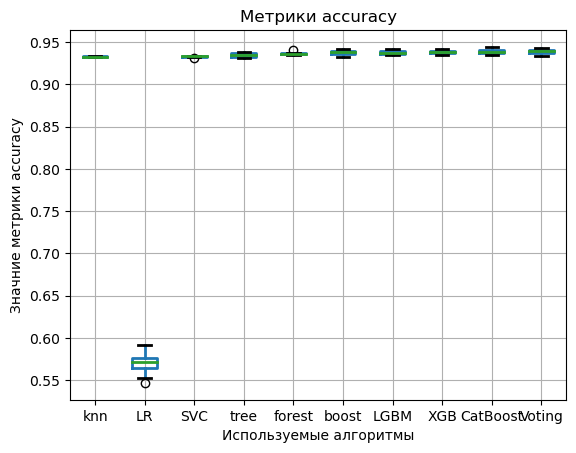

In [2370]:
ax = final_result_accuracy.boxplot() 
_ = plt.setp(ax.lines, linewidth=2.0)
plt.xlabel('Используемые алгоритмы')
plt.ylabel('Значние метрики accuracy')
plt.title('Метрики accuracy')
plt.show()

Как можно заметить, все модели имеют близкое, примерно одинаковое значение accuracy, кроме алгоритма LR, это может говорить о том, что существующая разделительная гиперплоскость склонна к неправильному определению таргетной переменной.

In [2128]:
final_result_precision = pd.DataFrame({'knn' : cv_score_knn['test_precision'],
                             'LR' : cv_score_LR['test_precision'], 
                             'SVC' : cv_score_SVC['test_precision'], 
                             'tree' : cv_score_tree['test_precision'], 
                             'forest': cv_score_forest['test_precision'],
                             'boost' : cv_score_boost['test_precision'],
                             'LGBM' : cv_score_LGBM['test_precision'],
                             'XGB' : cv_score_XGB['test_precision'],
                             'CatBoost' : cv_score_CatBoost['test_precision'],
                             'Voting' : cv_score_voting['test_precision']})

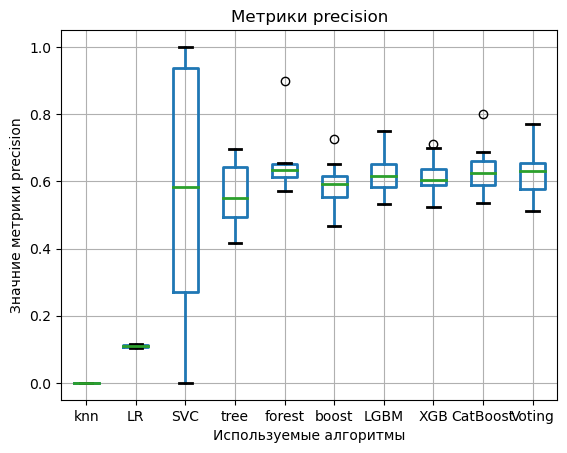

In [2369]:
ax = final_result_precision.boxplot() 
_ = plt.setp(ax.lines, linewidth=2.0)
plt.xlabel('Используемые алгоритмы')
plt.ylabel('Значние метрики precision')
plt.title('Метрики precision')
plt.show()

По показателю точности мы можем отметить, что хорошие показатели имеют алгоритмы случайного леса и XGB 

In [2130]:
final_result_recall = pd.DataFrame({'knn' : cv_score_knn['test_recall'],
                             'LR' : cv_score_LR['test_recall'], 
                             'SVC' : cv_score_SVC['test_recall'], 
                             'tree' : cv_score_tree['test_recall'], 
                             'forest': cv_score_forest['test_recall'],
                             'boost' : cv_score_boost['test_recall'],
                             'LGBM' : cv_score_LGBM['test_recall'],
                             'XGB' : cv_score_XGB['test_recall'],
                             'CatBoost' : cv_score_CatBoost['test_recall'],
                             'Voting' : cv_score_voting['test_recall']})

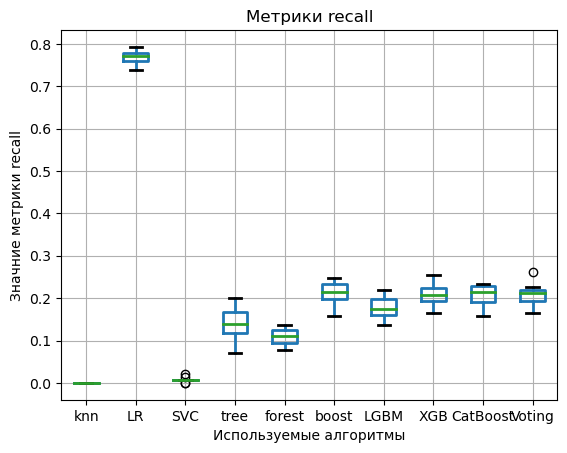

In [2368]:
ax = final_result_recall.boxplot() 
_ = plt.setp(ax.lines, linewidth=2.0)
plt.xlabel('Используемые алгоритмы')
plt.ylabel('Значние метрики recall')
plt.title('Метрики recall')
plt.show()

По показателю полноты логистическая регрессия является лучшим алгоритмом, в рамках своей работы данному алгоритму удается вычислить более 80% всех истинных значений таргетной переменной. Этот показатель очень важен, когда необходимо получить максимально полное предсказание, которое хоть и будет включать в себя ложноположительные показания, но в то же время правильно будут классифицировано большее число интересующих объектов

In [2132]:
final_result_f1 = pd.DataFrame({'knn' : cv_score_knn['test_f1'],
                             'LR' : cv_score_LR['test_f1'], 
                             'SVC' : cv_score_SVC['test_f1'], 
                             'tree' : cv_score_tree['test_f1'], 
                             'forest': cv_score_forest['test_f1'],
                             'boost' : cv_score_boost['test_f1'],
                             'LGBM' : cv_score_LGBM['test_f1'],
                             'XGB' : cv_score_XGB['test_f1'],
                             'CatBoost' : cv_score_CatBoost['test_f1'],
                             'Voting' : cv_score_voting['test_f1']})

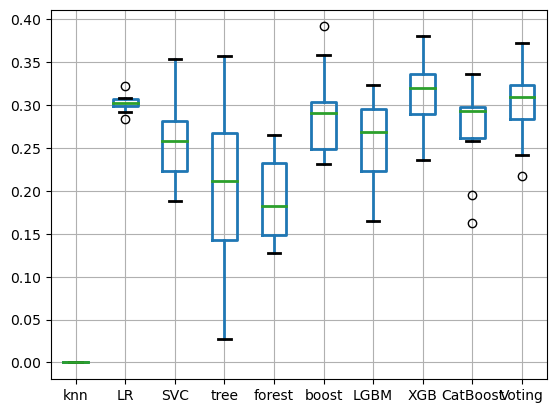

In [2133]:
ax = final_result_f1.boxplot() 
_ = plt.setp(ax.lines, linewidth=2.0)
plt.xlabel('Используемые алгоритмы')
plt.ylabel('Значние метрики f1')
plt.title('Метрики f1')
plt.show()

Метрика f1 является метрикой, включаящей в себя как показатель точности, так и полноты, по ней лучшим из представленных алгоритмов является XGB

In [2134]:
final_result_roc_auc = pd.DataFrame({'knn' : cv_score_knn['test_roc_auc'],
                             'LR' : cv_score_LR['test_roc_auc'], 
                             'SVC' : cv_score_SVC['test_roc_auc'], 
                             'tree' : cv_score_tree['test_roc_auc'], 
                             'forest': cv_score_forest['test_roc_auc'],
                             'boost' : cv_score_boost['test_roc_auc'],
                             'LGBM' : cv_score_LGBM['test_roc_auc'],
                             'XGB' : cv_score_XGB['test_roc_auc'],
                             'CatBoost' : cv_score_CatBoost['test_roc_auc'],
                             'Voting' : cv_score_voting['test_roc_auc']})
                                     

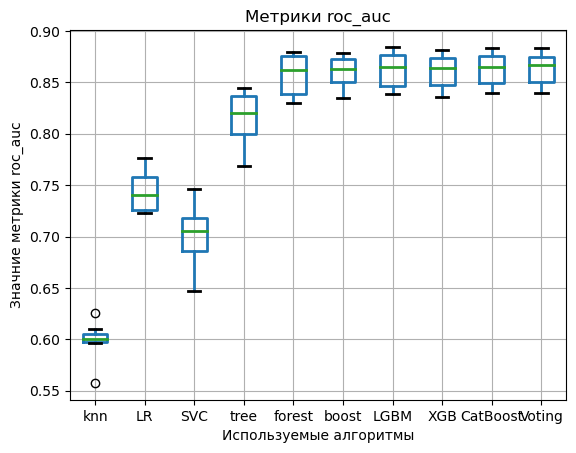

In [2367]:
ax = final_result_roc_auc.boxplot() 
_ = plt.setp(ax.lines, linewidth=2.0)
plt.xlabel('Используемые алгоритмы')
plt.ylabel('Значние метрики roc_auc')
plt.title('Метрики roc_auc')
plt.show()

По целевой переменной roc_auc большинство алгоритмов находятся примерно на одном уровне, что может говорить о ограничении данных и хорошим обобщающим способностям большинства алгоритмов

In [2335]:
cv_scores =[['knn', cv_score_knn],
            ['lr', cv_score_LR],
            ['SVC', cv_score_SVC], 
            ['tree', cv_score_tree],
            ['forest', cv_score_forest],
            ['boost', cv_score_boost], 
            ['LGBM', cv_score_LGBM], 
            ['XGB', cv_score_XGB],
            ['CatBoost', cv_score_CatBoost],
            ['Voting', cv_score_voting]]

final_score = {}

for i in cv_scores:
    final_score[i[0]]= np.mean([np.mean(i[1]['test_accuracy']),
                            np.mean(i[1]['test_f1']),
                            np.mean(i[1]['test_roc_auc'])])
final_score    

{'knn': 0.5109390795394014,
 'lr': 0.5022934257965077,
 'SVC': 0.5502593851677543,
 'tree': 0.6578282109423308,
 'forest': 0.6596790276067703,
 'boost': 0.7030297579659103,
 'LGBM': 0.6922110302516834,
 'XGB': 0.7035820333417911,
 'CatBoost': 0.7046736698410174,
 'Voting': 0.7046526158240615}

Text(0.5, 1.0, 'Финальные метрики качества')

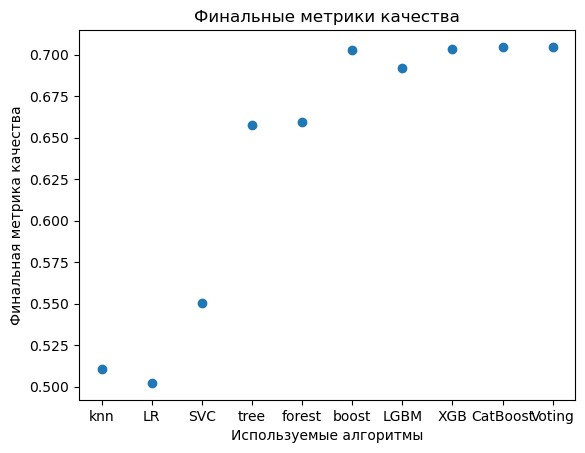

In [2366]:
plt.scatter(final_score.keys(), final_score.values())
plt.xlabel('Используемые алгоритмы')
plt.ylabel('Финальная метрика качества')
plt.title('Финальные метрики качества')

По общему значению трех метрик (полнота и точность убрана, т.к. f1 включает данные метрики в себя), лучшим алгоритмом является XGB

**КРОСС-ВАЛИДАЦИЯ одного алгоритма**

In [2138]:
from scipy import stats

In [2139]:
score_dict = {}

for fold in range(2, 100):
    cv_scores = cross_validate(estimator=best_model_LR, X=X, y=y, cv=fold, scoring='roc_auc')
    mean_auc = np.mean(cv_scores['test_score'])
    std_auc = np.std(cv_scores['test_score'])
    n = len(cv_scores['test_score'])
    t_value = stats.t.ppf(q = 0.975, df=n-1,)
    margin_error = t_value * std_auc / np.sqrt(n)
    confidence_interval = (mean_auc - margin_error, mean_auc + margin_error)
    score_dict[fold] = (np.mean(cv_scores['test_score']), confidence_interval)
    if fold == 20:
        kross_scores = cv_scores['test_score']

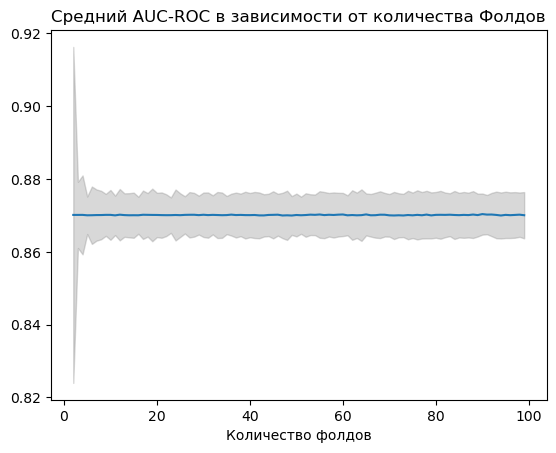

In [2365]:
plt.plot(list(range(2, 100)), [sub_list[0] for sub_list in list(score_dict.values())])
y1 = [sub_sub_list[0] for sub_sub_list in [sub_list[1] for sub_list in list(score_dict.values())]]
y2 = [sub_sub_list[1] for sub_sub_list in [sub_list[1] for sub_list in list(score_dict.values())]]
plt.fill_between(list(range(2, 100)), y1 = y1, y2 = y2, color='gray', alpha=0.3)
plt.title('Средний AUC-ROC в зависимости от количества Фолдов')
plt.xlabel('Количество фолдов')
plt.show()  

Text(0.5, 0, 'roc_auc')

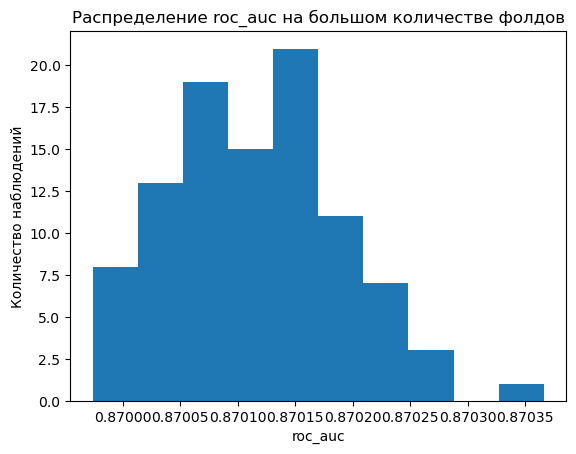

In [2363]:
plt.hist([round(sub_list[0], 7) for sub_list in list(score_dict.values())])
plt.title('Распределение roc_auc на большом количестве фолдов')
plt.ylabel('Количество наблюдений')
plt.xlabel('roc_auc')

**Предсказания по тестовой выборке для Kaggle**

In [43]:
X_test_kaggle = pd.read_csv('./X_test.csv', index_col = 'index')

Обрабатываем пропуски на тестовой выборке также, как и на трейне

In [44]:
predictions_voting = best_model_random_catBoost.predict_proba(X_test_kaggle)

In [45]:
predictions_list = [predict[1] for predict in predictions_voting]
dict_predict = {'index': X_test_kaggle.index, 'target': predictions_list}
data_kaggle = pd.DataFrame(dict_predict)
data_kaggle.to_csv('catboost_fin_2.csv', sep = ',', index = False)

Для соревнования на Kaggle были использованы все обученные алгоритмы, наилучшие результаты показала модель Voting

**Валидация**


**Анализ качества данных**

In [2206]:
data_test = pd.read_csv('./X_train.csv')

In [2207]:
target_test = pd.read_csv('./y_train.csv')

In [2208]:
data_test = pd.concat([data_test, target_test], axis = 1)

Рассмотрим пропуски в данных

In [2209]:
print(f' Данные имеют: {round((data_test.isna().sum().sum()/data_test.shape[0])*100, 2)}% пропусков, что является достаточно большим значением')
    

 Данные имеют: 22.64% пропусков, что является достаточно большим значением


Изучим датасет на наличие дубликатов

In [2210]:
duplicates = data_test.duplicated()

print(f' Данные имеют: {round((duplicates.sum()/data_test.shape[0])*100, 2)}% дубликатов, поэтому они не требуют дополнительной обработки и заострения внимания')

 Данные имеют: 0.13% дубликатов, поэтому они не требуют дополнительной обработки и заострения внимания


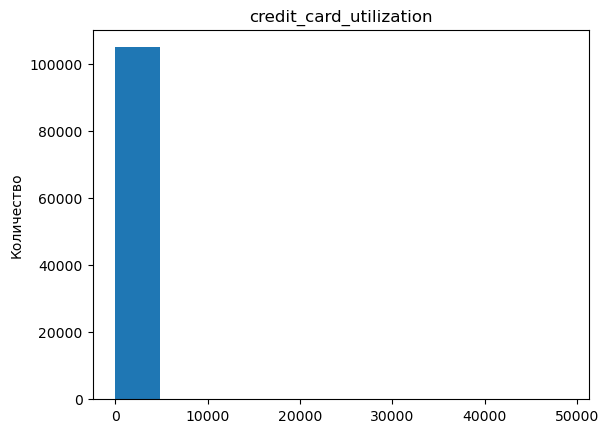

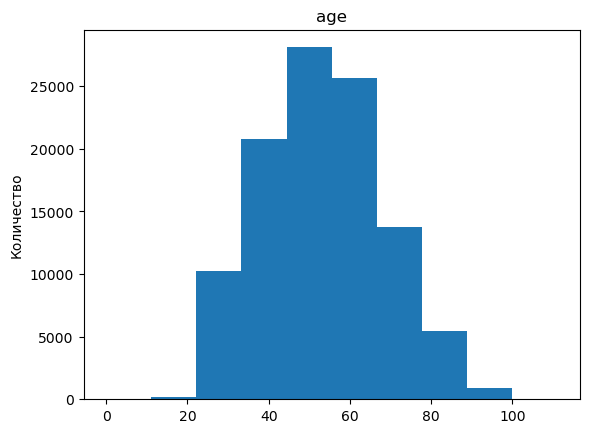

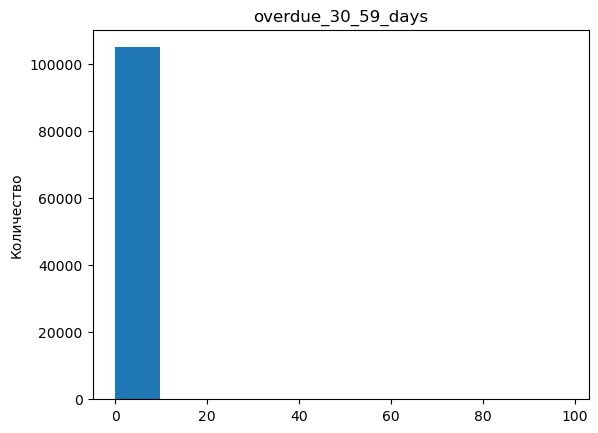

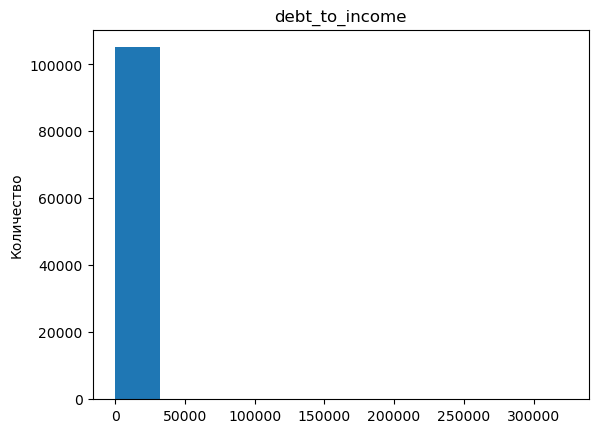

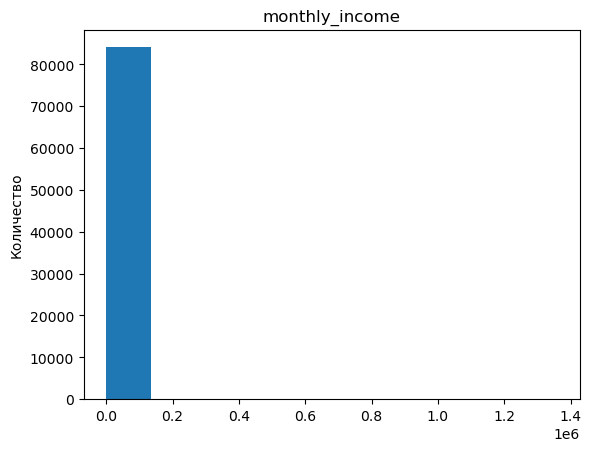

...

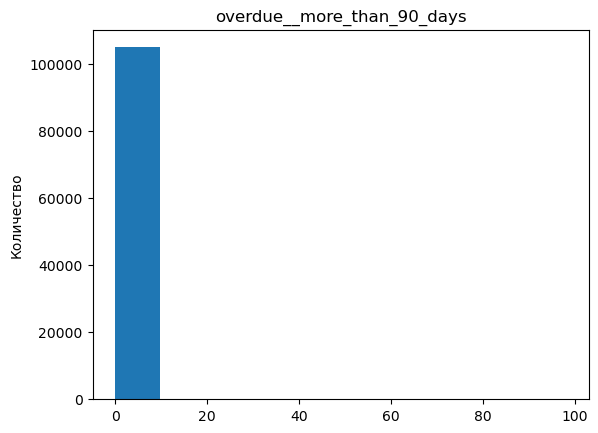

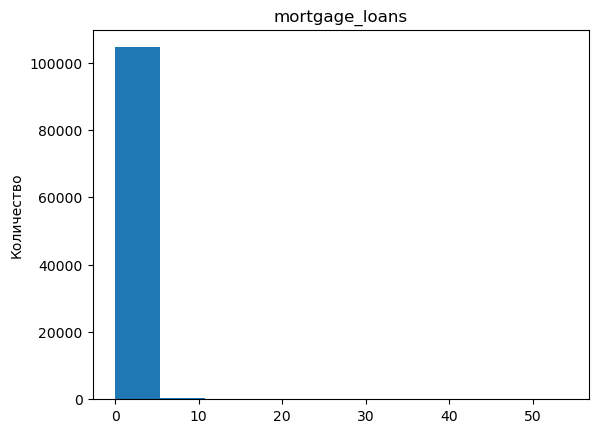

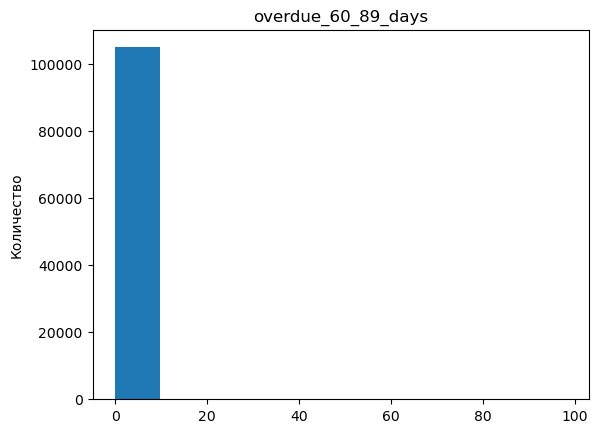

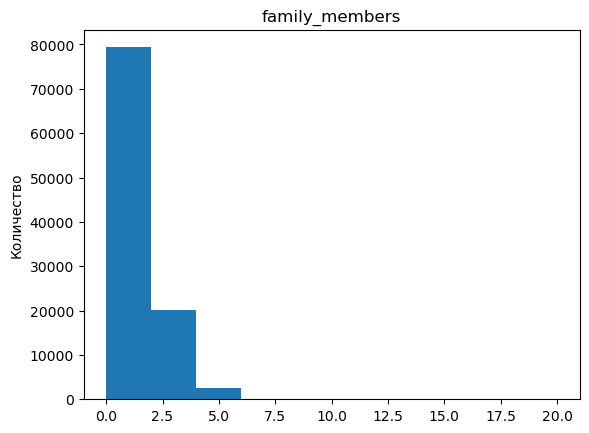

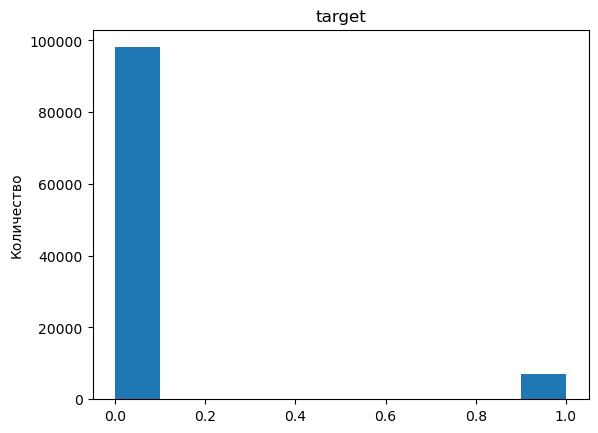

In [2362]:
for i in data_test:
    plt.hist(data_test[i])
    plt.ylabel('Количество')
    plt.title(i)
    plt.show()

Гистограммы распределения показывают, что данные распределены неравномерно и имеют множество выбросов (что видно по шкалам и высокой концентрации данных на одном-двух из столбцов. Это говорит о том, что данные необходимо очищать перед обучением модели машинного обучения, а также дополнительно тестировать готовую модель на возможность работать в условиях данных с выбросами. Также стоит заметить, что таргетная переменная несбалансирована, поэтому необходимо рассматривать не только показатель accuracy, но и такие метрики как recall, precision, f1, auc-roc

In [2164]:
#pip install seaborn

In [2212]:
import seaborn as sns

Text(0.5, 1.0, 'Корреляции между признаками')

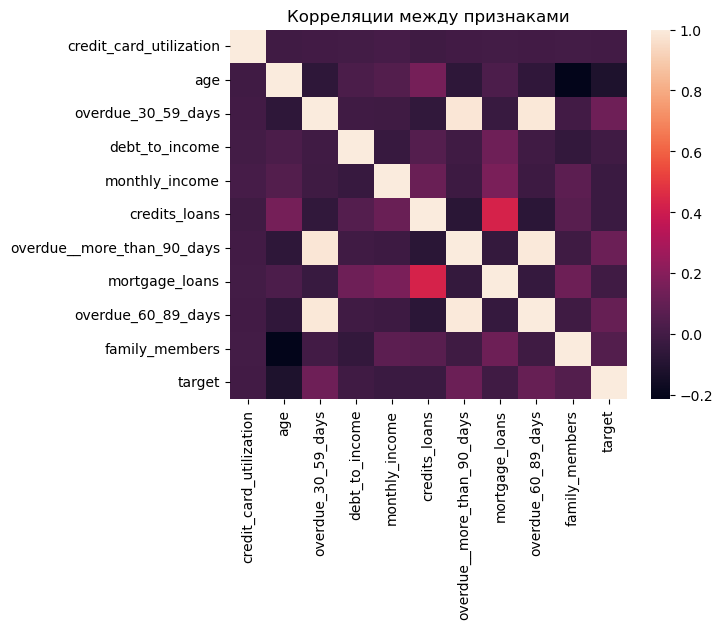

In [2361]:
sns.heatmap(data_test.corr())
plt.title('Корреляции между признаками')

На графике корреляций между переменными мы видим, что данные слабо коррелируют между собой, оснований для предположений о мультиколлениарности данных отсутствует. Однако дополнительно рассмотрим зависимость между credits_loans и mortgage_loans

Text(0.5, 1.0, 'Распределение credits_loans и mortgage_loans')

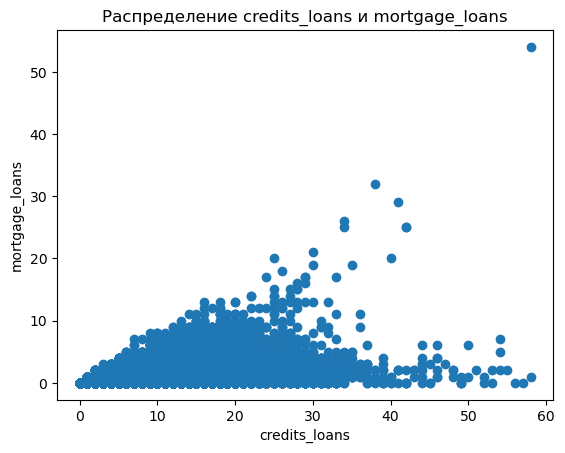

In [2354]:
plt.scatter(data_test['credits_loans'], data_test['mortgage_loans'])
plt.xlabel('credits_loans')
plt.ylabel('mortgage_loans')
plt.title('Распределение credits_loans и mortgage_loans')


Можно заметить, что данные переменные имеют разную дисперсию в зависимости от наблюдений и прямой зависимости между ними нет

Рассмотрим данные на наличие ошибок 

In [2244]:
features = ['credit_card_utilization','age']

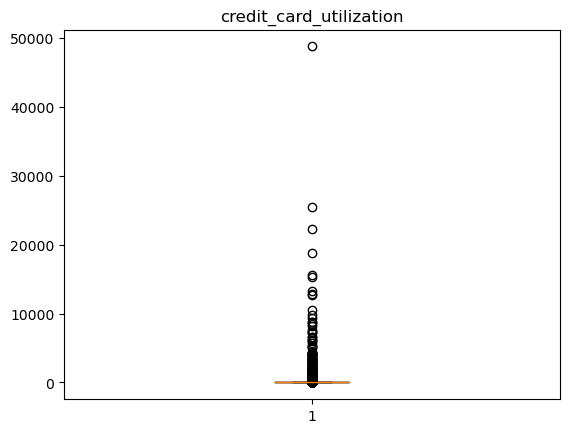

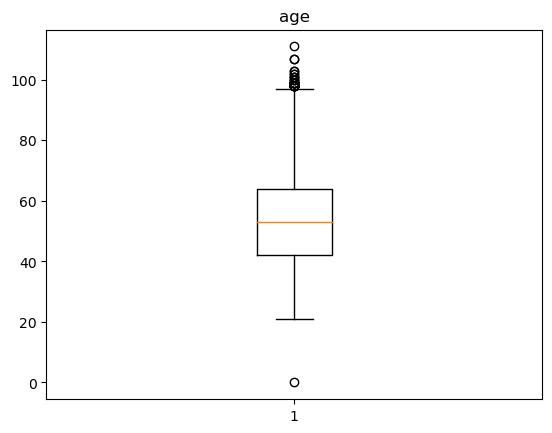

In [2245]:
for feature in features:
    plt.boxplot(data_test[feature])
    plt.title(feature)
    plt.show()

На мой взгляд, ошибки имеются в показанных выше переменных. 

По показателю credit_card_utilization существуют значения больше 1, что вполне возможно, часть банков допускает перерасход за лимиты по кредитным картам, но, допустим, за дополнительную плату, однако использование кредитной карты более чем в 10 раз для меня кажется странным и требует дополнительного изучения. Особенно странно выглядит единичный показатель в размере близком к 50000, что больше похоже на ошибку оператора

В переменной age есть значения больше 100, что может быть настоящим значением, т.к. банковскими услугами на данный момент пользуются люди самых разных возрастов. Однако в этих же данных есть показатель равный 0, что не может быть правдой, т.к. в таком возрасте человек не имет как дееспособности, так и возможности в принципе пользоваться услугами кредитных карт

В целом, я считаю, что все переменные можно использовать для построения модели, т.к. они оказывают влияние на таргетную переменную и их использование повышает качество модели

**Перейдем к Валидации построенных моделей на данных, приближенных к реальным**

Проведем валидацию всех моделей на неочищенных данных, с которыми мы столкнемся в условиях работы модели на реальных задачах

In [2246]:
score_list = ['accuracy', 'precision','recall','f1','roc_auc']

cv_score_knn = cross_validate(estimator=best_model_KNN, X=X_valid, y=y_valid, cv=10, scoring=score_list)

cv_score_LR = cross_validate(estimator=best_model_LR, X=X_valid, y=y_valid, cv=10, scoring=score_list)

cv_score_SVC = cross_validate(estimator=best_model_SVC, X=X_valid, y=y_valid, cv=10, scoring=score_list)

cv_score_tree = cross_validate(estimator=best_model_tree, X=X_valid, y=y_valid, cv=10, scoring=score_list)

cv_score_forest = cross_validate(estimator=best_model_forest, X=X_valid, y=y_valid, cv=10, scoring=score_list)

cv_score_boost = cross_validate(estimator=best_model_boost, X=X_valid, y=y_valid, cv=10, scoring=score_list)

cv_score_LGBM = cross_validate(estimator=best_model_LGBM, X=X_valid, y=y_valid, cv=10, scoring=score_list)

cv_score_XGB = cross_validate(estimator=best_model_XGB, X=X_valid, y=y_valid, cv=10, scoring=score_list)

cv_score_CatBoost = cross_validate(estimator=best_model_random_catBoost, X=X_valid, y=y_valid, cv=10, scoring=score_list)

cv_score_voting = cross_validate(estimator=best_model_voting, X=X_valid, y=y_valid, cv=10, scoring=score_list)

C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision 

0:	learn: 0.6795306	total: 8.87ms	remaining: 2.65s
1:	learn: 0.6650309	total: 17ms	remaining: 2.53s
2:	learn: 0.6522921	total: 22.2ms	remaining: 2.19s
3:	learn: 0.6406725	total: 27.3ms	remaining: 2.02s
4:	learn: 0.6274581	total: 35ms	remaining: 2.07s
5:	learn: 0.6144047	total: 42.4ms	remaining: 2.08s
6:	learn: 0.6018120	total: 50.4ms	remaining: 2.11s
7:	learn: 0.5897604	total: 57.7ms	remaining: 2.1s
8:	learn: 0.5780057	total: 65.1ms	remaining: 2.1s
9:	learn: 0.5663257	total: 72.5ms	remaining: 2.1s
10:	learn: 0.5561097	total: 80ms	remaining: 2.1s
11:	learn: 0.5454654	total: 86.9ms	remaining: 2.09s
12:	learn: 0.5353567	total: 94.2ms	remaining: 2.08s
13:	learn: 0.5246258	total: 102ms	remaining: 2.08s
14:	learn: 0.5155098	total: 109ms	remaining: 2.07s
15:	learn: 0.5055962	total: 117ms	remaining: 2.07s
16:	learn: 0.4961497	total: 124ms	remaining: 2.06s
17:	learn: 0.4881544	total: 131ms	remaining: 2.06s
18:	learn: 0.4801812	total: 139ms	remaining: 2.05s
19:	learn: 0.4720742	total: 146ms	rema

162:	learn: 0.1841658	total: 1.25s	remaining: 1.05s
163:	learn: 0.1839203	total: 1.26s	remaining: 1.05s
164:	learn: 0.1836279	total: 1.27s	remaining: 1.04s
165:	learn: 0.1833976	total: 1.28s	remaining: 1.03s
166:	learn: 0.1831780	total: 1.29s	remaining: 1.03s
167:	learn: 0.1829870	total: 1.3s	remaining: 1.02s
168:	learn: 0.1826780	total: 1.31s	remaining: 1.01s
169:	learn: 0.1824200	total: 1.31s	remaining: 1.01s
170:	learn: 0.1821533	total: 1.32s	remaining: 999ms
171:	learn: 0.1818831	total: 1.33s	remaining: 992ms
172:	learn: 0.1816293	total: 1.34s	remaining: 984ms
173:	learn: 0.1814344	total: 1.35s	remaining: 977ms
174:	learn: 0.1812383	total: 1.36s	remaining: 969ms
175:	learn: 0.1810405	total: 1.36s	remaining: 962ms
176:	learn: 0.1808014	total: 1.37s	remaining: 954ms
177:	learn: 0.1807136	total: 1.38s	remaining: 944ms
178:	learn: 0.1804348	total: 1.39s	remaining: 936ms
179:	learn: 0.1802682	total: 1.39s	remaining: 929ms
180:	learn: 0.1801147	total: 1.4s	remaining: 921ms
181:	learn: 0.

40:	learn: 0.3453560	total: 307ms	remaining: 1.94s
41:	learn: 0.3409199	total: 315ms	remaining: 1.93s
42:	learn: 0.3363967	total: 323ms	remaining: 1.93s
43:	learn: 0.3318499	total: 332ms	remaining: 1.93s
44:	learn: 0.3275600	total: 340ms	remaining: 1.92s
45:	learn: 0.3240507	total: 343ms	remaining: 1.9s
46:	learn: 0.3204723	total: 351ms	remaining: 1.89s
47:	learn: 0.3167782	total: 359ms	remaining: 1.89s
48:	learn: 0.3130824	total: 367ms	remaining: 1.88s
49:	learn: 0.3097994	total: 375ms	remaining: 1.88s
50:	learn: 0.3061936	total: 383ms	remaining: 1.87s
51:	learn: 0.3031849	total: 391ms	remaining: 1.86s
52:	learn: 0.2998614	total: 399ms	remaining: 1.86s
53:	learn: 0.2965851	total: 407ms	remaining: 1.85s
54:	learn: 0.2937080	total: 413ms	remaining: 1.84s
55:	learn: 0.2906411	total: 421ms	remaining: 1.83s
56:	learn: 0.2883907	total: 424ms	remaining: 1.81s
57:	learn: 0.2859084	total: 432ms	remaining: 1.8s
58:	learn: 0.2833235	total: 440ms	remaining: 1.79s
59:	learn: 0.2807214	total: 447ms

206:	learn: 0.1750781	total: 1.55s	remaining: 698ms
207:	learn: 0.1750017	total: 1.56s	remaining: 691ms
208:	learn: 0.1748145	total: 1.57s	remaining: 684ms
209:	learn: 0.1746811	total: 1.58s	remaining: 677ms
210:	learn: 0.1745370	total: 1.59s	remaining: 669ms
211:	learn: 0.1744382	total: 1.59s	remaining: 662ms
212:	learn: 0.1742770	total: 1.6s	remaining: 654ms
213:	learn: 0.1741105	total: 1.61s	remaining: 647ms
214:	learn: 0.1739854	total: 1.62s	remaining: 639ms
215:	learn: 0.1738707	total: 1.62s	remaining: 632ms
216:	learn: 0.1737772	total: 1.63s	remaining: 624ms
217:	learn: 0.1736955	total: 1.64s	remaining: 617ms
218:	learn: 0.1736238	total: 1.65s	remaining: 609ms
219:	learn: 0.1735059	total: 1.65s	remaining: 601ms
220:	learn: 0.1733606	total: 1.66s	remaining: 594ms
221:	learn: 0.1732546	total: 1.67s	remaining: 586ms
222:	learn: 0.1731570	total: 1.68s	remaining: 579ms
223:	learn: 0.1730190	total: 1.68s	remaining: 571ms
224:	learn: 0.1729432	total: 1.69s	remaining: 564ms
225:	learn: 0

68:	learn: 0.2599359	total: 481ms	remaining: 1.61s
69:	learn: 0.2582217	total: 489ms	remaining: 1.61s
70:	learn: 0.2560591	total: 497ms	remaining: 1.6s
71:	learn: 0.2539949	total: 507ms	remaining: 1.6s
72:	learn: 0.2525415	total: 515ms	remaining: 1.6s
73:	learn: 0.2506998	total: 523ms	remaining: 1.6s
74:	learn: 0.2492166	total: 531ms	remaining: 1.59s
75:	learn: 0.2474731	total: 538ms	remaining: 1.59s
76:	learn: 0.2458188	total: 546ms	remaining: 1.58s
77:	learn: 0.2442517	total: 553ms	remaining: 1.57s
78:	learn: 0.2425716	total: 558ms	remaining: 1.56s
79:	learn: 0.2409931	total: 565ms	remaining: 1.55s
80:	learn: 0.2394162	total: 573ms	remaining: 1.55s
81:	learn: 0.2377248	total: 580ms	remaining: 1.54s
82:	learn: 0.2366656	total: 584ms	remaining: 1.53s
83:	learn: 0.2351757	total: 592ms	remaining: 1.52s
84:	learn: 0.2337306	total: 599ms	remaining: 1.52s
85:	learn: 0.2324759	total: 605ms	remaining: 1.5s
86:	learn: 0.2314375	total: 612ms	remaining: 1.5s
87:	learn: 0.2299751	total: 619ms	rem

233:	learn: 0.1722994	total: 1.7s	remaining: 479ms
234:	learn: 0.1722205	total: 1.7s	remaining: 471ms
235:	learn: 0.1721164	total: 1.71s	remaining: 465ms
236:	learn: 0.1720107	total: 1.72s	remaining: 458ms
237:	learn: 0.1718562	total: 1.73s	remaining: 450ms
238:	learn: 0.1717410	total: 1.74s	remaining: 443ms
239:	learn: 0.1716618	total: 1.74s	remaining: 436ms
240:	learn: 0.1715274	total: 1.75s	remaining: 429ms
241:	learn: 0.1714258	total: 1.76s	remaining: 421ms
242:	learn: 0.1713178	total: 1.76s	remaining: 414ms
243:	learn: 0.1711867	total: 1.77s	remaining: 407ms
244:	learn: 0.1710977	total: 1.78s	remaining: 400ms
245:	learn: 0.1710188	total: 1.79s	remaining: 392ms
246:	learn: 0.1708828	total: 1.79s	remaining: 385ms
247:	learn: 0.1707663	total: 1.8s	remaining: 378ms
248:	learn: 0.1706683	total: 1.81s	remaining: 371ms
249:	learn: 0.1705958	total: 1.82s	remaining: 363ms
250:	learn: 0.1704886	total: 1.82s	remaining: 356ms
251:	learn: 0.1703229	total: 1.83s	remaining: 349ms
252:	learn: 0.1

99:	learn: 0.2159496	total: 740ms	remaining: 1.48s
100:	learn: 0.2150808	total: 748ms	remaining: 1.47s
101:	learn: 0.2142088	total: 757ms	remaining: 1.47s
102:	learn: 0.2133765	total: 765ms	remaining: 1.46s
103:	learn: 0.2124922	total: 772ms	remaining: 1.46s
104:	learn: 0.2116612	total: 780ms	remaining: 1.45s
105:	learn: 0.2108791	total: 788ms	remaining: 1.44s
106:	learn: 0.2100539	total: 796ms	remaining: 1.44s
107:	learn: 0.2095041	total: 802ms	remaining: 1.43s
108:	learn: 0.2086369	total: 810ms	remaining: 1.42s
109:	learn: 0.2081046	total: 813ms	remaining: 1.41s
110:	learn: 0.2072984	total: 822ms	remaining: 1.4s
111:	learn: 0.2066166	total: 830ms	remaining: 1.39s
112:	learn: 0.2058365	total: 837ms	remaining: 1.39s
113:	learn: 0.2051424	total: 845ms	remaining: 1.38s
114:	learn: 0.2044330	total: 853ms	remaining: 1.37s
115:	learn: 0.2039732	total: 857ms	remaining: 1.36s
116:	learn: 0.2033410	total: 865ms	remaining: 1.35s
117:	learn: 0.2029033	total: 873ms	remaining: 1.34s
118:	learn: 0.

281:	learn: 0.1672956	total: 2.22s	remaining: 142ms
282:	learn: 0.1672172	total: 2.23s	remaining: 134ms
283:	learn: 0.1671100	total: 2.24s	remaining: 126ms
284:	learn: 0.1670598	total: 2.25s	remaining: 118ms
285:	learn: 0.1670151	total: 2.25s	remaining: 110ms
286:	learn: 0.1669517	total: 2.26s	remaining: 103ms
287:	learn: 0.1669082	total: 2.27s	remaining: 94.7ms
288:	learn: 0.1668568	total: 2.28s	remaining: 86.8ms
289:	learn: 0.1667803	total: 2.29s	remaining: 78.9ms
290:	learn: 0.1667316	total: 2.29s	remaining: 71ms
291:	learn: 0.1666803	total: 2.3s	remaining: 63.1ms
292:	learn: 0.1666023	total: 2.31s	remaining: 55.2ms
293:	learn: 0.1665337	total: 2.32s	remaining: 47.3ms
294:	learn: 0.1664591	total: 2.32s	remaining: 39.4ms
295:	learn: 0.1664011	total: 2.33s	remaining: 31.5ms
296:	learn: 0.1663419	total: 2.34s	remaining: 23.6ms
297:	learn: 0.1662766	total: 2.35s	remaining: 15.8ms
298:	learn: 0.1662016	total: 2.35s	remaining: 7.87ms
299:	learn: 0.1661561	total: 2.36s	remaining: 0us
0:	le

159:	learn: 0.1828165	total: 1.24s	remaining: 1.08s
160:	learn: 0.1825364	total: 1.25s	remaining: 1.08s
161:	learn: 0.1822772	total: 1.26s	remaining: 1.07s
162:	learn: 0.1819619	total: 1.26s	remaining: 1.06s
163:	learn: 0.1816761	total: 1.27s	remaining: 1.06s
164:	learn: 0.1814204	total: 1.28s	remaining: 1.05s
165:	learn: 0.1811688	total: 1.29s	remaining: 1.04s
166:	learn: 0.1808396	total: 1.3s	remaining: 1.04s
167:	learn: 0.1805574	total: 1.31s	remaining: 1.03s
168:	learn: 0.1803407	total: 1.32s	remaining: 1.02s
169:	learn: 0.1800518	total: 1.33s	remaining: 1.01s
170:	learn: 0.1797871	total: 1.34s	remaining: 1.01s
171:	learn: 0.1795166	total: 1.34s	remaining: 1s
172:	learn: 0.1792434	total: 1.35s	remaining: 994ms
173:	learn: 0.1789755	total: 1.36s	remaining: 987ms
174:	learn: 0.1787726	total: 1.37s	remaining: 980ms
175:	learn: 0.1785594	total: 1.38s	remaining: 972ms
176:	learn: 0.1783755	total: 1.39s	remaining: 964ms
177:	learn: 0.1781465	total: 1.4s	remaining: 956ms
178:	learn: 0.177

38:	learn: 0.3540335	total: 313ms	remaining: 2.09s
39:	learn: 0.3497412	total: 322ms	remaining: 2.09s
40:	learn: 0.3451505	total: 333ms	remaining: 2.1s
41:	learn: 0.3405533	total: 341ms	remaining: 2.1s
42:	learn: 0.3359762	total: 350ms	remaining: 2.09s
43:	learn: 0.3316002	total: 358ms	remaining: 2.08s
44:	learn: 0.3273117	total: 365ms	remaining: 2.07s
45:	learn: 0.3238967	total: 373ms	remaining: 2.06s
46:	learn: 0.3198397	total: 380ms	remaining: 2.05s
47:	learn: 0.3169221	total: 383ms	remaining: 2.01s
48:	learn: 0.3136607	total: 390ms	remaining: 2s
49:	learn: 0.3101229	total: 398ms	remaining: 1.99s
50:	learn: 0.3068136	total: 405ms	remaining: 1.98s
51:	learn: 0.3039575	total: 412ms	remaining: 1.97s
52:	learn: 0.3012331	total: 419ms	remaining: 1.95s
53:	learn: 0.2976655	total: 427ms	remaining: 1.94s
54:	learn: 0.2946752	total: 434ms	remaining: 1.93s
55:	learn: 0.2915852	total: 441ms	remaining: 1.92s
56:	learn: 0.2886796	total: 448ms	remaining: 1.91s
57:	learn: 0.2857891	total: 456ms	re

223:	learn: 0.1733746	total: 1.73s	remaining: 588ms
224:	learn: 0.1732765	total: 1.74s	remaining: 581ms
225:	learn: 0.1731598	total: 1.75s	remaining: 573ms
226:	learn: 0.1730519	total: 1.76s	remaining: 566ms
227:	learn: 0.1729352	total: 1.77s	remaining: 558ms
228:	learn: 0.1728179	total: 1.77s	remaining: 550ms
229:	learn: 0.1727183	total: 1.78s	remaining: 542ms
230:	learn: 0.1726504	total: 1.79s	remaining: 535ms
231:	learn: 0.1724872	total: 1.8s	remaining: 527ms
232:	learn: 0.1723938	total: 1.8s	remaining: 519ms
233:	learn: 0.1722705	total: 1.81s	remaining: 511ms
234:	learn: 0.1721452	total: 1.82s	remaining: 503ms
235:	learn: 0.1720795	total: 1.83s	remaining: 495ms
236:	learn: 0.1719819	total: 1.83s	remaining: 488ms
237:	learn: 0.1718909	total: 1.84s	remaining: 480ms
238:	learn: 0.1717687	total: 1.85s	remaining: 472ms
239:	learn: 0.1716771	total: 1.86s	remaining: 464ms
240:	learn: 0.1715590	total: 1.86s	remaining: 456ms
241:	learn: 0.1714601	total: 1.87s	remaining: 449ms
242:	learn: 0.

86:	learn: 0.2306830	total: 636ms	remaining: 1.56s
87:	learn: 0.2294658	total: 645ms	remaining: 1.55s
88:	learn: 0.2280220	total: 653ms	remaining: 1.55s
89:	learn: 0.2267013	total: 662ms	remaining: 1.54s
90:	learn: 0.2256670	total: 670ms	remaining: 1.54s
91:	learn: 0.2243871	total: 678ms	remaining: 1.53s
92:	learn: 0.2234985	total: 686ms	remaining: 1.53s
93:	learn: 0.2222806	total: 695ms	remaining: 1.52s
94:	learn: 0.2210197	total: 703ms	remaining: 1.52s
95:	learn: 0.2198970	total: 711ms	remaining: 1.51s
96:	learn: 0.2190914	total: 718ms	remaining: 1.5s
97:	learn: 0.2179688	total: 726ms	remaining: 1.5s
98:	learn: 0.2171587	total: 734ms	remaining: 1.49s
99:	learn: 0.2163025	total: 742ms	remaining: 1.48s
100:	learn: 0.2154244	total: 749ms	remaining: 1.48s
101:	learn: 0.2146165	total: 757ms	remaining: 1.47s
102:	learn: 0.2134944	total: 764ms	remaining: 1.46s
103:	learn: 0.2125220	total: 772ms	remaining: 1.45s
104:	learn: 0.2115495	total: 779ms	remaining: 1.45s
105:	learn: 0.2108915	total:

267:	learn: 0.1680496	total: 2.1s	remaining: 250ms
268:	learn: 0.1679872	total: 2.1s	remaining: 243ms
269:	learn: 0.1679342	total: 2.11s	remaining: 235ms
270:	learn: 0.1678579	total: 2.12s	remaining: 227ms
271:	learn: 0.1677561	total: 2.13s	remaining: 219ms
272:	learn: 0.1676807	total: 2.14s	remaining: 211ms
273:	learn: 0.1676095	total: 2.15s	remaining: 204ms
274:	learn: 0.1675097	total: 2.15s	remaining: 196ms
275:	learn: 0.1674535	total: 2.16s	remaining: 188ms
276:	learn: 0.1673907	total: 2.17s	remaining: 180ms
277:	learn: 0.1673074	total: 2.18s	remaining: 172ms
278:	learn: 0.1672590	total: 2.18s	remaining: 164ms
279:	learn: 0.1672002	total: 2.19s	remaining: 157ms
280:	learn: 0.1671306	total: 2.2s	remaining: 149ms
281:	learn: 0.1670945	total: 2.21s	remaining: 141ms
282:	learn: 0.1670287	total: 2.22s	remaining: 133ms
283:	learn: 0.1669828	total: 2.22s	remaining: 125ms
284:	learn: 0.1669239	total: 2.23s	remaining: 117ms
285:	learn: 0.1668408	total: 2.24s	remaining: 110ms
286:	learn: 0.1

143:	learn: 0.1889377	total: 1.19s	remaining: 1.28s
144:	learn: 0.1886046	total: 1.19s	remaining: 1.28s
145:	learn: 0.1881482	total: 1.2s	remaining: 1.27s
146:	learn: 0.1877930	total: 1.21s	remaining: 1.26s
147:	learn: 0.1874810	total: 1.22s	remaining: 1.25s
148:	learn: 0.1870370	total: 1.23s	remaining: 1.25s
149:	learn: 0.1867189	total: 1.24s	remaining: 1.24s
150:	learn: 0.1864678	total: 1.25s	remaining: 1.23s
151:	learn: 0.1861103	total: 1.25s	remaining: 1.22s
152:	learn: 0.1857904	total: 1.26s	remaining: 1.21s
153:	learn: 0.1854595	total: 1.27s	remaining: 1.2s
154:	learn: 0.1851152	total: 1.28s	remaining: 1.19s
155:	learn: 0.1847984	total: 1.28s	remaining: 1.19s
156:	learn: 0.1844875	total: 1.29s	remaining: 1.18s
157:	learn: 0.1842084	total: 1.3s	remaining: 1.17s
158:	learn: 0.1838918	total: 1.31s	remaining: 1.16s
159:	learn: 0.1836271	total: 1.32s	remaining: 1.15s
160:	learn: 0.1833102	total: 1.32s	remaining: 1.14s
161:	learn: 0.1830590	total: 1.33s	remaining: 1.14s
162:	learn: 0.1

17:	learn: 0.4842338	total: 123ms	remaining: 1.92s
18:	learn: 0.4762363	total: 131ms	remaining: 1.94s
19:	learn: 0.4680215	total: 139ms	remaining: 1.94s
20:	learn: 0.4601816	total: 146ms	remaining: 1.94s
21:	learn: 0.4525501	total: 153ms	remaining: 1.94s
22:	learn: 0.4451023	total: 158ms	remaining: 1.9s
23:	learn: 0.4377533	total: 165ms	remaining: 1.9s
24:	learn: 0.4300801	total: 172ms	remaining: 1.89s
25:	learn: 0.4225937	total: 179ms	remaining: 1.89s
26:	learn: 0.4163799	total: 186ms	remaining: 1.88s
27:	learn: 0.4094828	total: 193ms	remaining: 1.88s
28:	learn: 0.4033448	total: 201ms	remaining: 1.87s
29:	learn: 0.3969177	total: 208ms	remaining: 1.87s
30:	learn: 0.3905957	total: 215ms	remaining: 1.86s
31:	learn: 0.3854278	total: 222ms	remaining: 1.86s
32:	learn: 0.3796745	total: 229ms	remaining: 1.85s
33:	learn: 0.3742965	total: 236ms	remaining: 1.85s
34:	learn: 0.3685518	total: 243ms	remaining: 1.84s
35:	learn: 0.3635926	total: 250ms	remaining: 1.83s
36:	learn: 0.3589013	total: 257ms

187:	learn: 0.1771262	total: 1.37s	remaining: 818ms
188:	learn: 0.1769125	total: 1.38s	remaining: 811ms
189:	learn: 0.1767847	total: 1.39s	remaining: 804ms
190:	learn: 0.1765720	total: 1.4s	remaining: 797ms
191:	learn: 0.1764156	total: 1.4s	remaining: 790ms
192:	learn: 0.1761985	total: 1.41s	remaining: 784ms
193:	learn: 0.1761217	total: 1.42s	remaining: 777ms
194:	learn: 0.1759246	total: 1.43s	remaining: 770ms
195:	learn: 0.1757516	total: 1.44s	remaining: 764ms
196:	learn: 0.1756742	total: 1.45s	remaining: 756ms
197:	learn: 0.1755437	total: 1.45s	remaining: 749ms
198:	learn: 0.1754198	total: 1.46s	remaining: 743ms
199:	learn: 0.1752429	total: 1.47s	remaining: 736ms
200:	learn: 0.1750553	total: 1.48s	remaining: 730ms
201:	learn: 0.1749390	total: 1.49s	remaining: 723ms
202:	learn: 0.1747818	total: 1.5s	remaining: 716ms
203:	learn: 0.1746064	total: 1.51s	remaining: 709ms
204:	learn: 0.1744569	total: 1.52s	remaining: 703ms
205:	learn: 0.1742557	total: 1.52s	remaining: 696ms
206:	learn: 0.1

70:	learn: 0.2560476	total: 518ms	remaining: 1.67s
71:	learn: 0.2537969	total: 528ms	remaining: 1.67s
72:	learn: 0.2521418	total: 536ms	remaining: 1.67s
73:	learn: 0.2504801	total: 545ms	remaining: 1.66s
74:	learn: 0.2486476	total: 553ms	remaining: 1.66s
75:	learn: 0.2468170	total: 561ms	remaining: 1.65s
76:	learn: 0.2449290	total: 568ms	remaining: 1.65s
77:	learn: 0.2436569	total: 576ms	remaining: 1.64s
78:	learn: 0.2421268	total: 583ms	remaining: 1.63s
79:	learn: 0.2405205	total: 590ms	remaining: 1.62s
80:	learn: 0.2388456	total: 597ms	remaining: 1.61s
81:	learn: 0.2373105	total: 604ms	remaining: 1.6s
82:	learn: 0.2357866	total: 611ms	remaining: 1.6s
83:	learn: 0.2343723	total: 618ms	remaining: 1.59s
84:	learn: 0.2332700	total: 626ms	remaining: 1.58s
85:	learn: 0.2321968	total: 634ms	remaining: 1.58s
86:	learn: 0.2309455	total: 642ms	remaining: 1.57s
87:	learn: 0.2297104	total: 650ms	remaining: 1.56s
88:	learn: 0.2281738	total: 659ms	remaining: 1.56s
89:	learn: 0.2268291	total: 668ms

252:	learn: 0.1690750	total: 1.97s	remaining: 366ms
253:	learn: 0.1690013	total: 1.98s	remaining: 358ms
254:	learn: 0.1689069	total: 1.99s	remaining: 350ms
255:	learn: 0.1688243	total: 1.99s	remaining: 343ms
256:	learn: 0.1687070	total: 2s	remaining: 335ms
257:	learn: 0.1686216	total: 2.01s	remaining: 327ms
258:	learn: 0.1685577	total: 2.02s	remaining: 319ms
259:	learn: 0.1684669	total: 2.02s	remaining: 312ms
260:	learn: 0.1684254	total: 2.03s	remaining: 304ms
261:	learn: 0.1683071	total: 2.04s	remaining: 296ms
262:	learn: 0.1682576	total: 2.05s	remaining: 288ms
263:	learn: 0.1681603	total: 2.06s	remaining: 280ms
264:	learn: 0.1681008	total: 2.06s	remaining: 273ms
265:	learn: 0.1680237	total: 2.07s	remaining: 265ms
266:	learn: 0.1679190	total: 2.08s	remaining: 257ms
267:	learn: 0.1678620	total: 2.09s	remaining: 249ms
268:	learn: 0.1677730	total: 2.09s	remaining: 241ms
269:	learn: 0.1677095	total: 2.1s	remaining: 234ms
270:	learn: 0.1676021	total: 2.11s	remaining: 226ms
271:	learn: 0.16

130:	learn: 0.1800396	total: 1.04s	remaining: 2.26s
131:	learn: 0.1797715	total: 1.05s	remaining: 2.25s
132:	learn: 0.1793908	total: 1.06s	remaining: 2.24s
133:	learn: 0.1790528	total: 1.07s	remaining: 2.23s
134:	learn: 0.1787896	total: 1.08s	remaining: 2.23s
135:	learn: 0.1786023	total: 1.08s	remaining: 2.22s
136:	learn: 0.1783480	total: 1.09s	remaining: 2.21s
137:	learn: 0.1780732	total: 1.1s	remaining: 2.2s
138:	learn: 0.1779028	total: 1.11s	remaining: 2.19s
139:	learn: 0.1776478	total: 1.12s	remaining: 2.19s
140:	learn: 0.1774633	total: 1.13s	remaining: 2.18s
141:	learn: 0.1772930	total: 1.14s	remaining: 2.18s
142:	learn: 0.1770786	total: 1.14s	remaining: 2.17s
143:	learn: 0.1768840	total: 1.15s	remaining: 2.16s
144:	learn: 0.1765732	total: 1.16s	remaining: 2.16s
145:	learn: 0.1764060	total: 1.17s	remaining: 2.15s
146:	learn: 0.1762384	total: 1.18s	remaining: 2.14s
147:	learn: 0.1760578	total: 1.19s	remaining: 2.14s
148:	learn: 0.1759045	total: 1.2s	remaining: 2.13s
149:	learn: 0.1

307:	learn: 0.1623073	total: 2.52s	remaining: 866ms
308:	learn: 0.1622914	total: 2.52s	remaining: 858ms
309:	learn: 0.1622288	total: 2.54s	remaining: 851ms
310:	learn: 0.1622271	total: 2.54s	remaining: 841ms
311:	learn: 0.1621790	total: 2.55s	remaining: 833ms
312:	learn: 0.1621439	total: 2.56s	remaining: 825ms
313:	learn: 0.1620511	total: 2.56s	remaining: 817ms
314:	learn: 0.1619885	total: 2.57s	remaining: 809ms
315:	learn: 0.1619181	total: 2.58s	remaining: 801ms
316:	learn: 0.1618611	total: 2.59s	remaining: 793ms
317:	learn: 0.1617682	total: 2.6s	remaining: 785ms
318:	learn: 0.1617473	total: 2.61s	remaining: 777ms
319:	learn: 0.1617036	total: 2.62s	remaining: 769ms
320:	learn: 0.1616882	total: 2.63s	remaining: 761ms
321:	learn: 0.1616246	total: 2.63s	remaining: 753ms
322:	learn: 0.1615880	total: 2.64s	remaining: 744ms
323:	learn: 0.1615557	total: 2.65s	remaining: 736ms
324:	learn: 0.1615288	total: 2.66s	remaining: 728ms
325:	learn: 0.1614718	total: 2.67s	remaining: 720ms
326:	learn: 0

68:	learn: 0.2163375	total: 544ms	remaining: 2.72s
69:	learn: 0.2150840	total: 553ms	remaining: 2.72s
70:	learn: 0.2139118	total: 563ms	remaining: 2.72s
71:	learn: 0.2125536	total: 572ms	remaining: 2.72s
72:	learn: 0.2117450	total: 576ms	remaining: 2.69s
73:	learn: 0.2110328	total: 581ms	remaining: 2.67s
74:	learn: 0.2099040	total: 590ms	remaining: 2.67s
75:	learn: 0.2090623	total: 599ms	remaining: 2.66s
76:	learn: 0.2082372	total: 604ms	remaining: 2.64s
77:	learn: 0.2071366	total: 614ms	remaining: 2.64s
78:	learn: 0.2060869	total: 627ms	remaining: 2.66s
79:	learn: 0.2052796	total: 641ms	remaining: 2.67s
80:	learn: 0.2042950	total: 654ms	remaining: 2.69s
81:	learn: 0.2034190	total: 666ms	remaining: 2.69s
82:	learn: 0.2025523	total: 676ms	remaining: 2.7s
83:	learn: 0.2017260	total: 686ms	remaining: 2.69s
84:	learn: 0.2008481	total: 695ms	remaining: 2.69s
85:	learn: 0.2001096	total: 705ms	remaining: 2.69s
86:	learn: 0.1991743	total: 715ms	remaining: 2.69s
87:	learn: 0.1983904	total: 724m

243:	learn: 0.1649765	total: 2.2s	remaining: 1.53s
244:	learn: 0.1649275	total: 2.21s	remaining: 1.52s
245:	learn: 0.1648870	total: 2.22s	remaining: 1.51s
246:	learn: 0.1647852	total: 2.23s	remaining: 1.5s
247:	learn: 0.1647327	total: 2.24s	remaining: 1.5s
248:	learn: 0.1646902	total: 2.25s	remaining: 1.49s
249:	learn: 0.1645982	total: 2.25s	remaining: 1.48s
250:	learn: 0.1645495	total: 2.26s	remaining: 1.47s
251:	learn: 0.1644908	total: 2.27s	remaining: 1.46s
252:	learn: 0.1643938	total: 2.28s	remaining: 1.45s
253:	learn: 0.1643462	total: 2.29s	remaining: 1.44s
254:	learn: 0.1642858	total: 2.3s	remaining: 1.43s
255:	learn: 0.1642586	total: 2.31s	remaining: 1.43s
256:	learn: 0.1642103	total: 2.32s	remaining: 1.42s
257:	learn: 0.1641654	total: 2.33s	remaining: 1.41s
258:	learn: 0.1640776	total: 2.33s	remaining: 1.4s
259:	learn: 0.1640507	total: 2.34s	remaining: 1.39s
260:	learn: 0.1640357	total: 2.35s	remaining: 1.38s
261:	learn: 0.1639595	total: 2.36s	remaining: 1.37s
262:	learn: 0.163

408:	learn: 0.1579846	total: 3.67s	remaining: 44.9ms
409:	learn: 0.1579628	total: 3.68s	remaining: 35.9ms
410:	learn: 0.1579614	total: 3.69s	remaining: 26.9ms
411:	learn: 0.1579479	total: 3.7s	remaining: 18ms
412:	learn: 0.1579247	total: 3.71s	remaining: 8.98ms
413:	learn: 0.1578929	total: 3.72s	remaining: 0us
0:	learn: 0.6720350	total: 8.12ms	remaining: 3.35s
1:	learn: 0.6541013	total: 12.2ms	remaining: 2.51s
2:	learn: 0.6351953	total: 20.6ms	remaining: 2.82s
3:	learn: 0.6149516	total: 28.8ms	remaining: 2.95s
4:	learn: 0.5975884	total: 37.3ms	remaining: 3.05s
5:	learn: 0.5811668	total: 44.7ms	remaining: 3.04s
6:	learn: 0.5657156	total: 53.8ms	remaining: 3.13s
7:	learn: 0.5511030	total: 58.8ms	remaining: 2.98s
8:	learn: 0.5357500	total: 67.9ms	remaining: 3.06s
9:	learn: 0.5215339	total: 75.5ms	remaining: 3.05s
10:	learn: 0.5080641	total: 85.5ms	remaining: 3.13s
11:	learn: 0.4944916	total: 93.3ms	remaining: 3.13s
12:	learn: 0.4808363	total: 102ms	remaining: 3.14s
13:	learn: 0.4680034	to

172:	learn: 0.1718722	total: 1.4s	remaining: 1.95s
173:	learn: 0.1717119	total: 1.41s	remaining: 1.94s
174:	learn: 0.1715362	total: 1.42s	remaining: 1.93s
175:	learn: 0.1713873	total: 1.43s	remaining: 1.93s
176:	learn: 0.1712714	total: 1.43s	remaining: 1.92s
177:	learn: 0.1711540	total: 1.44s	remaining: 1.91s
178:	learn: 0.1710401	total: 1.45s	remaining: 1.9s
179:	learn: 0.1708536	total: 1.46s	remaining: 1.89s
180:	learn: 0.1707389	total: 1.47s	remaining: 1.89s
181:	learn: 0.1706049	total: 1.47s	remaining: 1.88s
182:	learn: 0.1705098	total: 1.48s	remaining: 1.87s
183:	learn: 0.1704299	total: 1.49s	remaining: 1.86s
184:	learn: 0.1703152	total: 1.5s	remaining: 1.85s
185:	learn: 0.1702364	total: 1.5s	remaining: 1.84s
186:	learn: 0.1701635	total: 1.51s	remaining: 1.83s
187:	learn: 0.1700460	total: 1.52s	remaining: 1.83s
188:	learn: 0.1699661	total: 1.53s	remaining: 1.82s
189:	learn: 0.1698804	total: 1.53s	remaining: 1.81s
190:	learn: 0.1698067	total: 1.54s	remaining: 1.8s
191:	learn: 0.169

350:	learn: 0.1604923	total: 2.85s	remaining: 512ms
351:	learn: 0.1604889	total: 2.86s	remaining: 504ms
352:	learn: 0.1603725	total: 2.87s	remaining: 496ms
353:	learn: 0.1603420	total: 2.88s	remaining: 488ms
354:	learn: 0.1602989	total: 2.89s	remaining: 480ms
355:	learn: 0.1602898	total: 2.9s	remaining: 472ms
356:	learn: 0.1602346	total: 2.9s	remaining: 464ms
357:	learn: 0.1602308	total: 2.91s	remaining: 455ms
358:	learn: 0.1602106	total: 2.92s	remaining: 447ms
359:	learn: 0.1601776	total: 2.92s	remaining: 439ms
360:	learn: 0.1601442	total: 2.94s	remaining: 431ms
361:	learn: 0.1601417	total: 2.94s	remaining: 423ms
362:	learn: 0.1601378	total: 2.95s	remaining: 414ms
363:	learn: 0.1600410	total: 2.96s	remaining: 406ms
364:	learn: 0.1599940	total: 2.97s	remaining: 398ms
365:	learn: 0.1599705	total: 2.98s	remaining: 390ms
366:	learn: 0.1599562	total: 2.98s	remaining: 382ms
367:	learn: 0.1599055	total: 2.99s	remaining: 374ms
368:	learn: 0.1599041	total: 3s	remaining: 366ms
369:	learn: 0.159

115:	learn: 0.1835371	total: 897ms	remaining: 2.31s
116:	learn: 0.1831285	total: 908ms	remaining: 2.3s
117:	learn: 0.1828120	total: 918ms	remaining: 2.3s
118:	learn: 0.1825278	total: 926ms	remaining: 2.3s
119:	learn: 0.1821984	total: 936ms	remaining: 2.29s
120:	learn: 0.1818610	total: 944ms	remaining: 2.29s
121:	learn: 0.1815785	total: 952ms	remaining: 2.28s
122:	learn: 0.1812133	total: 961ms	remaining: 2.27s
123:	learn: 0.1808813	total: 969ms	remaining: 2.27s
124:	learn: 0.1805977	total: 978ms	remaining: 2.26s
125:	learn: 0.1802987	total: 986ms	remaining: 2.25s
126:	learn: 0.1800420	total: 994ms	remaining: 2.25s
127:	learn: 0.1798376	total: 1s	remaining: 2.24s
128:	learn: 0.1795475	total: 1.01s	remaining: 2.23s
129:	learn: 0.1792714	total: 1.02s	remaining: 2.22s
130:	learn: 0.1789883	total: 1.02s	remaining: 2.21s
131:	learn: 0.1787558	total: 1.03s	remaining: 2.21s
132:	learn: 0.1785091	total: 1.04s	remaining: 2.2s
133:	learn: 0.1782427	total: 1.05s	remaining: 2.19s
134:	learn: 0.17804

297:	learn: 0.1620506	total: 2.37s	remaining: 921ms
298:	learn: 0.1619907	total: 2.38s	remaining: 913ms
299:	learn: 0.1619781	total: 2.38s	remaining: 906ms
300:	learn: 0.1619731	total: 2.39s	remaining: 898ms
301:	learn: 0.1619463	total: 2.4s	remaining: 890ms
302:	learn: 0.1619214	total: 2.41s	remaining: 882ms
303:	learn: 0.1618699	total: 2.42s	remaining: 874ms
304:	learn: 0.1618482	total: 2.42s	remaining: 866ms
305:	learn: 0.1618086	total: 2.43s	remaining: 858ms
306:	learn: 0.1617900	total: 2.44s	remaining: 850ms
307:	learn: 0.1617431	total: 2.45s	remaining: 842ms
308:	learn: 0.1617188	total: 2.46s	remaining: 834ms
309:	learn: 0.1617142	total: 2.46s	remaining: 826ms
310:	learn: 0.1616580	total: 2.47s	remaining: 818ms
311:	learn: 0.1616318	total: 2.48s	remaining: 811ms
312:	learn: 0.1616259	total: 2.48s	remaining: 802ms
313:	learn: 0.1615985	total: 2.49s	remaining: 794ms
314:	learn: 0.1615354	total: 2.5s	remaining: 786ms
315:	learn: 0.1615212	total: 2.51s	remaining: 778ms
316:	learn: 0.

68:	learn: 0.2138668	total: 527ms	remaining: 2.63s
69:	learn: 0.2128154	total: 536ms	remaining: 2.63s
70:	learn: 0.2117848	total: 544ms	remaining: 2.63s
71:	learn: 0.2107994	total: 552ms	remaining: 2.62s
72:	learn: 0.2094904	total: 559ms	remaining: 2.61s
73:	learn: 0.2082864	total: 566ms	remaining: 2.6s
74:	learn: 0.2071478	total: 573ms	remaining: 2.59s
75:	learn: 0.2062569	total: 580ms	remaining: 2.58s
76:	learn: 0.2051879	total: 588ms	remaining: 2.58s
77:	learn: 0.2043795	total: 596ms	remaining: 2.56s
78:	learn: 0.2034961	total: 603ms	remaining: 2.56s
79:	learn: 0.2026647	total: 611ms	remaining: 2.55s
80:	learn: 0.2020402	total: 619ms	remaining: 2.54s
81:	learn: 0.2010946	total: 627ms	remaining: 2.54s
82:	learn: 0.2003441	total: 635ms	remaining: 2.53s
83:	learn: 0.1994881	total: 643ms	remaining: 2.52s
84:	learn: 0.1986107	total: 651ms	remaining: 2.52s
85:	learn: 0.1979120	total: 659ms	remaining: 2.51s
86:	learn: 0.1971899	total: 666ms	remaining: 2.5s
87:	learn: 0.1964130	total: 675ms

248:	learn: 0.1628165	total: 1.98s	remaining: 1.31s
249:	learn: 0.1627749	total: 1.99s	remaining: 1.3s
250:	learn: 0.1627029	total: 2s	remaining: 1.3s
251:	learn: 0.1626555	total: 2s	remaining: 1.29s
252:	learn: 0.1625506	total: 2.01s	remaining: 1.28s
253:	learn: 0.1624773	total: 2.02s	remaining: 1.27s
254:	learn: 0.1624237	total: 2.03s	remaining: 1.26s
255:	learn: 0.1623574	total: 2.04s	remaining: 1.26s
256:	learn: 0.1623291	total: 2.04s	remaining: 1.25s
257:	learn: 0.1622819	total: 2.05s	remaining: 1.24s
258:	learn: 0.1622530	total: 2.06s	remaining: 1.23s
259:	learn: 0.1622304	total: 2.07s	remaining: 1.22s
260:	learn: 0.1621362	total: 2.07s	remaining: 1.22s
261:	learn: 0.1620963	total: 2.08s	remaining: 1.21s
262:	learn: 0.1620817	total: 2.09s	remaining: 1.2s
263:	learn: 0.1620234	total: 2.1s	remaining: 1.19s
264:	learn: 0.1619907	total: 2.1s	remaining: 1.18s
265:	learn: 0.1619059	total: 2.11s	remaining: 1.18s
266:	learn: 0.1618369	total: 2.12s	remaining: 1.17s
267:	learn: 0.1617866	t

3:	learn: 0.6172687	total: 22.8ms	remaining: 2.34s
4:	learn: 0.5995688	total: 31ms	remaining: 2.54s
5:	learn: 0.5823644	total: 40.1ms	remaining: 2.73s
6:	learn: 0.5646820	total: 47.4ms	remaining: 2.76s
7:	learn: 0.5505771	total: 55.2ms	remaining: 2.8s
8:	learn: 0.5374804	total: 59.9ms	remaining: 2.7s
9:	learn: 0.5219915	total: 67.4ms	remaining: 2.72s
10:	learn: 0.5076796	total: 75.3ms	remaining: 2.76s
11:	learn: 0.4950997	total: 85.2ms	remaining: 2.85s
12:	learn: 0.4818603	total: 94.3ms	remaining: 2.91s
13:	learn: 0.4700748	total: 104ms	remaining: 2.98s
14:	learn: 0.4586239	total: 114ms	remaining: 3.02s
15:	learn: 0.4468580	total: 122ms	remaining: 3.05s
16:	learn: 0.4364451	total: 132ms	remaining: 3.08s
17:	learn: 0.4265949	total: 141ms	remaining: 3.1s
18:	learn: 0.4178424	total: 150ms	remaining: 3.11s
19:	learn: 0.4079997	total: 158ms	remaining: 3.12s
20:	learn: 0.3987479	total: 167ms	remaining: 3.13s
21:	learn: 0.3913717	total: 176ms	remaining: 3.14s
22:	learn: 0.3830029	total: 185ms

174:	learn: 0.1725364	total: 1.47s	remaining: 2.01s
175:	learn: 0.1723840	total: 1.48s	remaining: 2s
176:	learn: 0.1722317	total: 1.49s	remaining: 1.99s
177:	learn: 0.1720795	total: 1.5s	remaining: 1.98s
178:	learn: 0.1718783	total: 1.5s	remaining: 1.97s
179:	learn: 0.1717266	total: 1.51s	remaining: 1.96s
180:	learn: 0.1716194	total: 1.52s	remaining: 1.96s
181:	learn: 0.1714885	total: 1.53s	remaining: 1.95s
182:	learn: 0.1713638	total: 1.54s	remaining: 1.94s
183:	learn: 0.1712548	total: 1.54s	remaining: 1.93s
184:	learn: 0.1711771	total: 1.55s	remaining: 1.92s
185:	learn: 0.1710994	total: 1.56s	remaining: 1.92s
186:	learn: 0.1709615	total: 1.57s	remaining: 1.91s
187:	learn: 0.1708517	total: 1.58s	remaining: 1.9s
188:	learn: 0.1707250	total: 1.59s	remaining: 1.89s
189:	learn: 0.1706392	total: 1.6s	remaining: 1.88s
190:	learn: 0.1705093	total: 1.6s	remaining: 1.87s
191:	learn: 0.1704268	total: 1.61s	remaining: 1.86s
192:	learn: 0.1703052	total: 1.62s	remaining: 1.85s
193:	learn: 0.170195

342:	learn: 0.1618928	total: 2.89s	remaining: 598ms
343:	learn: 0.1618106	total: 2.9s	remaining: 590ms
344:	learn: 0.1617783	total: 2.91s	remaining: 582ms
345:	learn: 0.1617726	total: 2.92s	remaining: 574ms
346:	learn: 0.1617316	total: 2.93s	remaining: 565ms
347:	learn: 0.1616852	total: 2.94s	remaining: 557ms
348:	learn: 0.1616325	total: 2.94s	remaining: 548ms
349:	learn: 0.1616230	total: 2.95s	remaining: 540ms
350:	learn: 0.1615823	total: 2.96s	remaining: 532ms
351:	learn: 0.1615758	total: 2.97s	remaining: 524ms
352:	learn: 0.1614827	total: 2.98s	remaining: 515ms
353:	learn: 0.1614668	total: 2.99s	remaining: 507ms
354:	learn: 0.1614444	total: 3s	remaining: 499ms
355:	learn: 0.1613661	total: 3.01s	remaining: 491ms
356:	learn: 0.1613570	total: 3.02s	remaining: 482ms
357:	learn: 0.1613320	total: 3.03s	remaining: 474ms
358:	learn: 0.1612959	total: 3.04s	remaining: 465ms
359:	learn: 0.1612648	total: 3.05s	remaining: 457ms
360:	learn: 0.1612445	total: 3.06s	remaining: 449ms
361:	learn: 0.16

97:	learn: 0.1915625	total: 852ms	remaining: 2.75s
98:	learn: 0.1909601	total: 861ms	remaining: 2.74s
99:	learn: 0.1903314	total: 869ms	remaining: 2.73s
100:	learn: 0.1897124	total: 878ms	remaining: 2.72s
101:	learn: 0.1892907	total: 887ms	remaining: 2.71s
102:	learn: 0.1887061	total: 895ms	remaining: 2.7s
103:	learn: 0.1881591	total: 904ms	remaining: 2.69s
104:	learn: 0.1877719	total: 912ms	remaining: 2.68s
105:	learn: 0.1872808	total: 921ms	remaining: 2.68s
106:	learn: 0.1868645	total: 930ms	remaining: 2.67s
107:	learn: 0.1863652	total: 939ms	remaining: 2.66s
108:	learn: 0.1858827	total: 948ms	remaining: 2.65s
109:	learn: 0.1854776	total: 956ms	remaining: 2.64s
110:	learn: 0.1852302	total: 965ms	remaining: 2.63s
111:	learn: 0.1847822	total: 974ms	remaining: 2.63s
112:	learn: 0.1844087	total: 980ms	remaining: 2.61s
113:	learn: 0.1840946	total: 988ms	remaining: 2.6s
114:	learn: 0.1836828	total: 997ms	remaining: 2.59s
115:	learn: 0.1832989	total: 1s	remaining: 2.58s
116:	learn: 0.182946

265:	learn: 0.1628378	total: 2.35s	remaining: 1.31s
266:	learn: 0.1627627	total: 2.36s	remaining: 1.3s
267:	learn: 0.1627046	total: 2.37s	remaining: 1.29s
268:	learn: 0.1626306	total: 2.38s	remaining: 1.28s
269:	learn: 0.1625744	total: 2.38s	remaining: 1.27s
270:	learn: 0.1624731	total: 2.39s	remaining: 1.26s
271:	learn: 0.1624127	total: 2.4s	remaining: 1.25s
272:	learn: 0.1623789	total: 2.41s	remaining: 1.24s
273:	learn: 0.1623239	total: 2.41s	remaining: 1.23s
274:	learn: 0.1622883	total: 2.42s	remaining: 1.22s
275:	learn: 0.1622553	total: 2.43s	remaining: 1.22s
276:	learn: 0.1621321	total: 2.44s	remaining: 1.21s
277:	learn: 0.1620828	total: 2.45s	remaining: 1.2s
278:	learn: 0.1619694	total: 2.45s	remaining: 1.19s
279:	learn: 0.1619110	total: 2.46s	remaining: 1.18s
280:	learn: 0.1618631	total: 2.47s	remaining: 1.17s
281:	learn: 0.1618487	total: 2.48s	remaining: 1.16s
282:	learn: 0.1617977	total: 2.48s	remaining: 1.15s
283:	learn: 0.1617202	total: 2.49s	remaining: 1.14s
284:	learn: 0.1

21:	learn: 0.3887283	total: 165ms	remaining: 2.94s
22:	learn: 0.3799063	total: 174ms	remaining: 2.96s
23:	learn: 0.3714947	total: 182ms	remaining: 2.96s
24:	learn: 0.3632194	total: 190ms	remaining: 2.96s
25:	learn: 0.3557194	total: 197ms	remaining: 2.95s
26:	learn: 0.3496934	total: 204ms	remaining: 2.92s
27:	learn: 0.3430606	total: 211ms	remaining: 2.91s
28:	learn: 0.3363790	total: 219ms	remaining: 2.91s
29:	learn: 0.3302748	total: 227ms	remaining: 2.9s
30:	learn: 0.3252637	total: 235ms	remaining: 2.9s
31:	learn: 0.3200270	total: 243ms	remaining: 2.9s
32:	learn: 0.3152883	total: 249ms	remaining: 2.87s
33:	learn: 0.3105173	total: 256ms	remaining: 2.86s
34:	learn: 0.3049771	total: 264ms	remaining: 2.86s
35:	learn: 0.3002424	total: 272ms	remaining: 2.86s
36:	learn: 0.2955530	total: 281ms	remaining: 2.86s
37:	learn: 0.2910039	total: 289ms	remaining: 2.85s
38:	learn: 0.2866580	total: 297ms	remaining: 2.85s
39:	learn: 0.2829725	total: 304ms	remaining: 2.85s
40:	learn: 0.2786701	total: 313ms	

200:	learn: 0.1674890	total: 1.63s	remaining: 1.72s
201:	learn: 0.1674084	total: 1.64s	remaining: 1.72s
202:	learn: 0.1673035	total: 1.64s	remaining: 1.71s
203:	learn: 0.1672382	total: 1.65s	remaining: 1.7s
204:	learn: 0.1671402	total: 1.66s	remaining: 1.69s
205:	learn: 0.1670773	total: 1.67s	remaining: 1.68s
206:	learn: 0.1670136	total: 1.68s	remaining: 1.68s
207:	learn: 0.1669138	total: 1.68s	remaining: 1.67s
208:	learn: 0.1668445	total: 1.69s	remaining: 1.66s
209:	learn: 0.1668082	total: 1.7s	remaining: 1.65s
210:	learn: 0.1667515	total: 1.71s	remaining: 1.64s
211:	learn: 0.1666580	total: 1.72s	remaining: 1.64s
212:	learn: 0.1666072	total: 1.73s	remaining: 1.63s
213:	learn: 0.1665481	total: 1.74s	remaining: 1.62s
214:	learn: 0.1664892	total: 1.75s	remaining: 1.61s
215:	learn: 0.1664063	total: 1.75s	remaining: 1.61s
216:	learn: 0.1663088	total: 1.76s	remaining: 1.6s
217:	learn: 0.1661992	total: 1.77s	remaining: 1.59s
218:	learn: 0.1661267	total: 1.78s	remaining: 1.58s
219:	learn: 0.1

383:	learn: 0.1579389	total: 3.08s	remaining: 241ms
384:	learn: 0.1578654	total: 3.09s	remaining: 233ms
385:	learn: 0.1578445	total: 3.1s	remaining: 225ms
386:	learn: 0.1578274	total: 3.1s	remaining: 217ms
387:	learn: 0.1578199	total: 3.11s	remaining: 208ms
388:	learn: 0.1577735	total: 3.12s	remaining: 200ms
389:	learn: 0.1577384	total: 3.13s	remaining: 192ms
390:	learn: 0.1576358	total: 3.13s	remaining: 184ms
391:	learn: 0.1576125	total: 3.14s	remaining: 176ms
392:	learn: 0.1575450	total: 3.15s	remaining: 168ms
393:	learn: 0.1575431	total: 3.16s	remaining: 160ms
394:	learn: 0.1574611	total: 3.16s	remaining: 152ms
395:	learn: 0.1574194	total: 3.17s	remaining: 144ms
396:	learn: 0.1574007	total: 3.18s	remaining: 136ms
397:	learn: 0.1573173	total: 3.19s	remaining: 128ms
398:	learn: 0.1572951	total: 3.2s	remaining: 120ms
399:	learn: 0.1572648	total: 3.2s	remaining: 112ms
400:	learn: 0.1572240	total: 3.21s	remaining: 104ms
401:	learn: 0.1571867	total: 3.22s	remaining: 96.1ms
402:	learn: 0.1

151:	learn: 0.1736589	total: 1.2s	remaining: 2.06s
152:	learn: 0.1734313	total: 1.2s	remaining: 2.05s
153:	learn: 0.1732223	total: 1.21s	remaining: 2.05s
154:	learn: 0.1730631	total: 1.22s	remaining: 2.04s
155:	learn: 0.1728775	total: 1.23s	remaining: 2.03s
156:	learn: 0.1727259	total: 1.23s	remaining: 2.02s
157:	learn: 0.1725650	total: 1.24s	remaining: 2.01s
158:	learn: 0.1724126	total: 1.25s	remaining: 2s
159:	learn: 0.1722659	total: 1.25s	remaining: 1.99s
160:	learn: 0.1721066	total: 1.26s	remaining: 1.99s
161:	learn: 0.1719971	total: 1.27s	remaining: 1.98s
162:	learn: 0.1718266	total: 1.28s	remaining: 1.97s
163:	learn: 0.1716763	total: 1.29s	remaining: 1.96s
164:	learn: 0.1715371	total: 1.29s	remaining: 1.95s
165:	learn: 0.1713689	total: 1.3s	remaining: 1.94s
166:	learn: 0.1712480	total: 1.31s	remaining: 1.94s
167:	learn: 0.1710715	total: 1.32s	remaining: 1.93s
168:	learn: 0.1708095	total: 1.32s	remaining: 1.92s
169:	learn: 0.1706322	total: 1.33s	remaining: 1.91s
170:	learn: 0.1704

333:	learn: 0.1596951	total: 2.65s	remaining: 636ms
334:	learn: 0.1596545	total: 2.66s	remaining: 628ms
335:	learn: 0.1596151	total: 2.67s	remaining: 620ms
336:	learn: 0.1595889	total: 2.68s	remaining: 612ms
337:	learn: 0.1595480	total: 2.68s	remaining: 604ms
338:	learn: 0.1595042	total: 2.69s	remaining: 596ms
339:	learn: 0.1594598	total: 2.7s	remaining: 588ms
340:	learn: 0.1594560	total: 2.71s	remaining: 579ms
341:	learn: 0.1594446	total: 2.71s	remaining: 571ms
342:	learn: 0.1594240	total: 2.72s	remaining: 563ms
343:	learn: 0.1594231	total: 2.72s	remaining: 554ms
344:	learn: 0.1593749	total: 2.73s	remaining: 546ms
345:	learn: 0.1593441	total: 2.74s	remaining: 539ms
346:	learn: 0.1593385	total: 2.75s	remaining: 531ms
347:	learn: 0.1592853	total: 2.75s	remaining: 523ms
348:	learn: 0.1592839	total: 2.76s	remaining: 514ms
349:	learn: 0.1592334	total: 2.77s	remaining: 506ms
350:	learn: 0.1592183	total: 2.77s	remaining: 498ms
351:	learn: 0.1591793	total: 2.78s	remaining: 490ms
352:	learn: 0

82:	learn: 0.2018164	total: 649ms	remaining: 2.59s
83:	learn: 0.2009640	total: 658ms	remaining: 2.58s
84:	learn: 0.2000792	total: 666ms	remaining: 2.58s
85:	learn: 0.1991819	total: 674ms	remaining: 2.57s
86:	learn: 0.1984905	total: 682ms	remaining: 2.56s
87:	learn: 0.1975120	total: 691ms	remaining: 2.56s
88:	learn: 0.1969491	total: 699ms	remaining: 2.55s
89:	learn: 0.1962158	total: 708ms	remaining: 2.55s
90:	learn: 0.1954106	total: 717ms	remaining: 2.54s
91:	learn: 0.1949712	total: 721ms	remaining: 2.52s
92:	learn: 0.1943035	total: 729ms	remaining: 2.52s
93:	learn: 0.1936859	total: 736ms	remaining: 2.51s
94:	learn: 0.1929091	total: 745ms	remaining: 2.5s
95:	learn: 0.1922999	total: 753ms	remaining: 2.49s
96:	learn: 0.1916834	total: 761ms	remaining: 2.48s
97:	learn: 0.1911129	total: 768ms	remaining: 2.48s
98:	learn: 0.1904621	total: 778ms	remaining: 2.47s
99:	learn: 0.1899758	total: 786ms	remaining: 2.47s
100:	learn: 0.1894954	total: 795ms	remaining: 2.46s
101:	learn: 0.1889864	total: 80

256:	learn: 0.1633697	total: 2.12s	remaining: 1.3s
257:	learn: 0.1633298	total: 2.13s	remaining: 1.29s
258:	learn: 0.1633081	total: 2.14s	remaining: 1.28s
259:	learn: 0.1632645	total: 2.15s	remaining: 1.27s
260:	learn: 0.1632318	total: 2.15s	remaining: 1.26s
261:	learn: 0.1631992	total: 2.16s	remaining: 1.25s
262:	learn: 0.1631176	total: 2.17s	remaining: 1.25s
263:	learn: 0.1630790	total: 2.18s	remaining: 1.24s
264:	learn: 0.1630752	total: 2.18s	remaining: 1.23s
265:	learn: 0.1630092	total: 2.19s	remaining: 1.22s
266:	learn: 0.1629199	total: 2.2s	remaining: 1.21s
267:	learn: 0.1629186	total: 2.2s	remaining: 1.2s
268:	learn: 0.1628590	total: 2.21s	remaining: 1.19s
269:	learn: 0.1628272	total: 2.22s	remaining: 1.18s
270:	learn: 0.1627457	total: 2.23s	remaining: 1.17s
271:	learn: 0.1626800	total: 2.23s	remaining: 1.17s
272:	learn: 0.1626781	total: 2.24s	remaining: 1.16s
273:	learn: 0.1626309	total: 2.25s	remaining: 1.15s
274:	learn: 0.1626074	total: 2.25s	remaining: 1.14s
275:	learn: 0.16

0:	learn: 0.6722678	total: 7.79ms	remaining: 3.22s
1:	learn: 0.6542277	total: 11.7ms	remaining: 2.41s
2:	learn: 0.6360916	total: 20ms	remaining: 2.74s
3:	learn: 0.6172578	total: 27.6ms	remaining: 2.83s
4:	learn: 0.5981739	total: 36.1ms	remaining: 2.96s
5:	learn: 0.5826237	total: 45.4ms	remaining: 3.09s
6:	learn: 0.5692796	total: 49.2ms	remaining: 2.86s
7:	learn: 0.5552777	total: 59.1ms	remaining: 3s
8:	learn: 0.5389882	total: 73.8ms	remaining: 3.32s
9:	learn: 0.5230208	total: 84.5ms	remaining: 3.41s
10:	learn: 0.5084618	total: 93.1ms	remaining: 3.41s
11:	learn: 0.4945776	total: 106ms	remaining: 3.55s
12:	learn: 0.4821739	total: 118ms	remaining: 3.65s
13:	learn: 0.4705340	total: 128ms	remaining: 3.67s
14:	learn: 0.4597876	total: 137ms	remaining: 3.64s
15:	learn: 0.4486774	total: 146ms	remaining: 3.64s
16:	learn: 0.4394624	total: 155ms	remaining: 3.62s
17:	learn: 0.4305801	total: 165ms	remaining: 3.62s
18:	learn: 0.4215987	total: 175ms	remaining: 3.63s
19:	learn: 0.4117206	total: 187ms	r

181:	learn: 0.1709834	total: 1.68s	remaining: 2.14s
182:	learn: 0.1708519	total: 1.69s	remaining: 2.14s
183:	learn: 0.1706974	total: 1.7s	remaining: 2.13s
184:	learn: 0.1705670	total: 1.71s	remaining: 2.12s
185:	learn: 0.1703854	total: 1.72s	remaining: 2.11s
186:	learn: 0.1702825	total: 1.73s	remaining: 2.1s
187:	learn: 0.1702120	total: 1.74s	remaining: 2.09s
188:	learn: 0.1701329	total: 1.75s	remaining: 2.08s
189:	learn: 0.1700542	total: 1.76s	remaining: 2.08s
190:	learn: 0.1699455	total: 1.77s	remaining: 2.07s
191:	learn: 0.1698568	total: 1.78s	remaining: 2.06s
192:	learn: 0.1697282	total: 1.79s	remaining: 2.05s
193:	learn: 0.1695813	total: 1.8s	remaining: 2.04s
194:	learn: 0.1694710	total: 1.81s	remaining: 2.04s
195:	learn: 0.1693945	total: 1.82s	remaining: 2.03s
196:	learn: 0.1692979	total: 1.83s	remaining: 2.02s
197:	learn: 0.1692936	total: 1.84s	remaining: 2s
198:	learn: 0.1691669	total: 1.84s	remaining: 1.99s
199:	learn: 0.1690922	total: 1.85s	remaining: 1.98s
200:	learn: 0.1690

349:	learn: 0.1604094	total: 3.41s	remaining: 623ms
350:	learn: 0.1603624	total: 3.42s	remaining: 614ms
351:	learn: 0.1603510	total: 3.43s	remaining: 605ms
352:	learn: 0.1602991	total: 3.44s	remaining: 595ms
353:	learn: 0.1602748	total: 3.45s	remaining: 585ms
354:	learn: 0.1602206	total: 3.46s	remaining: 576ms
355:	learn: 0.1602135	total: 3.48s	remaining: 567ms
356:	learn: 0.1602117	total: 3.48s	remaining: 556ms
357:	learn: 0.1601566	total: 3.49s	remaining: 547ms
358:	learn: 0.1601185	total: 3.5s	remaining: 537ms
359:	learn: 0.1601060	total: 3.51s	remaining: 527ms
360:	learn: 0.1600748	total: 3.52s	remaining: 518ms
361:	learn: 0.1599833	total: 3.54s	remaining: 508ms
362:	learn: 0.1599557	total: 3.54s	remaining: 498ms
363:	learn: 0.1599197	total: 3.56s	remaining: 489ms
364:	learn: 0.1598631	total: 3.57s	remaining: 479ms
365:	learn: 0.1598609	total: 3.57s	remaining: 469ms
366:	learn: 0.1598591	total: 3.58s	remaining: 459ms
367:	learn: 0.1598077	total: 3.59s	remaining: 449ms
368:	learn: 0

106:	learn: 0.1869327	total: 837ms	remaining: 2.4s
107:	learn: 0.1866061	total: 847ms	remaining: 2.4s
108:	learn: 0.1862628	total: 857ms	remaining: 2.4s
109:	learn: 0.1857791	total: 865ms	remaining: 2.39s
110:	learn: 0.1854564	total: 874ms	remaining: 2.39s
111:	learn: 0.1849654	total: 882ms	remaining: 2.38s
112:	learn: 0.1846119	total: 890ms	remaining: 2.37s
113:	learn: 0.1842745	total: 899ms	remaining: 2.36s
114:	learn: 0.1838479	total: 906ms	remaining: 2.36s
115:	learn: 0.1834577	total: 915ms	remaining: 2.35s
116:	learn: 0.1831561	total: 923ms	remaining: 2.34s
117:	learn: 0.1827696	total: 931ms	remaining: 2.33s
118:	learn: 0.1824774	total: 939ms	remaining: 2.33s
119:	learn: 0.1821315	total: 946ms	remaining: 2.32s
120:	learn: 0.1818688	total: 955ms	remaining: 2.31s
121:	learn: 0.1816563	total: 962ms	remaining: 2.3s
122:	learn: 0.1812744	total: 970ms	remaining: 2.29s
123:	learn: 0.1810550	total: 978ms	remaining: 2.29s
124:	learn: 0.1808203	total: 987ms	remaining: 2.28s
125:	learn: 0.18

265:	learn: 0.1638187	total: 2.11s	remaining: 1.17s
266:	learn: 0.1637396	total: 2.12s	remaining: 1.17s
267:	learn: 0.1636957	total: 2.13s	remaining: 1.16s
268:	learn: 0.1636497	total: 2.13s	remaining: 1.15s
269:	learn: 0.1635650	total: 2.14s	remaining: 1.14s
270:	learn: 0.1634895	total: 2.15s	remaining: 1.14s
271:	learn: 0.1634568	total: 2.16s	remaining: 1.13s
272:	learn: 0.1634163	total: 2.17s	remaining: 1.12s
273:	learn: 0.1633774	total: 2.18s	remaining: 1.11s
274:	learn: 0.1633624	total: 2.19s	remaining: 1.1s
275:	learn: 0.1632939	total: 2.19s	remaining: 1.1s
276:	learn: 0.1632747	total: 2.2s	remaining: 1.09s
277:	learn: 0.1632334	total: 2.21s	remaining: 1.08s
278:	learn: 0.1632141	total: 2.22s	remaining: 1.07s
279:	learn: 0.1631383	total: 2.23s	remaining: 1.07s
280:	learn: 0.1630840	total: 2.24s	remaining: 1.06s
281:	learn: 0.1630797	total: 2.24s	remaining: 1.05s
282:	learn: 0.1630619	total: 2.25s	remaining: 1.04s
283:	learn: 0.1630158	total: 2.26s	remaining: 1.03s
284:	learn: 0.1

28:	learn: 0.3373930	total: 223ms	remaining: 2.96s
29:	learn: 0.3309702	total: 231ms	remaining: 2.96s
30:	learn: 0.3259823	total: 239ms	remaining: 2.95s
31:	learn: 0.3207444	total: 247ms	remaining: 2.95s
32:	learn: 0.3151631	total: 252ms	remaining: 2.91s
33:	learn: 0.3104572	total: 260ms	remaining: 2.9s
34:	learn: 0.3050088	total: 268ms	remaining: 2.9s
35:	learn: 0.3000879	total: 276ms	remaining: 2.9s
36:	learn: 0.2954505	total: 284ms	remaining: 2.89s
37:	learn: 0.2909068	total: 291ms	remaining: 2.88s
38:	learn: 0.2866579	total: 300ms	remaining: 2.88s
39:	learn: 0.2827464	total: 308ms	remaining: 2.88s
40:	learn: 0.2785554	total: 315ms	remaining: 2.87s
41:	learn: 0.2748289	total: 323ms	remaining: 2.86s
42:	learn: 0.2714607	total: 331ms	remaining: 2.85s
43:	learn: 0.2681405	total: 339ms	remaining: 2.85s
44:	learn: 0.2647089	total: 347ms	remaining: 2.84s
45:	learn: 0.2614376	total: 356ms	remaining: 2.85s
46:	learn: 0.2584280	total: 364ms	remaining: 2.84s
47:	learn: 0.2556070	total: 373ms	

208:	learn: 0.1680500	total: 1.67s	remaining: 1.64s
209:	learn: 0.1679905	total: 1.68s	remaining: 1.63s
210:	learn: 0.1679150	total: 1.69s	remaining: 1.62s
211:	learn: 0.1678077	total: 1.69s	remaining: 1.61s
212:	learn: 0.1677568	total: 1.7s	remaining: 1.61s
213:	learn: 0.1677105	total: 1.71s	remaining: 1.6s
214:	learn: 0.1676353	total: 1.72s	remaining: 1.59s
215:	learn: 0.1676011	total: 1.73s	remaining: 1.58s
216:	learn: 0.1675544	total: 1.73s	remaining: 1.57s
217:	learn: 0.1674033	total: 1.74s	remaining: 1.57s
218:	learn: 0.1673133	total: 1.75s	remaining: 1.56s
219:	learn: 0.1672425	total: 1.76s	remaining: 1.55s
220:	learn: 0.1671532	total: 1.77s	remaining: 1.54s
221:	learn: 0.1670684	total: 1.77s	remaining: 1.53s
222:	learn: 0.1670434	total: 1.78s	remaining: 1.52s
223:	learn: 0.1669168	total: 1.79s	remaining: 1.52s
224:	learn: 0.1667898	total: 1.79s	remaining: 1.51s
225:	learn: 0.1667171	total: 1.8s	remaining: 1.5s
226:	learn: 0.1667112	total: 1.81s	remaining: 1.49s
227:	learn: 0.16

367:	learn: 0.1599055	total: 2.9s	remaining: 363ms
368:	learn: 0.1599041	total: 2.91s	remaining: 355ms
369:	learn: 0.1598840	total: 2.92s	remaining: 347ms
370:	learn: 0.1598584	total: 2.92s	remaining: 339ms
371:	learn: 0.1597991	total: 2.93s	remaining: 331ms
372:	learn: 0.1597734	total: 2.94s	remaining: 323ms
373:	learn: 0.1597155	total: 2.95s	remaining: 315ms
374:	learn: 0.1596537	total: 2.95s	remaining: 307ms
375:	learn: 0.1595753	total: 2.96s	remaining: 299ms
376:	learn: 0.1595559	total: 2.97s	remaining: 292ms
377:	learn: 0.1595328	total: 2.98s	remaining: 284ms
378:	learn: 0.1594856	total: 2.99s	remaining: 276ms
379:	learn: 0.1594414	total: 3s	remaining: 268ms
380:	learn: 0.1594231	total: 3s	remaining: 260ms
381:	learn: 0.1594091	total: 3.01s	remaining: 252ms
382:	learn: 0.1593422	total: 3.02s	remaining: 244ms
383:	learn: 0.1593129	total: 3.03s	remaining: 237ms
384:	learn: 0.1592649	total: 3.04s	remaining: 229ms
385:	learn: 0.1592472	total: 3.04s	remaining: 221ms
386:	learn: 0.15921

127:	learn: 0.1798376	total: 1.03s	remaining: 2.3s
128:	learn: 0.1795475	total: 1.04s	remaining: 2.29s
129:	learn: 0.1792714	total: 1.05s	remaining: 2.29s
130:	learn: 0.1789883	total: 1.05s	remaining: 2.28s
131:	learn: 0.1787558	total: 1.06s	remaining: 2.27s
132:	learn: 0.1785091	total: 1.07s	remaining: 2.26s
133:	learn: 0.1782427	total: 1.08s	remaining: 2.25s
134:	learn: 0.1780463	total: 1.09s	remaining: 2.25s
135:	learn: 0.1777778	total: 1.09s	remaining: 2.24s
136:	learn: 0.1775592	total: 1.1s	remaining: 2.23s
137:	learn: 0.1773766	total: 1.11s	remaining: 2.22s
138:	learn: 0.1771918	total: 1.12s	remaining: 2.21s
139:	learn: 0.1769174	total: 1.13s	remaining: 2.21s
140:	learn: 0.1767110	total: 1.14s	remaining: 2.2s
141:	learn: 0.1765399	total: 1.15s	remaining: 2.19s
142:	learn: 0.1763194	total: 1.15s	remaining: 2.18s
143:	learn: 0.1761350	total: 1.16s	remaining: 2.18s
144:	learn: 0.1758487	total: 1.17s	remaining: 2.17s
145:	learn: 0.1757045	total: 1.18s	remaining: 2.16s
146:	learn: 0.1

306:	learn: 0.1617900	total: 2.47s	remaining: 862ms
307:	learn: 0.1617431	total: 2.48s	remaining: 854ms
308:	learn: 0.1617188	total: 2.49s	remaining: 846ms
309:	learn: 0.1617142	total: 2.5s	remaining: 838ms
310:	learn: 0.1616580	total: 2.51s	remaining: 830ms
311:	learn: 0.1616318	total: 2.52s	remaining: 822ms
312:	learn: 0.1616259	total: 2.52s	remaining: 813ms
313:	learn: 0.1615985	total: 2.53s	remaining: 805ms
314:	learn: 0.1615354	total: 2.54s	remaining: 797ms
315:	learn: 0.1615212	total: 2.54s	remaining: 789ms
316:	learn: 0.1614704	total: 2.55s	remaining: 781ms
317:	learn: 0.1614229	total: 2.56s	remaining: 773ms
318:	learn: 0.1613926	total: 2.57s	remaining: 765ms
319:	learn: 0.1613258	total: 2.58s	remaining: 757ms
320:	learn: 0.1612949	total: 2.58s	remaining: 749ms
321:	learn: 0.1612162	total: 2.59s	remaining: 741ms
322:	learn: 0.1611448	total: 2.6s	remaining: 733ms
323:	learn: 0.1611169	total: 2.61s	remaining: 725ms
324:	learn: 0.1610879	total: 2.62s	remaining: 717ms
325:	learn: 0.

51:	learn: 0.2431773	total: 438ms	remaining: 3.05s
52:	learn: 0.2413189	total: 446ms	remaining: 3.04s
53:	learn: 0.2387375	total: 455ms	remaining: 3.03s
54:	learn: 0.2366141	total: 464ms	remaining: 3.03s
55:	learn: 0.2346296	total: 473ms	remaining: 3.02s
56:	learn: 0.2323618	total: 482ms	remaining: 3.02s
57:	learn: 0.2302869	total: 491ms	remaining: 3.01s
58:	learn: 0.2285494	total: 499ms	remaining: 3s
59:	learn: 0.2267478	total: 509ms	remaining: 3s
60:	learn: 0.2248920	total: 517ms	remaining: 2.99s
61:	learn: 0.2232575	total: 526ms	remaining: 2.99s
62:	learn: 0.2216951	total: 536ms	remaining: 2.98s
63:	learn: 0.2202220	total: 545ms	remaining: 2.98s
64:	learn: 0.2189945	total: 554ms	remaining: 2.97s
65:	learn: 0.2177036	total: 563ms	remaining: 2.97s
66:	learn: 0.2165236	total: 571ms	remaining: 2.96s
67:	learn: 0.2148633	total: 580ms	remaining: 2.95s
68:	learn: 0.2138668	total: 585ms	remaining: 2.92s
69:	learn: 0.2128154	total: 594ms	remaining: 2.92s
70:	learn: 0.2117848	total: 602ms	rem

223:	learn: 0.1643095	total: 1.91s	remaining: 1.62s
224:	learn: 0.1642457	total: 1.92s	remaining: 1.61s
225:	learn: 0.1641541	total: 1.93s	remaining: 1.61s
226:	learn: 0.1640922	total: 1.94s	remaining: 1.6s
227:	learn: 0.1640414	total: 1.95s	remaining: 1.59s
228:	learn: 0.1639877	total: 1.96s	remaining: 1.58s
229:	learn: 0.1639231	total: 1.97s	remaining: 1.57s
230:	learn: 0.1638738	total: 1.97s	remaining: 1.56s
231:	learn: 0.1637891	total: 1.98s	remaining: 1.55s
232:	learn: 0.1637510	total: 1.99s	remaining: 1.54s
233:	learn: 0.1637198	total: 2s	remaining: 1.54s
234:	learn: 0.1636750	total: 2s	remaining: 1.53s
235:	learn: 0.1636362	total: 2.01s	remaining: 1.52s
236:	learn: 0.1636012	total: 2.02s	remaining: 1.51s
237:	learn: 0.1635374	total: 2.03s	remaining: 1.5s
238:	learn: 0.1634397	total: 2.04s	remaining: 1.49s
239:	learn: 0.1633852	total: 2.05s	remaining: 1.49s
240:	learn: 0.1633154	total: 2.06s	remaining: 1.48s
241:	learn: 0.1632415	total: 2.06s	remaining: 1.47s
242:	learn: 0.163213

397:	learn: 0.1569029	total: 3.37s	remaining: 136ms
398:	learn: 0.1569018	total: 3.38s	remaining: 127ms
399:	learn: 0.1568614	total: 3.39s	remaining: 119ms
400:	learn: 0.1568359	total: 3.39s	remaining: 110ms
401:	learn: 0.1568276	total: 3.4s	remaining: 102ms
402:	learn: 0.1567877	total: 3.41s	remaining: 93.1ms
403:	learn: 0.1567400	total: 3.42s	remaining: 84.6ms
404:	learn: 0.1567062	total: 3.43s	remaining: 76.1ms
405:	learn: 0.1566628	total: 3.43s	remaining: 67.7ms
406:	learn: 0.1566132	total: 3.44s	remaining: 59.2ms
407:	learn: 0.1565930	total: 3.45s	remaining: 50.8ms
408:	learn: 0.1565349	total: 3.46s	remaining: 42.3ms
409:	learn: 0.1565125	total: 3.47s	remaining: 33.8ms
410:	learn: 0.1564851	total: 3.48s	remaining: 25.4ms
411:	learn: 0.1564823	total: 3.48s	remaining: 16.9ms
412:	learn: 0.1564603	total: 3.49s	remaining: 8.45ms
413:	learn: 0.1564559	total: 3.5s	remaining: 0us
0:	learn: 0.6722138	total: 8.38ms	remaining: 3.46s
1:	learn: 0.6542000	total: 13ms	remaining: 2.68s
2:	learn:

163:	learn: 0.1740872	total: 1.47s	remaining: 2.24s
164:	learn: 0.1739434	total: 1.48s	remaining: 2.23s
165:	learn: 0.1738390	total: 1.49s	remaining: 2.22s
166:	learn: 0.1736477	total: 1.5s	remaining: 2.21s
167:	learn: 0.1734842	total: 1.51s	remaining: 2.21s
168:	learn: 0.1733435	total: 1.52s	remaining: 2.2s
169:	learn: 0.1731698	total: 1.52s	remaining: 2.19s
170:	learn: 0.1730637	total: 1.53s	remaining: 2.18s
171:	learn: 0.1729476	total: 1.54s	remaining: 2.17s
172:	learn: 0.1728146	total: 1.55s	remaining: 2.16s
173:	learn: 0.1726900	total: 1.56s	remaining: 2.15s
174:	learn: 0.1725364	total: 1.57s	remaining: 2.14s
175:	learn: 0.1723840	total: 1.58s	remaining: 2.13s
176:	learn: 0.1722317	total: 1.59s	remaining: 2.13s
177:	learn: 0.1720795	total: 1.6s	remaining: 2.12s
178:	learn: 0.1718783	total: 1.6s	remaining: 2.11s
179:	learn: 0.1717266	total: 1.61s	remaining: 2.1s
180:	learn: 0.1716194	total: 1.62s	remaining: 2.09s
181:	learn: 0.1714885	total: 1.63s	remaining: 2.08s
182:	learn: 0.171

334:	learn: 0.1622652	total: 2.9s	remaining: 683ms
335:	learn: 0.1622301	total: 2.9s	remaining: 674ms
336:	learn: 0.1621806	total: 2.91s	remaining: 666ms
337:	learn: 0.1621456	total: 2.92s	remaining: 657ms
338:	learn: 0.1621416	total: 2.93s	remaining: 648ms
339:	learn: 0.1620667	total: 2.94s	remaining: 640ms
340:	learn: 0.1620096	total: 2.95s	remaining: 631ms
341:	learn: 0.1619768	total: 2.96s	remaining: 623ms
342:	learn: 0.1618928	total: 2.97s	remaining: 614ms
343:	learn: 0.1618106	total: 2.98s	remaining: 605ms
344:	learn: 0.1617783	total: 2.98s	remaining: 596ms
345:	learn: 0.1617726	total: 2.99s	remaining: 588ms
346:	learn: 0.1617316	total: 3s	remaining: 579ms
347:	learn: 0.1616852	total: 3.01s	remaining: 570ms
348:	learn: 0.1616325	total: 3.01s	remaining: 561ms
349:	learn: 0.1616230	total: 3.02s	remaining: 552ms
350:	learn: 0.1615823	total: 3.03s	remaining: 544ms
351:	learn: 0.1615758	total: 3.04s	remaining: 535ms
352:	learn: 0.1614827	total: 3.04s	remaining: 526ms
353:	learn: 0.161

103:	learn: 0.1881591	total: 833ms	remaining: 2.48s
104:	learn: 0.1877719	total: 842ms	remaining: 2.48s
105:	learn: 0.1872808	total: 851ms	remaining: 2.47s
106:	learn: 0.1868645	total: 861ms	remaining: 2.47s
107:	learn: 0.1863652	total: 871ms	remaining: 2.47s
108:	learn: 0.1858827	total: 880ms	remaining: 2.46s
109:	learn: 0.1854776	total: 889ms	remaining: 2.46s
110:	learn: 0.1852302	total: 898ms	remaining: 2.45s
111:	learn: 0.1847822	total: 907ms	remaining: 2.45s
112:	learn: 0.1844087	total: 913ms	remaining: 2.43s
113:	learn: 0.1840946	total: 922ms	remaining: 2.43s
114:	learn: 0.1836828	total: 932ms	remaining: 2.42s
115:	learn: 0.1832989	total: 941ms	remaining: 2.42s
116:	learn: 0.1829461	total: 950ms	remaining: 2.41s
117:	learn: 0.1826700	total: 959ms	remaining: 2.4s
118:	learn: 0.1822857	total: 969ms	remaining: 2.4s
119:	learn: 0.1819401	total: 977ms	remaining: 2.39s
120:	learn: 0.1816228	total: 985ms	remaining: 2.38s
121:	learn: 0.1812201	total: 995ms	remaining: 2.38s
122:	learn: 0.

271:	learn: 0.1624127	total: 2.27s	remaining: 1.18s
272:	learn: 0.1623789	total: 2.28s	remaining: 1.18s
273:	learn: 0.1623239	total: 2.29s	remaining: 1.17s
274:	learn: 0.1622883	total: 2.29s	remaining: 1.16s
275:	learn: 0.1622553	total: 2.3s	remaining: 1.15s
276:	learn: 0.1621321	total: 2.31s	remaining: 1.14s
277:	learn: 0.1620828	total: 2.32s	remaining: 1.14s
278:	learn: 0.1619694	total: 2.33s	remaining: 1.13s
279:	learn: 0.1619110	total: 2.34s	remaining: 1.12s
280:	learn: 0.1618631	total: 2.35s	remaining: 1.11s
281:	learn: 0.1618487	total: 2.36s	remaining: 1.1s
282:	learn: 0.1617977	total: 2.38s	remaining: 1.1s
283:	learn: 0.1617202	total: 2.39s	remaining: 1.09s
284:	learn: 0.1616220	total: 2.4s	remaining: 1.08s
285:	learn: 0.1615916	total: 2.41s	remaining: 1.08s
286:	learn: 0.1615514	total: 2.42s	remaining: 1.07s
287:	learn: 0.1615080	total: 2.42s	remaining: 1.06s
288:	learn: 0.1614789	total: 2.43s	remaining: 1.05s
289:	learn: 0.1614153	total: 2.44s	remaining: 1.04s
290:	learn: 0.16

27:	learn: 0.3430606	total: 222ms	remaining: 3.06s
28:	learn: 0.3363790	total: 231ms	remaining: 3.07s
29:	learn: 0.3302748	total: 239ms	remaining: 3.06s
30:	learn: 0.3252637	total: 248ms	remaining: 3.07s
31:	learn: 0.3200270	total: 257ms	remaining: 3.06s
32:	learn: 0.3152883	total: 262ms	remaining: 3.03s
33:	learn: 0.3105173	total: 270ms	remaining: 3.02s
34:	learn: 0.3049771	total: 278ms	remaining: 3.01s
35:	learn: 0.3002424	total: 286ms	remaining: 3s
36:	learn: 0.2955530	total: 293ms	remaining: 2.99s
37:	learn: 0.2910039	total: 301ms	remaining: 2.98s
38:	learn: 0.2866580	total: 310ms	remaining: 2.98s
39:	learn: 0.2829725	total: 317ms	remaining: 2.96s
40:	learn: 0.2786701	total: 324ms	remaining: 2.95s
41:	learn: 0.2748472	total: 332ms	remaining: 2.94s
42:	learn: 0.2714013	total: 340ms	remaining: 2.94s
43:	learn: 0.2684211	total: 348ms	remaining: 2.92s
44:	learn: 0.2650880	total: 358ms	remaining: 2.93s
45:	learn: 0.2618365	total: 368ms	remaining: 2.94s
46:	learn: 0.2586561	total: 376ms	

206:	learn: 0.1670136	total: 1.68s	remaining: 1.68s
207:	learn: 0.1669138	total: 1.69s	remaining: 1.67s
208:	learn: 0.1668445	total: 1.7s	remaining: 1.66s
209:	learn: 0.1668082	total: 1.7s	remaining: 1.66s
210:	learn: 0.1667515	total: 1.71s	remaining: 1.65s
211:	learn: 0.1666580	total: 1.72s	remaining: 1.64s
212:	learn: 0.1666072	total: 1.73s	remaining: 1.63s
213:	learn: 0.1665481	total: 1.74s	remaining: 1.62s
214:	learn: 0.1664892	total: 1.74s	remaining: 1.61s
215:	learn: 0.1664063	total: 1.75s	remaining: 1.61s
216:	learn: 0.1663088	total: 1.76s	remaining: 1.6s
217:	learn: 0.1661992	total: 1.77s	remaining: 1.59s
218:	learn: 0.1661267	total: 1.78s	remaining: 1.58s
219:	learn: 0.1660673	total: 1.78s	remaining: 1.57s
220:	learn: 0.1659828	total: 1.79s	remaining: 1.56s
221:	learn: 0.1658649	total: 1.8s	remaining: 1.56s
222:	learn: 0.1658388	total: 1.8s	remaining: 1.55s
223:	learn: 0.1657367	total: 1.81s	remaining: 1.54s
224:	learn: 0.1656553	total: 1.82s	remaining: 1.53s
225:	learn: 0.165

376:	learn: 0.1582110	total: 3.13s	remaining: 308ms
377:	learn: 0.1581987	total: 3.14s	remaining: 299ms
378:	learn: 0.1581535	total: 3.15s	remaining: 291ms
379:	learn: 0.1581046	total: 3.16s	remaining: 283ms
380:	learn: 0.1580625	total: 3.17s	remaining: 275ms
381:	learn: 0.1580386	total: 3.18s	remaining: 266ms
382:	learn: 0.1579803	total: 3.19s	remaining: 258ms
383:	learn: 0.1579389	total: 3.19s	remaining: 250ms
384:	learn: 0.1578654	total: 3.2s	remaining: 241ms
385:	learn: 0.1578445	total: 3.21s	remaining: 233ms
386:	learn: 0.1578274	total: 3.22s	remaining: 225ms
387:	learn: 0.1578199	total: 3.23s	remaining: 216ms
388:	learn: 0.1577735	total: 3.24s	remaining: 208ms
389:	learn: 0.1577384	total: 3.24s	remaining: 200ms
390:	learn: 0.1576358	total: 3.25s	remaining: 191ms
391:	learn: 0.1576125	total: 3.26s	remaining: 183ms
392:	learn: 0.1575450	total: 3.27s	remaining: 175ms
393:	learn: 0.1575431	total: 3.27s	remaining: 166ms
394:	learn: 0.1574611	total: 3.28s	remaining: 158ms
395:	learn: 0

144:	learn: 0.1748931	total: 1.25s	remaining: 2.33s
145:	learn: 0.1746430	total: 1.26s	remaining: 2.32s
146:	learn: 0.1744563	total: 1.27s	remaining: 2.31s
147:	learn: 0.1742899	total: 1.28s	remaining: 2.3s
148:	learn: 0.1741199	total: 1.29s	remaining: 2.3s
149:	learn: 0.1739970	total: 1.3s	remaining: 2.29s
150:	learn: 0.1738077	total: 1.31s	remaining: 2.28s
151:	learn: 0.1736589	total: 1.32s	remaining: 2.27s
152:	learn: 0.1734313	total: 1.33s	remaining: 2.26s
153:	learn: 0.1732223	total: 1.34s	remaining: 2.26s
154:	learn: 0.1730631	total: 1.34s	remaining: 2.25s
155:	learn: 0.1728775	total: 1.35s	remaining: 2.24s
156:	learn: 0.1727259	total: 1.36s	remaining: 2.23s
157:	learn: 0.1725650	total: 1.37s	remaining: 2.22s
158:	learn: 0.1724126	total: 1.38s	remaining: 2.21s
159:	learn: 0.1722659	total: 1.39s	remaining: 2.2s
160:	learn: 0.1721066	total: 1.4s	remaining: 2.19s
161:	learn: 0.1719971	total: 1.41s	remaining: 2.19s
162:	learn: 0.1718266	total: 1.42s	remaining: 2.18s
163:	learn: 0.171

323:	learn: 0.1600707	total: 2.73s	remaining: 758ms
324:	learn: 0.1600485	total: 2.74s	remaining: 750ms
325:	learn: 0.1599840	total: 2.75s	remaining: 741ms
326:	learn: 0.1599440	total: 2.75s	remaining: 733ms
327:	learn: 0.1598875	total: 2.76s	remaining: 725ms
328:	learn: 0.1598252	total: 2.77s	remaining: 717ms
329:	learn: 0.1597926	total: 2.78s	remaining: 708ms
330:	learn: 0.1597816	total: 2.79s	remaining: 699ms
331:	learn: 0.1597355	total: 2.8s	remaining: 691ms
332:	learn: 0.1597294	total: 2.8s	remaining: 682ms
333:	learn: 0.1596951	total: 2.81s	remaining: 674ms
334:	learn: 0.1596545	total: 2.82s	remaining: 665ms
335:	learn: 0.1596151	total: 2.83s	remaining: 656ms
336:	learn: 0.1595889	total: 2.83s	remaining: 648ms
337:	learn: 0.1595480	total: 2.84s	remaining: 639ms
338:	learn: 0.1595042	total: 2.85s	remaining: 631ms
339:	learn: 0.1594598	total: 2.86s	remaining: 622ms
340:	learn: 0.1594560	total: 2.86s	remaining: 613ms
341:	learn: 0.1594446	total: 2.87s	remaining: 605ms
342:	learn: 0.

83:	learn: 0.2009640	total: 630ms	remaining: 2.47s
84:	learn: 0.2000792	total: 639ms	remaining: 2.47s
85:	learn: 0.1991819	total: 650ms	remaining: 2.48s
86:	learn: 0.1984905	total: 660ms	remaining: 2.48s
87:	learn: 0.1975120	total: 669ms	remaining: 2.48s
88:	learn: 0.1969491	total: 677ms	remaining: 2.47s
89:	learn: 0.1962158	total: 685ms	remaining: 2.47s
90:	learn: 0.1954106	total: 693ms	remaining: 2.46s
91:	learn: 0.1949712	total: 698ms	remaining: 2.44s
92:	learn: 0.1943035	total: 706ms	remaining: 2.44s
93:	learn: 0.1936859	total: 713ms	remaining: 2.43s
94:	learn: 0.1929091	total: 722ms	remaining: 2.42s
95:	learn: 0.1922999	total: 730ms	remaining: 2.42s
96:	learn: 0.1916834	total: 739ms	remaining: 2.41s
97:	learn: 0.1911129	total: 746ms	remaining: 2.4s
98:	learn: 0.1904621	total: 754ms	remaining: 2.4s
99:	learn: 0.1899758	total: 762ms	remaining: 2.39s
100:	learn: 0.1894954	total: 770ms	remaining: 2.39s
101:	learn: 0.1889864	total: 778ms	remaining: 2.38s
102:	learn: 0.1884744	total: 78

268:	learn: 0.1628590	total: 2.12s	remaining: 1.14s
269:	learn: 0.1628272	total: 2.12s	remaining: 1.13s
270:	learn: 0.1627457	total: 2.13s	remaining: 1.13s
271:	learn: 0.1626800	total: 2.14s	remaining: 1.12s
272:	learn: 0.1626781	total: 2.15s	remaining: 1.11s
273:	learn: 0.1626309	total: 2.15s	remaining: 1.1s
274:	learn: 0.1626074	total: 2.16s	remaining: 1.09s
275:	learn: 0.1625412	total: 2.17s	remaining: 1.08s
276:	learn: 0.1625139	total: 2.18s	remaining: 1.08s
277:	learn: 0.1625088	total: 2.19s	remaining: 1.07s
278:	learn: 0.1624665	total: 2.19s	remaining: 1.06s
279:	learn: 0.1624489	total: 2.2s	remaining: 1.05s
280:	learn: 0.1624078	total: 2.21s	remaining: 1.04s
281:	learn: 0.1623520	total: 2.22s	remaining: 1.04s
282:	learn: 0.1623242	total: 2.23s	remaining: 1.03s
283:	learn: 0.1623140	total: 2.23s	remaining: 1.02s
284:	learn: 0.1622546	total: 2.24s	remaining: 1.01s
285:	learn: 0.1621596	total: 2.25s	remaining: 1.01s
286:	learn: 0.1621435	total: 2.26s	remaining: 998ms
287:	learn: 0.

In [2247]:
final_result_accuracy = pd.DataFrame({'knn' : cv_score_knn['test_accuracy'],
                             'LR' : cv_score_LR['test_accuracy'], 
                             'SVC' : cv_score_SVC['test_accuracy'], 
                             'tree' : cv_score_tree['test_accuracy'], 
                             'forest': cv_score_forest['test_accuracy'],
                             'boost' : cv_score_boost['test_accuracy'],
                             'LGBM' : cv_score_LGBM['test_accuracy'],
                             'XGB' : cv_score_XGB['test_accuracy'],
                             'CatBoost' : cv_score_CatBoost['test_accuracy'],
                             'Voting' : cv_score_voting['test_accuracy']})

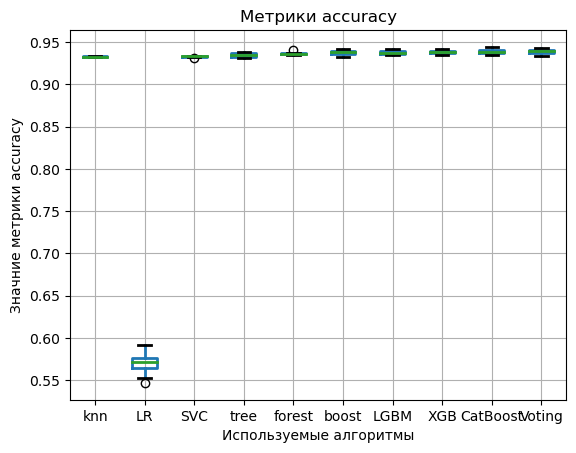

In [2353]:
ax = final_result_accuracy.boxplot() 
_ = plt.setp(ax.lines, linewidth=2.0)
plt.xlabel('Используемые алгоритмы')
plt.ylabel('Значние метрики accuracy')
plt.title('Метрики accuracy')
plt.show()

In [2249]:
final_result_precision = pd.DataFrame({'knn' : cv_score_knn['test_precision'],
                             'LR' : cv_score_LR['test_precision'], 
                             'SVC' : cv_score_SVC['test_precision'], 
                             'tree' : cv_score_tree['test_precision'], 
                             'forest': cv_score_forest['test_precision'],
                             'boost' : cv_score_boost['test_precision'],
                             'LGBM' : cv_score_LGBM['test_precision'],
                             'XGB' : cv_score_XGB['test_precision'],
                             'CatBoost' : cv_score_CatBoost['test_precision'],
                             'Voting' : cv_score_voting['test_precision']})

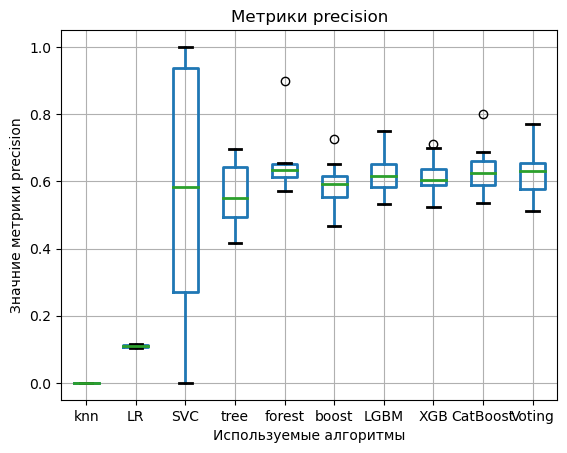

In [2352]:
ax = final_result_precision.boxplot() 
_ = plt.setp(ax.lines, linewidth=2.0)
plt.xlabel('Используемые алгоритмы')
plt.ylabel('Значние метрики precision')
plt.title('Метрики precision')
plt.show()

In [2251]:
final_result_recall = pd.DataFrame({'knn' : cv_score_knn['test_recall'],
                             'LR' : cv_score_LR['test_recall'], 
                             'SVC' : cv_score_SVC['test_recall'], 
                             'tree' : cv_score_tree['test_recall'], 
                             'forest': cv_score_forest['test_recall'],
                             'boost' : cv_score_boost['test_recall'],
                             'LGBM' : cv_score_LGBM['test_recall'],
                             'XGB' : cv_score_XGB['test_recall'],
                             'CatBoost' : cv_score_CatBoost['test_recall'],
                             'Voting' : cv_score_voting['test_recall']})

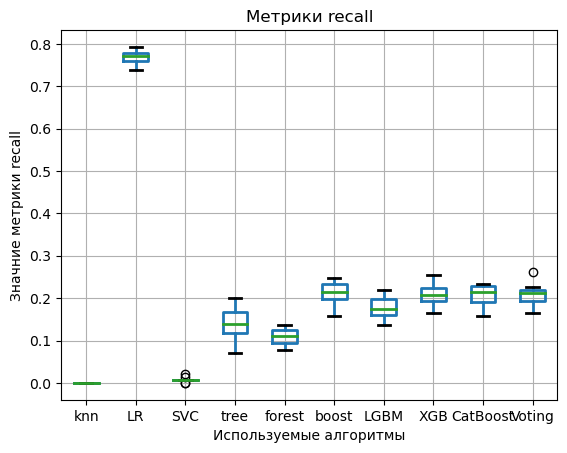

In [2351]:
ax = final_result_recall.boxplot() 
_ = plt.setp(ax.lines, linewidth=2.0)
plt.xlabel('Используемые алгоритмы')
plt.ylabel('Значние метрики recall')
plt.title('Метрики recall')
plt.show()

In [2253]:
final_result_f1 = pd.DataFrame({'knn' : cv_score_knn['test_f1'],
                             'LR' : cv_score_LR['test_f1'], 
                             'SVC' : cv_score_SVC['test_f1'], 
                             'tree' : cv_score_tree['test_f1'], 
                             'forest': cv_score_forest['test_f1'],
                             'boost' : cv_score_boost['test_f1'],
                             'LGBM' : cv_score_LGBM['test_f1'],
                             'XGB' : cv_score_XGB['test_f1'],
                             'CatBoost' : cv_score_CatBoost['test_f1'],
                             'Voting' : cv_score_voting['test_f1']})

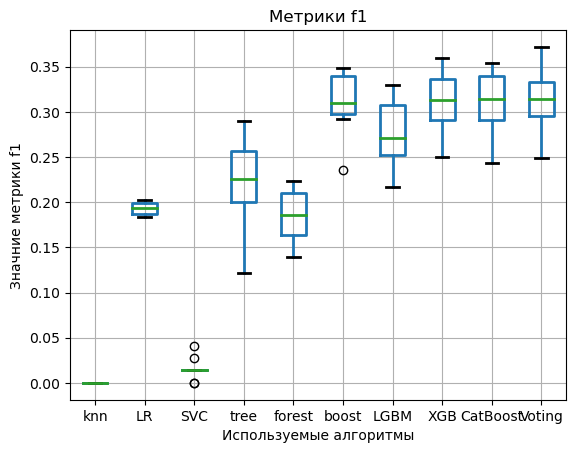

In [2350]:
ax = final_result_f1.boxplot() 
_ = plt.setp(ax.lines, linewidth=2.0)
plt.xlabel('Используемые алгоритмы')
plt.ylabel('Значние метрики f1')
plt.title('Метрики f1')
plt.show()

In [2255]:
final_result_roc_auc = pd.DataFrame({'knn' : cv_score_knn['test_roc_auc'],
                             'LR' : cv_score_LR['test_roc_auc'], 
                             'SVC' : cv_score_SVC['test_roc_auc'], 
                             'tree' : cv_score_tree['test_roc_auc'], 
                             'forest': cv_score_forest['test_roc_auc'],
                             'boost' : cv_score_boost['test_roc_auc'],
                             'LGBM' : cv_score_LGBM['test_roc_auc'],
                             'XGB' : cv_score_XGB['test_roc_auc'],
                             'CatBoost' : cv_score_CatBoost['test_roc_auc'],
                             'Voting' : cv_score_voting['test_roc_auc']})
                                     

In [1]:
final_result_roc_auc

NameError: name 'final_result_roc_auc' is not defined

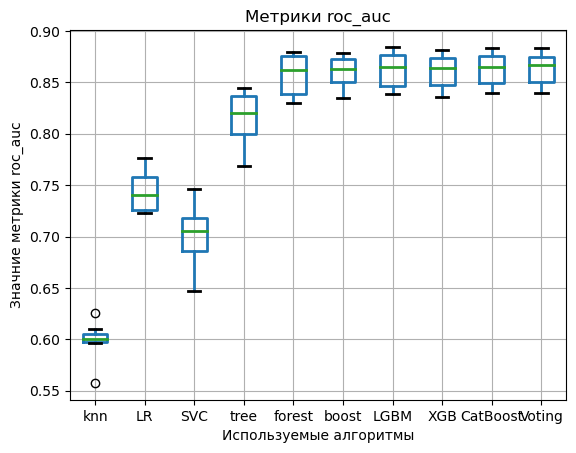

In [2349]:
ax = final_result_roc_auc.boxplot() 
_ = plt.setp(ax.lines, linewidth=2.0)
plt.xlabel('Используемые алгоритмы')
plt.ylabel('Значние метрики roc_auc')
plt.title('Метрики roc_auc')
plt.show()

In [2336]:
cv_scores =[['knn', cv_score_knn],
            ['LR', cv_score_LR],
            ['SVC', cv_score_SVC], 
            ['tree', cv_score_tree],
            ['forest', cv_score_forest],
            ['boost', cv_score_boost], 
            ['LGBM', cv_score_LGBM], 
            ['XGB', cv_score_XGB],
            ['CatBoost', cv_score_CatBoost],
            ['Voting', cv_score_voting]]

final_score = {}

for i in cv_scores:
    final_score[i[0]]= np.mean([np.mean(i[1]['test_accuracy']), 
                            np.mean(i[1]['test_f1']),
                            np.mean(i[1]['test_roc_auc'])])
final_score    

{'knn': 0.5109390795394014,
 'LR': 0.5022934257965077,
 'SVC': 0.5502593851677543,
 'tree': 0.6578282109423308,
 'forest': 0.6596790276067703,
 'boost': 0.7030297579659103,
 'LGBM': 0.6922110302516834,
 'XGB': 0.7035820333417911,
 'CatBoost': 0.7046736698410174,
 'Voting': 0.7046526158240615}

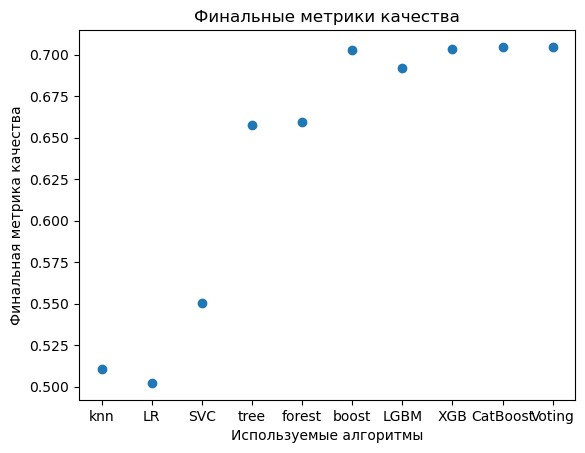

In [2344]:
plt.scatter(final_score.keys(), final_score.values())
plt.xlabel('Используемые алгоритмы')
plt.ylabel('Финальная метрика качества')
plt.title('Финальные метрики качества')
plt.show()

Таким образом, в условиях, приближенным к "боевым" лучше всего себя показывает CatBoost и Voting модель. Так как Voting предполагает обучение сразу 3 крупных моделей с перебором гиперпараметров, я считаю, что правильнее будет работать с моделью CatBoost

Рассмотрим индексы Джини для модели и факторов. Для факторов он будет рассчитываться при помощи удаления фактора из обучающей выборки и мы будем сравнивать его с значением индекса модели, использующую все факторы для обучения. Чем сильнее упадет значение при убирании одного фактора, тем более он значим для построенной модели

In [2267]:
best_model_random_catBoost.fit(X_train, y_train)

gini_score_model = 2 * roc_auc_score(y_valid, best_model_random_catBoost.predict(X_valid)) - 1

gini_scores_factors = {}
for i, feature in enumerate(X_train.columns):
    X_temp = X_train.drop(columns=[feature])
    best_model_random_catBoost.fit(X_temp, y_train)
    
    y_pred_temp = best_model_random_catBoost.predict(X_valid)
    
    gini_score_factor = 2 * roc_auc_score(y_valid, y_pred_temp) - 1
    gini_scores_factors[feature] = gini_score_factor



0:	learn: 0.6695312	total: 10.1ms	remaining: 4.19s
1:	learn: 0.6512204	total: 15.6ms	remaining: 3.21s
2:	learn: 0.6308826	total: 25.1ms	remaining: 3.44s
3:	learn: 0.6097658	total: 35.4ms	remaining: 3.63s
4:	learn: 0.5947502	total: 41.9ms	remaining: 3.43s
5:	learn: 0.5777624	total: 52.5ms	remaining: 3.57s
6:	learn: 0.5629755	total: 59.6ms	remaining: 3.46s
7:	learn: 0.5466032	total: 70.6ms	remaining: 3.58s
8:	learn: 0.5293216	total: 80.8ms	remaining: 3.64s
9:	learn: 0.5137512	total: 90.6ms	remaining: 3.66s
10:	learn: 0.4986433	total: 100ms	remaining: 3.67s
11:	learn: 0.4865065	total: 110ms	remaining: 3.67s
12:	learn: 0.4734288	total: 120ms	remaining: 3.69s
13:	learn: 0.4610984	total: 130ms	remaining: 3.72s
14:	learn: 0.4490220	total: 139ms	remaining: 3.69s
15:	learn: 0.4369852	total: 149ms	remaining: 3.7s
16:	learn: 0.4275497	total: 157ms	remaining: 3.67s
17:	learn: 0.4163728	total: 167ms	remaining: 3.67s
18:	learn: 0.4073781	total: 175ms	remaining: 3.63s
19:	learn: 0.3971670	total: 185m

179:	learn: 0.1705753	total: 1.9s	remaining: 2.47s
180:	learn: 0.1704658	total: 1.91s	remaining: 2.46s
181:	learn: 0.1704462	total: 1.92s	remaining: 2.45s
182:	learn: 0.1703703	total: 1.93s	remaining: 2.44s
183:	learn: 0.1702787	total: 1.94s	remaining: 2.42s
184:	learn: 0.1702082	total: 1.95s	remaining: 2.42s
185:	learn: 0.1701246	total: 1.96s	remaining: 2.4s
186:	learn: 0.1700316	total: 1.97s	remaining: 2.39s
187:	learn: 0.1699687	total: 1.98s	remaining: 2.38s
188:	learn: 0.1699265	total: 1.99s	remaining: 2.37s
189:	learn: 0.1698439	total: 2s	remaining: 2.36s
190:	learn: 0.1697381	total: 2.01s	remaining: 2.35s
191:	learn: 0.1696683	total: 2.02s	remaining: 2.34s
192:	learn: 0.1695816	total: 2.03s	remaining: 2.33s
193:	learn: 0.1695173	total: 2.04s	remaining: 2.32s
194:	learn: 0.1694641	total: 2.06s	remaining: 2.31s
195:	learn: 0.1693683	total: 2.06s	remaining: 2.3s
196:	learn: 0.1693095	total: 2.08s	remaining: 2.29s
197:	learn: 0.1692595	total: 2.08s	remaining: 2.27s
198:	learn: 0.1691

353:	learn: 0.1630884	total: 3.82s	remaining: 648ms
354:	learn: 0.1630871	total: 3.83s	remaining: 636ms
355:	learn: 0.1630548	total: 3.84s	remaining: 625ms
356:	learn: 0.1630301	total: 3.85s	remaining: 615ms
357:	learn: 0.1630176	total: 3.86s	remaining: 604ms
358:	learn: 0.1629697	total: 3.88s	remaining: 594ms
359:	learn: 0.1629538	total: 3.89s	remaining: 583ms
360:	learn: 0.1629323	total: 3.9s	remaining: 573ms
361:	learn: 0.1628977	total: 3.91s	remaining: 562ms
362:	learn: 0.1628586	total: 3.92s	remaining: 551ms
363:	learn: 0.1628564	total: 3.93s	remaining: 540ms
364:	learn: 0.1628239	total: 3.94s	remaining: 529ms
365:	learn: 0.1627949	total: 3.97s	remaining: 520ms
366:	learn: 0.1627491	total: 3.98s	remaining: 509ms
367:	learn: 0.1627321	total: 3.99s	remaining: 499ms
368:	learn: 0.1626968	total: 4s	remaining: 488ms
369:	learn: 0.1626772	total: 4.01s	remaining: 477ms
370:	learn: 0.1626463	total: 4.02s	remaining: 466ms
371:	learn: 0.1626384	total: 4.03s	remaining: 455ms
372:	learn: 0.16

101:	learn: 0.1957769	total: 996ms	remaining: 3.05s
102:	learn: 0.1952791	total: 1.01s	remaining: 3.04s
103:	learn: 0.1947653	total: 1.02s	remaining: 3.04s
104:	learn: 0.1942569	total: 1.03s	remaining: 3.04s
105:	learn: 0.1937470	total: 1.04s	remaining: 3.03s
106:	learn: 0.1935375	total: 1.05s	remaining: 3s
107:	learn: 0.1930598	total: 1.06s	remaining: 3s
108:	learn: 0.1926384	total: 1.07s	remaining: 2.98s
109:	learn: 0.1923257	total: 1.08s	remaining: 2.98s
110:	learn: 0.1919624	total: 1.09s	remaining: 2.97s
111:	learn: 0.1915822	total: 1.1s	remaining: 2.96s
112:	learn: 0.1911508	total: 1.11s	remaining: 2.95s
113:	learn: 0.1908485	total: 1.12s	remaining: 2.94s
114:	learn: 0.1904788	total: 1.13s	remaining: 2.93s
115:	learn: 0.1901896	total: 1.14s	remaining: 2.92s
116:	learn: 0.1898440	total: 1.15s	remaining: 2.91s
117:	learn: 0.1894573	total: 1.16s	remaining: 2.9s
118:	learn: 0.1891864	total: 1.17s	remaining: 2.89s
119:	learn: 0.1888939	total: 1.18s	remaining: 2.88s
120:	learn: 0.188548

266:	learn: 0.1744812	total: 2.7s	remaining: 1.49s
267:	learn: 0.1744087	total: 2.71s	remaining: 1.48s
268:	learn: 0.1743952	total: 2.72s	remaining: 1.47s
269:	learn: 0.1743151	total: 2.73s	remaining: 1.46s
270:	learn: 0.1742365	total: 2.75s	remaining: 1.45s
271:	learn: 0.1741877	total: 2.76s	remaining: 1.44s
272:	learn: 0.1741506	total: 2.77s	remaining: 1.43s
273:	learn: 0.1741188	total: 2.78s	remaining: 1.42s
274:	learn: 0.1740869	total: 2.79s	remaining: 1.41s
275:	learn: 0.1740620	total: 2.8s	remaining: 1.4s
276:	learn: 0.1740151	total: 2.81s	remaining: 1.39s
277:	learn: 0.1739729	total: 2.82s	remaining: 1.38s
278:	learn: 0.1739405	total: 2.83s	remaining: 1.37s
279:	learn: 0.1738882	total: 2.84s	remaining: 1.36s
280:	learn: 0.1738470	total: 2.85s	remaining: 1.35s
281:	learn: 0.1738177	total: 2.86s	remaining: 1.34s
282:	learn: 0.1737805	total: 2.87s	remaining: 1.33s
283:	learn: 0.1737434	total: 2.88s	remaining: 1.32s
284:	learn: 0.1737180	total: 2.89s	remaining: 1.31s
285:	learn: 0.1

29:	learn: 0.3231373	total: 300ms	remaining: 3.84s
30:	learn: 0.3178288	total: 307ms	remaining: 3.79s
31:	learn: 0.3124067	total: 319ms	remaining: 3.8s
32:	learn: 0.3071368	total: 329ms	remaining: 3.8s
33:	learn: 0.3023938	total: 339ms	remaining: 3.78s
34:	learn: 0.2988571	total: 345ms	remaining: 3.74s
35:	learn: 0.2937492	total: 355ms	remaining: 3.73s
36:	learn: 0.2904167	total: 363ms	remaining: 3.69s
37:	learn: 0.2858127	total: 373ms	remaining: 3.69s
38:	learn: 0.2822816	total: 381ms	remaining: 3.66s
39:	learn: 0.2782626	total: 389ms	remaining: 3.64s
40:	learn: 0.2744686	total: 400ms	remaining: 3.64s
41:	learn: 0.2704748	total: 410ms	remaining: 3.63s
42:	learn: 0.2675334	total: 418ms	remaining: 3.61s
43:	learn: 0.2639702	total: 428ms	remaining: 3.6s
44:	learn: 0.2614224	total: 437ms	remaining: 3.58s
45:	learn: 0.2580553	total: 447ms	remaining: 3.58s
46:	learn: 0.2550772	total: 458ms	remaining: 3.57s
47:	learn: 0.2520055	total: 469ms	remaining: 3.57s
48:	learn: 0.2490596	total: 479ms	

190:	learn: 0.1710165	total: 1.98s	remaining: 2.31s
191:	learn: 0.1709354	total: 1.99s	remaining: 2.3s
192:	learn: 0.1709060	total: 2s	remaining: 2.28s
193:	learn: 0.1708299	total: 2s	remaining: 2.27s
194:	learn: 0.1707588	total: 2.02s	remaining: 2.26s
195:	learn: 0.1706927	total: 2.02s	remaining: 2.25s
196:	learn: 0.1706339	total: 2.04s	remaining: 2.24s
197:	learn: 0.1705519	total: 2.04s	remaining: 2.23s
198:	learn: 0.1705106	total: 2.06s	remaining: 2.22s
199:	learn: 0.1704625	total: 2.06s	remaining: 2.21s
200:	learn: 0.1704102	total: 2.08s	remaining: 2.2s
201:	learn: 0.1703358	total: 2.08s	remaining: 2.19s
202:	learn: 0.1702762	total: 2.1s	remaining: 2.18s
203:	learn: 0.1702280	total: 2.11s	remaining: 2.17s
204:	learn: 0.1701777	total: 2.12s	remaining: 2.16s
205:	learn: 0.1701026	total: 2.13s	remaining: 2.15s
206:	learn: 0.1700751	total: 2.13s	remaining: 2.13s
207:	learn: 0.1700226	total: 2.14s	remaining: 2.12s
208:	learn: 0.1699726	total: 2.15s	remaining: 2.11s
209:	learn: 0.1699610

350:	learn: 0.1652136	total: 3.67s	remaining: 659ms
351:	learn: 0.1651918	total: 3.69s	remaining: 649ms
352:	learn: 0.1651855	total: 3.7s	remaining: 639ms
353:	learn: 0.1651673	total: 3.71s	remaining: 628ms
354:	learn: 0.1651364	total: 3.72s	remaining: 618ms
355:	learn: 0.1651247	total: 3.73s	remaining: 608ms
356:	learn: 0.1651030	total: 3.74s	remaining: 598ms
357:	learn: 0.1650710	total: 3.75s	remaining: 587ms
358:	learn: 0.1650689	total: 3.76s	remaining: 576ms
359:	learn: 0.1650253	total: 3.77s	remaining: 566ms
360:	learn: 0.1650146	total: 3.78s	remaining: 555ms
361:	learn: 0.1650080	total: 3.79s	remaining: 545ms
362:	learn: 0.1649865	total: 3.81s	remaining: 535ms
363:	learn: 0.1649502	total: 3.82s	remaining: 524ms
364:	learn: 0.1649317	total: 3.83s	remaining: 514ms
365:	learn: 0.1649040	total: 3.84s	remaining: 504ms
366:	learn: 0.1648820	total: 3.85s	remaining: 494ms
367:	learn: 0.1648519	total: 3.87s	remaining: 483ms
368:	learn: 0.1648177	total: 3.88s	remaining: 473ms
369:	learn: 0

111:	learn: 0.1882195	total: 1.31s	remaining: 3.55s
112:	learn: 0.1878384	total: 1.33s	remaining: 3.54s
113:	learn: 0.1875186	total: 1.34s	remaining: 3.52s
114:	learn: 0.1871632	total: 1.35s	remaining: 3.51s
115:	learn: 0.1868532	total: 1.36s	remaining: 3.5s
116:	learn: 0.1864666	total: 1.38s	remaining: 3.5s
117:	learn: 0.1861740	total: 1.39s	remaining: 3.48s
118:	learn: 0.1858171	total: 1.4s	remaining: 3.47s
119:	learn: 0.1855810	total: 1.41s	remaining: 3.46s
120:	learn: 0.1852280	total: 1.43s	remaining: 3.45s
121:	learn: 0.1849349	total: 1.44s	remaining: 3.44s
122:	learn: 0.1845551	total: 1.45s	remaining: 3.43s
123:	learn: 0.1842816	total: 1.46s	remaining: 3.42s
124:	learn: 0.1841256	total: 1.48s	remaining: 3.41s
125:	learn: 0.1838488	total: 1.49s	remaining: 3.4s
126:	learn: 0.1836062	total: 1.5s	remaining: 3.39s
127:	learn: 0.1834420	total: 1.51s	remaining: 3.38s
128:	learn: 0.1832708	total: 1.52s	remaining: 3.37s
129:	learn: 0.1829952	total: 1.54s	remaining: 3.36s
130:	learn: 0.182

288:	learn: 0.1704838	total: 3.43s	remaining: 1.48s
289:	learn: 0.1704446	total: 3.44s	remaining: 1.47s
290:	learn: 0.1704058	total: 3.45s	remaining: 1.46s
291:	learn: 0.1703518	total: 3.46s	remaining: 1.45s
292:	learn: 0.1703106	total: 3.48s	remaining: 1.44s
293:	learn: 0.1702738	total: 3.48s	remaining: 1.42s
294:	learn: 0.1702415	total: 3.5s	remaining: 1.41s
295:	learn: 0.1702120	total: 3.51s	remaining: 1.4s
296:	learn: 0.1701726	total: 3.52s	remaining: 1.39s
297:	learn: 0.1701489	total: 3.53s	remaining: 1.37s
298:	learn: 0.1701470	total: 3.53s	remaining: 1.36s
299:	learn: 0.1701062	total: 3.54s	remaining: 1.35s
300:	learn: 0.1700799	total: 3.55s	remaining: 1.33s
301:	learn: 0.1700430	total: 3.56s	remaining: 1.32s
302:	learn: 0.1700162	total: 3.57s	remaining: 1.31s
303:	learn: 0.1699878	total: 3.58s	remaining: 1.3s
304:	learn: 0.1699661	total: 3.6s	remaining: 1.28s
305:	learn: 0.1699476	total: 3.6s	remaining: 1.27s
306:	learn: 0.1699256	total: 3.62s	remaining: 1.26s
307:	learn: 0.169

38:	learn: 0.2818384	total: 352ms	remaining: 3.38s
39:	learn: 0.2783437	total: 362ms	remaining: 3.38s
40:	learn: 0.2749063	total: 368ms	remaining: 3.35s
41:	learn: 0.2707713	total: 378ms	remaining: 3.35s
42:	learn: 0.2670455	total: 385ms	remaining: 3.32s
43:	learn: 0.2638377	total: 391ms	remaining: 3.29s
44:	learn: 0.2608917	total: 401ms	remaining: 3.29s
45:	learn: 0.2580919	total: 411ms	remaining: 3.29s
46:	learn: 0.2547066	total: 421ms	remaining: 3.29s
47:	learn: 0.2514420	total: 432ms	remaining: 3.3s
48:	learn: 0.2486888	total: 443ms	remaining: 3.3s
49:	learn: 0.2457117	total: 453ms	remaining: 3.3s
50:	learn: 0.2433635	total: 463ms	remaining: 3.29s
51:	learn: 0.2410615	total: 472ms	remaining: 3.29s
52:	learn: 0.2386819	total: 481ms	remaining: 3.28s
53:	learn: 0.2362308	total: 492ms	remaining: 3.28s
54:	learn: 0.2339375	total: 502ms	remaining: 3.27s
55:	learn: 0.2315934	total: 512ms	remaining: 3.27s
56:	learn: 0.2295186	total: 522ms	remaining: 3.27s
57:	learn: 0.2277364	total: 531ms	

201:	learn: 0.1698833	total: 2s	remaining: 2.1s
202:	learn: 0.1698084	total: 2.01s	remaining: 2.09s
203:	learn: 0.1697255	total: 2.02s	remaining: 2.08s
204:	learn: 0.1696689	total: 2.03s	remaining: 2.07s
205:	learn: 0.1696247	total: 2.04s	remaining: 2.06s
206:	learn: 0.1695845	total: 2.06s	remaining: 2.06s
207:	learn: 0.1695269	total: 2.07s	remaining: 2.05s
208:	learn: 0.1694527	total: 2.08s	remaining: 2.04s
209:	learn: 0.1694004	total: 2.09s	remaining: 2.03s
210:	learn: 0.1693543	total: 2.1s	remaining: 2.02s
211:	learn: 0.1692913	total: 2.11s	remaining: 2.01s
212:	learn: 0.1692189	total: 2.12s	remaining: 2s
213:	learn: 0.1691704	total: 2.13s	remaining: 1.99s
214:	learn: 0.1691330	total: 2.14s	remaining: 1.98s
215:	learn: 0.1690907	total: 2.15s	remaining: 1.97s
216:	learn: 0.1690412	total: 2.16s	remaining: 1.96s
217:	learn: 0.1689893	total: 2.17s	remaining: 1.95s
218:	learn: 0.1689245	total: 2.18s	remaining: 1.94s
219:	learn: 0.1688718	total: 2.19s	remaining: 1.93s
220:	learn: 0.168846

371:	learn: 0.1638403	total: 3.92s	remaining: 443ms
372:	learn: 0.1638198	total: 3.93s	remaining: 432ms
373:	learn: 0.1638107	total: 3.94s	remaining: 422ms
374:	learn: 0.1637786	total: 3.95s	remaining: 411ms
375:	learn: 0.1637465	total: 3.96s	remaining: 400ms
376:	learn: 0.1637077	total: 3.98s	remaining: 390ms
377:	learn: 0.1636772	total: 3.99s	remaining: 380ms
378:	learn: 0.1636637	total: 4s	remaining: 369ms
379:	learn: 0.1636264	total: 4.01s	remaining: 359ms
380:	learn: 0.1635977	total: 4.02s	remaining: 349ms
381:	learn: 0.1635770	total: 4.04s	remaining: 338ms
382:	learn: 0.1635616	total: 4.05s	remaining: 328ms
383:	learn: 0.1635396	total: 4.06s	remaining: 317ms
384:	learn: 0.1635041	total: 4.07s	remaining: 307ms
385:	learn: 0.1634780	total: 4.08s	remaining: 296ms
386:	learn: 0.1634681	total: 4.09s	remaining: 285ms
387:	learn: 0.1634508	total: 4.1s	remaining: 275ms
388:	learn: 0.1634229	total: 4.11s	remaining: 264ms
389:	learn: 0.1634173	total: 4.12s	remaining: 254ms
390:	learn: 0.16

129:	learn: 0.1781481	total: 1.36s	remaining: 2.97s
130:	learn: 0.1779818	total: 1.37s	remaining: 2.96s
131:	learn: 0.1777486	total: 1.38s	remaining: 2.95s
132:	learn: 0.1775665	total: 1.39s	remaining: 2.94s
133:	learn: 0.1773374	total: 1.4s	remaining: 2.93s
134:	learn: 0.1771800	total: 1.42s	remaining: 2.94s
135:	learn: 0.1769319	total: 1.44s	remaining: 2.94s
136:	learn: 0.1767095	total: 1.46s	remaining: 2.94s
137:	learn: 0.1764455	total: 1.47s	remaining: 2.93s
138:	learn: 0.1761943	total: 1.48s	remaining: 2.92s
139:	learn: 0.1760510	total: 1.49s	remaining: 2.91s
140:	learn: 0.1758792	total: 1.5s	remaining: 2.9s
141:	learn: 0.1757612	total: 1.51s	remaining: 2.88s
142:	learn: 0.1756010	total: 1.52s	remaining: 2.87s
143:	learn: 0.1754562	total: 1.53s	remaining: 2.87s
144:	learn: 0.1752725	total: 1.54s	remaining: 2.86s
145:	learn: 0.1751285	total: 1.55s	remaining: 2.84s
146:	learn: 0.1750100	total: 1.56s	remaining: 2.83s
147:	learn: 0.1748209	total: 1.57s	remaining: 2.82s
148:	learn: 0.1

306:	learn: 0.1654500	total: 3.27s	remaining: 1.14s
307:	learn: 0.1654203	total: 3.29s	remaining: 1.13s
308:	learn: 0.1654112	total: 3.3s	remaining: 1.12s
309:	learn: 0.1653955	total: 3.31s	remaining: 1.11s
310:	learn: 0.1653700	total: 3.32s	remaining: 1.1s
311:	learn: 0.1653396	total: 3.33s	remaining: 1.09s
312:	learn: 0.1653064	total: 3.34s	remaining: 1.08s
313:	learn: 0.1652936	total: 3.35s	remaining: 1.07s
314:	learn: 0.1652615	total: 3.36s	remaining: 1.05s
315:	learn: 0.1652284	total: 3.37s	remaining: 1.04s
316:	learn: 0.1652145	total: 3.38s	remaining: 1.03s
317:	learn: 0.1651855	total: 3.39s	remaining: 1.02s
318:	learn: 0.1651692	total: 3.4s	remaining: 1.01s
319:	learn: 0.1651347	total: 3.41s	remaining: 1s
320:	learn: 0.1651122	total: 3.42s	remaining: 991ms
321:	learn: 0.1650655	total: 3.44s	remaining: 982ms
322:	learn: 0.1650511	total: 3.45s	remaining: 972ms
323:	learn: 0.1650321	total: 3.46s	remaining: 961ms
324:	learn: 0.1650060	total: 3.47s	remaining: 951ms
325:	learn: 0.1649

69:	learn: 0.2094773	total: 719ms	remaining: 3.53s
70:	learn: 0.2084912	total: 733ms	remaining: 3.54s
71:	learn: 0.2074303	total: 743ms	remaining: 3.53s
72:	learn: 0.2062337	total: 753ms	remaining: 3.52s
73:	learn: 0.2054188	total: 758ms	remaining: 3.48s
74:	learn: 0.2044424	total: 769ms	remaining: 3.47s
75:	learn: 0.2035606	total: 781ms	remaining: 3.47s
76:	learn: 0.2024931	total: 795ms	remaining: 3.48s
77:	learn: 0.2016057	total: 807ms	remaining: 3.48s
78:	learn: 0.2008513	total: 820ms	remaining: 3.48s
79:	learn: 0.2001381	total: 829ms	remaining: 3.46s
80:	learn: 0.1991554	total: 841ms	remaining: 3.46s
81:	learn: 0.1982040	total: 852ms	remaining: 3.45s
82:	learn: 0.1972360	total: 866ms	remaining: 3.45s
83:	learn: 0.1962729	total: 879ms	remaining: 3.45s
84:	learn: 0.1955333	total: 905ms	remaining: 3.5s
85:	learn: 0.1946759	total: 918ms	remaining: 3.5s
86:	learn: 0.1938767	total: 930ms	remaining: 3.5s
87:	learn: 0.1931581	total: 942ms	remaining: 3.49s
88:	learn: 0.1924248	total: 952ms	

237:	learn: 0.1683195	total: 2.85s	remaining: 2.11s
238:	learn: 0.1682731	total: 2.86s	remaining: 2.09s
239:	learn: 0.1682297	total: 2.87s	remaining: 2.08s
240:	learn: 0.1681957	total: 2.89s	remaining: 2.07s
241:	learn: 0.1681497	total: 2.9s	remaining: 2.06s
242:	learn: 0.1681139	total: 2.91s	remaining: 2.05s
243:	learn: 0.1680634	total: 2.92s	remaining: 2.04s
244:	learn: 0.1680275	total: 2.94s	remaining: 2.02s
245:	learn: 0.1679926	total: 2.95s	remaining: 2.01s
246:	learn: 0.1679331	total: 2.96s	remaining: 2s
247:	learn: 0.1678826	total: 2.97s	remaining: 1.99s
248:	learn: 0.1678493	total: 2.98s	remaining: 1.98s
249:	learn: 0.1678169	total: 2.99s	remaining: 1.96s
250:	learn: 0.1677959	total: 3.01s	remaining: 1.95s
251:	learn: 0.1677605	total: 3.03s	remaining: 1.95s
252:	learn: 0.1677566	total: 3.04s	remaining: 1.94s
253:	learn: 0.1677252	total: 3.06s	remaining: 1.92s
254:	learn: 0.1676972	total: 3.07s	remaining: 1.91s
255:	learn: 0.1676304	total: 3.08s	remaining: 1.9s
256:	learn: 0.167

408:	learn: 0.1634373	total: 5.17s	remaining: 63.2ms
409:	learn: 0.1634170	total: 5.18s	remaining: 50.6ms
410:	learn: 0.1633982	total: 5.19s	remaining: 37.9ms
411:	learn: 0.1633826	total: 5.21s	remaining: 25.3ms
412:	learn: 0.1633725	total: 5.22s	remaining: 12.6ms
413:	learn: 0.1633416	total: 5.24s	remaining: 0us
0:	learn: 0.6707800	total: 11.3ms	remaining: 4.66s
1:	learn: 0.6499692	total: 23.1ms	remaining: 4.77s
2:	learn: 0.6301911	total: 34.3ms	remaining: 4.7s
3:	learn: 0.6102052	total: 48.4ms	remaining: 4.96s
4:	learn: 0.5918065	total: 60.5ms	remaining: 4.95s
5:	learn: 0.5739474	total: 72.6ms	remaining: 4.93s
6:	learn: 0.5564283	total: 84.5ms	remaining: 4.92s
7:	learn: 0.5410101	total: 95.6ms	remaining: 4.85s
8:	learn: 0.5255959	total: 106ms	remaining: 4.78s
9:	learn: 0.5107615	total: 118ms	remaining: 4.75s
10:	learn: 0.4974050	total: 131ms	remaining: 4.79s
11:	learn: 0.4833774	total: 143ms	remaining: 4.78s
12:	learn: 0.4706063	total: 154ms	remaining: 4.76s
13:	learn: 0.4599099	tota

163:	learn: 0.1815086	total: 1.79s	remaining: 2.73s
164:	learn: 0.1814169	total: 1.8s	remaining: 2.72s
165:	learn: 0.1812838	total: 1.81s	remaining: 2.71s
166:	learn: 0.1811976	total: 1.83s	remaining: 2.7s
167:	learn: 0.1811122	total: 1.84s	remaining: 2.69s
168:	learn: 0.1810161	total: 1.85s	remaining: 2.68s
169:	learn: 0.1809298	total: 1.86s	remaining: 2.67s
170:	learn: 0.1809059	total: 1.87s	remaining: 2.65s
171:	learn: 0.1808117	total: 1.88s	remaining: 2.64s
172:	learn: 0.1807099	total: 1.89s	remaining: 2.63s
173:	learn: 0.1806413	total: 1.9s	remaining: 2.62s
174:	learn: 0.1805601	total: 1.91s	remaining: 2.6s
175:	learn: 0.1804793	total: 1.92s	remaining: 2.59s
176:	learn: 0.1804051	total: 1.93s	remaining: 2.59s
177:	learn: 0.1803136	total: 1.94s	remaining: 2.58s
178:	learn: 0.1802400	total: 1.95s	remaining: 2.56s
179:	learn: 0.1801353	total: 1.96s	remaining: 2.55s
180:	learn: 0.1800553	total: 1.98s	remaining: 2.54s
181:	learn: 0.1799755	total: 1.99s	remaining: 2.53s
182:	learn: 0.17

327:	learn: 0.1735145	total: 3.67s	remaining: 963ms
328:	learn: 0.1734781	total: 3.69s	remaining: 953ms
329:	learn: 0.1734309	total: 3.7s	remaining: 942ms
330:	learn: 0.1733835	total: 3.71s	remaining: 930ms
331:	learn: 0.1733600	total: 3.72s	remaining: 919ms
332:	learn: 0.1733315	total: 3.73s	remaining: 908ms
333:	learn: 0.1732811	total: 3.74s	remaining: 897ms
334:	learn: 0.1732548	total: 3.75s	remaining: 885ms
335:	learn: 0.1732234	total: 3.77s	remaining: 874ms
336:	learn: 0.1732013	total: 3.78s	remaining: 863ms
337:	learn: 0.1731800	total: 3.79s	remaining: 853ms
338:	learn: 0.1731617	total: 3.81s	remaining: 842ms
339:	learn: 0.1731269	total: 3.82s	remaining: 831ms
340:	learn: 0.1731201	total: 3.82s	remaining: 819ms
341:	learn: 0.1730812	total: 3.83s	remaining: 807ms
342:	learn: 0.1730579	total: 3.84s	remaining: 796ms
343:	learn: 0.1730066	total: 3.85s	remaining: 784ms
344:	learn: 0.1729752	total: 3.87s	remaining: 773ms
345:	learn: 0.1729451	total: 3.88s	remaining: 762ms
346:	learn: 0

84:	learn: 0.1971571	total: 895ms	remaining: 3.46s
85:	learn: 0.1965393	total: 905ms	remaining: 3.45s
86:	learn: 0.1957850	total: 915ms	remaining: 3.44s
87:	learn: 0.1950885	total: 925ms	remaining: 3.42s
88:	learn: 0.1942804	total: 937ms	remaining: 3.42s
89:	learn: 0.1935071	total: 951ms	remaining: 3.42s
90:	learn: 0.1928632	total: 962ms	remaining: 3.41s
91:	learn: 0.1921430	total: 973ms	remaining: 3.41s
92:	learn: 0.1916780	total: 979ms	remaining: 3.38s
93:	learn: 0.1909996	total: 991ms	remaining: 3.37s
94:	learn: 0.1904417	total: 1s	remaining: 3.36s
95:	learn: 0.1899136	total: 1.01s	remaining: 3.35s
96:	learn: 0.1892578	total: 1.02s	remaining: 3.34s
97:	learn: 0.1887178	total: 1.03s	remaining: 3.34s
98:	learn: 0.1882754	total: 1.05s	remaining: 3.33s
99:	learn: 0.1877179	total: 1.06s	remaining: 3.32s
100:	learn: 0.1873477	total: 1.07s	remaining: 3.31s
101:	learn: 0.1868882	total: 1.08s	remaining: 3.3s
102:	learn: 0.1866522	total: 1.09s	remaining: 3.28s
103:	learn: 0.1862251	total: 1.1

257:	learn: 0.1668945	total: 2.79s	remaining: 1.69s
258:	learn: 0.1668593	total: 2.8s	remaining: 1.68s
259:	learn: 0.1668076	total: 2.82s	remaining: 1.67s
260:	learn: 0.1667705	total: 2.83s	remaining: 1.66s
261:	learn: 0.1667240	total: 2.84s	remaining: 1.65s
262:	learn: 0.1666877	total: 2.85s	remaining: 1.64s
263:	learn: 0.1666292	total: 2.86s	remaining: 1.62s
264:	learn: 0.1666108	total: 2.87s	remaining: 1.61s
265:	learn: 0.1665755	total: 2.88s	remaining: 1.6s
266:	learn: 0.1665463	total: 2.89s	remaining: 1.59s
267:	learn: 0.1665195	total: 2.9s	remaining: 1.58s
268:	learn: 0.1664629	total: 2.91s	remaining: 1.57s
269:	learn: 0.1664144	total: 2.92s	remaining: 1.56s
270:	learn: 0.1663747	total: 2.93s	remaining: 1.55s
271:	learn: 0.1663438	total: 2.94s	remaining: 1.53s
272:	learn: 0.1663154	total: 2.95s	remaining: 1.52s
273:	learn: 0.1662826	total: 2.96s	remaining: 1.51s
274:	learn: 0.1662464	total: 2.97s	remaining: 1.5s
275:	learn: 0.1661981	total: 2.98s	remaining: 1.49s
276:	learn: 0.16

5:	learn: 0.5763831	total: 52.7ms	remaining: 3.58s
6:	learn: 0.5586917	total: 63.2ms	remaining: 3.67s
7:	learn: 0.5421366	total: 73.2ms	remaining: 3.72s
8:	learn: 0.5263510	total: 83.7ms	remaining: 3.77s
9:	learn: 0.5102305	total: 94.2ms	remaining: 3.8s
10:	learn: 0.4957755	total: 104ms	remaining: 3.81s
11:	learn: 0.4816406	total: 114ms	remaining: 3.81s
12:	learn: 0.4691661	total: 124ms	remaining: 3.83s
13:	learn: 0.4560094	total: 135ms	remaining: 3.85s
14:	learn: 0.4436540	total: 142ms	remaining: 3.79s
15:	learn: 0.4334932	total: 153ms	remaining: 3.8s
16:	learn: 0.4222254	total: 164ms	remaining: 3.83s
17:	learn: 0.4133389	total: 175ms	remaining: 3.85s
18:	learn: 0.4039001	total: 186ms	remaining: 3.86s
19:	learn: 0.3957857	total: 194ms	remaining: 3.82s
20:	learn: 0.3864466	total: 205ms	remaining: 3.83s
21:	learn: 0.3782238	total: 212ms	remaining: 3.77s
22:	learn: 0.3711564	total: 221ms	remaining: 3.75s
23:	learn: 0.3643583	total: 231ms	remaining: 3.75s
24:	learn: 0.3574611	total: 241ms

171:	learn: 0.1751714	total: 1.72s	remaining: 2.42s
172:	learn: 0.1750985	total: 1.73s	remaining: 2.41s
173:	learn: 0.1749896	total: 1.74s	remaining: 2.41s
174:	learn: 0.1748665	total: 1.75s	remaining: 2.4s
175:	learn: 0.1747533	total: 1.76s	remaining: 2.39s
176:	learn: 0.1746896	total: 1.77s	remaining: 2.38s
177:	learn: 0.1746324	total: 1.79s	remaining: 2.37s
178:	learn: 0.1745775	total: 1.8s	remaining: 2.36s
179:	learn: 0.1745273	total: 1.8s	remaining: 2.35s
180:	learn: 0.1744420	total: 1.82s	remaining: 2.34s
181:	learn: 0.1743874	total: 1.83s	remaining: 2.33s
182:	learn: 0.1742894	total: 1.84s	remaining: 2.32s
183:	learn: 0.1741719	total: 1.85s	remaining: 2.31s
184:	learn: 0.1740967	total: 1.86s	remaining: 2.3s
185:	learn: 0.1740879	total: 1.86s	remaining: 2.28s
186:	learn: 0.1740131	total: 1.87s	remaining: 2.27s
187:	learn: 0.1739389	total: 1.88s	remaining: 2.27s
188:	learn: 0.1738355	total: 1.89s	remaining: 2.25s
189:	learn: 0.1737986	total: 1.9s	remaining: 2.24s
190:	learn: 0.173

345:	learn: 0.1674412	total: 3.6s	remaining: 709ms
346:	learn: 0.1674258	total: 3.62s	remaining: 698ms
347:	learn: 0.1674043	total: 3.63s	remaining: 688ms
348:	learn: 0.1673604	total: 3.64s	remaining: 678ms
349:	learn: 0.1673321	total: 3.65s	remaining: 668ms
350:	learn: 0.1673310	total: 3.66s	remaining: 657ms
351:	learn: 0.1673151	total: 3.67s	remaining: 646ms
352:	learn: 0.1672968	total: 3.68s	remaining: 636ms
353:	learn: 0.1672742	total: 3.69s	remaining: 626ms
354:	learn: 0.1672468	total: 3.7s	remaining: 615ms
355:	learn: 0.1672195	total: 3.71s	remaining: 605ms
356:	learn: 0.1672014	total: 3.73s	remaining: 595ms
357:	learn: 0.1671766	total: 3.74s	remaining: 585ms
358:	learn: 0.1671387	total: 3.75s	remaining: 575ms
359:	learn: 0.1671249	total: 3.76s	remaining: 564ms
360:	learn: 0.1670951	total: 3.77s	remaining: 554ms
361:	learn: 0.1670632	total: 3.79s	remaining: 544ms
362:	learn: 0.1670133	total: 3.8s	remaining: 534ms
363:	learn: 0.1669695	total: 3.81s	remaining: 523ms
364:	learn: 0.1

92:	learn: 0.1909175	total: 1.06s	remaining: 3.67s
93:	learn: 0.1903291	total: 1.08s	remaining: 3.66s
94:	learn: 0.1896965	total: 1.09s	remaining: 3.66s
95:	learn: 0.1891165	total: 1.1s	remaining: 3.65s
96:	learn: 0.1885490	total: 1.11s	remaining: 3.64s
97:	learn: 0.1879509	total: 1.13s	remaining: 3.63s
98:	learn: 0.1874880	total: 1.14s	remaining: 3.63s
99:	learn: 0.1869085	total: 1.15s	remaining: 3.62s
100:	learn: 0.1864242	total: 1.17s	remaining: 3.61s
101:	learn: 0.1861377	total: 1.17s	remaining: 3.59s
102:	learn: 0.1857688	total: 1.18s	remaining: 3.57s
103:	learn: 0.1854187	total: 1.2s	remaining: 3.56s
104:	learn: 0.1852138	total: 1.2s	remaining: 3.54s
105:	learn: 0.1847776	total: 1.21s	remaining: 3.52s
106:	learn: 0.1843382	total: 1.22s	remaining: 3.51s
107:	learn: 0.1840123	total: 1.24s	remaining: 3.5s
108:	learn: 0.1837086	total: 1.25s	remaining: 3.49s
109:	learn: 0.1834316	total: 1.26s	remaining: 3.48s
110:	learn: 0.1830704	total: 1.27s	remaining: 3.47s
111:	learn: 0.1827319	to

263:	learn: 0.1670296	total: 2.94s	remaining: 1.67s
264:	learn: 0.1669921	total: 2.96s	remaining: 1.66s
265:	learn: 0.1669525	total: 2.96s	remaining: 1.65s
266:	learn: 0.1669127	total: 2.98s	remaining: 1.64s
267:	learn: 0.1668445	total: 2.99s	remaining: 1.63s
268:	learn: 0.1667962	total: 3s	remaining: 1.61s
269:	learn: 0.1667637	total: 3.01s	remaining: 1.6s
270:	learn: 0.1667552	total: 3.01s	remaining: 1.59s
271:	learn: 0.1666962	total: 3.02s	remaining: 1.58s
272:	learn: 0.1666457	total: 3.03s	remaining: 1.57s
273:	learn: 0.1665877	total: 3.04s	remaining: 1.55s
274:	learn: 0.1665703	total: 3.06s	remaining: 1.54s
275:	learn: 0.1665297	total: 3.06s	remaining: 1.53s
276:	learn: 0.1664819	total: 3.08s	remaining: 1.52s
277:	learn: 0.1664375	total: 3.09s	remaining: 1.51s
278:	learn: 0.1663972	total: 3.1s	remaining: 1.5s
279:	learn: 0.1663493	total: 3.11s	remaining: 1.49s
280:	learn: 0.1663019	total: 3.12s	remaining: 1.48s
281:	learn: 0.1662704	total: 3.13s	remaining: 1.47s
282:	learn: 0.1662

In [2341]:
print("Gini score for the model: ", round(gini_score_model, 4))
print("Gini scores for factors: ")
for feature in gini_scores_factors.keys():
    print(feature, round(gini_scores_factors[feature], 4), 'разница от значения модели на всех факторах ', round(gini_scores_factors[feature] - gini_score_model, 2))

Gini score for the model:  0.1818
Gini scores for factors: 
credit_card_utilization 0.173 разница от значения модели на всех факторах  -0.01
age 0.1863 разница от значения модели на всех факторах  0.0
overdue_30_59_days 0.1674 разница от значения модели на всех факторах  -0.01
debt_to_income 0.1814 разница от значения модели на всех факторах  -0.0
monthly_income 0.1927 разница от значения модели на всех факторах  0.01
credits_loans 0.182 разница от значения модели на всех факторах  0.0
overdue__more_than_90_days 0.13 разница от значения модели на всех факторах  -0.05
mortgage_loans 0.1831 разница от значения модели на всех факторах  0.0
overdue_60_89_days 0.1608 разница от значения модели на всех факторах  -0.02
family_members 0.1819 разница от значения модели на всех факторах  0.0


Как мы можем заметить, в некоторых случаях индекс Джини растет от удаления того или иного фактора, однако стоит заметить, что в рамках предыдущих тестов было определено, что удаление части фичей не ведет к росту качества модели

ROC кривые

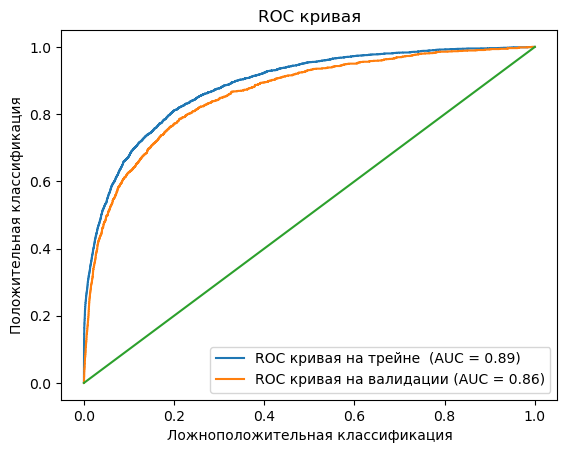

In [2371]:
from sklearn.metrics import roc_curve
from scipy.stats import ks_2samp

predict_proba_train = best_model_random_catBoost.predict_proba(X_train)[:, 1]

predict_proba_valid = best_model_random_catBoost.predict_proba(X_valid)[:, 1]

fpr_train, tpr_train, _ = roc_curve(y_train, predict_proba_train)
auc_train = roc_auc_score(y_train, predict_proba_train)

fpr_val, tpr_val, _ = roc_curve(y_valid, predict_proba_valid)
auc_val = roc_auc_score(y_valid, predict_proba_valid)

plt.plot(fpr_train, tpr_train, label='ROC кривая на трейне  (AUC = {:.2f})'.format(auc_train))
plt.plot(fpr_val, tpr_val, label='ROC кривая на валидации (AUC = {:.2f})'.format(auc_val))
plt.plot([0, 1], [0, 1])
plt.xlabel('Ложноположительная классификация')
plt.ylabel('Положительная классификация')
plt.title('ROC кривая')
plt.legend()
plt.show()

ROC кривые являются похожими, но дополнительно проведем тест Колмогорова-Смирнова, чтобы убедиться в том, что они статистически неразличимы

In [2372]:
ks_stat, p_value = ks_2samp(y_pred_train, y_pred_val)
print("KS Statistic:", ks_stat)
print("P-value:", p_value)

KS Statistic: 0.027921990356831405
P-value: 5.827575915012776e-10


P-value находится на уровне, очень близком к нулю, поэтому нулевая гипотеза о равенстве распределений выполняется для уровня значимости 99.5%

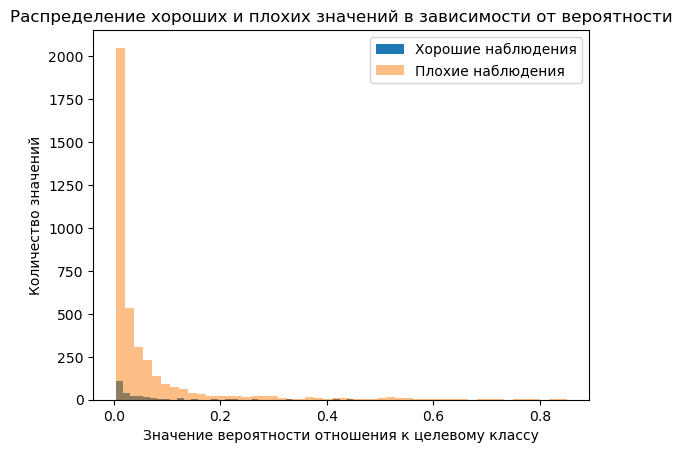

In [2347]:
y_scores = pd.DataFrame(best_model_random_catBoost.predict_proba(X_valid)[:, 1])

y_scores = pd.concat([y_scores, pd.DataFrame(y_valid)], join='inner', axis = 1, ignore_index=False)

good_scores = y_scores[0][y_scores['target'] == 1]
bad_scores = y_scores[0][y_scores['target'] == 0]

plt.hist(good_scores, bins=50, label='Хорошие наблюдения')
plt.hist(bad_scores, bins=50, label='Плохие наблюдения', alpha=0.5)
plt.xlabel('Значение вероятности отношения к целевому классу')
plt.ylabel('Количество значений')
plt.title('Распределение хороших и плохих значений в зависимости от вероятности')
plt.legend()
plt.show()

Как мы можем заметить, достаточно крупное количество "хороших" значений получает близкое к нулю значение. Это говорит о том, что в модели есть "недосказанность", которую возможно удастся преодолеть при добавлении новых переменных, расширении базы для обучения. 

Для внедрения в промышленную эксплуатацию необходимо:
1) Узнать, нет ли возможности агреггировать больше данных, т.к. на данный момент явно существуют признаки, которые влияют на значение таргета, но не учитываются в модели
2) Разработать интерфейс для взаимодействия с пользователем, т.к. в большинстве случаев операционисты не владеют языком Python
3) Предобучить модели на данных без одного или нескольких факторов, т.к. в работе могут появиться случаи, когда ряд данных будет не заполнен, но получить решение необходимо 

Допущениями в модели явлются:

1) Предполагается, что мы располагаем полным пакетом данных о клиенте
2) Предполагается честность предоставленных данных